# 1. Imports


1. Verify hd-bet works for PET images (try with and without skull)
     -> If not look at bet2
   
3. Try in Native space rather than MNI space
   
4. Try ADC if available

5. Expand Dataset
   
     -> Check unprocessed data, ADNI data (possibly ADNI for validation later)

6. Read literature and try different architectures
   
    -> Log metrics on test set after each experiment
        (SSIM, MSE, Inception score)

If use department GPU, make sure don't hog resources (esp if running overnight)

In [1]:
import matplotlib.pyplot as plt
import multiprocessing as mp
import nibabel as nib
import numpy as np
import os
import pandas as pd
import tempfile
from sklearn import metrics
import time
from time import time
import torch
import torch.nn as nn
import torch.nn.functional as F
from monai.networks.nets import AHNet
from tqdm import tqdm
import monai
from monai.utils import progress_bar
from monai.config import print_config
from monai.data import Dataset, DataLoader, CacheDataset
from monai.transforms import (
    Activations,
    AsDiscrete,
    Compose,
    EnsureChannelFirstd,
    EnsureTyped,
    LoadImaged,
    MapTransform,
    Orientationd,
    RandRicianNoised,
    RandRotated,
    RandFlipd,
    Resized,
    Rotate90d,
    ScaleIntensityd,
    DeleteItemsd,
    NormalizeIntensityd
)
from monai.losses.ssim_loss import SSIMLoss
import statistics

In [2]:
os.environ["CUDA_DEVICE_ORDER"]="PCI_BUS_ID"
os.environ["CUDA_VISIBLE_DEVICES"]="1,2,3"

In [3]:
%store -r dictionary_train
%store -r dictionary_valid
%store -r dictionary_test

In [4]:
# global variables
image_size = (128,128,64)

# 2. MONAI Dataloader

In [5]:
#To turn 4D images to 3D (from Ashley's classifier)
class MakeSingleVolumed(MapTransform):
    def __call__(self, data):
        for key in self.keys:
            num_volumes = data[key].shape[0]
            data["NumVolumes"] = num_volumes
            
            if num_volumes != 1:
                middle_volume = num_volumes // 2
                new_data = np.empty((1,image_size[0],image_size[1],image_size[2]))
                new_data[0,:,:,:] = data[key][middle_volume,:,:,:]
                # fill last slice with the value of num_volumes 
                new_data[0,:,:,-1] = np.zeros((data[key].shape[1],data[key].shape[2])) + num_volumes
                data[key] = torch.from_numpy(new_data)
            else:
                new_data = np.empty((1,image_size[0],image_size[1],image_size[2]))
                new_data[0,:,:,:] = data[key][0,:,:,:]
                # fill last slice with the value of num_volumes 
                new_data[0,:,:,-1] = np.zeros((data[key].shape[1],data[key].shape[2])) + num_volumes
                data[key] = torch.from_numpy(new_data)
                
        return data

#This uses the mask to scale the intensity of the image (not being used rn)
class ScaleImaged(MapTransform):
    def __call__(self, data):
            data[self.keys[0]] *= (0.4+data[self.keys[1]])

            return data

In [6]:
train_transforms = Compose(
    [
        LoadImaged(keys=["t1", "t1c", "t2", "flair", "pet"], reader=monai.data.ITKReader, image_only=True),
        EnsureChannelFirstd(keys=["t1", "t1c", "t2", "flair", "pet"]),
        Orientationd(keys=["t1", "t1c", "t2", "flair", "pet"], axcodes="RAS"),        
        EnsureTyped(keys=["t1", "t1c", "t2", "flair", "pet"]),
        Resized(keys=["t1", "t1c", "t2", "flair", "pet"], spatial_size=image_size),
        MakeSingleVolumed(keys=["t1", "t1c", "t2", "flair", "pet"]),
        Rotate90d(keys=["t1", "t1c", "t2", "flair", "pet"]),
        ScaleIntensityd(keys=["t1", "t1c", "t2", "flair", "pet"]),
        NormalizeIntensityd(keys=["t1", "t1c", "t2", "flair", "pet"]),
        RandFlipd(keys=["t1", "t1c", "t2", "flair", "pet"], prob=0.5, spatial_axis=1),
        RandRotated(keys=["t1", "t1c", "t2", "flair", "pet"], prob=0.6, range_z=0.3)
    ]
)

In [7]:
val_files = dictionary_train[:10]

check_ds = Dataset(data=val_files, transform=train_transforms)
check_DataLoader = DataLoader(check_ds, batch_size=1, shuffle=False)

It has been 18.37092638015747 seconds since the loop started


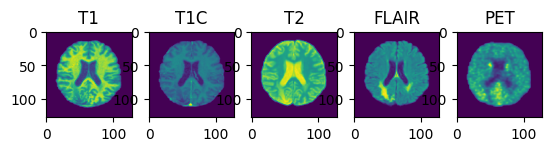

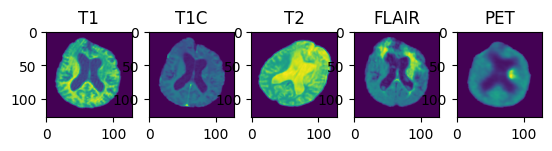

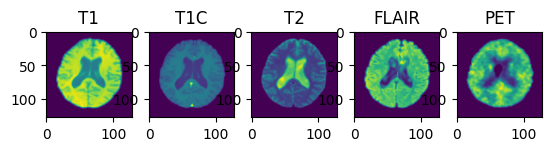

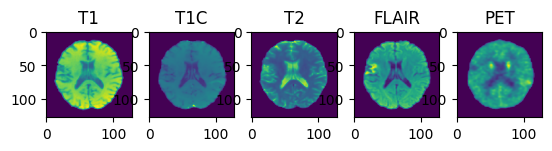

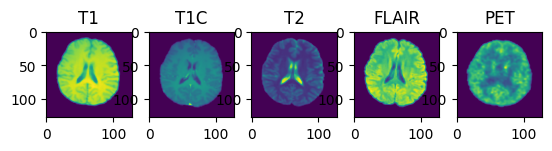

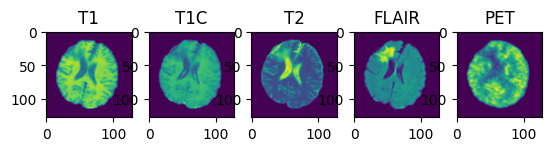

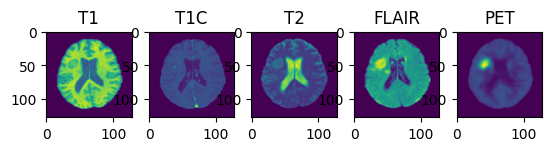

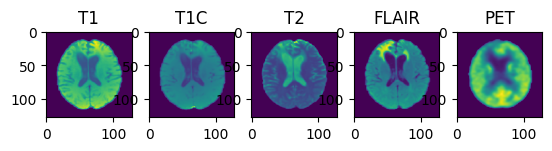

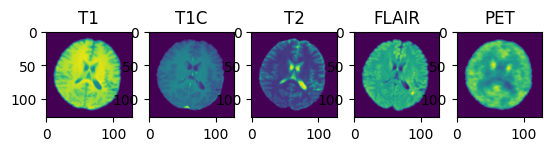

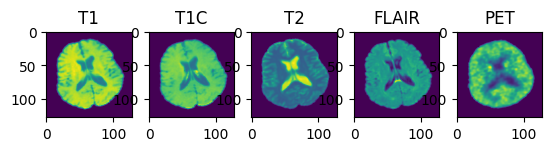

In [8]:
program_starts = time()
step = 1350
slice_index = 32
for item in check_DataLoader:
    image_datas = item["t1"][0, 0, :, :, slice_index], item["t1c"][0, 0, :, :, slice_index], item["t2"][0, 0, :, :, slice_index], item["flair"][0, 0, :, :, slice_index], item["pet"][0, 0, :, :, slice_index]
    
    f, axarr = plt.subplots(1, 5)
    
    axarr[0].imshow(image_datas[0])
    axarr[0].set_title("T1")
    axarr[1].imshow(image_datas[1])
    axarr[1].set_title("T1C")
    axarr[2].imshow(image_datas[2])
    axarr[2].set_title("T2")
    axarr[3].imshow(image_datas[3])
    axarr[3].set_title("FLAIR")
    axarr[4].imshow(image_datas[4])
    axarr[4].set_title("PET")
    
    step += 1
now = time()
print("It has been {0} seconds since the loop started".format(now - program_starts))

In [9]:
print(os.cpu_count())

train_ds = CacheDataset(data=dictionary_train, transform=train_transforms, cache_num=1024, num_workers=os.cpu_count())
train_loader = DataLoader(train_ds, batch_size=8, shuffle=True, num_workers=os.cpu_count(), drop_last=False)

train_metric_ds = CacheDataset(data=dictionary_train[:10], transform=train_transforms, cache_num=1024, num_workers=os.cpu_count())
train_metric_loader = DataLoader(train_ds, batch_size=1, shuffle=False, num_workers=os.cpu_count())

valid_ds = CacheDataset(data=dictionary_valid, transform=train_transforms, cache_num=1024, num_workers=os.cpu_count())
valid_loader = DataLoader(valid_ds, batch_size=1, shuffle=False, num_workers=os.cpu_count())

test_ds = CacheDataset(data=dictionary_test, transform=train_transforms, cache_num=1024, num_workers=os.cpu_count())
test_loader = DataLoader(test_ds, batch_size=1, shuffle=False, num_workers=os.cpu_count())

80


Loading dataset:   0%|                                  | 0/185 [00:00<?, ?it/s]

Loading dataset:   1%|▏                       | 1/185 [00:57<2:57:39, 57.93s/it]

Loading dataset:   1%|▎                       | 2/185 [00:58<1:14:10, 24.32s/it]

Loading dataset:   2%|▍                         | 3/185 [01:00<41:54, 13.82s/it]

Loading dataset:   2%|▌                         | 4/185 [01:01<27:32,  9.13s/it]

Loading dataset:   3%|▋                         | 5/185 [01:04<20:17,  6.76s/it]

Loading dataset:   3%|▊                         | 6/185 [01:05<14:22,  4.82s/it]

Loading dataset:   4%|▉                         | 7/185 [01:11<14:58,  5.05s/it]

Loading dataset:   4%|█                         | 8/185 [01:12<11:48,  4.00s/it]

Loading dataset:   5%|█▎                        | 9/185 [01:13<08:14,  2.81s/it]

Loading dataset:   5%|█▎                       | 10/185 [01:15<07:18,  2.50s/it]

Loading dataset:   6%|█▍                       | 11/185 [01:19<08:50,  3.05s/it]

Loading dataset:   6%|█▌                       | 12/185 [01:22<09:09,  3.18s/it]

Loading dataset:   7%|█▊                       | 13/185 [01:23<07:17,  2.54s/it]

Loading dataset:   8%|█▉                       | 14/185 [01:26<07:19,  2.57s/it]

Loading dataset:   8%|██                       | 15/185 [01:30<08:34,  3.02s/it]

Loading dataset:   9%|██▏                      | 16/185 [01:32<07:39,  2.72s/it]

Loading dataset:   9%|██▎                      | 17/185 [01:33<06:28,  2.31s/it]

Loading dataset:  10%|██▍                      | 18/185 [01:35<06:14,  2.24s/it]

Loading dataset:  10%|██▌                      | 19/185 [01:37<05:52,  2.12s/it]

Loading dataset:  11%|██▋                      | 20/185 [01:38<04:21,  1.59s/it]

Loading dataset:  11%|██▊                      | 21/185 [01:40<05:17,  1.94s/it]

Loading dataset:  12%|██▉                      | 22/185 [01:44<05:47,  2.13s/it]

Loading dataset:  12%|███                      | 23/185 [01:44<05:11,  1.92s/it]

Loading dataset:  13%|███▏                     | 24/185 [01:46<04:35,  1.71s/it]

Loading dataset:  14%|███▍                     | 25/185 [01:46<03:37,  1.36s/it]

Loading dataset:  14%|███▌                     | 26/185 [01:47<03:11,  1.20s/it]

Loading dataset:  15%|███▋                     | 27/185 [01:47<02:21,  1.11it/s]

Loading dataset:  15%|███▊                     | 28/185 [01:49<02:46,  1.06s/it]

Loading dataset:  16%|███▉                     | 29/185 [01:49<02:19,  1.12it/s]

Loading dataset:  16%|████                     | 30/185 [01:50<02:02,  1.27it/s]

Loading dataset:  44%|██████████▉              | 81/185 [01:52<00:07, 13.05it/s]

Loading dataset:  44%|███████████              | 82/185 [01:58<00:23,  4.40it/s]

Loading dataset:  45%|███████████▏             | 83/185 [01:59<00:26,  3.80it/s]

Loading dataset:  45%|███████████▎             | 84/185 [02:00<00:29,  3.44it/s]

Loading dataset:  46%|███████████▍             | 85/185 [02:01<00:36,  2.72it/s]

Loading dataset:  46%|███████████▌             | 86/185 [02:02<00:35,  2.79it/s]

Loading dataset:  47%|███████████▊             | 87/185 [02:03<00:49,  1.99it/s]

Loading dataset:  48%|███████████▉             | 88/185 [02:04<00:57,  1.69it/s]

Loading dataset:  48%|████████████             | 89/185 [02:06<01:04,  1.49it/s]

Loading dataset:  49%|████████████▏            | 90/185 [02:06<01:10,  1.35it/s]

Loading dataset:  49%|████████████▎            | 91/185 [02:07<01:02,  1.49it/s]

Loading dataset:  50%|████████████▍            | 92/185 [02:08<01:05,  1.43it/s]

Loading dataset:  50%|████████████▌            | 93/185 [02:08<00:57,  1.61it/s]

Loading dataset:  51%|████████████▋            | 94/185 [02:08<00:51,  1.77it/s]

Loading dataset:  58%|█████████████▉          | 107/185 [02:09<00:08,  9.41it/s]

Loading dataset:  61%|██████████████▋         | 113/185 [02:09<00:05, 13.14it/s]

Loading dataset:  67%|████████████████        | 124/185 [02:09<00:02, 21.81it/s]

Loading dataset:  77%|██████████████████▍     | 142/185 [02:09<00:01, 40.49it/s]

Loading dataset:  87%|████████████████████▉   | 161/185 [02:09<00:00, 54.25it/s]

Loading dataset:  92%|██████████████████████  | 170/185 [02:10<00:00, 43.58it/s]

Loading dataset:  96%|██████████████████████▉ | 177/185 [02:10<00:00, 45.43it/s]

Loading dataset: 100%|████████████████████████| 185/185 [02:10<00:00,  1.42it/s]

Loading dataset:   0%|                                   | 0/10 [00:00<?, ?it/s]

Loading dataset:  10%|██▋                        | 1/10 [00:07<01:06,  7.42s/it]

Loading dataset: 100%|██████████████████████████| 10/10 [00:07<00:00,  1.34it/s]

Loading dataset:   0%|                                    | 0/5 [00:00<?, ?it/s]

Loading dataset:  20%|█████▌                      | 1/5 [00:03<00:14,  3.70s/it]

Loading dataset: 100%|████████████████████████████| 5/5 [00:03<00:00,  1.35it/s]

Loading dataset:   0%|                                   | 0/57 [00:00<?, ?it/s]

Loading dataset:   2%|▍                          | 1/57 [00:41<38:57, 41.74s/it]

Loading dataset: 100%|██████████████████████████| 57/57 [00:41<00:00,  1.36it/s]

# 3. Model Setup


In [10]:
class GLA_Generator(nn.Module):
    def __init__(self):
        super(GLA_Generator, self).__init__()
        self.ahnet_global = AHNet(spatial_dims=3, in_channels=4, out_channels=16, pretrained=True)

        channels = [4, 6, 12, 6, 4]
        strides = [1, 1, 1, 1, 1]
        
        self.ahnet_1 = monai.networks.nets.AttentionUnet(spatial_dims=3, in_channels=4, out_channels=16, channels=channels, strides=strides)
        self.ahnet_2 = monai.networks.nets.AttentionUnet(spatial_dims=3, in_channels=4, out_channels=16, channels=channels, strides=strides)
        self.ahnet_3 = monai.networks.nets.AttentionUnet(spatial_dims=3, in_channels=4, out_channels=16, channels=channels, strides=strides)
        self.ahnet_4 = monai.networks.nets.AttentionUnet(spatial_dims=3, in_channels=4, out_channels=16, channels=channels, strides=strides)

        self.conv1 = nn.Conv3d(32, 16, kernel_size=1)
        self.bn1 = nn.BatchNorm3d(16)
        self.relu = nn.ReLU()
        #self.dropout = torch.nn.Dropout(0)
        self.conv2 = nn.Conv3d(16, 1, kernel_size=1)
        self.bn2 = nn.BatchNorm3d(1)

    def forward(self, x):
        batch_size, channels, width, height, depth = x.shape
        half_width, half_height = width // 2, height // 2
        
        # Splitting the input into 4 patches
        patch_1 = x[:, :, :half_width, :half_height, :]
        patch_2 = x[:, :, :half_width, half_height:, :]
        patch_3 = x[:, :, half_width:, :half_height, :]
        patch_4 = x[:, :, half_width:, half_height:, :]

        x = self.ahnet_global(x)
        patch_1 = self.ahnet_1(patch_1)
        patch_2 = self.ahnet_2(patch_2)
        patch_3 = self.ahnet_3(patch_3)
        patch_4 = self.ahnet_4(patch_4)

        # Concatenating the processed patches
        top_row = torch.cat([patch_1, patch_2], dim=3)  # Concatenate along the height
        bottom_row = torch.cat([patch_3, patch_4], dim=3)  # Concatenate along the height
        concatenated_patches = torch.cat([top_row, bottom_row], dim=2)  # Concatenate along the width

        x = torch.cat([x, concatenated_patches], dim=1)

        x = self.conv1(x)
        x = self.bn1(x)
        x = self.relu(x)
        #x = self.dropout(x)
        x = self.conv2(x)
        x = self.bn2(x)

        return x

### 3.1 Model and Device Setup

In [11]:
# Use GPU if available, otherwise CPU
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(device)

gen_net = GLA_Generator()

disc_net = monai.networks.nets.Critic(
    in_shape=(128, 128, 64),
    channels=(8, 16, 32, 64, 1),
    strides=(2, 2, 2, 2, 1),
    num_res_units=2,
    kernel_size=3,
)

# If multiple GPUs are available, run in parallel
if torch.cuda.device_count() > 1:
    print("Let's use", torch.cuda.device_count(), "GPUs!")
    gen_net = nn.DataParallel(gen_net)
    disc_net = nn.DataParallel(disc_net)

gen_net.to(device)
disc_net.to(device)

real_label = 1
gen_label = 0

disc_loss = torch.nn.BCELoss()
gen_loss = torch.nn.BCELoss()
gen_loss2 = monai.metrics.MultiScaleSSIMMetric(spatial_dims=3, kernel_size=4)

disc_opt = torch.optim.Adam(disc_net.parameters(), 0.0001)
gen_opt = torch.optim.Adam(gen_net.parameters(), 0.0001)

def discriminator_loss(fake_pred, real_pred, gp, c_lambda):
    """
    The discriminator loss if calculated by comparing its
    prediction for real and generated images.

    """
    return torch.mean(fake_pred) - torch.mean(real_pred) + c_lambda * gp


def generator_loss(input, real_images):
    """
    The generator loss is calculated by determining how well
    the discriminator was fooled by the generated images.

    """
    ssim = 1 - torch.mean(gen_loss2(input, real_images))
    fake_pred = disc_net(input[:,0,:,:,:])
    
    return (-1*torch.mean(fake_pred)) + ssim

cuda


The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.


Let's use 3 GPUs!


In [12]:
def get_gradient(crit, real, fake, epsilon):

    mixed_images = real * epsilon + fake * (1 - epsilon)

    mixed_scores = crit(mixed_images)
    
    gradient = torch.autograd.grad(
        inputs=mixed_images,
        outputs=mixed_scores,
        grad_outputs=torch.ones_like(mixed_scores), 
        create_graph=True,
        retain_graph=True,
        
    )[0]
    return gradient

def gradient_penalty(gradient):
    gradient = gradient.view(len(gradient), -1)

    gradient_norm = gradient.norm(2, dim=1)
    
    penalty = torch.mean((gradient_norm - 1)**2)
    return penalty

### 3.2 Training


----------
epoch 1/400


Epoch :   0%|                                            | 0/24 [00:00<?, ?it/s]

Epoch :   4%|█▌                                  | 1/24 [01:30<34:48, 90.81s/it]

Epoch :   8%|███                                 | 2/24 [01:33<14:15, 38.87s/it]

Epoch :  12%|████▌                               | 3/24 [01:35<07:42, 22.04s/it]

Epoch :  17%|██████                              | 4/24 [01:37<04:41, 14.07s/it]

Epoch :  21%|███████▌                            | 5/24 [01:39<03:03,  9.67s/it]

Epoch :  25%|█████████                           | 6/24 [01:40<02:06,  7.03s/it]

Epoch :  29%|██████████▌                         | 7/24 [01:42<01:30,  5.34s/it]

Epoch :  33%|████████████                        | 8/24 [01:44<01:07,  4.23s/it]

Epoch :  38%|█████████████▌                      | 9/24 [01:46<00:53,  3.57s/it]

Epoch :  42%|██████████████▌                    | 10/24 [01:48<00:42,  3.07s/it]

Epoch :  46%|████████████████                   | 11/24 [01:50<00:35,  2.73s/it]

Epoch :  50%|█████████████████▌                 | 12/24 [01:52<00:29,  2.50s/it]

Epoch :  54%|██████████████████▉                | 13/24 [01:54<00:25,  2.32s/it]

Epoch :  58%|████████████████████▍              | 14/24 [01:56<00:21,  2.19s/it]

Epoch :  62%|█████████████████████▉             | 15/24 [01:58<00:18,  2.09s/it]

Epoch :  67%|███████████████████████▎           | 16/24 [02:00<00:16,  2.02s/it]

Epoch :  71%|████████████████████████▊          | 17/24 [02:02<00:14,  2.07s/it]

Epoch :  75%|██████████████████████████▎        | 18/24 [02:04<00:12,  2.01s/it]

Epoch :  79%|███████████████████████████▋       | 19/24 [02:06<00:09,  1.97s/it]

Epoch :  83%|█████████████████████████████▏     | 20/24 [02:08<00:07,  1.97s/it]

Epoch :  88%|██████████████████████████████▋    | 21/24 [02:10<00:05,  1.96s/it]

Epoch :  92%|████████████████████████████████   | 22/24 [02:11<00:03,  1.95s/it]

Epoch :  96%|█████████████████████████████████▌ | 23/24 [02:13<00:01,  1.93s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:15<00:00,  1.72s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:18<00:00,  5.75s/it]

----------
epoch 2/400


Epoch :   0%|                                            | 0/24 [00:00<?, ?it/s]

Epoch :   4%|█▌                                  | 1/24 [01:38<37:47, 98.57s/it]

Epoch :   8%|███                                 | 2/24 [01:40<15:16, 41.67s/it]

Epoch :  12%|████▌                               | 3/24 [01:42<08:13, 23.51s/it]

Epoch :  17%|██████                              | 4/24 [01:44<04:59, 14.98s/it]

Epoch :  21%|███████▌                            | 5/24 [01:46<03:14, 10.25s/it]

Epoch :  25%|█████████                           | 6/24 [01:48<02:13,  7.44s/it]

Epoch :  29%|██████████▌                         | 7/24 [01:50<01:36,  5.66s/it]

Epoch :  33%|████████████                        | 8/24 [01:53<01:16,  4.81s/it]

Epoch :  38%|█████████████▌                      | 9/24 [01:55<00:58,  3.93s/it]

Epoch :  42%|██████████████▌                    | 10/24 [01:56<00:46,  3.32s/it]

Epoch :  46%|████████████████                   | 11/24 [01:58<00:37,  2.88s/it]

Epoch :  50%|█████████████████▌                 | 12/24 [02:00<00:30,  2.57s/it]

Epoch :  54%|██████████████████▉                | 13/24 [02:02<00:25,  2.35s/it]

Epoch :  58%|████████████████████▍              | 14/24 [02:04<00:22,  2.26s/it]

Epoch :  62%|█████████████████████▉             | 15/24 [02:06<00:19,  2.21s/it]

Epoch :  67%|███████████████████████▎           | 16/24 [02:08<00:17,  2.20s/it]

Epoch :  71%|████████████████████████▊          | 17/24 [02:10<00:15,  2.15s/it]

Epoch :  75%|██████████████████████████▎        | 18/24 [02:12<00:12,  2.07s/it]

Epoch :  79%|███████████████████████████▋       | 19/24 [02:14<00:09,  2.00s/it]

Epoch :  83%|█████████████████████████████▏     | 20/24 [02:16<00:07,  1.98s/it]

Epoch :  88%|██████████████████████████████▋    | 21/24 [02:18<00:05,  1.95s/it]

Epoch :  92%|████████████████████████████████   | 22/24 [02:20<00:03,  1.94s/it]

Epoch :  96%|█████████████████████████████████▌ | 23/24 [02:22<00:01,  1.91s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:23<00:00,  1.63s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:26<00:00,  6.12s/it]

----------
epoch 3/400


Epoch :   0%|                                            | 0/24 [00:00<?, ?it/s]

Epoch :   4%|█▌                                  | 1/24 [01:38<37:55, 98.95s/it]

Epoch :   8%|███                                 | 2/24 [01:40<15:21, 41.89s/it]

Epoch :  12%|████▌                               | 3/24 [01:42<08:16, 23.62s/it]

Epoch :  17%|██████                              | 4/24 [01:44<05:02, 15.12s/it]

Epoch :  21%|███████▌                            | 5/24 [01:46<03:16, 10.35s/it]

Epoch :  25%|█████████                           | 6/24 [01:48<02:14,  7.46s/it]

Epoch :  29%|██████████▌                         | 7/24 [01:50<01:37,  5.74s/it]

Epoch :  33%|████████████                        | 8/24 [01:52<01:12,  4.50s/it]

Epoch :  38%|█████████████▌                      | 9/24 [01:54<00:55,  3.67s/it]

Epoch :  42%|██████████████▌                    | 10/24 [01:56<00:43,  3.11s/it]

Epoch :  46%|████████████████                   | 11/24 [01:58<00:35,  2.72s/it]

Epoch :  50%|█████████████████▌                 | 12/24 [02:00<00:29,  2.45s/it]

Epoch :  54%|██████████████████▉                | 13/24 [02:01<00:24,  2.27s/it]

Epoch :  58%|████████████████████▍              | 14/24 [02:03<00:21,  2.18s/it]

Epoch :  62%|█████████████████████▉             | 15/24 [02:05<00:19,  2.17s/it]

Epoch :  67%|███████████████████████▎           | 16/24 [02:07<00:16,  2.07s/it]

Epoch :  71%|████████████████████████▊          | 17/24 [02:09<00:13,  1.99s/it]

Epoch :  75%|██████████████████████████▎        | 18/24 [02:11<00:11,  1.95s/it]

Epoch :  79%|███████████████████████████▋       | 19/24 [02:13<00:09,  1.91s/it]

Epoch :  83%|█████████████████████████████▏     | 20/24 [02:15<00:07,  1.88s/it]

Epoch :  88%|██████████████████████████████▋    | 21/24 [02:16<00:05,  1.86s/it]

Epoch :  92%|████████████████████████████████   | 22/24 [02:18<00:03,  1.88s/it]

Epoch :  96%|█████████████████████████████████▌ | 23/24 [02:21<00:01,  1.97s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:22<00:00,  1.67s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:25<00:00,  6.06s/it]

----------
epoch 4/400


Epoch :   0%|                                            | 0/24 [00:00<?, ?it/s]

Epoch :   4%|█▌                                  | 1/24 [01:37<37:28, 97.75s/it]

Epoch :   8%|███                                 | 2/24 [01:39<15:10, 41.38s/it]

Epoch :  12%|████▌                               | 3/24 [01:41<08:10, 23.34s/it]

Epoch :  17%|██████                              | 4/24 [01:43<04:57, 14.85s/it]

Epoch :  21%|███████▌                            | 5/24 [01:45<03:13, 10.16s/it]

Epoch :  25%|█████████                           | 6/24 [01:47<02:11,  7.33s/it]

Epoch :  29%|██████████▌                         | 7/24 [01:49<01:36,  5.68s/it]

Epoch :  33%|████████████                        | 8/24 [01:51<01:11,  4.46s/it]

Epoch :  38%|█████████████▌                      | 9/24 [01:53<00:54,  3.65s/it]

Epoch :  42%|██████████████▌                    | 10/24 [01:54<00:43,  3.11s/it]

Epoch :  46%|████████████████                   | 11/24 [01:56<00:35,  2.73s/it]

Epoch :  50%|█████████████████▌                 | 12/24 [01:58<00:29,  2.47s/it]

Epoch :  54%|██████████████████▉                | 13/24 [02:00<00:25,  2.28s/it]

Epoch :  58%|████████████████████▍              | 14/24 [02:02<00:21,  2.15s/it]

Epoch :  62%|█████████████████████▉             | 15/24 [02:04<00:19,  2.14s/it]

Epoch :  67%|███████████████████████▎           | 16/24 [02:06<00:16,  2.05s/it]

Epoch :  71%|████████████████████████▊          | 17/24 [02:08<00:14,  2.04s/it]

Epoch :  75%|██████████████████████████▎        | 18/24 [02:10<00:12,  2.01s/it]

Epoch :  79%|███████████████████████████▋       | 19/24 [02:12<00:10,  2.06s/it]

Epoch :  83%|█████████████████████████████▏     | 20/24 [02:14<00:08,  2.05s/it]

Epoch :  88%|██████████████████████████████▋    | 21/24 [02:16<00:05,  1.98s/it]

Epoch :  92%|████████████████████████████████   | 22/24 [02:18<00:04,  2.06s/it]

Epoch :  96%|█████████████████████████████████▌ | 23/24 [02:20<00:02,  2.01s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:21<00:00,  1.71s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:24<00:00,  6.02s/it]

----------
epoch 5/400


Epoch :   0%|                                            | 0/24 [00:00<?, ?it/s]

Epoch :   4%|█▌                                  | 1/24 [01:35<36:25, 95.02s/it]

Epoch :   8%|███                                 | 2/24 [01:36<14:46, 40.27s/it]

Epoch :  12%|████▌                               | 3/24 [01:38<07:57, 22.74s/it]

Epoch :  17%|██████                              | 4/24 [01:40<04:49, 14.49s/it]

Epoch :  21%|███████▌                            | 5/24 [01:42<03:08,  9.93s/it]

Epoch :  25%|█████████                           | 6/24 [01:44<02:11,  7.33s/it]

Epoch :  29%|██████████▌                         | 7/24 [01:46<01:34,  5.55s/it]

Epoch :  33%|████████████                        | 8/24 [01:48<01:10,  4.38s/it]

Epoch :  38%|█████████████▌                      | 9/24 [01:50<00:54,  3.65s/it]

Epoch :  42%|██████████████▌                    | 10/24 [01:52<00:43,  3.11s/it]

Epoch :  46%|████████████████                   | 11/24 [01:54<00:35,  2.72s/it]

Epoch :  50%|█████████████████▌                 | 12/24 [01:56<00:29,  2.45s/it]

Epoch :  54%|██████████████████▉                | 13/24 [01:58<00:25,  2.29s/it]

Epoch :  58%|████████████████████▍              | 14/24 [02:00<00:22,  2.28s/it]

Epoch :  62%|█████████████████████▉             | 15/24 [02:02<00:19,  2.15s/it]

Epoch :  67%|███████████████████████▎           | 16/24 [02:04<00:16,  2.07s/it]

Epoch :  71%|████████████████████████▊          | 17/24 [02:06<00:14,  2.03s/it]

Epoch :  75%|██████████████████████████▎        | 18/24 [02:07<00:11,  1.96s/it]

Epoch :  79%|███████████████████████████▋       | 19/24 [02:09<00:09,  1.91s/it]

Epoch :  83%|█████████████████████████████▏     | 20/24 [02:11<00:07,  1.88s/it]

Epoch :  88%|██████████████████████████████▋    | 21/24 [02:13<00:05,  1.87s/it]

Epoch :  92%|████████████████████████████████   | 22/24 [02:15<00:04,  2.10s/it]

Epoch :  96%|█████████████████████████████████▌ | 23/24 [02:17<00:02,  2.02s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:18<00:00,  1.71s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:21<00:00,  5.91s/it]

----------
epoch 6/400


Epoch :   0%|                                            | 0/24 [00:00<?, ?it/s]

Epoch :   4%|█▌                                  | 1/24 [01:37<37:29, 97.81s/it]

Epoch :   8%|███                                 | 2/24 [01:39<15:10, 41.41s/it]

Epoch :  12%|████▌                               | 3/24 [01:41<08:10, 23.35s/it]

Epoch :  17%|██████                              | 4/24 [01:43<04:57, 14.86s/it]

Epoch :  21%|███████▌                            | 5/24 [01:45<03:13, 10.17s/it]

Epoch :  25%|█████████                           | 6/24 [01:47<02:14,  7.50s/it]

Epoch :  29%|██████████▌                         | 7/24 [01:49<01:36,  5.66s/it]

Epoch :  33%|████████████                        | 8/24 [01:51<01:11,  4.48s/it]

Epoch :  38%|█████████████▌                      | 9/24 [01:53<00:56,  3.75s/it]

Epoch :  42%|██████████████▌                    | 10/24 [01:55<00:45,  3.23s/it]

Epoch :  46%|████████████████                   | 11/24 [01:57<00:36,  2.85s/it]

Epoch :  50%|█████████████████▌                 | 12/24 [01:59<00:30,  2.54s/it]

Epoch :  54%|██████████████████▉                | 13/24 [02:02<00:28,  2.58s/it]

Epoch :  58%|████████████████████▍              | 14/24 [02:03<00:23,  2.36s/it]

Epoch :  62%|█████████████████████▉             | 15/24 [02:05<00:20,  2.23s/it]

Epoch :  67%|███████████████████████▎           | 16/24 [02:07<00:17,  2.13s/it]

Epoch :  71%|████████████████████████▊          | 17/24 [02:09<00:14,  2.05s/it]

Epoch :  75%|██████████████████████████▎        | 18/24 [02:11<00:11,  2.00s/it]

Epoch :  79%|███████████████████████████▋       | 19/24 [02:13<00:09,  1.96s/it]

Epoch :  83%|█████████████████████████████▏     | 20/24 [02:15<00:07,  1.95s/it]

Epoch :  88%|██████████████████████████████▋    | 21/24 [02:17<00:06,  2.02s/it]

Epoch :  92%|████████████████████████████████   | 22/24 [02:19<00:03,  1.97s/it]

Epoch :  96%|█████████████████████████████████▌ | 23/24 [02:21<00:01,  1.93s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:22<00:00,  1.64s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:25<00:00,  6.06s/it]

----------
epoch 7/400


Epoch :   0%|                                            | 0/24 [00:00<?, ?it/s]

Epoch :   4%|█▍                                 | 1/24 [01:46<40:40, 106.12s/it]

Epoch :   8%|███                                 | 2/24 [01:48<16:26, 44.86s/it]

Epoch :  12%|████▌                               | 3/24 [01:50<08:50, 25.28s/it]

Epoch :  17%|██████                              | 4/24 [01:51<05:21, 16.05s/it]

Epoch :  21%|███████▌                            | 5/24 [01:54<03:34, 11.27s/it]

Epoch :  25%|█████████                           | 6/24 [01:56<02:25,  8.11s/it]

Epoch :  29%|██████████▌                         | 7/24 [01:58<01:43,  6.08s/it]

Epoch :  33%|████████████                        | 8/24 [02:00<01:15,  4.74s/it]

Epoch :  38%|█████████████▌                      | 9/24 [02:02<00:57,  3.85s/it]

Epoch :  42%|██████████████▌                    | 10/24 [02:04<00:45,  3.24s/it]

Epoch :  46%|████████████████                   | 11/24 [02:06<00:36,  2.82s/it]

Epoch :  50%|█████████████████▌                 | 12/24 [02:08<00:30,  2.53s/it]

Epoch :  54%|██████████████████▉                | 13/24 [02:10<00:28,  2.57s/it]

Epoch :  58%|████████████████████▍              | 14/24 [02:12<00:23,  2.35s/it]

Epoch :  62%|█████████████████████▉             | 15/24 [02:14<00:19,  2.21s/it]

Epoch :  67%|███████████████████████▎           | 16/24 [02:16<00:17,  2.16s/it]

Epoch :  71%|████████████████████████▊          | 17/24 [02:18<00:14,  2.07s/it]

Epoch :  75%|██████████████████████████▎        | 18/24 [02:20<00:12,  2.02s/it]

Epoch :  79%|███████████████████████████▋       | 19/24 [02:22<00:10,  2.05s/it]

Epoch :  83%|█████████████████████████████▏     | 20/24 [02:24<00:07,  2.00s/it]

Epoch :  88%|██████████████████████████████▋    | 21/24 [02:26<00:06,  2.15s/it]

Epoch :  92%|████████████████████████████████   | 22/24 [02:28<00:04,  2.09s/it]

Epoch :  96%|█████████████████████████████████▌ | 23/24 [02:30<00:02,  2.09s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:31<00:00,  1.75s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:35<00:00,  6.46s/it]

----------
epoch 8/400


Epoch :   0%|                                            | 0/24 [00:00<?, ?it/s]

Epoch :   4%|█▌                                  | 1/24 [01:36<37:05, 96.77s/it]

Epoch :   8%|███                                 | 2/24 [01:38<15:00, 40.94s/it]

Epoch :  12%|████▌                               | 3/24 [01:40<08:04, 23.09s/it]

Epoch :  17%|██████                              | 4/24 [01:42<04:54, 14.74s/it]

Epoch :  21%|███████▌                            | 5/24 [01:44<03:14, 10.24s/it]

Epoch :  25%|█████████                           | 6/24 [01:46<02:13,  7.39s/it]

Epoch :  29%|██████████▌                         | 7/24 [01:48<01:35,  5.63s/it]

Epoch :  33%|████████████                        | 8/24 [01:50<01:11,  4.45s/it]

Epoch :  38%|█████████████▌                      | 9/24 [01:52<00:54,  3.66s/it]

Epoch :  42%|██████████████▌                    | 10/24 [01:54<00:44,  3.17s/it]

Epoch :  46%|████████████████                   | 11/24 [01:56<00:36,  2.77s/it]

Epoch :  50%|█████████████████▌                 | 12/24 [01:58<00:30,  2.58s/it]

Epoch :  54%|██████████████████▉                | 13/24 [02:00<00:25,  2.36s/it]

Epoch :  58%|████████████████████▍              | 14/24 [02:02<00:22,  2.25s/it]

Epoch :  62%|█████████████████████▉             | 15/24 [02:04<00:19,  2.20s/it]

Epoch :  67%|███████████████████████▎           | 16/24 [02:06<00:16,  2.12s/it]

Epoch :  71%|████████████████████████▊          | 17/24 [02:08<00:14,  2.07s/it]

Epoch :  75%|██████████████████████████▎        | 18/24 [02:10<00:12,  2.01s/it]

Epoch :  79%|███████████████████████████▋       | 19/24 [02:11<00:09,  1.95s/it]

Epoch :  83%|█████████████████████████████▏     | 20/24 [02:14<00:08,  2.02s/it]

Epoch :  88%|██████████████████████████████▋    | 21/24 [02:16<00:05,  2.00s/it]

Epoch :  92%|████████████████████████████████   | 22/24 [02:18<00:03,  2.00s/it]

Epoch :  96%|█████████████████████████████████▌ | 23/24 [02:19<00:01,  1.96s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:20<00:00,  1.67s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:24<00:00,  6.02s/it]

----------
epoch 9/400


Epoch :   0%|                                            | 0/24 [00:00<?, ?it/s]

Epoch :   4%|█▌                                  | 1/24 [01:35<36:34, 95.43s/it]

Epoch :   8%|███                                 | 2/24 [01:37<14:55, 40.70s/it]

Epoch :  12%|████▌                               | 3/24 [01:39<08:03, 23.02s/it]

Epoch :  17%|██████                              | 4/24 [01:42<04:57, 14.86s/it]

Epoch :  21%|███████▌                            | 5/24 [01:44<03:13, 10.18s/it]

Epoch :  25%|█████████                           | 6/24 [01:45<02:12,  7.35s/it]

Epoch :  29%|██████████▌                         | 7/24 [01:47<01:34,  5.55s/it]

Epoch :  33%|████████████                        | 8/24 [01:49<01:10,  4.42s/it]

Epoch :  38%|█████████████▌                      | 9/24 [01:51<00:54,  3.66s/it]

Epoch :  42%|██████████████▌                    | 10/24 [01:53<00:43,  3.13s/it]

Epoch :  46%|████████████████                   | 11/24 [01:55<00:35,  2.76s/it]

Epoch :  50%|█████████████████▌                 | 12/24 [01:57<00:30,  2.56s/it]

Epoch :  54%|██████████████████▉                | 13/24 [01:59<00:25,  2.34s/it]

Epoch :  58%|████████████████████▍              | 14/24 [02:01<00:21,  2.18s/it]

Epoch :  62%|█████████████████████▉             | 15/24 [02:03<00:18,  2.07s/it]

Epoch :  67%|███████████████████████▎           | 16/24 [02:04<00:15,  2.00s/it]

Epoch :  71%|████████████████████████▊          | 17/24 [02:06<00:13,  1.95s/it]

Epoch :  75%|██████████████████████████▎        | 18/24 [02:08<00:11,  1.92s/it]

Epoch :  79%|███████████████████████████▋       | 19/24 [02:10<00:09,  1.90s/it]

Epoch :  83%|█████████████████████████████▏     | 20/24 [02:12<00:07,  1.96s/it]

Epoch :  88%|██████████████████████████████▋    | 21/24 [02:14<00:05,  1.92s/it]

Epoch :  92%|████████████████████████████████   | 22/24 [02:16<00:03,  1.89s/it]

Epoch :  96%|█████████████████████████████████▌ | 23/24 [02:18<00:01,  1.88s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:19<00:00,  1.63s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:22<00:00,  5.94s/it]

----------
epoch 10/400


Epoch :   0%|                                            | 0/24 [00:00<?, ?it/s]

Epoch :   4%|█▌                                  | 1/24 [01:39<38:10, 99.58s/it]

Epoch :   8%|███                                 | 2/24 [01:41<15:27, 42.15s/it]

Epoch :  12%|████▌                               | 3/24 [01:43<08:20, 23.85s/it]

Epoch :  17%|██████                              | 4/24 [01:46<05:07, 15.39s/it]

Epoch :  21%|███████▌                            | 5/24 [01:47<03:20, 10.53s/it]

Epoch :  25%|█████████                           | 6/24 [01:49<02:16,  7.58s/it]

Epoch :  29%|██████████▌                         | 7/24 [01:51<01:37,  5.74s/it]

Epoch :  33%|████████████                        | 8/24 [01:53<01:12,  4.53s/it]

Epoch :  38%|█████████████▌                      | 9/24 [01:55<00:55,  3.71s/it]

Epoch :  42%|██████████████▌                    | 10/24 [01:57<00:44,  3.16s/it]

Epoch :  46%|████████████████                   | 11/24 [01:59<00:35,  2.77s/it]

Epoch :  50%|█████████████████▌                 | 12/24 [02:01<00:31,  2.63s/it]

Epoch :  54%|██████████████████▉                | 13/24 [02:03<00:26,  2.44s/it]

Epoch :  58%|████████████████████▍              | 14/24 [02:05<00:22,  2.27s/it]

Epoch :  62%|█████████████████████▉             | 15/24 [02:07<00:19,  2.14s/it]

Epoch :  67%|███████████████████████▎           | 16/24 [02:09<00:16,  2.06s/it]

Epoch :  71%|████████████████████████▊          | 17/24 [02:11<00:13,  1.99s/it]

Epoch :  75%|██████████████████████████▎        | 18/24 [02:13<00:11,  1.96s/it]

Epoch :  79%|███████████████████████████▋       | 19/24 [02:15<00:10,  2.02s/it]

Epoch :  83%|█████████████████████████████▏     | 20/24 [02:17<00:07,  1.97s/it]

Epoch :  88%|██████████████████████████████▋    | 21/24 [02:18<00:05,  1.94s/it]

Epoch :  92%|████████████████████████████████   | 22/24 [02:20<00:03,  1.95s/it]

Epoch :  96%|█████████████████████████████████▌ | 23/24 [02:22<00:01,  1.92s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:23<00:00,  1.64s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:27<00:00,  6.13s/it]

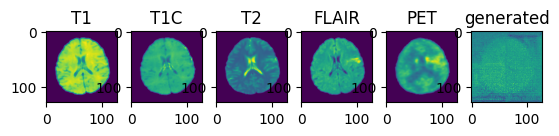

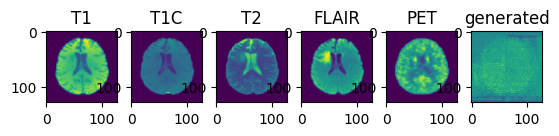

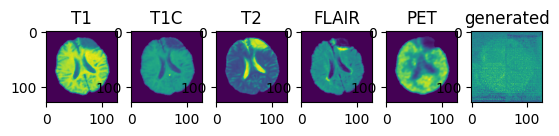

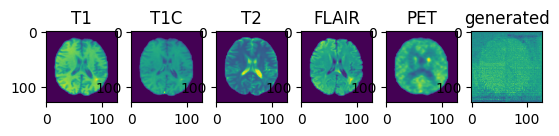

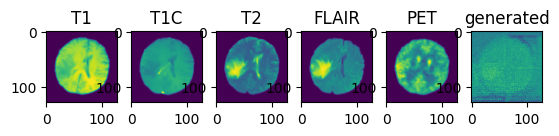

validation avg MS-SSIM: 0.1966 , train avg MS-SSIM: 0.1835
----------
epoch 11/400


Epoch :   0%|                                            | 0/24 [00:00<?, ?it/s]

Epoch :   4%|█▌                                  | 1/24 [01:38<37:55, 98.92s/it]

Epoch :   8%|███                                 | 2/24 [01:41<15:23, 41.96s/it]

Epoch :  12%|████▌                               | 3/24 [01:42<08:17, 23.67s/it]

Epoch :  17%|██████                              | 4/24 [01:44<05:01, 15.08s/it]

Epoch :  21%|███████▌                            | 5/24 [01:46<03:16, 10.32s/it]

Epoch :  25%|█████████                           | 6/24 [01:48<02:16,  7.58s/it]

Epoch :  29%|██████████▌                         | 7/24 [01:50<01:37,  5.75s/it]

Epoch :  33%|████████████                        | 8/24 [01:52<01:12,  4.54s/it]

Epoch :  38%|█████████████▌                      | 9/24 [01:55<00:56,  3.79s/it]

Epoch :  42%|██████████████▌                    | 10/24 [01:57<00:45,  3.25s/it]

Epoch :  46%|████████████████                   | 11/24 [01:59<00:37,  2.88s/it]

Epoch :  50%|█████████████████▌                 | 12/24 [02:01<00:31,  2.62s/it]

Epoch :  54%|██████████████████▉                | 13/24 [02:03<00:26,  2.42s/it]

Epoch :  58%|████████████████████▍              | 14/24 [02:05<00:23,  2.40s/it]

Epoch :  62%|█████████████████████▉             | 15/24 [02:07<00:20,  2.26s/it]

Epoch :  67%|███████████████████████▎           | 16/24 [02:09<00:17,  2.16s/it]

Epoch :  71%|████████████████████████▊          | 17/24 [02:11<00:14,  2.08s/it]

Epoch :  75%|██████████████████████████▎        | 18/24 [02:13<00:12,  2.00s/it]

Epoch :  79%|███████████████████████████▋       | 19/24 [02:14<00:09,  1.95s/it]

Epoch :  83%|█████████████████████████████▏     | 20/24 [02:16<00:07,  1.93s/it]

Epoch :  88%|██████████████████████████████▋    | 21/24 [02:18<00:05,  1.98s/it]

Epoch :  92%|████████████████████████████████   | 22/24 [02:20<00:03,  1.94s/it]

Epoch :  96%|█████████████████████████████████▌ | 23/24 [02:22<00:01,  1.91s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:23<00:00,  1.64s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:26<00:00,  6.10s/it]

----------
epoch 12/400


Epoch :   0%|                                            | 0/24 [00:00<?, ?it/s]

Epoch :   4%|█▌                                  | 1/24 [01:36<37:08, 96.89s/it]

Epoch :   8%|███                                 | 2/24 [01:38<15:02, 41.02s/it]

Epoch :  12%|████▌                               | 3/24 [01:40<08:06, 23.17s/it]

Epoch :  17%|██████                              | 4/24 [01:42<04:57, 14.87s/it]

Epoch :  21%|███████▌                            | 5/24 [01:45<03:16, 10.34s/it]

Epoch :  25%|█████████                           | 6/24 [01:47<02:14,  7.49s/it]

Epoch :  29%|██████████▌                         | 7/24 [01:49<01:36,  5.68s/it]

Epoch :  33%|████████████                        | 8/24 [01:51<01:11,  4.48s/it]

Epoch :  38%|█████████████▌                      | 9/24 [01:52<00:55,  3.68s/it]

Epoch :  42%|██████████████▌                    | 10/24 [01:54<00:44,  3.17s/it]

Epoch :  46%|████████████████                   | 11/24 [01:56<00:36,  2.82s/it]

Epoch :  50%|█████████████████▌                 | 12/24 [01:58<00:30,  2.52s/it]

Epoch :  54%|██████████████████▉                | 13/24 [02:01<00:28,  2.58s/it]

Epoch :  58%|████████████████████▍              | 14/24 [02:03<00:23,  2.38s/it]

Epoch :  62%|█████████████████████▉             | 15/24 [02:05<00:20,  2.24s/it]

Epoch :  67%|███████████████████████▎           | 16/24 [02:07<00:16,  2.12s/it]

Epoch :  71%|████████████████████████▊          | 17/24 [02:09<00:14,  2.08s/it]

Epoch :  75%|██████████████████████████▎        | 18/24 [02:11<00:12,  2.03s/it]

Epoch :  79%|███████████████████████████▋       | 19/24 [02:12<00:09,  1.97s/it]

Epoch :  83%|█████████████████████████████▏     | 20/24 [02:14<00:07,  1.94s/it]

Epoch :  88%|██████████████████████████████▋    | 21/24 [02:17<00:06,  2.03s/it]

Epoch :  92%|████████████████████████████████   | 22/24 [02:19<00:04,  2.01s/it]

Epoch :  96%|█████████████████████████████████▌ | 23/24 [02:20<00:01,  1.98s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:21<00:00,  1.69s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:25<00:00,  6.05s/it]

----------
epoch 13/400


Epoch :   0%|                                            | 0/24 [00:00<?, ?it/s]

Epoch :   4%|█▌                                  | 1/24 [01:35<36:27, 95.09s/it]

Epoch :   8%|███                                 | 2/24 [01:36<14:45, 40.25s/it]

Epoch :  12%|████▌                               | 3/24 [01:38<07:57, 22.72s/it]

Epoch :  17%|██████                              | 4/24 [01:41<04:52, 14.62s/it]

Epoch :  21%|███████▌                            | 5/24 [01:42<03:10, 10.01s/it]

Epoch :  25%|█████████                           | 6/24 [01:44<02:10,  7.23s/it]

Epoch :  29%|██████████▌                         | 7/24 [01:46<01:34,  5.53s/it]

Epoch :  33%|████████████                        | 8/24 [01:48<01:10,  4.39s/it]

Epoch :  38%|█████████████▌                      | 9/24 [01:50<00:53,  3.58s/it]

Epoch :  42%|██████████████▌                    | 10/24 [01:52<00:42,  3.06s/it]

Epoch :  46%|████████████████                   | 11/24 [01:54<00:35,  2.70s/it]

Epoch :  50%|█████████████████▌                 | 12/24 [01:56<00:30,  2.55s/it]

Epoch :  54%|██████████████████▉                | 13/24 [01:58<00:26,  2.36s/it]

Epoch :  58%|████████████████████▍              | 14/24 [02:00<00:22,  2.23s/it]

Epoch :  62%|█████████████████████▉             | 15/24 [02:02<00:19,  2.14s/it]

Epoch :  67%|███████████████████████▎           | 16/24 [02:04<00:16,  2.05s/it]

Epoch :  71%|████████████████████████▊          | 17/24 [02:05<00:14,  2.00s/it]

Epoch :  75%|██████████████████████████▎        | 18/24 [02:07<00:11,  1.97s/it]

Epoch :  79%|███████████████████████████▋       | 19/24 [02:09<00:09,  1.94s/it]

Epoch :  83%|█████████████████████████████▏     | 20/24 [02:11<00:08,  2.01s/it]

Epoch :  88%|██████████████████████████████▋    | 21/24 [02:13<00:05,  1.97s/it]

Epoch :  92%|████████████████████████████████   | 22/24 [02:15<00:03,  1.98s/it]

Epoch :  96%|█████████████████████████████████▌ | 23/24 [02:17<00:01,  1.96s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:18<00:00,  1.68s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:22<00:00,  5.92s/it]

----------
epoch 14/400


Epoch :   0%|                                            | 0/24 [00:00<?, ?it/s]

Epoch :   4%|█▍                                 | 1/24 [01:40<38:32, 100.54s/it]

Epoch :   8%|███                                 | 2/24 [01:42<15:34, 42.50s/it]

Epoch :  12%|████▌                               | 3/24 [01:44<08:22, 23.93s/it]

Epoch :  17%|██████                              | 4/24 [01:46<05:06, 15.34s/it]

Epoch :  21%|███████▌                            | 5/24 [01:48<03:19, 10.49s/it]

Epoch :  25%|█████████                           | 6/24 [01:50<02:18,  7.70s/it]

Epoch :  29%|██████████▌                         | 7/24 [01:52<01:39,  5.86s/it]

Epoch :  33%|████████████                        | 8/24 [01:54<01:14,  4.63s/it]

Epoch :  38%|█████████████▌                      | 9/24 [01:56<00:56,  3.78s/it]

Epoch :  42%|██████████████▌                    | 10/24 [01:58<00:44,  3.19s/it]

Epoch :  46%|████████████████                   | 11/24 [02:00<00:36,  2.79s/it]

Epoch :  50%|█████████████████▌                 | 12/24 [02:02<00:31,  2.64s/it]

Epoch :  54%|██████████████████▉                | 13/24 [02:04<00:26,  2.41s/it]

Epoch :  58%|████████████████████▍              | 14/24 [02:06<00:22,  2.27s/it]

Epoch :  62%|█████████████████████▉             | 15/24 [02:08<00:19,  2.18s/it]

Epoch :  67%|███████████████████████▎           | 16/24 [02:10<00:17,  2.13s/it]

Epoch :  71%|████████████████████████▊          | 17/24 [02:12<00:14,  2.04s/it]

Epoch :  75%|██████████████████████████▎        | 18/24 [02:14<00:11,  1.98s/it]

Epoch :  79%|███████████████████████████▋       | 19/24 [02:15<00:09,  1.93s/it]

Epoch :  83%|█████████████████████████████▏     | 20/24 [02:18<00:07,  1.99s/it]

Epoch :  88%|██████████████████████████████▋    | 21/24 [02:19<00:05,  1.98s/it]

Epoch :  92%|████████████████████████████████   | 22/24 [02:21<00:03,  1.94s/it]

Epoch :  96%|█████████████████████████████████▌ | 23/24 [02:23<00:02,  2.01s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:24<00:00,  1.70s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:28<00:00,  6.19s/it]

----------
epoch 15/400


Epoch :   0%|                                            | 0/24 [00:00<?, ?it/s]

Epoch :   4%|█▌                                  | 1/24 [01:38<37:54, 98.90s/it]

Epoch :   8%|███                                 | 2/24 [01:40<15:20, 41.82s/it]

Epoch :  12%|████▌                               | 3/24 [01:42<08:15, 23.59s/it]

Epoch :  17%|██████                              | 4/24 [01:44<05:03, 15.18s/it]

Epoch :  21%|███████▌                            | 5/24 [01:46<03:16, 10.37s/it]

Epoch :  25%|█████████                           | 6/24 [01:48<02:14,  7.46s/it]

Epoch :  29%|██████████▌                         | 7/24 [01:50<01:35,  5.65s/it]

Epoch :  33%|████████████                        | 8/24 [01:52<01:11,  4.46s/it]

Epoch :  38%|█████████████▌                      | 9/24 [01:54<00:54,  3.64s/it]

Epoch :  42%|██████████████▌                    | 10/24 [01:56<00:43,  3.09s/it]

Epoch :  46%|████████████████                   | 11/24 [01:58<00:36,  2.78s/it]

Epoch :  50%|█████████████████▌                 | 12/24 [02:00<00:29,  2.49s/it]

Epoch :  54%|██████████████████▉                | 13/24 [02:01<00:25,  2.30s/it]

Epoch :  58%|████████████████████▍              | 14/24 [02:03<00:21,  2.17s/it]

Epoch :  62%|█████████████████████▉             | 15/24 [02:05<00:18,  2.09s/it]

Epoch :  67%|███████████████████████▎           | 16/24 [02:07<00:16,  2.02s/it]

Epoch :  71%|████████████████████████▊          | 17/24 [02:09<00:13,  1.98s/it]

Epoch :  75%|██████████████████████████▎        | 18/24 [02:11<00:11,  1.94s/it]

Epoch :  79%|███████████████████████████▋       | 19/24 [02:13<00:10,  2.00s/it]

Epoch :  83%|█████████████████████████████▏     | 20/24 [02:15<00:07,  1.97s/it]

Epoch :  88%|██████████████████████████████▋    | 21/24 [02:17<00:05,  1.94s/it]

Epoch :  92%|████████████████████████████████   | 22/24 [02:19<00:03,  1.91s/it]

Epoch :  96%|█████████████████████████████████▌ | 23/24 [02:20<00:01,  1.90s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:21<00:00,  1.62s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:25<00:00,  6.05s/it]

----------
epoch 16/400


Epoch :   0%|                                            | 0/24 [00:00<?, ?it/s]

Epoch :   4%|█▌                                  | 1/24 [01:36<36:51, 96.15s/it]

Epoch :   8%|███                                 | 2/24 [01:37<14:54, 40.67s/it]

Epoch :  12%|████▌                               | 3/24 [01:39<08:02, 22.98s/it]

Epoch :  17%|██████                              | 4/24 [01:41<04:52, 14.64s/it]

Epoch :  21%|███████▌                            | 5/24 [01:43<03:10, 10.02s/it]

Epoch :  25%|█████████                           | 6/24 [01:45<02:10,  7.24s/it]

Epoch :  29%|██████████▌                         | 7/24 [01:47<01:33,  5.48s/it]

Epoch :  33%|████████████                        | 8/24 [01:49<01:09,  4.33s/it]

Epoch :  38%|█████████████▌                      | 9/24 [01:51<00:53,  3.56s/it]

Epoch :  42%|██████████████▌                    | 10/24 [01:52<00:42,  3.03s/it]

Epoch :  46%|████████████████                   | 11/24 [01:54<00:34,  2.66s/it]

Epoch :  50%|█████████████████▌                 | 12/24 [01:56<00:29,  2.42s/it]

Epoch :  54%|██████████████████▉                | 13/24 [01:58<00:25,  2.34s/it]

Epoch :  58%|████████████████████▍              | 14/24 [02:00<00:22,  2.23s/it]

Epoch :  62%|█████████████████████▉             | 15/24 [02:02<00:19,  2.12s/it]

Epoch :  67%|███████████████████████▎           | 16/24 [02:04<00:16,  2.04s/it]

Epoch :  71%|████████████████████████▊          | 17/24 [02:06<00:13,  1.98s/it]

Epoch :  75%|██████████████████████████▎        | 18/24 [02:08<00:12,  2.10s/it]

Epoch :  79%|███████████████████████████▋       | 19/24 [02:10<00:10,  2.03s/it]

Epoch :  83%|█████████████████████████████▏     | 20/24 [02:12<00:07,  1.97s/it]

Epoch :  88%|██████████████████████████████▋    | 21/24 [02:14<00:05,  1.92s/it]

Epoch :  92%|████████████████████████████████   | 22/24 [02:15<00:03,  1.90s/it]

Epoch :  96%|█████████████████████████████████▌ | 23/24 [02:17<00:01,  1.89s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:18<00:00,  1.63s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:22<00:00,  5.93s/it]

----------
epoch 17/400


Epoch :   0%|                                            | 0/24 [00:00<?, ?it/s]

Epoch :   4%|█▍                                 | 1/24 [01:40<38:20, 100.01s/it]

Epoch :   8%|███                                 | 2/24 [01:42<15:35, 42.52s/it]

Epoch :  12%|████▌                               | 3/24 [01:44<08:22, 23.95s/it]

Epoch :  17%|██████                              | 4/24 [01:46<05:04, 15.24s/it]

Epoch :  21%|███████▌                            | 5/24 [01:48<03:19, 10.50s/it]

Epoch :  25%|█████████                           | 6/24 [01:50<02:16,  7.57s/it]

Epoch :  29%|██████████▌                         | 7/24 [01:51<01:37,  5.71s/it]

Epoch :  33%|████████████                        | 8/24 [01:53<01:11,  4.49s/it]

Epoch :  38%|█████████████▌                      | 9/24 [01:55<00:55,  3.68s/it]

Epoch :  42%|██████████████▌                    | 10/24 [01:57<00:45,  3.26s/it]

Epoch :  46%|████████████████                   | 11/24 [01:59<00:37,  2.86s/it]

Epoch :  50%|█████████████████▌                 | 12/24 [02:01<00:30,  2.55s/it]

Epoch :  54%|██████████████████▉                | 13/24 [02:03<00:25,  2.35s/it]

Epoch :  58%|████████████████████▍              | 14/24 [02:05<00:22,  2.20s/it]

Epoch :  62%|█████████████████████▉             | 15/24 [02:07<00:18,  2.10s/it]

Epoch :  67%|███████████████████████▎           | 16/24 [02:09<00:16,  2.02s/it]

Epoch :  71%|████████████████████████▊          | 17/24 [02:11<00:13,  1.98s/it]

Epoch :  75%|██████████████████████████▎        | 18/24 [02:13<00:12,  2.04s/it]

Epoch :  79%|███████████████████████████▋       | 19/24 [02:15<00:09,  1.98s/it]

Epoch :  83%|█████████████████████████████▏     | 20/24 [02:17<00:07,  1.96s/it]

Epoch :  88%|██████████████████████████████▋    | 21/24 [02:18<00:05,  1.93s/it]

Epoch :  92%|████████████████████████████████   | 22/24 [02:20<00:03,  1.92s/it]

Epoch :  96%|█████████████████████████████████▌ | 23/24 [02:22<00:01,  1.90s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:23<00:00,  1.65s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:26<00:00,  6.12s/it]

----------
epoch 18/400


Epoch :   0%|                                            | 0/24 [00:00<?, ?it/s]

Epoch :   4%|█▍                                 | 1/24 [01:41<38:57, 101.62s/it]

Epoch :   8%|███                                 | 2/24 [01:43<15:48, 43.13s/it]

Epoch :  12%|████▌                               | 3/24 [01:45<08:30, 24.30s/it]

Epoch :  17%|██████                              | 4/24 [01:47<05:08, 15.45s/it]

Epoch :  21%|███████▌                            | 5/24 [01:49<03:20, 10.57s/it]

Epoch :  25%|█████████                           | 6/24 [01:51<02:17,  7.62s/it]

Epoch :  29%|██████████▌                         | 7/24 [01:53<01:38,  5.80s/it]

Epoch :  33%|████████████                        | 8/24 [01:55<01:12,  4.55s/it]

Epoch :  38%|█████████████▌                      | 9/24 [01:57<00:56,  3.79s/it]

Epoch :  42%|██████████████▌                    | 10/24 [01:59<00:44,  3.19s/it]

Epoch :  46%|████████████████                   | 11/24 [02:01<00:36,  2.77s/it]

Epoch :  50%|█████████████████▌                 | 12/24 [02:03<00:30,  2.52s/it]

Epoch :  54%|██████████████████▉                | 13/24 [02:05<00:25,  2.35s/it]

Epoch :  58%|████████████████████▍              | 14/24 [02:06<00:22,  2.23s/it]

Epoch :  62%|█████████████████████▉             | 15/24 [02:08<00:19,  2.12s/it]

Epoch :  67%|███████████████████████▎           | 16/24 [02:10<00:16,  2.08s/it]

Epoch :  71%|████████████████████████▊          | 17/24 [02:12<00:14,  2.09s/it]

Epoch :  75%|██████████████████████████▎        | 18/24 [02:14<00:12,  2.03s/it]

Epoch :  79%|███████████████████████████▋       | 19/24 [02:16<00:09,  1.98s/it]

Epoch :  83%|█████████████████████████████▏     | 20/24 [02:18<00:07,  1.94s/it]

Epoch :  88%|██████████████████████████████▋    | 21/24 [02:20<00:05,  1.91s/it]

Epoch :  92%|████████████████████████████████   | 22/24 [02:22<00:03,  1.89s/it]

Epoch :  96%|█████████████████████████████████▌ | 23/24 [02:24<00:01,  1.93s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:25<00:00,  1.68s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:28<00:00,  6.20s/it]

----------
epoch 19/400


Epoch :   0%|                                            | 0/24 [00:00<?, ?it/s]

Epoch :   4%|█▍                                 | 1/24 [01:41<38:54, 101.51s/it]

Epoch :   8%|███                                 | 2/24 [01:43<15:44, 42.93s/it]

Epoch :  12%|████▌                               | 3/24 [01:45<08:28, 24.19s/it]

Epoch :  17%|██████                              | 4/24 [01:47<05:08, 15.41s/it]

Epoch :  21%|███████▌                            | 5/24 [01:49<03:20, 10.53s/it]

Epoch :  25%|█████████                           | 6/24 [01:50<02:16,  7.58s/it]

Epoch :  29%|██████████▌                         | 7/24 [01:52<01:37,  5.71s/it]

Epoch :  33%|████████████                        | 8/24 [01:55<01:13,  4.59s/it]

Epoch :  38%|█████████████▌                      | 9/24 [01:56<00:56,  3.74s/it]

Epoch :  42%|██████████████▌                    | 10/24 [01:58<00:44,  3.16s/it]

Epoch :  46%|████████████████                   | 11/24 [02:00<00:36,  2.83s/it]

Epoch :  50%|█████████████████▌                 | 12/24 [02:03<00:32,  2.67s/it]

Epoch :  54%|██████████████████▉                | 13/24 [02:05<00:27,  2.49s/it]

Epoch :  58%|████████████████████▍              | 14/24 [02:07<00:24,  2.41s/it]

Epoch :  62%|█████████████████████▉             | 15/24 [02:09<00:20,  2.27s/it]

Epoch :  67%|███████████████████████▎           | 16/24 [02:11<00:18,  2.26s/it]

Epoch :  71%|████████████████████████▊          | 17/24 [02:13<00:15,  2.19s/it]

Epoch :  75%|██████████████████████████▎        | 18/24 [02:15<00:12,  2.08s/it]

Epoch :  79%|███████████████████████████▋       | 19/24 [02:17<00:10,  2.02s/it]

Epoch :  83%|█████████████████████████████▏     | 20/24 [02:19<00:07,  1.99s/it]

Epoch :  88%|██████████████████████████████▋    | 21/24 [02:21<00:05,  1.97s/it]

Epoch :  92%|████████████████████████████████   | 22/24 [02:23<00:03,  1.94s/it]

Epoch :  96%|█████████████████████████████████▌ | 23/24 [02:25<00:02,  2.02s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:26<00:00,  1.71s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:29<00:00,  6.25s/it]

----------
epoch 20/400


Epoch :   0%|                                            | 0/24 [00:00<?, ?it/s]

Epoch :   4%|█▍                                 | 1/24 [01:43<39:41, 103.54s/it]

Epoch :   8%|███                                 | 2/24 [01:45<16:03, 43.81s/it]

Epoch :  12%|████▌                               | 3/24 [01:47<08:40, 24.80s/it]

Epoch :  17%|██████                              | 4/24 [01:49<05:15, 15.78s/it]

Epoch :  21%|███████▌                            | 5/24 [01:51<03:24, 10.77s/it]

Epoch :  25%|█████████                           | 6/24 [01:53<02:19,  7.75s/it]

Epoch :  29%|██████████▌                         | 7/24 [01:55<01:41,  5.96s/it]

Epoch :  33%|████████████                        | 8/24 [01:57<01:14,  4.66s/it]

Epoch :  38%|█████████████▌                      | 9/24 [01:59<00:56,  3.78s/it]

Epoch :  42%|██████████████▌                    | 10/24 [02:01<00:44,  3.20s/it]

Epoch :  46%|████████████████                   | 11/24 [02:03<00:36,  2.84s/it]

Epoch :  50%|█████████████████▌                 | 12/24 [02:05<00:30,  2.55s/it]

Epoch :  54%|██████████████████▉                | 13/24 [02:07<00:25,  2.35s/it]

Epoch :  58%|████████████████████▍              | 14/24 [02:09<00:22,  2.21s/it]

Epoch :  62%|█████████████████████▉             | 15/24 [02:11<00:20,  2.32s/it]

Epoch :  67%|███████████████████████▎           | 16/24 [02:13<00:17,  2.22s/it]

Epoch :  71%|████████████████████████▊          | 17/24 [02:15<00:14,  2.14s/it]

Epoch :  75%|██████████████████████████▎        | 18/24 [02:17<00:12,  2.11s/it]

Epoch :  79%|███████████████████████████▋       | 19/24 [02:19<00:10,  2.07s/it]

Epoch :  83%|█████████████████████████████▏     | 20/24 [02:21<00:08,  2.01s/it]

Epoch :  88%|██████████████████████████████▋    | 21/24 [02:23<00:06,  2.02s/it]

Epoch :  92%|████████████████████████████████   | 22/24 [02:25<00:04,  2.04s/it]

Epoch :  96%|█████████████████████████████████▌ | 23/24 [02:27<00:02,  2.10s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:28<00:00,  1.77s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:32<00:00,  6.33s/it]

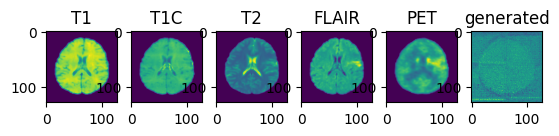

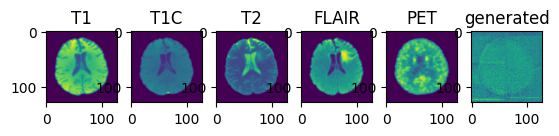

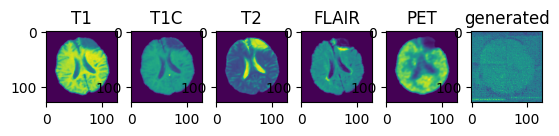

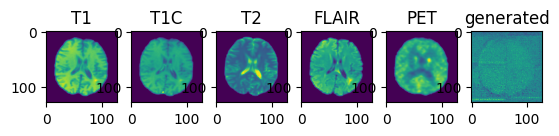

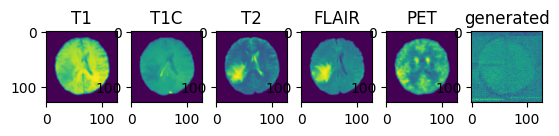

validation avg MS-SSIM: 0.2183 , train avg MS-SSIM: 0.2067
----------
epoch 21/400


Epoch :   0%|                                            | 0/24 [00:00<?, ?it/s]

Epoch :   4%|█▍                                 | 1/24 [01:40<38:32, 100.52s/it]

Epoch :   8%|███                                 | 2/24 [01:42<15:37, 42.60s/it]

Epoch :  12%|████▌                               | 3/24 [01:44<08:28, 24.22s/it]

Epoch :  17%|██████                              | 4/24 [01:46<05:08, 15.42s/it]

Epoch :  21%|███████▌                            | 5/24 [01:48<03:20, 10.53s/it]

Epoch :  25%|█████████                           | 6/24 [01:50<02:16,  7.59s/it]

Epoch :  29%|██████████▌                         | 7/24 [01:52<01:37,  5.72s/it]

Epoch :  33%|████████████                        | 8/24 [01:54<01:11,  4.49s/it]

Epoch :  38%|█████████████▌                      | 9/24 [01:56<00:55,  3.70s/it]

Epoch :  42%|██████████████▌                    | 10/24 [01:58<00:45,  3.27s/it]

Epoch :  46%|████████████████                   | 11/24 [02:00<00:36,  2.85s/it]

Epoch :  50%|█████████████████▌                 | 12/24 [02:02<00:30,  2.57s/it]

Epoch :  54%|██████████████████▉                | 13/24 [02:04<00:25,  2.36s/it]

Epoch :  58%|████████████████████▍              | 14/24 [02:06<00:22,  2.21s/it]

Epoch :  62%|█████████████████████▉             | 15/24 [02:07<00:18,  2.10s/it]

Epoch :  67%|███████████████████████▎           | 16/24 [02:09<00:16,  2.03s/it]

Epoch :  71%|████████████████████████▊          | 17/24 [02:11<00:13,  2.00s/it]

Epoch :  75%|██████████████████████████▎        | 18/24 [02:13<00:12,  2.05s/it]

Epoch :  79%|███████████████████████████▋       | 19/24 [02:15<00:10,  2.02s/it]

Epoch :  83%|█████████████████████████████▏     | 20/24 [02:17<00:07,  1.97s/it]

Epoch :  88%|██████████████████████████████▋    | 21/24 [02:19<00:05,  1.93s/it]

Epoch :  92%|████████████████████████████████   | 22/24 [02:21<00:03,  1.91s/it]

Epoch :  96%|█████████████████████████████████▌ | 23/24 [02:23<00:01,  1.91s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:24<00:00,  1.63s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:27<00:00,  6.15s/it]

----------
epoch 22/400


Epoch :   0%|                                            | 0/24 [00:00<?, ?it/s]

Epoch :   4%|█▌                                  | 1/24 [01:39<38:11, 99.64s/it]

Epoch :   8%|███                                 | 2/24 [01:41<15:31, 42.35s/it]

Epoch :  12%|████▌                               | 3/24 [01:43<08:22, 23.94s/it]

Epoch :  17%|██████                              | 4/24 [01:45<05:04, 15.23s/it]

Epoch :  21%|███████▌                            | 5/24 [01:47<03:17, 10.42s/it]

Epoch :  25%|█████████                           | 6/24 [01:49<02:15,  7.52s/it]

Epoch :  29%|██████████▌                         | 7/24 [01:51<01:36,  5.68s/it]

Epoch :  33%|████████████                        | 8/24 [01:53<01:11,  4.45s/it]

Epoch :  38%|█████████████▌                      | 9/24 [01:55<00:54,  3.64s/it]

Epoch :  42%|██████████████▌                    | 10/24 [01:57<00:44,  3.18s/it]

Epoch :  46%|████████████████                   | 11/24 [01:59<00:36,  2.84s/it]

Epoch :  50%|█████████████████▌                 | 12/24 [02:01<00:30,  2.58s/it]

Epoch :  54%|██████████████████▉                | 13/24 [02:03<00:26,  2.36s/it]

Epoch :  58%|████████████████████▍              | 14/24 [02:05<00:22,  2.20s/it]

Epoch :  62%|█████████████████████▉             | 15/24 [02:06<00:18,  2.09s/it]

Epoch :  67%|███████████████████████▎           | 16/24 [02:08<00:16,  2.03s/it]

Epoch :  71%|████████████████████████▊          | 17/24 [02:10<00:13,  1.99s/it]

Epoch :  75%|██████████████████████████▎        | 18/24 [02:12<00:12,  2.07s/it]

Epoch :  79%|███████████████████████████▋       | 19/24 [02:14<00:10,  2.00s/it]

Epoch :  83%|█████████████████████████████▏     | 20/24 [02:16<00:07,  1.95s/it]

Epoch :  88%|██████████████████████████████▋    | 21/24 [02:18<00:05,  1.92s/it]

Epoch :  92%|████████████████████████████████   | 22/24 [02:20<00:03,  1.90s/it]

Epoch :  96%|█████████████████████████████████▌ | 23/24 [02:22<00:01,  1.89s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:23<00:00,  1.63s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:26<00:00,  6.12s/it]

----------
epoch 23/400


Epoch :   0%|                                            | 0/24 [00:00<?, ?it/s]

Epoch :   4%|█▌                                  | 1/24 [01:37<37:32, 97.93s/it]

Epoch :   8%|███                                 | 2/24 [01:40<15:15, 41.61s/it]

Epoch :  12%|████▌                               | 3/24 [01:42<08:13, 23.48s/it]

Epoch :  17%|██████                              | 4/24 [01:43<04:58, 14.93s/it]

Epoch :  21%|███████▌                            | 5/24 [01:45<03:14, 10.22s/it]

Epoch :  25%|█████████                           | 6/24 [01:47<02:12,  7.37s/it]

Epoch :  29%|██████████▌                         | 7/24 [01:49<01:34,  5.56s/it]

Epoch :  33%|████████████                        | 8/24 [01:51<01:09,  4.37s/it]

Epoch :  38%|█████████████▌                      | 9/24 [01:53<00:53,  3.58s/it]

Epoch :  42%|██████████████▌                    | 10/24 [01:55<00:43,  3.12s/it]

Epoch :  46%|████████████████                   | 11/24 [01:57<00:36,  2.79s/it]

Epoch :  50%|█████████████████▌                 | 12/24 [01:59<00:30,  2.57s/it]

Epoch :  54%|██████████████████▉                | 13/24 [02:01<00:25,  2.35s/it]

Epoch :  58%|████████████████████▍              | 14/24 [02:03<00:22,  2.22s/it]

Epoch :  62%|█████████████████████▉             | 15/24 [02:04<00:19,  2.14s/it]

Epoch :  67%|███████████████████████▎           | 16/24 [02:06<00:16,  2.08s/it]

Epoch :  71%|████████████████████████▊          | 17/24 [02:08<00:14,  2.01s/it]

Epoch :  75%|██████████████████████████▎        | 18/24 [02:10<00:12,  2.05s/it]

Epoch :  79%|███████████████████████████▋       | 19/24 [02:13<00:10,  2.08s/it]

Epoch :  83%|█████████████████████████████▏     | 20/24 [02:14<00:08,  2.03s/it]

Epoch :  88%|██████████████████████████████▋    | 21/24 [02:16<00:05,  1.97s/it]

Epoch :  92%|████████████████████████████████   | 22/24 [02:18<00:03,  1.93s/it]

Epoch :  96%|█████████████████████████████████▌ | 23/24 [02:20<00:01,  1.91s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:21<00:00,  1.64s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:24<00:00,  6.03s/it]

----------
epoch 24/400


Epoch :   0%|                                            | 0/24 [00:00<?, ?it/s]

Epoch :   4%|█▍                                 | 1/24 [01:46<40:58, 106.90s/it]

Epoch :   8%|███                                 | 2/24 [01:49<16:38, 45.38s/it]

Epoch :  12%|████▌                               | 3/24 [01:51<08:55, 25.52s/it]

Epoch :  17%|██████                              | 4/24 [01:52<05:23, 16.17s/it]

Epoch :  21%|███████▌                            | 5/24 [01:54<03:29, 11.02s/it]

Epoch :  25%|█████████                           | 6/24 [01:56<02:22,  7.91s/it]

Epoch :  29%|██████████▌                         | 7/24 [01:58<01:41,  5.99s/it]

Epoch :  33%|████████████                        | 8/24 [02:00<01:14,  4.69s/it]

Epoch :  38%|█████████████▌                      | 9/24 [02:03<01:02,  4.19s/it]

Epoch :  42%|██████████████▌                    | 10/24 [02:05<00:48,  3.49s/it]

Epoch :  46%|████████████████                   | 11/24 [02:07<00:39,  3.00s/it]

Epoch :  50%|█████████████████▌                 | 12/24 [02:09<00:31,  2.65s/it]

Epoch :  54%|██████████████████▉                | 13/24 [02:11<00:26,  2.44s/it]

Epoch :  58%|████████████████████▍              | 14/24 [02:13<00:23,  2.31s/it]

Epoch :  62%|█████████████████████▉             | 15/24 [02:15<00:19,  2.20s/it]

Epoch :  67%|███████████████████████▎           | 16/24 [02:17<00:16,  2.09s/it]

Epoch :  71%|████████████████████████▊          | 17/24 [02:19<00:14,  2.12s/it]

Epoch :  75%|██████████████████████████▎        | 18/24 [02:21<00:12,  2.07s/it]

Epoch :  79%|███████████████████████████▋       | 19/24 [02:23<00:10,  2.04s/it]

Epoch :  83%|█████████████████████████████▏     | 20/24 [02:25<00:08,  2.01s/it]

Epoch :  88%|██████████████████████████████▋    | 21/24 [02:27<00:05,  1.99s/it]

Epoch :  92%|████████████████████████████████   | 22/24 [02:29<00:03,  1.98s/it]

Epoch :  96%|█████████████████████████████████▌ | 23/24 [02:31<00:01,  1.97s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:32<00:00,  1.69s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:35<00:00,  6.48s/it]

----------
epoch 25/400


Epoch :   0%|                                            | 0/24 [00:00<?, ?it/s]

Epoch :   4%|█▌                                  | 1/24 [01:39<38:04, 99.32s/it]

Epoch :   8%|███                                 | 2/24 [01:41<15:23, 41.97s/it]

Epoch :  12%|████▌                               | 3/24 [01:42<08:16, 23.62s/it]

Epoch :  17%|██████                              | 4/24 [01:44<05:00, 15.00s/it]

Epoch :  21%|███████▌                            | 5/24 [01:46<03:14, 10.25s/it]

Epoch :  25%|█████████                           | 6/24 [01:48<02:13,  7.40s/it]

Epoch :  29%|██████████▌                         | 7/24 [01:50<01:35,  5.62s/it]

Epoch :  33%|████████████                        | 8/24 [01:52<01:10,  4.42s/it]

Epoch :  38%|█████████████▌                      | 9/24 [01:54<00:55,  3.71s/it]

Epoch :  42%|██████████████▌                    | 10/24 [01:56<00:43,  3.13s/it]

Epoch :  46%|████████████████                   | 11/24 [01:57<00:35,  2.71s/it]

Epoch :  50%|█████████████████▌                 | 12/24 [01:59<00:29,  2.44s/it]

Epoch :  54%|██████████████████▉                | 13/24 [02:01<00:25,  2.27s/it]

Epoch :  58%|████████████████████▍              | 14/24 [02:03<00:21,  2.14s/it]

Epoch :  62%|█████████████████████▉             | 15/24 [02:05<00:18,  2.07s/it]

Epoch :  67%|███████████████████████▎           | 16/24 [02:07<00:16,  2.09s/it]

Epoch :  71%|████████████████████████▊          | 17/24 [02:09<00:14,  2.02s/it]

Epoch :  75%|██████████████████████████▎        | 18/24 [02:11<00:11,  1.95s/it]

Epoch :  79%|███████████████████████████▋       | 19/24 [02:13<00:09,  1.92s/it]

Epoch :  83%|█████████████████████████████▏     | 20/24 [02:14<00:07,  1.90s/it]

Epoch :  88%|██████████████████████████████▋    | 21/24 [02:17<00:05,  1.97s/it]

Epoch :  92%|████████████████████████████████   | 22/24 [02:18<00:03,  1.94s/it]

Epoch :  96%|█████████████████████████████████▌ | 23/24 [02:20<00:01,  1.90s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:21<00:00,  1.62s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:24<00:00,  6.04s/it]

----------
epoch 26/400


Epoch :   0%|                                            | 0/24 [00:00<?, ?it/s]

Epoch :   4%|█▌                                  | 1/24 [01:36<36:55, 96.33s/it]

Epoch :   8%|███                                 | 2/24 [01:38<14:57, 40.81s/it]

Epoch :  12%|████▌                               | 3/24 [01:40<08:04, 23.09s/it]

Epoch :  17%|██████                              | 4/24 [01:42<04:54, 14.72s/it]

Epoch :  21%|███████▌                            | 5/24 [01:44<03:11, 10.09s/it]

Epoch :  25%|█████████                           | 6/24 [01:46<02:12,  7.39s/it]

Epoch :  29%|██████████▌                         | 7/24 [01:48<01:35,  5.60s/it]

Epoch :  33%|████████████                        | 8/24 [01:50<01:14,  4.66s/it]

Epoch :  38%|█████████████▌                      | 9/24 [01:52<00:56,  3.77s/it]

Epoch :  42%|██████████████▌                    | 10/24 [01:54<00:44,  3.16s/it]

Epoch :  46%|████████████████                   | 11/24 [01:56<00:35,  2.75s/it]

Epoch :  50%|█████████████████▌                 | 12/24 [01:58<00:29,  2.46s/it]

Epoch :  54%|██████████████████▉                | 13/24 [01:59<00:25,  2.30s/it]

Epoch :  58%|████████████████████▍              | 14/24 [02:01<00:21,  2.20s/it]

Epoch :  62%|█████████████████████▉             | 15/24 [02:03<00:18,  2.10s/it]

Epoch :  67%|███████████████████████▎           | 16/24 [02:05<00:16,  2.10s/it]

Epoch :  71%|████████████████████████▊          | 17/24 [02:07<00:14,  2.02s/it]

Epoch :  75%|██████████████████████████▎        | 18/24 [02:09<00:11,  1.97s/it]

Epoch :  79%|███████████████████████████▋       | 19/24 [02:11<00:09,  1.95s/it]

Epoch :  83%|█████████████████████████████▏     | 20/24 [02:13<00:07,  1.96s/it]

Epoch :  88%|██████████████████████████████▋    | 21/24 [02:15<00:05,  1.92s/it]

Epoch :  92%|████████████████████████████████   | 22/24 [02:17<00:03,  1.89s/it]

Epoch :  96%|█████████████████████████████████▌ | 23/24 [02:19<00:01,  1.96s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:20<00:00,  1.66s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:23<00:00,  5.98s/it]

----------
epoch 27/400


Epoch :   0%|                                            | 0/24 [00:00<?, ?it/s]

Epoch :   4%|█▌                                  | 1/24 [01:36<36:57, 96.41s/it]

Epoch :   8%|███                                 | 2/24 [01:38<14:57, 40.77s/it]

Epoch :  12%|████▌                               | 3/24 [01:40<08:05, 23.13s/it]

Epoch :  17%|██████                              | 4/24 [01:42<04:55, 14.75s/it]

Epoch :  21%|███████▌                            | 5/24 [01:44<03:11, 10.10s/it]

Epoch :  25%|█████████                           | 6/24 [01:45<02:11,  7.28s/it]

Epoch :  29%|██████████▌                         | 7/24 [01:47<01:33,  5.50s/it]

Epoch :  33%|████████████                        | 8/24 [01:49<01:10,  4.44s/it]

Epoch :  38%|█████████████▌                      | 9/24 [01:51<00:54,  3.62s/it]

Epoch :  42%|██████████████▌                    | 10/24 [01:53<00:43,  3.07s/it]

Epoch :  46%|████████████████                   | 11/24 [01:55<00:34,  2.69s/it]

Epoch :  50%|█████████████████▌                 | 12/24 [01:57<00:29,  2.45s/it]

Epoch :  54%|██████████████████▉                | 13/24 [01:59<00:25,  2.29s/it]

Epoch :  58%|████████████████████▍              | 14/24 [02:01<00:21,  2.17s/it]

Epoch :  62%|█████████████████████▉             | 15/24 [02:03<00:20,  2.25s/it]

Epoch :  67%|███████████████████████▎           | 16/24 [02:05<00:17,  2.16s/it]

Epoch :  71%|████████████████████████▊          | 17/24 [02:07<00:14,  2.06s/it]

Epoch :  75%|██████████████████████████▎        | 18/24 [02:09<00:11,  1.99s/it]

Epoch :  79%|███████████████████████████▋       | 19/24 [02:11<00:10,  2.03s/it]

Epoch :  83%|█████████████████████████████▏     | 20/24 [02:13<00:07,  2.00s/it]

Epoch :  88%|██████████████████████████████▋    | 21/24 [02:15<00:05,  1.97s/it]

Epoch :  92%|████████████████████████████████   | 22/24 [02:16<00:03,  1.93s/it]

Epoch :  96%|█████████████████████████████████▌ | 23/24 [02:19<00:01,  1.99s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:20<00:00,  1.69s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:23<00:00,  5.96s/it]

----------
epoch 28/400


Epoch :   0%|                                            | 0/24 [00:00<?, ?it/s]

Epoch :   4%|█▍                                 | 1/24 [01:43<39:39, 103.44s/it]

Epoch :   8%|███                                 | 2/24 [01:45<16:02, 43.75s/it]

Epoch :  12%|████▌                               | 3/24 [01:47<08:37, 24.65s/it]

Epoch :  17%|██████                              | 4/24 [01:49<05:14, 15.72s/it]

Epoch :  21%|███████▌                            | 5/24 [01:51<03:24, 10.75s/it]

Epoch :  25%|█████████                           | 6/24 [01:53<02:19,  7.75s/it]

Epoch :  29%|██████████▌                         | 7/24 [01:55<01:41,  5.96s/it]

Epoch :  33%|████████████                        | 8/24 [01:57<01:14,  4.65s/it]

Epoch :  38%|█████████████▌                      | 9/24 [01:59<00:56,  3.79s/it]

Epoch :  42%|██████████████▌                    | 10/24 [02:01<00:44,  3.21s/it]

Epoch :  46%|████████████████                   | 11/24 [02:03<00:36,  2.80s/it]

Epoch :  50%|█████████████████▌                 | 12/24 [02:04<00:30,  2.55s/it]

Epoch :  54%|██████████████████▉                | 13/24 [02:07<00:26,  2.40s/it]

Epoch :  58%|████████████████████▍              | 14/24 [02:09<00:23,  2.30s/it]

Epoch :  62%|█████████████████████▉             | 15/24 [02:11<00:20,  2.26s/it]

Epoch :  67%|███████████████████████▎           | 16/24 [02:13<00:17,  2.14s/it]

Epoch :  71%|████████████████████████▊          | 17/24 [02:15<00:14,  2.07s/it]

Epoch :  75%|██████████████████████████▎        | 18/24 [02:17<00:12,  2.03s/it]

Epoch :  79%|███████████████████████████▋       | 19/24 [02:18<00:09,  1.99s/it]

Epoch :  83%|█████████████████████████████▏     | 20/24 [02:20<00:07,  1.95s/it]

Epoch :  88%|██████████████████████████████▋    | 21/24 [02:22<00:05,  1.92s/it]

Epoch :  92%|████████████████████████████████   | 22/24 [02:24<00:03,  1.90s/it]

Epoch :  96%|█████████████████████████████████▌ | 23/24 [02:26<00:01,  1.96s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:27<00:00,  1.66s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:31<00:00,  6.30s/it]

----------
epoch 29/400


Epoch :   0%|                                            | 0/24 [00:00<?, ?it/s]

Epoch :   4%|█▌                                  | 1/24 [01:38<37:38, 98.22s/it]

Epoch :   8%|███                                 | 2/24 [01:40<15:13, 41.54s/it]

Epoch :  12%|████▌                               | 3/24 [01:41<08:11, 23.42s/it]

Epoch :  17%|██████                              | 4/24 [01:43<04:57, 14.90s/it]

Epoch :  21%|███████▌                            | 5/24 [01:45<03:13, 10.19s/it]

Epoch :  25%|█████████                           | 6/24 [01:47<02:13,  7.40s/it]

Epoch :  29%|██████████▌                         | 7/24 [01:49<01:37,  5.73s/it]

Epoch :  33%|████████████                        | 8/24 [01:51<01:12,  4.50s/it]

Epoch :  38%|█████████████▌                      | 9/24 [01:53<00:55,  3.70s/it]

Epoch :  42%|██████████████▌                    | 10/24 [01:55<00:43,  3.13s/it]

Epoch :  46%|████████████████                   | 11/24 [01:57<00:35,  2.74s/it]

Epoch :  50%|█████████████████▌                 | 12/24 [01:59<00:29,  2.48s/it]

Epoch :  54%|██████████████████▉                | 13/24 [02:01<00:25,  2.34s/it]

Epoch :  58%|████████████████████▍              | 14/24 [02:03<00:23,  2.35s/it]

Epoch :  62%|█████████████████████▉             | 15/24 [02:05<00:19,  2.21s/it]

Epoch :  67%|███████████████████████▎           | 16/24 [02:07<00:16,  2.10s/it]

Epoch :  71%|████████████████████████▊          | 17/24 [02:09<00:14,  2.03s/it]

Epoch :  75%|██████████████████████████▎        | 18/24 [02:11<00:12,  2.04s/it]

Epoch :  79%|███████████████████████████▋       | 19/24 [02:13<00:10,  2.00s/it]

Epoch :  83%|█████████████████████████████▏     | 20/24 [02:15<00:07,  1.96s/it]

Epoch :  88%|██████████████████████████████▋    | 21/24 [02:16<00:05,  1.93s/it]

Epoch :  92%|████████████████████████████████   | 22/24 [02:19<00:03,  2.00s/it]

Epoch :  96%|█████████████████████████████████▌ | 23/24 [02:21<00:01,  1.98s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:22<00:00,  1.68s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:25<00:00,  6.06s/it]

----------
epoch 30/400


Epoch :   0%|                                            | 0/24 [00:00<?, ?it/s]

Epoch :   4%|█▌                                  | 1/24 [01:36<36:57, 96.42s/it]

Epoch :   8%|███                                 | 2/24 [01:38<14:57, 40.81s/it]

Epoch :  12%|████▌                               | 3/24 [01:40<08:03, 23.03s/it]

Epoch :  17%|██████                              | 4/24 [01:42<04:53, 14.67s/it]

Epoch :  21%|███████▌                            | 5/24 [01:43<03:10, 10.04s/it]

Epoch :  25%|█████████                           | 6/24 [01:46<02:12,  7.36s/it]

Epoch :  29%|██████████▌                         | 7/24 [01:47<01:34,  5.56s/it]

Epoch :  33%|████████████                        | 8/24 [01:49<01:09,  4.37s/it]

Epoch :  38%|█████████████▌                      | 9/24 [01:51<00:53,  3.58s/it]

Epoch :  42%|██████████████▌                    | 10/24 [01:53<00:42,  3.05s/it]

Epoch :  46%|████████████████                   | 11/24 [01:55<00:34,  2.68s/it]

Epoch :  50%|█████████████████▌                 | 12/24 [01:57<00:29,  2.46s/it]

Epoch :  54%|██████████████████▉                | 13/24 [01:59<00:25,  2.28s/it]

Epoch :  58%|████████████████████▍              | 14/24 [02:01<00:22,  2.28s/it]

Epoch :  62%|█████████████████████▉             | 15/24 [02:03<00:19,  2.15s/it]

Epoch :  67%|███████████████████████▎           | 16/24 [02:05<00:16,  2.06s/it]

Epoch :  71%|████████████████████████▊          | 17/24 [02:06<00:13,  1.98s/it]

Epoch :  75%|██████████████████████████▎        | 18/24 [02:08<00:11,  1.94s/it]

Epoch :  79%|███████████████████████████▋       | 19/24 [02:10<00:09,  1.91s/it]

Epoch :  83%|█████████████████████████████▏     | 20/24 [02:12<00:07,  1.89s/it]

Epoch :  88%|██████████████████████████████▋    | 21/24 [02:14<00:05,  1.89s/it]

Epoch :  92%|████████████████████████████████   | 22/24 [02:16<00:03,  1.98s/it]

Epoch :  96%|█████████████████████████████████▌ | 23/24 [02:18<00:01,  1.97s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:19<00:00,  1.67s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:22<00:00,  5.94s/it]

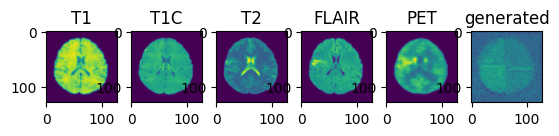

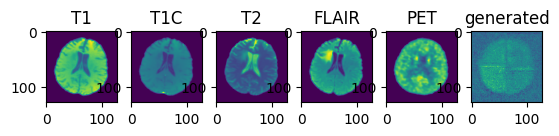

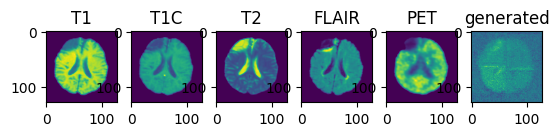

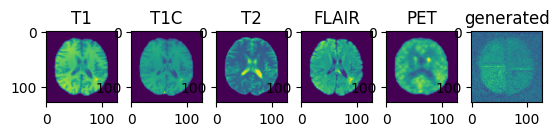

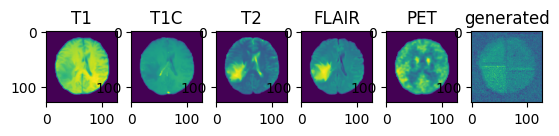

validation avg MS-SSIM: 0.3061 , train avg MS-SSIM: 0.2915
----------
epoch 31/400


Epoch :   0%|                                            | 0/24 [00:00<?, ?it/s]

Epoch :   4%|█▌                                  | 1/24 [01:36<36:55, 96.30s/it]

Epoch :   8%|███                                 | 2/24 [01:38<14:58, 40.82s/it]

Epoch :  12%|████▌                               | 3/24 [01:40<08:04, 23.05s/it]

Epoch :  17%|██████                              | 4/24 [01:42<04:56, 14.80s/it]

Epoch :  21%|███████▌                            | 5/24 [01:44<03:12, 10.16s/it]

Epoch :  25%|█████████                           | 6/24 [01:46<02:13,  7.40s/it]

Epoch :  29%|██████████▌                         | 7/24 [01:48<01:35,  5.62s/it]

Epoch :  33%|████████████                        | 8/24 [01:50<01:12,  4.53s/it]

Epoch :  38%|█████████████▌                      | 9/24 [01:52<00:55,  3.69s/it]

Epoch :  42%|██████████████▌                    | 10/24 [01:54<00:43,  3.13s/it]

Epoch :  46%|████████████████                   | 11/24 [01:55<00:35,  2.73s/it]

Epoch :  50%|█████████████████▌                 | 12/24 [01:57<00:29,  2.46s/it]

Epoch :  54%|██████████████████▉                | 13/24 [01:59<00:25,  2.29s/it]

Epoch :  58%|████████████████████▍              | 14/24 [02:01<00:22,  2.22s/it]

Epoch :  62%|█████████████████████▉             | 15/24 [02:03<00:19,  2.15s/it]

Epoch :  67%|███████████████████████▎           | 16/24 [02:05<00:17,  2.15s/it]

Epoch :  71%|████████████████████████▊          | 17/24 [02:07<00:14,  2.05s/it]

Epoch :  75%|██████████████████████████▎        | 18/24 [02:09<00:12,  2.00s/it]

Epoch :  79%|███████████████████████████▋       | 19/24 [02:11<00:09,  1.96s/it]

Epoch :  83%|█████████████████████████████▏     | 20/24 [02:13<00:07,  1.93s/it]

Epoch :  88%|██████████████████████████████▋    | 21/24 [02:15<00:05,  1.89s/it]

Epoch :  92%|████████████████████████████████   | 22/24 [02:16<00:03,  1.88s/it]

Epoch :  96%|█████████████████████████████████▌ | 23/24 [02:19<00:01,  1.94s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:20<00:00,  1.66s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:23<00:00,  5.98s/it]

----------
epoch 32/400


Epoch :   0%|                                            | 0/24 [00:00<?, ?it/s]

Epoch :   4%|█▌                                  | 1/24 [01:37<37:14, 97.13s/it]

Epoch :   8%|███                                 | 2/24 [01:39<15:04, 41.10s/it]

Epoch :  12%|████▌                               | 3/24 [01:40<08:07, 23.20s/it]

Epoch :  17%|██████                              | 4/24 [01:42<04:55, 14.78s/it]

Epoch :  21%|███████▌                            | 5/24 [01:44<03:12, 10.12s/it]

Epoch :  25%|█████████                           | 6/24 [01:46<02:11,  7.32s/it]

Epoch :  29%|██████████▌                         | 7/24 [01:48<01:36,  5.66s/it]

Epoch :  33%|████████████                        | 8/24 [01:50<01:11,  4.44s/it]

Epoch :  38%|█████████████▌                      | 9/24 [01:52<00:54,  3.62s/it]

Epoch :  42%|██████████████▌                    | 10/24 [01:54<00:42,  3.07s/it]

Epoch :  46%|████████████████                   | 11/24 [01:56<00:34,  2.69s/it]

Epoch :  50%|█████████████████▌                 | 12/24 [01:57<00:29,  2.44s/it]

Epoch :  54%|██████████████████▉                | 13/24 [01:59<00:25,  2.27s/it]

Epoch :  58%|████████████████████▍              | 14/24 [02:01<00:21,  2.14s/it]

Epoch :  62%|█████████████████████▉             | 15/24 [02:03<00:19,  2.14s/it]

Epoch :  67%|███████████████████████▎           | 16/24 [02:05<00:16,  2.05s/it]

Epoch :  71%|████████████████████████▊          | 17/24 [02:07<00:13,  1.98s/it]

Epoch :  75%|██████████████████████████▎        | 18/24 [02:09<00:11,  1.95s/it]

Epoch :  79%|███████████████████████████▋       | 19/24 [02:11<00:09,  1.92s/it]

Epoch :  83%|█████████████████████████████▏     | 20/24 [02:13<00:07,  1.91s/it]

Epoch :  88%|██████████████████████████████▋    | 21/24 [02:14<00:05,  1.91s/it]

Epoch :  92%|████████████████████████████████   | 22/24 [02:16<00:03,  1.90s/it]

Epoch :  96%|█████████████████████████████████▌ | 23/24 [02:19<00:01,  1.98s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:20<00:00,  1.70s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:23<00:00,  5.97s/it]

----------
epoch 33/400


Epoch :   0%|                                            | 0/24 [00:00<?, ?it/s]

Epoch :   4%|█▌                                  | 1/24 [01:37<37:15, 97.18s/it]

Epoch :   8%|███                                 | 2/24 [01:39<15:05, 41.14s/it]

Epoch :  12%|████▌                               | 3/24 [01:40<08:06, 23.19s/it]

Epoch :  17%|██████                              | 4/24 [01:42<04:55, 14.77s/it]

Epoch :  21%|███████▌                            | 5/24 [01:44<03:11, 10.10s/it]

Epoch :  25%|█████████                           | 6/24 [01:46<02:11,  7.30s/it]

Epoch :  29%|██████████▌                         | 7/24 [01:48<01:35,  5.64s/it]

Epoch :  33%|████████████                        | 8/24 [01:50<01:11,  4.44s/it]

Epoch :  38%|█████████████▌                      | 9/24 [01:52<00:54,  3.64s/it]

Epoch :  42%|██████████████▌                    | 10/24 [01:54<00:43,  3.09s/it]

Epoch :  46%|████████████████                   | 11/24 [01:56<00:35,  2.74s/it]

Epoch :  50%|█████████████████▌                 | 12/24 [01:58<00:29,  2.46s/it]

Epoch :  54%|██████████████████▉                | 13/24 [01:59<00:24,  2.27s/it]

Epoch :  58%|████████████████████▍              | 14/24 [02:01<00:21,  2.14s/it]

Epoch :  62%|█████████████████████▉             | 15/24 [02:03<00:19,  2.14s/it]

Epoch :  67%|███████████████████████▎           | 16/24 [02:05<00:16,  2.09s/it]

Epoch :  71%|████████████████████████▊          | 17/24 [02:07<00:14,  2.05s/it]

Epoch :  75%|██████████████████████████▎        | 18/24 [02:09<00:11,  2.00s/it]

Epoch :  79%|███████████████████████████▋       | 19/24 [02:11<00:10,  2.03s/it]

Epoch :  83%|█████████████████████████████▏     | 20/24 [02:13<00:07,  2.00s/it]

Epoch :  88%|██████████████████████████████▋    | 21/24 [02:15<00:05,  1.98s/it]

Epoch :  92%|████████████████████████████████   | 22/24 [02:17<00:03,  1.97s/it]

Epoch :  96%|█████████████████████████████████▌ | 23/24 [02:19<00:02,  2.05s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:20<00:00,  1.73s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:24<00:00,  6.00s/it]

----------
epoch 34/400


Epoch :   0%|                                            | 0/24 [00:00<?, ?it/s]

Epoch :   4%|█▍                                 | 1/24 [01:40<38:34, 100.62s/it]

Epoch :   8%|███                                 | 2/24 [01:42<15:37, 42.59s/it]

Epoch :  12%|████▌                               | 3/24 [01:44<08:24, 24.00s/it]

Epoch :  17%|██████                              | 4/24 [01:46<05:05, 15.26s/it]

Epoch :  21%|███████▌                            | 5/24 [01:48<03:18, 10.45s/it]

Epoch :  25%|█████████                           | 6/24 [01:50<02:15,  7.53s/it]

Epoch :  29%|██████████▌                         | 7/24 [01:52<01:38,  5.79s/it]

Epoch :  33%|████████████                        | 8/24 [01:54<01:12,  4.54s/it]

Epoch :  38%|█████████████▌                      | 9/24 [01:56<00:56,  3.77s/it]

Epoch :  42%|██████████████▌                    | 10/24 [01:58<00:45,  3.22s/it]

Epoch :  46%|████████████████                   | 11/24 [02:00<00:37,  2.89s/it]

Epoch :  50%|█████████████████▌                 | 12/24 [02:02<00:32,  2.73s/it]

Epoch :  54%|██████████████████▉                | 13/24 [02:04<00:27,  2.50s/it]

Epoch :  58%|████████████████████▍              | 14/24 [02:06<00:23,  2.33s/it]

Epoch :  62%|█████████████████████▉             | 15/24 [02:08<00:20,  2.32s/it]

Epoch :  67%|███████████████████████▎           | 16/24 [02:11<00:17,  2.24s/it]

Epoch :  71%|████████████████████████▊          | 17/24 [02:12<00:15,  2.15s/it]

Epoch :  75%|██████████████████████████▎        | 18/24 [02:15<00:12,  2.15s/it]

Epoch :  79%|███████████████████████████▋       | 19/24 [02:16<00:10,  2.07s/it]

Epoch :  83%|█████████████████████████████▏     | 20/24 [02:18<00:08,  2.01s/it]

Epoch :  88%|██████████████████████████████▋    | 21/24 [02:20<00:05,  1.97s/it]

Epoch :  92%|████████████████████████████████   | 22/24 [02:22<00:03,  1.94s/it]

Epoch :  96%|█████████████████████████████████▌ | 23/24 [02:24<00:02,  2.01s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:25<00:00,  1.71s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:29<00:00,  6.22s/it]

----------
epoch 35/400


Epoch :   0%|                                            | 0/24 [00:00<?, ?it/s]

Epoch :   4%|█▍                                 | 1/24 [01:45<40:32, 105.76s/it]

Epoch :   8%|███                                 | 2/24 [01:47<16:25, 44.79s/it]

Epoch :  12%|████▌                               | 3/24 [01:50<08:52, 25.34s/it]

Epoch :  17%|██████                              | 4/24 [01:52<05:23, 16.17s/it]

Epoch :  21%|███████▌                            | 5/24 [01:54<03:29, 11.04s/it]

Epoch :  25%|█████████                           | 6/24 [01:56<02:22,  7.94s/it]

Epoch :  29%|██████████▌                         | 7/24 [01:58<01:44,  6.13s/it]

Epoch :  33%|████████████                        | 8/24 [02:00<01:17,  4.86s/it]

Epoch :  38%|█████████████▌                      | 9/24 [02:02<00:58,  3.93s/it]

Epoch :  42%|██████████████▌                    | 10/24 [02:04<00:46,  3.34s/it]

Epoch :  46%|████████████████                   | 11/24 [02:06<00:37,  2.91s/it]

Epoch :  50%|█████████████████▌                 | 12/24 [02:08<00:31,  2.63s/it]

Epoch :  54%|██████████████████▉                | 13/24 [02:10<00:26,  2.41s/it]

Epoch :  58%|████████████████████▍              | 14/24 [02:12<00:22,  2.28s/it]

Epoch :  62%|█████████████████████▉             | 15/24 [02:14<00:20,  2.30s/it]

Epoch :  67%|███████████████████████▎           | 16/24 [02:16<00:17,  2.18s/it]

Epoch :  71%|████████████████████████▊          | 17/24 [02:18<00:14,  2.12s/it]

Epoch :  75%|██████████████████████████▎        | 18/24 [02:20<00:12,  2.07s/it]

Epoch :  79%|███████████████████████████▋       | 19/24 [02:22<00:10,  2.01s/it]

Epoch :  83%|█████████████████████████████▏     | 20/24 [02:24<00:08,  2.06s/it]

Epoch :  88%|██████████████████████████████▋    | 21/24 [02:26<00:06,  2.07s/it]

Epoch :  92%|████████████████████████████████   | 22/24 [02:28<00:04,  2.06s/it]

Epoch :  96%|█████████████████████████████████▌ | 23/24 [02:31<00:02,  2.35s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:32<00:00,  1.97s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:36<00:00,  6.52s/it]

----------
epoch 36/400


Epoch :   0%|                                            | 0/24 [00:00<?, ?it/s]

Epoch :   4%|█▍                                 | 1/24 [01:45<40:30, 105.67s/it]

Epoch :   8%|███                                 | 2/24 [01:47<16:22, 44.64s/it]

Epoch :  12%|████▌                               | 3/24 [01:49<08:50, 25.27s/it]

Epoch :  17%|██████                              | 4/24 [01:51<05:23, 16.15s/it]

Epoch :  21%|███████▌                            | 5/24 [01:54<03:30, 11.06s/it]

Epoch :  25%|█████████                           | 6/24 [01:56<02:27,  8.18s/it]

Epoch :  29%|██████████▌                         | 7/24 [01:58<01:45,  6.19s/it]

Epoch :  33%|████████████                        | 8/24 [02:00<01:17,  4.82s/it]

Epoch :  38%|█████████████▌                      | 9/24 [02:02<00:58,  3.91s/it]

Epoch :  42%|██████████████▌                    | 10/24 [02:04<00:46,  3.30s/it]

Epoch :  46%|████████████████                   | 11/24 [02:06<00:37,  2.88s/it]

Epoch :  50%|█████████████████▌                 | 12/24 [02:08<00:31,  2.60s/it]

Epoch :  54%|██████████████████▉                | 13/24 [02:10<00:26,  2.38s/it]

Epoch :  58%|████████████████████▍              | 14/24 [02:12<00:23,  2.33s/it]

Epoch :  62%|█████████████████████▉             | 15/24 [02:14<00:19,  2.20s/it]

Epoch :  67%|███████████████████████▎           | 16/24 [02:16<00:16,  2.11s/it]

Epoch :  71%|████████████████████████▊          | 17/24 [02:18<00:14,  2.04s/it]

Epoch :  75%|██████████████████████████▎        | 18/24 [02:19<00:11,  1.99s/it]

Epoch :  79%|███████████████████████████▋       | 19/24 [02:21<00:09,  1.95s/it]

Epoch :  83%|█████████████████████████████▏     | 20/24 [02:23<00:07,  1.93s/it]

Epoch :  88%|██████████████████████████████▋    | 21/24 [02:25<00:05,  1.91s/it]

Epoch :  92%|████████████████████████████████   | 22/24 [02:27<00:03,  2.00s/it]

Epoch :  96%|█████████████████████████████████▌ | 23/24 [02:29<00:02,  2.06s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:31<00:00,  1.80s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:34<00:00,  6.45s/it]

----------
epoch 37/400


Epoch :   0%|                                            | 0/24 [00:00<?, ?it/s]

Epoch :   4%|█▌                                  | 1/24 [01:38<37:46, 98.54s/it]

Epoch :   8%|███                                 | 2/24 [01:40<15:16, 41.67s/it]

Epoch :  12%|████▌                               | 3/24 [01:42<08:13, 23.51s/it]

Epoch :  17%|██████                              | 4/24 [01:44<04:59, 14.98s/it]

Epoch :  21%|███████▌                            | 5/24 [01:46<03:14, 10.25s/it]

Epoch :  25%|█████████                           | 6/24 [01:48<02:13,  7.43s/it]

Epoch :  29%|██████████▌                         | 7/24 [01:49<01:35,  5.62s/it]

Epoch :  33%|████████████                        | 8/24 [01:51<01:11,  4.44s/it]

Epoch :  38%|█████████████▌                      | 9/24 [01:53<00:54,  3.64s/it]

Epoch :  42%|██████████████▌                    | 10/24 [01:55<00:43,  3.09s/it]

Epoch :  46%|████████████████                   | 11/24 [01:57<00:35,  2.71s/it]

Epoch :  50%|█████████████████▌                 | 12/24 [01:59<00:29,  2.45s/it]

Epoch :  54%|██████████████████▉                | 13/24 [02:01<00:24,  2.26s/it]

Epoch :  58%|████████████████████▍              | 14/24 [02:03<00:22,  2.20s/it]

Epoch :  62%|█████████████████████▉             | 15/24 [02:04<00:18,  2.09s/it]

Epoch :  67%|███████████████████████▎           | 16/24 [02:06<00:16,  2.02s/it]

Epoch :  71%|████████████████████████▊          | 17/24 [02:08<00:13,  1.97s/it]

Epoch :  75%|██████████████████████████▎        | 18/24 [02:10<00:11,  1.95s/it]

Epoch :  79%|███████████████████████████▋       | 19/24 [02:12<00:09,  1.94s/it]

Epoch :  83%|█████████████████████████████▏     | 20/24 [02:14<00:07,  1.90s/it]

Epoch :  88%|██████████████████████████████▋    | 21/24 [02:16<00:05,  1.92s/it]

Epoch :  92%|████████████████████████████████   | 22/24 [02:18<00:04,  2.07s/it]

Epoch :  96%|█████████████████████████████████▌ | 23/24 [02:20<00:01,  2.00s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:21<00:00,  1.69s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:24<00:00,  6.03s/it]

----------
epoch 38/400


Epoch :   0%|                                            | 0/24 [00:00<?, ?it/s]

Epoch :   4%|█▍                                 | 1/24 [01:41<38:51, 101.37s/it]

Epoch :   8%|███                                 | 2/24 [01:43<15:45, 42.96s/it]

Epoch :  12%|████▌                               | 3/24 [01:45<08:28, 24.24s/it]

Epoch :  17%|██████                              | 4/24 [01:47<05:08, 15.44s/it]

Epoch :  21%|███████▌                            | 5/24 [01:49<03:20, 10.57s/it]

Epoch :  25%|█████████                           | 6/24 [01:51<02:19,  7.77s/it]

Epoch :  29%|██████████▌                         | 7/24 [01:53<01:39,  5.85s/it]

Epoch :  33%|████████████                        | 8/24 [01:55<01:13,  4.58s/it]

Epoch :  38%|█████████████▌                      | 9/24 [01:57<00:55,  3.73s/it]

Epoch :  42%|██████████████▌                    | 10/24 [01:59<00:44,  3.18s/it]

Epoch :  46%|████████████████                   | 11/24 [02:01<00:36,  2.80s/it]

Epoch :  50%|█████████████████▌                 | 12/24 [02:03<00:30,  2.52s/it]

Epoch :  54%|██████████████████▉                | 13/24 [02:04<00:25,  2.34s/it]

Epoch :  58%|████████████████████▍              | 14/24 [02:07<00:23,  2.37s/it]

Epoch :  62%|█████████████████████▉             | 15/24 [02:09<00:19,  2.22s/it]

Epoch :  67%|███████████████████████▎           | 16/24 [02:11<00:16,  2.12s/it]

Epoch :  71%|████████████████████████▊          | 17/24 [02:12<00:14,  2.05s/it]

Epoch :  75%|██████████████████████████▎        | 18/24 [02:14<00:11,  1.99s/it]

Epoch :  79%|███████████████████████████▋       | 19/24 [02:16<00:09,  1.96s/it]

Epoch :  83%|█████████████████████████████▏     | 20/24 [02:18<00:07,  1.94s/it]

Epoch :  88%|██████████████████████████████▋    | 21/24 [02:20<00:06,  2.06s/it]

Epoch :  92%|████████████████████████████████   | 22/24 [02:23<00:04,  2.11s/it]

Epoch :  96%|█████████████████████████████████▌ | 23/24 [02:25<00:02,  2.07s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:26<00:00,  1.75s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:29<00:00,  6.22s/it]

----------
epoch 39/400


Epoch :   0%|                                            | 0/24 [00:00<?, ?it/s]

Epoch :   4%|█▍                                 | 1/24 [01:44<40:07, 104.69s/it]

Epoch :   8%|███                                 | 2/24 [01:46<16:13, 44.26s/it]

Epoch :  12%|████▌                               | 3/24 [01:48<08:45, 25.00s/it]

Epoch :  17%|██████                              | 4/24 [01:50<05:17, 15.89s/it]

Epoch :  21%|███████▌                            | 5/24 [01:52<03:27, 10.90s/it]

Epoch :  25%|█████████                           | 6/24 [01:55<02:23,  7.99s/it]

Epoch :  29%|██████████▌                         | 7/24 [01:57<01:42,  6.03s/it]

Epoch :  33%|████████████                        | 8/24 [01:59<01:16,  4.76s/it]

Epoch :  38%|█████████████▌                      | 9/24 [02:01<00:58,  3.88s/it]

Epoch :  42%|██████████████▌                    | 10/24 [02:02<00:45,  3.27s/it]

Epoch :  46%|████████████████                   | 11/24 [02:04<00:37,  2.88s/it]

Epoch :  50%|█████████████████▌                 | 12/24 [02:06<00:30,  2.57s/it]

Epoch :  54%|██████████████████▉                | 13/24 [02:08<00:26,  2.37s/it]

Epoch :  58%|████████████████████▍              | 14/24 [02:10<00:22,  2.27s/it]

Epoch :  62%|█████████████████████▉             | 15/24 [02:12<00:19,  2.19s/it]

Epoch :  67%|███████████████████████▎           | 16/24 [02:15<00:17,  2.25s/it]

Epoch :  71%|████████████████████████▊          | 17/24 [02:17<00:16,  2.29s/it]

Epoch :  75%|██████████████████████████▎        | 18/24 [02:19<00:13,  2.20s/it]

Epoch :  79%|███████████████████████████▋       | 19/24 [02:21<00:10,  2.10s/it]

Epoch :  83%|█████████████████████████████▏     | 20/24 [02:23<00:08,  2.04s/it]

Epoch :  88%|██████████████████████████████▋    | 21/24 [02:25<00:06,  2.09s/it]

Epoch :  92%|████████████████████████████████   | 22/24 [02:27<00:04,  2.02s/it]

Epoch :  96%|█████████████████████████████████▌ | 23/24 [02:29<00:01,  1.99s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:30<00:00,  1.69s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:33<00:00,  6.40s/it]

----------
epoch 40/400


Epoch :   0%|                                            | 0/24 [00:00<?, ?it/s]

Epoch :   4%|█▍                                 | 1/24 [01:43<39:48, 103.85s/it]

Epoch :   8%|███                                 | 2/24 [01:46<16:09, 44.05s/it]

Epoch :  12%|████▌                               | 3/24 [01:48<08:41, 24.84s/it]

Epoch :  17%|██████                              | 4/24 [01:49<05:15, 15.78s/it]

Epoch :  21%|███████▌                            | 5/24 [01:52<03:27, 10.91s/it]

Epoch :  25%|█████████                           | 6/24 [01:54<02:20,  7.83s/it]

Epoch :  29%|██████████▌                         | 7/24 [01:55<01:39,  5.88s/it]

Epoch :  33%|████████████                        | 8/24 [01:57<01:13,  4.60s/it]

Epoch :  38%|█████████████▌                      | 9/24 [01:59<00:56,  3.74s/it]

Epoch :  42%|██████████████▌                    | 10/24 [02:01<00:44,  3.17s/it]

Epoch :  46%|████████████████                   | 11/24 [02:03<00:36,  2.79s/it]

Epoch :  50%|█████████████████▌                 | 12/24 [02:05<00:30,  2.51s/it]

Epoch :  54%|██████████████████▉                | 13/24 [02:07<00:26,  2.40s/it]

Epoch :  58%|████████████████████▍              | 14/24 [02:09<00:22,  2.27s/it]

Epoch :  62%|█████████████████████▉             | 15/24 [02:11<00:19,  2.17s/it]

Epoch :  67%|███████████████████████▎           | 16/24 [02:13<00:16,  2.10s/it]

Epoch :  71%|████████████████████████▊          | 17/24 [02:15<00:14,  2.09s/it]

Epoch :  75%|██████████████████████████▎        | 18/24 [02:17<00:12,  2.03s/it]

Epoch :  79%|███████████████████████████▋       | 19/24 [02:19<00:09,  1.99s/it]

Epoch :  83%|█████████████████████████████▏     | 20/24 [02:21<00:07,  1.96s/it]

Epoch :  88%|██████████████████████████████▋    | 21/24 [02:23<00:06,  2.04s/it]

Epoch :  92%|████████████████████████████████   | 22/24 [02:25<00:04,  2.05s/it]

Epoch :  96%|█████████████████████████████████▌ | 23/24 [02:27<00:02,  2.04s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:28<00:00,  1.72s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:31<00:00,  6.31s/it]

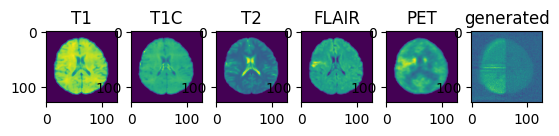

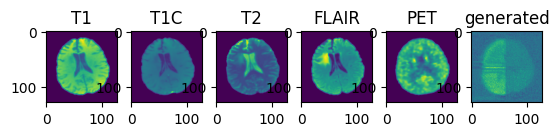

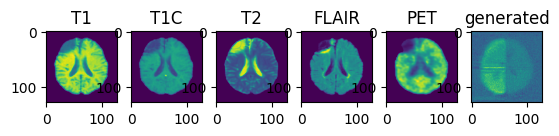

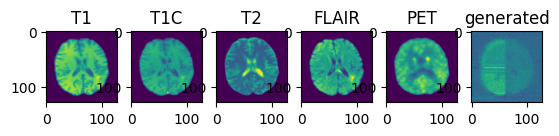

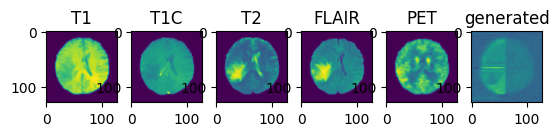

validation avg MS-SSIM: 0.3437 , train avg MS-SSIM: 0.3288
----------
epoch 41/400


Epoch :   0%|                                            | 0/24 [00:00<?, ?it/s]

Epoch :   4%|█▍                                 | 1/24 [01:52<43:04, 112.38s/it]

Epoch :   8%|███                                 | 2/24 [01:54<17:24, 47.47s/it]

Epoch :  12%|████▌                               | 3/24 [01:56<09:20, 26.69s/it]

Epoch :  17%|██████                              | 4/24 [01:58<05:38, 16.92s/it]

Epoch :  21%|███████▌                            | 5/24 [02:00<03:39, 11.53s/it]

Epoch :  25%|█████████                           | 6/24 [02:02<02:29,  8.30s/it]

Epoch :  29%|██████████▌                         | 7/24 [02:04<01:47,  6.33s/it]

Epoch :  33%|████████████                        | 8/24 [02:06<01:19,  4.94s/it]

Epoch :  38%|█████████████▌                      | 9/24 [02:08<01:00,  4.01s/it]

Epoch :  42%|██████████████▌                    | 10/24 [02:10<00:47,  3.39s/it]

Epoch :  46%|████████████████                   | 11/24 [02:12<00:38,  2.95s/it]

Epoch :  50%|█████████████████▌                 | 12/24 [02:14<00:31,  2.66s/it]

Epoch :  54%|██████████████████▉                | 13/24 [02:16<00:26,  2.42s/it]

Epoch :  58%|████████████████████▍              | 14/24 [02:18<00:22,  2.24s/it]

Epoch :  62%|█████████████████████▉             | 15/24 [02:20<00:19,  2.22s/it]

Epoch :  67%|███████████████████████▎           | 16/24 [02:22<00:16,  2.11s/it]

Epoch :  71%|████████████████████████▊          | 17/24 [02:24<00:14,  2.04s/it]

Epoch :  75%|██████████████████████████▎        | 18/24 [02:26<00:12,  2.04s/it]

Epoch :  79%|███████████████████████████▋       | 19/24 [02:28<00:10,  2.02s/it]

Epoch :  83%|█████████████████████████████▏     | 20/24 [02:29<00:07,  1.98s/it]

Epoch :  88%|██████████████████████████████▋    | 21/24 [02:31<00:05,  1.98s/it]

Epoch :  92%|████████████████████████████████   | 22/24 [02:33<00:03,  1.95s/it]

Epoch :  96%|█████████████████████████████████▌ | 23/24 [02:36<00:02,  2.05s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:37<00:00,  1.73s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:40<00:00,  6.69s/it]

----------
epoch 42/400


Epoch :   0%|                                            | 0/24 [00:00<?, ?it/s]

Epoch :   4%|█▌                                  | 1/24 [01:38<37:51, 98.75s/it]

Epoch :   8%|███                                 | 2/24 [01:40<15:19, 41.81s/it]

Epoch :  12%|████▌                               | 3/24 [01:42<08:15, 23.59s/it]

Epoch :  17%|██████                              | 4/24 [01:44<05:00, 15.03s/it]

Epoch :  21%|███████▌                            | 5/24 [01:46<03:15, 10.28s/it]

Epoch :  25%|█████████                           | 6/24 [01:48<02:13,  7.43s/it]

Epoch :  29%|██████████▌                         | 7/24 [01:50<01:38,  5.78s/it]

Epoch :  33%|████████████                        | 8/24 [01:52<01:12,  4.54s/it]

Epoch :  38%|█████████████▌                      | 9/24 [01:54<00:56,  3.74s/it]

Epoch :  42%|██████████████▌                    | 10/24 [01:56<00:44,  3.18s/it]

Epoch :  46%|████████████████                   | 11/24 [01:58<00:37,  2.86s/it]

Epoch :  50%|█████████████████▌                 | 12/24 [02:00<00:30,  2.57s/it]

Epoch :  54%|██████████████████▉                | 13/24 [02:02<00:26,  2.37s/it]

Epoch :  58%|████████████████████▍              | 14/24 [02:04<00:22,  2.22s/it]

Epoch :  62%|█████████████████████▉             | 15/24 [02:06<00:19,  2.20s/it]

Epoch :  67%|███████████████████████▎           | 16/24 [02:08<00:16,  2.10s/it]

Epoch :  71%|████████████████████████▊          | 17/24 [02:10<00:14,  2.08s/it]

Epoch :  75%|██████████████████████████▎        | 18/24 [02:12<00:12,  2.08s/it]

Epoch :  79%|███████████████████████████▋       | 19/24 [02:14<00:10,  2.01s/it]

Epoch :  83%|█████████████████████████████▏     | 20/24 [02:16<00:07,  1.96s/it]

Epoch :  88%|██████████████████████████████▋    | 21/24 [02:17<00:05,  1.93s/it]

Epoch :  92%|████████████████████████████████   | 22/24 [02:19<00:03,  1.91s/it]

Epoch :  96%|█████████████████████████████████▌ | 23/24 [02:21<00:01,  1.99s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:22<00:00,  1.69s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:26<00:00,  6.09s/it]

----------
epoch 43/400


Epoch :   0%|                                            | 0/24 [00:00<?, ?it/s]

Epoch :   4%|█▍                                 | 1/24 [01:40<38:25, 100.24s/it]

Epoch :   8%|███                                 | 2/24 [01:42<15:34, 42.48s/it]

Epoch :  12%|████▌                               | 3/24 [01:44<08:25, 24.05s/it]

Epoch :  17%|██████                              | 4/24 [01:46<05:06, 15.34s/it]

Epoch :  21%|███████▌                            | 5/24 [01:48<03:19, 10.52s/it]

Epoch :  25%|█████████                           | 6/24 [01:50<02:17,  7.63s/it]

Epoch :  29%|██████████▌                         | 7/24 [01:52<01:41,  5.96s/it]

Epoch :  33%|████████████                        | 8/24 [01:54<01:14,  4.69s/it]

Epoch :  38%|█████████████▌                      | 9/24 [01:56<00:57,  3.85s/it]

Epoch :  42%|██████████████▌                    | 10/24 [01:58<00:45,  3.24s/it]

Epoch :  46%|████████████████                   | 11/24 [02:00<00:36,  2.83s/it]

Epoch :  50%|█████████████████▌                 | 12/24 [02:02<00:30,  2.56s/it]

Epoch :  54%|██████████████████▉                | 13/24 [02:04<00:26,  2.39s/it]

Epoch :  58%|████████████████████▍              | 14/24 [02:06<00:22,  2.28s/it]

Epoch :  62%|█████████████████████▉             | 15/24 [02:08<00:20,  2.29s/it]

Epoch :  67%|███████████████████████▎           | 16/24 [02:10<00:17,  2.18s/it]

Epoch :  71%|████████████████████████▊          | 17/24 [02:12<00:14,  2.09s/it]

Epoch :  75%|██████████████████████████▎        | 18/24 [02:14<00:12,  2.05s/it]

Epoch :  79%|███████████████████████████▋       | 19/24 [02:16<00:10,  2.01s/it]

Epoch :  83%|█████████████████████████████▏     | 20/24 [02:18<00:07,  1.97s/it]

Epoch :  88%|██████████████████████████████▋    | 21/24 [02:20<00:05,  1.95s/it]

Epoch :  92%|████████████████████████████████   | 22/24 [02:22<00:03,  1.93s/it]

Epoch :  96%|█████████████████████████████████▌ | 23/24 [02:24<00:02,  2.03s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:25<00:00,  1.73s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:28<00:00,  6.20s/it]

----------
epoch 44/400


Epoch :   0%|                                            | 0/24 [00:00<?, ?it/s]

Epoch :   4%|█▌                                  | 1/24 [01:36<37:10, 97.00s/it]

Epoch :   8%|███                                 | 2/24 [01:38<15:03, 41.06s/it]

Epoch :  12%|████▌                               | 3/24 [01:40<08:06, 23.19s/it]

Epoch :  17%|██████                              | 4/24 [01:42<04:55, 14.78s/it]

Epoch :  21%|███████▌                            | 5/24 [01:44<03:12, 10.11s/it]

Epoch :  25%|█████████                           | 6/24 [01:46<02:11,  7.30s/it]

Epoch :  29%|██████████▌                         | 7/24 [01:48<01:37,  5.74s/it]

Epoch :  33%|████████████                        | 8/24 [01:50<01:12,  4.51s/it]

Epoch :  38%|█████████████▌                      | 9/24 [01:52<00:56,  3.74s/it]

Epoch :  42%|██████████████▌                    | 10/24 [01:54<00:44,  3.17s/it]

Epoch :  46%|████████████████                   | 11/24 [01:56<00:36,  2.78s/it]

Epoch :  50%|█████████████████▌                 | 12/24 [01:58<00:29,  2.50s/it]

Epoch :  54%|██████████████████▉                | 13/24 [02:00<00:25,  2.33s/it]

Epoch :  58%|████████████████████▍              | 14/24 [02:02<00:22,  2.27s/it]

Epoch :  62%|█████████████████████▉             | 15/24 [02:04<00:19,  2.15s/it]

Epoch :  67%|███████████████████████▎           | 16/24 [02:06<00:16,  2.07s/it]

Epoch :  71%|████████████████████████▊          | 17/24 [02:08<00:14,  2.01s/it]

Epoch :  75%|██████████████████████████▎        | 18/24 [02:10<00:11,  1.97s/it]

Epoch :  79%|███████████████████████████▋       | 19/24 [02:12<00:09,  1.96s/it]

Epoch :  83%|█████████████████████████████▏     | 20/24 [02:14<00:08,  2.00s/it]

Epoch :  88%|██████████████████████████████▋    | 21/24 [02:16<00:06,  2.01s/it]

Epoch :  92%|████████████████████████████████   | 22/24 [02:18<00:04,  2.06s/it]

Epoch :  96%|█████████████████████████████████▌ | 23/24 [02:20<00:02,  2.07s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:21<00:00,  1.77s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:25<00:00,  6.04s/it]

----------
epoch 45/400


Epoch :   0%|                                            | 0/24 [00:00<?, ?it/s]

Epoch :   4%|█▍                                 | 1/24 [01:48<41:33, 108.40s/it]

Epoch :   8%|███                                 | 2/24 [01:50<16:47, 45.79s/it]

Epoch :  12%|████▌                               | 3/24 [01:52<09:00, 25.75s/it]

Epoch :  17%|██████                              | 4/24 [01:54<05:26, 16.34s/it]

Epoch :  21%|███████▌                            | 5/24 [01:56<03:31, 11.15s/it]

Epoch :  25%|█████████                           | 6/24 [01:58<02:28,  8.25s/it]

Epoch :  29%|██████████▌                         | 7/24 [02:00<01:44,  6.17s/it]

Epoch :  33%|████████████                        | 8/24 [02:02<01:16,  4.80s/it]

Epoch :  38%|█████████████▌                      | 9/24 [02:04<00:58,  3.93s/it]

Epoch :  42%|██████████████▌                    | 10/24 [02:06<00:46,  3.33s/it]

Epoch :  46%|████████████████                   | 11/24 [02:08<00:38,  2.98s/it]

Epoch :  50%|█████████████████▌                 | 12/24 [02:10<00:32,  2.69s/it]

Epoch :  54%|██████████████████▉                | 13/24 [02:12<00:26,  2.44s/it]

Epoch :  58%|████████████████████▍              | 14/24 [02:14<00:23,  2.36s/it]

Epoch :  62%|█████████████████████▉             | 15/24 [02:16<00:20,  2.27s/it]

Epoch :  67%|███████████████████████▎           | 16/24 [02:18<00:17,  2.18s/it]

Epoch :  71%|████████████████████████▊          | 17/24 [02:20<00:14,  2.11s/it]

Epoch :  75%|██████████████████████████▎        | 18/24 [02:22<00:12,  2.06s/it]

Epoch :  79%|███████████████████████████▋       | 19/24 [02:24<00:10,  2.00s/it]

Epoch :  83%|█████████████████████████████▏     | 20/24 [02:26<00:07,  1.99s/it]

Epoch :  88%|██████████████████████████████▋    | 21/24 [02:28<00:05,  1.97s/it]

Epoch :  92%|████████████████████████████████   | 22/24 [02:30<00:04,  2.07s/it]

Epoch :  96%|█████████████████████████████████▌ | 23/24 [02:32<00:02,  2.06s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:33<00:00,  1.74s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:37<00:00,  6.54s/it]

----------
epoch 46/400


Epoch :   0%|                                            | 0/24 [00:00<?, ?it/s]

Epoch :   4%|█▌                                  | 1/24 [01:37<37:11, 97.03s/it]

Epoch :   8%|███                                 | 2/24 [01:38<15:03, 41.05s/it]

Epoch :  12%|████▌                               | 3/24 [01:40<08:06, 23.17s/it]

Epoch :  17%|██████                              | 4/24 [01:42<04:55, 14.76s/it]

Epoch :  21%|███████▌                            | 5/24 [01:44<03:11, 10.10s/it]

Epoch :  25%|█████████                           | 6/24 [01:46<02:13,  7.43s/it]

Epoch :  29%|██████████▌                         | 7/24 [01:48<01:35,  5.61s/it]

Epoch :  33%|████████████                        | 8/24 [01:50<01:10,  4.41s/it]

Epoch :  38%|█████████████▌                      | 9/24 [01:52<00:54,  3.61s/it]

Epoch :  42%|██████████████▌                    | 10/24 [01:54<00:42,  3.07s/it]

Epoch :  46%|████████████████                   | 11/24 [01:56<00:35,  2.70s/it]

Epoch :  50%|█████████████████▌                 | 12/24 [01:57<00:29,  2.44s/it]

Epoch :  54%|██████████████████▉                | 13/24 [02:00<00:26,  2.37s/it]

Epoch :  58%|████████████████████▍              | 14/24 [02:01<00:22,  2.22s/it]

Epoch :  62%|█████████████████████▉             | 15/24 [02:03<00:18,  2.11s/it]

Epoch :  67%|███████████████████████▎           | 16/24 [02:05<00:16,  2.02s/it]

Epoch :  71%|████████████████████████▊          | 17/24 [02:07<00:13,  1.97s/it]

Epoch :  75%|██████████████████████████▎        | 18/24 [02:09<00:11,  1.94s/it]

Epoch :  79%|███████████████████████████▋       | 19/24 [02:11<00:09,  1.96s/it]

Epoch :  83%|█████████████████████████████▏     | 20/24 [02:13<00:07,  1.94s/it]

Epoch :  88%|██████████████████████████████▋    | 21/24 [02:15<00:06,  2.01s/it]

Epoch :  92%|████████████████████████████████   | 22/24 [02:17<00:03,  1.96s/it]

Epoch :  96%|█████████████████████████████████▌ | 23/24 [02:19<00:01,  1.92s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:20<00:00,  1.65s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:23<00:00,  5.97s/it]

----------
epoch 47/400


Epoch :   0%|                                            | 0/24 [00:00<?, ?it/s]

Epoch :   4%|█▌                                  | 1/24 [01:38<37:47, 98.59s/it]

Epoch :   8%|███                                 | 2/24 [01:40<15:17, 41.71s/it]

Epoch :  12%|████▌                               | 3/24 [01:42<08:13, 23.51s/it]

Epoch :  17%|██████                              | 4/24 [01:44<04:59, 14.95s/it]

Epoch :  21%|███████▌                            | 5/24 [01:46<03:16, 10.33s/it]

Epoch :  25%|█████████                           | 6/24 [01:48<02:13,  7.43s/it]

Epoch :  29%|██████████▌                         | 7/24 [01:49<01:35,  5.59s/it]

Epoch :  33%|████████████                        | 8/24 [01:51<01:10,  4.41s/it]

Epoch :  38%|█████████████▌                      | 9/24 [01:53<00:54,  3.63s/it]

Epoch :  42%|██████████████▌                    | 10/24 [01:55<00:43,  3.14s/it]

Epoch :  46%|████████████████                   | 11/24 [01:57<00:35,  2.76s/it]

Epoch :  50%|█████████████████▌                 | 12/24 [01:59<00:29,  2.48s/it]

Epoch :  54%|██████████████████▉                | 13/24 [02:01<00:26,  2.43s/it]

Epoch :  58%|████████████████████▍              | 14/24 [02:03<00:22,  2.27s/it]

Epoch :  62%|█████████████████████▉             | 15/24 [02:05<00:19,  2.16s/it]

Epoch :  67%|███████████████████████▎           | 16/24 [02:07<00:16,  2.09s/it]

Epoch :  71%|████████████████████████▊          | 17/24 [02:09<00:14,  2.07s/it]

Epoch :  75%|██████████████████████████▎        | 18/24 [02:11<00:12,  2.02s/it]

Epoch :  79%|███████████████████████████▋       | 19/24 [02:13<00:09,  1.98s/it]

Epoch :  83%|█████████████████████████████▏     | 20/24 [02:15<00:07,  1.97s/it]

Epoch :  88%|██████████████████████████████▋    | 21/24 [02:17<00:06,  2.02s/it]

Epoch :  92%|████████████████████████████████   | 22/24 [02:19<00:04,  2.00s/it]

Epoch :  96%|█████████████████████████████████▌ | 23/24 [02:21<00:01,  1.97s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:22<00:00,  1.68s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:25<00:00,  6.07s/it]

----------
epoch 48/400


Epoch :   0%|                                            | 0/24 [00:00<?, ?it/s]

Epoch :   4%|█▍                                 | 1/24 [01:41<38:46, 101.16s/it]

Epoch :   8%|███                                 | 2/24 [01:43<15:40, 42.77s/it]

Epoch :  12%|████▌                               | 3/24 [01:44<08:25, 24.09s/it]

Epoch :  17%|██████                              | 4/24 [01:46<05:06, 15.33s/it]

Epoch :  21%|███████▌                            | 5/24 [01:49<03:21, 10.60s/it]

Epoch :  25%|█████████                           | 6/24 [01:50<02:17,  7.62s/it]

Epoch :  29%|██████████▌                         | 7/24 [01:52<01:37,  5.73s/it]

Epoch :  33%|████████████                        | 8/24 [01:54<01:12,  4.50s/it]

Epoch :  38%|█████████████▌                      | 9/24 [01:56<00:55,  3.71s/it]

Epoch :  42%|██████████████▌                    | 10/24 [01:58<00:44,  3.16s/it]

Epoch :  46%|████████████████                   | 11/24 [02:00<00:35,  2.77s/it]

Epoch :  50%|█████████████████▌                 | 12/24 [02:02<00:29,  2.50s/it]

Epoch :  54%|██████████████████▉                | 13/24 [02:04<00:26,  2.43s/it]

Epoch :  58%|████████████████████▍              | 14/24 [02:06<00:22,  2.27s/it]

Epoch :  62%|█████████████████████▉             | 15/24 [02:08<00:19,  2.15s/it]

Epoch :  67%|███████████████████████▎           | 16/24 [02:10<00:16,  2.10s/it]

Epoch :  71%|████████████████████████▊          | 17/24 [02:12<00:14,  2.03s/it]

Epoch :  75%|██████████████████████████▎        | 18/24 [02:14<00:11,  2.00s/it]

Epoch :  79%|███████████████████████████▋       | 19/24 [02:15<00:09,  1.96s/it]

Epoch :  83%|█████████████████████████████▏     | 20/24 [02:17<00:07,  1.94s/it]

Epoch :  88%|██████████████████████████████▋    | 21/24 [02:20<00:06,  2.03s/it]

Epoch :  92%|████████████████████████████████   | 22/24 [02:21<00:03,  1.98s/it]

Epoch :  96%|█████████████████████████████████▌ | 23/24 [02:23<00:01,  1.95s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:24<00:00,  1.66s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:28<00:00,  6.17s/it]

----------
epoch 49/400


Epoch :   0%|                                            | 0/24 [00:00<?, ?it/s]

Epoch :   4%|█▍                                 | 1/24 [01:44<40:04, 104.52s/it]

Epoch :   8%|███                                 | 2/24 [01:46<16:13, 44.23s/it]

Epoch :  12%|████▌                               | 3/24 [01:48<08:44, 24.96s/it]

Epoch :  17%|██████                              | 4/24 [01:50<05:17, 15.87s/it]

Epoch :  21%|███████▌                            | 5/24 [01:52<03:28, 10.99s/it]

Epoch :  25%|█████████                           | 6/24 [01:54<02:22,  7.91s/it]

Epoch :  29%|██████████▌                         | 7/24 [01:56<01:41,  5.96s/it]

Epoch :  33%|████████████                        | 8/24 [01:58<01:14,  4.67s/it]

Epoch :  38%|█████████████▌                      | 9/24 [02:00<00:57,  3.80s/it]

Epoch :  42%|██████████████▌                    | 10/24 [02:02<00:45,  3.23s/it]

Epoch :  46%|████████████████                   | 11/24 [02:04<00:36,  2.83s/it]

Epoch :  50%|█████████████████▌                 | 12/24 [02:06<00:30,  2.57s/it]

Epoch :  54%|██████████████████▉                | 13/24 [02:08<00:26,  2.45s/it]

Epoch :  58%|████████████████████▍              | 14/24 [02:10<00:22,  2.28s/it]

Epoch :  62%|█████████████████████▉             | 15/24 [02:12<00:19,  2.19s/it]

Epoch :  67%|███████████████████████▎           | 16/24 [02:14<00:17,  2.13s/it]

Epoch :  71%|████████████████████████▊          | 17/24 [02:16<00:14,  2.05s/it]

Epoch :  75%|██████████████████████████▎        | 18/24 [02:18<00:11,  2.00s/it]

Epoch :  79%|███████████████████████████▋       | 19/24 [02:20<00:09,  1.98s/it]

Epoch :  83%|█████████████████████████████▏     | 20/24 [02:22<00:07,  1.96s/it]

Epoch :  88%|██████████████████████████████▋    | 21/24 [02:24<00:06,  2.02s/it]

Epoch :  92%|████████████████████████████████   | 22/24 [02:26<00:04,  2.01s/it]

Epoch :  96%|█████████████████████████████████▌ | 23/24 [02:28<00:01,  1.97s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:29<00:00,  1.68s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:32<00:00,  6.34s/it]

----------
epoch 50/400


Epoch :   0%|                                            | 0/24 [00:00<?, ?it/s]

Epoch :   4%|█▌                                  | 1/24 [01:37<37:26, 97.68s/it]

Epoch :   8%|███                                 | 2/24 [01:39<15:12, 41.49s/it]

Epoch :  12%|████▌                               | 3/24 [01:41<08:11, 23.41s/it]

Epoch :  17%|██████                              | 4/24 [01:43<04:58, 14.90s/it]

Epoch :  21%|███████▌                            | 5/24 [01:45<03:15, 10.32s/it]

Epoch :  25%|█████████                           | 6/24 [01:47<02:14,  7.45s/it]

Epoch :  29%|██████████▌                         | 7/24 [01:49<01:35,  5.62s/it]

Epoch :  33%|████████████                        | 8/24 [01:51<01:10,  4.41s/it]

Epoch :  38%|█████████████▌                      | 9/24 [01:53<00:54,  3.62s/it]

Epoch :  42%|██████████████▌                    | 10/24 [01:55<00:43,  3.09s/it]

Epoch :  46%|████████████████                   | 11/24 [01:57<00:35,  2.72s/it]

Epoch :  50%|█████████████████▌                 | 12/24 [01:58<00:29,  2.48s/it]

Epoch :  54%|██████████████████▉                | 13/24 [02:01<00:25,  2.36s/it]

Epoch :  58%|████████████████████▍              | 14/24 [02:03<00:22,  2.26s/it]

Epoch :  62%|█████████████████████▉             | 15/24 [02:05<00:19,  2.18s/it]

Epoch :  67%|███████████████████████▎           | 16/24 [02:06<00:16,  2.11s/it]

Epoch :  71%|████████████████████████▊          | 17/24 [02:08<00:14,  2.06s/it]

Epoch :  75%|██████████████████████████▎        | 18/24 [02:10<00:12,  2.02s/it]

Epoch :  79%|███████████████████████████▋       | 19/24 [02:12<00:10,  2.00s/it]

Epoch :  83%|█████████████████████████████▏     | 20/24 [02:14<00:07,  1.96s/it]

Epoch :  88%|██████████████████████████████▋    | 21/24 [02:16<00:05,  1.93s/it]

Epoch :  92%|████████████████████████████████   | 22/24 [02:18<00:03,  1.90s/it]

Epoch :  96%|█████████████████████████████████▌ | 23/24 [02:20<00:01,  1.93s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:21<00:00,  1.66s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:24<00:00,  6.04s/it]

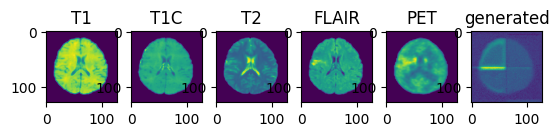

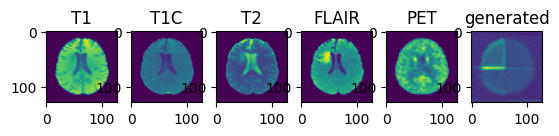

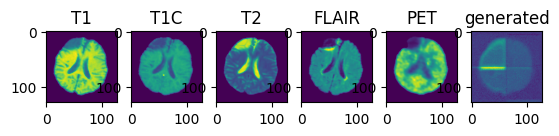

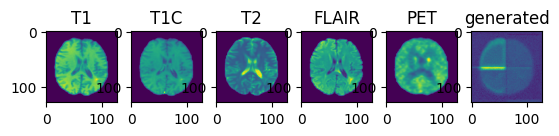

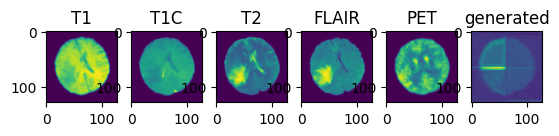

validation avg MS-SSIM: 0.3567 , train avg MS-SSIM: 0.3403
----------
epoch 51/400


Epoch :   0%|                                            | 0/24 [00:00<?, ?it/s]

Epoch :   4%|█▍                                 | 1/24 [01:42<39:13, 102.34s/it]

Epoch :   8%|███                                 | 2/24 [01:44<15:52, 43.28s/it]

Epoch :  12%|████▌                               | 3/24 [01:46<08:31, 24.38s/it]

Epoch :  17%|██████                              | 4/24 [01:48<05:10, 15.52s/it]

Epoch :  21%|███████▌                            | 5/24 [01:50<03:22, 10.65s/it]

Epoch :  25%|█████████                           | 6/24 [01:51<02:17,  7.66s/it]

Epoch :  29%|██████████▌                         | 7/24 [01:54<01:38,  5.82s/it]

Epoch :  33%|████████████                        | 8/24 [01:56<01:15,  4.73s/it]

Epoch :  38%|█████████████▌                      | 9/24 [01:58<00:58,  3.90s/it]

Epoch :  42%|██████████████▌                    | 10/24 [02:00<00:46,  3.30s/it]

Epoch :  46%|████████████████                   | 11/24 [02:02<00:37,  2.89s/it]

Epoch :  50%|█████████████████▌                 | 12/24 [02:04<00:31,  2.64s/it]

Epoch :  54%|██████████████████▉                | 13/24 [02:06<00:27,  2.47s/it]

Epoch :  58%|████████████████████▍              | 14/24 [02:08<00:24,  2.41s/it]

Epoch :  62%|█████████████████████▉             | 15/24 [02:11<00:22,  2.54s/it]

Epoch :  67%|███████████████████████▎           | 16/24 [02:13<00:19,  2.41s/it]

Epoch :  71%|████████████████████████▊          | 17/24 [02:15<00:15,  2.28s/it]

Epoch :  75%|██████████████████████████▎        | 18/24 [02:17<00:13,  2.21s/it]

Epoch :  79%|███████████████████████████▋       | 19/24 [02:19<00:10,  2.16s/it]

Epoch :  83%|█████████████████████████████▏     | 20/24 [02:21<00:08,  2.08s/it]

Epoch :  88%|██████████████████████████████▋    | 21/24 [02:23<00:06,  2.03s/it]

Epoch :  92%|████████████████████████████████   | 22/24 [02:25<00:03,  2.00s/it]

Epoch :  96%|█████████████████████████████████▌ | 23/24 [02:27<00:02,  2.05s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:28<00:00,  1.74s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:32<00:00,  6.34s/it]

----------
epoch 52/400


Epoch :   0%|                                            | 0/24 [00:00<?, ?it/s]

Epoch :   4%|█▍                                 | 1/24 [01:42<39:19, 102.58s/it]

Epoch :   8%|███                                 | 2/24 [01:44<15:53, 43.35s/it]

Epoch :  12%|████▌                               | 3/24 [01:46<08:32, 24.40s/it]

Epoch :  17%|██████                              | 4/24 [01:48<05:09, 15.49s/it]

Epoch :  21%|███████▌                            | 5/24 [01:50<03:20, 10.57s/it]

Epoch :  25%|█████████                           | 6/24 [01:51<02:16,  7.61s/it]

Epoch :  29%|██████████▌                         | 7/24 [01:54<01:39,  5.83s/it]

Epoch :  33%|████████████                        | 8/24 [01:55<01:13,  4.56s/it]

Epoch :  38%|█████████████▌                      | 9/24 [01:57<00:55,  3.72s/it]

Epoch :  42%|██████████████▌                    | 10/24 [01:59<00:43,  3.14s/it]

Epoch :  46%|████████████████                   | 11/24 [02:01<00:35,  2.74s/it]

Epoch :  50%|█████████████████▌                 | 12/24 [02:03<00:29,  2.49s/it]

Epoch :  54%|██████████████████▉                | 13/24 [02:05<00:25,  2.32s/it]

Epoch :  58%|████████████████████▍              | 14/24 [02:07<00:22,  2.23s/it]

Epoch :  62%|█████████████████████▉             | 15/24 [02:09<00:19,  2.20s/it]

Epoch :  67%|███████████████████████▎           | 16/24 [02:11<00:16,  2.10s/it]

Epoch :  71%|████████████████████████▊          | 17/24 [02:13<00:14,  2.02s/it]

Epoch :  75%|██████████████████████████▎        | 18/24 [02:14<00:11,  1.96s/it]

Epoch :  79%|███████████████████████████▋       | 19/24 [02:16<00:09,  1.92s/it]

Epoch :  83%|█████████████████████████████▏     | 20/24 [02:18<00:07,  1.89s/it]

Epoch :  88%|██████████████████████████████▋    | 21/24 [02:20<00:05,  1.88s/it]

Epoch :  92%|████████████████████████████████   | 22/24 [02:22<00:03,  1.87s/it]

Epoch :  96%|█████████████████████████████████▌ | 23/24 [02:24<00:01,  1.96s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:25<00:00,  1.67s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:29<00:00,  6.21s/it]

----------
epoch 53/400


Epoch :   0%|                                            | 0/24 [00:00<?, ?it/s]

Epoch :   4%|█▌                                  | 1/24 [01:39<38:03, 99.28s/it]

Epoch :   8%|███                                 | 2/24 [01:41<15:26, 42.10s/it]

Epoch :  12%|████▌                               | 3/24 [01:43<08:18, 23.72s/it]

Epoch :  17%|██████                              | 4/24 [01:45<05:03, 15.16s/it]

Epoch :  21%|███████▌                            | 5/24 [01:47<03:19, 10.48s/it]

Epoch :  25%|█████████                           | 6/24 [01:49<02:16,  7.59s/it]

Epoch :  29%|██████████▌                         | 7/24 [01:51<01:39,  5.87s/it]

Epoch :  33%|████████████                        | 8/24 [01:53<01:13,  4.59s/it]

Epoch :  38%|█████████████▌                      | 9/24 [01:55<00:56,  3.76s/it]

Epoch :  42%|██████████████▌                    | 10/24 [01:57<00:44,  3.21s/it]

Epoch :  46%|████████████████                   | 11/24 [01:59<00:36,  2.84s/it]

Epoch :  50%|█████████████████▌                 | 12/24 [02:01<00:30,  2.58s/it]

Epoch :  54%|██████████████████▉                | 13/24 [02:03<00:26,  2.43s/it]

Epoch :  58%|████████████████████▍              | 14/24 [02:05<00:23,  2.30s/it]

Epoch :  62%|█████████████████████▉             | 15/24 [02:07<00:20,  2.31s/it]

Epoch :  67%|███████████████████████▎           | 16/24 [02:09<00:17,  2.18s/it]

Epoch :  71%|████████████████████████▊          | 17/24 [02:11<00:14,  2.11s/it]

Epoch :  75%|██████████████████████████▎        | 18/24 [02:13<00:12,  2.03s/it]

Epoch :  79%|███████████████████████████▋       | 19/24 [02:15<00:10,  2.05s/it]

Epoch :  83%|█████████████████████████████▏     | 20/24 [02:17<00:08,  2.04s/it]

Epoch :  88%|██████████████████████████████▋    | 21/24 [02:19<00:06,  2.00s/it]

Epoch :  92%|████████████████████████████████   | 22/24 [02:21<00:03,  1.97s/it]

Epoch :  96%|█████████████████████████████████▌ | 23/24 [02:23<00:02,  2.08s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:24<00:00,  1.75s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:27<00:00,  6.17s/it]

----------
epoch 54/400


Epoch :   0%|                                            | 0/24 [00:00<?, ?it/s]

Epoch :   4%|█▌                                  | 1/24 [01:39<38:00, 99.14s/it]

Epoch :   8%|███                                 | 2/24 [01:41<15:23, 42.00s/it]

Epoch :  12%|████▌                               | 3/24 [01:43<08:18, 23.74s/it]

Epoch :  17%|██████                              | 4/24 [01:45<05:02, 15.12s/it]

Epoch :  21%|███████▌                            | 5/24 [01:47<03:18, 10.42s/it]

Epoch :  25%|█████████                           | 6/24 [01:48<02:14,  7.50s/it]

Epoch :  29%|██████████▌                         | 7/24 [01:51<01:39,  5.86s/it]

Epoch :  33%|████████████                        | 8/24 [01:53<01:14,  4.65s/it]

Epoch :  38%|█████████████▌                      | 9/24 [01:55<00:57,  3.80s/it]

Epoch :  42%|██████████████▌                    | 10/24 [01:57<00:44,  3.20s/it]

Epoch :  46%|████████████████                   | 11/24 [01:59<00:36,  2.78s/it]

Epoch :  50%|█████████████████▌                 | 12/24 [02:00<00:30,  2.50s/it]

Epoch :  54%|██████████████████▉                | 13/24 [02:02<00:25,  2.30s/it]

Epoch :  58%|████████████████████▍              | 14/24 [02:04<00:21,  2.17s/it]

Epoch :  62%|█████████████████████▉             | 15/24 [02:06<00:19,  2.16s/it]

Epoch :  67%|███████████████████████▎           | 16/24 [02:08<00:16,  2.10s/it]

Epoch :  71%|████████████████████████▊          | 17/24 [02:10<00:14,  2.06s/it]

Epoch :  75%|██████████████████████████▎        | 18/24 [02:12<00:12,  2.04s/it]

Epoch :  79%|███████████████████████████▋       | 19/24 [02:14<00:10,  2.03s/it]

Epoch :  83%|█████████████████████████████▏     | 20/24 [02:16<00:07,  1.98s/it]

Epoch :  88%|██████████████████████████████▋    | 21/24 [02:18<00:06,  2.00s/it]

Epoch :  92%|████████████████████████████████   | 22/24 [02:21<00:04,  2.32s/it]

Epoch :  96%|█████████████████████████████████▌ | 23/24 [02:23<00:02,  2.20s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:24<00:00,  1.84s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:28<00:00,  6.17s/it]

----------
epoch 55/400


Epoch :   0%|                                            | 0/24 [00:00<?, ?it/s]

Epoch :   4%|█▍                                 | 1/24 [01:43<39:38, 103.43s/it]

Epoch :   8%|███                                 | 2/24 [01:45<16:01, 43.72s/it]

Epoch :  12%|████▌                               | 3/24 [01:47<08:37, 24.66s/it]

Epoch :  17%|██████                              | 4/24 [01:49<05:13, 15.68s/it]

Epoch :  21%|███████▌                            | 5/24 [01:51<03:23, 10.73s/it]

Epoch :  25%|█████████                           | 6/24 [01:53<02:19,  7.75s/it]

Epoch :  29%|██████████▌                         | 7/24 [01:55<01:40,  5.94s/it]

Epoch :  33%|████████████                        | 8/24 [01:57<01:14,  4.67s/it]

Epoch :  38%|█████████████▌                      | 9/24 [01:59<00:57,  3.85s/it]

Epoch :  42%|██████████████▌                    | 10/24 [02:01<00:45,  3.25s/it]

Epoch :  46%|████████████████                   | 11/24 [02:03<00:36,  2.84s/it]

Epoch :  50%|█████████████████▌                 | 12/24 [02:05<00:31,  2.59s/it]

Epoch :  54%|██████████████████▉                | 13/24 [02:07<00:26,  2.40s/it]

Epoch :  58%|████████████████████▍              | 14/24 [02:09<00:23,  2.34s/it]

Epoch :  62%|█████████████████████▉             | 15/24 [02:11<00:19,  2.20s/it]

Epoch :  67%|███████████████████████▎           | 16/24 [02:13<00:16,  2.09s/it]

Epoch :  71%|████████████████████████▊          | 17/24 [02:15<00:14,  2.06s/it]

Epoch :  75%|██████████████████████████▎        | 18/24 [02:17<00:12,  2.03s/it]

Epoch :  79%|███████████████████████████▋       | 19/24 [02:18<00:09,  1.99s/it]

Epoch :  83%|█████████████████████████████▏     | 20/24 [02:20<00:07,  1.97s/it]

Epoch :  88%|██████████████████████████████▋    | 21/24 [02:22<00:05,  1.98s/it]

Epoch :  92%|████████████████████████████████   | 22/24 [02:24<00:03,  1.98s/it]

Epoch :  96%|█████████████████████████████████▌ | 23/24 [02:27<00:02,  2.11s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:28<00:00,  1.80s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:31<00:00,  6.32s/it]

----------
epoch 56/400


Epoch :   0%|                                            | 0/24 [00:00<?, ?it/s]

Epoch :   4%|█▍                                 | 1/24 [01:40<38:20, 100.01s/it]

Epoch :   8%|███                                 | 2/24 [01:41<15:31, 42.32s/it]

Epoch :  12%|████▌                               | 3/24 [01:43<08:21, 23.88s/it]

Epoch :  17%|██████                              | 4/24 [01:45<05:04, 15.24s/it]

Epoch :  21%|███████▌                            | 5/24 [01:47<03:18, 10.43s/it]

Epoch :  25%|█████████                           | 6/24 [01:50<02:17,  7.64s/it]

Epoch :  29%|██████████▌                         | 7/24 [01:52<01:38,  5.80s/it]

Epoch :  33%|████████████                        | 8/24 [01:54<01:13,  4.60s/it]

Epoch :  38%|█████████████▌                      | 9/24 [01:56<00:57,  3.82s/it]

Epoch :  42%|██████████████▌                    | 10/24 [01:58<00:45,  3.23s/it]

Epoch :  46%|████████████████                   | 11/24 [02:00<00:37,  2.86s/it]

Epoch :  50%|█████████████████▌                 | 12/24 [02:02<00:31,  2.61s/it]

Epoch :  54%|██████████████████▉                | 13/24 [02:04<00:26,  2.41s/it]

Epoch :  58%|████████████████████▍              | 14/24 [02:06<00:24,  2.41s/it]

Epoch :  62%|█████████████████████▉             | 15/24 [02:08<00:20,  2.30s/it]

Epoch :  67%|███████████████████████▎           | 16/24 [02:10<00:17,  2.19s/it]

Epoch :  71%|████████████████████████▊          | 17/24 [02:12<00:14,  2.12s/it]

Epoch :  75%|██████████████████████████▎        | 18/24 [02:14<00:12,  2.08s/it]

Epoch :  79%|███████████████████████████▋       | 19/24 [02:16<00:10,  2.05s/it]

Epoch :  83%|█████████████████████████████▏     | 20/24 [02:18<00:08,  2.03s/it]

Epoch :  88%|██████████████████████████████▋    | 21/24 [02:20<00:06,  2.00s/it]

Epoch :  92%|████████████████████████████████   | 22/24 [02:22<00:04,  2.13s/it]

Epoch :  96%|█████████████████████████████████▌ | 23/24 [02:24<00:02,  2.12s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:25<00:00,  1.81s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:29<00:00,  6.23s/it]

----------
epoch 57/400


Epoch :   0%|                                            | 0/24 [00:00<?, ?it/s]

Epoch :   4%|█▌                                  | 1/24 [01:39<38:15, 99.82s/it]

Epoch :   8%|███                                 | 2/24 [01:41<15:28, 42.22s/it]

Epoch :  12%|████▌                               | 3/24 [01:43<08:21, 23.86s/it]

Epoch :  17%|██████                              | 4/24 [01:45<05:04, 15.21s/it]

Epoch :  21%|███████▌                            | 5/24 [01:47<03:17, 10.40s/it]

Epoch :  25%|█████████                           | 6/24 [01:49<02:17,  7.63s/it]

Epoch :  29%|██████████▌                         | 7/24 [01:51<01:37,  5.74s/it]

Epoch :  33%|████████████                        | 8/24 [01:53<01:12,  4.51s/it]

Epoch :  38%|█████████████▌                      | 9/24 [01:55<00:55,  3.70s/it]

Epoch :  42%|██████████████▌                    | 10/24 [01:57<00:43,  3.14s/it]

Epoch :  46%|████████████████                   | 11/24 [01:59<00:35,  2.74s/it]

Epoch :  50%|█████████████████▌                 | 12/24 [02:00<00:29,  2.47s/it]

Epoch :  54%|██████████████████▉                | 13/24 [02:02<00:25,  2.28s/it]

Epoch :  58%|████████████████████▍              | 14/24 [02:04<00:22,  2.22s/it]

Epoch :  62%|█████████████████████▉             | 15/24 [02:06<00:18,  2.10s/it]

Epoch :  67%|███████████████████████▎           | 16/24 [02:08<00:16,  2.03s/it]

Epoch :  71%|████████████████████████▊          | 17/24 [02:10<00:14,  2.00s/it]

Epoch :  75%|██████████████████████████▎        | 18/24 [02:12<00:11,  1.99s/it]

Epoch :  79%|███████████████████████████▋       | 19/24 [02:14<00:09,  1.99s/it]

Epoch :  83%|█████████████████████████████▏     | 20/24 [02:16<00:07,  1.96s/it]

Epoch :  88%|██████████████████████████████▋    | 21/24 [02:18<00:05,  1.93s/it]

Epoch :  92%|████████████████████████████████   | 22/24 [02:20<00:04,  2.02s/it]

Epoch :  96%|█████████████████████████████████▌ | 23/24 [02:22<00:02,  2.02s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:23<00:00,  1.71s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:26<00:00,  6.11s/it]

----------
epoch 58/400


Epoch :   0%|                                            | 0/24 [00:00<?, ?it/s]

Epoch :   4%|█▌                                  | 1/24 [01:39<38:00, 99.17s/it]

Epoch :   8%|███                                 | 2/24 [01:41<15:22, 41.95s/it]

Epoch :  12%|████▌                               | 3/24 [01:42<08:16, 23.66s/it]

Epoch :  17%|██████                              | 4/24 [01:44<05:01, 15.09s/it]

Epoch :  21%|███████▌                            | 5/24 [01:46<03:16, 10.35s/it]

Epoch :  25%|█████████                           | 6/24 [01:49<02:16,  7.61s/it]

Epoch :  29%|██████████▌                         | 7/24 [01:51<01:37,  5.74s/it]

Epoch :  33%|████████████                        | 8/24 [01:52<01:12,  4.52s/it]

Epoch :  38%|█████████████▌                      | 9/24 [01:54<00:55,  3.71s/it]

Epoch :  42%|██████████████▌                    | 10/24 [01:56<00:44,  3.16s/it]

Epoch :  46%|████████████████                   | 11/24 [01:58<00:35,  2.76s/it]

Epoch :  50%|█████████████████▌                 | 12/24 [02:00<00:29,  2.48s/it]

Epoch :  54%|██████████████████▉                | 13/24 [02:02<00:26,  2.38s/it]

Epoch :  58%|████████████████████▍              | 14/24 [02:04<00:23,  2.32s/it]

Epoch :  62%|█████████████████████▉             | 15/24 [02:06<00:19,  2.19s/it]

Epoch :  67%|███████████████████████▎           | 16/24 [02:08<00:17,  2.13s/it]

Epoch :  71%|████████████████████████▊          | 17/24 [02:10<00:14,  2.07s/it]

Epoch :  75%|██████████████████████████▎        | 18/24 [02:12<00:11,  2.00s/it]

Epoch :  79%|███████████████████████████▋       | 19/24 [02:14<00:09,  1.97s/it]

Epoch :  83%|█████████████████████████████▏     | 20/24 [02:16<00:07,  1.93s/it]

Epoch :  88%|██████████████████████████████▋    | 21/24 [02:18<00:06,  2.01s/it]

Epoch :  92%|████████████████████████████████   | 22/24 [02:20<00:03,  1.97s/it]

Epoch :  96%|█████████████████████████████████▌ | 23/24 [02:22<00:02,  2.03s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:23<00:00,  1.72s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:26<00:00,  6.11s/it]

----------
epoch 59/400


Epoch :   0%|                                            | 0/24 [00:00<?, ?it/s]

Epoch :   4%|█▌                                  | 1/24 [01:39<38:17, 99.89s/it]

Epoch :   8%|███                                 | 2/24 [01:41<15:29, 42.23s/it]

Epoch :  12%|████▌                               | 3/24 [01:43<08:19, 23.80s/it]

Epoch :  17%|██████                              | 4/24 [01:45<05:03, 15.19s/it]

Epoch :  21%|███████▌                            | 5/24 [01:47<03:17, 10.42s/it]

Epoch :  25%|█████████                           | 6/24 [01:49<02:18,  7.68s/it]

Epoch :  29%|██████████▌                         | 7/24 [01:51<01:38,  5.78s/it]

Epoch :  33%|████████████                        | 8/24 [01:53<01:12,  4.55s/it]

Epoch :  38%|█████████████▌                      | 9/24 [01:55<00:55,  3.72s/it]

Epoch :  42%|██████████████▌                    | 10/24 [01:57<00:44,  3.16s/it]

Epoch :  46%|████████████████                   | 11/24 [01:59<00:36,  2.84s/it]

Epoch :  50%|█████████████████▌                 | 12/24 [02:01<00:32,  2.68s/it]

Epoch :  54%|██████████████████▉                | 13/24 [02:04<00:28,  2.57s/it]

Epoch :  58%|████████████████████▍              | 14/24 [02:06<00:23,  2.37s/it]

Epoch :  62%|█████████████████████▉             | 15/24 [02:08<00:20,  2.23s/it]

Epoch :  67%|███████████████████████▎           | 16/24 [02:09<00:17,  2.13s/it]

Epoch :  71%|████████████████████████▊          | 17/24 [02:11<00:14,  2.05s/it]

Epoch :  75%|██████████████████████████▎        | 18/24 [02:13<00:11,  2.00s/it]

Epoch :  79%|███████████████████████████▋       | 19/24 [02:15<00:09,  1.97s/it]

Epoch :  83%|█████████████████████████████▏     | 20/24 [02:17<00:07,  1.96s/it]

Epoch :  88%|██████████████████████████████▋    | 21/24 [02:19<00:06,  2.09s/it]

Epoch :  92%|████████████████████████████████   | 22/24 [02:21<00:04,  2.06s/it]

Epoch :  96%|█████████████████████████████████▌ | 23/24 [02:23<00:02,  2.03s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:24<00:00,  1.72s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:28<00:00,  6.18s/it]

----------
epoch 60/400


Epoch :   0%|                                            | 0/24 [00:00<?, ?it/s]

Epoch :   4%|█▍                                 | 1/24 [01:49<41:59, 109.55s/it]

Epoch :   8%|███                                 | 2/24 [01:51<16:58, 46.29s/it]

Epoch :  12%|████▌                               | 3/24 [01:53<09:08, 26.13s/it]

Epoch :  17%|██████                              | 4/24 [01:55<05:32, 16.61s/it]

Epoch :  21%|███████▌                            | 5/24 [01:57<03:37, 11.43s/it]

Epoch :  25%|█████████                           | 6/24 [01:59<02:27,  8.20s/it]

Epoch :  29%|██████████▌                         | 7/24 [02:01<01:44,  6.16s/it]

Epoch :  33%|████████████                        | 8/24 [02:03<01:17,  4.85s/it]

Epoch :  38%|█████████████▌                      | 9/24 [02:05<00:59,  3.98s/it]

Epoch :  42%|██████████████▌                    | 10/24 [02:08<00:50,  3.60s/it]

Epoch :  46%|████████████████                   | 11/24 [02:10<00:40,  3.14s/it]

Epoch :  50%|█████████████████▌                 | 12/24 [02:12<00:33,  2.81s/it]

Epoch :  54%|██████████████████▉                | 13/24 [02:15<00:29,  2.72s/it]

Epoch :  58%|████████████████████▍              | 14/24 [02:17<00:24,  2.49s/it]

Epoch :  62%|█████████████████████▉             | 15/24 [02:19<00:20,  2.33s/it]

Epoch :  67%|███████████████████████▎           | 16/24 [02:21<00:18,  2.27s/it]

Epoch :  71%|████████████████████████▊          | 17/24 [02:23<00:15,  2.20s/it]

Epoch :  75%|██████████████████████████▎        | 18/24 [02:25<00:12,  2.10s/it]

Epoch :  79%|███████████████████████████▋       | 19/24 [02:27<00:10,  2.03s/it]

Epoch :  83%|█████████████████████████████▏     | 20/24 [02:29<00:08,  2.00s/it]

Epoch :  88%|██████████████████████████████▋    | 21/24 [02:31<00:06,  2.10s/it]

Epoch :  92%|████████████████████████████████   | 22/24 [02:33<00:04,  2.04s/it]

Epoch :  96%|█████████████████████████████████▌ | 23/24 [02:35<00:02,  2.00s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:36<00:00,  1.71s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:39<00:00,  6.67s/it]

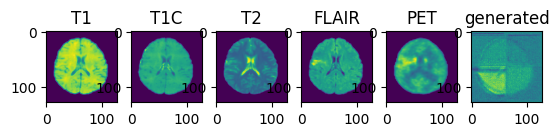

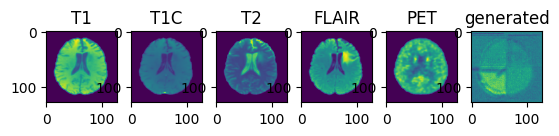

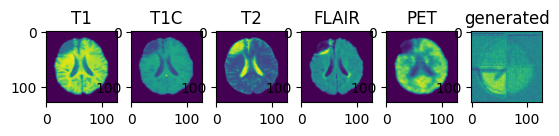

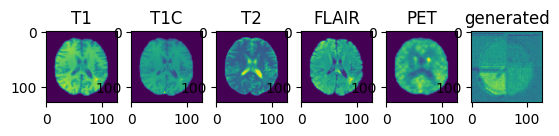

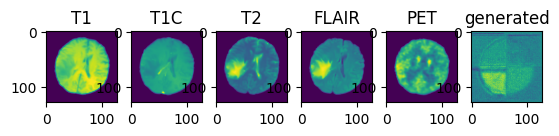

validation avg MS-SSIM: 0.1659 , train avg MS-SSIM: 0.1585
----------
epoch 61/400


Epoch :   0%|                                            | 0/24 [00:00<?, ?it/s]

Epoch :   4%|█▍                                 | 1/24 [01:47<41:22, 107.95s/it]

Epoch :   8%|███                                 | 2/24 [01:50<16:45, 45.69s/it]

Epoch :  12%|████▌                               | 3/24 [01:52<09:00, 25.74s/it]

Epoch :  17%|██████                              | 4/24 [01:54<05:27, 16.39s/it]

Epoch :  21%|███████▌                            | 5/24 [01:56<03:33, 11.26s/it]

Epoch :  25%|█████████                           | 6/24 [01:58<02:25,  8.09s/it]

Epoch :  29%|██████████▌                         | 7/24 [02:00<01:43,  6.10s/it]

Epoch :  33%|████████████                        | 8/24 [02:02<01:17,  4.84s/it]

Epoch :  38%|█████████████▌                      | 9/24 [02:05<01:03,  4.24s/it]

Epoch :  42%|██████████████▌                    | 10/24 [02:07<00:51,  3.66s/it]

Epoch :  46%|████████████████                   | 11/24 [02:10<00:43,  3.31s/it]

Epoch :  50%|█████████████████▌                 | 12/24 [02:12<00:35,  2.95s/it]

Epoch :  54%|██████████████████▉                | 13/24 [02:14<00:29,  2.71s/it]

Epoch :  58%|████████████████████▍              | 14/24 [02:16<00:24,  2.49s/it]

Epoch :  62%|█████████████████████▉             | 15/24 [02:18<00:20,  2.33s/it]

Epoch :  67%|███████████████████████▎           | 16/24 [02:20<00:17,  2.22s/it]

Epoch :  71%|████████████████████████▊          | 17/24 [02:22<00:15,  2.24s/it]

Epoch :  75%|██████████████████████████▎        | 18/24 [02:24<00:12,  2.17s/it]

Epoch :  79%|███████████████████████████▋       | 19/24 [02:26<00:10,  2.13s/it]

Epoch :  83%|█████████████████████████████▏     | 20/24 [02:28<00:08,  2.07s/it]

Epoch :  88%|██████████████████████████████▋    | 21/24 [02:30<00:06,  2.05s/it]

Epoch :  92%|████████████████████████████████   | 22/24 [02:32<00:04,  2.03s/it]

Epoch :  96%|█████████████████████████████████▌ | 23/24 [02:34<00:02,  2.01s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:36<00:00,  1.89s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:39<00:00,  6.66s/it]

----------
epoch 62/400


Epoch :   0%|                                            | 0/24 [00:00<?, ?it/s]

Epoch :   4%|█▍                                 | 1/24 [01:53<43:38, 113.83s/it]

Epoch :   8%|███                                 | 2/24 [01:55<17:35, 47.98s/it]

Epoch :  12%|████▌                               | 3/24 [01:57<09:25, 26.95s/it]

Epoch :  17%|██████                              | 4/24 [01:59<05:41, 17.09s/it]

Epoch :  21%|███████▌                            | 5/24 [02:01<03:42, 11.69s/it]

Epoch :  25%|█████████                           | 6/24 [02:03<02:32,  8.44s/it]

Epoch :  29%|██████████▌                         | 7/24 [02:05<01:48,  6.35s/it]

Epoch :  33%|████████████                        | 8/24 [02:08<01:20,  5.02s/it]

Epoch :  38%|█████████████▌                      | 9/24 [02:11<01:05,  4.38s/it]

Epoch :  42%|██████████████▌                    | 10/24 [02:13<00:52,  3.78s/it]

Epoch :  46%|████████████████                   | 11/24 [02:15<00:41,  3.20s/it]

Epoch :  50%|█████████████████▌                 | 12/24 [02:17<00:34,  2.85s/it]

Epoch :  54%|██████████████████▉                | 13/24 [02:19<00:28,  2.59s/it]

Epoch :  58%|████████████████████▍              | 14/24 [02:21<00:23,  2.40s/it]

Epoch :  62%|█████████████████████▉             | 15/24 [02:23<00:20,  2.25s/it]

Epoch :  67%|███████████████████████▎           | 16/24 [02:25<00:17,  2.20s/it]

Epoch :  71%|████████████████████████▊          | 17/24 [02:27<00:14,  2.09s/it]

Epoch :  75%|██████████████████████████▎        | 18/24 [02:29<00:12,  2.04s/it]

Epoch :  79%|███████████████████████████▋       | 19/24 [02:31<00:10,  2.08s/it]

Epoch :  83%|█████████████████████████████▏     | 20/24 [02:33<00:08,  2.06s/it]

Epoch :  88%|██████████████████████████████▋    | 21/24 [02:35<00:06,  2.00s/it]

Epoch :  92%|████████████████████████████████   | 22/24 [02:37<00:03,  1.98s/it]

Epoch :  96%|█████████████████████████████████▌ | 23/24 [02:38<00:01,  1.94s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:39<00:00,  1.65s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:43<00:00,  6.81s/it]

----------
epoch 63/400


Epoch :   0%|                                            | 0/24 [00:00<?, ?it/s]

Epoch :   4%|█▍                                 | 1/24 [01:46<40:54, 106.70s/it]

Epoch :   8%|███                                 | 2/24 [01:48<16:31, 45.05s/it]

Epoch :  12%|████▌                               | 3/24 [01:50<08:52, 25.35s/it]

Epoch :  17%|██████                              | 4/24 [01:52<05:22, 16.13s/it]

Epoch :  21%|███████▌                            | 5/24 [01:54<03:30, 11.07s/it]

Epoch :  25%|█████████                           | 6/24 [01:56<02:23,  7.95s/it]

Epoch :  29%|██████████▌                         | 7/24 [01:58<01:41,  5.99s/it]

Epoch :  33%|████████████                        | 8/24 [02:00<01:16,  4.78s/it]

Epoch :  38%|█████████████▌                      | 9/24 [02:02<00:58,  3.88s/it]

Epoch :  42%|██████████████▌                    | 10/24 [02:04<00:45,  3.26s/it]

Epoch :  46%|████████████████                   | 11/24 [02:06<00:37,  2.85s/it]

Epoch :  50%|█████████████████▌                 | 12/24 [02:08<00:30,  2.55s/it]

Epoch :  54%|██████████████████▉                | 13/24 [02:10<00:25,  2.36s/it]

Epoch :  58%|████████████████████▍              | 14/24 [02:12<00:22,  2.25s/it]

Epoch :  62%|█████████████████████▉             | 15/24 [02:14<00:19,  2.20s/it]

Epoch :  67%|███████████████████████▎           | 16/24 [02:16<00:18,  2.29s/it]

Epoch :  71%|████████████████████████▊          | 17/24 [02:18<00:15,  2.21s/it]

Epoch :  75%|██████████████████████████▎        | 18/24 [02:20<00:12,  2.11s/it]

Epoch :  79%|███████████████████████████▋       | 19/24 [02:22<00:10,  2.06s/it]

Epoch :  83%|█████████████████████████████▏     | 20/24 [02:24<00:08,  2.02s/it]

Epoch :  88%|██████████████████████████████▋    | 21/24 [02:26<00:05,  1.99s/it]

Epoch :  92%|████████████████████████████████   | 22/24 [02:28<00:03,  1.97s/it]

Epoch :  96%|█████████████████████████████████▌ | 23/24 [02:30<00:01,  1.96s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:31<00:00,  1.67s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:34<00:00,  6.44s/it]

----------
epoch 64/400


Epoch :   0%|                                            | 0/24 [00:00<?, ?it/s]

Epoch :   4%|█▍                                 | 1/24 [01:49<41:54, 109.33s/it]

Epoch :   8%|███                                 | 2/24 [01:51<16:54, 46.13s/it]

Epoch :  12%|████▌                               | 3/24 [01:53<09:04, 25.95s/it]

Epoch :  17%|██████                              | 4/24 [01:55<05:29, 16.47s/it]

Epoch :  21%|███████▌                            | 5/24 [01:57<03:33, 11.24s/it]

Epoch :  25%|█████████                           | 6/24 [01:59<02:25,  8.10s/it]

Epoch :  29%|██████████▌                         | 7/24 [02:01<01:44,  6.14s/it]

Epoch :  33%|████████████                        | 8/24 [02:03<01:19,  4.98s/it]

Epoch :  38%|█████████████▌                      | 9/24 [02:06<01:03,  4.21s/it]

Epoch :  42%|██████████████▌                    | 10/24 [02:08<00:49,  3.52s/it]

Epoch :  46%|████████████████                   | 11/24 [02:10<00:40,  3.10s/it]

Epoch :  50%|█████████████████▌                 | 12/24 [02:12<00:33,  2.77s/it]

Epoch :  54%|██████████████████▉                | 13/24 [02:14<00:27,  2.50s/it]

Epoch :  58%|████████████████████▍              | 14/24 [02:16<00:23,  2.33s/it]

Epoch :  62%|█████████████████████▉             | 15/24 [02:18<00:19,  2.20s/it]

Epoch :  67%|███████████████████████▎           | 16/24 [02:20<00:17,  2.21s/it]

Epoch :  71%|████████████████████████▊          | 17/24 [02:22<00:14,  2.14s/it]

Epoch :  75%|██████████████████████████▎        | 18/24 [02:24<00:12,  2.06s/it]

Epoch :  79%|███████████████████████████▋       | 19/24 [02:25<00:10,  2.01s/it]

Epoch :  83%|█████████████████████████████▏     | 20/24 [02:27<00:07,  1.96s/it]

Epoch :  88%|██████████████████████████████▋    | 21/24 [02:29<00:05,  1.94s/it]

Epoch :  92%|████████████████████████████████   | 22/24 [02:31<00:03,  1.94s/it]

Epoch :  96%|█████████████████████████████████▌ | 23/24 [02:33<00:02,  2.04s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:34<00:00,  1.73s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:38<00:00,  6.60s/it]

----------
epoch 65/400


Epoch :   0%|                                            | 0/24 [00:00<?, ?it/s]

Epoch :   4%|█▍                                 | 1/24 [01:46<40:39, 106.07s/it]

Epoch :   8%|███                                 | 2/24 [01:47<16:25, 44.78s/it]

Epoch :  12%|████▌                               | 3/24 [01:49<08:50, 25.27s/it]

Epoch :  17%|██████                              | 4/24 [01:51<05:21, 16.07s/it]

Epoch :  21%|███████▌                            | 5/24 [01:54<03:30, 11.08s/it]

Epoch :  25%|█████████                           | 6/24 [01:57<02:31,  8.40s/it]

Epoch :  29%|██████████▌                         | 7/24 [01:59<01:50,  6.50s/it]

Epoch :  33%|████████████                        | 8/24 [02:02<01:21,  5.10s/it]

Epoch :  38%|█████████████▌                      | 9/24 [02:04<01:02,  4.18s/it]

Epoch :  42%|██████████████▌                    | 10/24 [02:06<00:48,  3.49s/it]

Epoch :  46%|████████████████                   | 11/24 [02:08<00:39,  3.04s/it]

Epoch :  50%|█████████████████▌                 | 12/24 [02:10<00:32,  2.72s/it]

Epoch :  54%|██████████████████▉                | 13/24 [02:12<00:27,  2.48s/it]

Epoch :  58%|████████████████████▍              | 14/24 [02:14<00:23,  2.30s/it]

Epoch :  62%|█████████████████████▉             | 15/24 [02:16<00:20,  2.32s/it]

Epoch :  67%|███████████████████████▎           | 16/24 [02:18<00:17,  2.23s/it]

Epoch :  71%|████████████████████████▊          | 17/24 [02:20<00:14,  2.13s/it]

Epoch :  75%|██████████████████████████▎        | 18/24 [02:22<00:12,  2.06s/it]

Epoch :  79%|███████████████████████████▋       | 19/24 [02:24<00:10,  2.00s/it]

Epoch :  83%|█████████████████████████████▏     | 20/24 [02:25<00:07,  1.98s/it]

Epoch :  88%|██████████████████████████████▋    | 21/24 [02:27<00:05,  1.94s/it]

Epoch :  92%|████████████████████████████████   | 22/24 [02:30<00:04,  2.01s/it]

Epoch :  96%|█████████████████████████████████▌ | 23/24 [02:32<00:02,  2.12s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:33<00:00,  1.81s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:36<00:00,  6.54s/it]

----------
epoch 66/400


Epoch :   0%|                                            | 0/24 [00:00<?, ?it/s]

Epoch :   4%|█▍                                 | 1/24 [01:49<41:49, 109.10s/it]

Epoch :   8%|███                                 | 2/24 [01:51<16:53, 46.06s/it]

Epoch :  12%|████▌                               | 3/24 [01:52<09:03, 25.88s/it]

Epoch :  17%|██████                              | 4/24 [01:54<05:28, 16.40s/it]

Epoch :  21%|███████▌                            | 5/24 [01:56<03:32, 11.19s/it]

Epoch :  25%|█████████                           | 6/24 [01:58<02:24,  8.02s/it]

Epoch :  29%|██████████▌                         | 7/24 [02:00<01:44,  6.15s/it]

Epoch :  33%|████████████                        | 8/24 [02:02<01:16,  4.81s/it]

Epoch :  38%|█████████████▌                      | 9/24 [02:04<00:59,  3.94s/it]

Epoch :  42%|██████████████▌                    | 10/24 [02:06<00:46,  3.30s/it]

Epoch :  46%|████████████████                   | 11/24 [02:08<00:37,  2.90s/it]

Epoch :  50%|█████████████████▌                 | 12/24 [02:10<00:31,  2.65s/it]

Epoch :  54%|██████████████████▉                | 13/24 [02:12<00:26,  2.45s/it]

Epoch :  58%|████████████████████▍              | 14/24 [02:15<00:23,  2.39s/it]

Epoch :  62%|█████████████████████▉             | 15/24 [02:17<00:21,  2.37s/it]

Epoch :  67%|███████████████████████▎           | 16/24 [02:19<00:17,  2.24s/it]

Epoch :  71%|████████████████████████▊          | 17/24 [02:21<00:15,  2.27s/it]

Epoch :  75%|██████████████████████████▎        | 18/24 [02:23<00:12,  2.16s/it]

Epoch :  79%|███████████████████████████▋       | 19/24 [02:25<00:10,  2.13s/it]

Epoch :  83%|█████████████████████████████▏     | 20/24 [02:27<00:08,  2.05s/it]

Epoch :  88%|██████████████████████████████▋    | 21/24 [02:29<00:06,  2.01s/it]

Epoch :  92%|████████████████████████████████   | 22/24 [02:31<00:03,  1.97s/it]

Epoch :  96%|█████████████████████████████████▌ | 23/24 [02:33<00:02,  2.03s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:34<00:00,  1.72s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:38<00:00,  6.61s/it]

----------
epoch 67/400


Epoch :   0%|                                            | 0/24 [00:00<?, ?it/s]

Epoch :   4%|█▍                                 | 1/24 [01:42<39:28, 102.97s/it]

Epoch :   8%|███                                 | 2/24 [01:45<16:00, 43.67s/it]

Epoch :  12%|████▌                               | 3/24 [01:47<08:36, 24.62s/it]

Epoch :  17%|██████                              | 4/24 [01:49<05:13, 15.69s/it]

Epoch :  21%|███████▌                            | 5/24 [01:51<03:24, 10.76s/it]

Epoch :  25%|█████████                           | 6/24 [01:52<02:19,  7.74s/it]

Epoch :  29%|██████████▌                         | 7/24 [01:55<01:41,  5.97s/it]

Epoch :  33%|████████████                        | 8/24 [01:57<01:15,  4.69s/it]

Epoch :  38%|█████████████▌                      | 9/24 [01:59<00:58,  3.88s/it]

Epoch :  42%|██████████████▌                    | 10/24 [02:01<00:47,  3.41s/it]

Epoch :  46%|████████████████                   | 11/24 [02:03<00:39,  3.03s/it]

Epoch :  50%|█████████████████▌                 | 12/24 [02:05<00:32,  2.68s/it]

Epoch :  54%|██████████████████▉                | 13/24 [02:07<00:27,  2.46s/it]

Epoch :  58%|████████████████████▍              | 14/24 [02:09<00:23,  2.33s/it]

Epoch :  62%|█████████████████████▉             | 15/24 [02:12<00:21,  2.36s/it]

Epoch :  67%|███████████████████████▎           | 16/24 [02:14<00:18,  2.25s/it]

Epoch :  71%|████████████████████████▊          | 17/24 [02:16<00:15,  2.22s/it]

Epoch :  75%|██████████████████████████▎        | 18/24 [02:18<00:12,  2.14s/it]

Epoch :  79%|███████████████████████████▋       | 19/24 [02:20<00:10,  2.09s/it]

Epoch :  83%|█████████████████████████████▏     | 20/24 [02:22<00:08,  2.07s/it]

Epoch :  88%|██████████████████████████████▋    | 21/24 [02:24<00:06,  2.03s/it]

Epoch :  92%|████████████████████████████████   | 22/24 [02:26<00:03,  1.99s/it]

Epoch :  96%|█████████████████████████████████▌ | 23/24 [02:28<00:02,  2.08s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:29<00:00,  1.76s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:33<00:00,  6.38s/it]

----------
epoch 68/400


Epoch :   0%|                                            | 0/24 [00:00<?, ?it/s]

Epoch :   4%|█▍                                 | 1/24 [01:46<40:44, 106.28s/it]

Epoch :   8%|███                                 | 2/24 [01:48<16:28, 44.92s/it]

Epoch :  12%|████▌                               | 3/24 [01:50<08:51, 25.32s/it]

Epoch :  17%|██████                              | 4/24 [01:52<05:21, 16.08s/it]

Epoch :  21%|███████▌                            | 5/24 [01:54<03:28, 10.97s/it]

Epoch :  25%|█████████                           | 6/24 [01:56<02:23,  7.95s/it]

Epoch :  29%|██████████▌                         | 7/24 [01:58<01:46,  6.25s/it]

Epoch :  33%|████████████                        | 8/24 [02:01<01:20,  5.02s/it]

Epoch :  38%|█████████████▌                      | 9/24 [02:03<01:02,  4.18s/it]

Epoch :  42%|██████████████▌                    | 10/24 [02:05<00:49,  3.54s/it]

Epoch :  46%|████████████████                   | 11/24 [02:07<00:40,  3.09s/it]

Epoch :  50%|█████████████████▌                 | 12/24 [02:09<00:33,  2.76s/it]

Epoch :  54%|██████████████████▉                | 13/24 [02:11<00:27,  2.51s/it]

Epoch :  58%|████████████████████▍              | 14/24 [02:13<00:23,  2.34s/it]

Epoch :  62%|█████████████████████▉             | 15/24 [02:15<00:20,  2.29s/it]

Epoch :  67%|███████████████████████▎           | 16/24 [02:17<00:17,  2.17s/it]

Epoch :  71%|████████████████████████▊          | 17/24 [02:19<00:15,  2.18s/it]

Epoch :  75%|██████████████████████████▎        | 18/24 [02:21<00:12,  2.12s/it]

Epoch :  79%|███████████████████████████▋       | 19/24 [02:23<00:10,  2.06s/it]

Epoch :  83%|█████████████████████████████▏     | 20/24 [02:25<00:08,  2.02s/it]

Epoch :  88%|██████████████████████████████▋    | 21/24 [02:27<00:05,  2.00s/it]

Epoch :  92%|████████████████████████████████   | 22/24 [02:29<00:04,  2.00s/it]

Epoch :  96%|█████████████████████████████████▌ | 23/24 [02:31<00:02,  2.05s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:32<00:00,  1.74s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:36<00:00,  6.51s/it]

----------
epoch 69/400


Epoch :   0%|                                            | 0/24 [00:00<?, ?it/s]

Epoch :   4%|█▍                                 | 1/24 [01:50<42:10, 110.01s/it]

Epoch :   8%|███                                 | 2/24 [01:51<17:01, 46.43s/it]

Epoch :  12%|████▌                               | 3/24 [01:53<09:09, 26.15s/it]

Epoch :  17%|██████                              | 4/24 [01:55<05:32, 16.61s/it]

Epoch :  21%|███████▌                            | 5/24 [01:57<03:34, 11.31s/it]

Epoch :  25%|█████████                           | 6/24 [01:59<02:26,  8.17s/it]

Epoch :  29%|██████████▌                         | 7/24 [02:02<01:47,  6.30s/it]

Epoch :  33%|████████████                        | 8/24 [02:04<01:18,  4.90s/it]

Epoch :  38%|█████████████▌                      | 9/24 [02:06<00:59,  3.97s/it]

Epoch :  42%|██████████████▌                    | 10/24 [02:08<00:46,  3.33s/it]

Epoch :  46%|████████████████                   | 11/24 [02:09<00:37,  2.89s/it]

Epoch :  50%|█████████████████▌                 | 12/24 [02:11<00:31,  2.59s/it]

Epoch :  54%|██████████████████▉                | 13/24 [02:13<00:26,  2.37s/it]

Epoch :  58%|████████████████████▍              | 14/24 [02:15<00:22,  2.22s/it]

Epoch :  62%|█████████████████████▉             | 15/24 [02:17<00:19,  2.21s/it]

Epoch :  67%|███████████████████████▎           | 16/24 [02:19<00:16,  2.11s/it]

Epoch :  71%|████████████████████████▊          | 17/24 [02:21<00:14,  2.08s/it]

Epoch :  75%|██████████████████████████▎        | 18/24 [02:23<00:12,  2.09s/it]

Epoch :  79%|███████████████████████████▋       | 19/24 [02:25<00:10,  2.05s/it]

Epoch :  83%|█████████████████████████████▏     | 20/24 [02:27<00:08,  2.02s/it]

Epoch :  88%|██████████████████████████████▋    | 21/24 [02:29<00:05,  1.97s/it]

Epoch :  92%|████████████████████████████████   | 22/24 [02:31<00:04,  2.02s/it]

Epoch :  96%|█████████████████████████████████▌ | 23/24 [02:33<00:01,  1.98s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:34<00:00,  1.68s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:38<00:00,  6.59s/it]

----------
epoch 70/400


Epoch :   0%|                                            | 0/24 [00:00<?, ?it/s]

Epoch :   4%|█▍                                 | 1/24 [01:41<39:04, 101.93s/it]

Epoch :   8%|███                                 | 2/24 [01:43<15:48, 43.13s/it]

Epoch :  12%|████▌                               | 3/24 [01:45<08:30, 24.30s/it]

Epoch :  17%|██████                              | 4/24 [01:47<05:09, 15.46s/it]

Epoch :  21%|███████▌                            | 5/24 [01:49<03:20, 10.57s/it]

Epoch :  25%|█████████                           | 6/24 [01:51<02:18,  7.67s/it]

Epoch :  29%|██████████▌                         | 7/24 [01:54<01:41,  5.97s/it]

Epoch :  33%|████████████                        | 8/24 [01:56<01:15,  4.73s/it]

Epoch :  38%|█████████████▌                      | 9/24 [01:58<00:57,  3.86s/it]

Epoch :  42%|██████████████▌                    | 10/24 [01:59<00:45,  3.24s/it]

Epoch :  46%|████████████████                   | 11/24 [02:01<00:36,  2.82s/it]

Epoch :  50%|█████████████████▌                 | 12/24 [02:03<00:30,  2.54s/it]

Epoch :  54%|██████████████████▉                | 13/24 [02:05<00:26,  2.38s/it]

Epoch :  58%|████████████████████▍              | 14/24 [02:07<00:22,  2.23s/it]

Epoch :  62%|█████████████████████▉             | 15/24 [02:09<00:19,  2.22s/it]

Epoch :  67%|███████████████████████▎           | 16/24 [02:11<00:17,  2.15s/it]

Epoch :  71%|████████████████████████▊          | 17/24 [02:13<00:14,  2.12s/it]

Epoch :  75%|██████████████████████████▎        | 18/24 [02:15<00:12,  2.08s/it]

Epoch :  79%|███████████████████████████▋       | 19/24 [02:17<00:10,  2.08s/it]

Epoch :  83%|█████████████████████████████▏     | 20/24 [02:19<00:08,  2.02s/it]

Epoch :  88%|██████████████████████████████▋    | 21/24 [02:21<00:05,  1.97s/it]

Epoch :  92%|████████████████████████████████   | 22/24 [02:23<00:03,  1.93s/it]

Epoch :  96%|█████████████████████████████████▌ | 23/24 [02:25<00:01,  1.99s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:26<00:00,  1.70s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:30<00:00,  6.28s/it]

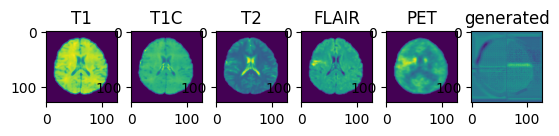

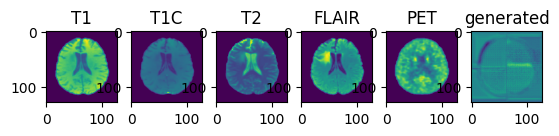

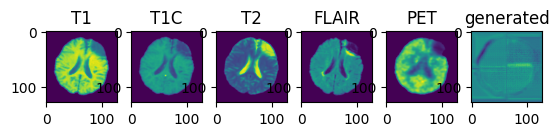

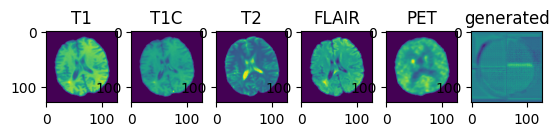

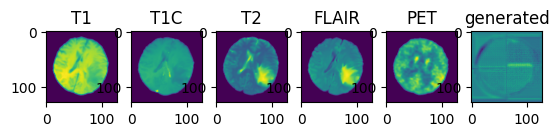

validation avg MS-SSIM: 0.0000 , train avg MS-SSIM: 0.0066
----------
epoch 71/400


Epoch :   0%|                                            | 0/24 [00:00<?, ?it/s]

Epoch :   4%|█▍                                 | 1/24 [01:40<38:33, 100.57s/it]

Epoch :   8%|███                                 | 2/24 [01:43<15:42, 42.84s/it]

Epoch :  12%|████▌                               | 3/24 [01:44<08:26, 24.12s/it]

Epoch :  17%|██████                              | 4/24 [01:47<05:09, 15.46s/it]

Epoch :  21%|███████▌                            | 5/24 [01:48<03:21, 10.59s/it]

Epoch :  25%|█████████                           | 6/24 [01:51<02:18,  7.70s/it]

Epoch :  29%|██████████▌                         | 7/24 [01:53<01:39,  5.83s/it]

Epoch :  33%|████████████                        | 8/24 [01:55<01:13,  4.60s/it]

Epoch :  38%|█████████████▌                      | 9/24 [01:56<00:56,  3.78s/it]

Epoch :  42%|██████████████▌                    | 10/24 [01:59<00:46,  3.30s/it]

Epoch :  46%|████████████████                   | 11/24 [02:01<00:37,  2.90s/it]

Epoch :  50%|█████████████████▌                 | 12/24 [02:03<00:31,  2.67s/it]

Epoch :  54%|██████████████████▉                | 13/24 [02:05<00:26,  2.45s/it]

Epoch :  58%|████████████████████▍              | 14/24 [02:07<00:22,  2.28s/it]

Epoch :  62%|█████████████████████▉             | 15/24 [02:09<00:19,  2.15s/it]

Epoch :  67%|███████████████████████▎           | 16/24 [02:11<00:17,  2.13s/it]

Epoch :  71%|████████████████████████▊          | 17/24 [02:13<00:15,  2.16s/it]

Epoch :  75%|██████████████████████████▎        | 18/24 [02:15<00:12,  2.10s/it]

Epoch :  79%|███████████████████████████▋       | 19/24 [02:17<00:10,  2.05s/it]

Epoch :  83%|█████████████████████████████▏     | 20/24 [02:19<00:08,  2.00s/it]

Epoch :  88%|██████████████████████████████▋    | 21/24 [02:21<00:05,  1.98s/it]

Epoch :  92%|████████████████████████████████   | 22/24 [02:23<00:03,  1.97s/it]

Epoch :  96%|█████████████████████████████████▌ | 23/24 [02:24<00:01,  1.97s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:25<00:00,  1.68s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:29<00:00,  6.22s/it]

----------
epoch 72/400


Epoch :   0%|                                            | 0/24 [00:00<?, ?it/s]

Epoch :   4%|█▍                                 | 1/24 [01:47<41:01, 107.02s/it]

Epoch :   8%|███                                 | 2/24 [01:49<16:39, 45.44s/it]

Epoch :  12%|████▌                               | 3/24 [01:51<08:56, 25.56s/it]

Epoch :  17%|██████                              | 4/24 [01:53<05:24, 16.23s/it]

Epoch :  21%|███████▌                            | 5/24 [01:55<03:31, 11.14s/it]

Epoch :  25%|█████████                           | 6/24 [01:57<02:24,  8.04s/it]

Epoch :  29%|██████████▌                         | 7/24 [01:59<01:42,  6.03s/it]

Epoch :  33%|████████████                        | 8/24 [02:01<01:15,  4.72s/it]

Epoch :  38%|█████████████▌                      | 9/24 [02:03<00:59,  3.94s/it]

Epoch :  42%|██████████████▌                    | 10/24 [02:05<00:46,  3.32s/it]

Epoch :  46%|████████████████                   | 11/24 [02:07<00:37,  2.89s/it]

Epoch :  50%|█████████████████▌                 | 12/24 [02:09<00:30,  2.58s/it]

Epoch :  54%|██████████████████▉                | 13/24 [02:10<00:26,  2.37s/it]

Epoch :  58%|████████████████████▍              | 14/24 [02:12<00:22,  2.22s/it]

Epoch :  62%|█████████████████████▉             | 15/24 [02:14<00:18,  2.11s/it]

Epoch :  67%|███████████████████████▎           | 16/24 [02:16<00:16,  2.05s/it]

Epoch :  71%|████████████████████████▊          | 17/24 [02:18<00:14,  2.08s/it]

Epoch :  75%|██████████████████████████▎        | 18/24 [02:20<00:12,  2.05s/it]

Epoch :  79%|███████████████████████████▋       | 19/24 [02:22<00:10,  2.02s/it]

Epoch :  83%|█████████████████████████████▏     | 20/24 [02:24<00:07,  1.99s/it]

Epoch :  88%|██████████████████████████████▋    | 21/24 [02:26<00:05,  1.97s/it]

Epoch :  92%|████████████████████████████████   | 22/24 [02:28<00:03,  1.98s/it]

Epoch :  96%|█████████████████████████████████▌ | 23/24 [02:30<00:02,  2.01s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:31<00:00,  1.70s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:35<00:00,  6.46s/it]

----------
epoch 73/400


Epoch :   0%|                                            | 0/24 [00:00<?, ?it/s]

Epoch :   4%|█▍                                 | 1/24 [01:46<40:41, 106.17s/it]

Epoch :   8%|███                                 | 2/24 [01:48<16:31, 45.08s/it]

Epoch :  12%|████▌                               | 3/24 [01:50<08:53, 25.38s/it]

Epoch :  17%|██████                              | 4/24 [01:52<05:23, 16.18s/it]

Epoch :  21%|███████▌                            | 5/24 [01:54<03:29, 11.05s/it]

Epoch :  25%|█████████                           | 6/24 [01:56<02:23,  7.98s/it]

Epoch :  29%|██████████▌                         | 7/24 [01:58<01:42,  6.01s/it]

Epoch :  33%|████████████                        | 8/24 [02:00<01:15,  4.72s/it]

Epoch :  38%|█████████████▌                      | 9/24 [02:02<00:59,  3.94s/it]

Epoch :  42%|██████████████▌                    | 10/24 [02:04<00:46,  3.29s/it]

Epoch :  46%|████████████████                   | 11/24 [02:06<00:36,  2.84s/it]

Epoch :  50%|█████████████████▌                 | 12/24 [02:08<00:30,  2.54s/it]

Epoch :  54%|██████████████████▉                | 13/24 [02:10<00:25,  2.35s/it]

Epoch :  58%|████████████████████▍              | 14/24 [02:11<00:21,  2.20s/it]

Epoch :  62%|█████████████████████▉             | 15/24 [02:13<00:19,  2.16s/it]

Epoch :  67%|███████████████████████▎           | 16/24 [02:15<00:16,  2.12s/it]

Epoch :  71%|████████████████████████▊          | 17/24 [02:18<00:15,  2.14s/it]

Epoch :  75%|██████████████████████████▎        | 18/24 [02:20<00:12,  2.06s/it]

Epoch :  79%|███████████████████████████▋       | 19/24 [02:21<00:09,  1.99s/it]

Epoch :  83%|█████████████████████████████▏     | 20/24 [02:23<00:07,  1.98s/it]

Epoch :  88%|██████████████████████████████▋    | 21/24 [02:25<00:05,  1.99s/it]

Epoch :  92%|████████████████████████████████   | 22/24 [02:27<00:03,  1.95s/it]

Epoch :  96%|█████████████████████████████████▌ | 23/24 [02:29<00:01,  1.93s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:30<00:00,  1.67s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:34<00:00,  6.44s/it]

----------
epoch 74/400


Epoch :   0%|                                            | 0/24 [00:00<?, ?it/s]

Epoch :   4%|█▍                                 | 1/24 [01:46<40:51, 106.59s/it]

Epoch :   8%|███                                 | 2/24 [01:49<16:38, 45.40s/it]

Epoch :  12%|████▌                               | 3/24 [01:50<08:55, 25.50s/it]

Epoch :  17%|██████                              | 4/24 [01:52<05:24, 16.21s/it]

Epoch :  21%|███████▌                            | 5/24 [01:54<03:29, 11.05s/it]

Epoch :  25%|█████████                           | 6/24 [01:56<02:23,  7.99s/it]

Epoch :  29%|██████████▌                         | 7/24 [01:58<01:42,  6.06s/it]

Epoch :  33%|████████████                        | 8/24 [02:00<01:16,  4.75s/it]

Epoch :  38%|█████████████▌                      | 9/24 [02:03<01:02,  4.18s/it]

Epoch :  42%|██████████████▌                    | 10/24 [02:05<00:48,  3.47s/it]

Epoch :  46%|████████████████                   | 11/24 [02:07<00:38,  2.98s/it]

Epoch :  50%|█████████████████▌                 | 12/24 [02:09<00:31,  2.65s/it]

Epoch :  54%|██████████████████▉                | 13/24 [02:11<00:26,  2.40s/it]

Epoch :  58%|████████████████████▍              | 14/24 [02:13<00:22,  2.24s/it]

Epoch :  62%|█████████████████████▉             | 15/24 [02:15<00:19,  2.16s/it]

Epoch :  67%|███████████████████████▎           | 16/24 [02:17<00:16,  2.10s/it]

Epoch :  71%|████████████████████████▊          | 17/24 [02:19<00:14,  2.07s/it]

Epoch :  75%|██████████████████████████▎        | 18/24 [02:21<00:12,  2.07s/it]

Epoch :  79%|███████████████████████████▋       | 19/24 [02:23<00:10,  2.01s/it]

Epoch :  83%|█████████████████████████████▏     | 20/24 [02:25<00:08,  2.00s/it]

Epoch :  88%|██████████████████████████████▋    | 21/24 [02:27<00:06,  2.06s/it]

Epoch :  92%|████████████████████████████████   | 22/24 [02:29<00:04,  2.01s/it]

Epoch :  96%|█████████████████████████████████▌ | 23/24 [02:31<00:02,  2.01s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:32<00:00,  1.70s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:35<00:00,  6.49s/it]

----------
epoch 75/400


Epoch :   0%|                                            | 0/24 [00:00<?, ?it/s]

Epoch :   4%|█▍                                 | 1/24 [01:42<39:16, 102.44s/it]

Epoch :   8%|███                                 | 2/24 [01:44<15:56, 43.47s/it]

Epoch :  12%|████▌                               | 3/24 [01:46<08:33, 24.47s/it]

Epoch :  17%|██████                              | 4/24 [01:48<05:10, 15.53s/it]

Epoch :  21%|███████▌                            | 5/24 [01:50<03:21, 10.58s/it]

Epoch :  25%|█████████                           | 6/24 [01:51<02:16,  7.60s/it]

Epoch :  29%|██████████▌                         | 7/24 [01:53<01:37,  5.71s/it]

Epoch :  33%|████████████                        | 8/24 [01:55<01:11,  4.47s/it]

Epoch :  38%|█████████████▌                      | 9/24 [01:57<00:56,  3.75s/it]

Epoch :  42%|██████████████▌                    | 10/24 [01:59<00:44,  3.15s/it]

Epoch :  46%|████████████████                   | 11/24 [02:01<00:35,  2.74s/it]

Epoch :  50%|█████████████████▌                 | 12/24 [02:03<00:29,  2.46s/it]

Epoch :  54%|██████████████████▉                | 13/24 [02:05<00:25,  2.30s/it]

Epoch :  58%|████████████████████▍              | 14/24 [02:06<00:21,  2.15s/it]

Epoch :  62%|█████████████████████▉             | 15/24 [02:08<00:18,  2.05s/it]

Epoch :  67%|███████████████████████▎           | 16/24 [02:10<00:15,  1.99s/it]

Epoch :  71%|████████████████████████▊          | 17/24 [02:12<00:14,  2.00s/it]

Epoch :  75%|██████████████████████████▎        | 18/24 [02:14<00:11,  1.94s/it]

Epoch :  79%|███████████████████████████▋       | 19/24 [02:16<00:09,  1.90s/it]

Epoch :  83%|█████████████████████████████▏     | 20/24 [02:18<00:07,  1.89s/it]

Epoch :  88%|██████████████████████████████▋    | 21/24 [02:19<00:05,  1.88s/it]

Epoch :  92%|████████████████████████████████   | 22/24 [02:21<00:03,  1.86s/it]

Epoch :  96%|█████████████████████████████████▌ | 23/24 [02:23<00:01,  1.85s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:24<00:00,  1.59s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:27<00:00,  6.16s/it]

----------
epoch 76/400


Epoch :   0%|                                            | 0/24 [00:00<?, ?it/s]

Epoch :   4%|█▌                                  | 1/24 [01:36<36:53, 96.23s/it]

Epoch :   8%|███                                 | 2/24 [01:38<14:55, 40.72s/it]

Epoch :  12%|████▌                               | 3/24 [01:39<08:01, 22.95s/it]

Epoch :  17%|██████                              | 4/24 [01:41<04:52, 14.61s/it]

Epoch :  21%|███████▌                            | 5/24 [01:43<03:10, 10.01s/it]

Epoch :  25%|█████████                           | 6/24 [01:45<02:10,  7.25s/it]

Epoch :  29%|██████████▌                         | 7/24 [01:47<01:33,  5.48s/it]

Epoch :  33%|████████████                        | 8/24 [01:49<01:09,  4.32s/it]

Epoch :  38%|█████████████▌                      | 9/24 [01:51<00:56,  3.78s/it]

Epoch :  42%|██████████████▌                    | 10/24 [01:53<00:44,  3.17s/it]

Epoch :  46%|████████████████                   | 11/24 [01:55<00:35,  2.76s/it]

Epoch :  50%|█████████████████▌                 | 12/24 [01:57<00:29,  2.48s/it]

Epoch :  54%|██████████████████▉                | 13/24 [01:59<00:25,  2.28s/it]

Epoch :  58%|████████████████████▍              | 14/24 [02:00<00:21,  2.14s/it]

Epoch :  62%|█████████████████████▉             | 15/24 [02:02<00:18,  2.05s/it]

Epoch :  67%|███████████████████████▎           | 16/24 [02:04<00:15,  1.99s/it]

Epoch :  71%|████████████████████████▊          | 17/24 [02:06<00:14,  2.04s/it]

Epoch :  75%|██████████████████████████▎        | 18/24 [02:08<00:11,  1.98s/it]

Epoch :  79%|███████████████████████████▋       | 19/24 [02:10<00:09,  1.95s/it]

Epoch :  83%|█████████████████████████████▏     | 20/24 [02:12<00:07,  1.92s/it]

Epoch :  88%|██████████████████████████████▋    | 21/24 [02:14<00:05,  1.91s/it]

Epoch :  92%|████████████████████████████████   | 22/24 [02:15<00:03,  1.89s/it]

Epoch :  96%|█████████████████████████████████▌ | 23/24 [02:17<00:01,  1.89s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:18<00:00,  1.62s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:22<00:00,  5.92s/it]

----------
epoch 77/400


Epoch :   0%|                                            | 0/24 [00:00<?, ?it/s]

Epoch :   4%|█▌                                  | 1/24 [01:30<34:33, 90.15s/it]

Epoch :   8%|███                                 | 2/24 [01:32<14:00, 38.21s/it]

Epoch :  12%|████▌                               | 3/24 [01:33<07:34, 21.63s/it]

Epoch :  17%|██████                              | 4/24 [01:35<04:36, 13.80s/it]

Epoch :  21%|███████▌                            | 5/24 [01:37<03:00,  9.48s/it]

Epoch :  25%|█████████                           | 6/24 [01:39<02:03,  6.87s/it]

Epoch :  29%|██████████▌                         | 7/24 [01:41<01:28,  5.21s/it]

Epoch :  33%|████████████                        | 8/24 [01:42<01:06,  4.14s/it]

Epoch :  38%|█████████████▌                      | 9/24 [01:45<00:54,  3.63s/it]

Epoch :  42%|██████████████▌                    | 10/24 [01:47<00:42,  3.06s/it]

Epoch :  46%|████████████████                   | 11/24 [01:49<00:34,  2.68s/it]

Epoch :  50%|█████████████████▌                 | 12/24 [01:50<00:28,  2.41s/it]

Epoch :  54%|██████████████████▉                | 13/24 [01:52<00:24,  2.23s/it]

Epoch :  58%|████████████████████▍              | 14/24 [01:54<00:21,  2.10s/it]

Epoch :  62%|█████████████████████▉             | 15/24 [01:56<00:18,  2.01s/it]

Epoch :  67%|███████████████████████▎           | 16/24 [01:58<00:15,  1.95s/it]

Epoch :  71%|████████████████████████▊          | 17/24 [01:59<00:13,  1.93s/it]

Epoch :  75%|██████████████████████████▎        | 18/24 [02:01<00:11,  1.90s/it]

Epoch :  79%|███████████████████████████▋       | 19/24 [02:03<00:09,  1.88s/it]

Epoch :  83%|█████████████████████████████▏     | 20/24 [02:05<00:07,  1.88s/it]

Epoch :  88%|██████████████████████████████▋    | 21/24 [02:07<00:05,  1.88s/it]

Epoch :  92%|████████████████████████████████   | 22/24 [02:09<00:03,  1.87s/it]

Epoch :  96%|█████████████████████████████████▌ | 23/24 [02:11<00:01,  1.85s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:12<00:00,  1.59s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:15<00:00,  5.63s/it]

----------
epoch 78/400


Epoch :   0%|                                            | 0/24 [00:00<?, ?it/s]

Epoch :   4%|█▌                                  | 1/24 [01:35<36:34, 95.41s/it]

Epoch :   8%|███                                 | 2/24 [01:37<14:48, 40.38s/it]

Epoch :  12%|████▌                               | 3/24 [01:39<07:58, 22.78s/it]

Epoch :  17%|██████                              | 4/24 [01:40<04:49, 14.50s/it]

Epoch :  21%|███████▌                            | 5/24 [01:42<03:08,  9.93s/it]

Epoch :  25%|█████████                           | 6/24 [01:44<02:09,  7.19s/it]

Epoch :  29%|██████████▌                         | 7/24 [01:46<01:32,  5.44s/it]

Epoch :  33%|████████████                        | 8/24 [01:48<01:08,  4.29s/it]

Epoch :  38%|█████████████▌                      | 9/24 [01:50<00:54,  3.62s/it]

Epoch :  42%|██████████████▌                    | 10/24 [01:52<00:42,  3.06s/it]

Epoch :  46%|████████████████                   | 11/24 [01:54<00:34,  2.67s/it]

Epoch :  50%|█████████████████▌                 | 12/24 [01:55<00:28,  2.41s/it]

Epoch :  54%|██████████████████▉                | 13/24 [01:57<00:24,  2.23s/it]

Epoch :  58%|████████████████████▍              | 14/24 [01:59<00:21,  2.11s/it]

Epoch :  62%|█████████████████████▉             | 15/24 [02:01<00:18,  2.03s/it]

Epoch :  67%|███████████████████████▎           | 16/24 [02:03<00:15,  1.98s/it]

Epoch :  71%|████████████████████████▊          | 17/24 [02:05<00:14,  2.04s/it]

Epoch :  75%|██████████████████████████▎        | 18/24 [02:07<00:11,  2.00s/it]

Epoch :  79%|███████████████████████████▋       | 19/24 [02:09<00:09,  1.96s/it]

Epoch :  83%|█████████████████████████████▏     | 20/24 [02:11<00:07,  1.93s/it]

Epoch :  88%|██████████████████████████████▋    | 21/24 [02:12<00:05,  1.89s/it]

Epoch :  92%|████████████████████████████████   | 22/24 [02:14<00:03,  1.88s/it]

Epoch :  96%|█████████████████████████████████▌ | 23/24 [02:16<00:01,  1.88s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:17<00:00,  1.61s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:20<00:00,  5.86s/it]

----------
epoch 79/400


Epoch :   0%|                                            | 0/24 [00:00<?, ?it/s]

Epoch :   4%|█▌                                  | 1/24 [01:36<36:56, 96.36s/it]

Epoch :   8%|███                                 | 2/24 [01:38<14:57, 40.78s/it]

Epoch :  12%|████▌                               | 3/24 [01:40<08:03, 23.02s/it]

Epoch :  17%|██████                              | 4/24 [01:42<04:54, 14.70s/it]

Epoch :  21%|███████▌                            | 5/24 [01:44<03:12, 10.13s/it]

Epoch :  25%|█████████                           | 6/24 [01:46<02:12,  7.35s/it]

Epoch :  29%|██████████▌                         | 7/24 [01:47<01:34,  5.55s/it]

Epoch :  33%|████████████                        | 8/24 [01:50<01:11,  4.48s/it]

Epoch :  38%|█████████████▌                      | 9/24 [01:51<00:55,  3.67s/it]

Epoch :  42%|██████████████▌                    | 10/24 [01:53<00:43,  3.11s/it]

Epoch :  46%|████████████████                   | 11/24 [01:55<00:35,  2.74s/it]

Epoch :  50%|█████████████████▌                 | 12/24 [01:57<00:29,  2.48s/it]

Epoch :  54%|██████████████████▉                | 13/24 [01:59<00:25,  2.29s/it]

Epoch :  58%|████████████████████▍              | 14/24 [02:01<00:21,  2.18s/it]

Epoch :  62%|█████████████████████▉             | 15/24 [02:03<00:18,  2.10s/it]

Epoch :  67%|███████████████████████▎           | 16/24 [02:05<00:17,  2.14s/it]

Epoch :  71%|████████████████████████▊          | 17/24 [02:07<00:14,  2.07s/it]

Epoch :  75%|██████████████████████████▎        | 18/24 [02:09<00:12,  2.01s/it]

Epoch :  79%|███████████████████████████▋       | 19/24 [02:11<00:09,  1.96s/it]

Epoch :  83%|█████████████████████████████▏     | 20/24 [02:13<00:07,  1.94s/it]

Epoch :  88%|██████████████████████████████▋    | 21/24 [02:14<00:05,  1.92s/it]

Epoch :  92%|████████████████████████████████   | 22/24 [02:16<00:03,  1.92s/it]

Epoch :  96%|█████████████████████████████████▌ | 23/24 [02:18<00:01,  1.93s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:19<00:00,  1.67s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:23<00:00,  5.96s/it]

----------
epoch 80/400


Epoch :   0%|                                            | 0/24 [00:00<?, ?it/s]

Epoch :   4%|█▍                                 | 1/24 [01:51<42:52, 111.85s/it]

Epoch :   8%|███                                 | 2/24 [01:53<17:19, 47.24s/it]

Epoch :  12%|████▌                               | 3/24 [01:55<09:17, 26.55s/it]

Epoch :  17%|██████                              | 4/24 [01:57<05:37, 16.87s/it]

Epoch :  21%|███████▌                            | 5/24 [02:00<03:41, 11.64s/it]

Epoch :  25%|█████████                           | 6/24 [02:02<02:33,  8.52s/it]

Epoch :  29%|██████████▌                         | 7/24 [02:04<01:47,  6.34s/it]

Epoch :  33%|████████████                        | 8/24 [02:06<01:18,  4.92s/it]

Epoch :  38%|█████████████▌                      | 9/24 [02:08<00:59,  3.96s/it]

Epoch :  42%|██████████████▌                    | 10/24 [02:10<00:46,  3.33s/it]

Epoch :  46%|████████████████                   | 11/24 [02:12<00:38,  2.94s/it]

Epoch :  50%|█████████████████▌                 | 12/24 [02:14<00:32,  2.71s/it]

Epoch :  54%|██████████████████▉                | 13/24 [02:16<00:28,  2.58s/it]

Epoch :  58%|████████████████████▍              | 14/24 [02:18<00:24,  2.45s/it]

Epoch :  62%|█████████████████████▉             | 15/24 [02:20<00:21,  2.34s/it]

Epoch :  67%|███████████████████████▎           | 16/24 [02:23<00:18,  2.33s/it]

Epoch :  71%|████████████████████████▊          | 17/24 [02:25<00:16,  2.35s/it]

Epoch :  75%|██████████████████████████▎        | 18/24 [02:27<00:13,  2.27s/it]

Epoch :  79%|███████████████████████████▋       | 19/24 [02:29<00:10,  2.19s/it]

Epoch :  83%|█████████████████████████████▏     | 20/24 [02:31<00:08,  2.19s/it]

Epoch :  88%|██████████████████████████████▋    | 21/24 [02:34<00:06,  2.24s/it]

Epoch :  92%|████████████████████████████████   | 22/24 [02:36<00:04,  2.25s/it]

Epoch :  96%|█████████████████████████████████▌ | 23/24 [02:38<00:02,  2.19s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:39<00:00,  1.86s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:43<00:00,  6.82s/it]

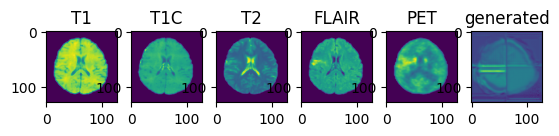

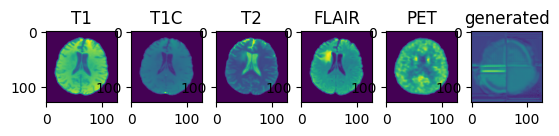

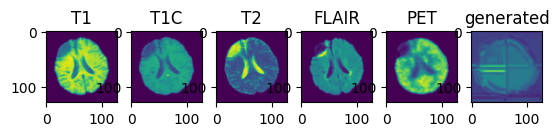

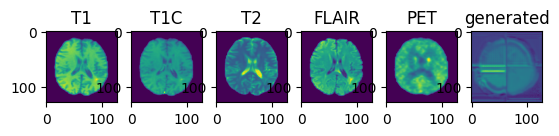

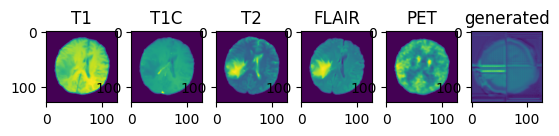

validation avg MS-SSIM: 0.3409 , train avg MS-SSIM: 0.3287
----------
epoch 81/400


Epoch :   0%|                                            | 0/24 [00:00<?, ?it/s]

Epoch :   4%|█▍                                 | 1/24 [01:52<42:59, 112.16s/it]

Epoch :   8%|███                                 | 2/24 [01:54<17:21, 47.36s/it]

Epoch :  12%|████▌                               | 3/24 [01:56<09:24, 26.89s/it]

Epoch :  17%|██████                              | 4/24 [01:58<05:41, 17.07s/it]

Epoch :  21%|███████▌                            | 5/24 [02:01<03:43, 11.79s/it]

Epoch :  25%|█████████                           | 6/24 [02:03<02:34,  8.60s/it]

Epoch :  29%|██████████▌                         | 7/24 [02:05<01:49,  6.43s/it]

Epoch :  33%|████████████                        | 8/24 [02:07<01:21,  5.07s/it]

Epoch :  38%|█████████████▌                      | 9/24 [02:09<01:03,  4.21s/it]

Epoch :  42%|██████████████▌                    | 10/24 [02:12<00:49,  3.56s/it]

Epoch :  46%|████████████████                   | 11/24 [02:14<00:41,  3.17s/it]

Epoch :  50%|█████████████████▌                 | 12/24 [02:16<00:33,  2.80s/it]

Epoch :  54%|██████████████████▉                | 13/24 [02:18<00:27,  2.54s/it]

Epoch :  58%|████████████████████▍              | 14/24 [02:20<00:24,  2.40s/it]

Epoch :  62%|█████████████████████▉             | 15/24 [02:22<00:20,  2.25s/it]

Epoch :  67%|███████████████████████▎           | 16/24 [02:24<00:17,  2.20s/it]

Epoch :  71%|████████████████████████▊          | 17/24 [02:26<00:15,  2.14s/it]

Epoch :  75%|██████████████████████████▎        | 18/24 [02:28<00:12,  2.15s/it]

Epoch :  79%|███████████████████████████▋       | 19/24 [02:30<00:10,  2.08s/it]

Epoch :  83%|█████████████████████████████▏     | 20/24 [02:32<00:08,  2.09s/it]

Epoch :  88%|██████████████████████████████▋    | 21/24 [02:34<00:06,  2.12s/it]

Epoch :  92%|████████████████████████████████   | 22/24 [02:37<00:04,  2.19s/it]

Epoch :  96%|█████████████████████████████████▌ | 23/24 [02:39<00:02,  2.20s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:40<00:00,  1.87s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:43<00:00,  6.83s/it]

----------
epoch 82/400


Epoch :   0%|                                            | 0/24 [00:00<?, ?it/s]

Epoch :   4%|█▍                                 | 1/24 [02:04<47:39, 124.33s/it]

Epoch :   8%|███                                 | 2/24 [02:06<19:15, 52.50s/it]

Epoch :  12%|████▌                               | 3/24 [02:09<10:22, 29.66s/it]

Epoch :  17%|██████                              | 4/24 [02:11<06:17, 18.86s/it]

Epoch :  21%|███████▌                            | 5/24 [02:14<04:07, 13.05s/it]

Epoch :  25%|█████████                           | 6/24 [02:16<02:48,  9.36s/it]

Epoch :  29%|██████████▌                         | 7/24 [02:18<01:58,  6.99s/it]

Epoch :  33%|████████████                        | 8/24 [02:20<01:26,  5.38s/it]

Epoch :  38%|█████████████▌                      | 9/24 [02:22<01:04,  4.30s/it]

Epoch :  42%|██████████████▌                    | 10/24 [02:24<00:51,  3.66s/it]

Epoch :  46%|████████████████                   | 11/24 [02:26<00:42,  3.28s/it]

Epoch :  50%|█████████████████▌                 | 12/24 [02:29<00:35,  2.93s/it]

Epoch :  54%|██████████████████▉                | 13/24 [02:31<00:29,  2.67s/it]

Epoch :  58%|████████████████████▍              | 14/24 [02:33<00:25,  2.53s/it]

Epoch :  62%|█████████████████████▉             | 15/24 [02:35<00:21,  2.43s/it]

Epoch :  67%|███████████████████████▎           | 16/24 [02:37<00:18,  2.32s/it]

Epoch :  71%|████████████████████████▊          | 17/24 [02:39<00:15,  2.22s/it]

Epoch :  75%|██████████████████████████▎        | 18/24 [02:41<00:13,  2.22s/it]

Epoch :  79%|███████████████████████████▋       | 19/24 [02:44<00:12,  2.41s/it]

Epoch :  83%|█████████████████████████████▏     | 20/24 [02:46<00:09,  2.30s/it]

Epoch :  88%|██████████████████████████████▋    | 21/24 [02:48<00:06,  2.22s/it]

Epoch :  92%|████████████████████████████████   | 22/24 [02:51<00:04,  2.25s/it]

Epoch :  96%|█████████████████████████████████▌ | 23/24 [02:53<00:02,  2.18s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:54<00:00,  1.84s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:58<00:00,  7.42s/it]

----------
epoch 83/400


Epoch :   0%|                                            | 0/24 [00:00<?, ?it/s]

Epoch :   4%|█▍                                 | 1/24 [01:58<45:26, 118.52s/it]

Epoch :   8%|███                                 | 2/24 [02:00<18:19, 49.95s/it]

Epoch :  12%|████▌                               | 3/24 [02:02<09:53, 28.25s/it]

Epoch :  17%|██████                              | 4/24 [02:05<05:58, 17.94s/it]

Epoch :  21%|███████▌                            | 5/24 [02:07<03:51, 12.20s/it]

Epoch :  25%|█████████                           | 6/24 [02:09<02:39,  8.84s/it]

Epoch :  29%|██████████▌                         | 7/24 [02:11<01:54,  6.72s/it]

Epoch :  33%|████████████                        | 8/24 [02:13<01:23,  5.21s/it]

Epoch :  38%|█████████████▌                      | 9/24 [02:15<01:02,  4.19s/it]

Epoch :  42%|██████████████▌                    | 10/24 [02:17<00:48,  3.50s/it]

Epoch :  46%|████████████████                   | 11/24 [02:20<00:41,  3.21s/it]

Epoch :  50%|█████████████████▌                 | 12/24 [02:22<00:33,  2.83s/it]

Epoch :  54%|██████████████████▉                | 13/24 [02:24<00:28,  2.58s/it]

Epoch :  58%|████████████████████▍              | 14/24 [02:26<00:23,  2.40s/it]

Epoch :  62%|█████████████████████▉             | 15/24 [02:28<00:21,  2.44s/it]

Epoch :  67%|███████████████████████▎           | 16/24 [02:30<00:19,  2.38s/it]

Epoch :  71%|████████████████████████▊          | 17/24 [02:32<00:16,  2.30s/it]

Epoch :  75%|██████████████████████████▎        | 18/24 [02:35<00:13,  2.28s/it]

Epoch :  79%|███████████████████████████▋       | 19/24 [02:37<00:11,  2.38s/it]

Epoch :  83%|█████████████████████████████▏     | 20/24 [02:40<00:09,  2.32s/it]

Epoch :  88%|██████████████████████████████▋    | 21/24 [02:42<00:06,  2.27s/it]

Epoch :  92%|████████████████████████████████   | 22/24 [02:44<00:04,  2.21s/it]

Epoch :  96%|█████████████████████████████████▌ | 23/24 [02:46<00:02,  2.14s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:47<00:00,  1.84s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:51<00:00,  7.13s/it]

----------
epoch 84/400


Epoch :   0%|                                            | 0/24 [00:00<?, ?it/s]

Epoch :   4%|█▍                                 | 1/24 [02:01<46:45, 121.98s/it]

Epoch :   8%|███                                 | 2/24 [02:03<18:50, 51.38s/it]

Epoch :  12%|████▌                               | 3/24 [02:06<10:10, 29.09s/it]

Epoch :  17%|██████                              | 4/24 [02:08<06:08, 18.44s/it]

Epoch :  21%|███████▌                            | 5/24 [02:11<04:00, 12.65s/it]

Epoch :  25%|█████████                           | 6/24 [02:13<02:43,  9.07s/it]

Epoch :  29%|██████████▌                         | 7/24 [02:15<01:55,  6.82s/it]

Epoch :  33%|████████████                        | 8/24 [02:17<01:26,  5.39s/it]

Epoch :  38%|█████████████▌                      | 9/24 [02:19<01:05,  4.39s/it]

Epoch :  42%|██████████████▌                    | 10/24 [02:22<00:52,  3.73s/it]

Epoch :  46%|████████████████                   | 11/24 [02:24<00:44,  3.40s/it]

Epoch :  50%|█████████████████▌                 | 12/24 [02:27<00:37,  3.10s/it]

Epoch :  54%|██████████████████▉                | 13/24 [02:29<00:30,  2.79s/it]

Epoch :  58%|████████████████████▍              | 14/24 [02:31<00:25,  2.52s/it]

Epoch :  62%|█████████████████████▉             | 15/24 [02:33<00:20,  2.33s/it]

Epoch :  67%|███████████████████████▎           | 16/24 [02:34<00:17,  2.20s/it]

Epoch :  71%|████████████████████████▊          | 17/24 [02:36<00:14,  2.14s/it]

Epoch :  75%|██████████████████████████▎        | 18/24 [02:39<00:12,  2.13s/it]

Epoch :  79%|███████████████████████████▋       | 19/24 [02:41<00:10,  2.15s/it]

Epoch :  83%|█████████████████████████████▏     | 20/24 [02:43<00:09,  2.32s/it]

Epoch :  88%|██████████████████████████████▋    | 21/24 [02:45<00:06,  2.23s/it]

Epoch :  92%|████████████████████████████████   | 22/24 [02:47<00:04,  2.14s/it]

Epoch :  96%|█████████████████████████████████▌ | 23/24 [02:50<00:02,  2.15s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:51<00:00,  1.85s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:55<00:00,  7.30s/it]

----------
epoch 85/400


Epoch :   0%|                                            | 0/24 [00:00<?, ?it/s]

Epoch :   4%|█▍                                 | 1/24 [02:00<46:19, 120.83s/it]

Epoch :   8%|███                                 | 2/24 [02:02<18:40, 50.94s/it]

Epoch :  12%|████▌                               | 3/24 [02:04<10:00, 28.59s/it]

Epoch :  17%|██████                              | 4/24 [02:07<06:08, 18.41s/it]

Epoch :  21%|███████▌                            | 5/24 [02:09<03:59, 12.60s/it]

Epoch :  25%|█████████                           | 6/24 [02:12<02:45,  9.20s/it]

Epoch :  29%|██████████▌                         | 7/24 [02:14<01:57,  6.91s/it]

Epoch :  33%|████████████                        | 8/24 [02:16<01:26,  5.41s/it]

Epoch :  38%|█████████████▌                      | 9/24 [02:19<01:06,  4.42s/it]

Epoch :  42%|██████████████▌                    | 10/24 [02:21<00:52,  3.72s/it]

Epoch :  46%|████████████████                   | 11/24 [02:24<00:44,  3.41s/it]

Epoch :  50%|█████████████████▌                 | 12/24 [02:26<00:37,  3.13s/it]

Epoch :  54%|██████████████████▉                | 13/24 [02:29<00:32,  2.94s/it]

Epoch :  58%|████████████████████▍              | 14/24 [02:31<00:26,  2.67s/it]

Epoch :  62%|█████████████████████▉             | 15/24 [02:32<00:21,  2.42s/it]

Epoch :  67%|███████████████████████▎           | 16/24 [02:35<00:18,  2.34s/it]

Epoch :  71%|████████████████████████▊          | 17/24 [02:37<00:15,  2.28s/it]

Epoch :  75%|██████████████████████████▎        | 18/24 [02:39<00:13,  2.22s/it]

Epoch :  79%|███████████████████████████▋       | 19/24 [02:41<00:11,  2.25s/it]

Epoch :  83%|█████████████████████████████▏     | 20/24 [02:43<00:09,  2.28s/it]

Epoch :  88%|██████████████████████████████▋    | 21/24 [02:46<00:06,  2.24s/it]

Epoch :  92%|████████████████████████████████   | 22/24 [02:48<00:04,  2.17s/it]

Epoch :  96%|█████████████████████████████████▌ | 23/24 [02:50<00:02,  2.16s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:51<00:00,  1.84s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:55<00:00,  7.31s/it]

----------
epoch 86/400


Epoch :   0%|                                            | 0/24 [00:00<?, ?it/s]

Epoch :   4%|█▍                                 | 1/24 [01:57<44:53, 117.09s/it]

Epoch :   8%|███                                 | 2/24 [01:59<18:10, 49.56s/it]

Epoch :  12%|████▌                               | 3/24 [02:01<09:46, 27.95s/it]

Epoch :  17%|██████                              | 4/24 [02:04<05:58, 17.93s/it]

Epoch :  21%|███████▌                            | 5/24 [02:06<03:54, 12.32s/it]

Epoch :  25%|█████████                           | 6/24 [02:08<02:38,  8.83s/it]

Epoch :  29%|██████████▌                         | 7/24 [02:10<01:52,  6.64s/it]

Epoch :  33%|████████████                        | 8/24 [02:13<01:24,  5.27s/it]

Epoch :  38%|█████████████▌                      | 9/24 [02:15<01:04,  4.28s/it]

Epoch :  42%|██████████████▌                    | 10/24 [02:17<00:50,  3.61s/it]

Epoch :  46%|████████████████                   | 11/24 [02:19<00:40,  3.14s/it]

Epoch :  50%|█████████████████▌                 | 12/24 [02:21<00:35,  2.98s/it]

Epoch :  54%|██████████████████▉                | 13/24 [02:24<00:30,  2.78s/it]

Epoch :  58%|████████████████████▍              | 14/24 [02:26<00:25,  2.55s/it]

Epoch :  62%|█████████████████████▉             | 15/24 [02:28<00:21,  2.38s/it]

Epoch :  67%|███████████████████████▎           | 16/24 [02:30<00:18,  2.27s/it]

Epoch :  71%|████████████████████████▊          | 17/24 [02:32<00:15,  2.22s/it]

Epoch :  75%|██████████████████████████▎        | 18/24 [02:34<00:13,  2.33s/it]

Epoch :  79%|███████████████████████████▋       | 19/24 [02:37<00:12,  2.43s/it]

Epoch :  83%|█████████████████████████████▏     | 20/24 [02:39<00:09,  2.36s/it]

Epoch :  88%|██████████████████████████████▋    | 21/24 [02:42<00:07,  2.34s/it]

Epoch :  92%|████████████████████████████████   | 22/24 [02:44<00:04,  2.29s/it]

Epoch :  96%|█████████████████████████████████▌ | 23/24 [02:46<00:02,  2.28s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:47<00:00,  1.90s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:51<00:00,  7.15s/it]

----------
epoch 87/400


Epoch :   0%|                                            | 0/24 [00:00<?, ?it/s]

Epoch :   4%|█▍                                 | 1/24 [01:54<44:04, 114.96s/it]

Epoch :   8%|███                                 | 2/24 [01:56<17:47, 48.50s/it]

Epoch :  12%|████▌                               | 3/24 [01:59<09:41, 27.70s/it]

Epoch :  17%|██████                              | 4/24 [02:02<05:52, 17.65s/it]

Epoch :  21%|███████▌                            | 5/24 [02:04<03:48, 12.03s/it]

Epoch :  25%|█████████                           | 6/24 [02:06<02:34,  8.58s/it]

Epoch :  29%|██████████▌                         | 7/24 [02:07<01:48,  6.39s/it]

Epoch :  33%|████████████                        | 8/24 [02:09<01:19,  4.95s/it]

Epoch :  38%|█████████████▌                      | 9/24 [02:11<00:59,  3.99s/it]

Epoch :  42%|██████████████▌                    | 10/24 [02:13<00:46,  3.31s/it]

Epoch :  46%|████████████████                   | 11/24 [02:15<00:38,  2.96s/it]

Epoch :  50%|█████████████████▌                 | 12/24 [02:17<00:31,  2.62s/it]

Epoch :  54%|██████████████████▉                | 13/24 [02:19<00:26,  2.38s/it]

Epoch :  58%|████████████████████▍              | 14/24 [02:21<00:22,  2.23s/it]

Epoch :  62%|█████████████████████▉             | 15/24 [02:23<00:19,  2.15s/it]

Epoch :  67%|███████████████████████▎           | 16/24 [02:25<00:16,  2.10s/it]

Epoch :  71%|████████████████████████▊          | 17/24 [02:27<00:14,  2.03s/it]

Epoch :  75%|██████████████████████████▎        | 18/24 [02:28<00:11,  1.96s/it]

Epoch :  79%|███████████████████████████▋       | 19/24 [02:30<00:10,  2.00s/it]

Epoch :  83%|█████████████████████████████▏     | 20/24 [02:32<00:07,  1.99s/it]

Epoch :  88%|██████████████████████████████▋    | 21/24 [02:35<00:06,  2.03s/it]

Epoch :  92%|████████████████████████████████   | 22/24 [02:36<00:04,  2.01s/it]

Epoch :  96%|█████████████████████████████████▌ | 23/24 [02:38<00:01,  1.98s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:39<00:00,  1.68s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:43<00:00,  6.82s/it]

----------
epoch 88/400


Epoch :   0%|                                            | 0/24 [00:00<?, ?it/s]

Epoch :   4%|█▍                                 | 1/24 [01:56<44:34, 116.30s/it]

Epoch :   8%|███                                 | 2/24 [01:58<17:57, 48.99s/it]

Epoch :  12%|████▌                               | 3/24 [02:00<09:40, 27.64s/it]

Epoch :  17%|██████                              | 4/24 [02:02<05:49, 17.45s/it]

Epoch :  21%|███████▌                            | 5/24 [02:04<03:46, 11.90s/it]

Epoch :  25%|█████████                           | 6/24 [02:06<02:33,  8.54s/it]

Epoch :  29%|██████████▌                         | 7/24 [02:08<01:49,  6.41s/it]

Epoch :  33%|████████████                        | 8/24 [02:10<01:21,  5.09s/it]

Epoch :  38%|█████████████▌                      | 9/24 [02:13<01:04,  4.28s/it]

Epoch :  42%|██████████████▌                    | 10/24 [02:15<00:49,  3.56s/it]

Epoch :  46%|████████████████                   | 11/24 [02:17<00:43,  3.33s/it]

Epoch :  50%|█████████████████▌                 | 12/24 [02:20<00:36,  3.02s/it]

Epoch :  54%|██████████████████▉                | 13/24 [02:22<00:29,  2.72s/it]

Epoch :  58%|████████████████████▍              | 14/24 [02:24<00:25,  2.50s/it]

Epoch :  62%|█████████████████████▉             | 15/24 [02:26<00:21,  2.40s/it]

Epoch :  67%|███████████████████████▎           | 16/24 [02:28<00:18,  2.26s/it]

Epoch :  71%|████████████████████████▊          | 17/24 [02:30<00:15,  2.19s/it]

Epoch :  75%|██████████████████████████▎        | 18/24 [02:32<00:12,  2.11s/it]

Epoch :  79%|███████████████████████████▋       | 19/24 [02:34<00:11,  2.23s/it]

Epoch :  83%|█████████████████████████████▏     | 20/24 [02:36<00:08,  2.19s/it]

Epoch :  88%|██████████████████████████████▋    | 21/24 [02:39<00:06,  2.18s/it]

Epoch :  92%|████████████████████████████████   | 22/24 [02:41<00:04,  2.14s/it]

Epoch :  96%|█████████████████████████████████▌ | 23/24 [02:42<00:02,  2.06s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:43<00:00,  1.75s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:48<00:00,  7.00s/it]

----------
epoch 89/400


Epoch :   0%|                                            | 0/24 [00:00<?, ?it/s]

Epoch :   4%|█▍                                 | 1/24 [02:03<47:22, 123.59s/it]

Epoch :   8%|███                                 | 2/24 [02:05<19:09, 52.25s/it]

Epoch :  12%|████▌                               | 3/24 [02:08<10:18, 29.43s/it]

Epoch :  17%|██████                              | 4/24 [02:10<06:17, 18.86s/it]

Epoch :  21%|███████▌                            | 5/24 [02:13<04:04, 12.86s/it]

Epoch :  25%|█████████                           | 6/24 [02:15<02:45,  9.18s/it]

Epoch :  29%|██████████▌                         | 7/24 [02:17<01:56,  6.84s/it]

Epoch :  33%|████████████                        | 8/24 [02:19<01:24,  5.28s/it]

Epoch :  38%|█████████████▌                      | 9/24 [02:21<01:03,  4.27s/it]

Epoch :  42%|██████████████▌                    | 10/24 [02:22<00:49,  3.52s/it]

Epoch :  46%|████████████████                   | 11/24 [02:25<00:42,  3.26s/it]

Epoch :  50%|█████████████████▌                 | 12/24 [02:27<00:35,  2.96s/it]

Epoch :  54%|██████████████████▉                | 13/24 [02:30<00:30,  2.76s/it]

Epoch :  58%|████████████████████▍              | 14/24 [02:32<00:26,  2.64s/it]

Epoch :  62%|█████████████████████▉             | 15/24 [02:34<00:22,  2.50s/it]

Epoch :  67%|███████████████████████▎           | 16/24 [02:36<00:19,  2.39s/it]

Epoch :  71%|████████████████████████▊          | 17/24 [02:39<00:16,  2.32s/it]

Epoch :  75%|██████████████████████████▎        | 18/24 [02:41<00:14,  2.34s/it]

Epoch :  79%|███████████████████████████▋       | 19/24 [02:44<00:12,  2.43s/it]

Epoch :  83%|█████████████████████████████▏     | 20/24 [02:46<00:09,  2.33s/it]

Epoch :  88%|██████████████████████████████▋    | 21/24 [02:48<00:06,  2.29s/it]

Epoch :  92%|████████████████████████████████   | 22/24 [02:50<00:04,  2.18s/it]

Epoch :  96%|█████████████████████████████████▌ | 23/24 [02:52<00:02,  2.14s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:53<00:00,  1.80s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:57<00:00,  7.38s/it]

----------
epoch 90/400


Epoch :   0%|                                            | 0/24 [00:00<?, ?it/s]

Epoch :   4%|█▍                                 | 1/24 [01:58<45:17, 118.17s/it]

Epoch :   8%|███                                 | 2/24 [02:00<18:14, 49.74s/it]

Epoch :  12%|████▌                               | 3/24 [02:02<09:50, 28.13s/it]

Epoch :  17%|██████                              | 4/24 [02:04<05:56, 17.82s/it]

Epoch :  21%|███████▌                            | 5/24 [02:06<03:51, 12.16s/it]

Epoch :  25%|█████████                           | 6/24 [02:08<02:36,  8.70s/it]

Epoch :  29%|██████████▌                         | 7/24 [02:10<01:51,  6.54s/it]

Epoch :  33%|████████████                        | 8/24 [02:12<01:22,  5.18s/it]

Epoch :  38%|█████████████▌                      | 9/24 [02:14<01:02,  4.15s/it]

Epoch :  42%|██████████████▌                    | 10/24 [02:17<00:50,  3.57s/it]

Epoch :  46%|████████████████                   | 11/24 [02:19<00:42,  3.28s/it]

Epoch :  50%|█████████████████▌                 | 12/24 [02:21<00:35,  2.98s/it]

Epoch :  54%|██████████████████▉                | 13/24 [02:24<00:30,  2.77s/it]

Epoch :  58%|████████████████████▍              | 14/24 [02:26<00:26,  2.67s/it]

Epoch :  62%|█████████████████████▉             | 15/24 [02:28<00:22,  2.50s/it]

Epoch :  67%|███████████████████████▎           | 16/24 [02:31<00:19,  2.48s/it]

Epoch :  71%|████████████████████████▊          | 17/24 [02:33<00:16,  2.38s/it]

Epoch :  75%|██████████████████████████▎        | 18/24 [02:35<00:13,  2.30s/it]

Epoch :  79%|███████████████████████████▋       | 19/24 [02:37<00:11,  2.20s/it]

Epoch :  83%|█████████████████████████████▏     | 20/24 [02:39<00:08,  2.23s/it]

Epoch :  88%|██████████████████████████████▋    | 21/24 [02:41<00:06,  2.15s/it]

Epoch :  92%|████████████████████████████████   | 22/24 [02:43<00:04,  2.18s/it]

Epoch :  96%|█████████████████████████████████▌ | 23/24 [02:46<00:02,  2.15s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:47<00:00,  1.92s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:51<00:00,  7.14s/it]

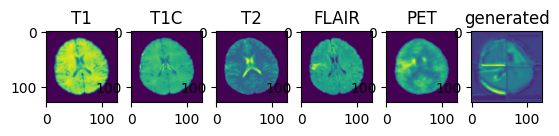

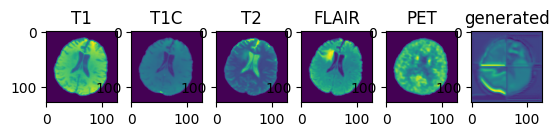

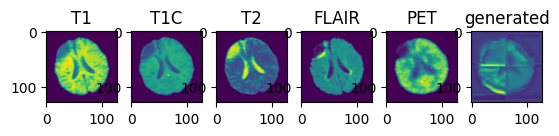

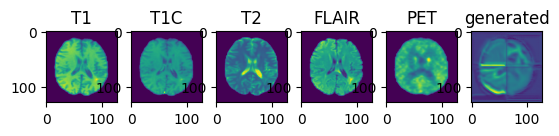

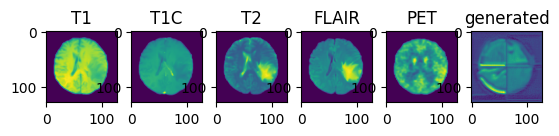

validation avg MS-SSIM: 0.4056 , train avg MS-SSIM: 0.4002
----------
epoch 91/400


Epoch :   0%|                                            | 0/24 [00:00<?, ?it/s]

Epoch :   4%|█▍                                 | 1/24 [01:56<44:37, 116.40s/it]

Epoch :   8%|███                                 | 2/24 [01:58<17:57, 48.99s/it]

Epoch :  12%|████▌                               | 3/24 [02:00<09:36, 27.46s/it]

Epoch :  17%|██████                              | 4/24 [02:01<05:46, 17.33s/it]

Epoch :  21%|███████▌                            | 5/24 [02:03<03:42, 11.73s/it]

Epoch :  25%|█████████                           | 6/24 [02:05<02:32,  8.47s/it]

Epoch :  29%|██████████▌                         | 7/24 [02:07<01:47,  6.32s/it]

Epoch :  33%|████████████                        | 8/24 [02:09<01:18,  4.88s/it]

Epoch :  38%|█████████████▌                      | 9/24 [02:11<00:58,  3.92s/it]

Epoch :  42%|██████████████▌                    | 10/24 [02:13<00:45,  3.27s/it]

Epoch :  46%|████████████████                   | 11/24 [02:14<00:36,  2.82s/it]

Epoch :  50%|█████████████████▌                 | 12/24 [02:16<00:30,  2.51s/it]

Epoch :  54%|██████████████████▉                | 13/24 [02:18<00:26,  2.37s/it]

Epoch :  58%|████████████████████▍              | 14/24 [02:20<00:22,  2.20s/it]

Epoch :  62%|█████████████████████▉             | 15/24 [02:22<00:18,  2.09s/it]

Epoch :  67%|███████████████████████▎           | 16/24 [02:24<00:16,  2.01s/it]

Epoch :  71%|████████████████████████▊          | 17/24 [02:26<00:13,  1.95s/it]

Epoch :  75%|██████████████████████████▎        | 18/24 [02:27<00:11,  1.91s/it]

Epoch :  79%|███████████████████████████▋       | 19/24 [02:29<00:09,  1.88s/it]

Epoch :  83%|█████████████████████████████▏     | 20/24 [02:31<00:07,  1.86s/it]

Epoch :  88%|██████████████████████████████▋    | 21/24 [02:33<00:05,  1.85s/it]

Epoch :  92%|████████████████████████████████   | 22/24 [02:35<00:03,  1.83s/it]

Epoch :  96%|█████████████████████████████████▌ | 23/24 [02:36<00:01,  1.82s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:37<00:00,  1.56s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:40<00:00,  6.70s/it]

----------
epoch 92/400


Epoch :   0%|                                            | 0/24 [00:00<?, ?it/s]

Epoch :   4%|█▌                                  | 1/24 [01:31<35:11, 91.79s/it]

Epoch :   8%|███                                 | 2/24 [01:33<14:14, 38.85s/it]

Epoch :  12%|████▌                               | 3/24 [01:35<07:40, 21.93s/it]

Epoch :  17%|██████                              | 4/24 [01:37<04:39, 13.99s/it]

Epoch :  21%|███████▌                            | 5/24 [01:39<03:02,  9.60s/it]

Epoch :  25%|█████████                           | 6/24 [01:41<02:07,  7.06s/it]

Epoch :  29%|██████████▌                         | 7/24 [01:42<01:30,  5.34s/it]

Epoch :  33%|████████████                        | 8/24 [01:44<01:07,  4.22s/it]

Epoch :  38%|█████████████▌                      | 9/24 [01:46<00:52,  3.47s/it]

Epoch :  42%|██████████████▌                    | 10/24 [01:48<00:41,  2.96s/it]

Epoch :  46%|████████████████                   | 11/24 [01:50<00:33,  2.61s/it]

Epoch :  50%|█████████████████▌                 | 12/24 [01:52<00:28,  2.36s/it]

Epoch :  54%|██████████████████▉                | 13/24 [01:53<00:24,  2.20s/it]

Epoch :  58%|████████████████████▍              | 14/24 [01:55<00:20,  2.08s/it]

Epoch :  62%|█████████████████████▉             | 15/24 [01:57<00:17,  2.00s/it]

Epoch :  67%|███████████████████████▎           | 16/24 [01:59<00:15,  1.93s/it]

Epoch :  71%|████████████████████████▊          | 17/24 [02:01<00:13,  1.90s/it]

Epoch :  75%|██████████████████████████▎        | 18/24 [02:02<00:11,  1.87s/it]

Epoch :  79%|███████████████████████████▋       | 19/24 [02:04<00:09,  1.85s/it]

Epoch :  83%|█████████████████████████████▏     | 20/24 [02:06<00:07,  1.84s/it]

Epoch :  88%|██████████████████████████████▋    | 21/24 [02:08<00:05,  1.90s/it]

Epoch :  92%|████████████████████████████████   | 22/24 [02:10<00:03,  1.86s/it]

Epoch :  96%|█████████████████████████████████▌ | 23/24 [02:12<00:01,  1.84s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:13<00:00,  1.58s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:16<00:00,  5.67s/it]

----------
epoch 93/400


Epoch :   0%|                                            | 0/24 [00:00<?, ?it/s]

Epoch :   4%|█▌                                  | 1/24 [01:35<36:30, 95.24s/it]

Epoch :   8%|███                                 | 2/24 [01:37<14:52, 40.57s/it]

Epoch :  12%|████▌                               | 3/24 [01:39<08:03, 23.01s/it]

Epoch :  17%|██████                              | 4/24 [01:41<04:55, 14.79s/it]

Epoch :  21%|███████▌                            | 5/24 [01:44<03:14, 10.25s/it]

Epoch :  25%|█████████                           | 6/24 [01:45<02:12,  7.39s/it]

Epoch :  29%|██████████▌                         | 7/24 [01:47<01:35,  5.62s/it]

Epoch :  33%|████████████                        | 8/24 [01:50<01:12,  4.54s/it]

Epoch :  38%|█████████████▌                      | 9/24 [01:52<00:57,  3.85s/it]

Epoch :  42%|██████████████▌                    | 10/24 [01:54<00:46,  3.31s/it]

Epoch :  46%|████████████████                   | 11/24 [01:56<00:37,  2.89s/it]

Epoch :  50%|█████████████████▌                 | 12/24 [01:58<00:31,  2.66s/it]

Epoch :  54%|██████████████████▉                | 13/24 [02:01<00:28,  2.60s/it]

Epoch :  58%|████████████████████▍              | 14/24 [02:02<00:24,  2.41s/it]

Epoch :  62%|█████████████████████▉             | 15/24 [02:05<00:21,  2.33s/it]

Epoch :  67%|███████████████████████▎           | 16/24 [02:07<00:18,  2.32s/it]

Epoch :  71%|████████████████████████▊          | 17/24 [02:09<00:15,  2.18s/it]

Epoch :  75%|██████████████████████████▎        | 18/24 [02:11<00:12,  2.09s/it]

Epoch :  79%|███████████████████████████▋       | 19/24 [02:13<00:10,  2.01s/it]

Epoch :  83%|█████████████████████████████▏     | 20/24 [02:14<00:07,  1.95s/it]

Epoch :  88%|██████████████████████████████▋    | 21/24 [02:16<00:06,  2.01s/it]

Epoch :  92%|████████████████████████████████   | 22/24 [02:18<00:03,  1.96s/it]

Epoch :  96%|█████████████████████████████████▌ | 23/24 [02:20<00:02,  2.02s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:22<00:00,  1.73s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:26<00:00,  6.08s/it]

----------
epoch 94/400


Epoch :   0%|                                            | 0/24 [00:00<?, ?it/s]

Epoch :   4%|█▍                                 | 1/24 [01:49<41:54, 109.35s/it]

Epoch :   8%|███                                 | 2/24 [01:51<16:55, 46.14s/it]

Epoch :  12%|████▌                               | 3/24 [01:53<09:06, 26.00s/it]

Epoch :  17%|██████                              | 4/24 [01:55<05:30, 16.52s/it]

Epoch :  21%|███████▌                            | 5/24 [01:57<03:34, 11.29s/it]

Epoch :  25%|█████████                           | 6/24 [01:59<02:28,  8.27s/it]

Epoch :  29%|██████████▌                         | 7/24 [02:01<01:44,  6.17s/it]

Epoch :  33%|████████████                        | 8/24 [02:03<01:16,  4.79s/it]

Epoch :  38%|█████████████▌                      | 9/24 [02:05<00:57,  3.87s/it]

Epoch :  42%|██████████████▌                    | 10/24 [02:07<00:45,  3.23s/it]

Epoch :  46%|████████████████                   | 11/24 [02:08<00:36,  2.81s/it]

Epoch :  50%|█████████████████▌                 | 12/24 [02:11<00:31,  2.67s/it]

Epoch :  54%|██████████████████▉                | 13/24 [02:13<00:28,  2.57s/it]

Epoch :  58%|████████████████████▍              | 14/24 [02:15<00:24,  2.47s/it]

Epoch :  62%|█████████████████████▉             | 15/24 [02:17<00:21,  2.35s/it]

Epoch :  67%|███████████████████████▎           | 16/24 [02:19<00:17,  2.24s/it]

Epoch :  71%|████████████████████████▊          | 17/24 [02:21<00:15,  2.20s/it]

Epoch :  75%|██████████████████████████▎        | 18/24 [02:24<00:13,  2.19s/it]

Epoch :  79%|███████████████████████████▋       | 19/24 [02:26<00:10,  2.14s/it]

Epoch :  83%|█████████████████████████████▏     | 20/24 [02:28<00:08,  2.09s/it]

Epoch :  88%|██████████████████████████████▋    | 21/24 [02:30<00:06,  2.14s/it]

Epoch :  92%|████████████████████████████████   | 22/24 [02:32<00:04,  2.11s/it]

Epoch :  96%|█████████████████████████████████▌ | 23/24 [02:34<00:02,  2.10s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:35<00:00,  1.81s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:39<00:00,  6.66s/it]

----------
epoch 95/400


Epoch :   0%|                                            | 0/24 [00:00<?, ?it/s]

Epoch :   4%|█▍                                 | 1/24 [01:55<44:19, 115.65s/it]

Epoch :   8%|███                                 | 2/24 [01:58<17:59, 49.09s/it]

Epoch :  12%|████▌                               | 3/24 [02:00<09:41, 27.71s/it]

Epoch :  17%|██████                              | 4/24 [02:02<05:51, 17.59s/it]

Epoch :  21%|███████▌                            | 5/24 [02:04<03:47, 11.99s/it]

Epoch :  25%|█████████                           | 6/24 [02:06<02:37,  8.72s/it]

Epoch :  29%|██████████▌                         | 7/24 [02:08<01:49,  6.47s/it]

Epoch :  33%|████████████                        | 8/24 [02:10<01:19,  4.99s/it]

Epoch :  38%|█████████████▌                      | 9/24 [02:12<01:00,  4.02s/it]

Epoch :  42%|██████████████▌                    | 10/24 [02:14<00:47,  3.41s/it]

Epoch :  46%|████████████████                   | 11/24 [02:16<00:38,  2.98s/it]

Epoch :  50%|█████████████████▌                 | 12/24 [02:18<00:31,  2.64s/it]

Epoch :  54%|██████████████████▉                | 13/24 [02:20<00:26,  2.44s/it]

Epoch :  58%|████████████████████▍              | 14/24 [02:22<00:23,  2.40s/it]

Epoch :  62%|█████████████████████▉             | 15/24 [02:24<00:20,  2.31s/it]

Epoch :  67%|███████████████████████▎           | 16/24 [02:26<00:18,  2.28s/it]

Epoch :  71%|████████████████████████▊          | 17/24 [02:29<00:15,  2.21s/it]

Epoch :  75%|██████████████████████████▎        | 18/24 [02:30<00:12,  2.14s/it]

Epoch :  79%|███████████████████████████▋       | 19/24 [02:32<00:10,  2.08s/it]

Epoch :  83%|█████████████████████████████▏     | 20/24 [02:35<00:08,  2.11s/it]

Epoch :  88%|██████████████████████████████▋    | 21/24 [02:37<00:06,  2.17s/it]

Epoch :  92%|████████████████████████████████   | 22/24 [02:39<00:04,  2.11s/it]

Epoch :  96%|█████████████████████████████████▌ | 23/24 [02:41<00:02,  2.04s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:42<00:00,  1.72s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:46<00:00,  6.93s/it]

----------
epoch 96/400


Epoch :   0%|                                            | 0/24 [00:00<?, ?it/s]

Epoch :   4%|█▍                                 | 1/24 [01:44<39:56, 104.19s/it]

Epoch :   8%|███                                 | 2/24 [01:46<16:08, 44.01s/it]

Epoch :  12%|████▌                               | 3/24 [01:48<08:41, 24.81s/it]

Epoch :  17%|██████                              | 4/24 [01:49<05:15, 15.78s/it]

Epoch :  21%|███████▌                            | 5/24 [01:52<03:29, 11.04s/it]

Epoch :  25%|█████████                           | 6/24 [01:54<02:24,  8.05s/it]

Epoch :  29%|██████████▌                         | 7/24 [01:56<01:43,  6.08s/it]

Epoch :  33%|████████████                        | 8/24 [01:58<01:16,  4.80s/it]

Epoch :  38%|█████████████▌                      | 9/24 [02:00<00:58,  3.91s/it]

Epoch :  42%|██████████████▌                    | 10/24 [02:02<00:46,  3.32s/it]

Epoch :  46%|████████████████                   | 11/24 [02:04<00:37,  2.88s/it]

Epoch :  50%|█████████████████▌                 | 12/24 [02:06<00:31,  2.58s/it]

Epoch :  54%|██████████████████▉                | 13/24 [02:09<00:27,  2.54s/it]

Epoch :  58%|████████████████████▍              | 14/24 [02:11<00:23,  2.37s/it]

Epoch :  62%|█████████████████████▉             | 15/24 [02:13<00:20,  2.24s/it]

Epoch :  67%|███████████████████████▎           | 16/24 [02:15<00:17,  2.16s/it]

Epoch :  71%|████████████████████████▊          | 17/24 [02:17<00:14,  2.13s/it]

Epoch :  75%|██████████████████████████▎        | 18/24 [02:19<00:12,  2.11s/it]

Epoch :  79%|███████████████████████████▋       | 19/24 [02:21<00:10,  2.09s/it]

Epoch :  83%|█████████████████████████████▏     | 20/24 [02:23<00:08,  2.03s/it]

Epoch :  88%|██████████████████████████████▋    | 21/24 [02:25<00:06,  2.20s/it]

Epoch :  92%|████████████████████████████████   | 22/24 [02:27<00:04,  2.15s/it]

Epoch :  96%|█████████████████████████████████▌ | 23/24 [02:29<00:02,  2.09s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:30<00:00,  1.78s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:34<00:00,  6.43s/it]

----------
epoch 97/400


Epoch :   0%|                                            | 0/24 [00:00<?, ?it/s]

Epoch :   4%|█▍                                 | 1/24 [01:48<41:36, 108.55s/it]

Epoch :   8%|███                                 | 2/24 [01:50<16:51, 45.97s/it]

Epoch :  12%|████▌                               | 3/24 [01:53<09:06, 26.05s/it]

Epoch :  17%|██████                              | 4/24 [01:55<05:32, 16.61s/it]

Epoch :  21%|███████▌                            | 5/24 [01:57<03:38, 11.49s/it]

Epoch :  25%|█████████                           | 6/24 [02:00<02:32,  8.46s/it]

Epoch :  29%|██████████▌                         | 7/24 [02:02<01:47,  6.33s/it]

Epoch :  33%|████████████                        | 8/24 [02:04<01:19,  4.95s/it]

Epoch :  38%|█████████████▌                      | 9/24 [02:06<01:01,  4.08s/it]

Epoch :  42%|██████████████▌                    | 10/24 [02:08<00:47,  3.38s/it]

Epoch :  46%|████████████████                   | 11/24 [02:10<00:38,  2.93s/it]

Epoch :  50%|█████████████████▌                 | 12/24 [02:12<00:31,  2.66s/it]

Epoch :  54%|██████████████████▉                | 13/24 [02:14<00:27,  2.49s/it]

Epoch :  58%|████████████████████▍              | 14/24 [02:17<00:26,  2.62s/it]

Epoch :  62%|█████████████████████▉             | 15/24 [02:19<00:21,  2.42s/it]

Epoch :  67%|███████████████████████▎           | 16/24 [02:20<00:18,  2.26s/it]

Epoch :  71%|████████████████████████▊          | 17/24 [02:22<00:15,  2.14s/it]

Epoch :  75%|██████████████████████████▎        | 18/24 [02:24<00:12,  2.10s/it]

Epoch :  79%|███████████████████████████▋       | 19/24 [02:26<00:10,  2.04s/it]

Epoch :  83%|█████████████████████████████▏     | 20/24 [02:28<00:08,  2.08s/it]

Epoch :  88%|██████████████████████████████▋    | 21/24 [02:31<00:06,  2.22s/it]

Epoch :  92%|████████████████████████████████   | 22/24 [02:33<00:04,  2.26s/it]

Epoch :  96%|█████████████████████████████████▌ | 23/24 [02:35<00:02,  2.20s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:36<00:00,  1.87s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:40<00:00,  6.70s/it]

----------
epoch 98/400


Epoch :   0%|                                            | 0/24 [00:00<?, ?it/s]

Epoch :   4%|█▍                                 | 1/24 [01:51<42:35, 111.12s/it]

Epoch :   8%|███                                 | 2/24 [01:53<17:11, 46.91s/it]

Epoch :  12%|████▌                               | 3/24 [01:55<09:15, 26.43s/it]

Epoch :  17%|██████                              | 4/24 [01:57<05:38, 16.94s/it]

Epoch :  21%|███████▌                            | 5/24 [01:59<03:39, 11.56s/it]

Epoch :  25%|█████████                           | 6/24 [02:02<02:32,  8.46s/it]

Epoch :  29%|██████████▌                         | 7/24 [02:04<01:48,  6.38s/it]

Epoch :  33%|████████████                        | 8/24 [02:06<01:20,  5.06s/it]

Epoch :  38%|█████████████▌                      | 9/24 [02:08<01:03,  4.24s/it]

Epoch :  42%|██████████████▌                    | 10/24 [02:10<00:50,  3.60s/it]

Epoch :  46%|████████████████                   | 11/24 [02:12<00:40,  3.10s/it]

Epoch :  50%|█████████████████▌                 | 12/24 [02:14<00:33,  2.78s/it]

Epoch :  54%|██████████████████▉                | 13/24 [02:16<00:27,  2.52s/it]

Epoch :  58%|████████████████████▍              | 14/24 [02:19<00:24,  2.49s/it]

Epoch :  62%|█████████████████████▉             | 15/24 [02:21<00:21,  2.44s/it]

Epoch :  67%|███████████████████████▎           | 16/24 [02:23<00:18,  2.33s/it]

Epoch :  71%|████████████████████████▊          | 17/24 [02:25<00:16,  2.30s/it]

Epoch :  75%|██████████████████████████▎        | 18/24 [02:27<00:13,  2.23s/it]

Epoch :  79%|███████████████████████████▋       | 19/24 [02:30<00:11,  2.27s/it]

Epoch :  83%|█████████████████████████████▏     | 20/24 [02:32<00:08,  2.22s/it]

Epoch :  88%|██████████████████████████████▋    | 21/24 [02:34<00:06,  2.22s/it]

Epoch :  92%|████████████████████████████████   | 22/24 [02:36<00:04,  2.21s/it]

Epoch :  96%|█████████████████████████████████▌ | 23/24 [02:38<00:02,  2.12s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:39<00:00,  1.79s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:44<00:00,  6.83s/it]

----------
epoch 99/400


Epoch :   0%|                                            | 0/24 [00:00<?, ?it/s]

Epoch :   4%|█▍                                 | 1/24 [01:54<43:50, 114.36s/it]

Epoch :   8%|███                                 | 2/24 [01:56<17:42, 48.29s/it]

Epoch :  12%|████▌                               | 3/24 [01:58<09:32, 27.26s/it]

Epoch :  17%|██████                              | 4/24 [02:00<05:46, 17.34s/it]

Epoch :  21%|███████▌                            | 5/24 [02:02<03:44, 11.82s/it]

Epoch :  25%|█████████                           | 6/24 [02:05<02:37,  8.73s/it]

Epoch :  29%|██████████▌                         | 7/24 [02:07<01:51,  6.54s/it]

Epoch :  33%|████████████                        | 8/24 [02:09<01:21,  5.08s/it]

Epoch :  38%|█████████████▌                      | 9/24 [02:11<01:02,  4.18s/it]

Epoch :  42%|██████████████▌                    | 10/24 [02:13<00:49,  3.51s/it]

Epoch :  46%|████████████████                   | 11/24 [02:15<00:39,  3.06s/it]

Epoch :  50%|█████████████████▌                 | 12/24 [02:17<00:33,  2.76s/it]

Epoch :  54%|██████████████████▉                | 13/24 [02:19<00:27,  2.55s/it]

Epoch :  58%|████████████████████▍              | 14/24 [02:22<00:25,  2.51s/it]

Epoch :  62%|█████████████████████▉             | 15/24 [02:24<00:21,  2.43s/it]

Epoch :  67%|███████████████████████▎           | 16/24 [02:26<00:18,  2.30s/it]

Epoch :  71%|████████████████████████▊          | 17/24 [02:28<00:16,  2.30s/it]

Epoch :  75%|██████████████████████████▎        | 18/24 [02:30<00:13,  2.24s/it]

Epoch :  79%|███████████████████████████▋       | 19/24 [02:33<00:11,  2.27s/it]

Epoch :  83%|█████████████████████████████▏     | 20/24 [02:35<00:09,  2.28s/it]

Epoch :  88%|██████████████████████████████▋    | 21/24 [02:37<00:06,  2.25s/it]

Epoch :  92%|████████████████████████████████   | 22/24 [02:40<00:04,  2.31s/it]

Epoch :  96%|█████████████████████████████████▌ | 23/24 [02:42<00:02,  2.17s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:43<00:00,  1.81s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:47<00:00,  6.97s/it]

----------
epoch 100/400


Epoch :   0%|                                            | 0/24 [00:00<?, ?it/s]

Epoch :   4%|█▍                                 | 1/24 [01:48<41:34, 108.46s/it]

Epoch :   8%|███                                 | 2/24 [01:50<16:47, 45.79s/it]

Epoch :  12%|████▌                               | 3/24 [01:52<09:03, 25.87s/it]

Epoch :  17%|██████                              | 4/24 [01:54<05:28, 16.42s/it]

Epoch :  21%|███████▌                            | 5/24 [01:56<03:34, 11.31s/it]

Epoch :  25%|█████████                           | 6/24 [01:58<02:26,  8.15s/it]

Epoch :  29%|██████████▌                         | 7/24 [02:00<01:43,  6.10s/it]

Epoch :  33%|████████████                        | 8/24 [02:02<01:17,  4.85s/it]

Epoch :  38%|█████████████▌                      | 9/24 [02:04<00:59,  3.96s/it]

Epoch :  42%|██████████████▌                    | 10/24 [02:06<00:47,  3.38s/it]

Epoch :  46%|████████████████                   | 11/24 [02:08<00:38,  2.98s/it]

Epoch :  50%|█████████████████▌                 | 12/24 [02:10<00:32,  2.67s/it]

Epoch :  54%|██████████████████▉                | 13/24 [02:13<00:27,  2.53s/it]

Epoch :  58%|████████████████████▍              | 14/24 [02:15<00:24,  2.43s/it]

Epoch :  62%|█████████████████████▉             | 15/24 [02:17<00:21,  2.35s/it]

Epoch :  67%|███████████████████████▎           | 16/24 [02:19<00:18,  2.29s/it]

Epoch :  71%|████████████████████████▊          | 17/24 [02:21<00:15,  2.17s/it]

Epoch :  75%|██████████████████████████▎        | 18/24 [02:23<00:12,  2.06s/it]

Epoch :  79%|███████████████████████████▋       | 19/24 [02:25<00:10,  2.02s/it]

Epoch :  83%|█████████████████████████████▏     | 20/24 [02:27<00:07,  1.99s/it]

Epoch :  88%|██████████████████████████████▋    | 21/24 [02:29<00:06,  2.00s/it]

Epoch :  92%|████████████████████████████████   | 22/24 [02:31<00:03,  1.96s/it]

Epoch :  96%|█████████████████████████████████▌ | 23/24 [02:33<00:01,  1.97s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:34<00:00,  1.69s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:38<00:00,  6.60s/it]

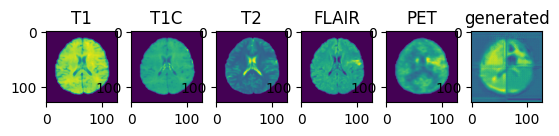

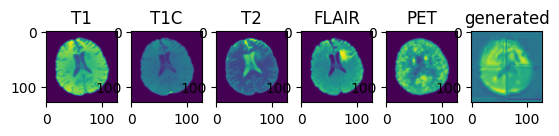

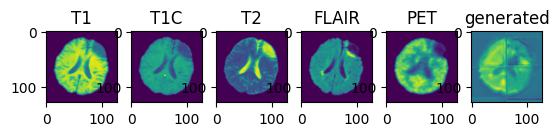

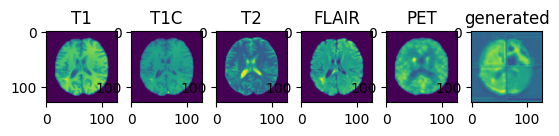

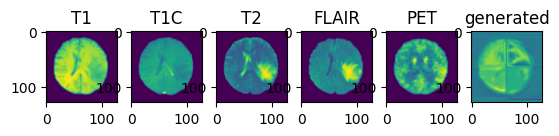

validation avg MS-SSIM: 0.4440 , train avg MS-SSIM: 0.4354
----------
epoch 101/400


Epoch :   0%|                                            | 0/24 [00:00<?, ?it/s]

Epoch :   4%|█▍                                 | 1/24 [01:49<42:04, 109.77s/it]

Epoch :   8%|███                                 | 2/24 [01:51<17:03, 46.51s/it]

Epoch :  12%|████▌                               | 3/24 [01:54<09:11, 26.24s/it]

Epoch :  17%|██████                              | 4/24 [01:56<05:34, 16.72s/it]

Epoch :  21%|███████▌                            | 5/24 [01:58<03:36, 11.41s/it]

Epoch :  25%|█████████                           | 6/24 [02:00<02:28,  8.25s/it]

Epoch :  29%|██████████▌                         | 7/24 [02:02<01:49,  6.41s/it]

Epoch :  33%|████████████                        | 8/24 [02:04<01:20,  5.01s/it]

Epoch :  38%|█████████████▌                      | 9/24 [02:07<01:01,  4.09s/it]

Epoch :  42%|██████████████▌                    | 10/24 [02:09<00:48,  3.48s/it]

Epoch :  46%|████████████████                   | 11/24 [02:11<00:40,  3.09s/it]

Epoch :  50%|█████████████████▌                 | 12/24 [02:13<00:34,  2.86s/it]

Epoch :  54%|██████████████████▉                | 13/24 [02:15<00:28,  2.62s/it]

Epoch :  58%|████████████████████▍              | 14/24 [02:17<00:24,  2.42s/it]

Epoch :  62%|█████████████████████▉             | 15/24 [02:20<00:21,  2.41s/it]

Epoch :  67%|███████████████████████▎           | 16/24 [02:22<00:18,  2.32s/it]

Epoch :  71%|████████████████████████▊          | 17/24 [02:24<00:15,  2.22s/it]

Epoch :  75%|██████████████████████████▎        | 18/24 [02:26<00:12,  2.13s/it]

Epoch :  79%|███████████████████████████▋       | 19/24 [02:28<00:10,  2.06s/it]

Epoch :  83%|█████████████████████████████▏     | 20/24 [02:30<00:08,  2.13s/it]

Epoch :  88%|██████████████████████████████▋    | 21/24 [02:32<00:06,  2.10s/it]

Epoch :  92%|████████████████████████████████   | 22/24 [02:34<00:04,  2.06s/it]

Epoch :  96%|█████████████████████████████████▌ | 23/24 [02:36<00:02,  2.12s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:37<00:00,  1.79s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:42<00:00,  6.75s/it]

----------
epoch 102/400


Epoch :   0%|                                            | 0/24 [00:00<?, ?it/s]

Epoch :   4%|█▍                                 | 1/24 [01:48<41:46, 108.98s/it]

Epoch :   8%|███                                 | 2/24 [01:51<16:54, 46.09s/it]

Epoch :  12%|████▌                               | 3/24 [01:53<09:04, 25.94s/it]

Epoch :  17%|██████                              | 4/24 [01:54<05:29, 16.45s/it]

Epoch :  21%|███████▌                            | 5/24 [01:57<03:34, 11.29s/it]

Epoch :  25%|█████████                           | 6/24 [01:59<02:28,  8.26s/it]

Epoch :  29%|██████████▌                         | 7/24 [02:01<01:47,  6.34s/it]

Epoch :  33%|████████████                        | 8/24 [02:03<01:19,  4.97s/it]

Epoch :  38%|█████████████▌                      | 9/24 [02:05<00:59,  3.99s/it]

Epoch :  42%|██████████████▌                    | 10/24 [02:07<00:47,  3.37s/it]

Epoch :  46%|████████████████                   | 11/24 [02:09<00:37,  2.92s/it]

Epoch :  50%|█████████████████▌                 | 12/24 [02:11<00:32,  2.69s/it]

Epoch :  54%|██████████████████▉                | 13/24 [02:13<00:27,  2.47s/it]

Epoch :  58%|████████████████████▍              | 14/24 [02:15<00:23,  2.37s/it]

Epoch :  62%|█████████████████████▉             | 15/24 [02:18<00:21,  2.35s/it]

Epoch :  67%|███████████████████████▎           | 16/24 [02:20<00:17,  2.24s/it]

Epoch :  71%|████████████████████████▊          | 17/24 [02:22<00:15,  2.17s/it]

Epoch :  75%|██████████████████████████▎        | 18/24 [02:24<00:13,  2.18s/it]

Epoch :  79%|███████████████████████████▋       | 19/24 [02:26<00:10,  2.16s/it]

Epoch :  83%|█████████████████████████████▏     | 20/24 [02:28<00:08,  2.19s/it]

Epoch :  88%|██████████████████████████████▋    | 21/24 [02:30<00:06,  2.13s/it]

Epoch :  92%|████████████████████████████████   | 22/24 [02:32<00:04,  2.11s/it]

Epoch :  96%|█████████████████████████████████▌ | 23/24 [02:35<00:02,  2.19s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:36<00:00,  1.84s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:40<00:00,  6.70s/it]

----------
epoch 103/400


Epoch :   0%|                                            | 0/24 [00:00<?, ?it/s]

Epoch :   4%|█▍                                 | 1/24 [01:51<42:35, 111.12s/it]

Epoch :   8%|███                                 | 2/24 [01:53<17:11, 46.89s/it]

Epoch :  12%|████▌                               | 3/24 [01:55<09:14, 26.43s/it]

Epoch :  17%|██████                              | 4/24 [01:57<05:35, 16.77s/it]

Epoch :  21%|███████▌                            | 5/24 [01:59<03:38, 11.50s/it]

Epoch :  25%|█████████                           | 6/24 [02:01<02:29,  8.28s/it]

Epoch :  29%|██████████▌                         | 7/24 [02:03<01:46,  6.26s/it]

Epoch :  33%|████████████                        | 8/24 [02:05<01:21,  5.09s/it]

Epoch :  38%|█████████████▌                      | 9/24 [02:08<01:02,  4.17s/it]

Epoch :  42%|██████████████▌                    | 10/24 [02:10<00:48,  3.49s/it]

Epoch :  46%|████████████████                   | 11/24 [02:12<00:39,  3.06s/it]

Epoch :  50%|█████████████████▌                 | 12/24 [02:14<00:32,  2.71s/it]

Epoch :  54%|██████████████████▉                | 13/24 [02:16<00:27,  2.48s/it]

Epoch :  58%|████████████████████▍              | 14/24 [02:17<00:23,  2.30s/it]

Epoch :  62%|█████████████████████▉             | 15/24 [02:19<00:19,  2.16s/it]

Epoch :  67%|███████████████████████▎           | 16/24 [02:21<00:17,  2.16s/it]

Epoch :  71%|████████████████████████▊          | 17/24 [02:23<00:14,  2.09s/it]

Epoch :  75%|██████████████████████████▎        | 18/24 [02:25<00:12,  2.08s/it]

Epoch :  79%|███████████████████████████▋       | 19/24 [02:27<00:10,  2.08s/it]

Epoch :  83%|█████████████████████████████▏     | 20/24 [02:29<00:08,  2.01s/it]

Epoch :  88%|██████████████████████████████▋    | 21/24 [02:31<00:05,  1.97s/it]

Epoch :  92%|████████████████████████████████   | 22/24 [02:33<00:03,  1.93s/it]

Epoch :  96%|█████████████████████████████████▌ | 23/24 [02:35<00:01,  1.98s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:36<00:00,  1.68s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:40<00:00,  6.69s/it]

----------
epoch 104/400


Epoch :   0%|                                            | 0/24 [00:00<?, ?it/s]

Epoch :   4%|█▍                                 | 1/24 [01:49<42:08, 109.93s/it]

Epoch :   8%|███                                 | 2/24 [01:52<17:02, 46.49s/it]

Epoch :  12%|████▌                               | 3/24 [01:54<09:12, 26.33s/it]

Epoch :  17%|██████                              | 4/24 [01:56<05:38, 16.93s/it]

Epoch :  21%|███████▌                            | 5/24 [01:58<03:39, 11.57s/it]

Epoch :  25%|█████████                           | 6/24 [02:00<02:28,  8.28s/it]

Epoch :  29%|██████████▌                         | 7/24 [02:03<01:49,  6.42s/it]

Epoch :  33%|████████████                        | 8/24 [02:05<01:20,  5.02s/it]

Epoch :  38%|█████████████▌                      | 9/24 [02:07<01:00,  4.03s/it]

Epoch :  42%|██████████████▌                    | 10/24 [02:09<00:48,  3.45s/it]

Epoch :  46%|████████████████                   | 11/24 [02:11<00:39,  3.02s/it]

Epoch :  50%|█████████████████▌                 | 12/24 [02:13<00:32,  2.68s/it]

Epoch :  54%|██████████████████▉                | 13/24 [02:15<00:27,  2.46s/it]

Epoch :  58%|████████████████████▍              | 14/24 [02:17<00:23,  2.38s/it]

Epoch :  62%|█████████████████████▉             | 15/24 [02:20<00:23,  2.59s/it]

Epoch :  67%|███████████████████████▎           | 16/24 [02:22<00:19,  2.45s/it]

Epoch :  71%|████████████████████████▊          | 17/24 [02:24<00:16,  2.31s/it]

Epoch :  75%|██████████████████████████▎        | 18/24 [02:26<00:13,  2.19s/it]

Epoch :  79%|███████████████████████████▋       | 19/24 [02:28<00:10,  2.14s/it]

Epoch :  83%|█████████████████████████████▏     | 20/24 [02:30<00:08,  2.07s/it]

Epoch :  88%|██████████████████████████████▋    | 21/24 [02:32<00:06,  2.05s/it]

Epoch :  92%|████████████████████████████████   | 22/24 [02:34<00:04,  2.02s/it]

Epoch :  96%|█████████████████████████████████▌ | 23/24 [02:36<00:02,  2.10s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:37<00:00,  1.80s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:42<00:00,  6.77s/it]

----------
epoch 105/400


Epoch :   0%|                                            | 0/24 [00:00<?, ?it/s]

Epoch :   4%|█▍                                 | 1/24 [02:05<47:59, 125.21s/it]

Epoch :   8%|███                                 | 2/24 [02:07<19:24, 52.94s/it]

Epoch :  12%|████▌                               | 3/24 [02:09<10:26, 29.83s/it]

Epoch :  17%|██████                              | 4/24 [02:11<06:16, 18.82s/it]

Epoch :  21%|███████▌                            | 5/24 [02:13<04:02, 12.78s/it]

Epoch :  25%|█████████                           | 6/24 [02:16<02:46,  9.26s/it]

Epoch :  29%|██████████▌                         | 7/24 [02:18<01:59,  7.01s/it]

Epoch :  33%|████████████                        | 8/24 [02:20<01:28,  5.50s/it]

Epoch :  38%|█████████████▌                      | 9/24 [02:23<01:07,  4.49s/it]

Epoch :  42%|██████████████▌                    | 10/24 [02:25<00:55,  3.95s/it]

Epoch :  46%|████████████████                   | 11/24 [02:28<00:43,  3.38s/it]

Epoch :  50%|█████████████████▌                 | 12/24 [02:30<00:35,  2.98s/it]

Epoch :  54%|██████████████████▉                | 13/24 [02:32<00:30,  2.75s/it]

Epoch :  58%|████████████████████▍              | 14/24 [02:34<00:25,  2.56s/it]

Epoch :  62%|█████████████████████▉             | 15/24 [02:36<00:22,  2.49s/it]

Epoch :  67%|███████████████████████▎           | 16/24 [02:39<00:19,  2.44s/it]

Epoch :  71%|████████████████████████▊          | 17/24 [02:41<00:16,  2.39s/it]

Epoch :  75%|██████████████████████████▎        | 18/24 [02:43<00:14,  2.34s/it]

Epoch :  79%|███████████████████████████▋       | 19/24 [02:45<00:11,  2.33s/it]

Epoch :  83%|█████████████████████████████▏     | 20/24 [02:48<00:08,  2.25s/it]

Epoch :  88%|██████████████████████████████▋    | 21/24 [02:50<00:06,  2.24s/it]

Epoch :  92%|████████████████████████████████   | 22/24 [02:52<00:04,  2.13s/it]

Epoch :  96%|█████████████████████████████████▌ | 23/24 [02:54<00:02,  2.15s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:55<00:00,  1.84s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:59<00:00,  7.49s/it]

----------
epoch 106/400


Epoch :   0%|                                            | 0/24 [00:00<?, ?it/s]

Epoch :   4%|█▍                                 | 1/24 [01:50<42:27, 110.77s/it]

Epoch :   8%|███                                 | 2/24 [01:52<17:07, 46.72s/it]

Epoch :  12%|████▌                               | 3/24 [01:54<09:10, 26.22s/it]

Epoch :  17%|██████                              | 4/24 [01:56<05:31, 16.60s/it]

Epoch :  21%|███████▌                            | 5/24 [01:58<03:34, 11.27s/it]

Epoch :  25%|█████████                           | 6/24 [02:00<02:25,  8.08s/it]

Epoch :  29%|██████████▌                         | 7/24 [02:02<01:44,  6.16s/it]

Epoch :  33%|████████████                        | 8/24 [02:04<01:16,  4.78s/it]

Epoch :  38%|█████████████▌                      | 9/24 [02:05<00:57,  3.86s/it]

Epoch :  42%|██████████████▌                    | 10/24 [02:07<00:45,  3.25s/it]

Epoch :  46%|████████████████                   | 11/24 [02:09<00:36,  2.82s/it]

Epoch :  50%|█████████████████▌                 | 12/24 [02:11<00:30,  2.52s/it]

Epoch :  54%|██████████████████▉                | 13/24 [02:13<00:25,  2.33s/it]

Epoch :  58%|████████████████████▍              | 14/24 [02:16<00:24,  2.46s/it]

Epoch :  62%|█████████████████████▉             | 15/24 [02:17<00:20,  2.27s/it]

Epoch :  67%|███████████████████████▎           | 16/24 [02:19<00:17,  2.16s/it]

Epoch :  71%|████████████████████████▊          | 17/24 [02:21<00:14,  2.05s/it]

Epoch :  75%|██████████████████████████▎        | 18/24 [02:23<00:11,  1.97s/it]

Epoch :  79%|███████████████████████████▋       | 19/24 [02:25<00:09,  1.94s/it]

Epoch :  83%|█████████████████████████████▏     | 20/24 [02:27<00:07,  1.90s/it]

Epoch :  88%|██████████████████████████████▋    | 21/24 [02:28<00:05,  1.88s/it]

Epoch :  92%|████████████████████████████████   | 22/24 [02:31<00:03,  1.93s/it]

Epoch :  96%|█████████████████████████████████▌ | 23/24 [02:32<00:01,  1.90s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:33<00:00,  1.62s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:36<00:00,  6.54s/it]

----------
epoch 107/400


Epoch :   0%|                                            | 0/24 [00:00<?, ?it/s]

Epoch :   4%|█▌                                  | 1/24 [01:29<34:12, 89.23s/it]

Epoch :   8%|███                                 | 2/24 [01:31<13:51, 37.81s/it]

Epoch :  12%|████▌                               | 3/24 [01:32<07:28, 21.38s/it]

Epoch :  17%|██████                              | 4/24 [01:34<04:32, 13.65s/it]

Epoch :  21%|███████▌                            | 5/24 [01:36<02:58,  9.38s/it]

Epoch :  25%|█████████                           | 6/24 [01:38<02:04,  6.91s/it]

Epoch :  29%|██████████▌                         | 7/24 [01:40<01:29,  5.24s/it]

Epoch :  33%|████████████                        | 8/24 [01:42<01:06,  4.15s/it]

Epoch :  38%|█████████████▌                      | 9/24 [01:44<00:51,  3.43s/it]

Epoch :  42%|██████████████▌                    | 10/24 [01:45<00:41,  2.93s/it]

Epoch :  46%|████████████████                   | 11/24 [01:47<00:33,  2.59s/it]

Epoch :  50%|█████████████████▌                 | 12/24 [01:49<00:28,  2.35s/it]

Epoch :  54%|██████████████████▉                | 13/24 [01:51<00:24,  2.20s/it]

Epoch :  58%|████████████████████▍              | 14/24 [01:53<00:20,  2.09s/it]

Epoch :  62%|█████████████████████▉             | 15/24 [01:55<00:18,  2.01s/it]

Epoch :  67%|███████████████████████▎           | 16/24 [01:56<00:15,  1.96s/it]

Epoch :  71%|████████████████████████▊          | 17/24 [01:58<00:13,  1.92s/it]

Epoch :  75%|██████████████████████████▎        | 18/24 [02:00<00:11,  1.89s/it]

Epoch :  79%|███████████████████████████▋       | 19/24 [02:02<00:09,  1.86s/it]

Epoch :  83%|█████████████████████████████▏     | 20/24 [02:04<00:07,  1.84s/it]

Epoch :  88%|██████████████████████████████▋    | 21/24 [02:05<00:05,  1.83s/it]

Epoch :  92%|████████████████████████████████   | 22/24 [02:07<00:03,  1.89s/it]

Epoch :  96%|█████████████████████████████████▌ | 23/24 [02:09<00:01,  1.86s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:10<00:00,  1.59s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:13<00:00,  5.58s/it]

----------
epoch 108/400


Epoch :   0%|                                            | 0/24 [00:00<?, ?it/s]

Epoch :   4%|█▍                                 | 1/24 [01:44<39:54, 104.10s/it]

Epoch :   8%|███                                 | 2/24 [01:46<16:09, 44.08s/it]

Epoch :  12%|████▌                               | 3/24 [01:48<08:46, 25.08s/it]

Epoch :  17%|██████                              | 4/24 [01:50<05:19, 15.99s/it]

Epoch :  21%|███████▌                            | 5/24 [01:53<03:30, 11.09s/it]

Epoch :  25%|█████████                           | 6/24 [01:55<02:25,  8.09s/it]

Epoch :  29%|██████████▌                         | 7/24 [01:58<01:47,  6.32s/it]

Epoch :  33%|████████████                        | 8/24 [02:00<01:19,  4.96s/it]

Epoch :  38%|█████████████▌                      | 9/24 [02:02<01:00,  4.03s/it]

Epoch :  42%|██████████████▌                    | 10/24 [02:04<00:48,  3.44s/it]

Epoch :  46%|████████████████                   | 11/24 [02:06<00:39,  3.03s/it]

Epoch :  50%|█████████████████▌                 | 12/24 [02:08<00:32,  2.68s/it]

Epoch :  54%|██████████████████▉                | 13/24 [02:10<00:27,  2.52s/it]

Epoch :  58%|████████████████████▍              | 14/24 [02:12<00:24,  2.47s/it]

Epoch :  62%|█████████████████████▉             | 15/24 [02:15<00:22,  2.45s/it]

Epoch :  67%|███████████████████████▎           | 16/24 [02:17<00:19,  2.38s/it]

Epoch :  71%|████████████████████████▊          | 17/24 [02:19<00:17,  2.44s/it]

Epoch :  75%|██████████████████████████▎        | 18/24 [02:22<00:14,  2.43s/it]

Epoch :  79%|███████████████████████████▋       | 19/24 [02:24<00:12,  2.41s/it]

Epoch :  83%|█████████████████████████████▏     | 20/24 [02:26<00:09,  2.26s/it]

Epoch :  88%|██████████████████████████████▋    | 21/24 [02:28<00:06,  2.17s/it]

Epoch :  92%|████████████████████████████████   | 22/24 [02:30<00:04,  2.17s/it]

Epoch :  96%|█████████████████████████████████▌ | 23/24 [02:33<00:02,  2.36s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:34<00:00,  1.96s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:38<00:00,  6.61s/it]

----------
epoch 109/400


Epoch :   0%|                                            | 0/24 [00:00<?, ?it/s]

Epoch :   4%|█▍                                 | 1/24 [01:55<44:07, 115.11s/it]

Epoch :   8%|███                                 | 2/24 [01:57<17:49, 48.63s/it]

Epoch :  12%|████▌                               | 3/24 [01:59<09:34, 27.34s/it]

Epoch :  17%|██████                              | 4/24 [02:01<05:46, 17.31s/it]

Epoch :  21%|███████▌                            | 5/24 [02:03<03:44, 11.80s/it]

Epoch :  25%|█████████                           | 6/24 [02:05<02:35,  8.63s/it]

Epoch :  29%|██████████▌                         | 7/24 [02:08<01:54,  6.72s/it]

Epoch :  33%|████████████                        | 8/24 [02:10<01:23,  5.24s/it]

Epoch :  38%|█████████████▌                      | 9/24 [02:12<01:02,  4.20s/it]

Epoch :  42%|██████████████▌                    | 10/24 [02:14<00:50,  3.60s/it]

Epoch :  46%|████████████████                   | 11/24 [02:16<00:40,  3.15s/it]

Epoch :  50%|█████████████████▌                 | 12/24 [02:18<00:33,  2.83s/it]

Epoch :  54%|██████████████████▉                | 13/24 [02:20<00:28,  2.55s/it]

Epoch :  58%|████████████████████▍              | 14/24 [02:22<00:23,  2.39s/it]

Epoch :  62%|█████████████████████▉             | 15/24 [02:25<00:21,  2.39s/it]

Epoch :  67%|███████████████████████▎           | 16/24 [02:27<00:18,  2.30s/it]

Epoch :  71%|████████████████████████▊          | 17/24 [02:29<00:15,  2.24s/it]

Epoch :  75%|██████████████████████████▎        | 18/24 [02:31<00:13,  2.19s/it]

Epoch :  79%|███████████████████████████▋       | 19/24 [02:33<00:10,  2.17s/it]

Epoch :  83%|█████████████████████████████▏     | 20/24 [02:35<00:08,  2.12s/it]

Epoch :  88%|██████████████████████████████▋    | 21/24 [02:38<00:06,  2.24s/it]

Epoch :  92%|████████████████████████████████   | 22/24 [02:40<00:04,  2.27s/it]

Epoch :  96%|█████████████████████████████████▌ | 23/24 [02:43<00:02,  2.38s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:44<00:00,  1.97s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:48<00:00,  7.01s/it]

----------
epoch 110/400


Epoch :   0%|                                            | 0/24 [00:00<?, ?it/s]

Epoch :   4%|█▍                                 | 1/24 [01:57<45:08, 117.74s/it]

Epoch :   8%|███                                 | 2/24 [01:59<18:13, 49.69s/it]

Epoch :  12%|████▌                               | 3/24 [02:02<09:48, 28.03s/it]

Epoch :  17%|██████                              | 4/24 [02:04<05:55, 17.79s/it]

Epoch :  21%|███████▌                            | 5/24 [02:06<03:49, 12.08s/it]

Epoch :  25%|█████████                           | 6/24 [02:08<02:37,  8.74s/it]

Epoch :  29%|██████████▌                         | 7/24 [02:10<01:53,  6.70s/it]

Epoch :  33%|████████████                        | 8/24 [02:12<01:23,  5.22s/it]

Epoch :  38%|█████████████▌                      | 9/24 [02:15<01:04,  4.30s/it]

Epoch :  42%|██████████████▌                    | 10/24 [02:17<00:50,  3.58s/it]

Epoch :  46%|████████████████                   | 11/24 [02:19<00:40,  3.12s/it]

Epoch :  50%|█████████████████▌                 | 12/24 [02:21<00:34,  2.89s/it]

Epoch :  54%|██████████████████▉                | 13/24 [02:23<00:28,  2.63s/it]

Epoch :  58%|████████████████████▍              | 14/24 [02:25<00:23,  2.38s/it]

Epoch :  62%|█████████████████████▉             | 15/24 [02:27<00:20,  2.29s/it]

Epoch :  67%|███████████████████████▎           | 16/24 [02:29<00:18,  2.27s/it]

Epoch :  71%|████████████████████████▊          | 17/24 [02:31<00:15,  2.25s/it]

Epoch :  75%|██████████████████████████▎        | 18/24 [02:33<00:12,  2.16s/it]

Epoch :  79%|███████████████████████████▋       | 19/24 [02:36<00:11,  2.23s/it]

Epoch :  83%|█████████████████████████████▏     | 20/24 [02:38<00:08,  2.15s/it]

Epoch :  88%|██████████████████████████████▋    | 21/24 [02:40<00:06,  2.14s/it]

Epoch :  92%|████████████████████████████████   | 22/24 [02:42<00:04,  2.11s/it]

Epoch :  96%|█████████████████████████████████▌ | 23/24 [02:44<00:02,  2.23s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:45<00:00,  1.88s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:50<00:00,  7.09s/it]

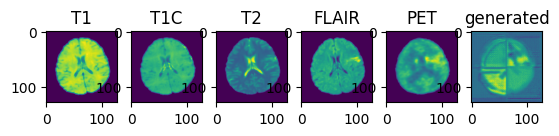

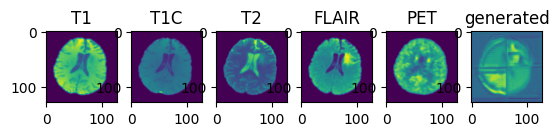

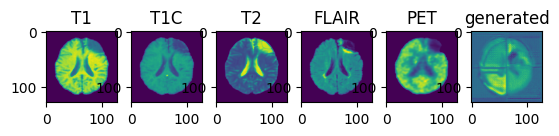

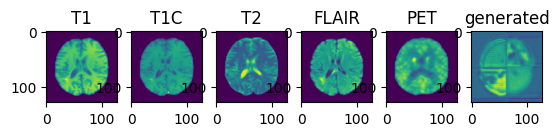

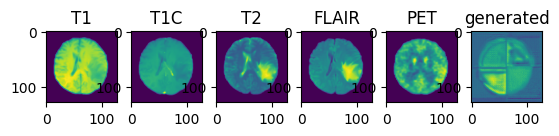

validation avg MS-SSIM: 0.4069 , train avg MS-SSIM: 0.3939
----------
epoch 111/400


Epoch :   0%|                                            | 0/24 [00:00<?, ?it/s]

Epoch :   4%|█▍                                 | 1/24 [01:50<42:22, 110.55s/it]

Epoch :   8%|███                                 | 2/24 [01:53<17:22, 47.38s/it]

Epoch :  12%|████▌                               | 3/24 [01:55<09:21, 26.73s/it]

Epoch :  17%|██████                              | 4/24 [01:58<05:44, 17.22s/it]

Epoch :  21%|███████▌                            | 5/24 [02:00<03:42, 11.73s/it]

Epoch :  25%|█████████                           | 6/24 [02:02<02:31,  8.42s/it]

Epoch :  29%|██████████▌                         | 7/24 [02:04<01:47,  6.32s/it]

Epoch :  33%|████████████                        | 8/24 [02:06<01:20,  5.05s/it]

Epoch :  38%|█████████████▌                      | 9/24 [02:09<01:02,  4.19s/it]

Epoch :  42%|██████████████▌                    | 10/24 [02:11<00:50,  3.61s/it]

Epoch :  46%|████████████████                   | 11/24 [02:13<00:41,  3.19s/it]

Epoch :  50%|█████████████████▌                 | 12/24 [02:15<00:34,  2.90s/it]

Epoch :  54%|██████████████████▉                | 13/24 [02:18<00:30,  2.80s/it]

Epoch :  58%|████████████████████▍              | 14/24 [02:20<00:25,  2.59s/it]

Epoch :  62%|█████████████████████▉             | 15/24 [02:22<00:22,  2.46s/it]

Epoch :  67%|███████████████████████▎           | 16/24 [02:25<00:19,  2.41s/it]

Epoch :  71%|████████████████████████▊          | 17/24 [02:27<00:16,  2.38s/it]

Epoch :  75%|██████████████████████████▎        | 18/24 [02:29<00:14,  2.36s/it]

Epoch :  79%|███████████████████████████▋       | 19/24 [02:31<00:11,  2.24s/it]

Epoch :  83%|█████████████████████████████▏     | 20/24 [02:33<00:08,  2.18s/it]

Epoch :  88%|██████████████████████████████▋    | 21/24 [02:35<00:06,  2.22s/it]

Epoch :  92%|████████████████████████████████   | 22/24 [02:37<00:04,  2.14s/it]

Epoch :  96%|█████████████████████████████████▌ | 23/24 [02:39<00:02,  2.10s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:40<00:00,  1.79s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:45<00:00,  6.88s/it]

----------
epoch 112/400


Epoch :   0%|                                            | 0/24 [00:00<?, ?it/s]

Epoch :   4%|█▍                                 | 1/24 [01:58<45:22, 118.37s/it]

Epoch :   8%|███                                 | 2/24 [02:00<18:19, 49.98s/it]

Epoch :  12%|████▌                               | 3/24 [02:02<09:49, 28.05s/it]

Epoch :  17%|██████                              | 4/24 [02:04<05:57, 17.89s/it]

Epoch :  21%|███████▌                            | 5/24 [02:07<03:54, 12.35s/it]

Epoch :  25%|█████████                           | 6/24 [02:09<02:39,  8.85s/it]

Epoch :  29%|██████████▌                         | 7/24 [02:11<01:52,  6.63s/it]

Epoch :  33%|████████████                        | 8/24 [02:13<01:24,  5.26s/it]

Epoch :  38%|█████████████▌                      | 9/24 [02:15<01:03,  4.25s/it]

Epoch :  42%|██████████████▌                    | 10/24 [02:17<00:49,  3.54s/it]

Epoch :  46%|████████████████                   | 11/24 [02:19<00:39,  3.04s/it]

Epoch :  50%|█████████████████▌                 | 12/24 [02:21<00:32,  2.74s/it]

Epoch :  54%|██████████████████▉                | 13/24 [02:24<00:29,  2.68s/it]

Epoch :  58%|████████████████████▍              | 14/24 [02:26<00:25,  2.52s/it]

Epoch :  62%|█████████████████████▉             | 15/24 [02:28<00:21,  2.37s/it]

Epoch :  67%|███████████████████████▎           | 16/24 [02:30<00:18,  2.31s/it]

Epoch :  71%|████████████████████████▊          | 17/24 [02:32<00:16,  2.35s/it]

Epoch :  75%|██████████████████████████▎        | 18/24 [02:35<00:14,  2.33s/it]

Epoch :  79%|███████████████████████████▋       | 19/24 [02:37<00:11,  2.32s/it]

Epoch :  83%|█████████████████████████████▏     | 20/24 [02:39<00:09,  2.26s/it]

Epoch :  88%|██████████████████████████████▋    | 21/24 [02:42<00:06,  2.33s/it]

Epoch :  92%|████████████████████████████████   | 22/24 [02:44<00:04,  2.29s/it]

Epoch :  96%|█████████████████████████████████▌ | 23/24 [02:46<00:02,  2.36s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:48<00:00,  2.00s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:52<00:00,  7.20s/it]

----------
epoch 113/400


Epoch :   0%|                                            | 0/24 [00:00<?, ?it/s]

Epoch :   4%|█▍                                 | 1/24 [02:03<47:14, 123.22s/it]

Epoch :   8%|███                                 | 2/24 [02:05<19:03, 52.00s/it]

Epoch :  12%|████▌                               | 3/24 [02:07<10:14, 29.25s/it]

Epoch :  17%|██████                              | 4/24 [02:09<06:12, 18.64s/it]

Epoch :  21%|███████▌                            | 5/24 [02:12<04:04, 12.86s/it]

Epoch :  25%|█████████                           | 6/24 [02:14<02:47,  9.29s/it]

Epoch :  29%|██████████▌                         | 7/24 [02:17<02:00,  7.06s/it]

Epoch :  33%|████████████                        | 8/24 [02:19<01:28,  5.55s/it]

Epoch :  38%|█████████████▌                      | 9/24 [02:22<01:08,  4.55s/it]

Epoch :  42%|██████████████▌                    | 10/24 [02:24<00:53,  3.85s/it]

Epoch :  46%|████████████████                   | 11/24 [02:26<00:43,  3.37s/it]

Epoch :  50%|█████████████████▌                 | 12/24 [02:28<00:36,  3.06s/it]

Epoch :  54%|██████████████████▉                | 13/24 [02:31<00:32,  2.99s/it]

Epoch :  58%|████████████████████▍              | 14/24 [02:34<00:27,  2.80s/it]

Epoch :  62%|█████████████████████▉             | 15/24 [02:36<00:25,  2.79s/it]

Epoch :  67%|███████████████████████▎           | 16/24 [02:39<00:22,  2.80s/it]

Epoch :  71%|████████████████████████▊          | 17/24 [02:42<00:19,  2.74s/it]

Epoch :  75%|██████████████████████████▎        | 18/24 [02:44<00:16,  2.71s/it]

Epoch :  79%|███████████████████████████▋       | 19/24 [02:47<00:12,  2.57s/it]

Epoch :  83%|█████████████████████████████▏     | 20/24 [02:49<00:09,  2.50s/it]

Epoch :  88%|██████████████████████████████▋    | 21/24 [02:51<00:07,  2.38s/it]

Epoch :  92%|████████████████████████████████   | 22/24 [02:53<00:04,  2.26s/it]

Epoch :  96%|█████████████████████████████████▌ | 23/24 [02:56<00:02,  2.34s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:57<00:00,  1.99s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [03:02<00:00,  7.60s/it]

----------
epoch 114/400


Epoch :   0%|                                            | 0/24 [00:00<?, ?it/s]

Epoch :   4%|█▌                                  | 1/24 [01:33<35:39, 93.02s/it]

Epoch :   8%|███                                 | 2/24 [01:34<14:26, 39.37s/it]

Epoch :  12%|████▌                               | 3/24 [01:36<07:46, 22.22s/it]

Epoch :  17%|██████                              | 4/24 [01:38<04:43, 14.18s/it]

Epoch :  21%|███████▌                            | 5/24 [01:40<03:06,  9.84s/it]

Epoch :  25%|█████████                           | 6/24 [01:42<02:07,  7.10s/it]

Epoch :  29%|██████████▌                         | 7/24 [01:44<01:31,  5.37s/it]

Epoch :  33%|████████████                        | 8/24 [01:46<01:07,  4.25s/it]

Epoch :  38%|█████████████▌                      | 9/24 [01:47<00:52,  3.49s/it]

Epoch :  42%|██████████████▌                    | 10/24 [01:49<00:41,  2.98s/it]

Epoch :  46%|████████████████                   | 11/24 [01:51<00:34,  2.63s/it]

Epoch :  50%|█████████████████▌                 | 12/24 [01:53<00:28,  2.37s/it]

Epoch :  54%|██████████████████▉                | 13/24 [01:55<00:25,  2.30s/it]

Epoch :  58%|████████████████████▍              | 14/24 [01:57<00:21,  2.14s/it]

Epoch :  62%|█████████████████████▉             | 15/24 [01:59<00:18,  2.03s/it]

Epoch :  67%|███████████████████████▎           | 16/24 [02:00<00:15,  1.96s/it]

Epoch :  71%|████████████████████████▊          | 17/24 [02:02<00:13,  1.91s/it]

Epoch :  75%|██████████████████████████▎        | 18/24 [02:04<00:11,  1.88s/it]

Epoch :  79%|███████████████████████████▋       | 19/24 [02:06<00:09,  1.86s/it]

Epoch :  83%|█████████████████████████████▏     | 20/24 [02:08<00:07,  1.85s/it]

Epoch :  88%|██████████████████████████████▋    | 21/24 [02:09<00:05,  1.84s/it]

Epoch :  92%|████████████████████████████████   | 22/24 [02:11<00:03,  1.83s/it]

Epoch :  96%|█████████████████████████████████▌ | 23/24 [02:13<00:01,  1.83s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:14<00:00,  1.58s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:17<00:00,  5.73s/it]

----------
epoch 115/400


Epoch :   0%|                                            | 0/24 [00:00<?, ?it/s]

Epoch :   4%|█▌                                  | 1/24 [01:28<33:55, 88.49s/it]

Epoch :   8%|███                                 | 2/24 [01:30<13:46, 37.55s/it]

Epoch :  12%|████▌                               | 3/24 [01:32<07:26, 21.26s/it]

Epoch :  17%|██████                              | 4/24 [01:34<04:32, 13.60s/it]

Epoch :  21%|███████▌                            | 5/24 [01:36<03:00,  9.50s/it]

Epoch :  25%|█████████                           | 6/24 [01:38<02:04,  6.89s/it]

Epoch :  29%|██████████▌                         | 7/24 [01:39<01:28,  5.23s/it]

Epoch :  33%|████████████                        | 8/24 [01:41<01:06,  4.15s/it]

Epoch :  38%|█████████████▌                      | 9/24 [01:43<00:51,  3.42s/it]

Epoch :  42%|██████████████▌                    | 10/24 [01:45<00:40,  2.93s/it]

Epoch :  46%|████████████████                   | 11/24 [01:47<00:33,  2.58s/it]

Epoch :  50%|█████████████████▌                 | 12/24 [01:49<00:28,  2.36s/it]

Epoch :  54%|██████████████████▉                | 13/24 [01:50<00:24,  2.22s/it]

Epoch :  58%|████████████████████▍              | 14/24 [01:53<00:22,  2.29s/it]

Epoch :  62%|█████████████████████▉             | 15/24 [01:55<00:19,  2.16s/it]

Epoch :  67%|███████████████████████▎           | 16/24 [01:57<00:16,  2.07s/it]

Epoch :  71%|████████████████████████▊          | 17/24 [01:58<00:13,  1.99s/it]

Epoch :  75%|██████████████████████████▎        | 18/24 [02:00<00:11,  1.93s/it]

Epoch :  79%|███████████████████████████▋       | 19/24 [02:02<00:09,  1.89s/it]

Epoch :  83%|█████████████████████████████▏     | 20/24 [02:04<00:07,  1.86s/it]

Epoch :  88%|██████████████████████████████▋    | 21/24 [02:06<00:05,  1.85s/it]

Epoch :  92%|████████████████████████████████   | 22/24 [02:07<00:03,  1.84s/it]

Epoch :  96%|█████████████████████████████████▌ | 23/24 [02:09<00:01,  1.83s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:10<00:00,  1.57s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:13<00:00,  5.57s/it]

----------
epoch 116/400


Epoch :   0%|                                            | 0/24 [00:00<?, ?it/s]

Epoch :   4%|█▌                                  | 1/24 [01:29<34:11, 89.19s/it]

Epoch :   8%|███                                 | 2/24 [01:31<13:51, 37.80s/it]

Epoch :  12%|████▌                               | 3/24 [01:32<07:28, 21.37s/it]

Epoch :  17%|██████                              | 4/24 [01:34<04:33, 13.66s/it]

Epoch :  21%|███████▌                            | 5/24 [01:36<02:58,  9.41s/it]

Epoch :  25%|█████████                           | 6/24 [01:38<02:04,  6.93s/it]

Epoch :  29%|██████████▌                         | 7/24 [01:40<01:29,  5.25s/it]

Epoch :  33%|████████████                        | 8/24 [01:42<01:06,  4.15s/it]

Epoch :  38%|█████████████▌                      | 9/24 [01:44<00:51,  3.41s/it]

Epoch :  42%|██████████████▌                    | 10/24 [01:45<00:40,  2.91s/it]

Epoch :  46%|████████████████                   | 11/24 [01:47<00:33,  2.57s/it]

Epoch :  50%|█████████████████▌                 | 12/24 [01:49<00:27,  2.33s/it]

Epoch :  54%|██████████████████▉                | 13/24 [01:51<00:23,  2.18s/it]

Epoch :  58%|████████████████████▍              | 14/24 [01:53<00:21,  2.15s/it]

Epoch :  62%|█████████████████████▉             | 15/24 [01:55<00:18,  2.05s/it]

Epoch :  67%|███████████████████████▎           | 16/24 [01:56<00:15,  1.98s/it]

Epoch :  71%|████████████████████████▊          | 17/24 [01:58<00:13,  1.93s/it]

Epoch :  75%|██████████████████████████▎        | 18/24 [02:00<00:11,  1.89s/it]

Epoch :  79%|███████████████████████████▋       | 19/24 [02:02<00:09,  1.86s/it]

Epoch :  83%|█████████████████████████████▏     | 20/24 [02:04<00:07,  1.84s/it]

Epoch :  88%|██████████████████████████████▋    | 21/24 [02:06<00:05,  1.90s/it]

Epoch :  92%|████████████████████████████████   | 22/24 [02:07<00:03,  1.87s/it]

Epoch :  96%|█████████████████████████████████▌ | 23/24 [02:09<00:01,  1.84s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:10<00:00,  1.58s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:13<00:00,  5.58s/it]

----------
epoch 117/400


Epoch :   0%|                                            | 0/24 [00:00<?, ?it/s]

Epoch :   4%|█▌                                  | 1/24 [01:29<34:28, 89.95s/it]

Epoch :   8%|███                                 | 2/24 [01:31<13:58, 38.11s/it]

Epoch :  12%|████▌                               | 3/24 [01:33<07:32, 21.54s/it]

Epoch :  17%|██████                              | 4/24 [01:35<04:35, 13.76s/it]

Epoch :  21%|███████▌                            | 5/24 [01:37<02:59,  9.46s/it]

Epoch :  25%|█████████                           | 6/24 [01:39<02:03,  6.85s/it]

Epoch :  29%|██████████▌                         | 7/24 [01:40<01:28,  5.20s/it]

Epoch :  33%|████████████                        | 8/24 [01:42<01:05,  4.11s/it]

Epoch :  38%|█████████████▌                      | 9/24 [01:44<00:50,  3.38s/it]

Epoch :  42%|██████████████▌                    | 10/24 [01:46<00:40,  2.89s/it]

Epoch :  46%|████████████████                   | 11/24 [01:48<00:33,  2.55s/it]

Epoch :  50%|█████████████████▌                 | 12/24 [01:49<00:27,  2.33s/it]

Epoch :  54%|██████████████████▉                | 13/24 [01:51<00:24,  2.24s/it]

Epoch :  58%|████████████████████▍              | 14/24 [01:53<00:21,  2.11s/it]

Epoch :  62%|█████████████████████▉             | 15/24 [01:55<00:18,  2.02s/it]

Epoch :  67%|███████████████████████▎           | 16/24 [01:57<00:15,  1.96s/it]

Epoch :  71%|████████████████████████▊          | 17/24 [01:59<00:13,  1.92s/it]

Epoch :  75%|██████████████████████████▎        | 18/24 [02:00<00:11,  1.89s/it]

Epoch :  79%|███████████████████████████▋       | 19/24 [02:02<00:09,  1.87s/it]

Epoch :  83%|█████████████████████████████▏     | 20/24 [02:04<00:07,  1.86s/it]

Epoch :  88%|██████████████████████████████▋    | 21/24 [02:06<00:05,  1.92s/it]

Epoch :  92%|████████████████████████████████   | 22/24 [02:08<00:03,  1.88s/it]

Epoch :  96%|█████████████████████████████████▌ | 23/24 [02:10<00:01,  1.86s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:11<00:00,  1.59s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:14<00:00,  5.61s/it]

----------
epoch 118/400


Epoch :   0%|                                            | 0/24 [00:00<?, ?it/s]

Epoch :   4%|█▌                                  | 1/24 [01:39<38:03, 99.27s/it]

Epoch :   8%|███                                 | 2/24 [01:41<15:23, 41.97s/it]

Epoch :  12%|████▌                               | 3/24 [01:42<08:16, 23.64s/it]

Epoch :  17%|██████                              | 4/24 [01:44<05:00, 15.03s/it]

Epoch :  21%|███████▌                            | 5/24 [01:46<03:15, 10.28s/it]

Epoch :  25%|█████████                           | 6/24 [01:48<02:15,  7.51s/it]

Epoch :  29%|██████████▌                         | 7/24 [01:50<01:35,  5.64s/it]

Epoch :  33%|████████████                        | 8/24 [01:52<01:10,  4.42s/it]

Epoch :  38%|█████████████▌                      | 9/24 [01:54<00:53,  3.59s/it]

Epoch :  42%|██████████████▌                    | 10/24 [01:55<00:42,  3.03s/it]

Epoch :  46%|████████████████                   | 11/24 [01:57<00:34,  2.65s/it]

Epoch :  50%|█████████████████▌                 | 12/24 [01:59<00:28,  2.39s/it]

Epoch :  54%|██████████████████▉                | 13/24 [02:01<00:24,  2.21s/it]

Epoch :  58%|████████████████████▍              | 14/24 [02:03<00:21,  2.16s/it]

Epoch :  62%|█████████████████████▉             | 15/24 [02:05<00:18,  2.06s/it]

Epoch :  67%|███████████████████████▎           | 16/24 [02:06<00:15,  1.99s/it]

Epoch :  71%|████████████████████████▊          | 17/24 [02:08<00:13,  1.94s/it]

Epoch :  75%|██████████████████████████▎        | 18/24 [02:10<00:11,  1.90s/it]

Epoch :  79%|███████████████████████████▋       | 19/24 [02:12<00:09,  1.87s/it]

Epoch :  83%|█████████████████████████████▏     | 20/24 [02:14<00:07,  1.85s/it]

Epoch :  88%|██████████████████████████████▋    | 21/24 [02:16<00:05,  1.83s/it]

Epoch :  92%|████████████████████████████████   | 22/24 [02:18<00:03,  1.89s/it]

Epoch :  96%|█████████████████████████████████▌ | 23/24 [02:19<00:01,  1.86s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:20<00:00,  1.59s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:23<00:00,  6.00s/it]

----------
epoch 119/400


Epoch :   0%|                                            | 0/24 [00:00<?, ?it/s]

Epoch :   4%|█▌                                  | 1/24 [01:29<34:18, 89.52s/it]

Epoch :   8%|███                                 | 2/24 [01:31<13:54, 37.91s/it]

Epoch :  12%|████▌                               | 3/24 [01:33<07:30, 21.43s/it]

Epoch :  17%|██████                              | 4/24 [01:34<04:33, 13.68s/it]

Epoch :  21%|███████▌                            | 5/24 [01:36<02:58,  9.39s/it]

Epoch :  25%|█████████                           | 6/24 [01:38<02:04,  6.92s/it]

Epoch :  29%|██████████▌                         | 7/24 [01:40<01:29,  5.25s/it]

Epoch :  33%|████████████                        | 8/24 [01:42<01:06,  4.16s/it]

Epoch :  38%|█████████████▌                      | 9/24 [01:44<00:51,  3.43s/it]

Epoch :  42%|██████████████▌                    | 10/24 [01:46<00:41,  2.94s/it]

Epoch :  46%|████████████████                   | 11/24 [01:47<00:33,  2.60s/it]

Epoch :  50%|█████████████████▌                 | 12/24 [01:49<00:28,  2.36s/it]

Epoch :  54%|██████████████████▉                | 13/24 [01:51<00:23,  2.18s/it]

Epoch :  58%|████████████████████▍              | 14/24 [01:53<00:21,  2.14s/it]

Epoch :  62%|█████████████████████▉             | 15/24 [01:55<00:18,  2.03s/it]

Epoch :  67%|███████████████████████▎           | 16/24 [01:57<00:15,  1.96s/it]

Epoch :  71%|████████████████████████▊          | 17/24 [01:58<00:13,  1.91s/it]

Epoch :  75%|██████████████████████████▎        | 18/24 [02:00<00:11,  1.88s/it]

Epoch :  79%|███████████████████████████▋       | 19/24 [02:02<00:09,  1.86s/it]

Epoch :  83%|█████████████████████████████▏     | 20/24 [02:04<00:07,  1.85s/it]

Epoch :  88%|██████████████████████████████▋    | 21/24 [02:06<00:05,  1.84s/it]

Epoch :  92%|████████████████████████████████   | 22/24 [02:08<00:03,  1.91s/it]

Epoch :  96%|█████████████████████████████████▌ | 23/24 [02:10<00:01,  1.88s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:11<00:00,  1.61s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:14<00:00,  5.59s/it]

----------
epoch 120/400


Epoch :   0%|                                            | 0/24 [00:00<?, ?it/s]

Epoch :   4%|█▌                                  | 1/24 [01:29<34:19, 89.56s/it]

Epoch :   8%|███                                 | 2/24 [01:31<13:54, 37.94s/it]

Epoch :  12%|████▌                               | 3/24 [01:33<07:30, 21.44s/it]

Epoch :  17%|██████                              | 4/24 [01:34<04:33, 13.69s/it]

Epoch :  21%|███████▌                            | 5/24 [01:36<02:58,  9.41s/it]

Epoch :  25%|█████████                           | 6/24 [01:38<02:04,  6.94s/it]

Epoch :  29%|██████████▌                         | 7/24 [01:40<01:29,  5.25s/it]

Epoch :  33%|████████████                        | 8/24 [01:42<01:06,  4.15s/it]

Epoch :  38%|█████████████▌                      | 9/24 [01:44<00:51,  3.41s/it]

Epoch :  42%|██████████████▌                    | 10/24 [01:46<00:40,  2.91s/it]

Epoch :  46%|████████████████                   | 11/24 [01:47<00:33,  2.57s/it]

Epoch :  50%|█████████████████▌                 | 12/24 [01:49<00:27,  2.33s/it]

Epoch :  54%|██████████████████▉                | 13/24 [01:51<00:23,  2.17s/it]

Epoch :  58%|████████████████████▍              | 14/24 [01:53<00:20,  2.06s/it]

Epoch :  62%|█████████████████████▉             | 15/24 [01:55<00:18,  2.06s/it]

Epoch :  67%|███████████████████████▎           | 16/24 [01:57<00:15,  1.98s/it]

Epoch :  71%|████████████████████████▊          | 17/24 [01:58<00:13,  1.93s/it]

Epoch :  75%|██████████████████████████▎        | 18/24 [02:00<00:11,  1.88s/it]

Epoch :  79%|███████████████████████████▋       | 19/24 [02:02<00:09,  1.85s/it]

Epoch :  83%|█████████████████████████████▏     | 20/24 [02:04<00:07,  1.83s/it]

Epoch :  88%|██████████████████████████████▋    | 21/24 [02:06<00:05,  1.82s/it]

Epoch :  92%|████████████████████████████████   | 22/24 [02:08<00:03,  1.88s/it]

Epoch :  96%|█████████████████████████████████▌ | 23/24 [02:09<00:01,  1.85s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:10<00:00,  1.59s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:14<00:00,  5.59s/it]

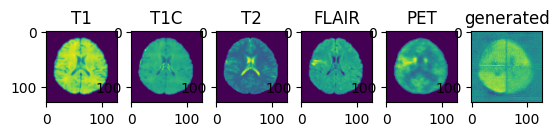

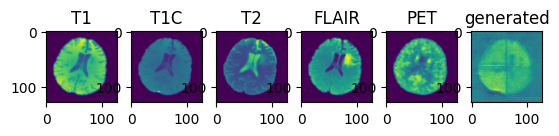

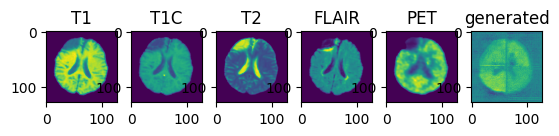

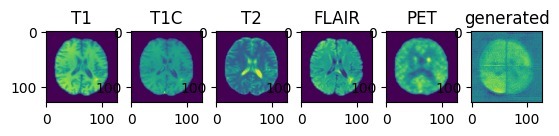

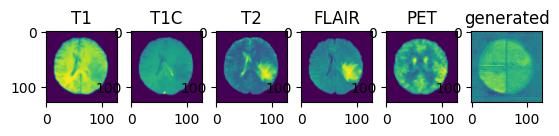

validation avg MS-SSIM: 0.4396 , train avg MS-SSIM: 0.4210
----------
epoch 121/400


Epoch :   0%|                                            | 0/24 [00:00<?, ?it/s]

Epoch :   4%|█▌                                  | 1/24 [01:37<37:18, 97.31s/it]

Epoch :   8%|███                                 | 2/24 [01:39<15:11, 41.43s/it]

Epoch :  12%|████▌                               | 3/24 [01:41<08:11, 23.39s/it]

Epoch :  17%|██████                              | 4/24 [01:43<04:57, 14.88s/it]

Epoch :  21%|███████▌                            | 5/24 [01:45<03:13, 10.20s/it]

Epoch :  25%|█████████                           | 6/24 [01:47<02:12,  7.37s/it]

Epoch :  29%|██████████▌                         | 7/24 [01:49<01:34,  5.58s/it]

Epoch :  33%|████████████                        | 8/24 [01:50<01:10,  4.39s/it]

Epoch :  38%|█████████████▌                      | 9/24 [01:52<00:53,  3.59s/it]

Epoch :  42%|██████████████▌                    | 10/24 [01:54<00:44,  3.17s/it]

Epoch :  46%|████████████████                   | 11/24 [01:56<00:36,  2.78s/it]

Epoch :  50%|█████████████████▌                 | 12/24 [01:58<00:30,  2.50s/it]

Epoch :  54%|██████████████████▉                | 13/24 [02:00<00:25,  2.32s/it]

Epoch :  58%|████████████████████▍              | 14/24 [02:02<00:21,  2.18s/it]

Epoch :  62%|█████████████████████▉             | 15/24 [02:04<00:18,  2.09s/it]

Epoch :  67%|███████████████████████▎           | 16/24 [02:06<00:16,  2.06s/it]

Epoch :  71%|████████████████████████▊          | 17/24 [02:08<00:14,  2.01s/it]

Epoch :  75%|██████████████████████████▎        | 18/24 [02:10<00:12,  2.09s/it]

Epoch :  79%|███████████████████████████▋       | 19/24 [02:12<00:10,  2.04s/it]

Epoch :  83%|█████████████████████████████▏     | 20/24 [02:14<00:07,  1.99s/it]

Epoch :  88%|██████████████████████████████▋    | 21/24 [02:16<00:05,  1.97s/it]

Epoch :  92%|████████████████████████████████   | 22/24 [02:18<00:03,  1.99s/it]

Epoch :  96%|█████████████████████████████████▌ | 23/24 [02:20<00:02,  2.04s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:21<00:00,  1.73s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:25<00:00,  6.05s/it]

----------
epoch 122/400


Epoch :   0%|                                            | 0/24 [00:00<?, ?it/s]

Epoch :   4%|█▌                                  | 1/24 [01:36<37:01, 96.59s/it]

Epoch :   8%|███                                 | 2/24 [01:38<15:04, 41.12s/it]

Epoch :  12%|████▌                               | 3/24 [01:40<08:07, 23.20s/it]

Epoch :  17%|██████                              | 4/24 [01:42<04:55, 14.80s/it]

Epoch :  21%|███████▌                            | 5/24 [01:44<03:12, 10.16s/it]

Epoch :  25%|█████████                           | 6/24 [01:46<02:13,  7.39s/it]

Epoch :  29%|██████████▌                         | 7/24 [01:48<01:35,  5.60s/it]

Epoch :  33%|████████████                        | 8/24 [01:50<01:10,  4.40s/it]

Epoch :  38%|█████████████▌                      | 9/24 [01:52<00:54,  3.61s/it]

Epoch :  42%|██████████████▌                    | 10/24 [01:54<00:44,  3.15s/it]

Epoch :  46%|████████████████                   | 11/24 [01:56<00:35,  2.76s/it]

Epoch :  50%|█████████████████▌                 | 12/24 [01:58<00:30,  2.50s/it]

Epoch :  54%|██████████████████▉                | 13/24 [02:00<00:25,  2.32s/it]

Epoch :  58%|████████████████████▍              | 14/24 [02:01<00:22,  2.20s/it]

Epoch :  62%|█████████████████████▉             | 15/24 [02:03<00:18,  2.08s/it]

Epoch :  67%|███████████████████████▎           | 16/24 [02:05<00:15,  2.00s/it]

Epoch :  71%|████████████████████████▊          | 17/24 [02:07<00:13,  1.94s/it]

Epoch :  75%|██████████████████████████▎        | 18/24 [02:09<00:11,  1.94s/it]

Epoch :  79%|███████████████████████████▋       | 19/24 [02:11<00:10,  2.06s/it]

Epoch :  83%|█████████████████████████████▏     | 20/24 [02:13<00:08,  2.02s/it]

Epoch :  88%|██████████████████████████████▋    | 21/24 [02:15<00:05,  1.96s/it]

Epoch :  92%|████████████████████████████████   | 22/24 [02:17<00:03,  1.93s/it]

Epoch :  96%|█████████████████████████████████▌ | 23/24 [02:19<00:01,  1.99s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:20<00:00,  1.70s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:24<00:00,  6.01s/it]

----------
epoch 123/400


Epoch :   0%|                                            | 0/24 [00:00<?, ?it/s]

Epoch :   4%|█▌                                  | 1/24 [01:37<37:14, 97.14s/it]

Epoch :   8%|███                                 | 2/24 [01:39<15:04, 41.10s/it]

Epoch :  12%|████▌                               | 3/24 [01:41<08:10, 23.36s/it]

Epoch :  17%|██████                              | 4/24 [01:43<04:57, 14.88s/it]

Epoch :  21%|███████▌                            | 5/24 [01:45<03:13, 10.19s/it]

Epoch :  25%|█████████                           | 6/24 [01:46<02:12,  7.36s/it]

Epoch :  29%|██████████▌                         | 7/24 [01:48<01:34,  5.56s/it]

Epoch :  33%|████████████                        | 8/24 [01:50<01:09,  4.37s/it]

Epoch :  38%|█████████████▌                      | 9/24 [01:52<00:54,  3.61s/it]

Epoch :  42%|██████████████▌                    | 10/24 [01:54<00:42,  3.06s/it]

Epoch :  46%|████████████████                   | 11/24 [01:56<00:36,  2.80s/it]

Epoch :  50%|█████████████████▌                 | 12/24 [01:58<00:30,  2.57s/it]

Epoch :  54%|██████████████████▉                | 13/24 [02:00<00:26,  2.37s/it]

Epoch :  58%|████████████████████▍              | 14/24 [02:02<00:22,  2.21s/it]

Epoch :  62%|█████████████████████▉             | 15/24 [02:04<00:18,  2.09s/it]

Epoch :  67%|███████████████████████▎           | 16/24 [02:06<00:16,  2.03s/it]

Epoch :  71%|████████████████████████▊          | 17/24 [02:07<00:13,  1.99s/it]

Epoch :  75%|██████████████████████████▎        | 18/24 [02:09<00:11,  1.95s/it]

Epoch :  79%|███████████████████████████▋       | 19/24 [02:11<00:09,  1.99s/it]

Epoch :  83%|█████████████████████████████▏     | 20/24 [02:13<00:07,  1.95s/it]

Epoch :  88%|██████████████████████████████▋    | 21/24 [02:15<00:05,  1.92s/it]

Epoch :  92%|████████████████████████████████   | 22/24 [02:17<00:03,  1.90s/it]

Epoch :  96%|█████████████████████████████████▌ | 23/24 [02:19<00:01,  1.93s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:20<00:00,  1.66s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:23<00:00,  5.99s/it]

----------
epoch 124/400


Epoch :   0%|                                            | 0/24 [00:00<?, ?it/s]

Epoch :   4%|█▌                                  | 1/24 [01:38<37:50, 98.70s/it]

Epoch :   8%|███                                 | 2/24 [01:40<15:18, 41.76s/it]

Epoch :  12%|████▌                               | 3/24 [01:42<08:14, 23.56s/it]

Epoch :  17%|██████                              | 4/24 [01:44<05:03, 15.18s/it]

Epoch :  21%|███████▌                            | 5/24 [01:46<03:18, 10.43s/it]

Epoch :  25%|█████████                           | 6/24 [01:48<02:16,  7.56s/it]

Epoch :  29%|██████████▌                         | 7/24 [01:50<01:37,  5.71s/it]

Epoch :  33%|████████████                        | 8/24 [01:52<01:12,  4.52s/it]

Epoch :  38%|█████████████▌                      | 9/24 [01:54<00:55,  3.72s/it]

Epoch :  42%|██████████████▌                    | 10/24 [01:56<00:43,  3.14s/it]

Epoch :  46%|████████████████                   | 11/24 [01:58<00:35,  2.75s/it]

Epoch :  50%|█████████████████▌                 | 12/24 [02:00<00:31,  2.62s/it]

Epoch :  54%|██████████████████▉                | 13/24 [02:02<00:26,  2.42s/it]

Epoch :  58%|████████████████████▍              | 14/24 [02:04<00:22,  2.26s/it]

Epoch :  62%|█████████████████████▉             | 15/24 [02:06<00:19,  2.15s/it]

Epoch :  67%|███████████████████████▎           | 16/24 [02:08<00:16,  2.06s/it]

Epoch :  71%|████████████████████████▊          | 17/24 [02:10<00:13,  1.99s/it]

Epoch :  75%|██████████████████████████▎        | 18/24 [02:12<00:11,  1.97s/it]

Epoch :  79%|███████████████████████████▋       | 19/24 [02:14<00:09,  1.97s/it]

Epoch :  83%|█████████████████████████████▏     | 20/24 [02:16<00:08,  2.06s/it]

Epoch :  88%|██████████████████████████████▋    | 21/24 [02:18<00:06,  2.01s/it]

Epoch :  92%|████████████████████████████████   | 22/24 [02:20<00:03,  1.97s/it]

Epoch :  96%|█████████████████████████████████▌ | 23/24 [02:21<00:01,  1.95s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:22<00:00,  1.66s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:26<00:00,  6.09s/it]

----------
epoch 125/400


Epoch :   0%|                                            | 0/24 [00:00<?, ?it/s]

Epoch :   4%|█▌                                  | 1/24 [01:39<37:58, 99.06s/it]

Epoch :   8%|███                                 | 2/24 [01:40<15:21, 41.89s/it]

Epoch :  12%|████▌                               | 3/24 [01:42<08:15, 23.61s/it]

Epoch :  17%|██████                              | 4/24 [01:45<05:03, 15.17s/it]

Epoch :  21%|███████▌                            | 5/24 [01:46<03:17, 10.37s/it]

Epoch :  25%|█████████                           | 6/24 [01:48<02:14,  7.47s/it]

Epoch :  29%|██████████▌                         | 7/24 [01:50<01:36,  5.65s/it]

Epoch :  33%|████████████                        | 8/24 [01:52<01:11,  4.45s/it]

Epoch :  38%|█████████████▌                      | 9/24 [01:54<00:54,  3.64s/it]

Epoch :  42%|██████████████▌                    | 10/24 [01:56<00:43,  3.11s/it]

Epoch :  46%|████████████████                   | 11/24 [01:58<00:35,  2.72s/it]

Epoch :  50%|█████████████████▌                 | 12/24 [02:00<00:30,  2.57s/it]

Epoch :  54%|██████████████████▉                | 13/24 [02:02<00:25,  2.35s/it]

Epoch :  58%|████████████████████▍              | 14/24 [02:04<00:22,  2.22s/it]

Epoch :  62%|█████████████████████▉             | 15/24 [02:05<00:19,  2.11s/it]

Epoch :  67%|███████████████████████▎           | 16/24 [02:07<00:16,  2.04s/it]

Epoch :  71%|████████████████████████▊          | 17/24 [02:09<00:14,  2.01s/it]

Epoch :  75%|██████████████████████████▎        | 18/24 [02:11<00:11,  1.96s/it]

Epoch :  79%|███████████████████████████▋       | 19/24 [02:13<00:09,  1.93s/it]

Epoch :  83%|█████████████████████████████▏     | 20/24 [02:15<00:07,  1.91s/it]

Epoch :  88%|██████████████████████████████▋    | 21/24 [02:17<00:05,  1.97s/it]

Epoch :  92%|████████████████████████████████   | 22/24 [02:19<00:03,  1.93s/it]

Epoch :  96%|█████████████████████████████████▌ | 23/24 [02:21<00:01,  1.92s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:22<00:00,  1.64s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:25<00:00,  6.07s/it]

----------
epoch 126/400


Epoch :   0%|                                            | 0/24 [00:00<?, ?it/s]

Epoch :   4%|█▌                                  | 1/24 [01:36<37:02, 96.62s/it]

Epoch :   8%|███                                 | 2/24 [01:38<15:01, 40.97s/it]

Epoch :  12%|████▌                               | 3/24 [01:40<08:05, 23.12s/it]

Epoch :  17%|██████                              | 4/24 [01:43<05:00, 15.00s/it]

Epoch :  21%|███████▌                            | 5/24 [01:45<03:15, 10.31s/it]

Epoch :  25%|█████████                           | 6/24 [01:47<02:14,  7.47s/it]

Epoch :  29%|██████████▌                         | 7/24 [01:48<01:36,  5.65s/it]

Epoch :  33%|████████████                        | 8/24 [01:50<01:11,  4.46s/it]

Epoch :  38%|█████████████▌                      | 9/24 [01:52<00:55,  3.73s/it]

Epoch :  42%|██████████████▌                    | 10/24 [01:54<00:44,  3.19s/it]

Epoch :  46%|████████████████                   | 11/24 [01:56<00:36,  2.79s/it]

Epoch :  50%|█████████████████▌                 | 12/24 [01:58<00:30,  2.52s/it]

Epoch :  54%|██████████████████▉                | 13/24 [02:00<00:26,  2.43s/it]

Epoch :  58%|████████████████████▍              | 14/24 [02:02<00:22,  2.26s/it]

Epoch :  62%|█████████████████████▉             | 15/24 [02:04<00:19,  2.14s/it]

Epoch :  67%|███████████████████████▎           | 16/24 [02:06<00:16,  2.06s/it]

Epoch :  71%|████████████████████████▊          | 17/24 [02:08<00:14,  2.01s/it]

Epoch :  75%|██████████████████████████▎        | 18/24 [02:10<00:11,  1.98s/it]

Epoch :  79%|███████████████████████████▋       | 19/24 [02:12<00:09,  1.95s/it]

Epoch :  83%|█████████████████████████████▏     | 20/24 [02:14<00:07,  1.92s/it]

Epoch :  88%|██████████████████████████████▋    | 21/24 [02:16<00:05,  1.99s/it]

Epoch :  92%|████████████████████████████████   | 22/24 [02:18<00:03,  1.96s/it]

Epoch :  96%|█████████████████████████████████▌ | 23/24 [02:20<00:01,  1.94s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:21<00:00,  1.65s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:24<00:00,  6.02s/it]

----------
epoch 127/400


Epoch :   0%|                                            | 0/24 [00:00<?, ?it/s]

Epoch :   4%|█▌                                  | 1/24 [01:38<37:46, 98.56s/it]

Epoch :   8%|███                                 | 2/24 [01:40<15:17, 41.70s/it]

Epoch :  12%|████▌                               | 3/24 [01:42<08:14, 23.55s/it]

Epoch :  17%|██████                              | 4/24 [01:44<04:59, 14.98s/it]

Epoch :  21%|███████▌                            | 5/24 [01:46<03:17, 10.39s/it]

Epoch :  25%|█████████                           | 6/24 [01:48<02:14,  7.49s/it]

Epoch :  29%|██████████▌                         | 7/24 [01:50<01:35,  5.65s/it]

Epoch :  33%|████████████                        | 8/24 [01:52<01:11,  4.45s/it]

Epoch :  38%|█████████████▌                      | 9/24 [01:53<00:54,  3.64s/it]

Epoch :  42%|██████████████▌                    | 10/24 [01:55<00:43,  3.09s/it]

Epoch :  46%|████████████████                   | 11/24 [01:57<00:35,  2.72s/it]

Epoch :  50%|█████████████████▌                 | 12/24 [01:59<00:29,  2.46s/it]

Epoch :  54%|██████████████████▉                | 13/24 [02:01<00:26,  2.37s/it]

Epoch :  58%|████████████████████▍              | 14/24 [02:03<00:22,  2.22s/it]

Epoch :  62%|█████████████████████▉             | 15/24 [02:05<00:19,  2.13s/it]

Epoch :  67%|███████████████████████▎           | 16/24 [02:07<00:16,  2.07s/it]

Epoch :  71%|████████████████████████▊          | 17/24 [02:09<00:14,  2.03s/it]

Epoch :  75%|██████████████████████████▎        | 18/24 [02:11<00:11,  1.98s/it]

Epoch :  79%|███████████████████████████▋       | 19/24 [02:13<00:09,  1.94s/it]

Epoch :  83%|█████████████████████████████▏     | 20/24 [02:14<00:07,  1.92s/it]

Epoch :  88%|██████████████████████████████▋    | 21/24 [02:17<00:06,  2.01s/it]

Epoch :  92%|████████████████████████████████   | 22/24 [02:19<00:03,  1.99s/it]

Epoch :  96%|█████████████████████████████████▌ | 23/24 [02:21<00:01,  1.97s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:22<00:00,  1.70s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:26<00:00,  6.09s/it]

----------
epoch 128/400


Epoch :   0%|                                            | 0/24 [00:00<?, ?it/s]

Epoch :   4%|█▌                                  | 1/24 [01:38<37:45, 98.50s/it]

Epoch :   8%|███                                 | 2/24 [01:40<15:16, 41.66s/it]

Epoch :  12%|████▌                               | 3/24 [01:42<08:13, 23.51s/it]

Epoch :  17%|██████                              | 4/24 [01:44<05:00, 15.01s/it]

Epoch :  21%|███████▌                            | 5/24 [01:46<03:18, 10.45s/it]

Epoch :  25%|█████████                           | 6/24 [01:48<02:15,  7.54s/it]

Epoch :  29%|██████████▌                         | 7/24 [01:50<01:36,  5.68s/it]

Epoch :  33%|████████████                        | 8/24 [01:52<01:11,  4.47s/it]

Epoch :  38%|█████████████▌                      | 9/24 [01:54<00:54,  3.67s/it]

Epoch :  42%|██████████████▌                    | 10/24 [01:56<00:43,  3.11s/it]

Epoch :  46%|████████████████                   | 11/24 [01:57<00:35,  2.74s/it]

Epoch :  50%|█████████████████▌                 | 12/24 [01:59<00:29,  2.47s/it]

Epoch :  54%|██████████████████▉                | 13/24 [02:01<00:26,  2.38s/it]

Epoch :  58%|████████████████████▍              | 14/24 [02:03<00:22,  2.22s/it]

Epoch :  62%|█████████████████████▉             | 15/24 [02:05<00:18,  2.11s/it]

Epoch :  67%|███████████████████████▎           | 16/24 [02:07<00:16,  2.04s/it]

Epoch :  71%|████████████████████████▊          | 17/24 [02:09<00:13,  1.99s/it]

Epoch :  75%|██████████████████████████▎        | 18/24 [02:11<00:11,  1.96s/it]

Epoch :  79%|███████████████████████████▋       | 19/24 [02:13<00:09,  1.94s/it]

Epoch :  83%|█████████████████████████████▏     | 20/24 [02:15<00:07,  1.94s/it]

Epoch :  88%|██████████████████████████████▋    | 21/24 [02:17<00:06,  2.01s/it]

Epoch :  92%|████████████████████████████████   | 22/24 [02:19<00:03,  1.99s/it]

Epoch :  96%|█████████████████████████████████▌ | 23/24 [02:21<00:01,  1.94s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:22<00:00,  1.65s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:25<00:00,  6.06s/it]

----------
epoch 129/400


Epoch :   0%|                                            | 0/24 [00:00<?, ?it/s]

Epoch :   4%|█▍                                 | 1/24 [01:44<40:12, 104.91s/it]

Epoch :   8%|███                                 | 2/24 [01:46<16:15, 44.33s/it]

Epoch :  12%|████▌                               | 3/24 [01:48<08:43, 24.95s/it]

Epoch :  17%|██████                              | 4/24 [01:50<05:17, 15.86s/it]

Epoch :  21%|███████▌                            | 5/24 [01:52<03:27, 10.95s/it]

Epoch :  25%|█████████                           | 6/24 [01:54<02:21,  7.88s/it]

Epoch :  29%|██████████▌                         | 7/24 [01:56<01:40,  5.93s/it]

Epoch :  33%|████████████                        | 8/24 [01:58<01:14,  4.64s/it]

Epoch :  38%|█████████████▌                      | 9/24 [02:00<00:57,  3.85s/it]

Epoch :  42%|██████████████▌                    | 10/24 [02:02<00:45,  3.27s/it]

Epoch :  46%|████████████████                   | 11/24 [02:04<00:37,  2.85s/it]

Epoch :  50%|█████████████████▌                 | 12/24 [02:06<00:30,  2.55s/it]

Epoch :  54%|██████████████████▉                | 13/24 [02:08<00:26,  2.43s/it]

Epoch :  58%|████████████████████▍              | 14/24 [02:10<00:22,  2.26s/it]

Epoch :  62%|█████████████████████▉             | 15/24 [02:12<00:19,  2.15s/it]

Epoch :  67%|███████████████████████▎           | 16/24 [02:14<00:16,  2.09s/it]

Epoch :  71%|████████████████████████▊          | 17/24 [02:16<00:14,  2.03s/it]

Epoch :  75%|██████████████████████████▎        | 18/24 [02:18<00:11,  1.98s/it]

Epoch :  79%|███████████████████████████▋       | 19/24 [02:19<00:09,  1.95s/it]

Epoch :  83%|█████████████████████████████▏     | 20/24 [02:21<00:07,  1.92s/it]

Epoch :  88%|██████████████████████████████▋    | 21/24 [02:23<00:05,  1.90s/it]

Epoch :  92%|████████████████████████████████   | 22/24 [02:25<00:03,  1.87s/it]

Epoch :  96%|█████████████████████████████████▌ | 23/24 [02:27<00:01,  1.86s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:28<00:00,  1.59s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:31<00:00,  6.31s/it]

----------
epoch 130/400


Epoch :   0%|                                            | 0/24 [00:00<?, ?it/s]

Epoch :   4%|█▌                                  | 1/24 [01:36<36:58, 96.47s/it]

Epoch :   8%|███                                 | 2/24 [01:38<14:58, 40.83s/it]

Epoch :  12%|████▌                               | 3/24 [01:40<08:03, 23.04s/it]

Epoch :  17%|██████                              | 4/24 [01:42<04:54, 14.74s/it]

Epoch :  21%|███████▌                            | 5/24 [01:44<03:12, 10.11s/it]

Epoch :  25%|█████████                           | 6/24 [01:46<02:13,  7.43s/it]

Epoch :  29%|██████████▌                         | 7/24 [01:48<01:35,  5.61s/it]

Epoch :  33%|████████████                        | 8/24 [01:50<01:10,  4.43s/it]

Epoch :  38%|█████████████▌                      | 9/24 [01:52<00:54,  3.65s/it]

Epoch :  42%|██████████████▌                    | 10/24 [01:53<00:43,  3.11s/it]

Epoch :  46%|████████████████                   | 11/24 [01:55<00:36,  2.77s/it]

Epoch :  50%|█████████████████▌                 | 12/24 [01:57<00:30,  2.53s/it]

Epoch :  54%|██████████████████▉                | 13/24 [01:59<00:25,  2.36s/it]

Epoch :  58%|████████████████████▍              | 14/24 [02:02<00:24,  2.47s/it]

Epoch :  62%|█████████████████████▉             | 15/24 [02:04<00:20,  2.32s/it]

Epoch :  67%|███████████████████████▎           | 16/24 [02:06<00:17,  2.20s/it]

Epoch :  71%|████████████████████████▊          | 17/24 [02:08<00:14,  2.14s/it]

Epoch :  75%|██████████████████████████▎        | 18/24 [02:10<00:12,  2.09s/it]

Epoch :  79%|███████████████████████████▋       | 19/24 [02:12<00:10,  2.02s/it]

Epoch :  83%|█████████████████████████████▏     | 20/24 [02:14<00:07,  1.98s/it]

Epoch :  88%|██████████████████████████████▋    | 21/24 [02:16<00:06,  2.02s/it]

Epoch :  92%|████████████████████████████████   | 22/24 [02:18<00:04,  2.13s/it]

Epoch :  96%|█████████████████████████████████▌ | 23/24 [02:20<00:02,  2.06s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:21<00:00,  1.74s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:24<00:00,  6.04s/it]

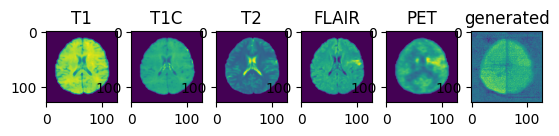

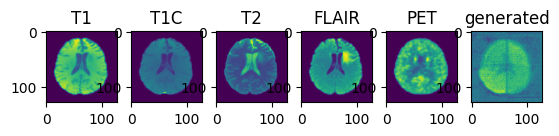

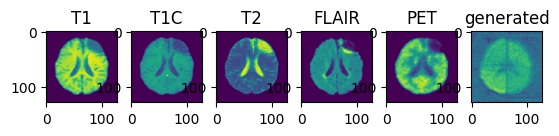

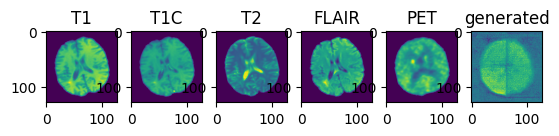

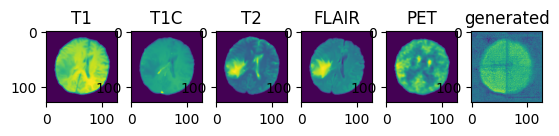

validation avg MS-SSIM: 0.4352 , train avg MS-SSIM: 0.4122
----------
epoch 131/400


Epoch :   0%|                                            | 0/24 [00:00<?, ?it/s]

Epoch :   4%|█▌                                  | 1/24 [01:36<37:01, 96.57s/it]

Epoch :   8%|███                                 | 2/24 [01:39<15:06, 41.19s/it]

Epoch :  12%|████▌                               | 3/24 [01:40<08:08, 23.26s/it]

Epoch :  17%|██████                              | 4/24 [01:42<04:56, 14.83s/it]

Epoch :  21%|███████▌                            | 5/24 [01:44<03:13, 10.17s/it]

Epoch :  25%|█████████                           | 6/24 [01:46<02:12,  7.34s/it]

Epoch :  29%|██████████▌                         | 7/24 [01:48<01:34,  5.57s/it]

Epoch :  33%|████████████                        | 8/24 [01:50<01:10,  4.38s/it]

Epoch :  38%|█████████████▌                      | 9/24 [01:52<00:54,  3.60s/it]

Epoch :  42%|██████████████▌                    | 10/24 [01:54<00:44,  3.19s/it]

Epoch :  46%|████████████████                   | 11/24 [01:56<00:36,  2.78s/it]

Epoch :  50%|█████████████████▌                 | 12/24 [01:58<00:30,  2.52s/it]

Epoch :  54%|██████████████████▉                | 13/24 [02:00<00:25,  2.34s/it]

Epoch :  58%|████████████████████▍              | 14/24 [02:02<00:21,  2.20s/it]

Epoch :  62%|█████████████████████▉             | 15/24 [02:03<00:18,  2.10s/it]

Epoch :  67%|███████████████████████▎           | 16/24 [02:05<00:16,  2.04s/it]

Epoch :  71%|████████████████████████▊          | 17/24 [02:07<00:14,  2.04s/it]

Epoch :  75%|██████████████████████████▎        | 18/24 [02:10<00:12,  2.12s/it]

Epoch :  79%|███████████████████████████▋       | 19/24 [02:12<00:10,  2.05s/it]

Epoch :  83%|█████████████████████████████▏     | 20/24 [02:13<00:07,  1.99s/it]

Epoch :  88%|██████████████████████████████▋    | 21/24 [02:15<00:05,  1.96s/it]

Epoch :  92%|████████████████████████████████   | 22/24 [02:17<00:03,  1.93s/it]

Epoch :  96%|█████████████████████████████████▌ | 23/24 [02:19<00:01,  1.92s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:20<00:00,  1.63s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:23<00:00,  6.00s/it]

----------
epoch 132/400


Epoch :   0%|                                            | 0/24 [00:00<?, ?it/s]

Epoch :   4%|█▌                                  | 1/24 [01:39<38:04, 99.35s/it]

Epoch :   8%|███                                 | 2/24 [01:41<15:24, 42.04s/it]

Epoch :  12%|████▌                               | 3/24 [01:43<08:17, 23.69s/it]

Epoch :  17%|██████                              | 4/24 [01:45<05:01, 15.08s/it]

Epoch :  21%|███████▌                            | 5/24 [01:46<03:16, 10.32s/it]

Epoch :  25%|█████████                           | 6/24 [01:48<02:14,  7.46s/it]

Epoch :  29%|██████████▌                         | 7/24 [01:50<01:35,  5.64s/it]

Epoch :  33%|████████████                        | 8/24 [01:52<01:11,  4.44s/it]

Epoch :  38%|█████████████▌                      | 9/24 [01:54<00:54,  3.64s/it]

Epoch :  42%|██████████████▌                    | 10/24 [01:56<00:44,  3.20s/it]

Epoch :  46%|████████████████                   | 11/24 [01:58<00:36,  2.82s/it]

Epoch :  50%|█████████████████▌                 | 12/24 [02:00<00:30,  2.55s/it]

Epoch :  54%|██████████████████▉                | 13/24 [02:02<00:25,  2.33s/it]

Epoch :  58%|████████████████████▍              | 14/24 [02:04<00:21,  2.18s/it]

Epoch :  62%|█████████████████████▉             | 15/24 [02:06<00:18,  2.08s/it]

Epoch :  67%|███████████████████████▎           | 16/24 [02:08<00:16,  2.05s/it]

Epoch :  71%|████████████████████████▊          | 17/24 [02:09<00:14,  2.02s/it]

Epoch :  75%|██████████████████████████▎        | 18/24 [02:12<00:12,  2.11s/it]

Epoch :  79%|███████████████████████████▋       | 19/24 [02:14<00:10,  2.06s/it]

Epoch :  83%|█████████████████████████████▏     | 20/24 [02:16<00:08,  2.02s/it]

Epoch :  88%|██████████████████████████████▋    | 21/24 [02:18<00:05,  1.98s/it]

Epoch :  92%|████████████████████████████████   | 22/24 [02:20<00:03,  1.97s/it]

Epoch :  96%|█████████████████████████████████▌ | 23/24 [02:21<00:01,  1.94s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:22<00:00,  1.66s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:26<00:00,  6.09s/it]

----------
epoch 133/400


Epoch :   0%|                                            | 0/24 [00:00<?, ?it/s]

Epoch :   4%|█▌                                  | 1/24 [01:38<37:46, 98.54s/it]

Epoch :   8%|███                                 | 2/24 [01:40<15:17, 41.69s/it]

Epoch :  12%|████▌                               | 3/24 [01:42<08:17, 23.69s/it]

Epoch :  17%|██████                              | 4/24 [01:44<05:02, 15.11s/it]

Epoch :  21%|███████▌                            | 5/24 [01:46<03:16, 10.35s/it]

Epoch :  25%|█████████                           | 6/24 [01:48<02:14,  7.46s/it]

Epoch :  29%|██████████▌                         | 7/24 [01:50<01:35,  5.64s/it]

Epoch :  33%|████████████                        | 8/24 [01:52<01:11,  4.46s/it]

Epoch :  38%|█████████████▌                      | 9/24 [01:54<00:54,  3.66s/it]

Epoch :  42%|██████████████▌                    | 10/24 [01:55<00:43,  3.10s/it]

Epoch :  46%|████████████████                   | 11/24 [01:57<00:35,  2.71s/it]

Epoch :  50%|█████████████████▌                 | 12/24 [01:59<00:29,  2.45s/it]

Epoch :  54%|██████████████████▉                | 13/24 [02:01<00:24,  2.27s/it]

Epoch :  58%|████████████████████▍              | 14/24 [02:03<00:21,  2.15s/it]

Epoch :  62%|█████████████████████▉             | 15/24 [02:05<00:18,  2.05s/it]

Epoch :  67%|███████████████████████▎           | 16/24 [02:07<00:15,  2.00s/it]

Epoch :  71%|████████████████████████▊          | 17/24 [02:09<00:13,  2.00s/it]

Epoch :  75%|██████████████████████████▎        | 18/24 [02:11<00:12,  2.13s/it]

Epoch :  79%|███████████████████████████▋       | 19/24 [02:13<00:10,  2.08s/it]

Epoch :  83%|█████████████████████████████▏     | 20/24 [02:15<00:08,  2.03s/it]

Epoch :  88%|██████████████████████████████▋    | 21/24 [02:17<00:06,  2.04s/it]

Epoch :  92%|████████████████████████████████   | 22/24 [02:19<00:03,  1.98s/it]

Epoch :  96%|█████████████████████████████████▌ | 23/24 [02:21<00:01,  1.94s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:22<00:00,  1.66s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:25<00:00,  6.07s/it]

----------
epoch 134/400


Epoch :   0%|                                            | 0/24 [00:00<?, ?it/s]

Epoch :   4%|█▍                                 | 1/24 [01:40<38:35, 100.68s/it]

Epoch :   8%|███                                 | 2/24 [01:42<15:41, 42.79s/it]

Epoch :  12%|████▌                               | 3/24 [01:44<08:26, 24.11s/it]

Epoch :  17%|██████                              | 4/24 [01:46<05:06, 15.33s/it]

Epoch :  21%|███████▌                            | 5/24 [01:48<03:18, 10.47s/it]

Epoch :  25%|█████████                           | 6/24 [01:50<02:16,  7.56s/it]

Epoch :  29%|██████████▌                         | 7/24 [01:52<01:36,  5.70s/it]

Epoch :  33%|████████████                        | 8/24 [01:54<01:11,  4.48s/it]

Epoch :  38%|█████████████▌                      | 9/24 [01:56<00:54,  3.67s/it]

Epoch :  42%|██████████████▌                    | 10/24 [01:57<00:43,  3.12s/it]

Epoch :  46%|████████████████                   | 11/24 [02:00<00:36,  2.84s/it]

Epoch :  50%|█████████████████▌                 | 12/24 [02:02<00:30,  2.53s/it]

Epoch :  54%|██████████████████▉                | 13/24 [02:03<00:25,  2.32s/it]

Epoch :  58%|████████████████████▍              | 14/24 [02:05<00:21,  2.17s/it]

Epoch :  62%|█████████████████████▉             | 15/24 [02:07<00:18,  2.06s/it]

Epoch :  67%|███████████████████████▎           | 16/24 [02:09<00:15,  2.00s/it]

Epoch :  71%|████████████████████████▊          | 17/24 [02:11<00:13,  1.95s/it]

Epoch :  75%|██████████████████████████▎        | 18/24 [02:13<00:12,  2.01s/it]

Epoch :  79%|███████████████████████████▋       | 19/24 [02:15<00:09,  1.97s/it]

Epoch :  83%|█████████████████████████████▏     | 20/24 [02:17<00:07,  1.95s/it]

Epoch :  88%|██████████████████████████████▋    | 21/24 [02:19<00:05,  1.94s/it]

Epoch :  92%|████████████████████████████████   | 22/24 [02:20<00:03,  1.91s/it]

Epoch :  96%|█████████████████████████████████▌ | 23/24 [02:22<00:01,  1.89s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:23<00:00,  1.62s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:26<00:00,  6.12s/it]

----------
epoch 135/400


Epoch :   0%|                                            | 0/24 [00:00<?, ?it/s]

Epoch :   4%|█▌                                  | 1/24 [01:39<38:08, 99.52s/it]

Epoch :   8%|███                                 | 2/24 [01:41<15:25, 42.05s/it]

Epoch :  12%|████▌                               | 3/24 [01:43<08:21, 23.90s/it]

Epoch :  17%|██████                              | 4/24 [01:45<05:04, 15.23s/it]

Epoch :  21%|███████▌                            | 5/24 [01:47<03:19, 10.49s/it]

Epoch :  25%|█████████                           | 6/24 [01:49<02:16,  7.59s/it]

Epoch :  29%|██████████▌                         | 7/24 [01:51<01:37,  5.76s/it]

Epoch :  33%|████████████                        | 8/24 [01:53<01:13,  4.57s/it]

Epoch :  38%|█████████████▌                      | 9/24 [01:55<00:56,  3.75s/it]

Epoch :  42%|██████████████▌                    | 10/24 [01:57<00:45,  3.21s/it]

Epoch :  46%|████████████████                   | 11/24 [01:59<00:38,  2.94s/it]

Epoch :  50%|█████████████████▌                 | 12/24 [02:01<00:31,  2.64s/it]

Epoch :  54%|██████████████████▉                | 13/24 [02:03<00:26,  2.43s/it]

Epoch :  58%|████████████████████▍              | 14/24 [02:05<00:22,  2.27s/it]

Epoch :  62%|█████████████████████▉             | 15/24 [02:07<00:19,  2.16s/it]

Epoch :  67%|███████████████████████▎           | 16/24 [02:09<00:16,  2.07s/it]

Epoch :  71%|████████████████████████▊          | 17/24 [02:11<00:14,  2.02s/it]

Epoch :  75%|██████████████████████████▎        | 18/24 [02:13<00:11,  2.00s/it]

Epoch :  79%|███████████████████████████▋       | 19/24 [02:15<00:10,  2.06s/it]

Epoch :  83%|█████████████████████████████▏     | 20/24 [02:17<00:08,  2.04s/it]

Epoch :  88%|██████████████████████████████▋    | 21/24 [02:19<00:05,  1.99s/it]

Epoch :  92%|████████████████████████████████   | 22/24 [02:21<00:03,  1.95s/it]

Epoch :  96%|█████████████████████████████████▌ | 23/24 [02:23<00:01,  1.96s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:24<00:00,  1.68s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:27<00:00,  6.15s/it]

----------
epoch 136/400


Epoch :   0%|                                            | 0/24 [00:00<?, ?it/s]

Epoch :   4%|█▌                                  | 1/24 [01:36<36:49, 96.08s/it]

Epoch :   8%|███                                 | 2/24 [01:38<14:55, 40.71s/it]

Epoch :  12%|████▌                               | 3/24 [01:40<08:06, 23.18s/it]

Epoch :  17%|██████                              | 4/24 [01:42<04:55, 14.78s/it]

Epoch :  21%|███████▌                            | 5/24 [01:44<03:12, 10.13s/it]

Epoch :  25%|█████████                           | 6/24 [01:45<02:11,  7.32s/it]

Epoch :  29%|██████████▌                         | 7/24 [01:48<01:35,  5.61s/it]

Epoch :  33%|████████████                        | 8/24 [01:50<01:11,  4.45s/it]

Epoch :  38%|█████████████▌                      | 9/24 [01:52<00:55,  3.73s/it]

Epoch :  42%|██████████████▌                    | 10/24 [01:54<00:44,  3.19s/it]

Epoch :  46%|████████████████                   | 11/24 [01:56<00:37,  2.89s/it]

Epoch :  50%|█████████████████▌                 | 12/24 [01:58<00:30,  2.57s/it]

Epoch :  54%|██████████████████▉                | 13/24 [02:00<00:25,  2.35s/it]

Epoch :  58%|████████████████████▍              | 14/24 [02:01<00:22,  2.20s/it]

Epoch :  62%|█████████████████████▉             | 15/24 [02:03<00:19,  2.11s/it]

Epoch :  67%|███████████████████████▎           | 16/24 [02:05<00:16,  2.06s/it]

Epoch :  71%|████████████████████████▊          | 17/24 [02:07<00:14,  2.02s/it]

Epoch :  75%|██████████████████████████▎        | 18/24 [02:09<00:12,  2.06s/it]

Epoch :  79%|███████████████████████████▋       | 19/24 [02:12<00:10,  2.14s/it]

Epoch :  83%|█████████████████████████████▏     | 20/24 [02:14<00:08,  2.05s/it]

Epoch :  88%|██████████████████████████████▋    | 21/24 [02:15<00:05,  1.99s/it]

Epoch :  92%|████████████████████████████████   | 22/24 [02:17<00:03,  1.97s/it]

Epoch :  96%|█████████████████████████████████▌ | 23/24 [02:19<00:01,  1.94s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:20<00:00,  1.66s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:24<00:00,  6.01s/it]

----------
epoch 137/400


Epoch :   0%|                                            | 0/24 [00:00<?, ?it/s]

Epoch :   4%|█▍                                 | 1/24 [01:40<38:27, 100.32s/it]

Epoch :   8%|███                                 | 2/24 [01:42<15:32, 42.39s/it]

Epoch :  12%|████▌                               | 3/24 [01:44<08:25, 24.08s/it]

Epoch :  17%|██████                              | 4/24 [01:46<05:06, 15.31s/it]

Epoch :  21%|███████▌                            | 5/24 [01:48<03:19, 10.51s/it]

Epoch :  25%|█████████                           | 6/24 [01:50<02:17,  7.63s/it]

Epoch :  29%|██████████▌                         | 7/24 [01:52<01:37,  5.75s/it]

Epoch :  33%|████████████                        | 8/24 [01:54<01:12,  4.50s/it]

Epoch :  38%|█████████████▌                      | 9/24 [01:55<00:55,  3.67s/it]

Epoch :  42%|██████████████▌                    | 10/24 [01:57<00:43,  3.10s/it]

Epoch :  46%|████████████████                   | 11/24 [01:59<00:36,  2.80s/it]

Epoch :  50%|█████████████████▌                 | 12/24 [02:01<00:30,  2.51s/it]

Epoch :  54%|██████████████████▉                | 13/24 [02:03<00:25,  2.30s/it]

Epoch :  58%|████████████████████▍              | 14/24 [02:05<00:21,  2.17s/it]

Epoch :  62%|█████████████████████▉             | 15/24 [02:07<00:18,  2.07s/it]

Epoch :  67%|███████████████████████▎           | 16/24 [02:09<00:15,  1.99s/it]

Epoch :  71%|████████████████████████▊          | 17/24 [02:10<00:13,  1.95s/it]

Epoch :  75%|██████████████████████████▎        | 18/24 [02:12<00:11,  1.95s/it]

Epoch :  79%|███████████████████████████▋       | 19/24 [02:15<00:10,  2.02s/it]

Epoch :  83%|█████████████████████████████▏     | 20/24 [02:16<00:07,  1.99s/it]

Epoch :  88%|██████████████████████████████▋    | 21/24 [02:18<00:05,  1.94s/it]

Epoch :  92%|████████████████████████████████   | 22/24 [02:20<00:03,  1.91s/it]

Epoch :  96%|█████████████████████████████████▌ | 23/24 [02:22<00:01,  1.88s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:23<00:00,  1.61s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:26<00:00,  6.12s/it]

----------
epoch 138/400


Epoch :   0%|                                            | 0/24 [00:00<?, ?it/s]

Epoch :   4%|█▌                                  | 1/24 [01:38<37:44, 98.48s/it]

Epoch :   8%|███                                 | 2/24 [01:40<15:17, 41.70s/it]

Epoch :  12%|████▌                               | 3/24 [01:42<08:18, 23.76s/it]

Epoch :  17%|██████                              | 4/24 [01:44<05:03, 15.16s/it]

Epoch :  21%|███████▌                            | 5/24 [01:46<03:17, 10.38s/it]

Epoch :  25%|█████████                           | 6/24 [01:48<02:15,  7.52s/it]

Epoch :  29%|██████████▌                         | 7/24 [01:50<01:36,  5.70s/it]

Epoch :  33%|████████████                        | 8/24 [01:52<01:11,  4.50s/it]

Epoch :  38%|█████████████▌                      | 9/24 [01:54<00:55,  3.67s/it]

Epoch :  42%|██████████████▌                    | 10/24 [01:56<00:44,  3.15s/it]

Epoch :  46%|████████████████                   | 11/24 [01:58<00:37,  2.88s/it]

Epoch :  50%|█████████████████▌                 | 12/24 [02:00<00:31,  2.59s/it]

Epoch :  54%|██████████████████▉                | 13/24 [02:02<00:26,  2.41s/it]

Epoch :  58%|████████████████████▍              | 14/24 [02:04<00:22,  2.25s/it]

Epoch :  62%|█████████████████████▉             | 15/24 [02:06<00:19,  2.16s/it]

Epoch :  67%|███████████████████████▎           | 16/24 [02:08<00:16,  2.08s/it]

Epoch :  71%|████████████████████████▊          | 17/24 [02:10<00:14,  2.04s/it]

Epoch :  75%|██████████████████████████▎        | 18/24 [02:12<00:12,  2.00s/it]

Epoch :  79%|███████████████████████████▋       | 19/24 [02:14<00:09,  1.99s/it]

Epoch :  83%|█████████████████████████████▏     | 20/24 [02:16<00:08,  2.05s/it]

Epoch :  88%|██████████████████████████████▋    | 21/24 [02:18<00:06,  2.00s/it]

Epoch :  92%|████████████████████████████████   | 22/24 [02:20<00:03,  1.98s/it]

Epoch :  96%|█████████████████████████████████▌ | 23/24 [02:22<00:01,  1.96s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:23<00:00,  1.69s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:26<00:00,  6.11s/it]

----------
epoch 139/400


Epoch :   0%|                                            | 0/24 [00:00<?, ?it/s]

Epoch :   4%|█▌                                  | 1/24 [01:39<38:00, 99.14s/it]

Epoch :   8%|███                                 | 2/24 [01:41<15:22, 41.92s/it]

Epoch :  12%|████▌                               | 3/24 [01:42<08:16, 23.62s/it]

Epoch :  17%|██████                              | 4/24 [01:45<05:03, 15.18s/it]

Epoch :  21%|███████▌                            | 5/24 [01:47<03:18, 10.42s/it]

Epoch :  25%|█████████                           | 6/24 [01:49<02:16,  7.58s/it]

Epoch :  29%|██████████▌                         | 7/24 [01:51<01:37,  5.74s/it]

Epoch :  33%|████████████                        | 8/24 [01:53<01:12,  4.52s/it]

Epoch :  38%|█████████████▌                      | 9/24 [01:54<00:55,  3.69s/it]

Epoch :  42%|██████████████▌                    | 10/24 [01:56<00:43,  3.12s/it]

Epoch :  46%|████████████████                   | 11/24 [01:58<00:35,  2.74s/it]

Epoch :  50%|█████████████████▌                 | 12/24 [02:00<00:30,  2.57s/it]

Epoch :  54%|██████████████████▉                | 13/24 [02:02<00:25,  2.36s/it]

Epoch :  58%|████████████████████▍              | 14/24 [02:04<00:22,  2.21s/it]

Epoch :  62%|█████████████████████▉             | 15/24 [02:06<00:18,  2.10s/it]

Epoch :  67%|███████████████████████▎           | 16/24 [02:08<00:16,  2.05s/it]

Epoch :  71%|████████████████████████▊          | 17/24 [02:10<00:14,  2.01s/it]

Epoch :  75%|██████████████████████████▎        | 18/24 [02:12<00:11,  1.99s/it]

Epoch :  79%|███████████████████████████▋       | 19/24 [02:13<00:09,  1.94s/it]

Epoch :  83%|█████████████████████████████▏     | 20/24 [02:16<00:07,  1.99s/it]

Epoch :  88%|██████████████████████████████▋    | 21/24 [02:17<00:05,  1.95s/it]

Epoch :  92%|████████████████████████████████   | 22/24 [02:19<00:03,  1.93s/it]

Epoch :  96%|█████████████████████████████████▌ | 23/24 [02:21<00:01,  1.91s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:22<00:00,  1.63s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:25<00:00,  6.08s/it]

----------
epoch 140/400


Epoch :   0%|                                            | 0/24 [00:00<?, ?it/s]

Epoch :   4%|█▌                                  | 1/24 [01:39<38:05, 99.39s/it]

Epoch :   8%|███                                 | 2/24 [01:41<15:25, 42.06s/it]

Epoch :  12%|████▌                               | 3/24 [01:43<08:17, 23.70s/it]

Epoch :  17%|██████                              | 4/24 [01:45<05:05, 15.28s/it]

Epoch :  21%|███████▌                            | 5/24 [01:47<03:18, 10.45s/it]

Epoch :  25%|█████████                           | 6/24 [01:49<02:15,  7.54s/it]

Epoch :  29%|██████████▌                         | 7/24 [01:51<01:37,  5.74s/it]

Epoch :  33%|████████████                        | 8/24 [01:53<01:12,  4.53s/it]

Epoch :  38%|█████████████▌                      | 9/24 [01:55<00:55,  3.69s/it]

Epoch :  42%|██████████████▌                    | 10/24 [01:57<00:43,  3.14s/it]

Epoch :  46%|████████████████                   | 11/24 [01:58<00:35,  2.77s/it]

Epoch :  50%|█████████████████▌                 | 12/24 [02:01<00:31,  2.61s/it]

Epoch :  54%|██████████████████▉                | 13/24 [02:03<00:26,  2.38s/it]

Epoch :  58%|████████████████████▍              | 14/24 [02:04<00:22,  2.24s/it]

Epoch :  62%|█████████████████████▉             | 15/24 [02:06<00:19,  2.12s/it]

Epoch :  67%|███████████████████████▎           | 16/24 [02:08<00:16,  2.06s/it]

Epoch :  71%|████████████████████████▊          | 17/24 [02:10<00:14,  2.03s/it]

Epoch :  75%|██████████████████████████▎        | 18/24 [02:12<00:11,  1.98s/it]

Epoch :  79%|███████████████████████████▋       | 19/24 [02:14<00:09,  1.96s/it]

Epoch :  83%|█████████████████████████████▏     | 20/24 [02:16<00:07,  1.93s/it]

Epoch :  88%|██████████████████████████████▋    | 21/24 [02:18<00:05,  1.90s/it]

Epoch :  92%|████████████████████████████████   | 22/24 [02:20<00:03,  1.89s/it]

Epoch :  96%|█████████████████████████████████▌ | 23/24 [02:21<00:01,  1.87s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:22<00:00,  1.61s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:26<00:00,  6.10s/it]

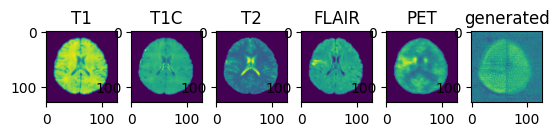

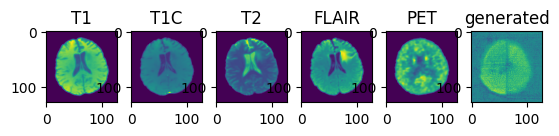

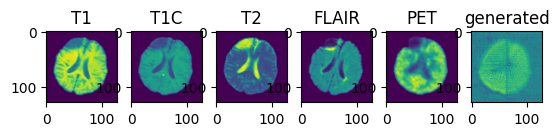

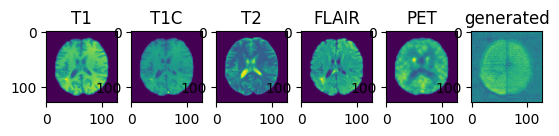

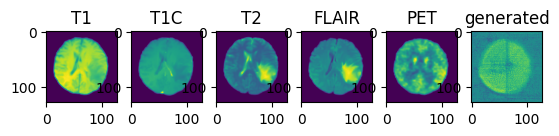

validation avg MS-SSIM: 0.4215 , train avg MS-SSIM: 0.4010
----------
epoch 141/400


Epoch :   0%|                                            | 0/24 [00:00<?, ?it/s]

Epoch :   4%|█▌                                  | 1/24 [01:36<37:08, 96.88s/it]

Epoch :   8%|███                                 | 2/24 [01:39<15:09, 41.35s/it]

Epoch :  12%|████▌                               | 3/24 [01:41<08:10, 23.35s/it]

Epoch :  17%|██████                              | 4/24 [01:43<04:57, 14.86s/it]

Epoch :  21%|███████▌                            | 5/24 [01:44<03:13, 10.17s/it]

Epoch :  25%|█████████                           | 6/24 [01:46<02:12,  7.34s/it]

Epoch :  29%|██████████▌                         | 7/24 [01:48<01:34,  5.54s/it]

Epoch :  33%|████████████                        | 8/24 [01:50<01:09,  4.36s/it]

Epoch :  38%|█████████████▌                      | 9/24 [01:53<00:56,  3.79s/it]

Epoch :  42%|██████████████▌                    | 10/24 [01:55<00:45,  3.27s/it]

Epoch :  46%|████████████████                   | 11/24 [01:57<00:37,  2.90s/it]

Epoch :  50%|█████████████████▌                 | 12/24 [01:59<00:31,  2.61s/it]

Epoch :  54%|██████████████████▉                | 13/24 [02:01<00:26,  2.42s/it]

Epoch :  58%|████████████████████▍              | 14/24 [02:03<00:22,  2.26s/it]

Epoch :  62%|█████████████████████▉             | 15/24 [02:04<00:19,  2.16s/it]

Epoch :  67%|███████████████████████▎           | 16/24 [02:06<00:16,  2.07s/it]

Epoch :  71%|████████████████████████▊          | 17/24 [02:08<00:14,  2.01s/it]

Epoch :  75%|██████████████████████████▎        | 18/24 [02:10<00:12,  2.06s/it]

Epoch :  79%|███████████████████████████▋       | 19/24 [02:12<00:09,  1.99s/it]

Epoch :  83%|█████████████████████████████▏     | 20/24 [02:14<00:07,  1.95s/it]

Epoch :  88%|██████████████████████████████▋    | 21/24 [02:16<00:05,  1.96s/it]

Epoch :  92%|████████████████████████████████   | 22/24 [02:18<00:03,  1.93s/it]

Epoch :  96%|█████████████████████████████████▌ | 23/24 [02:20<00:01,  1.92s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:21<00:00,  1.65s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:24<00:00,  6.03s/it]

----------
epoch 142/400


Epoch :   0%|                                            | 0/24 [00:00<?, ?it/s]

Epoch :   4%|█▍                                 | 1/24 [01:50<42:24, 110.65s/it]

Epoch :   8%|███                                 | 2/24 [01:53<17:14, 47.01s/it]

Epoch :  12%|████▌                               | 3/24 [01:54<09:14, 26.40s/it]

Epoch :  17%|██████                              | 4/24 [01:56<05:34, 16.71s/it]

Epoch :  21%|███████▌                            | 5/24 [01:58<03:37, 11.46s/it]

Epoch :  25%|█████████                           | 6/24 [02:00<02:28,  8.24s/it]

Epoch :  29%|██████████▌                         | 7/24 [02:02<01:45,  6.18s/it]

Epoch :  33%|████████████                        | 8/24 [02:04<01:17,  4.83s/it]

Epoch :  38%|█████████████▌                      | 9/24 [02:06<00:59,  3.95s/it]

Epoch :  42%|██████████████▌                    | 10/24 [02:09<00:48,  3.43s/it]

Epoch :  46%|████████████████                   | 11/24 [02:11<00:38,  2.98s/it]

Epoch :  50%|█████████████████▌                 | 12/24 [02:13<00:32,  2.68s/it]

Epoch :  54%|██████████████████▉                | 13/24 [02:15<00:27,  2.46s/it]

Epoch :  58%|████████████████████▍              | 14/24 [02:16<00:22,  2.30s/it]

Epoch :  62%|█████████████████████▉             | 15/24 [02:18<00:19,  2.21s/it]

Epoch :  67%|███████████████████████▎           | 16/24 [02:20<00:16,  2.12s/it]

Epoch :  71%|████████████████████████▊          | 17/24 [02:22<00:14,  2.07s/it]

Epoch :  75%|██████████████████████████▎        | 18/24 [02:25<00:12,  2.12s/it]

Epoch :  79%|███████████████████████████▋       | 19/24 [02:26<00:10,  2.05s/it]

Epoch :  83%|█████████████████████████████▏     | 20/24 [02:28<00:08,  2.01s/it]

Epoch :  88%|██████████████████████████████▋    | 21/24 [02:30<00:05,  1.97s/it]

Epoch :  92%|████████████████████████████████   | 22/24 [02:32<00:03,  1.96s/it]

Epoch :  96%|█████████████████████████████████▌ | 23/24 [02:34<00:01,  1.96s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:35<00:00,  1.67s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:38<00:00,  6.62s/it]

----------
epoch 143/400


Epoch :   0%|                                            | 0/24 [00:00<?, ?it/s]

Epoch :   4%|█▍                                 | 1/24 [01:41<38:44, 101.05s/it]

Epoch :   8%|███                                 | 2/24 [01:44<15:56, 43.50s/it]

Epoch :  12%|████▌                               | 3/24 [01:46<08:34, 24.48s/it]

Epoch :  17%|██████                              | 4/24 [01:47<05:11, 15.56s/it]

Epoch :  21%|███████▌                            | 5/24 [01:49<03:22, 10.64s/it]

Epoch :  25%|█████████                           | 6/24 [01:51<02:18,  7.70s/it]

Epoch :  29%|██████████▌                         | 7/24 [01:53<01:38,  5.82s/it]

Epoch :  33%|████████████                        | 8/24 [01:55<01:13,  4.58s/it]

Epoch :  38%|█████████████▌                      | 9/24 [01:57<00:57,  3.83s/it]

Epoch :  42%|██████████████▌                    | 10/24 [02:00<00:47,  3.40s/it]

Epoch :  46%|████████████████                   | 11/24 [02:02<00:38,  2.94s/it]

Epoch :  50%|█████████████████▌                 | 12/24 [02:04<00:31,  2.62s/it]

Epoch :  54%|██████████████████▉                | 13/24 [02:06<00:26,  2.40s/it]

Epoch :  58%|████████████████████▍              | 14/24 [02:07<00:22,  2.24s/it]

Epoch :  62%|█████████████████████▉             | 15/24 [02:09<00:19,  2.12s/it]

Epoch :  67%|███████████████████████▎           | 16/24 [02:11<00:16,  2.05s/it]

Epoch :  71%|████████████████████████▊          | 17/24 [02:13<00:14,  2.02s/it]

Epoch :  75%|██████████████████████████▎        | 18/24 [02:15<00:11,  1.98s/it]

Epoch :  79%|███████████████████████████▋       | 19/24 [02:18<00:11,  2.28s/it]

Epoch :  83%|█████████████████████████████▏     | 20/24 [02:20<00:08,  2.18s/it]

Epoch :  88%|██████████████████████████████▋    | 21/24 [02:22<00:06,  2.09s/it]

Epoch :  92%|████████████████████████████████   | 22/24 [02:24<00:04,  2.02s/it]

Epoch :  96%|█████████████████████████████████▌ | 23/24 [02:26<00:01,  1.98s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:27<00:00,  1.71s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:30<00:00,  6.27s/it]

----------
epoch 144/400


Epoch :   0%|                                            | 0/24 [00:00<?, ?it/s]

Epoch :   4%|█▌                                  | 1/24 [01:39<38:17, 99.89s/it]

Epoch :   8%|███                                 | 2/24 [01:41<15:30, 42.28s/it]

Epoch :  12%|████▌                               | 3/24 [01:44<08:24, 24.03s/it]

Epoch :  17%|██████                              | 4/24 [01:46<05:05, 15.28s/it]

Epoch :  21%|███████▌                            | 5/24 [01:48<03:20, 10.53s/it]

Epoch :  25%|█████████                           | 6/24 [01:50<02:18,  7.69s/it]

Epoch :  29%|██████████▌                         | 7/24 [01:52<01:39,  5.84s/it]

Epoch :  33%|████████████                        | 8/24 [01:54<01:13,  4.60s/it]

Epoch :  38%|█████████████▌                      | 9/24 [01:56<00:56,  3.78s/it]

Epoch :  42%|██████████████▌                    | 10/24 [01:58<00:44,  3.20s/it]

Epoch :  46%|████████████████                   | 11/24 [02:00<00:37,  2.89s/it]

Epoch :  50%|█████████████████▌                 | 12/24 [02:02<00:31,  2.60s/it]

Epoch :  54%|██████████████████▉                | 13/24 [02:04<00:26,  2.37s/it]

Epoch :  58%|████████████████████▍              | 14/24 [02:06<00:22,  2.25s/it]

Epoch :  62%|█████████████████████▉             | 15/24 [02:08<00:20,  2.26s/it]

Epoch :  67%|███████████████████████▎           | 16/24 [02:10<00:17,  2.18s/it]

Epoch :  71%|████████████████████████▊          | 17/24 [02:12<00:14,  2.11s/it]

Epoch :  75%|██████████████████████████▎        | 18/24 [02:14<00:12,  2.05s/it]

Epoch :  79%|███████████████████████████▋       | 19/24 [02:16<00:10,  2.11s/it]

Epoch :  83%|█████████████████████████████▏     | 20/24 [02:18<00:08,  2.04s/it]

Epoch :  88%|██████████████████████████████▋    | 21/24 [02:20<00:05,  1.99s/it]

Epoch :  92%|████████████████████████████████   | 22/24 [02:22<00:03,  1.95s/it]

Epoch :  96%|█████████████████████████████████▌ | 23/24 [02:23<00:01,  1.92s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:24<00:00,  1.64s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:28<00:00,  6.18s/it]

----------
epoch 145/400


Epoch :   0%|                                            | 0/24 [00:00<?, ?it/s]

Epoch :   4%|█▌                                  | 1/24 [01:39<37:57, 99.01s/it]

Epoch :   8%|███                                 | 2/24 [01:40<15:21, 41.89s/it]

Epoch :  12%|████▌                               | 3/24 [01:43<08:20, 23.81s/it]

Epoch :  17%|██████                              | 4/24 [01:45<05:03, 15.15s/it]

Epoch :  21%|███████▌                            | 5/24 [01:47<03:17, 10.38s/it]

Epoch :  25%|█████████                           | 6/24 [01:48<02:15,  7.53s/it]

Epoch :  29%|██████████▌                         | 7/24 [01:50<01:36,  5.70s/it]

Epoch :  33%|████████████                        | 8/24 [01:52<01:11,  4.49s/it]

Epoch :  38%|█████████████▌                      | 9/24 [01:54<00:55,  3.68s/it]

Epoch :  42%|██████████████▌                    | 10/24 [01:56<00:43,  3.12s/it]

Epoch :  46%|████████████████                   | 11/24 [01:58<00:37,  2.85s/it]

Epoch :  50%|█████████████████▌                 | 12/24 [02:00<00:30,  2.56s/it]

Epoch :  54%|██████████████████▉                | 13/24 [02:02<00:26,  2.37s/it]

Epoch :  58%|████████████████████▍              | 14/24 [02:04<00:22,  2.23s/it]

Epoch :  62%|█████████████████████▉             | 15/24 [02:06<00:19,  2.15s/it]

Epoch :  67%|███████████████████████▎           | 16/24 [02:08<00:17,  2.13s/it]

Epoch :  71%|████████████████████████▊          | 17/24 [02:10<00:14,  2.07s/it]

Epoch :  75%|██████████████████████████▎        | 18/24 [02:12<00:12,  2.03s/it]

Epoch :  79%|███████████████████████████▋       | 19/24 [02:14<00:10,  2.12s/it]

Epoch :  83%|█████████████████████████████▏     | 20/24 [02:16<00:08,  2.06s/it]

Epoch :  88%|██████████████████████████████▋    | 21/24 [02:18<00:06,  2.01s/it]

Epoch :  92%|████████████████████████████████   | 22/24 [02:20<00:03,  1.98s/it]

Epoch :  96%|█████████████████████████████████▌ | 23/24 [02:22<00:01,  1.95s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:23<00:00,  1.67s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:27<00:00,  6.15s/it]

----------
epoch 146/400


Epoch :   0%|                                            | 0/24 [00:00<?, ?it/s]

Epoch :   4%|█▍                                 | 1/24 [01:54<43:49, 114.32s/it]

Epoch :   8%|███                                 | 2/24 [01:56<17:40, 48.21s/it]

Epoch :  12%|████▌                               | 3/24 [01:58<09:33, 27.30s/it]

Epoch :  17%|██████                              | 4/24 [02:00<05:45, 17.28s/it]

Epoch :  21%|███████▌                            | 5/24 [02:02<03:42, 11.73s/it]

Epoch :  25%|█████████                           | 6/24 [02:04<02:31,  8.40s/it]

Epoch :  29%|██████████▌                         | 7/24 [02:06<01:46,  6.25s/it]

Epoch :  33%|████████████                        | 8/24 [02:08<01:17,  4.85s/it]

Epoch :  38%|█████████████▌                      | 9/24 [02:09<00:58,  3.91s/it]

Epoch :  42%|██████████████▌                    | 10/24 [02:11<00:46,  3.29s/it]

Epoch :  46%|████████████████                   | 11/24 [02:13<00:37,  2.88s/it]

Epoch :  50%|█████████████████▌                 | 12/24 [02:16<00:32,  2.70s/it]

Epoch :  54%|██████████████████▉                | 13/24 [02:17<00:26,  2.45s/it]

Epoch :  58%|████████████████████▍              | 14/24 [02:19<00:22,  2.30s/it]

Epoch :  62%|█████████████████████▉             | 15/24 [02:21<00:19,  2.19s/it]

Epoch :  67%|███████████████████████▎           | 16/24 [02:23<00:16,  2.09s/it]

Epoch :  71%|████████████████████████▊          | 17/24 [02:25<00:14,  2.01s/it]

Epoch :  75%|██████████████████████████▎        | 18/24 [02:27<00:11,  1.96s/it]

Epoch :  79%|███████████████████████████▋       | 19/24 [02:29<00:09,  2.00s/it]

Epoch :  83%|█████████████████████████████▏     | 20/24 [02:31<00:07,  1.94s/it]

Epoch :  88%|██████████████████████████████▋    | 21/24 [02:33<00:05,  1.91s/it]

Epoch :  92%|████████████████████████████████   | 22/24 [02:34<00:03,  1.90s/it]

Epoch :  96%|█████████████████████████████████▌ | 23/24 [02:36<00:01,  1.89s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:37<00:00,  1.64s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:41<00:00,  6.72s/it]

----------
epoch 147/400


Epoch :   0%|                                            | 0/24 [00:00<?, ?it/s]

Epoch :   4%|█▌                                  | 1/24 [01:38<37:52, 98.83s/it]

Epoch :   8%|███                                 | 2/24 [01:40<15:21, 41.90s/it]

Epoch :  12%|████▌                               | 3/24 [01:42<08:17, 23.68s/it]

Epoch :  17%|██████                              | 4/24 [01:45<05:06, 15.31s/it]

Epoch :  21%|███████▌                            | 5/24 [01:47<03:19, 10.52s/it]

Epoch :  25%|█████████                           | 6/24 [01:49<02:16,  7.60s/it]

Epoch :  29%|██████████▌                         | 7/24 [01:51<01:37,  5.76s/it]

Epoch :  33%|████████████                        | 8/24 [01:53<01:12,  4.54s/it]

Epoch :  38%|█████████████▌                      | 9/24 [01:55<00:55,  3.70s/it]

Epoch :  42%|██████████████▌                    | 10/24 [01:56<00:43,  3.13s/it]

Epoch :  46%|████████████████                   | 11/24 [01:58<00:35,  2.76s/it]

Epoch :  50%|█████████████████▌                 | 12/24 [02:01<00:31,  2.58s/it]

Epoch :  54%|██████████████████▉                | 13/24 [02:02<00:25,  2.36s/it]

Epoch :  58%|████████████████████▍              | 14/24 [02:04<00:22,  2.23s/it]

Epoch :  62%|█████████████████████▉             | 15/24 [02:06<00:19,  2.13s/it]

Epoch :  67%|███████████████████████▎           | 16/24 [02:08<00:16,  2.06s/it]

Epoch :  71%|████████████████████████▊          | 17/24 [02:10<00:13,  2.00s/it]

Epoch :  75%|██████████████████████████▎        | 18/24 [02:12<00:11,  1.97s/it]

Epoch :  79%|███████████████████████████▋       | 19/24 [02:14<00:09,  1.95s/it]

Epoch :  83%|█████████████████████████████▏     | 20/24 [02:16<00:08,  2.04s/it]

Epoch :  88%|██████████████████████████████▋    | 21/24 [02:18<00:05,  1.99s/it]

Epoch :  92%|████████████████████████████████   | 22/24 [02:20<00:03,  1.95s/it]

Epoch :  96%|█████████████████████████████████▌ | 23/24 [02:22<00:01,  1.92s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:23<00:00,  1.65s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:26<00:00,  6.12s/it]

----------
epoch 148/400


Epoch :   0%|                                            | 0/24 [00:00<?, ?it/s]

Epoch :   4%|█▌                                  | 1/24 [01:39<38:10, 99.58s/it]

Epoch :   8%|███                                 | 2/24 [01:41<15:27, 42.15s/it]

Epoch :  12%|████▌                               | 3/24 [01:43<08:18, 23.75s/it]

Epoch :  17%|██████                              | 4/24 [01:45<05:01, 15.10s/it]

Epoch :  21%|███████▌                            | 5/24 [01:47<03:18, 10.46s/it]

Epoch :  25%|█████████                           | 6/24 [01:49<02:15,  7.53s/it]

Epoch :  29%|██████████▌                         | 7/24 [01:51<01:37,  5.72s/it]

Epoch :  33%|████████████                        | 8/24 [01:53<01:12,  4.55s/it]

Epoch :  38%|█████████████▌                      | 9/24 [01:55<00:55,  3.71s/it]

Epoch :  42%|██████████████▌                    | 10/24 [01:57<00:44,  3.18s/it]

Epoch :  46%|████████████████                   | 11/24 [01:59<00:36,  2.79s/it]

Epoch :  50%|█████████████████▌                 | 12/24 [02:00<00:30,  2.51s/it]

Epoch :  54%|██████████████████▉                | 13/24 [02:03<00:26,  2.41s/it]

Epoch :  58%|████████████████████▍              | 14/24 [02:05<00:22,  2.26s/it]

Epoch :  62%|█████████████████████▉             | 15/24 [02:06<00:19,  2.16s/it]

Epoch :  67%|███████████████████████▎           | 16/24 [02:08<00:16,  2.07s/it]

Epoch :  71%|████████████████████████▊          | 17/24 [02:10<00:14,  2.02s/it]

Epoch :  75%|██████████████████████████▎        | 18/24 [02:12<00:12,  2.01s/it]

Epoch :  79%|███████████████████████████▋       | 19/24 [02:14<00:09,  2.00s/it]

Epoch :  83%|█████████████████████████████▏     | 20/24 [02:16<00:07,  1.95s/it]

Epoch :  88%|██████████████████████████████▋    | 21/24 [02:18<00:06,  2.02s/it]

Epoch :  92%|████████████████████████████████   | 22/24 [02:20<00:03,  1.98s/it]

Epoch :  96%|█████████████████████████████████▌ | 23/24 [02:22<00:01,  1.95s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:23<00:00,  1.67s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:26<00:00,  6.12s/it]

----------
epoch 149/400


Epoch :   0%|                                            | 0/24 [00:00<?, ?it/s]

Epoch :   4%|█▌                                  | 1/24 [01:35<36:44, 95.85s/it]

Epoch :   8%|███                                 | 2/24 [01:37<14:53, 40.61s/it]

Epoch :  12%|████▌                               | 3/24 [01:39<08:01, 22.94s/it]

Epoch :  17%|██████                              | 4/24 [01:41<04:52, 14.62s/it]

Epoch :  21%|███████▌                            | 5/24 [01:43<03:13, 10.16s/it]

Epoch :  25%|█████████                           | 6/24 [01:45<02:12,  7.34s/it]

Epoch :  29%|██████████▌                         | 7/24 [01:47<01:34,  5.55s/it]

Epoch :  33%|████████████                        | 8/24 [01:49<01:11,  4.45s/it]

Epoch :  38%|█████████████▌                      | 9/24 [01:51<00:54,  3.64s/it]

Epoch :  42%|██████████████▌                    | 10/24 [01:53<00:43,  3.10s/it]

Epoch :  46%|████████████████                   | 11/24 [01:55<00:35,  2.74s/it]

Epoch :  50%|█████████████████▌                 | 12/24 [01:57<00:29,  2.48s/it]

Epoch :  54%|██████████████████▉                | 13/24 [01:59<00:26,  2.40s/it]

Epoch :  58%|████████████████████▍              | 14/24 [02:01<00:22,  2.25s/it]

Epoch :  62%|█████████████████████▉             | 15/24 [02:03<00:19,  2.14s/it]

Epoch :  67%|███████████████████████▎           | 16/24 [02:05<00:16,  2.10s/it]

Epoch :  71%|████████████████████████▊          | 17/24 [02:07<00:14,  2.03s/it]

Epoch :  75%|██████████████████████████▎        | 18/24 [02:08<00:11,  1.97s/it]

Epoch :  79%|███████████████████████████▋       | 19/24 [02:10<00:09,  1.93s/it]

Epoch :  83%|█████████████████████████████▏     | 20/24 [02:12<00:07,  1.91s/it]

Epoch :  88%|██████████████████████████████▋    | 21/24 [02:14<00:05,  1.99s/it]

Epoch :  92%|████████████████████████████████   | 22/24 [02:16<00:03,  1.99s/it]

Epoch :  96%|█████████████████████████████████▌ | 23/24 [02:18<00:01,  1.95s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:19<00:00,  1.66s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:22<00:00,  5.95s/it]

----------
epoch 150/400


Epoch :   0%|                                            | 0/24 [00:00<?, ?it/s]

Epoch :   4%|█▍                                 | 1/24 [01:53<43:34, 113.69s/it]

Epoch :   8%|███                                 | 2/24 [01:55<17:37, 48.07s/it]

Epoch :  12%|████▌                               | 3/24 [01:57<09:26, 26.98s/it]

Epoch :  17%|██████                              | 4/24 [01:59<05:42, 17.10s/it]

Epoch :  21%|███████▌                            | 5/24 [02:02<03:43, 11.78s/it]

Epoch :  25%|█████████                           | 6/24 [02:04<02:32,  8.47s/it]

Epoch :  29%|██████████▌                         | 7/24 [02:05<01:47,  6.31s/it]

Epoch :  33%|████████████                        | 8/24 [02:07<01:18,  4.89s/it]

Epoch :  38%|█████████████▌                      | 9/24 [02:09<00:59,  3.94s/it]

Epoch :  42%|██████████████▌                    | 10/24 [02:11<00:46,  3.30s/it]

Epoch :  46%|████████████████                   | 11/24 [02:13<00:37,  2.86s/it]

Epoch :  50%|█████████████████▌                 | 12/24 [02:15<00:30,  2.57s/it]

Epoch :  54%|██████████████████▉                | 13/24 [02:17<00:25,  2.36s/it]

Epoch :  58%|████████████████████▍              | 14/24 [02:19<00:23,  2.33s/it]

Epoch :  62%|█████████████████████▉             | 15/24 [02:21<00:19,  2.22s/it]

Epoch :  67%|███████████████████████▎           | 16/24 [02:23<00:16,  2.10s/it]

Epoch :  71%|████████████████████████▊          | 17/24 [02:24<00:14,  2.02s/it]

Epoch :  75%|██████████████████████████▎        | 18/24 [02:26<00:11,  1.97s/it]

Epoch :  79%|███████████████████████████▋       | 19/24 [02:28<00:09,  1.94s/it]

Epoch :  83%|█████████████████████████████▏     | 20/24 [02:30<00:07,  1.91s/it]

Epoch :  88%|██████████████████████████████▋    | 21/24 [02:32<00:05,  1.97s/it]

Epoch :  92%|████████████████████████████████   | 22/24 [02:34<00:04,  2.00s/it]

Epoch :  96%|█████████████████████████████████▌ | 23/24 [02:36<00:02,  2.04s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:37<00:00,  1.72s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:41<00:00,  6.71s/it]

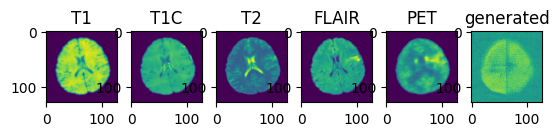

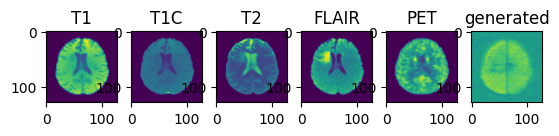

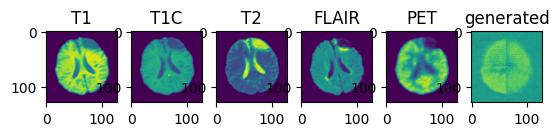

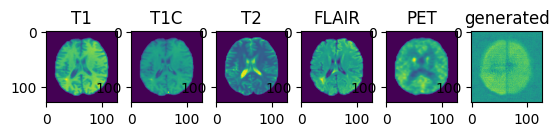

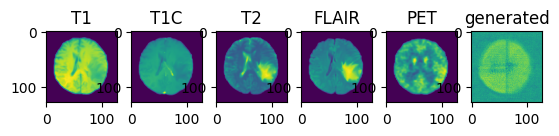

validation avg MS-SSIM: 0.4332 , train avg MS-SSIM: 0.4100
----------
epoch 151/400


Epoch :   0%|                                            | 0/24 [00:00<?, ?it/s]

Epoch :   4%|█▌                                  | 1/24 [01:38<37:43, 98.40s/it]

Epoch :   8%|███                                 | 2/24 [01:40<15:16, 41.65s/it]

Epoch :  12%|████▌                               | 3/24 [01:42<08:13, 23.51s/it]

Epoch :  17%|██████                              | 4/24 [01:44<05:00, 15.03s/it]

Epoch :  21%|███████▌                            | 5/24 [01:46<03:16, 10.32s/it]

Epoch :  25%|█████████                           | 6/24 [01:48<02:14,  7.45s/it]

Epoch :  29%|██████████▌                         | 7/24 [01:50<01:36,  5.66s/it]

Epoch :  33%|████████████                        | 8/24 [01:52<01:14,  4.63s/it]

Epoch :  38%|█████████████▌                      | 9/24 [01:54<00:56,  3.76s/it]

Epoch :  42%|██████████████▌                    | 10/24 [01:56<00:44,  3.19s/it]

Epoch :  46%|████████████████                   | 11/24 [01:58<00:36,  2.80s/it]

Epoch :  50%|█████████████████▌                 | 12/24 [02:00<00:30,  2.55s/it]

Epoch :  54%|██████████████████▉                | 13/24 [02:02<00:26,  2.37s/it]

Epoch :  58%|████████████████████▍              | 14/24 [02:04<00:22,  2.22s/it]

Epoch :  62%|█████████████████████▉             | 15/24 [02:06<00:19,  2.22s/it]

Epoch :  67%|███████████████████████▎           | 16/24 [02:08<00:16,  2.11s/it]

Epoch :  71%|████████████████████████▊          | 17/24 [02:09<00:14,  2.03s/it]

Epoch :  75%|██████████████████████████▎        | 18/24 [02:11<00:11,  1.97s/it]

Epoch :  79%|███████████████████████████▋       | 19/24 [02:13<00:09,  1.94s/it]

Epoch :  83%|█████████████████████████████▏     | 20/24 [02:15<00:07,  1.94s/it]

Epoch :  88%|██████████████████████████████▋    | 21/24 [02:17<00:05,  1.97s/it]

Epoch :  92%|████████████████████████████████   | 22/24 [02:19<00:03,  2.00s/it]

Epoch :  96%|█████████████████████████████████▌ | 23/24 [02:21<00:01,  1.97s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:22<00:00,  1.72s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:26<00:00,  6.09s/it]

----------
epoch 152/400


Epoch :   0%|                                            | 0/24 [00:00<?, ?it/s]

Epoch :   4%|█▌                                  | 1/24 [01:35<36:40, 95.66s/it]

Epoch :   8%|███                                 | 2/24 [01:37<14:52, 40.59s/it]

Epoch :  12%|████▌                               | 3/24 [01:39<08:03, 23.02s/it]

Epoch :  17%|██████                              | 4/24 [01:41<04:53, 14.68s/it]

Epoch :  21%|███████▌                            | 5/24 [01:43<03:11, 10.06s/it]

Epoch :  25%|█████████                           | 6/24 [01:45<02:11,  7.28s/it]

Epoch :  29%|██████████▌                         | 7/24 [01:47<01:33,  5.51s/it]

Epoch :  33%|████████████                        | 8/24 [01:49<01:12,  4.54s/it]

Epoch :  38%|█████████████▌                      | 9/24 [01:51<00:56,  3.73s/it]

Epoch :  42%|██████████████▌                    | 10/24 [01:53<00:44,  3.17s/it]

Epoch :  46%|████████████████                   | 11/24 [01:55<00:36,  2.81s/it]

Epoch :  50%|█████████████████▌                 | 12/24 [01:57<00:31,  2.61s/it]

Epoch :  54%|██████████████████▉                | 13/24 [01:59<00:26,  2.39s/it]

Epoch :  58%|████████████████████▍              | 14/24 [02:01<00:22,  2.24s/it]

Epoch :  62%|█████████████████████▉             | 15/24 [02:03<00:19,  2.13s/it]

Epoch :  67%|███████████████████████▎           | 16/24 [02:05<00:17,  2.15s/it]

Epoch :  71%|████████████████████████▊          | 17/24 [02:07<00:14,  2.05s/it]

Epoch :  75%|██████████████████████████▎        | 18/24 [02:09<00:11,  1.99s/it]

Epoch :  79%|███████████████████████████▋       | 19/24 [02:11<00:09,  1.94s/it]

Epoch :  83%|█████████████████████████████▏     | 20/24 [02:12<00:07,  1.91s/it]

Epoch :  88%|██████████████████████████████▋    | 21/24 [02:14<00:05,  1.90s/it]

Epoch :  92%|████████████████████████████████   | 22/24 [02:16<00:03,  1.90s/it]

Epoch :  96%|█████████████████████████████████▌ | 23/24 [02:18<00:01,  1.92s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:19<00:00,  1.64s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:23<00:00,  5.96s/it]

----------
epoch 153/400


Epoch :   0%|                                            | 0/24 [00:00<?, ?it/s]

Epoch :   4%|█▌                                  | 1/24 [01:39<38:18, 99.95s/it]

Epoch :   8%|███                                 | 2/24 [01:41<15:30, 42.29s/it]

Epoch :  12%|████▌                               | 3/24 [01:43<08:20, 23.84s/it]

Epoch :  17%|██████                              | 4/24 [01:45<05:04, 15.21s/it]

Epoch :  21%|███████▌                            | 5/24 [01:47<03:18, 10.47s/it]

Epoch :  25%|█████████                           | 6/24 [01:49<02:17,  7.63s/it]

Epoch :  29%|██████████▌                         | 7/24 [01:51<01:38,  5.79s/it]

Epoch :  33%|████████████                        | 8/24 [01:54<01:14,  4.68s/it]

Epoch :  38%|█████████████▌                      | 9/24 [01:56<00:57,  3.81s/it]

Epoch :  42%|██████████████▌                    | 10/24 [01:58<00:45,  3.27s/it]

Epoch :  46%|████████████████                   | 11/24 [02:00<00:37,  2.89s/it]

Epoch :  50%|█████████████████▌                 | 12/24 [02:02<00:31,  2.62s/it]

Epoch :  54%|██████████████████▉                | 13/24 [02:04<00:26,  2.39s/it]

Epoch :  58%|████████████████████▍              | 14/24 [02:06<00:22,  2.28s/it]

Epoch :  62%|█████████████████████▉             | 15/24 [02:08<00:20,  2.23s/it]

Epoch :  67%|███████████████████████▎           | 16/24 [02:10<00:18,  2.33s/it]

Epoch :  71%|████████████████████████▊          | 17/24 [02:12<00:15,  2.22s/it]

Epoch :  75%|██████████████████████████▎        | 18/24 [02:14<00:12,  2.15s/it]

Epoch :  79%|███████████████████████████▋       | 19/24 [02:16<00:10,  2.08s/it]

Epoch :  83%|█████████████████████████████▏     | 20/24 [02:18<00:08,  2.02s/it]

Epoch :  88%|██████████████████████████████▋    | 21/24 [02:20<00:05,  1.99s/it]

Epoch :  92%|████████████████████████████████   | 22/24 [02:22<00:03,  1.99s/it]

Epoch :  96%|█████████████████████████████████▌ | 23/24 [02:24<00:01,  1.96s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:25<00:00,  1.67s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:28<00:00,  6.19s/it]

----------
epoch 154/400


Epoch :   0%|                                            | 0/24 [00:00<?, ?it/s]

Epoch :   4%|█▍                                 | 1/24 [01:40<38:42, 100.98s/it]

Epoch :   8%|███                                 | 2/24 [01:43<15:41, 42.78s/it]

Epoch :  12%|████▌                               | 3/24 [01:44<08:26, 24.11s/it]

Epoch :  17%|██████                              | 4/24 [01:46<05:06, 15.34s/it]

Epoch :  21%|███████▌                            | 5/24 [01:48<03:19, 10.49s/it]

Epoch :  25%|█████████                           | 6/24 [01:50<02:16,  7.57s/it]

Epoch :  29%|██████████▌                         | 7/24 [01:52<01:36,  5.70s/it]

Epoch :  33%|████████████                        | 8/24 [01:54<01:11,  4.48s/it]

Epoch :  38%|█████████████▌                      | 9/24 [01:56<00:56,  3.80s/it]

Epoch :  42%|██████████████▌                    | 10/24 [01:58<00:45,  3.21s/it]

Epoch :  46%|████████████████                   | 11/24 [02:00<00:37,  2.88s/it]

Epoch :  50%|█████████████████▌                 | 12/24 [02:02<00:30,  2.56s/it]

Epoch :  54%|██████████████████▉                | 13/24 [02:04<00:25,  2.35s/it]

Epoch :  58%|████████████████████▍              | 14/24 [02:06<00:21,  2.20s/it]

Epoch :  62%|█████████████████████▉             | 15/24 [02:08<00:18,  2.10s/it]

Epoch :  67%|███████████████████████▎           | 16/24 [02:09<00:16,  2.04s/it]

Epoch :  71%|████████████████████████▊          | 17/24 [02:12<00:14,  2.07s/it]

Epoch :  75%|██████████████████████████▎        | 18/24 [02:13<00:12,  2.01s/it]

Epoch :  79%|███████████████████████████▋       | 19/24 [02:15<00:09,  1.97s/it]

Epoch :  83%|█████████████████████████████▏     | 20/24 [02:17<00:07,  1.94s/it]

Epoch :  88%|██████████████████████████████▋    | 21/24 [02:19<00:05,  1.94s/it]

Epoch :  92%|████████████████████████████████   | 22/24 [02:21<00:03,  1.96s/it]

Epoch :  96%|█████████████████████████████████▌ | 23/24 [02:23<00:01,  1.93s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:24<00:00,  1.65s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:27<00:00,  6.16s/it]

----------
epoch 155/400


Epoch :   0%|                                            | 0/24 [00:00<?, ?it/s]

Epoch :   4%|█▌                                  | 1/24 [01:39<38:08, 99.48s/it]

Epoch :   8%|███                                 | 2/24 [01:41<15:24, 42.04s/it]

Epoch :  12%|████▌                               | 3/24 [01:43<08:17, 23.69s/it]

Epoch :  17%|██████                              | 4/24 [01:45<05:01, 15.09s/it]

Epoch :  21%|███████▌                            | 5/24 [01:47<03:16, 10.35s/it]

Epoch :  25%|█████████                           | 6/24 [01:49<02:15,  7.52s/it]

Epoch :  29%|██████████▌                         | 7/24 [01:50<01:36,  5.68s/it]

Epoch :  33%|████████████                        | 8/24 [01:52<01:11,  4.46s/it]

Epoch :  38%|█████████████▌                      | 9/24 [01:54<00:54,  3.65s/it]

Epoch :  42%|██████████████▌                    | 10/24 [01:56<00:45,  3.22s/it]

Epoch :  46%|████████████████                   | 11/24 [01:58<00:36,  2.80s/it]

Epoch :  50%|█████████████████▌                 | 12/24 [02:00<00:30,  2.52s/it]

Epoch :  54%|██████████████████▉                | 13/24 [02:02<00:25,  2.34s/it]

Epoch :  58%|████████████████████▍              | 14/24 [02:04<00:22,  2.22s/it]

Epoch :  62%|█████████████████████▉             | 15/24 [02:06<00:19,  2.12s/it]

Epoch :  67%|███████████████████████▎           | 16/24 [02:08<00:16,  2.05s/it]

Epoch :  71%|████████████████████████▊          | 17/24 [02:10<00:13,  1.99s/it]

Epoch :  75%|██████████████████████████▎        | 18/24 [02:11<00:11,  1.95s/it]

Epoch :  79%|███████████████████████████▋       | 19/24 [02:13<00:09,  1.96s/it]

Epoch :  83%|█████████████████████████████▏     | 20/24 [02:15<00:07,  1.95s/it]

Epoch :  88%|██████████████████████████████▋    | 21/24 [02:17<00:05,  1.96s/it]

Epoch :  92%|████████████████████████████████   | 22/24 [02:19<00:03,  1.95s/it]

Epoch :  96%|█████████████████████████████████▌ | 23/24 [02:21<00:01,  1.94s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:22<00:00,  1.66s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:26<00:00,  6.09s/it]

----------
epoch 156/400


Epoch :   0%|                                            | 0/24 [00:00<?, ?it/s]

Epoch :   4%|█▍                                 | 1/24 [01:42<39:07, 102.04s/it]

Epoch :   8%|███                                 | 2/24 [01:44<15:55, 43.43s/it]

Epoch :  12%|████▌                               | 3/24 [01:46<08:35, 24.54s/it]

Epoch :  17%|██████                              | 4/24 [01:48<05:13, 15.69s/it]

Epoch :  21%|███████▌                            | 5/24 [01:50<03:24, 10.74s/it]

Epoch :  25%|█████████                           | 6/24 [01:52<02:19,  7.76s/it]

Epoch :  29%|██████████▌                         | 7/24 [01:54<01:39,  5.84s/it]

Epoch :  33%|████████████                        | 8/24 [01:56<01:13,  4.59s/it]

Epoch :  38%|█████████████▌                      | 9/24 [01:58<00:56,  3.76s/it]

Epoch :  42%|██████████████▌                    | 10/24 [02:00<00:45,  3.28s/it]

Epoch :  46%|████████████████                   | 11/24 [02:02<00:37,  2.86s/it]

Epoch :  50%|█████████████████▌                 | 12/24 [02:04<00:30,  2.58s/it]

Epoch :  54%|██████████████████▉                | 13/24 [02:06<00:26,  2.37s/it]

Epoch :  58%|████████████████████▍              | 14/24 [02:08<00:22,  2.24s/it]

Epoch :  62%|█████████████████████▉             | 15/24 [02:10<00:19,  2.15s/it]

Epoch :  67%|███████████████████████▎           | 16/24 [02:11<00:16,  2.06s/it]

Epoch :  71%|████████████████████████▊          | 17/24 [02:13<00:14,  2.01s/it]

Epoch :  75%|██████████████████████████▎        | 18/24 [02:16<00:12,  2.07s/it]

Epoch :  79%|███████████████████████████▋       | 19/24 [02:17<00:10,  2.01s/it]

Epoch :  83%|█████████████████████████████▏     | 20/24 [02:19<00:07,  1.96s/it]

Epoch :  88%|██████████████████████████████▋    | 21/24 [02:21<00:05,  1.93s/it]

Epoch :  92%|████████████████████████████████   | 22/24 [02:23<00:03,  1.95s/it]

Epoch :  96%|█████████████████████████████████▌ | 23/24 [02:25<00:01,  1.93s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:26<00:00,  1.64s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:29<00:00,  6.24s/it]

----------
epoch 157/400


Epoch :   0%|                                            | 0/24 [00:00<?, ?it/s]

Epoch :   4%|█▌                                  | 1/24 [01:37<37:28, 97.75s/it]

Epoch :   8%|███                                 | 2/24 [01:40<15:17, 41.72s/it]

Epoch :  12%|████▌                               | 3/24 [01:42<08:16, 23.64s/it]

Epoch :  17%|██████                              | 4/24 [01:44<05:01, 15.10s/it]

Epoch :  21%|███████▌                            | 5/24 [01:46<03:16, 10.35s/it]

Epoch :  25%|█████████                           | 6/24 [01:48<02:15,  7.51s/it]

Epoch :  29%|██████████▌                         | 7/24 [01:50<01:36,  5.70s/it]

Epoch :  33%|████████████                        | 8/24 [01:52<01:11,  4.49s/it]

Epoch :  38%|█████████████▌                      | 9/24 [01:54<00:55,  3.67s/it]

Epoch :  42%|██████████████▌                    | 10/24 [01:56<00:47,  3.37s/it]

Epoch :  46%|████████████████                   | 11/24 [01:58<00:37,  2.90s/it]

Epoch :  50%|█████████████████▌                 | 12/24 [02:00<00:30,  2.58s/it]

Epoch :  54%|██████████████████▉                | 13/24 [02:02<00:25,  2.36s/it]

Epoch :  58%|████████████████████▍              | 14/24 [02:04<00:22,  2.21s/it]

Epoch :  62%|█████████████████████▉             | 15/24 [02:05<00:18,  2.10s/it]

Epoch :  67%|███████████████████████▎           | 16/24 [02:07<00:16,  2.05s/it]

Epoch :  71%|████████████████████████▊          | 17/24 [02:09<00:14,  2.02s/it]

Epoch :  75%|██████████████████████████▎        | 18/24 [02:12<00:12,  2.09s/it]

Epoch :  79%|███████████████████████████▋       | 19/24 [02:14<00:10,  2.06s/it]

Epoch :  83%|█████████████████████████████▏     | 20/24 [02:16<00:08,  2.01s/it]

Epoch :  88%|██████████████████████████████▋    | 21/24 [02:17<00:05,  1.97s/it]

Epoch :  92%|████████████████████████████████   | 22/24 [02:19<00:03,  1.97s/it]

Epoch :  96%|█████████████████████████████████▌ | 23/24 [02:21<00:01,  1.98s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:22<00:00,  1.67s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:26<00:00,  6.09s/it]

----------
epoch 158/400


Epoch :   0%|                                            | 0/24 [00:00<?, ?it/s]

Epoch :   4%|█▌                                  | 1/24 [01:38<37:52, 98.80s/it]

Epoch :   8%|███                                 | 2/24 [01:40<15:19, 41.81s/it]

Epoch :  12%|████▌                               | 3/24 [01:43<08:19, 23.81s/it]

Epoch :  17%|██████                              | 4/24 [01:44<05:02, 15.15s/it]

Epoch :  21%|███████▌                            | 5/24 [01:46<03:16, 10.36s/it]

Epoch :  25%|█████████                           | 6/24 [01:48<02:15,  7.52s/it]

Epoch :  29%|██████████▌                         | 7/24 [01:50<01:36,  5.70s/it]

Epoch :  33%|████████████                        | 8/24 [01:52<01:12,  4.52s/it]

Epoch :  38%|█████████████▌                      | 9/24 [01:54<00:55,  3.70s/it]

Epoch :  42%|██████████████▌                    | 10/24 [01:56<00:44,  3.16s/it]

Epoch :  46%|████████████████                   | 11/24 [01:58<00:37,  2.90s/it]

Epoch :  50%|█████████████████▌                 | 12/24 [02:00<00:31,  2.62s/it]

Epoch :  54%|██████████████████▉                | 13/24 [02:02<00:26,  2.38s/it]

Epoch :  58%|████████████████████▍              | 14/24 [02:04<00:22,  2.21s/it]

Epoch :  62%|█████████████████████▉             | 15/24 [02:06<00:18,  2.08s/it]

Epoch :  67%|███████████████████████▎           | 16/24 [02:08<00:16,  2.00s/it]

Epoch :  71%|████████████████████████▊          | 17/24 [02:09<00:13,  1.95s/it]

Epoch :  75%|██████████████████████████▎        | 18/24 [02:11<00:11,  1.91s/it]

Epoch :  79%|███████████████████████████▋       | 19/24 [02:13<00:09,  1.98s/it]

Epoch :  83%|█████████████████████████████▏     | 20/24 [02:15<00:07,  1.95s/it]

Epoch :  88%|██████████████████████████████▋    | 21/24 [02:17<00:05,  1.96s/it]

Epoch :  92%|████████████████████████████████   | 22/24 [02:19<00:04,  2.01s/it]

Epoch :  96%|█████████████████████████████████▌ | 23/24 [02:21<00:01,  1.96s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:22<00:00,  1.66s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:26<00:00,  6.10s/it]

----------
epoch 159/400


Epoch :   0%|                                            | 0/24 [00:00<?, ?it/s]

Epoch :   4%|█▌                                  | 1/24 [01:39<38:03, 99.28s/it]

Epoch :   8%|███                                 | 2/24 [01:41<15:23, 41.99s/it]

Epoch :  12%|████▌                               | 3/24 [01:43<08:16, 23.66s/it]

Epoch :  17%|██████                              | 4/24 [01:45<05:05, 15.26s/it]

Epoch :  21%|███████▌                            | 5/24 [01:47<03:18, 10.45s/it]

Epoch :  25%|█████████                           | 6/24 [01:49<02:15,  7.55s/it]

Epoch :  29%|██████████▌                         | 7/24 [01:51<01:36,  5.69s/it]

Epoch :  33%|████████████                        | 8/24 [01:53<01:12,  4.52s/it]

Epoch :  38%|█████████████▌                      | 9/24 [01:55<00:55,  3.71s/it]

Epoch :  42%|██████████████▌                    | 10/24 [01:56<00:44,  3.15s/it]

Epoch :  46%|████████████████                   | 11/24 [01:59<00:36,  2.83s/it]

Epoch :  50%|█████████████████▌                 | 12/24 [02:00<00:30,  2.55s/it]

Epoch :  54%|██████████████████▉                | 13/24 [02:02<00:25,  2.36s/it]

Epoch :  58%|████████████████████▍              | 14/24 [02:04<00:22,  2.21s/it]

Epoch :  62%|█████████████████████▉             | 15/24 [02:06<00:18,  2.10s/it]

Epoch :  67%|███████████████████████▎           | 16/24 [02:08<00:16,  2.06s/it]

Epoch :  71%|████████████████████████▊          | 17/24 [02:10<00:14,  2.06s/it]

Epoch :  75%|██████████████████████████▎        | 18/24 [02:12<00:12,  2.07s/it]

Epoch :  79%|███████████████████████████▋       | 19/24 [02:14<00:10,  2.13s/it]

Epoch :  83%|█████████████████████████████▏     | 20/24 [02:16<00:08,  2.05s/it]

Epoch :  88%|██████████████████████████████▋    | 21/24 [02:18<00:06,  2.01s/it]

Epoch :  92%|████████████████████████████████   | 22/24 [02:20<00:03,  1.97s/it]

Epoch :  96%|█████████████████████████████████▌ | 23/24 [02:22<00:01,  1.94s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:23<00:00,  1.65s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:26<00:00,  6.12s/it]

----------
epoch 160/400


Epoch :   0%|                                            | 0/24 [00:00<?, ?it/s]

Epoch :   4%|█▌                                  | 1/24 [01:36<37:01, 96.57s/it]

Epoch :   8%|███                                 | 2/24 [01:38<15:00, 40.92s/it]

Epoch :  12%|████▌                               | 3/24 [01:40<08:05, 23.14s/it]

Epoch :  17%|██████                              | 4/24 [01:42<04:57, 14.90s/it]

Epoch :  21%|███████▌                            | 5/24 [01:44<03:13, 10.20s/it]

Epoch :  25%|█████████                           | 6/24 [01:46<02:12,  7.38s/it]

Epoch :  29%|██████████▌                         | 7/24 [01:48<01:35,  5.61s/it]

Epoch :  33%|████████████                        | 8/24 [01:50<01:10,  4.44s/it]

Epoch :  38%|█████████████▌                      | 9/24 [01:52<00:55,  3.73s/it]

Epoch :  42%|██████████████▌                    | 10/24 [01:54<00:44,  3.21s/it]

Epoch :  46%|████████████████                   | 11/24 [01:56<00:36,  2.80s/it]

Epoch :  50%|█████████████████▌                 | 12/24 [01:58<00:31,  2.62s/it]

Epoch :  54%|██████████████████▉                | 13/24 [02:00<00:26,  2.39s/it]

Epoch :  58%|████████████████████▍              | 14/24 [02:02<00:22,  2.26s/it]

Epoch :  62%|█████████████████████▉             | 15/24 [02:04<00:19,  2.16s/it]

Epoch :  67%|███████████████████████▎           | 16/24 [02:06<00:16,  2.07s/it]

Epoch :  71%|████████████████████████▊          | 17/24 [02:08<00:14,  2.01s/it]

Epoch :  75%|██████████████████████████▎        | 18/24 [02:10<00:11,  1.97s/it]

Epoch :  79%|███████████████████████████▋       | 19/24 [02:11<00:09,  1.95s/it]

Epoch :  83%|█████████████████████████████▏     | 20/24 [02:14<00:08,  2.04s/it]

Epoch :  88%|██████████████████████████████▋    | 21/24 [02:16<00:06,  2.00s/it]

Epoch :  92%|████████████████████████████████   | 22/24 [02:18<00:03,  1.97s/it]

Epoch :  96%|█████████████████████████████████▌ | 23/24 [02:19<00:01,  1.94s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:20<00:00,  1.67s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:24<00:00,  6.03s/it]

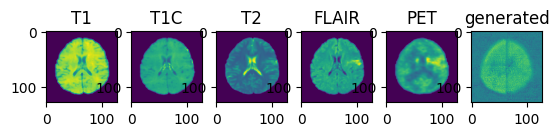

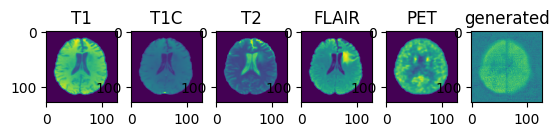

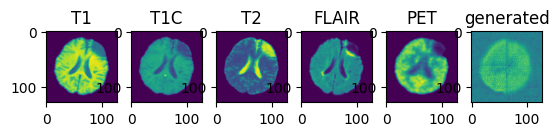

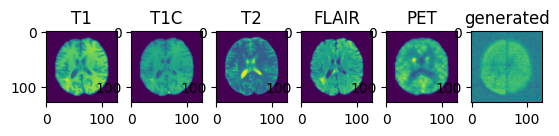

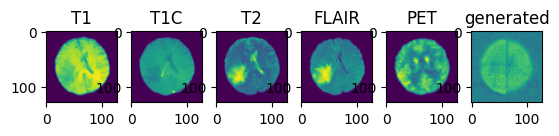

validation avg MS-SSIM: 0.4402 , train avg MS-SSIM: 0.4165
----------
epoch 161/400


Epoch :   0%|                                            | 0/24 [00:00<?, ?it/s]

Epoch :   4%|█▌                                  | 1/24 [01:38<37:54, 98.91s/it]

Epoch :   8%|███                                 | 2/24 [01:40<15:19, 41.81s/it]

Epoch :  12%|████▌                               | 3/24 [01:42<08:15, 23.58s/it]

Epoch :  17%|██████                              | 4/24 [01:44<05:00, 15.04s/it]

Epoch :  21%|███████▌                            | 5/24 [01:46<03:15, 10.29s/it]

Epoch :  25%|█████████                           | 6/24 [01:48<02:13,  7.41s/it]

Epoch :  29%|██████████▌                         | 7/24 [01:50<01:37,  5.71s/it]

Epoch :  33%|████████████                        | 8/24 [01:52<01:11,  4.48s/it]

Epoch :  38%|█████████████▌                      | 9/24 [01:54<00:55,  3.72s/it]

Epoch :  42%|██████████████▌                    | 10/24 [01:56<00:44,  3.20s/it]

Epoch :  46%|████████████████                   | 11/24 [01:58<00:36,  2.80s/it]

Epoch :  50%|█████████████████▌                 | 12/24 [02:00<00:30,  2.53s/it]

Epoch :  54%|██████████████████▉                | 13/24 [02:02<00:25,  2.35s/it]

Epoch :  58%|████████████████████▍              | 14/24 [02:04<00:22,  2.26s/it]

Epoch :  62%|█████████████████████▉             | 15/24 [02:06<00:19,  2.16s/it]

Epoch :  67%|███████████████████████▎           | 16/24 [02:08<00:16,  2.10s/it]

Epoch :  71%|████████████████████████▊          | 17/24 [02:09<00:14,  2.04s/it]

Epoch :  75%|██████████████████████████▎        | 18/24 [02:11<00:11,  1.98s/it]

Epoch :  79%|███████████████████████████▋       | 19/24 [02:13<00:09,  1.98s/it]

Epoch :  83%|█████████████████████████████▏     | 20/24 [02:15<00:08,  2.01s/it]

Epoch :  88%|██████████████████████████████▋    | 21/24 [02:17<00:05,  1.98s/it]

Epoch :  92%|████████████████████████████████   | 22/24 [02:19<00:03,  1.94s/it]

Epoch :  96%|█████████████████████████████████▌ | 23/24 [02:21<00:01,  1.92s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:22<00:00,  1.74s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:25<00:00,  6.08s/it]

----------
epoch 162/400


Epoch :   0%|                                            | 0/24 [00:00<?, ?it/s]

Epoch :   4%|█▌                                  | 1/24 [01:38<37:41, 98.34s/it]

Epoch :   8%|███                                 | 2/24 [01:40<15:17, 41.68s/it]

Epoch :  12%|████▌                               | 3/24 [01:42<08:14, 23.55s/it]

Epoch :  17%|██████                              | 4/24 [01:44<05:00, 15.03s/it]

Epoch :  21%|███████▌                            | 5/24 [01:46<03:15, 10.31s/it]

Epoch :  25%|█████████                           | 6/24 [01:48<02:13,  7.44s/it]

Epoch :  29%|██████████▌                         | 7/24 [01:49<01:35,  5.61s/it]

Epoch :  33%|████████████                        | 8/24 [01:52<01:13,  4.57s/it]

Epoch :  38%|█████████████▌                      | 9/24 [01:54<00:55,  3.72s/it]

Epoch :  42%|██████████████▌                    | 10/24 [01:55<00:43,  3.14s/it]

Epoch :  46%|████████████████                   | 11/24 [01:57<00:35,  2.75s/it]

Epoch :  50%|█████████████████▌                 | 12/24 [01:59<00:30,  2.54s/it]

Epoch :  54%|██████████████████▉                | 13/24 [02:01<00:25,  2.32s/it]

Epoch :  58%|████████████████████▍              | 14/24 [02:03<00:21,  2.17s/it]

Epoch :  62%|█████████████████████▉             | 15/24 [02:05<00:18,  2.06s/it]

Epoch :  67%|███████████████████████▎           | 16/24 [02:07<00:17,  2.13s/it]

Epoch :  71%|████████████████████████▊          | 17/24 [02:09<00:14,  2.08s/it]

Epoch :  75%|██████████████████████████▎        | 18/24 [02:11<00:12,  2.01s/it]

Epoch :  79%|███████████████████████████▋       | 19/24 [02:13<00:09,  1.95s/it]

Epoch :  83%|█████████████████████████████▏     | 20/24 [02:15<00:07,  1.91s/it]

Epoch :  88%|██████████████████████████████▋    | 21/24 [02:16<00:05,  1.90s/it]

Epoch :  92%|████████████████████████████████   | 22/24 [02:18<00:03,  1.88s/it]

Epoch :  96%|█████████████████████████████████▌ | 23/24 [02:20<00:01,  1.87s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:21<00:00,  1.63s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:25<00:00,  6.05s/it]

----------
epoch 163/400


Epoch :   0%|                                            | 0/24 [00:00<?, ?it/s]

Epoch :   4%|█▍                                 | 1/24 [01:46<40:43, 106.23s/it]

Epoch :   8%|███                                 | 2/24 [01:48<16:28, 44.92s/it]

Epoch :  12%|████▌                               | 3/24 [01:50<08:51, 25.29s/it]

Epoch :  17%|██████                              | 4/24 [01:52<05:20, 16.05s/it]

Epoch :  21%|███████▌                            | 5/24 [01:54<03:28, 10.97s/it]

Epoch :  25%|█████████                           | 6/24 [01:56<02:22,  7.94s/it]

Epoch :  29%|██████████▌                         | 7/24 [01:57<01:41,  5.97s/it]

Epoch :  33%|████████████                        | 8/24 [01:59<01:15,  4.71s/it]

Epoch :  38%|█████████████▌                      | 9/24 [02:02<00:59,  3.98s/it]

Epoch :  42%|██████████████▌                    | 10/24 [02:04<00:47,  3.37s/it]

Epoch :  46%|████████████████                   | 11/24 [02:06<00:38,  2.99s/it]

Epoch :  50%|█████████████████▌                 | 12/24 [02:08<00:32,  2.71s/it]

Epoch :  54%|██████████████████▉                | 13/24 [02:10<00:28,  2.56s/it]

Epoch :  58%|████████████████████▍              | 14/24 [02:12<00:23,  2.39s/it]

Epoch :  62%|█████████████████████▉             | 15/24 [02:14<00:20,  2.25s/it]

Epoch :  67%|███████████████████████▎           | 16/24 [02:16<00:17,  2.15s/it]

Epoch :  71%|████████████████████████▊          | 17/24 [02:19<00:17,  2.46s/it]

Epoch :  75%|██████████████████████████▎        | 18/24 [02:21<00:13,  2.28s/it]

Epoch :  79%|███████████████████████████▋       | 19/24 [02:23<00:10,  2.18s/it]

Epoch :  83%|█████████████████████████████▏     | 20/24 [02:25<00:08,  2.08s/it]

Epoch :  88%|██████████████████████████████▋    | 21/24 [02:27<00:06,  2.04s/it]

Epoch :  92%|████████████████████████████████   | 22/24 [02:29<00:04,  2.03s/it]

Epoch :  96%|█████████████████████████████████▌ | 23/24 [02:31<00:01,  1.98s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:32<00:00,  1.68s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:36<00:00,  6.50s/it]

----------
epoch 164/400


Epoch :   0%|                                            | 0/24 [00:00<?, ?it/s]

Epoch :   4%|█▍                                 | 1/24 [01:40<38:40, 100.91s/it]

Epoch :   8%|███                                 | 2/24 [01:42<15:38, 42.67s/it]

Epoch :  12%|████▌                               | 3/24 [01:44<08:24, 24.03s/it]

Epoch :  17%|██████                              | 4/24 [01:46<05:05, 15.27s/it]

Epoch :  21%|███████▌                            | 5/24 [01:48<03:18, 10.42s/it]

Epoch :  25%|█████████                           | 6/24 [01:50<02:15,  7.53s/it]

Epoch :  29%|██████████▌                         | 7/24 [01:52<01:36,  5.68s/it]

Epoch :  33%|████████████                        | 8/24 [01:53<01:11,  4.45s/it]

Epoch :  38%|█████████████▌                      | 9/24 [01:56<00:56,  3.75s/it]

Epoch :  42%|██████████████▌                    | 10/24 [01:57<00:44,  3.16s/it]

Epoch :  46%|████████████████                   | 11/24 [01:59<00:35,  2.76s/it]

Epoch :  50%|█████████████████▌                 | 12/24 [02:02<00:30,  2.58s/it]

Epoch :  54%|██████████████████▉                | 13/24 [02:03<00:25,  2.36s/it]

Epoch :  58%|████████████████████▍              | 14/24 [02:05<00:22,  2.22s/it]

Epoch :  62%|█████████████████████▉             | 15/24 [02:07<00:18,  2.10s/it]

Epoch :  67%|███████████████████████▎           | 16/24 [02:09<00:16,  2.03s/it]

Epoch :  71%|████████████████████████▊          | 17/24 [02:11<00:14,  2.10s/it]

Epoch :  75%|██████████████████████████▎        | 18/24 [02:13<00:12,  2.05s/it]

Epoch :  79%|███████████████████████████▋       | 19/24 [02:15<00:09,  1.99s/it]

Epoch :  83%|█████████████████████████████▏     | 20/24 [02:17<00:07,  1.96s/it]

Epoch :  88%|██████████████████████████████▋    | 21/24 [02:19<00:05,  1.95s/it]

Epoch :  92%|████████████████████████████████   | 22/24 [02:21<00:03,  1.93s/it]

Epoch :  96%|█████████████████████████████████▌ | 23/24 [02:23<00:01,  1.99s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:24<00:00,  1.69s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:27<00:00,  6.15s/it]

----------
epoch 165/400


Epoch :   0%|                                            | 0/24 [00:00<?, ?it/s]

Epoch :   4%|█▌                                  | 1/24 [01:38<37:40, 98.27s/it]

Epoch :   8%|███                                 | 2/24 [01:40<15:19, 41.80s/it]

Epoch :  12%|████▌                               | 3/24 [01:42<08:14, 23.55s/it]

Epoch :  17%|██████                              | 4/24 [01:44<05:00, 15.01s/it]

Epoch :  21%|███████▌                            | 5/24 [01:46<03:15, 10.29s/it]

Epoch :  25%|█████████                           | 6/24 [01:48<02:14,  7.46s/it]

Epoch :  29%|██████████▌                         | 7/24 [01:50<01:36,  5.67s/it]

Epoch :  33%|████████████                        | 8/24 [01:52<01:11,  4.47s/it]

Epoch :  38%|█████████████▌                      | 9/24 [01:53<00:55,  3.67s/it]

Epoch :  42%|██████████████▌                    | 10/24 [01:56<00:44,  3.19s/it]

Epoch :  46%|████████████████                   | 11/24 [01:57<00:36,  2.78s/it]

Epoch :  50%|█████████████████▌                 | 12/24 [01:59<00:29,  2.50s/it]

Epoch :  54%|██████████████████▉                | 13/24 [02:01<00:25,  2.33s/it]

Epoch :  58%|████████████████████▍              | 14/24 [02:03<00:22,  2.22s/it]

Epoch :  62%|█████████████████████▉             | 15/24 [02:05<00:19,  2.20s/it]

Epoch :  67%|███████████████████████▎           | 16/24 [02:07<00:17,  2.14s/it]

Epoch :  71%|████████████████████████▊          | 17/24 [02:10<00:15,  2.16s/it]

Epoch :  75%|██████████████████████████▎        | 18/24 [02:12<00:13,  2.26s/it]

Epoch :  79%|███████████████████████████▋       | 19/24 [02:14<00:10,  2.15s/it]

Epoch :  83%|█████████████████████████████▏     | 20/24 [02:16<00:08,  2.07s/it]

Epoch :  88%|██████████████████████████████▋    | 21/24 [02:18<00:06,  2.01s/it]

Epoch :  92%|████████████████████████████████   | 22/24 [02:20<00:04,  2.00s/it]

Epoch :  96%|█████████████████████████████████▌ | 23/24 [02:22<00:01,  1.99s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:23<00:00,  1.68s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:26<00:00,  6.10s/it]

----------
epoch 166/400


Epoch :   0%|                                            | 0/24 [00:00<?, ?it/s]

Epoch :   4%|█▌                                  | 1/24 [01:36<36:59, 96.48s/it]

Epoch :   8%|███                                 | 2/24 [01:38<14:57, 40.81s/it]

Epoch :  12%|████▌                               | 3/24 [01:40<08:08, 23.26s/it]

Epoch :  17%|██████                              | 4/24 [01:42<04:56, 14.84s/it]

Epoch :  21%|███████▌                            | 5/24 [01:44<03:12, 10.15s/it]

Epoch :  25%|█████████                           | 6/24 [01:46<02:11,  7.32s/it]

Epoch :  29%|██████████▌                         | 7/24 [01:48<01:33,  5.52s/it]

Epoch :  33%|████████████                        | 8/24 [01:50<01:10,  4.38s/it]

Epoch :  38%|█████████████▌                      | 9/24 [01:51<00:54,  3.61s/it]

Epoch :  42%|██████████████▌                    | 10/24 [01:54<00:44,  3.15s/it]

Epoch :  46%|████████████████                   | 11/24 [01:56<00:36,  2.78s/it]

Epoch :  50%|█████████████████▌                 | 12/24 [01:58<00:30,  2.56s/it]

Epoch :  54%|██████████████████▉                | 13/24 [01:59<00:25,  2.35s/it]

Epoch :  58%|████████████████████▍              | 14/24 [02:01<00:21,  2.20s/it]

Epoch :  62%|█████████████████████▉             | 15/24 [02:03<00:18,  2.09s/it]

Epoch :  67%|███████████████████████▎           | 16/24 [02:05<00:16,  2.01s/it]

Epoch :  71%|████████████████████████▊          | 17/24 [02:07<00:13,  1.95s/it]

Epoch :  75%|██████████████████████████▎        | 18/24 [02:09<00:11,  1.99s/it]

Epoch :  79%|███████████████████████████▋       | 19/24 [02:11<00:09,  1.94s/it]

Epoch :  83%|█████████████████████████████▏     | 20/24 [02:12<00:07,  1.90s/it]

Epoch :  88%|██████████████████████████████▋    | 21/24 [02:14<00:05,  1.90s/it]

Epoch :  92%|████████████████████████████████   | 22/24 [02:16<00:03,  1.89s/it]

Epoch :  96%|█████████████████████████████████▌ | 23/24 [02:18<00:01,  1.87s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:19<00:00,  1.60s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:23<00:00,  5.97s/it]

----------
epoch 167/400


Epoch :   0%|                                            | 0/24 [00:00<?, ?it/s]

Epoch :   4%|█▍                                 | 1/24 [01:42<39:08, 102.12s/it]

Epoch :   8%|███                                 | 2/24 [01:44<15:52, 43.29s/it]

Epoch :  12%|████▌                               | 3/24 [01:46<08:38, 24.70s/it]

Epoch :  17%|██████                              | 4/24 [01:48<05:14, 15.74s/it]

Epoch :  21%|███████▌                            | 5/24 [01:50<03:24, 10.75s/it]

Epoch :  25%|█████████                           | 6/24 [01:52<02:19,  7.73s/it]

Epoch :  29%|██████████▌                         | 7/24 [01:54<01:39,  5.87s/it]

Epoch :  33%|████████████                        | 8/24 [01:56<01:13,  4.62s/it]

Epoch :  38%|█████████████▌                      | 9/24 [01:58<00:56,  3.76s/it]

Epoch :  42%|██████████████▌                    | 10/24 [02:00<00:45,  3.22s/it]

Epoch :  46%|████████████████                   | 11/24 [02:02<00:38,  2.99s/it]

Epoch :  50%|█████████████████▌                 | 12/24 [02:04<00:31,  2.64s/it]

Epoch :  54%|██████████████████▉                | 13/24 [02:06<00:27,  2.49s/it]

Epoch :  58%|████████████████████▍              | 14/24 [02:08<00:23,  2.35s/it]

Epoch :  62%|█████████████████████▉             | 15/24 [02:10<00:19,  2.20s/it]

Epoch :  67%|███████████████████████▎           | 16/24 [02:12<00:16,  2.10s/it]

Epoch :  71%|████████████████████████▊          | 17/24 [02:14<00:14,  2.02s/it]

Epoch :  75%|██████████████████████████▎        | 18/24 [02:16<00:11,  1.97s/it]

Epoch :  79%|███████████████████████████▋       | 19/24 [02:18<00:10,  2.03s/it]

Epoch :  83%|█████████████████████████████▏     | 20/24 [02:20<00:07,  1.98s/it]

Epoch :  88%|██████████████████████████████▋    | 21/24 [02:22<00:05,  1.94s/it]

Epoch :  92%|████████████████████████████████   | 22/24 [02:24<00:03,  1.97s/it]

Epoch :  96%|█████████████████████████████████▌ | 23/24 [02:26<00:01,  1.95s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:27<00:00,  1.66s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:30<00:00,  6.28s/it]

----------
epoch 168/400


Epoch :   0%|                                            | 0/24 [00:00<?, ?it/s]

Epoch :   4%|█▍                                 | 1/24 [01:41<38:49, 101.29s/it]

Epoch :   8%|███                                 | 2/24 [01:43<15:41, 42.79s/it]

Epoch :  12%|████▌                               | 3/24 [01:45<08:27, 24.15s/it]

Epoch :  17%|██████                              | 4/24 [01:46<05:06, 15.34s/it]

Epoch :  21%|███████▌                            | 5/24 [01:48<03:19, 10.48s/it]

Epoch :  25%|█████████                           | 6/24 [01:50<02:16,  7.60s/it]

Epoch :  29%|██████████▌                         | 7/24 [01:52<01:38,  5.77s/it]

Epoch :  33%|████████████                        | 8/24 [01:54<01:12,  4.54s/it]

Epoch :  38%|█████████████▌                      | 9/24 [01:56<00:55,  3.72s/it]

Epoch :  42%|██████████████▌                    | 10/24 [01:58<00:44,  3.15s/it]

Epoch :  46%|████████████████                   | 11/24 [02:00<00:37,  2.85s/it]

Epoch :  50%|█████████████████▌                 | 12/24 [02:02<00:30,  2.54s/it]

Epoch :  54%|██████████████████▉                | 13/24 [02:04<00:25,  2.33s/it]

Epoch :  58%|████████████████████▍              | 14/24 [02:06<00:21,  2.18s/it]

Epoch :  62%|█████████████████████▉             | 15/24 [02:08<00:18,  2.09s/it]

Epoch :  67%|███████████████████████▎           | 16/24 [02:09<00:16,  2.03s/it]

Epoch :  71%|████████████████████████▊          | 17/24 [02:11<00:14,  2.01s/it]

Epoch :  75%|██████████████████████████▎        | 18/24 [02:13<00:11,  1.97s/it]

Epoch :  79%|███████████████████████████▋       | 19/24 [02:15<00:09,  1.97s/it]

Epoch :  83%|█████████████████████████████▏     | 20/24 [02:17<00:07,  1.95s/it]

Epoch :  88%|██████████████████████████████▋    | 21/24 [02:19<00:05,  1.94s/it]

Epoch :  92%|████████████████████████████████   | 22/24 [02:21<00:03,  1.92s/it]

Epoch :  96%|█████████████████████████████████▌ | 23/24 [02:23<00:01,  1.90s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:24<00:00,  1.63s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:27<00:00,  6.16s/it]

----------
epoch 169/400


Epoch :   0%|                                            | 0/24 [00:00<?, ?it/s]

Epoch :   4%|█▌                                  | 1/24 [01:34<36:20, 94.82s/it]

Epoch :   8%|███                                 | 2/24 [01:36<14:43, 40.17s/it]

Epoch :  12%|████▌                               | 3/24 [01:38<07:56, 22.69s/it]

Epoch :  17%|██████                              | 4/24 [01:40<04:52, 14.64s/it]

Epoch :  21%|███████▌                            | 5/24 [01:42<03:11, 10.08s/it]

Epoch :  25%|█████████                           | 6/24 [01:44<02:11,  7.32s/it]

Epoch :  29%|██████████▌                         | 7/24 [01:46<01:34,  5.56s/it]

Epoch :  33%|████████████                        | 8/24 [01:48<01:10,  4.38s/it]

Epoch :  38%|█████████████▌                      | 9/24 [01:50<00:53,  3.58s/it]

Epoch :  42%|██████████████▌                    | 10/24 [01:52<00:42,  3.06s/it]

Epoch :  46%|████████████████                   | 11/24 [01:54<00:35,  2.71s/it]

Epoch :  50%|█████████████████▌                 | 12/24 [01:56<00:31,  2.59s/it]

Epoch :  54%|██████████████████▉                | 13/24 [01:58<00:26,  2.44s/it]

Epoch :  58%|████████████████████▍              | 14/24 [02:00<00:23,  2.30s/it]

Epoch :  62%|█████████████████████▉             | 15/24 [02:02<00:20,  2.23s/it]

Epoch :  67%|███████████████████████▎           | 16/24 [02:04<00:17,  2.13s/it]

Epoch :  71%|████████████████████████▊          | 17/24 [02:06<00:14,  2.05s/it]

Epoch :  75%|██████████████████████████▎        | 18/24 [02:08<00:11,  2.00s/it]

Epoch :  79%|███████████████████████████▋       | 19/24 [02:10<00:09,  1.95s/it]

Epoch :  83%|█████████████████████████████▏     | 20/24 [02:12<00:08,  2.01s/it]

Epoch :  88%|██████████████████████████████▋    | 21/24 [02:14<00:05,  1.99s/it]

Epoch :  92%|████████████████████████████████   | 22/24 [02:16<00:03,  1.97s/it]

Epoch :  96%|█████████████████████████████████▌ | 23/24 [02:18<00:01,  1.95s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:19<00:00,  1.67s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:22<00:00,  5.95s/it]

----------
epoch 170/400


Epoch :   0%|                                            | 0/24 [00:00<?, ?it/s]

Epoch :   4%|█▌                                  | 1/24 [01:36<36:49, 96.06s/it]

Epoch :   8%|███                                 | 2/24 [01:38<14:55, 40.70s/it]

Epoch :  12%|████▌                               | 3/24 [01:40<08:04, 23.05s/it]

Epoch :  17%|██████                              | 4/24 [01:41<04:54, 14.71s/it]

Epoch :  21%|███████▌                            | 5/24 [01:44<03:15, 10.28s/it]

Epoch :  25%|█████████                           | 6/24 [01:46<02:14,  7.47s/it]

Epoch :  29%|██████████▌                         | 7/24 [01:48<01:35,  5.64s/it]

Epoch :  33%|████████████                        | 8/24 [01:50<01:11,  4.45s/it]

Epoch :  38%|█████████████▌                      | 9/24 [01:52<00:54,  3.66s/it]

Epoch :  42%|██████████████▌                    | 10/24 [01:54<00:43,  3.13s/it]

Epoch :  46%|████████████████                   | 11/24 [01:55<00:35,  2.75s/it]

Epoch :  50%|█████████████████▌                 | 12/24 [01:57<00:29,  2.48s/it]

Epoch :  54%|██████████████████▉                | 13/24 [02:00<00:26,  2.39s/it]

Epoch :  58%|████████████████████▍              | 14/24 [02:01<00:22,  2.24s/it]

Epoch :  62%|█████████████████████▉             | 15/24 [02:03<00:19,  2.15s/it]

Epoch :  67%|███████████████████████▎           | 16/24 [02:05<00:16,  2.06s/it]

Epoch :  71%|████████████████████████▊          | 17/24 [02:07<00:14,  2.01s/it]

Epoch :  75%|██████████████████████████▎        | 18/24 [02:09<00:12,  2.03s/it]

Epoch :  79%|███████████████████████████▋       | 19/24 [02:11<00:09,  1.97s/it]

Epoch :  83%|█████████████████████████████▏     | 20/24 [02:13<00:07,  1.93s/it]

Epoch :  88%|██████████████████████████████▋    | 21/24 [02:15<00:06,  2.00s/it]

Epoch :  92%|████████████████████████████████   | 22/24 [02:17<00:03,  1.98s/it]

Epoch :  96%|█████████████████████████████████▌ | 23/24 [02:19<00:01,  1.96s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:20<00:00,  1.69s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:24<00:00,  6.00s/it]

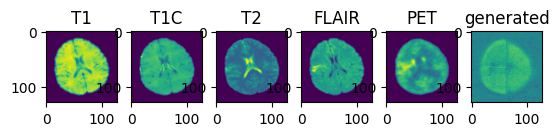

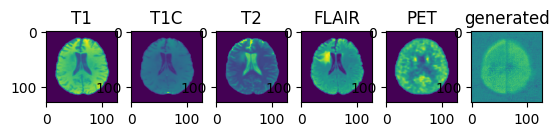

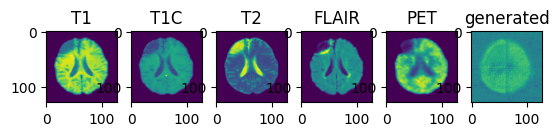

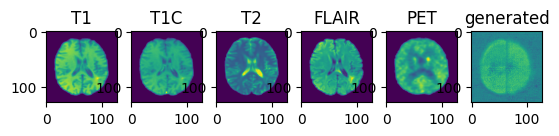

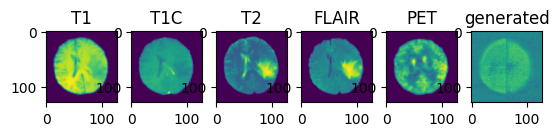

validation avg MS-SSIM: 0.4430 , train avg MS-SSIM: 0.4231
----------
epoch 171/400


Epoch :   0%|                                            | 0/24 [00:00<?, ?it/s]

Epoch :   4%|█▌                                  | 1/24 [01:38<37:54, 98.89s/it]

Epoch :   8%|███                                 | 2/24 [01:40<15:21, 41.91s/it]

Epoch :  12%|████▌                               | 3/24 [01:42<08:17, 23.70s/it]

Epoch :  17%|██████                              | 4/24 [01:44<05:02, 15.11s/it]

Epoch :  21%|███████▌                            | 5/24 [01:46<03:17, 10.42s/it]

Epoch :  25%|█████████                           | 6/24 [01:49<02:16,  7.57s/it]

Epoch :  29%|██████████▌                         | 7/24 [01:50<01:37,  5.72s/it]

Epoch :  33%|████████████                        | 8/24 [01:52<01:11,  4.49s/it]

Epoch :  38%|█████████████▌                      | 9/24 [01:55<00:59,  3.97s/it]

Epoch :  42%|██████████████▌                    | 10/24 [01:57<00:46,  3.33s/it]

Epoch :  46%|████████████████                   | 11/24 [01:59<00:37,  2.91s/it]

Epoch :  50%|█████████████████▌                 | 12/24 [02:01<00:31,  2.61s/it]

Epoch :  54%|██████████████████▉                | 13/24 [02:03<00:26,  2.41s/it]

Epoch :  58%|████████████████████▍              | 14/24 [02:05<00:22,  2.26s/it]

Epoch :  62%|█████████████████████▉             | 15/24 [02:07<00:19,  2.13s/it]

Epoch :  67%|███████████████████████▎           | 16/24 [02:08<00:16,  2.04s/it]

Epoch :  71%|████████████████████████▊          | 17/24 [02:10<00:13,  1.98s/it]

Epoch :  75%|██████████████████████████▎        | 18/24 [02:12<00:11,  1.95s/it]

Epoch :  79%|███████████████████████████▋       | 19/24 [02:14<00:09,  1.92s/it]

Epoch :  83%|█████████████████████████████▏     | 20/24 [02:16<00:07,  1.90s/it]

Epoch :  88%|██████████████████████████████▋    | 21/24 [02:18<00:06,  2.00s/it]

Epoch :  92%|████████████████████████████████   | 22/24 [02:20<00:03,  1.98s/it]

Epoch :  96%|█████████████████████████████████▌ | 23/24 [02:22<00:02,  2.01s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:23<00:00,  1.74s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:27<00:00,  6.13s/it]

----------
epoch 172/400


Epoch :   0%|                                            | 0/24 [00:00<?, ?it/s]

Epoch :   4%|█▌                                  | 1/24 [01:35<36:38, 95.57s/it]

Epoch :   8%|███                                 | 2/24 [01:37<14:55, 40.70s/it]

Epoch :  12%|████▌                               | 3/24 [01:39<08:04, 23.05s/it]

Epoch :  17%|██████                              | 4/24 [01:41<04:53, 14.68s/it]

Epoch :  21%|███████▌                            | 5/24 [01:43<03:10, 10.05s/it]

Epoch :  25%|█████████                           | 6/24 [01:45<02:10,  7.27s/it]

Epoch :  29%|██████████▌                         | 7/24 [01:47<01:33,  5.50s/it]

Epoch :  33%|████████████                        | 8/24 [01:49<01:09,  4.36s/it]

Epoch :  38%|█████████████▌                      | 9/24 [01:51<00:53,  3.58s/it]

Epoch :  42%|██████████████▌                    | 10/24 [01:53<00:44,  3.16s/it]

Epoch :  46%|████████████████                   | 11/24 [01:55<00:36,  2.78s/it]

Epoch :  50%|█████████████████▌                 | 12/24 [01:57<00:29,  2.50s/it]

Epoch :  54%|██████████████████▉                | 13/24 [01:58<00:25,  2.30s/it]

Epoch :  58%|████████████████████▍              | 14/24 [02:00<00:21,  2.19s/it]

Epoch :  62%|█████████████████████▉             | 15/24 [02:02<00:18,  2.08s/it]

Epoch :  67%|███████████████████████▎           | 16/24 [02:04<00:16,  2.02s/it]

Epoch :  71%|████████████████████████▊          | 17/24 [02:06<00:14,  2.07s/it]

Epoch :  75%|██████████████████████████▎        | 18/24 [02:08<00:12,  2.01s/it]

Epoch :  79%|███████████████████████████▋       | 19/24 [02:10<00:09,  1.96s/it]

Epoch :  83%|█████████████████████████████▏     | 20/24 [02:12<00:07,  1.93s/it]

Epoch :  88%|██████████████████████████████▋    | 21/24 [02:14<00:05,  1.92s/it]

Epoch :  92%|████████████████████████████████   | 22/24 [02:16<00:03,  1.93s/it]

Epoch :  96%|█████████████████████████████████▌ | 23/24 [02:18<00:01,  1.92s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:19<00:00,  1.65s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:22<00:00,  5.94s/it]

----------
epoch 173/400


Epoch :   0%|                                            | 0/24 [00:00<?, ?it/s]

Epoch :   4%|█▌                                  | 1/24 [01:35<36:28, 95.16s/it]

Epoch :   8%|███                                 | 2/24 [01:37<14:51, 40.51s/it]

Epoch :  12%|████▌                               | 3/24 [01:39<08:00, 22.86s/it]

Epoch :  17%|██████                              | 4/24 [01:41<04:51, 14.56s/it]

Epoch :  21%|███████▌                            | 5/24 [01:42<03:09,  9.98s/it]

Epoch :  25%|█████████                           | 6/24 [01:44<02:10,  7.23s/it]

Epoch :  29%|██████████▌                         | 7/24 [01:46<01:33,  5.49s/it]

Epoch :  33%|████████████                        | 8/24 [01:48<01:09,  4.33s/it]

Epoch :  38%|█████████████▌                      | 9/24 [01:50<00:53,  3.55s/it]

Epoch :  42%|██████████████▌                    | 10/24 [01:52<00:43,  3.13s/it]

Epoch :  46%|████████████████                   | 11/24 [01:54<00:35,  2.74s/it]

Epoch :  50%|█████████████████▌                 | 12/24 [01:56<00:29,  2.47s/it]

Epoch :  54%|██████████████████▉                | 13/24 [01:58<00:25,  2.33s/it]

Epoch :  58%|████████████████████▍              | 14/24 [02:00<00:21,  2.19s/it]

Epoch :  62%|█████████████████████▉             | 15/24 [02:02<00:19,  2.12s/it]

Epoch :  67%|███████████████████████▎           | 16/24 [02:04<00:16,  2.06s/it]

Epoch :  71%|████████████████████████▊          | 17/24 [02:06<00:14,  2.02s/it]

Epoch :  75%|██████████████████████████▎        | 18/24 [02:08<00:13,  2.17s/it]

Epoch :  79%|███████████████████████████▋       | 19/24 [02:10<00:10,  2.17s/it]

Epoch :  83%|█████████████████████████████▏     | 20/24 [02:12<00:08,  2.11s/it]

Epoch :  88%|██████████████████████████████▋    | 21/24 [02:14<00:06,  2.06s/it]

Epoch :  92%|████████████████████████████████   | 22/24 [02:16<00:04,  2.03s/it]

Epoch :  96%|█████████████████████████████████▌ | 23/24 [02:18<00:02,  2.00s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:19<00:00,  1.71s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:23<00:00,  5.98s/it]

----------
epoch 174/400


Epoch :   0%|                                            | 0/24 [00:00<?, ?it/s]

Epoch :   4%|█▍                                 | 1/24 [01:45<40:19, 105.21s/it]

Epoch :   8%|███                                 | 2/24 [01:47<16:18, 44.49s/it]

Epoch :  12%|████▌                               | 3/24 [01:49<08:50, 25.24s/it]

Epoch :  17%|██████                              | 4/24 [01:51<05:20, 16.03s/it]

Epoch :  21%|███████▌                            | 5/24 [01:53<03:27, 10.92s/it]

Epoch :  25%|█████████                           | 6/24 [01:55<02:21,  7.84s/it]

Epoch :  29%|██████████▌                         | 7/24 [01:57<01:40,  5.88s/it]

Epoch :  33%|████████████                        | 8/24 [01:58<01:13,  4.60s/it]

Epoch :  38%|█████████████▌                      | 9/24 [02:00<00:56,  3.74s/it]

Epoch :  42%|██████████████▌                    | 10/24 [02:02<00:44,  3.15s/it]

Epoch :  46%|████████████████                   | 11/24 [02:04<00:37,  2.89s/it]

Epoch :  50%|█████████████████▌                 | 12/24 [02:06<00:31,  2.62s/it]

Epoch :  54%|██████████████████▉                | 13/24 [02:08<00:26,  2.40s/it]

Epoch :  58%|████████████████████▍              | 14/24 [02:10<00:22,  2.23s/it]

Epoch :  62%|█████████████████████▉             | 15/24 [02:12<00:19,  2.13s/it]

Epoch :  67%|███████████████████████▎           | 16/24 [02:14<00:16,  2.05s/it]

Epoch :  71%|████████████████████████▊          | 17/24 [02:16<00:13,  1.99s/it]

Epoch :  75%|██████████████████████████▎        | 18/24 [02:18<00:11,  1.94s/it]

Epoch :  79%|███████████████████████████▋       | 19/24 [02:20<00:10,  2.00s/it]

Epoch :  83%|█████████████████████████████▏     | 20/24 [02:21<00:07,  1.95s/it]

Epoch :  88%|██████████████████████████████▋    | 21/24 [02:23<00:05,  1.91s/it]

Epoch :  92%|████████████████████████████████   | 22/24 [02:25<00:03,  1.91s/it]

Epoch :  96%|█████████████████████████████████▌ | 23/24 [02:27<00:01,  1.92s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:28<00:00,  1.64s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:32<00:00,  6.35s/it]

----------
epoch 175/400


Epoch :   0%|                                            | 0/24 [00:00<?, ?it/s]

Epoch :   4%|█▌                                  | 1/24 [01:34<36:21, 94.87s/it]

Epoch :   8%|███                                 | 2/24 [01:36<14:44, 40.19s/it]

Epoch :  12%|████▌                               | 3/24 [01:38<07:55, 22.67s/it]

Epoch :  17%|██████                              | 4/24 [01:40<04:52, 14.63s/it]

Epoch :  21%|███████▌                            | 5/24 [01:42<03:10, 10.03s/it]

Epoch :  25%|█████████                           | 6/24 [01:44<02:10,  7.23s/it]

Epoch :  29%|██████████▌                         | 7/24 [01:46<01:32,  5.46s/it]

Epoch :  33%|████████████                        | 8/24 [01:48<01:09,  4.33s/it]

Epoch :  38%|█████████████▌                      | 9/24 [01:50<00:53,  3.57s/it]

Epoch :  42%|██████████████▌                    | 10/24 [01:52<00:42,  3.06s/it]

Epoch :  46%|████████████████                   | 11/24 [01:54<00:35,  2.73s/it]

Epoch :  50%|█████████████████▌                 | 12/24 [01:56<00:31,  2.62s/it]

Epoch :  54%|██████████████████▉                | 13/24 [01:58<00:26,  2.41s/it]

Epoch :  58%|████████████████████▍              | 14/24 [02:00<00:22,  2.26s/it]

Epoch :  62%|█████████████████████▉             | 15/24 [02:02<00:19,  2.13s/it]

Epoch :  67%|███████████████████████▎           | 16/24 [02:03<00:16,  2.05s/it]

Epoch :  71%|████████████████████████▊          | 17/24 [02:05<00:14,  2.00s/it]

Epoch :  75%|██████████████████████████▎        | 18/24 [02:08<00:12,  2.05s/it]

Epoch :  79%|███████████████████████████▋       | 19/24 [02:09<00:09,  1.99s/it]

Epoch :  83%|█████████████████████████████▏     | 20/24 [02:12<00:08,  2.03s/it]

Epoch :  88%|██████████████████████████████▋    | 21/24 [02:13<00:05,  1.99s/it]

Epoch :  92%|████████████████████████████████   | 22/24 [02:15<00:03,  1.94s/it]

Epoch :  96%|█████████████████████████████████▌ | 23/24 [02:17<00:01,  1.91s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:18<00:00,  1.63s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:21<00:00,  5.92s/it]

----------
epoch 176/400


Epoch :   0%|                                            | 0/24 [00:00<?, ?it/s]

Epoch :   4%|█▌                                  | 1/24 [01:38<37:53, 98.83s/it]

Epoch :   8%|███                                 | 2/24 [01:40<15:21, 41.89s/it]

Epoch :  12%|████▌                               | 3/24 [01:42<08:15, 23.61s/it]

Epoch :  17%|██████                              | 4/24 [01:44<05:00, 15.04s/it]

Epoch :  21%|███████▌                            | 5/24 [01:46<03:18, 10.46s/it]

Epoch :  25%|█████████                           | 6/24 [01:48<02:15,  7.54s/it]

Epoch :  29%|██████████▌                         | 7/24 [01:50<01:36,  5.68s/it]

Epoch :  33%|████████████                        | 8/24 [01:52<01:11,  4.46s/it]

Epoch :  38%|█████████████▌                      | 9/24 [01:54<00:54,  3.64s/it]

Epoch :  42%|██████████████▌                    | 10/24 [01:56<00:44,  3.18s/it]

Epoch :  46%|████████████████                   | 11/24 [01:58<00:36,  2.79s/it]

Epoch :  50%|█████████████████▌                 | 12/24 [02:00<00:30,  2.50s/it]

Epoch :  54%|██████████████████▉                | 13/24 [02:02<00:26,  2.40s/it]

Epoch :  58%|████████████████████▍              | 14/24 [02:04<00:22,  2.29s/it]

Epoch :  62%|█████████████████████▉             | 15/24 [02:06<00:19,  2.16s/it]

Epoch :  67%|███████████████████████▎           | 16/24 [02:08<00:16,  2.06s/it]

Epoch :  71%|████████████████████████▊          | 17/24 [02:09<00:13,  1.99s/it]

Epoch :  75%|██████████████████████████▎        | 18/24 [02:11<00:11,  1.98s/it]

Epoch :  79%|███████████████████████████▋       | 19/24 [02:14<00:10,  2.01s/it]

Epoch :  83%|█████████████████████████████▏     | 20/24 [02:15<00:07,  1.99s/it]

Epoch :  88%|██████████████████████████████▋    | 21/24 [02:18<00:06,  2.09s/it]

Epoch :  92%|████████████████████████████████   | 22/24 [02:20<00:04,  2.02s/it]

Epoch :  96%|█████████████████████████████████▌ | 23/24 [02:21<00:01,  1.97s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:22<00:00,  1.68s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:26<00:00,  6.11s/it]

----------
epoch 177/400


Epoch :   0%|                                            | 0/24 [00:00<?, ?it/s]

Epoch :   4%|█▌                                  | 1/24 [01:37<37:11, 97.04s/it]

Epoch :   8%|███                                 | 2/24 [01:38<15:03, 41.06s/it]

Epoch :  12%|████▌                               | 3/24 [01:40<08:06, 23.16s/it]

Epoch :  17%|██████                              | 4/24 [01:42<04:54, 14.74s/it]

Epoch :  21%|███████▌                            | 5/24 [01:44<03:14, 10.22s/it]

Epoch :  25%|█████████                           | 6/24 [01:46<02:12,  7.37s/it]

Epoch :  29%|██████████▌                         | 7/24 [01:48<01:35,  5.61s/it]

Epoch :  33%|████████████                        | 8/24 [01:50<01:11,  4.44s/it]

Epoch :  38%|█████████████▌                      | 9/24 [01:52<00:55,  3.68s/it]

Epoch :  42%|██████████████▌                    | 10/24 [01:54<00:43,  3.14s/it]

Epoch :  46%|████████████████                   | 11/24 [01:56<00:35,  2.76s/it]

Epoch :  50%|█████████████████▌                 | 12/24 [01:58<00:29,  2.49s/it]

Epoch :  54%|██████████████████▉                | 13/24 [02:00<00:25,  2.32s/it]

Epoch :  58%|████████████████████▍              | 14/24 [02:02<00:23,  2.38s/it]

Epoch :  62%|█████████████████████▉             | 15/24 [02:04<00:20,  2.24s/it]

Epoch :  67%|███████████████████████▎           | 16/24 [02:06<00:17,  2.14s/it]

Epoch :  71%|████████████████████████▊          | 17/24 [02:08<00:14,  2.06s/it]

Epoch :  75%|██████████████████████████▎        | 18/24 [02:10<00:12,  2.06s/it]

Epoch :  79%|███████████████████████████▋       | 19/24 [02:12<00:10,  2.02s/it]

Epoch :  83%|█████████████████████████████▏     | 20/24 [02:14<00:07,  1.97s/it]

Epoch :  88%|██████████████████████████████▋    | 21/24 [02:16<00:05,  1.93s/it]

Epoch :  92%|████████████████████████████████   | 22/24 [02:18<00:04,  2.02s/it]

Epoch :  96%|█████████████████████████████████▌ | 23/24 [02:20<00:01,  1.97s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:21<00:00,  1.68s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:24<00:00,  6.02s/it]

----------
epoch 178/400


Epoch :   0%|                                            | 0/24 [00:00<?, ?it/s]

Epoch :   4%|█▍                                 | 1/24 [01:51<42:43, 111.45s/it]

Epoch :   8%|███                                 | 2/24 [01:53<17:14, 47.04s/it]

Epoch :  12%|████▌                               | 3/24 [01:55<09:14, 26.42s/it]

Epoch :  17%|██████                              | 4/24 [01:57<05:35, 16.78s/it]

Epoch :  21%|███████▌                            | 5/24 [01:59<03:37, 11.47s/it]

Epoch :  25%|█████████                           | 6/24 [02:01<02:31,  8.44s/it]

Epoch :  29%|██████████▌                         | 7/24 [02:03<01:47,  6.34s/it]

Epoch :  33%|████████████                        | 8/24 [02:06<01:19,  4.99s/it]

Epoch :  38%|█████████████▌                      | 9/24 [02:07<01:00,  4.04s/it]

Epoch :  42%|██████████████▌                    | 10/24 [02:09<00:47,  3.39s/it]

Epoch :  46%|████████████████                   | 11/24 [02:11<00:38,  2.97s/it]

Epoch :  50%|█████████████████▌                 | 12/24 [02:13<00:32,  2.68s/it]

Epoch :  54%|██████████████████▉                | 13/24 [02:15<00:26,  2.45s/it]

Epoch :  58%|████████████████████▍              | 14/24 [02:18<00:24,  2.47s/it]

Epoch :  62%|█████████████████████▉             | 15/24 [02:20<00:21,  2.37s/it]

Epoch :  67%|███████████████████████▎           | 16/24 [02:22<00:18,  2.29s/it]

Epoch :  71%|████████████████████████▊          | 17/24 [02:24<00:15,  2.17s/it]

Epoch :  75%|██████████████████████████▎        | 18/24 [02:26<00:12,  2.09s/it]

Epoch :  79%|███████████████████████████▋       | 19/24 [02:28<00:10,  2.07s/it]

Epoch :  83%|█████████████████████████████▏     | 20/24 [02:30<00:08,  2.05s/it]

Epoch :  88%|██████████████████████████████▋    | 21/24 [02:32<00:06,  2.06s/it]

Epoch :  92%|████████████████████████████████   | 22/24 [02:34<00:04,  2.06s/it]

Epoch :  96%|█████████████████████████████████▌ | 23/24 [02:36<00:02,  2.13s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:37<00:00,  1.79s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:41<00:00,  6.72s/it]

----------
epoch 179/400


Epoch :   0%|                                            | 0/24 [00:00<?, ?it/s]

Epoch :   4%|█▍                                 | 1/24 [01:40<38:37, 100.76s/it]

Epoch :   8%|███                                 | 2/24 [01:42<15:38, 42.68s/it]

Epoch :  12%|████▌                               | 3/24 [01:44<08:24, 24.05s/it]

Epoch :  17%|██████                              | 4/24 [01:46<05:05, 15.29s/it]

Epoch :  21%|███████▌                            | 5/24 [01:48<03:18, 10.44s/it]

Epoch :  25%|█████████                           | 6/24 [01:50<02:15,  7.52s/it]

Epoch :  29%|██████████▌                         | 7/24 [01:52<01:38,  5.78s/it]

Epoch :  33%|████████████                        | 8/24 [01:54<01:12,  4.53s/it]

Epoch :  38%|█████████████▌                      | 9/24 [01:56<00:55,  3.69s/it]

Epoch :  42%|██████████████▌                    | 10/24 [01:57<00:43,  3.12s/it]

Epoch :  46%|████████████████                   | 11/24 [01:59<00:35,  2.73s/it]

Epoch :  50%|█████████████████▌                 | 12/24 [02:01<00:30,  2.53s/it]

Epoch :  54%|██████████████████▉                | 13/24 [02:03<00:26,  2.39s/it]

Epoch :  58%|████████████████████▍              | 14/24 [02:05<00:22,  2.27s/it]

Epoch :  62%|█████████████████████▉             | 15/24 [02:08<00:20,  2.29s/it]

Epoch :  67%|███████████████████████▎           | 16/24 [02:10<00:17,  2.19s/it]

Epoch :  71%|████████████████████████▊          | 17/24 [02:12<00:14,  2.11s/it]

Epoch :  75%|██████████████████████████▎        | 18/24 [02:13<00:12,  2.03s/it]

Epoch :  79%|███████████████████████████▋       | 19/24 [02:15<00:09,  1.98s/it]

Epoch :  83%|█████████████████████████████▏     | 20/24 [02:17<00:07,  1.93s/it]

Epoch :  88%|██████████████████████████████▋    | 21/24 [02:19<00:05,  1.91s/it]

Epoch :  92%|████████████████████████████████   | 22/24 [02:21<00:03,  1.89s/it]

Epoch :  96%|█████████████████████████████████▌ | 23/24 [02:23<00:01,  1.97s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:24<00:00,  1.67s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:27<00:00,  6.17s/it]

----------
epoch 180/400


Epoch :   0%|                                            | 0/24 [00:00<?, ?it/s]

Epoch :   4%|█▌                                  | 1/24 [01:39<38:03, 99.29s/it]

Epoch :   8%|███                                 | 2/24 [01:41<15:24, 42.03s/it]

Epoch :  12%|████▌                               | 3/24 [01:43<08:18, 23.73s/it]

Epoch :  17%|██████                              | 4/24 [01:45<05:02, 15.10s/it]

Epoch :  21%|███████▌                            | 5/24 [01:47<03:17, 10.37s/it]

Epoch :  25%|█████████                           | 6/24 [01:49<02:15,  7.52s/it]

Epoch :  29%|██████████▌                         | 7/24 [01:50<01:36,  5.68s/it]

Epoch :  33%|████████████                        | 8/24 [01:53<01:13,  4.62s/it]

Epoch :  38%|█████████████▌                      | 9/24 [01:55<00:56,  3.79s/it]

Epoch :  42%|██████████████▌                    | 10/24 [01:57<00:44,  3.21s/it]

Epoch :  46%|████████████████                   | 11/24 [01:59<00:36,  2.82s/it]

Epoch :  50%|█████████████████▌                 | 12/24 [02:01<00:30,  2.56s/it]

Epoch :  54%|██████████████████▉                | 13/24 [02:02<00:25,  2.36s/it]

Epoch :  58%|████████████████████▍              | 14/24 [02:04<00:22,  2.21s/it]

Epoch :  62%|█████████████████████▉             | 15/24 [02:06<00:19,  2.12s/it]

Epoch :  67%|███████████████████████▎           | 16/24 [02:09<00:18,  2.35s/it]

Epoch :  71%|████████████████████████▊          | 17/24 [02:11<00:15,  2.23s/it]

Epoch :  75%|██████████████████████████▎        | 18/24 [02:13<00:13,  2.18s/it]

Epoch :  79%|███████████████████████████▋       | 19/24 [02:15<00:10,  2.15s/it]

Epoch :  83%|█████████████████████████████▏     | 20/24 [02:17<00:08,  2.07s/it]

Epoch :  88%|██████████████████████████████▋    | 21/24 [02:19<00:06,  2.05s/it]

Epoch :  92%|████████████████████████████████   | 22/24 [02:21<00:04,  2.01s/it]

Epoch :  96%|█████████████████████████████████▌ | 23/24 [02:23<00:01,  1.97s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:24<00:00,  1.68s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:27<00:00,  6.16s/it]

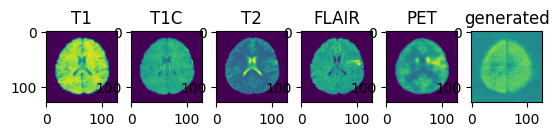

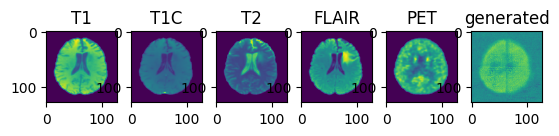

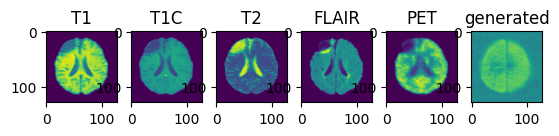

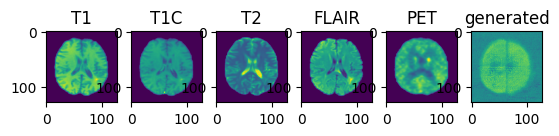

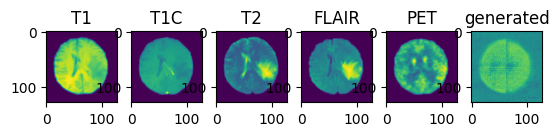

validation avg MS-SSIM: 0.4487 , train avg MS-SSIM: 0.4281
----------
epoch 181/400


Epoch :   0%|                                            | 0/24 [00:00<?, ?it/s]

Epoch :   4%|█▌                                  | 1/24 [01:39<38:11, 99.65s/it]

Epoch :   8%|███                                 | 2/24 [01:41<15:30, 42.28s/it]

Epoch :  12%|████▌                               | 3/24 [01:44<08:26, 24.10s/it]

Epoch :  17%|██████                              | 4/24 [01:46<05:06, 15.30s/it]

Epoch :  21%|███████▌                            | 5/24 [01:47<03:18, 10.45s/it]

Epoch :  25%|█████████                           | 6/24 [01:49<02:15,  7.52s/it]

Epoch :  29%|██████████▌                         | 7/24 [01:51<01:36,  5.66s/it]

Epoch :  33%|████████████                        | 8/24 [01:53<01:10,  4.43s/it]

Epoch :  38%|█████████████▌                      | 9/24 [01:55<00:54,  3.61s/it]

Epoch :  42%|██████████████▌                    | 10/24 [01:56<00:42,  3.05s/it]

Epoch :  46%|████████████████                   | 11/24 [01:58<00:34,  2.67s/it]

Epoch :  50%|█████████████████▌                 | 12/24 [02:00<00:29,  2.49s/it]

Epoch :  54%|██████████████████▉                | 13/24 [02:02<00:25,  2.34s/it]

Epoch :  58%|████████████████████▍              | 14/24 [02:04<00:22,  2.24s/it]

Epoch :  62%|█████████████████████▉             | 15/24 [02:06<00:19,  2.12s/it]

Epoch :  67%|███████████████████████▎           | 16/24 [02:08<00:16,  2.02s/it]

Epoch :  71%|████████████████████████▊          | 17/24 [02:10<00:13,  1.96s/it]

Epoch :  75%|██████████████████████████▎        | 18/24 [02:12<00:11,  1.93s/it]

Epoch :  79%|███████████████████████████▋       | 19/24 [02:14<00:09,  1.90s/it]

Epoch :  83%|█████████████████████████████▏     | 20/24 [02:16<00:07,  1.96s/it]

Epoch :  88%|██████████████████████████████▋    | 21/24 [02:17<00:05,  1.93s/it]

Epoch :  92%|████████████████████████████████   | 22/24 [02:19<00:03,  1.93s/it]

Epoch :  96%|█████████████████████████████████▌ | 23/24 [02:21<00:01,  1.95s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:22<00:00,  1.69s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:26<00:00,  6.10s/it]

----------
epoch 182/400


Epoch :   0%|                                            | 0/24 [00:00<?, ?it/s]

Epoch :   4%|█▍                                 | 1/24 [01:40<38:38, 100.82s/it]

Epoch :   8%|███                                 | 2/24 [01:42<15:37, 42.60s/it]

Epoch :  12%|████▌                               | 3/24 [01:44<08:25, 24.07s/it]

Epoch :  17%|██████                              | 4/24 [01:47<05:09, 15.49s/it]

Epoch :  21%|███████▌                            | 5/24 [01:49<03:22, 10.64s/it]

Epoch :  25%|█████████                           | 6/24 [01:50<02:17,  7.66s/it]

Epoch :  29%|██████████▌                         | 7/24 [01:52<01:38,  5.77s/it]

Epoch :  33%|████████████                        | 8/24 [01:54<01:13,  4.57s/it]

Epoch :  38%|█████████████▌                      | 9/24 [01:56<00:55,  3.73s/it]

Epoch :  42%|██████████████▌                    | 10/24 [01:58<00:44,  3.15s/it]

Epoch :  46%|████████████████                   | 11/24 [02:00<00:35,  2.75s/it]

Epoch :  50%|█████████████████▌                 | 12/24 [02:02<00:30,  2.58s/it]

Epoch :  54%|██████████████████▉                | 13/24 [02:04<00:25,  2.36s/it]

Epoch :  58%|████████████████████▍              | 14/24 [02:06<00:22,  2.22s/it]

Epoch :  62%|█████████████████████▉             | 15/24 [02:08<00:19,  2.15s/it]

Epoch :  67%|███████████████████████▎           | 16/24 [02:10<00:16,  2.06s/it]

Epoch :  71%|████████████████████████▊          | 17/24 [02:12<00:14,  2.05s/it]

Epoch :  75%|██████████████████████████▎        | 18/24 [02:14<00:11,  1.99s/it]

Epoch :  79%|███████████████████████████▋       | 19/24 [02:16<00:09,  1.98s/it]

Epoch :  83%|█████████████████████████████▏     | 20/24 [02:17<00:07,  1.96s/it]

Epoch :  88%|██████████████████████████████▋    | 21/24 [02:20<00:06,  2.03s/it]

Epoch :  92%|████████████████████████████████   | 22/24 [02:21<00:03,  1.97s/it]

Epoch :  96%|█████████████████████████████████▌ | 23/24 [02:23<00:01,  1.93s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:24<00:00,  1.64s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:27<00:00,  6.16s/it]

----------
epoch 183/400


Epoch :   0%|                                            | 0/24 [00:00<?, ?it/s]

Epoch :   4%|█▌                                  | 1/24 [01:36<37:03, 96.66s/it]

Epoch :   8%|███                                 | 2/24 [01:38<15:01, 40.96s/it]

Epoch :  12%|████▌                               | 3/24 [01:40<08:05, 23.14s/it]

Epoch :  17%|██████                              | 4/24 [01:42<04:55, 14.80s/it]

Epoch :  21%|███████▌                            | 5/24 [01:45<03:16, 10.36s/it]

Epoch :  25%|█████████                           | 6/24 [01:46<02:14,  7.48s/it]

Epoch :  29%|██████████▌                         | 7/24 [01:48<01:36,  5.66s/it]

Epoch :  33%|████████████                        | 8/24 [01:50<01:11,  4.48s/it]

Epoch :  38%|█████████████▌                      | 9/24 [01:52<00:55,  3.70s/it]

Epoch :  42%|██████████████▌                    | 10/24 [01:54<00:43,  3.13s/it]

Epoch :  46%|████████████████                   | 11/24 [01:56<00:35,  2.74s/it]

Epoch :  50%|█████████████████▌                 | 12/24 [01:58<00:29,  2.48s/it]

Epoch :  54%|██████████████████▉                | 13/24 [02:01<00:28,  2.57s/it]

Epoch :  58%|████████████████████▍              | 14/24 [02:03<00:23,  2.36s/it]

Epoch :  62%|█████████████████████▉             | 15/24 [02:04<00:19,  2.20s/it]

Epoch :  67%|███████████████████████▎           | 16/24 [02:06<00:16,  2.09s/it]

Epoch :  71%|████████████████████████▊          | 17/24 [02:08<00:14,  2.01s/it]

Epoch :  75%|██████████████████████████▎        | 18/24 [02:10<00:11,  1.96s/it]

Epoch :  79%|███████████████████████████▋       | 19/24 [02:12<00:09,  1.92s/it]

Epoch :  83%|█████████████████████████████▏     | 20/24 [02:14<00:07,  1.89s/it]

Epoch :  88%|██████████████████████████████▋    | 21/24 [02:16<00:05,  1.97s/it]

Epoch :  92%|████████████████████████████████   | 22/24 [02:18<00:03,  1.94s/it]

Epoch :  96%|█████████████████████████████████▌ | 23/24 [02:19<00:01,  1.94s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:20<00:00,  1.65s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:24<00:00,  6.01s/it]

----------
epoch 184/400


Epoch :   0%|                                            | 0/24 [00:00<?, ?it/s]

Epoch :   4%|█▍                                 | 1/24 [01:42<39:10, 102.19s/it]

Epoch :   8%|███                                 | 2/24 [01:44<15:51, 43.23s/it]

Epoch :  12%|████▌                               | 3/24 [01:46<08:31, 24.36s/it]

Epoch :  17%|██████                              | 4/24 [01:47<05:09, 15.49s/it]

Epoch :  21%|███████▌                            | 5/24 [01:50<03:24, 10.76s/it]

Epoch :  25%|█████████                           | 6/24 [01:52<02:19,  7.75s/it]

Epoch :  29%|██████████▌                         | 7/24 [01:54<01:39,  5.85s/it]

Epoch :  33%|████████████                        | 8/24 [01:56<01:13,  4.59s/it]

Epoch :  38%|█████████████▌                      | 9/24 [01:58<00:56,  3.77s/it]

Epoch :  42%|██████████████▌                    | 10/24 [01:59<00:44,  3.19s/it]

Epoch :  46%|████████████████                   | 11/24 [02:01<00:36,  2.80s/it]

Epoch :  50%|█████████████████▌                 | 12/24 [02:03<00:30,  2.54s/it]

Epoch :  54%|██████████████████▉                | 13/24 [02:06<00:27,  2.46s/it]

Epoch :  58%|████████████████████▍              | 14/24 [02:07<00:22,  2.27s/it]

Epoch :  62%|█████████████████████▉             | 15/24 [02:09<00:19,  2.15s/it]

Epoch :  67%|███████████████████████▎           | 16/24 [02:11<00:16,  2.08s/it]

Epoch :  71%|████████████████████████▊          | 17/24 [02:13<00:14,  2.01s/it]

Epoch :  75%|██████████████████████████▎        | 18/24 [02:15<00:11,  1.96s/it]

Epoch :  79%|███████████████████████████▋       | 19/24 [02:17<00:09,  1.96s/it]

Epoch :  83%|█████████████████████████████▏     | 20/24 [02:19<00:07,  1.94s/it]

Epoch :  88%|██████████████████████████████▋    | 21/24 [02:21<00:05,  1.96s/it]

Epoch :  92%|████████████████████████████████   | 22/24 [02:23<00:03,  1.93s/it]

Epoch :  96%|█████████████████████████████████▌ | 23/24 [02:24<00:01,  1.92s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:26<00:00,  1.65s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:29<00:00,  6.22s/it]

----------
epoch 185/400


Epoch :   0%|                                            | 0/24 [00:00<?, ?it/s]

Epoch :   4%|█▌                                  | 1/24 [01:37<37:33, 97.96s/it]

Epoch :   8%|███                                 | 2/24 [01:39<15:12, 41.46s/it]

Epoch :  12%|████▌                               | 3/24 [01:41<08:12, 23.44s/it]

Epoch :  17%|██████                              | 4/24 [01:43<04:58, 14.95s/it]

Epoch :  21%|███████▌                            | 5/24 [01:45<03:14, 10.26s/it]

Epoch :  25%|█████████                           | 6/24 [01:47<02:15,  7.54s/it]

Epoch :  29%|██████████▌                         | 7/24 [01:49<01:36,  5.67s/it]

Epoch :  33%|████████████                        | 8/24 [01:51<01:11,  4.45s/it]

Epoch :  38%|█████████████▌                      | 9/24 [01:53<00:54,  3.65s/it]

Epoch :  42%|██████████████▌                    | 10/24 [01:55<00:44,  3.17s/it]

Epoch :  46%|████████████████                   | 11/24 [01:57<00:36,  2.80s/it]

Epoch :  50%|█████████████████▌                 | 12/24 [01:59<00:30,  2.50s/it]

Epoch :  54%|██████████████████▉                | 13/24 [02:01<00:25,  2.31s/it]

Epoch :  58%|████████████████████▍              | 14/24 [02:03<00:23,  2.31s/it]

Epoch :  62%|█████████████████████▉             | 15/24 [02:05<00:19,  2.19s/it]

Epoch :  67%|███████████████████████▎           | 16/24 [02:07<00:16,  2.08s/it]

Epoch :  71%|████████████████████████▊          | 17/24 [02:09<00:13,  2.00s/it]

Epoch :  75%|██████████████████████████▎        | 18/24 [02:10<00:11,  1.95s/it]

Epoch :  79%|███████████████████████████▋       | 19/24 [02:12<00:09,  1.92s/it]

Epoch :  83%|█████████████████████████████▏     | 20/24 [02:14<00:07,  1.95s/it]

Epoch :  88%|██████████████████████████████▋    | 21/24 [02:16<00:05,  1.94s/it]

Epoch :  92%|████████████████████████████████   | 22/24 [02:18<00:04,  2.01s/it]

Epoch :  96%|█████████████████████████████████▌ | 23/24 [02:20<00:01,  1.95s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:21<00:00,  1.66s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:25<00:00,  6.05s/it]

----------
epoch 186/400


Epoch :   0%|                                            | 0/24 [00:00<?, ?it/s]

Epoch :   4%|█▌                                  | 1/24 [01:38<37:49, 98.68s/it]

Epoch :   8%|███                                 | 2/24 [01:40<15:17, 41.72s/it]

Epoch :  12%|████▌                               | 3/24 [01:42<08:15, 23.58s/it]

Epoch :  17%|██████                              | 4/24 [01:44<05:00, 15.03s/it]

Epoch :  21%|███████▌                            | 5/24 [01:46<03:15, 10.31s/it]

Epoch :  25%|█████████                           | 6/24 [01:48<02:17,  7.62s/it]

Epoch :  29%|██████████▌                         | 7/24 [01:50<01:37,  5.73s/it]

Epoch :  33%|████████████                        | 8/24 [01:52<01:11,  4.49s/it]

Epoch :  38%|█████████████▌                      | 9/24 [01:54<00:54,  3.66s/it]

Epoch :  42%|██████████████▌                    | 10/24 [01:56<00:43,  3.10s/it]

Epoch :  46%|████████████████                   | 11/24 [01:58<00:36,  2.78s/it]

Epoch :  50%|█████████████████▌                 | 12/24 [02:00<00:30,  2.54s/it]

Epoch :  54%|██████████████████▉                | 13/24 [02:02<00:26,  2.41s/it]

Epoch :  58%|████████████████████▍              | 14/24 [02:04<00:22,  2.27s/it]

Epoch :  62%|█████████████████████▉             | 15/24 [02:06<00:20,  2.25s/it]

Epoch :  67%|███████████████████████▎           | 16/24 [02:08<00:17,  2.13s/it]

Epoch :  71%|████████████████████████▊          | 17/24 [02:10<00:14,  2.04s/it]

Epoch :  75%|██████████████████████████▎        | 18/24 [02:12<00:12,  2.02s/it]

Epoch :  79%|███████████████████████████▋       | 19/24 [02:14<00:09,  1.99s/it]

Epoch :  83%|█████████████████████████████▏     | 20/24 [02:16<00:08,  2.01s/it]

Epoch :  88%|██████████████████████████████▋    | 21/24 [02:17<00:05,  1.96s/it]

Epoch :  92%|████████████████████████████████   | 22/24 [02:19<00:03,  1.93s/it]

Epoch :  96%|█████████████████████████████████▌ | 23/24 [02:21<00:02,  2.01s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:22<00:00,  1.70s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:26<00:00,  6.11s/it]

----------
epoch 187/400


Epoch :   0%|                                            | 0/24 [00:00<?, ?it/s]

Epoch :   4%|█▌                                  | 1/24 [01:37<37:32, 97.91s/it]

Epoch :   8%|███                                 | 2/24 [01:39<15:13, 41.53s/it]

Epoch :  12%|████▌                               | 3/24 [01:42<08:13, 23.49s/it]

Epoch :  17%|██████                              | 4/24 [01:43<04:59, 14.96s/it]

Epoch :  21%|███████▌                            | 5/24 [01:46<03:16, 10.35s/it]

Epoch :  25%|█████████                           | 6/24 [01:47<02:14,  7.47s/it]

Epoch :  29%|██████████▌                         | 7/24 [01:50<01:38,  5.82s/it]

Epoch :  33%|████████████                        | 8/24 [01:52<01:13,  4.60s/it]

Epoch :  38%|█████████████▌                      | 9/24 [01:54<00:56,  3.77s/it]

Epoch :  42%|██████████████▌                    | 10/24 [01:56<00:44,  3.18s/it]

Epoch :  46%|████████████████                   | 11/24 [01:58<00:36,  2.81s/it]

Epoch :  50%|█████████████████▌                 | 12/24 [02:00<00:30,  2.55s/it]

Epoch :  54%|██████████████████▉                | 13/24 [02:01<00:25,  2.35s/it]

Epoch :  58%|████████████████████▍              | 14/24 [02:03<00:22,  2.23s/it]

Epoch :  62%|█████████████████████▉             | 15/24 [02:05<00:19,  2.14s/it]

Epoch :  67%|███████████████████████▎           | 16/24 [02:08<00:17,  2.17s/it]

Epoch :  71%|████████████████████████▊          | 17/24 [02:09<00:14,  2.09s/it]

Epoch :  75%|██████████████████████████▎        | 18/24 [02:11<00:12,  2.06s/it]

Epoch :  79%|███████████████████████████▋       | 19/24 [02:13<00:10,  2.02s/it]

Epoch :  83%|█████████████████████████████▏     | 20/24 [02:15<00:08,  2.01s/it]

Epoch :  88%|██████████████████████████████▋    | 21/24 [02:18<00:06,  2.05s/it]

Epoch :  92%|████████████████████████████████   | 22/24 [02:20<00:04,  2.07s/it]

Epoch :  96%|█████████████████████████████████▌ | 23/24 [02:22<00:02,  2.12s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:23<00:00,  1.81s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:27<00:00,  6.17s/it]

----------
epoch 188/400


Epoch :   0%|                                            | 0/24 [00:00<?, ?it/s]

Epoch :   4%|█▍                                 | 1/24 [01:57<45:07, 117.70s/it]

Epoch :   8%|███                                 | 2/24 [01:59<18:11, 49.62s/it]

Epoch :  12%|████▌                               | 3/24 [02:01<09:45, 27.88s/it]

Epoch :  17%|██████                              | 4/24 [02:03<05:53, 17.67s/it]

Epoch :  21%|███████▌                            | 5/24 [02:05<03:48, 12.01s/it]

Epoch :  25%|█████████                           | 6/24 [02:07<02:34,  8.57s/it]

Epoch :  29%|██████████▌                         | 7/24 [02:09<01:48,  6.39s/it]

Epoch :  33%|████████████                        | 8/24 [02:11<01:21,  5.11s/it]

Epoch :  38%|█████████████▌                      | 9/24 [02:13<01:02,  4.18s/it]

Epoch :  42%|██████████████▌                    | 10/24 [02:16<00:50,  3.61s/it]

Epoch :  46%|████████████████                   | 11/24 [02:18<00:41,  3.18s/it]

Epoch :  50%|█████████████████▌                 | 12/24 [02:20<00:34,  2.85s/it]

Epoch :  54%|██████████████████▉                | 13/24 [02:22<00:28,  2.60s/it]

Epoch :  58%|████████████████████▍              | 14/24 [02:24<00:24,  2.41s/it]

Epoch :  62%|█████████████████████▉             | 15/24 [02:26<00:20,  2.27s/it]

Epoch :  67%|███████████████████████▎           | 16/24 [02:28<00:18,  2.28s/it]

Epoch :  71%|████████████████████████▊          | 17/24 [02:30<00:15,  2.22s/it]

Epoch :  75%|██████████████████████████▎        | 18/24 [02:33<00:13,  2.24s/it]

Epoch :  79%|███████████████████████████▋       | 19/24 [02:35<00:11,  2.25s/it]

Epoch :  83%|█████████████████████████████▏     | 20/24 [02:37<00:08,  2.21s/it]

Epoch :  88%|██████████████████████████████▋    | 21/24 [02:39<00:06,  2.23s/it]

Epoch :  92%|████████████████████████████████   | 22/24 [02:42<00:04,  2.24s/it]

Epoch :  96%|█████████████████████████████████▌ | 23/24 [02:44<00:02,  2.22s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:45<00:00,  1.87s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:49<00:00,  7.06s/it]

----------
epoch 189/400


Epoch :   0%|                                            | 0/24 [00:00<?, ?it/s]

Epoch :   4%|█▍                                 | 1/24 [01:55<44:11, 115.28s/it]

Epoch :   8%|███                                 | 2/24 [01:57<17:54, 48.85s/it]

Epoch :  12%|████▌                               | 3/24 [01:59<09:37, 27.48s/it]

Epoch :  17%|██████                              | 4/24 [02:01<05:50, 17.52s/it]

Epoch :  21%|███████▌                            | 5/24 [02:04<03:48, 12.01s/it]

Epoch :  25%|█████████                           | 6/24 [02:06<02:35,  8.65s/it]

Epoch :  29%|██████████▌                         | 7/24 [02:08<01:49,  6.45s/it]

Epoch :  33%|████████████                        | 8/24 [02:10<01:20,  5.04s/it]

Epoch :  38%|█████████████▌                      | 9/24 [02:13<01:05,  4.35s/it]

Epoch :  42%|██████████████▌                    | 10/24 [02:15<00:52,  3.77s/it]

Epoch :  46%|████████████████                   | 11/24 [02:17<00:43,  3.32s/it]

Epoch :  50%|█████████████████▌                 | 12/24 [02:20<00:36,  3.00s/it]

Epoch :  54%|██████████████████▉                | 13/24 [02:22<00:30,  2.76s/it]

Epoch :  58%|████████████████████▍              | 14/24 [02:24<00:25,  2.58s/it]

Epoch :  62%|█████████████████████▉             | 15/24 [02:26<00:21,  2.37s/it]

Epoch :  67%|███████████████████████▎           | 16/24 [02:28<00:17,  2.24s/it]

Epoch :  71%|████████████████████████▊          | 17/24 [02:30<00:15,  2.24s/it]

Epoch :  75%|██████████████████████████▎        | 18/24 [02:32<00:13,  2.19s/it]

Epoch :  79%|███████████████████████████▋       | 19/24 [02:34<00:10,  2.16s/it]

Epoch :  83%|█████████████████████████████▏     | 20/24 [02:36<00:08,  2.09s/it]

Epoch :  88%|██████████████████████████████▋    | 21/24 [02:38<00:06,  2.07s/it]

Epoch :  92%|████████████████████████████████   | 22/24 [02:40<00:04,  2.12s/it]

Epoch :  96%|█████████████████████████████████▌ | 23/24 [02:43<00:02,  2.14s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:44<00:00,  1.81s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:48<00:00,  7.02s/it]

----------
epoch 190/400


Epoch :   0%|                                            | 0/24 [00:00<?, ?it/s]

Epoch :   4%|█▍                                 | 1/24 [01:53<43:37, 113.82s/it]

Epoch :   8%|███                                 | 2/24 [01:56<17:45, 48.41s/it]

Epoch :  12%|████▌                               | 3/24 [01:58<09:33, 27.29s/it]

Epoch :  17%|██████                              | 4/24 [02:00<05:46, 17.33s/it]

Epoch :  21%|███████▌                            | 5/24 [02:02<03:44, 11.81s/it]

Epoch :  25%|█████████                           | 6/24 [02:05<02:34,  8.61s/it]

Epoch :  29%|██████████▌                         | 7/24 [02:07<01:50,  6.53s/it]

Epoch :  33%|████████████                        | 8/24 [02:09<01:22,  5.18s/it]

Epoch :  38%|█████████████▌                      | 9/24 [02:11<01:04,  4.30s/it]

Epoch :  42%|██████████████▌                    | 10/24 [02:14<00:53,  3.80s/it]

Epoch :  46%|████████████████                   | 11/24 [02:16<00:43,  3.32s/it]

Epoch :  50%|█████████████████▌                 | 12/24 [02:18<00:35,  2.95s/it]

Epoch :  54%|██████████████████▉                | 13/24 [02:20<00:29,  2.65s/it]

Epoch :  58%|████████████████████▍              | 14/24 [02:23<00:25,  2.52s/it]

Epoch :  62%|█████████████████████▉             | 15/24 [02:25<00:21,  2.44s/it]

Epoch :  67%|███████████████████████▎           | 16/24 [02:27<00:19,  2.38s/it]

Epoch :  71%|████████████████████████▊          | 17/24 [02:29<00:16,  2.33s/it]

Epoch :  75%|██████████████████████████▎        | 18/24 [02:32<00:14,  2.35s/it]

Epoch :  79%|███████████████████████████▋       | 19/24 [02:34<00:11,  2.25s/it]

Epoch :  83%|█████████████████████████████▏     | 20/24 [02:36<00:08,  2.17s/it]

Epoch :  88%|██████████████████████████████▋    | 21/24 [02:38<00:06,  2.12s/it]

Epoch :  92%|████████████████████████████████   | 22/24 [02:40<00:04,  2.06s/it]

Epoch :  96%|█████████████████████████████████▌ | 23/24 [02:42<00:02,  2.10s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:43<00:00,  1.81s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:48<00:00,  7.00s/it]

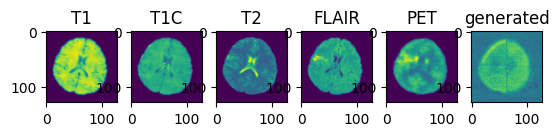

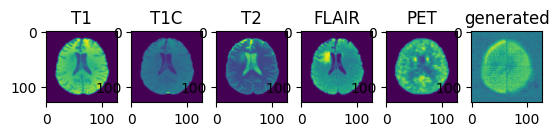

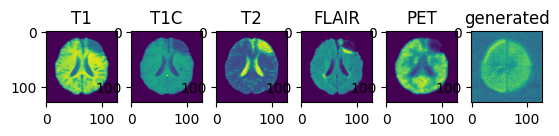

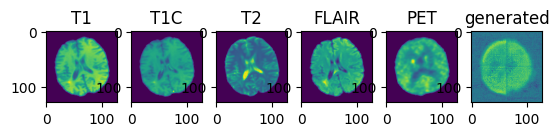

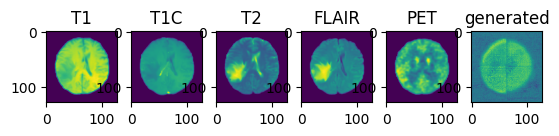

validation avg MS-SSIM: 0.4502 , train avg MS-SSIM: 0.4266
----------
epoch 191/400


Epoch :   0%|                                            | 0/24 [00:00<?, ?it/s]

Epoch :   4%|█▍                                 | 1/24 [01:52<43:11, 112.69s/it]

Epoch :   8%|███                                 | 2/24 [01:54<17:29, 47.71s/it]

Epoch :  12%|████▌                               | 3/24 [01:57<09:25, 26.92s/it]

Epoch :  17%|██████                              | 4/24 [01:59<05:41, 17.08s/it]

Epoch :  21%|███████▌                            | 5/24 [02:01<03:41, 11.65s/it]

Epoch :  25%|█████████                           | 6/24 [02:04<02:37,  8.74s/it]

Epoch :  29%|██████████▌                         | 7/24 [02:06<01:51,  6.54s/it]

Epoch :  33%|████████████                        | 8/24 [02:08<01:21,  5.11s/it]

Epoch :  38%|█████████████▌                      | 9/24 [02:10<01:03,  4.21s/it]

Epoch :  42%|██████████████▌                    | 10/24 [02:12<00:50,  3.59s/it]

Epoch :  46%|████████████████                   | 11/24 [02:14<00:41,  3.17s/it]

Epoch :  50%|█████████████████▌                 | 12/24 [02:17<00:34,  2.87s/it]

Epoch :  54%|██████████████████▉                | 13/24 [02:19<00:29,  2.67s/it]

Epoch :  58%|████████████████████▍              | 14/24 [02:21<00:26,  2.67s/it]

Epoch :  62%|█████████████████████▉             | 15/24 [02:24<00:22,  2.49s/it]

Epoch :  67%|███████████████████████▎           | 16/24 [02:26<00:18,  2.34s/it]

Epoch :  71%|████████████████████████▊          | 17/24 [02:28<00:15,  2.23s/it]

Epoch :  75%|██████████████████████████▎        | 18/24 [02:30<00:12,  2.16s/it]

Epoch :  79%|███████████████████████████▋       | 19/24 [02:32<00:10,  2.19s/it]

Epoch :  83%|█████████████████████████████▏     | 20/24 [02:34<00:08,  2.17s/it]

Epoch :  88%|██████████████████████████████▋    | 21/24 [02:36<00:06,  2.15s/it]

Epoch :  92%|████████████████████████████████   | 22/24 [02:38<00:04,  2.11s/it]

Epoch :  96%|█████████████████████████████████▌ | 23/24 [02:41<00:02,  2.25s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:42<00:00,  1.89s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:45<00:00,  6.90s/it]

----------
epoch 192/400


Epoch :   0%|                                            | 0/24 [00:00<?, ?it/s]

Epoch :   4%|█▍                                 | 1/24 [01:53<43:33, 113.63s/it]

Epoch :   8%|███                                 | 2/24 [01:55<17:34, 47.93s/it]

Epoch :  12%|████▌                               | 3/24 [01:57<09:28, 27.07s/it]

Epoch :  17%|██████                              | 4/24 [02:00<05:45, 17.26s/it]

Epoch :  21%|███████▌                            | 5/24 [02:02<03:45, 11.86s/it]

Epoch :  25%|█████████                           | 6/24 [02:04<02:34,  8.56s/it]

Epoch :  29%|██████████▌                         | 7/24 [02:07<01:52,  6.64s/it]

Epoch :  33%|████████████                        | 8/24 [02:09<01:22,  5.16s/it]

Epoch :  38%|█████████████▌                      | 9/24 [02:11<01:02,  4.14s/it]

Epoch :  42%|██████████████▌                    | 10/24 [02:12<00:48,  3.46s/it]

Epoch :  46%|████████████████                   | 11/24 [02:14<00:39,  3.00s/it]

Epoch :  50%|█████████████████▌                 | 12/24 [02:17<00:32,  2.72s/it]

Epoch :  54%|██████████████████▉                | 13/24 [02:19<00:27,  2.52s/it]

Epoch :  58%|████████████████████▍              | 14/24 [02:21<00:24,  2.45s/it]

Epoch :  62%|█████████████████████▉             | 15/24 [02:23<00:21,  2.42s/it]

Epoch :  67%|███████████████████████▎           | 16/24 [02:25<00:18,  2.29s/it]

Epoch :  71%|████████████████████████▊          | 17/24 [02:27<00:15,  2.20s/it]

Epoch :  75%|██████████████████████████▎        | 18/24 [02:29<00:13,  2.19s/it]

Epoch :  79%|███████████████████████████▋       | 19/24 [02:31<00:10,  2.14s/it]

Epoch :  83%|█████████████████████████████▏     | 20/24 [02:34<00:08,  2.14s/it]

Epoch :  88%|██████████████████████████████▋    | 21/24 [02:36<00:06,  2.12s/it]

Epoch :  92%|████████████████████████████████   | 22/24 [02:38<00:04,  2.09s/it]

Epoch :  96%|█████████████████████████████████▌ | 23/24 [02:40<00:02,  2.24s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:41<00:00,  1.87s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:45<00:00,  6.91s/it]

----------
epoch 193/400


Epoch :   0%|                                            | 0/24 [00:00<?, ?it/s]

Epoch :   4%|█▍                                 | 1/24 [01:51<42:48, 111.68s/it]

Epoch :   8%|███                                 | 2/24 [01:53<17:16, 47.13s/it]

Epoch :  12%|████▌                               | 3/24 [01:55<09:16, 26.49s/it]

Epoch :  17%|██████                              | 4/24 [01:57<05:36, 16.83s/it]

Epoch :  21%|███████▌                            | 5/24 [01:59<03:39, 11.56s/it]

Epoch :  25%|█████████                           | 6/24 [02:01<02:30,  8.35s/it]

Epoch :  29%|██████████▌                         | 7/24 [02:04<01:48,  6.40s/it]

Epoch :  33%|████████████                        | 8/24 [02:06<01:19,  5.00s/it]

Epoch :  38%|█████████████▌                      | 9/24 [02:08<01:01,  4.07s/it]

Epoch :  42%|██████████████▌                    | 10/24 [02:10<00:48,  3.47s/it]

Epoch :  46%|████████████████                   | 11/24 [02:12<00:40,  3.11s/it]

Epoch :  50%|█████████████████▌                 | 12/24 [02:14<00:33,  2.80s/it]

Epoch :  54%|██████████████████▉                | 13/24 [02:16<00:28,  2.57s/it]

Epoch :  58%|████████████████████▍              | 14/24 [02:18<00:24,  2.43s/it]

Epoch :  62%|█████████████████████▉             | 15/24 [02:21<00:21,  2.42s/it]

Epoch :  67%|███████████████████████▎           | 16/24 [02:23<00:18,  2.34s/it]

Epoch :  71%|████████████████████████▊          | 17/24 [02:25<00:16,  2.29s/it]

Epoch :  75%|██████████████████████████▎        | 18/24 [02:27<00:13,  2.29s/it]

Epoch :  79%|███████████████████████████▋       | 19/24 [02:30<00:11,  2.24s/it]

Epoch :  83%|█████████████████████████████▏     | 20/24 [02:32<00:08,  2.15s/it]

Epoch :  88%|██████████████████████████████▋    | 21/24 [02:34<00:06,  2.15s/it]

Epoch :  92%|████████████████████████████████   | 22/24 [02:36<00:04,  2.11s/it]

Epoch :  96%|█████████████████████████████████▌ | 23/24 [02:39<00:02,  2.31s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:40<00:00,  1.94s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:44<00:00,  6.85s/it]

----------
epoch 194/400


Epoch :   0%|                                            | 0/24 [00:00<?, ?it/s]

Epoch :   4%|█▍                                 | 1/24 [01:53<43:24, 113.24s/it]

Epoch :   8%|███                                 | 2/24 [01:56<17:51, 48.72s/it]

Epoch :  12%|████▌                               | 3/24 [01:58<09:35, 27.42s/it]

Epoch :  17%|██████                              | 4/24 [02:00<05:48, 17.43s/it]

Epoch :  21%|███████▌                            | 5/24 [02:02<03:44, 11.84s/it]

Epoch :  25%|█████████                           | 6/24 [02:04<02:32,  8.49s/it]

Epoch :  29%|██████████▌                         | 7/24 [02:07<01:49,  6.43s/it]

Epoch :  33%|████████████                        | 8/24 [02:09<01:22,  5.18s/it]

Epoch :  38%|█████████████▌                      | 9/24 [02:11<01:03,  4.20s/it]

Epoch :  42%|██████████████▌                    | 10/24 [02:13<00:50,  3.59s/it]

Epoch :  46%|████████████████                   | 11/24 [02:16<00:41,  3.20s/it]

Epoch :  50%|█████████████████▌                 | 12/24 [02:18<00:35,  2.94s/it]

Epoch :  54%|██████████████████▉                | 13/24 [02:20<00:29,  2.72s/it]

Epoch :  58%|████████████████████▍              | 14/24 [02:22<00:25,  2.55s/it]

Epoch :  62%|█████████████████████▉             | 15/24 [02:24<00:21,  2.41s/it]

Epoch :  67%|███████████████████████▎           | 16/24 [02:27<00:19,  2.39s/it]

Epoch :  71%|████████████████████████▊          | 17/24 [02:29<00:16,  2.31s/it]

Epoch :  75%|██████████████████████████▎        | 18/24 [02:31<00:13,  2.27s/it]

Epoch :  79%|███████████████████████████▋       | 19/24 [02:33<00:11,  2.20s/it]

Epoch :  83%|█████████████████████████████▏     | 20/24 [02:35<00:08,  2.16s/it]

Epoch :  88%|██████████████████████████████▋    | 21/24 [02:37<00:06,  2.12s/it]

Epoch :  92%|████████████████████████████████   | 22/24 [02:39<00:04,  2.12s/it]

Epoch :  96%|█████████████████████████████████▌ | 23/24 [02:42<00:02,  2.17s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:43<00:00,  1.86s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:47<00:00,  6.99s/it]

----------
epoch 195/400


Epoch :   0%|                                            | 0/24 [00:00<?, ?it/s]

Epoch :   4%|█▍                                 | 1/24 [01:50<42:18, 110.36s/it]

Epoch :   8%|███                                 | 2/24 [01:52<17:07, 46.71s/it]

Epoch :  12%|████▌                               | 3/24 [01:54<09:14, 26.40s/it]

Epoch :  17%|██████                              | 4/24 [01:56<05:35, 16.79s/it]

Epoch :  21%|███████▌                            | 5/24 [01:58<03:38, 11.50s/it]

Epoch :  25%|█████████                           | 6/24 [02:01<02:29,  8.30s/it]

Epoch :  29%|██████████▌                         | 7/24 [02:03<01:46,  6.29s/it]

Epoch :  33%|████████████                        | 8/24 [02:05<01:19,  4.99s/it]

Epoch :  38%|█████████████▌                      | 9/24 [02:08<01:04,  4.31s/it]

Epoch :  42%|██████████████▌                    | 10/24 [02:10<00:50,  3.64s/it]

Epoch :  46%|████████████████                   | 11/24 [02:12<00:41,  3.22s/it]

Epoch :  50%|█████████████████▌                 | 12/24 [02:14<00:34,  2.91s/it]

Epoch :  54%|██████████████████▉                | 13/24 [02:16<00:28,  2.62s/it]

Epoch :  58%|████████████████████▍              | 14/24 [02:18<00:24,  2.43s/it]

Epoch :  62%|█████████████████████▉             | 15/24 [02:20<00:20,  2.32s/it]

Epoch :  67%|███████████████████████▎           | 16/24 [02:23<00:18,  2.31s/it]

Epoch :  71%|████████████████████████▊          | 17/24 [02:25<00:16,  2.40s/it]

Epoch :  75%|██████████████████████████▎        | 18/24 [02:27<00:13,  2.29s/it]

Epoch :  79%|███████████████████████████▋       | 19/24 [02:29<00:11,  2.25s/it]

Epoch :  83%|█████████████████████████████▏     | 20/24 [02:32<00:08,  2.23s/it]

Epoch :  88%|██████████████████████████████▋    | 21/24 [02:34<00:06,  2.18s/it]

Epoch :  92%|████████████████████████████████   | 22/24 [02:36<00:04,  2.20s/it]

Epoch :  96%|█████████████████████████████████▌ | 23/24 [02:38<00:02,  2.23s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:39<00:00,  1.91s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:43<00:00,  6.83s/it]

----------
epoch 196/400


Epoch :   0%|                                            | 0/24 [00:00<?, ?it/s]

Epoch :   4%|█▍                                 | 1/24 [01:51<42:45, 111.54s/it]

Epoch :   8%|███                                 | 2/24 [01:54<17:28, 47.65s/it]

Epoch :  12%|████▌                               | 3/24 [01:56<09:24, 26.89s/it]

Epoch :  17%|██████                              | 4/24 [01:59<05:44, 17.21s/it]

Epoch :  21%|███████▌                            | 5/24 [02:01<03:44, 11.83s/it]

Epoch :  25%|█████████                           | 6/24 [02:03<02:35,  8.63s/it]

Epoch :  29%|██████████▌                         | 7/24 [02:06<01:51,  6.56s/it]

Epoch :  33%|████████████                        | 8/24 [02:08<01:22,  5.18s/it]

Epoch :  38%|█████████████▌                      | 9/24 [02:10<01:04,  4.28s/it]

Epoch :  42%|██████████████▌                    | 10/24 [02:13<00:52,  3.75s/it]

Epoch :  46%|████████████████                   | 11/24 [02:15<00:42,  3.28s/it]

Epoch :  50%|█████████████████▌                 | 12/24 [02:17<00:35,  2.96s/it]

Epoch :  54%|██████████████████▉                | 13/24 [02:19<00:30,  2.73s/it]

Epoch :  58%|████████████████████▍              | 14/24 [02:21<00:25,  2.52s/it]

Epoch :  62%|█████████████████████▉             | 15/24 [02:23<00:21,  2.39s/it]

Epoch :  67%|███████████████████████▎           | 16/24 [02:26<00:18,  2.31s/it]

Epoch :  71%|████████████████████████▊          | 17/24 [02:28<00:15,  2.28s/it]

Epoch :  75%|██████████████████████████▎        | 18/24 [02:30<00:14,  2.37s/it]

Epoch :  79%|███████████████████████████▋       | 19/24 [02:32<00:11,  2.31s/it]

Epoch :  83%|█████████████████████████████▏     | 20/24 [02:35<00:09,  2.27s/it]

Epoch :  88%|██████████████████████████████▋    | 21/24 [02:37<00:06,  2.21s/it]

Epoch :  92%|████████████████████████████████   | 22/24 [02:39<00:04,  2.14s/it]

Epoch :  96%|█████████████████████████████████▌ | 23/24 [02:41<00:02,  2.07s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:42<00:00,  1.75s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:46<00:00,  6.95s/it]

----------
epoch 197/400


Epoch :   0%|                                            | 0/24 [00:00<?, ?it/s]

Epoch :   4%|█▍                                 | 1/24 [01:49<41:51, 109.19s/it]

Epoch :   8%|███                                 | 2/24 [01:51<16:58, 46.31s/it]

Epoch :  12%|████▌                               | 3/24 [01:54<09:14, 26.41s/it]

Epoch :  17%|██████                              | 4/24 [01:56<05:37, 16.88s/it]

Epoch :  21%|███████▌                            | 5/24 [01:58<03:41, 11.64s/it]

Epoch :  25%|█████████                           | 6/24 [02:01<02:31,  8.44s/it]

Epoch :  29%|██████████▌                         | 7/24 [02:03<01:47,  6.35s/it]

Epoch :  33%|████████████                        | 8/24 [02:05<01:19,  4.95s/it]

Epoch :  38%|█████████████▌                      | 9/24 [02:06<00:59,  4.00s/it]

Epoch :  42%|██████████████▌                    | 10/24 [02:08<00:46,  3.34s/it]

Epoch :  46%|████████████████                   | 11/24 [02:11<00:39,  3.02s/it]

Epoch :  50%|█████████████████▌                 | 12/24 [02:13<00:32,  2.70s/it]

Epoch :  54%|██████████████████▉                | 13/24 [02:15<00:27,  2.52s/it]

Epoch :  58%|████████████████████▍              | 14/24 [02:17<00:24,  2.43s/it]

Epoch :  62%|█████████████████████▉             | 15/24 [02:19<00:21,  2.34s/it]

Epoch :  67%|███████████████████████▎           | 16/24 [02:21<00:18,  2.30s/it]

Epoch :  71%|████████████████████████▊          | 17/24 [02:23<00:15,  2.23s/it]

Epoch :  75%|██████████████████████████▎        | 18/24 [02:25<00:12,  2.16s/it]

Epoch :  79%|███████████████████████████▋       | 19/24 [02:28<00:10,  2.19s/it]

Epoch :  83%|█████████████████████████████▏     | 20/24 [02:30<00:08,  2.12s/it]

Epoch :  88%|██████████████████████████████▋    | 21/24 [02:32<00:06,  2.08s/it]

Epoch :  92%|████████████████████████████████   | 22/24 [02:34<00:04,  2.05s/it]

Epoch :  96%|█████████████████████████████████▌ | 23/24 [02:36<00:02,  2.05s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:37<00:00,  1.79s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:41<00:00,  6.71s/it]

----------
epoch 198/400


Epoch :   0%|                                            | 0/24 [00:00<?, ?it/s]

Epoch :   4%|█▍                                 | 1/24 [01:51<42:42, 111.43s/it]

Epoch :   8%|███                                 | 2/24 [01:53<17:16, 47.10s/it]

Epoch :  12%|████▌                               | 3/24 [01:55<09:16, 26.49s/it]

Epoch :  17%|██████                              | 4/24 [01:58<05:40, 17.04s/it]

Epoch :  21%|███████▌                            | 5/24 [02:00<03:40, 11.63s/it]

Epoch :  25%|█████████                           | 6/24 [02:02<02:30,  8.37s/it]

Epoch :  29%|██████████▌                         | 7/24 [02:04<01:46,  6.27s/it]

Epoch :  33%|████████████                        | 8/24 [02:05<01:18,  4.88s/it]

Epoch :  38%|█████████████▌                      | 9/24 [02:07<00:59,  3.98s/it]

Epoch :  42%|██████████████▌                    | 10/24 [02:10<00:48,  3.43s/it]

Epoch :  46%|████████████████                   | 11/24 [02:12<00:39,  3.08s/it]

Epoch :  50%|█████████████████▌                 | 12/24 [02:15<00:38,  3.21s/it]

Epoch :  54%|██████████████████▉                | 13/24 [02:18<00:32,  2.91s/it]

Epoch :  58%|████████████████████▍              | 14/24 [02:20<00:26,  2.67s/it]

Epoch :  62%|█████████████████████▉             | 15/24 [02:22<00:22,  2.47s/it]

Epoch :  67%|███████████████████████▎           | 16/24 [02:24<00:18,  2.35s/it]

Epoch :  71%|████████████████████████▊          | 17/24 [02:26<00:16,  2.31s/it]

Epoch :  75%|██████████████████████████▎        | 18/24 [02:28<00:13,  2.32s/it]

Epoch :  79%|███████████████████████████▋       | 19/24 [02:31<00:11,  2.28s/it]

Epoch :  83%|█████████████████████████████▏     | 20/24 [02:33<00:09,  2.38s/it]

Epoch :  88%|██████████████████████████████▋    | 21/24 [02:35<00:06,  2.30s/it]

Epoch :  92%|████████████████████████████████   | 22/24 [02:38<00:04,  2.30s/it]

Epoch :  96%|█████████████████████████████████▌ | 23/24 [02:40<00:02,  2.27s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:41<00:00,  1.93s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:46<00:00,  6.92s/it]

----------
epoch 199/400


Epoch :   0%|                                            | 0/24 [00:00<?, ?it/s]

Epoch :   4%|█▍                                 | 1/24 [01:49<42:03, 109.72s/it]

Epoch :   8%|███                                 | 2/24 [01:51<16:58, 46.31s/it]

Epoch :  12%|████▌                               | 3/24 [01:53<09:08, 26.13s/it]

Epoch :  17%|██████                              | 4/24 [01:56<05:39, 17.00s/it]

Epoch :  21%|███████▌                            | 5/24 [01:58<03:41, 11.67s/it]

Epoch :  25%|█████████                           | 6/24 [02:01<02:31,  8.40s/it]

Epoch :  29%|██████████▌                         | 7/24 [02:03<01:48,  6.37s/it]

Epoch :  33%|████████████                        | 8/24 [02:05<01:19,  5.00s/it]

Epoch :  38%|█████████████▌                      | 9/24 [02:07<01:01,  4.10s/it]

Epoch :  42%|██████████████▌                    | 10/24 [02:09<00:48,  3.46s/it]

Epoch :  46%|████████████████                   | 11/24 [02:11<00:39,  3.05s/it]

Epoch :  50%|█████████████████▌                 | 12/24 [02:13<00:34,  2.85s/it]

Epoch :  54%|██████████████████▉                | 13/24 [02:16<00:28,  2.62s/it]

Epoch :  58%|████████████████████▍              | 14/24 [02:18<00:25,  2.52s/it]

Epoch :  62%|█████████████████████▉             | 15/24 [02:20<00:22,  2.45s/it]

Epoch :  67%|███████████████████████▎           | 16/24 [02:22<00:19,  2.38s/it]

Epoch :  71%|████████████████████████▊          | 17/24 [02:25<00:16,  2.35s/it]

Epoch :  75%|██████████████████████████▎        | 18/24 [02:27<00:13,  2.27s/it]

Epoch :  79%|███████████████████████████▋       | 19/24 [02:29<00:11,  2.24s/it]

Epoch :  83%|█████████████████████████████▏     | 20/24 [02:31<00:08,  2.24s/it]

Epoch :  88%|██████████████████████████████▋    | 21/24 [02:34<00:07,  2.41s/it]

Epoch :  92%|████████████████████████████████   | 22/24 [02:36<00:04,  2.37s/it]

Epoch :  96%|█████████████████████████████████▌ | 23/24 [02:38<00:02,  2.30s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:39<00:00,  1.91s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:43<00:00,  6.83s/it]

----------
epoch 200/400


Epoch :   0%|                                            | 0/24 [00:00<?, ?it/s]

Epoch :   4%|█▍                                 | 1/24 [01:56<44:46, 116.79s/it]

Epoch :   8%|███                                 | 2/24 [01:58<18:05, 49.36s/it]

Epoch :  12%|████▌                               | 3/24 [02:01<09:44, 27.81s/it]

Epoch :  17%|██████                              | 4/24 [02:03<05:55, 17.75s/it]

Epoch :  21%|███████▌                            | 5/24 [02:06<03:55, 12.40s/it]

Epoch :  25%|█████████                           | 6/24 [02:08<02:41,  8.95s/it]

Epoch :  29%|██████████▌                         | 7/24 [02:10<01:55,  6.78s/it]

Epoch :  33%|████████████                        | 8/24 [02:12<01:24,  5.25s/it]

Epoch :  38%|█████████████▌                      | 9/24 [02:14<01:03,  4.22s/it]

Epoch :  42%|██████████████▌                    | 10/24 [02:16<00:49,  3.54s/it]

Epoch :  46%|████████████████                   | 11/24 [02:19<00:41,  3.16s/it]

Epoch :  50%|█████████████████▌                 | 12/24 [02:21<00:34,  2.84s/it]

Epoch :  54%|██████████████████▉                | 13/24 [02:23<00:29,  2.70s/it]

Epoch :  58%|████████████████████▍              | 14/24 [02:25<00:25,  2.51s/it]

Epoch :  62%|█████████████████████▉             | 15/24 [02:27<00:21,  2.40s/it]

Epoch :  67%|███████████████████████▎           | 16/24 [02:30<00:18,  2.32s/it]

Epoch :  71%|████████████████████████▊          | 17/24 [02:32<00:15,  2.22s/it]

Epoch :  75%|██████████████████████████▎        | 18/24 [02:34<00:12,  2.16s/it]

Epoch :  79%|███████████████████████████▋       | 19/24 [02:36<00:10,  2.10s/it]

Epoch :  83%|█████████████████████████████▏     | 20/24 [02:38<00:08,  2.12s/it]

Epoch :  88%|██████████████████████████████▋    | 21/24 [02:41<00:07,  2.59s/it]

Epoch :  92%|████████████████████████████████   | 22/24 [02:44<00:05,  2.52s/it]

Epoch :  96%|█████████████████████████████████▌ | 23/24 [02:46<00:02,  2.40s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:47<00:00,  1.99s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:52<00:00,  7.17s/it]

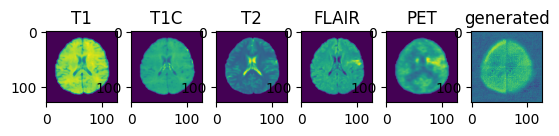

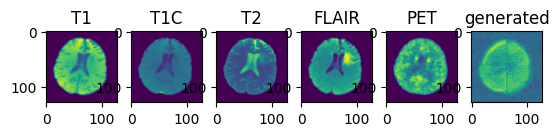

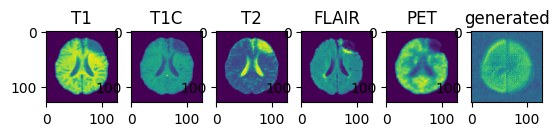

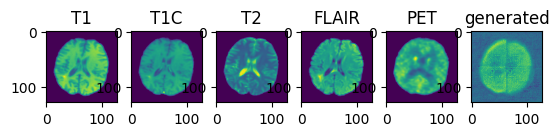

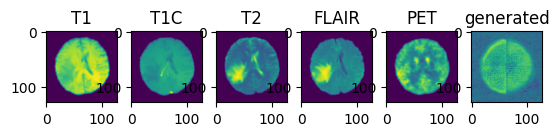

validation avg MS-SSIM: 0.4654 , train avg MS-SSIM: 0.4399
----------
epoch 201/400


Epoch :   0%|                                            | 0/24 [00:00<?, ?it/s]

Epoch :   4%|█▍                                 | 1/24 [01:59<45:49, 119.54s/it]

Epoch :   8%|███                                 | 2/24 [02:02<18:37, 50.78s/it]

Epoch :  12%|████▌                               | 3/24 [02:04<10:00, 28.62s/it]

Epoch :  17%|██████                              | 4/24 [02:06<06:04, 18.22s/it]

Epoch :  21%|███████▌                            | 5/24 [02:08<03:56, 12.46s/it]

Epoch :  25%|█████████                           | 6/24 [02:10<02:40,  8.92s/it]

Epoch :  29%|██████████▌                         | 7/24 [02:12<01:52,  6.63s/it]

Epoch :  33%|████████████                        | 8/24 [02:15<01:24,  5.29s/it]

Epoch :  38%|█████████████▌                      | 9/24 [02:17<01:04,  4.29s/it]

Epoch :  42%|██████████████▌                    | 10/24 [02:19<00:52,  3.75s/it]

Epoch :  46%|████████████████                   | 11/24 [02:22<00:42,  3.30s/it]

Epoch :  50%|█████████████████▌                 | 12/24 [02:24<00:36,  3.02s/it]

Epoch :  54%|██████████████████▉                | 13/24 [02:27<00:31,  2.84s/it]

Epoch :  58%|████████████████████▍              | 14/24 [02:29<00:26,  2.61s/it]

Epoch :  62%|█████████████████████▉             | 15/24 [02:31<00:21,  2.40s/it]

Epoch :  67%|███████████████████████▎           | 16/24 [02:33<00:18,  2.27s/it]

Epoch :  71%|████████████████████████▊          | 17/24 [02:35<00:15,  2.21s/it]

Epoch :  75%|██████████████████████████▎        | 18/24 [02:37<00:14,  2.36s/it]

Epoch :  79%|███████████████████████████▋       | 19/24 [02:39<00:11,  2.26s/it]

Epoch :  83%|█████████████████████████████▏     | 20/24 [02:41<00:08,  2.16s/it]

Epoch :  88%|██████████████████████████████▋    | 21/24 [02:43<00:06,  2.18s/it]

Epoch :  92%|████████████████████████████████   | 22/24 [02:46<00:04,  2.15s/it]

Epoch :  96%|█████████████████████████████████▌ | 23/24 [02:48<00:02,  2.13s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:49<00:00,  1.82s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:53<00:00,  7.22s/it]

----------
epoch 202/400


Epoch :   0%|                                            | 0/24 [00:00<?, ?it/s]

Epoch :   4%|█▍                                 | 1/24 [01:53<43:32, 113.60s/it]

Epoch :   8%|███                                 | 2/24 [01:55<17:34, 47.94s/it]

Epoch :  12%|████▌                               | 3/24 [01:58<09:31, 27.22s/it]

Epoch :  17%|██████                              | 4/24 [02:00<05:45, 17.27s/it]

Epoch :  21%|███████▌                            | 5/24 [02:02<03:44, 11.79s/it]

Epoch :  25%|█████████                           | 6/24 [02:04<02:32,  8.50s/it]

Epoch :  29%|██████████▌                         | 7/24 [02:06<01:48,  6.37s/it]

Epoch :  33%|████████████                        | 8/24 [02:08<01:21,  5.08s/it]

Epoch :  38%|█████████████▌                      | 9/24 [02:10<01:01,  4.13s/it]

Epoch :  42%|██████████████▌                    | 10/24 [02:12<00:48,  3.48s/it]

Epoch :  46%|████████████████                   | 11/24 [02:14<00:39,  3.04s/it]

Epoch :  50%|█████████████████▌                 | 12/24 [02:18<00:37,  3.12s/it]

Epoch :  54%|██████████████████▉                | 13/24 [02:20<00:30,  2.79s/it]

Epoch :  58%|████████████████████▍              | 14/24 [02:22<00:25,  2.55s/it]

Epoch :  62%|█████████████████████▉             | 15/24 [02:23<00:21,  2.34s/it]

Epoch :  67%|███████████████████████▎           | 16/24 [02:25<00:17,  2.24s/it]

Epoch :  71%|████████████████████████▊          | 17/24 [02:28<00:15,  2.22s/it]

Epoch :  75%|██████████████████████████▎        | 18/24 [02:30<00:13,  2.24s/it]

Epoch :  79%|███████████████████████████▋       | 19/24 [02:32<00:10,  2.20s/it]

Epoch :  83%|█████████████████████████████▏     | 20/24 [02:35<00:09,  2.33s/it]

Epoch :  88%|██████████████████████████████▋    | 21/24 [02:37<00:06,  2.26s/it]

Epoch :  92%|████████████████████████████████   | 22/24 [02:39<00:04,  2.16s/it]

Epoch :  96%|█████████████████████████████████▌ | 23/24 [02:41<00:02,  2.14s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:42<00:00,  1.81s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:46<00:00,  6.96s/it]

----------
epoch 203/400


Epoch :   0%|                                            | 0/24 [00:00<?, ?it/s]

Epoch :   4%|█▍                                 | 1/24 [01:59<45:38, 119.08s/it]

Epoch :   8%|███                                 | 2/24 [02:01<18:25, 50.26s/it]

Epoch :  12%|████▌                               | 3/24 [02:03<09:53, 28.29s/it]

Epoch :  17%|██████                              | 4/24 [02:06<06:04, 18.22s/it]

Epoch :  21%|███████▌                            | 5/24 [02:08<03:56, 12.45s/it]

Epoch :  25%|█████████                           | 6/24 [02:10<02:40,  8.94s/it]

Epoch :  29%|██████████▌                         | 7/24 [02:12<01:53,  6.67s/it]

Epoch :  33%|████████████                        | 8/24 [02:14<01:23,  5.23s/it]

Epoch :  38%|█████████████▌                      | 9/24 [02:16<01:03,  4.25s/it]

Epoch :  42%|██████████████▌                    | 10/24 [02:18<00:49,  3.55s/it]

Epoch :  46%|████████████████                   | 11/24 [02:20<00:40,  3.08s/it]

Epoch :  50%|█████████████████▌                 | 12/24 [02:23<00:34,  2.89s/it]

Epoch :  54%|██████████████████▉                | 13/24 [02:25<00:29,  2.70s/it]

Epoch :  58%|████████████████████▍              | 14/24 [02:27<00:24,  2.49s/it]

Epoch :  62%|█████████████████████▉             | 15/24 [02:29<00:21,  2.36s/it]

Epoch :  67%|███████████████████████▎           | 16/24 [02:31<00:18,  2.31s/it]

Epoch :  71%|████████████████████████▊          | 17/24 [02:33<00:15,  2.28s/it]

Epoch :  75%|██████████████████████████▎        | 18/24 [02:35<00:13,  2.22s/it]

Epoch :  79%|███████████████████████████▋       | 19/24 [02:38<00:11,  2.26s/it]

Epoch :  83%|█████████████████████████████▏     | 20/24 [02:40<00:09,  2.38s/it]

Epoch :  88%|██████████████████████████████▋    | 21/24 [02:43<00:06,  2.33s/it]

Epoch :  92%|████████████████████████████████   | 22/24 [02:45<00:04,  2.23s/it]

Epoch :  96%|█████████████████████████████████▌ | 23/24 [02:47<00:02,  2.16s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:48<00:00,  1.82s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:52<00:00,  7.19s/it]

----------
epoch 204/400


Epoch :   0%|                                            | 0/24 [00:00<?, ?it/s]

Epoch :   4%|█▍                                 | 1/24 [01:53<43:27, 113.39s/it]

Epoch :   8%|███                                 | 2/24 [01:55<17:35, 47.98s/it]

Epoch :  12%|████▌                               | 3/24 [01:57<09:27, 27.03s/it]

Epoch :  17%|██████                              | 4/24 [01:59<05:43, 17.18s/it]

Epoch :  21%|███████▌                            | 5/24 [02:02<03:47, 11.97s/it]

Epoch :  25%|█████████                           | 6/24 [02:04<02:35,  8.64s/it]

Epoch :  29%|██████████▌                         | 7/24 [02:06<01:50,  6.48s/it]

Epoch :  33%|████████████                        | 8/24 [02:08<01:20,  5.05s/it]

Epoch :  38%|█████████████▌                      | 9/24 [02:10<01:01,  4.10s/it]

Epoch :  42%|██████████████▌                    | 10/24 [02:12<00:48,  3.43s/it]

Epoch :  46%|████████████████                   | 11/24 [02:14<00:38,  2.99s/it]

Epoch :  50%|█████████████████▌                 | 12/24 [02:17<00:33,  2.82s/it]

Epoch :  54%|██████████████████▉                | 13/24 [02:19<00:28,  2.59s/it]

Epoch :  58%|████████████████████▍              | 14/24 [02:21<00:24,  2.43s/it]

Epoch :  62%|█████████████████████▉             | 15/24 [02:23<00:20,  2.31s/it]

Epoch :  67%|███████████████████████▎           | 16/24 [02:25<00:17,  2.23s/it]

Epoch :  71%|████████████████████████▊          | 17/24 [02:27<00:15,  2.19s/it]

Epoch :  75%|██████████████████████████▎        | 18/24 [02:29<00:13,  2.17s/it]

Epoch :  79%|███████████████████████████▋       | 19/24 [02:31<00:11,  2.22s/it]

Epoch :  83%|█████████████████████████████▏     | 20/24 [02:34<00:09,  2.29s/it]

Epoch :  88%|██████████████████████████████▋    | 21/24 [02:37<00:07,  2.54s/it]

Epoch :  92%|████████████████████████████████   | 22/24 [02:39<00:04,  2.40s/it]

Epoch :  96%|█████████████████████████████████▌ | 23/24 [02:41<00:02,  2.32s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:42<00:00,  1.96s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:47<00:00,  6.97s/it]

----------
epoch 205/400


Epoch :   0%|                                            | 0/24 [00:00<?, ?it/s]

Epoch :   4%|█▍                                 | 1/24 [01:50<42:23, 110.59s/it]

Epoch :   8%|███                                 | 2/24 [01:52<17:09, 46.81s/it]

Epoch :  12%|████▌                               | 3/24 [01:54<09:15, 26.45s/it]

Epoch :  17%|██████                              | 4/24 [01:57<05:38, 16.90s/it]

Epoch :  21%|███████▌                            | 5/24 [01:59<03:43, 11.77s/it]

Epoch :  25%|█████████                           | 6/24 [02:02<02:33,  8.51s/it]

Epoch :  29%|██████████▌                         | 7/24 [02:04<01:49,  6.45s/it]

Epoch :  33%|████████████                        | 8/24 [02:06<01:21,  5.07s/it]

Epoch :  38%|█████████████▌                      | 9/24 [02:08<01:01,  4.12s/it]

Epoch :  42%|██████████████▌                    | 10/24 [02:10<00:48,  3.49s/it]

Epoch :  46%|████████████████                   | 11/24 [02:12<00:40,  3.10s/it]

Epoch :  50%|█████████████████▌                 | 12/24 [02:14<00:33,  2.80s/it]

Epoch :  54%|██████████████████▉                | 13/24 [02:17<00:29,  2.67s/it]

Epoch :  58%|████████████████████▍              | 14/24 [02:19<00:25,  2.51s/it]

Epoch :  62%|█████████████████████▉             | 15/24 [02:21<00:21,  2.38s/it]

Epoch :  67%|███████████████████████▎           | 16/24 [02:23<00:18,  2.34s/it]

Epoch :  71%|████████████████████████▊          | 17/24 [02:25<00:15,  2.28s/it]

Epoch :  75%|██████████████████████████▎        | 18/24 [02:27<00:13,  2.21s/it]

Epoch :  79%|███████████████████████████▋       | 19/24 [02:29<00:10,  2.16s/it]

Epoch :  83%|█████████████████████████████▏     | 20/24 [02:32<00:08,  2.14s/it]

Epoch :  88%|██████████████████████████████▋    | 21/24 [02:33<00:06,  2.09s/it]

Epoch :  92%|████████████████████████████████   | 22/24 [02:36<00:04,  2.16s/it]

Epoch :  96%|█████████████████████████████████▌ | 23/24 [02:38<00:02,  2.13s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:39<00:00,  1.80s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:43<00:00,  6.82s/it]

----------
epoch 206/400


Epoch :   0%|                                            | 0/24 [00:00<?, ?it/s]

Epoch :   4%|█▍                                 | 1/24 [01:52<43:07, 112.49s/it]

Epoch :   8%|███                                 | 2/24 [01:54<17:26, 47.56s/it]

Epoch :  12%|████▌                               | 3/24 [01:56<09:24, 26.88s/it]

Epoch :  17%|██████                              | 4/24 [01:59<05:42, 17.13s/it]

Epoch :  21%|███████▌                            | 5/24 [02:01<03:42, 11.72s/it]

Epoch :  25%|█████████                           | 6/24 [02:04<02:37,  8.76s/it]

Epoch :  29%|██████████▌                         | 7/24 [02:06<01:52,  6.63s/it]

Epoch :  33%|████████████                        | 8/24 [02:08<01:22,  5.17s/it]

Epoch :  38%|█████████████▌                      | 9/24 [02:10<01:03,  4.20s/it]

Epoch :  42%|██████████████▌                    | 10/24 [02:12<00:50,  3.63s/it]

Epoch :  46%|████████████████                   | 11/24 [02:15<00:41,  3.19s/it]

Epoch :  50%|█████████████████▌                 | 12/24 [02:17<00:34,  2.90s/it]

Epoch :  54%|██████████████████▉                | 13/24 [02:19<00:29,  2.71s/it]

Epoch :  58%|████████████████████▍              | 14/24 [02:22<00:26,  2.67s/it]

Epoch :  62%|█████████████████████▉             | 15/24 [02:24<00:22,  2.53s/it]

Epoch :  67%|███████████████████████▎           | 16/24 [02:26<00:19,  2.43s/it]

Epoch :  71%|████████████████████████▊          | 17/24 [02:28<00:16,  2.35s/it]

Epoch :  75%|██████████████████████████▎        | 18/24 [02:30<00:13,  2.27s/it]

Epoch :  79%|███████████████████████████▋       | 19/24 [02:32<00:11,  2.21s/it]

Epoch :  83%|█████████████████████████████▏     | 20/24 [02:34<00:08,  2.12s/it]

Epoch :  88%|██████████████████████████████▋    | 21/24 [02:36<00:06,  2.07s/it]

Epoch :  92%|████████████████████████████████   | 22/24 [02:38<00:04,  2.03s/it]

Epoch :  96%|█████████████████████████████████▌ | 23/24 [02:41<00:02,  2.25s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:42<00:00,  1.92s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:46<00:00,  6.95s/it]

----------
epoch 207/400


Epoch :   0%|                                            | 0/24 [00:00<?, ?it/s]

Epoch :   4%|█▍                                 | 1/24 [01:52<43:17, 112.94s/it]

Epoch :   8%|███                                 | 2/24 [01:54<17:29, 47.71s/it]

Epoch :  12%|████▌                               | 3/24 [01:57<09:25, 26.92s/it]

Epoch :  17%|██████                              | 4/24 [01:59<05:43, 17.20s/it]

Epoch :  21%|███████▌                            | 5/24 [02:01<03:43, 11.78s/it]

Epoch :  25%|█████████                           | 6/24 [02:03<02:32,  8.49s/it]

Epoch :  29%|██████████▌                         | 7/24 [02:06<01:50,  6.47s/it]

Epoch :  33%|████████████                        | 8/24 [02:08<01:20,  5.04s/it]

Epoch :  38%|█████████████▌                      | 9/24 [02:09<01:01,  4.07s/it]

Epoch :  42%|██████████████▌                    | 10/24 [02:11<00:47,  3.39s/it]

Epoch :  46%|████████████████                   | 11/24 [02:13<00:38,  2.93s/it]

Epoch :  50%|█████████████████▌                 | 12/24 [02:15<00:31,  2.64s/it]

Epoch :  54%|██████████████████▉                | 13/24 [02:17<00:26,  2.44s/it]

Epoch :  58%|████████████████████▍              | 14/24 [02:19<00:23,  2.35s/it]

Epoch :  62%|█████████████████████▉             | 15/24 [02:21<00:20,  2.24s/it]

Epoch :  67%|███████████████████████▎           | 16/24 [02:24<00:18,  2.27s/it]

Epoch :  71%|████████████████████████▊          | 17/24 [02:26<00:15,  2.19s/it]

Epoch :  75%|██████████████████████████▎        | 18/24 [02:28<00:12,  2.10s/it]

Epoch :  79%|███████████████████████████▋       | 19/24 [02:29<00:10,  2.03s/it]

Epoch :  83%|█████████████████████████████▏     | 20/24 [02:31<00:07,  1.98s/it]

Epoch :  88%|██████████████████████████████▋    | 21/24 [02:33<00:05,  1.98s/it]

Epoch :  92%|████████████████████████████████   | 22/24 [02:35<00:03,  1.98s/it]

Epoch :  96%|█████████████████████████████████▌ | 23/24 [02:38<00:02,  2.07s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:39<00:00,  1.79s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:43<00:00,  6.82s/it]

----------
epoch 208/400


Epoch :   0%|                                            | 0/24 [00:00<?, ?it/s]

Epoch :   4%|█▍                                 | 1/24 [01:49<42:09, 109.96s/it]

Epoch :   8%|███                                 | 2/24 [01:52<17:02, 46.48s/it]

Epoch :  12%|████▌                               | 3/24 [01:54<09:09, 26.17s/it]

Epoch :  17%|██████                              | 4/24 [01:56<05:32, 16.64s/it]

Epoch :  21%|███████▌                            | 5/24 [01:57<03:35, 11.34s/it]

Epoch :  25%|█████████                           | 6/24 [01:59<02:26,  8.13s/it]

Epoch :  29%|██████████▌                         | 7/24 [02:01<01:44,  6.12s/it]

Epoch :  33%|████████████                        | 8/24 [02:04<01:18,  4.94s/it]

Epoch :  38%|█████████████▌                      | 9/24 [02:06<01:00,  4.02s/it]

Epoch :  42%|██████████████▌                    | 10/24 [02:08<00:47,  3.39s/it]

Epoch :  46%|████████████████                   | 11/24 [02:10<00:38,  3.00s/it]

Epoch :  50%|█████████████████▌                 | 12/24 [02:12<00:32,  2.75s/it]

Epoch :  54%|██████████████████▉                | 13/24 [02:14<00:28,  2.57s/it]

Epoch :  58%|████████████████████▍              | 14/24 [02:17<00:25,  2.56s/it]

Epoch :  62%|█████████████████████▉             | 15/24 [02:19<00:22,  2.45s/it]

Epoch :  67%|███████████████████████▎           | 16/24 [02:22<00:20,  2.54s/it]

Epoch :  71%|████████████████████████▊          | 17/24 [02:24<00:16,  2.41s/it]

Epoch :  75%|██████████████████████████▎        | 18/24 [02:26<00:14,  2.36s/it]

Epoch :  79%|███████████████████████████▋       | 19/24 [02:28<00:11,  2.30s/it]

Epoch :  83%|█████████████████████████████▏     | 20/24 [02:30<00:09,  2.28s/it]

Epoch :  88%|██████████████████████████████▋    | 21/24 [02:33<00:06,  2.25s/it]

Epoch :  92%|████████████████████████████████   | 22/24 [02:35<00:04,  2.20s/it]

Epoch :  96%|█████████████████████████████████▌ | 23/24 [02:37<00:02,  2.15s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:38<00:00,  1.83s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:42<00:00,  6.78s/it]

----------
epoch 209/400


Epoch :   0%|                                            | 0/24 [00:00<?, ?it/s]

Epoch :   4%|█▍                                 | 1/24 [01:52<43:07, 112.49s/it]

Epoch :   8%|███                                 | 2/24 [01:54<17:28, 47.64s/it]

Epoch :  12%|████▌                               | 3/24 [01:56<09:23, 26.85s/it]

Epoch :  17%|██████                              | 4/24 [01:58<05:40, 17.03s/it]

Epoch :  21%|███████▌                            | 5/24 [02:00<03:40, 11.60s/it]

Epoch :  25%|█████████                           | 6/24 [02:02<02:29,  8.31s/it]

Epoch :  29%|██████████▌                         | 7/24 [02:04<01:46,  6.26s/it]

Epoch :  33%|████████████                        | 8/24 [02:06<01:18,  4.89s/it]

Epoch :  38%|█████████████▌                      | 9/24 [02:09<01:02,  4.16s/it]

Epoch :  42%|██████████████▌                    | 10/24 [02:11<00:49,  3.51s/it]

Epoch :  46%|████████████████                   | 11/24 [02:13<00:39,  3.07s/it]

Epoch :  50%|█████████████████▌                 | 12/24 [02:15<00:33,  2.82s/it]

Epoch :  54%|██████████████████▉                | 13/24 [02:17<00:28,  2.61s/it]

Epoch :  58%|████████████████████▍              | 14/24 [02:19<00:24,  2.44s/it]

Epoch :  62%|█████████████████████▉             | 15/24 [02:21<00:20,  2.30s/it]

Epoch :  67%|███████████████████████▎           | 16/24 [02:23<00:17,  2.22s/it]

Epoch :  71%|████████████████████████▊          | 17/24 [02:26<00:15,  2.25s/it]

Epoch :  75%|██████████████████████████▎        | 18/24 [02:28<00:14,  2.34s/it]

Epoch :  79%|███████████████████████████▋       | 19/24 [02:30<00:11,  2.31s/it]

Epoch :  83%|█████████████████████████████▏     | 20/24 [02:33<00:09,  2.26s/it]

Epoch :  88%|██████████████████████████████▋    | 21/24 [02:35<00:06,  2.24s/it]

Epoch :  92%|████████████████████████████████   | 22/24 [02:37<00:04,  2.21s/it]

Epoch :  96%|█████████████████████████████████▌ | 23/24 [02:39<00:02,  2.15s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:40<00:00,  1.82s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:44<00:00,  6.87s/it]

----------
epoch 210/400


Epoch :   0%|                                            | 0/24 [00:00<?, ?it/s]

Epoch :   4%|█▍                                 | 1/24 [01:50<42:20, 110.44s/it]

Epoch :   8%|███                                 | 2/24 [01:53<17:17, 47.14s/it]

Epoch :  12%|████▌                               | 3/24 [01:55<09:18, 26.62s/it]

Epoch :  17%|██████                              | 4/24 [01:57<05:37, 16.88s/it]

Epoch :  21%|███████▌                            | 5/24 [01:59<03:38, 11.51s/it]

Epoch :  25%|█████████                           | 6/24 [02:01<02:29,  8.28s/it]

Epoch :  29%|██████████▌                         | 7/24 [02:03<01:46,  6.26s/it]

Epoch :  33%|████████████                        | 8/24 [02:05<01:19,  4.95s/it]

Epoch :  38%|█████████████▌                      | 9/24 [02:07<01:01,  4.10s/it]

Epoch :  42%|██████████████▌                    | 10/24 [02:10<00:50,  3.62s/it]

Epoch :  46%|████████████████                   | 11/24 [02:12<00:41,  3.19s/it]

Epoch :  50%|█████████████████▌                 | 12/24 [02:14<00:34,  2.85s/it]

Epoch :  54%|██████████████████▉                | 13/24 [02:16<00:28,  2.57s/it]

Epoch :  58%|████████████████████▍              | 14/24 [02:18<00:23,  2.37s/it]

Epoch :  62%|█████████████████████▉             | 15/24 [02:20<00:20,  2.25s/it]

Epoch :  67%|███████████████████████▎           | 16/24 [02:22<00:17,  2.25s/it]

Epoch :  71%|████████████████████████▊          | 17/24 [02:24<00:15,  2.16s/it]

Epoch :  75%|██████████████████████████▎        | 18/24 [02:27<00:13,  2.19s/it]

Epoch :  79%|███████████████████████████▋       | 19/24 [02:28<00:10,  2.12s/it]

Epoch :  83%|█████████████████████████████▏     | 20/24 [02:31<00:08,  2.10s/it]

Epoch :  88%|██████████████████████████████▋    | 21/24 [02:33<00:06,  2.07s/it]

Epoch :  92%|████████████████████████████████   | 22/24 [02:34<00:04,  2.03s/it]

Epoch :  96%|█████████████████████████████████▌ | 23/24 [02:36<00:02,  2.00s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:37<00:00,  1.71s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:42<00:00,  6.75s/it]

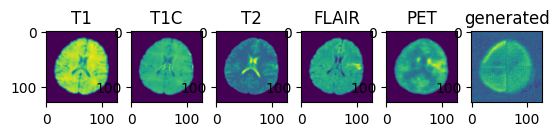

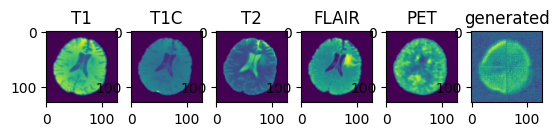

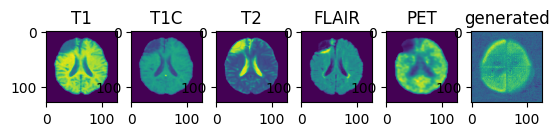

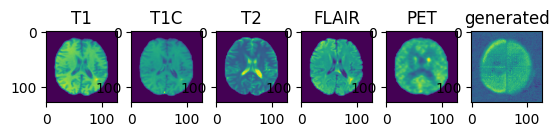

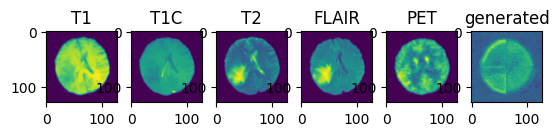

validation avg MS-SSIM: 0.4645 , train avg MS-SSIM: 0.4434
----------
epoch 211/400


Epoch :   0%|                                            | 0/24 [00:00<?, ?it/s]

Epoch :   4%|█▌                                  | 1/24 [01:39<38:06, 99.42s/it]

Epoch :   8%|███                                 | 2/24 [01:41<15:31, 42.34s/it]

Epoch :  12%|████▌                               | 3/24 [01:43<08:22, 23.95s/it]

Epoch :  17%|██████                              | 4/24 [01:45<05:05, 15.27s/it]

Epoch :  21%|███████▌                            | 5/24 [01:47<03:18, 10.47s/it]

Epoch :  25%|█████████                           | 6/24 [01:49<02:16,  7.58s/it]

Epoch :  29%|██████████▌                         | 7/24 [01:51<01:37,  5.75s/it]

Epoch :  33%|████████████                        | 8/24 [01:53<01:12,  4.54s/it]

Epoch :  38%|█████████████▌                      | 9/24 [01:55<00:56,  3.74s/it]

Epoch :  42%|██████████████▌                    | 10/24 [01:57<00:44,  3.20s/it]

Epoch :  46%|████████████████                   | 11/24 [01:59<00:37,  2.92s/it]

Epoch :  50%|█████████████████▌                 | 12/24 [02:01<00:31,  2.61s/it]

Epoch :  54%|██████████████████▉                | 13/24 [02:03<00:26,  2.39s/it]

Epoch :  58%|████████████████████▍              | 14/24 [02:05<00:22,  2.23s/it]

Epoch :  62%|█████████████████████▉             | 15/24 [02:07<00:19,  2.14s/it]

Epoch :  67%|███████████████████████▎           | 16/24 [02:09<00:16,  2.07s/it]

Epoch :  71%|████████████████████████▊          | 17/24 [02:11<00:14,  2.03s/it]

Epoch :  75%|██████████████████████████▎        | 18/24 [02:13<00:12,  2.02s/it]

Epoch :  79%|███████████████████████████▋       | 19/24 [02:15<00:10,  2.17s/it]

Epoch :  83%|█████████████████████████████▏     | 20/24 [02:17<00:08,  2.08s/it]

Epoch :  88%|██████████████████████████████▋    | 21/24 [02:19<00:06,  2.02s/it]

Epoch :  92%|████████████████████████████████   | 22/24 [02:21<00:03,  1.99s/it]

Epoch :  96%|█████████████████████████████████▌ | 23/24 [02:23<00:01,  1.96s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:24<00:00,  1.67s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:28<00:00,  6.18s/it]

----------
epoch 212/400


Epoch :   0%|                                            | 0/24 [00:00<?, ?it/s]

Epoch :   4%|█▍                                 | 1/24 [01:51<42:41, 111.37s/it]

Epoch :   8%|███                                 | 2/24 [01:53<17:18, 47.19s/it]

Epoch :  12%|████▌                               | 3/24 [01:56<09:21, 26.72s/it]

Epoch :  17%|██████                              | 4/24 [01:58<05:46, 17.30s/it]

Epoch :  21%|███████▌                            | 5/24 [02:01<03:46, 11.90s/it]

Epoch :  25%|█████████                           | 6/24 [02:03<02:33,  8.55s/it]

Epoch :  29%|██████████▌                         | 7/24 [02:05<01:49,  6.46s/it]

Epoch :  33%|████████████                        | 8/24 [02:07<01:21,  5.09s/it]

Epoch :  38%|█████████████▌                      | 9/24 [02:09<01:02,  4.17s/it]

Epoch :  42%|██████████████▌                    | 10/24 [02:12<00:50,  3.60s/it]

Epoch :  46%|████████████████                   | 11/24 [02:14<00:41,  3.20s/it]

Epoch :  50%|█████████████████▌                 | 12/24 [02:16<00:35,  2.97s/it]

Epoch :  54%|██████████████████▉                | 13/24 [02:18<00:28,  2.64s/it]

Epoch :  58%|████████████████████▍              | 14/24 [02:20<00:24,  2.42s/it]

Epoch :  62%|█████████████████████▉             | 15/24 [02:22<00:20,  2.27s/it]

Epoch :  67%|███████████████████████▎           | 16/24 [02:24<00:17,  2.17s/it]

Epoch :  71%|████████████████████████▊          | 17/24 [02:26<00:14,  2.10s/it]

Epoch :  75%|██████████████████████████▎        | 18/24 [02:28<00:12,  2.05s/it]

Epoch :  79%|███████████████████████████▋       | 19/24 [02:30<00:10,  2.10s/it]

Epoch :  83%|█████████████████████████████▏     | 20/24 [02:32<00:08,  2.03s/it]

Epoch :  88%|██████████████████████████████▋    | 21/24 [02:34<00:06,  2.03s/it]

Epoch :  92%|████████████████████████████████   | 22/24 [02:36<00:04,  2.06s/it]

Epoch :  96%|█████████████████████████████████▌ | 23/24 [02:38<00:02,  2.10s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:39<00:00,  1.80s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:43<00:00,  6.80s/it]

----------
epoch 213/400


Epoch :   0%|                                            | 0/24 [00:00<?, ?it/s]

Epoch :   4%|█▌                                  | 1/24 [01:37<37:23, 97.56s/it]

Epoch :   8%|███                                 | 2/24 [01:39<15:08, 41.30s/it]

Epoch :  12%|████▌                               | 3/24 [01:41<08:10, 23.35s/it]

Epoch :  17%|██████                              | 4/24 [01:43<05:01, 15.05s/it]

Epoch :  21%|███████▌                            | 5/24 [01:45<03:17, 10.37s/it]

Epoch :  25%|█████████                           | 6/24 [01:47<02:15,  7.51s/it]

Epoch :  29%|██████████▌                         | 7/24 [01:49<01:36,  5.68s/it]

Epoch :  33%|████████████                        | 8/24 [01:51<01:11,  4.48s/it]

Epoch :  38%|█████████████▌                      | 9/24 [01:53<00:54,  3.66s/it]

Epoch :  42%|██████████████▌                    | 10/24 [01:55<00:43,  3.11s/it]

Epoch :  46%|████████████████                   | 11/24 [01:57<00:35,  2.74s/it]

Epoch :  50%|█████████████████▌                 | 12/24 [01:59<00:31,  2.61s/it]

Epoch :  54%|██████████████████▉                | 13/24 [02:01<00:26,  2.43s/it]

Epoch :  58%|████████████████████▍              | 14/24 [02:03<00:22,  2.29s/it]

Epoch :  62%|█████████████████████▉             | 15/24 [02:05<00:19,  2.20s/it]

Epoch :  67%|███████████████████████▎           | 16/24 [02:07<00:16,  2.12s/it]

Epoch :  71%|████████████████████████▊          | 17/24 [02:09<00:14,  2.09s/it]

Epoch :  75%|██████████████████████████▎        | 18/24 [02:11<00:12,  2.05s/it]

Epoch :  79%|███████████████████████████▋       | 19/24 [02:13<00:09,  2.00s/it]

Epoch :  83%|█████████████████████████████▏     | 20/24 [02:15<00:07,  1.96s/it]

Epoch :  88%|██████████████████████████████▋    | 21/24 [02:17<00:06,  2.02s/it]

Epoch :  92%|████████████████████████████████   | 22/24 [02:19<00:03,  1.96s/it]

Epoch :  96%|█████████████████████████████████▌ | 23/24 [02:21<00:01,  1.93s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:22<00:00,  1.65s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:25<00:00,  6.07s/it]

----------
epoch 214/400


Epoch :   0%|                                            | 0/24 [00:00<?, ?it/s]

Epoch :   4%|█▍                                 | 1/24 [01:41<39:05, 101.96s/it]

Epoch :   8%|███                                 | 2/24 [01:44<15:50, 43.19s/it]

Epoch :  12%|████▌                               | 3/24 [01:46<08:32, 24.39s/it]

Epoch :  17%|██████                              | 4/24 [01:48<05:11, 15.58s/it]

Epoch :  21%|███████▌                            | 5/24 [01:50<03:26, 10.88s/it]

Epoch :  25%|█████████                           | 6/24 [01:52<02:20,  7.82s/it]

Epoch :  29%|██████████▌                         | 7/24 [01:54<01:41,  5.95s/it]

Epoch :  33%|████████████                        | 8/24 [01:56<01:15,  4.70s/it]

Epoch :  38%|█████████████▌                      | 9/24 [01:58<00:58,  3.89s/it]

Epoch :  42%|██████████████▌                    | 10/24 [02:00<00:46,  3.30s/it]

Epoch :  46%|████████████████                   | 11/24 [02:02<00:37,  2.88s/it]

Epoch :  50%|█████████████████▌                 | 12/24 [02:04<00:31,  2.59s/it]

Epoch :  54%|██████████████████▉                | 13/24 [02:06<00:26,  2.39s/it]

Epoch :  58%|████████████████████▍              | 14/24 [02:08<00:23,  2.39s/it]

Epoch :  62%|█████████████████████▉             | 15/24 [02:10<00:20,  2.25s/it]

Epoch :  67%|███████████████████████▎           | 16/24 [02:12<00:17,  2.18s/it]

Epoch :  71%|████████████████████████▊          | 17/24 [02:14<00:14,  2.12s/it]

Epoch :  75%|██████████████████████████▎        | 18/24 [02:16<00:12,  2.04s/it]

Epoch :  79%|███████████████████████████▋       | 19/24 [02:18<00:10,  2.01s/it]

Epoch :  83%|█████████████████████████████▏     | 20/24 [02:20<00:07,  1.97s/it]

Epoch :  88%|██████████████████████████████▋    | 21/24 [02:22<00:05,  1.94s/it]

Epoch :  92%|████████████████████████████████   | 22/24 [02:24<00:04,  2.05s/it]

Epoch :  96%|█████████████████████████████████▌ | 23/24 [02:26<00:01,  1.99s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:27<00:00,  1.70s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:30<00:00,  6.28s/it]

----------
epoch 215/400


Epoch :   0%|                                            | 0/24 [00:00<?, ?it/s]

Epoch :   4%|█▍                                 | 1/24 [01:41<38:50, 101.34s/it]

Epoch :   8%|███                                 | 2/24 [01:43<15:46, 43.04s/it]

Epoch :  12%|████▌                               | 3/24 [01:45<08:32, 24.43s/it]

Epoch :  17%|██████                              | 4/24 [01:47<05:11, 15.59s/it]

Epoch :  21%|███████▌                            | 5/24 [01:49<03:22, 10.68s/it]

Epoch :  25%|█████████                           | 6/24 [01:52<02:22,  7.92s/it]

Epoch :  29%|██████████▌                         | 7/24 [01:54<01:41,  5.98s/it]

Epoch :  33%|████████████                        | 8/24 [01:56<01:14,  4.66s/it]

Epoch :  38%|█████████████▌                      | 9/24 [01:58<00:56,  3.79s/it]

Epoch :  42%|██████████████▌                    | 10/24 [01:59<00:44,  3.19s/it]

Epoch :  46%|████████████████                   | 11/24 [02:01<00:36,  2.78s/it]

Epoch :  50%|█████████████████▌                 | 12/24 [02:03<00:29,  2.49s/it]

Epoch :  54%|██████████████████▉                | 13/24 [02:05<00:25,  2.32s/it]

Epoch :  58%|████████████████████▍              | 14/24 [02:07<00:23,  2.33s/it]

Epoch :  62%|█████████████████████▉             | 15/24 [02:09<00:19,  2.22s/it]

Epoch :  67%|███████████████████████▎           | 16/24 [02:11<00:17,  2.13s/it]

Epoch :  71%|████████████████████████▊          | 17/24 [02:13<00:14,  2.04s/it]

Epoch :  75%|██████████████████████████▎        | 18/24 [02:15<00:11,  2.00s/it]

Epoch :  79%|███████████████████████████▋       | 19/24 [02:17<00:09,  1.98s/it]

Epoch :  83%|█████████████████████████████▏     | 20/24 [02:19<00:07,  1.95s/it]

Epoch :  88%|██████████████████████████████▋    | 21/24 [02:21<00:05,  1.92s/it]

Epoch :  92%|████████████████████████████████   | 22/24 [02:23<00:03,  1.90s/it]

Epoch :  96%|█████████████████████████████████▌ | 23/24 [02:25<00:01,  1.97s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:26<00:00,  1.68s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:29<00:00,  6.23s/it]

----------
epoch 216/400


Epoch :   0%|                                            | 0/24 [00:00<?, ?it/s]

Epoch :   4%|█▍                                 | 1/24 [01:43<39:39, 103.47s/it]

Epoch :   8%|███                                 | 2/24 [01:45<16:03, 43.78s/it]

Epoch :  12%|████▌                               | 3/24 [01:47<08:38, 24.69s/it]

Epoch :  17%|██████                              | 4/24 [01:49<05:14, 15.74s/it]

Epoch :  21%|███████▌                            | 5/24 [01:51<03:25, 10.82s/it]

Epoch :  25%|█████████                           | 6/24 [01:53<02:20,  7.82s/it]

Epoch :  29%|██████████▌                         | 7/24 [01:56<01:43,  6.12s/it]

Epoch :  33%|████████████                        | 8/24 [01:58<01:16,  4.80s/it]

Epoch :  38%|█████████████▌                      | 9/24 [02:00<00:58,  3.89s/it]

Epoch :  42%|██████████████▌                    | 10/24 [02:02<00:46,  3.31s/it]

Epoch :  46%|████████████████                   | 11/24 [02:04<00:38,  2.95s/it]

Epoch :  50%|█████████████████▌                 | 12/24 [02:06<00:31,  2.65s/it]

Epoch :  54%|██████████████████▉                | 13/24 [02:08<00:26,  2.43s/it]

Epoch :  58%|████████████████████▍              | 14/24 [02:10<00:22,  2.29s/it]

Epoch :  62%|█████████████████████▉             | 15/24 [02:12<00:21,  2.36s/it]

Epoch :  67%|███████████████████████▎           | 16/24 [02:14<00:18,  2.26s/it]

Epoch :  71%|████████████████████████▊          | 17/24 [02:16<00:15,  2.18s/it]

Epoch :  75%|██████████████████████████▎        | 18/24 [02:18<00:12,  2.15s/it]

Epoch :  79%|███████████████████████████▋       | 19/24 [02:20<00:10,  2.12s/it]

Epoch :  83%|█████████████████████████████▏     | 20/24 [02:22<00:08,  2.10s/it]

Epoch :  88%|██████████████████████████████▋    | 21/24 [02:24<00:06,  2.06s/it]

Epoch :  92%|████████████████████████████████   | 22/24 [02:26<00:04,  2.01s/it]

Epoch :  96%|█████████████████████████████████▌ | 23/24 [02:28<00:02,  2.08s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:29<00:00,  1.75s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:33<00:00,  6.39s/it]

----------
epoch 217/400


Epoch :   0%|                                            | 0/24 [00:00<?, ?it/s]

Epoch :   4%|█▍                                 | 1/24 [01:42<39:09, 102.15s/it]

Epoch :   8%|███                                 | 2/24 [01:44<15:53, 43.33s/it]

Epoch :  12%|████▌                               | 3/24 [01:46<08:33, 24.47s/it]

Epoch :  17%|██████                              | 4/24 [01:48<05:12, 15.61s/it]

Epoch :  21%|███████▌                            | 5/24 [01:50<03:23, 10.69s/it]

Epoch :  25%|█████████                           | 6/24 [01:52<02:19,  7.74s/it]

Epoch :  29%|██████████▌                         | 7/24 [01:54<01:39,  5.85s/it]

Epoch :  33%|████████████                        | 8/24 [01:56<01:16,  4.79s/it]

Epoch :  38%|█████████████▌                      | 9/24 [01:58<00:58,  3.92s/it]

Epoch :  42%|██████████████▌                    | 10/24 [02:00<00:46,  3.34s/it]

Epoch :  46%|████████████████                   | 11/24 [02:02<00:38,  2.94s/it]

Epoch :  50%|█████████████████▌                 | 12/24 [02:05<00:32,  2.69s/it]

Epoch :  54%|██████████████████▉                | 13/24 [02:07<00:27,  2.51s/it]

Epoch :  58%|████████████████████▍              | 14/24 [02:09<00:23,  2.36s/it]

Epoch :  62%|█████████████████████▉             | 15/24 [02:11<00:20,  2.25s/it]

Epoch :  67%|███████████████████████▎           | 16/24 [02:13<00:18,  2.31s/it]

Epoch :  71%|████████████████████████▊          | 17/24 [02:15<00:15,  2.19s/it]

Epoch :  75%|██████████████████████████▎        | 18/24 [02:17<00:12,  2.10s/it]

Epoch :  79%|███████████████████████████▋       | 19/24 [02:19<00:10,  2.05s/it]

Epoch :  83%|█████████████████████████████▏     | 20/24 [02:21<00:08,  2.02s/it]

Epoch :  88%|██████████████████████████████▋    | 21/24 [02:23<00:06,  2.02s/it]

Epoch :  92%|████████████████████████████████   | 22/24 [02:25<00:04,  2.04s/it]

Epoch :  96%|█████████████████████████████████▌ | 23/24 [02:27<00:02,  2.01s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:28<00:00,  1.71s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:31<00:00,  6.32s/it]

----------
epoch 218/400


Epoch :   0%|                                            | 0/24 [00:00<?, ?it/s]

Epoch :   4%|█▍                                 | 1/24 [01:42<39:12, 102.27s/it]

Epoch :   8%|███                                 | 2/24 [01:44<15:54, 43.40s/it]

Epoch :  12%|████▌                               | 3/24 [01:46<08:35, 24.57s/it]

Epoch :  17%|██████                              | 4/24 [01:48<05:13, 15.69s/it]

Epoch :  21%|███████▌                            | 5/24 [01:50<03:25, 10.80s/it]

Epoch :  25%|█████████                           | 6/24 [01:52<02:21,  7.85s/it]

Epoch :  29%|██████████▌                         | 7/24 [01:55<01:41,  5.97s/it]

Epoch :  33%|████████████                        | 8/24 [01:57<01:16,  4.76s/it]

Epoch :  38%|█████████████▌                      | 9/24 [01:59<01:00,  4.04s/it]

Epoch :  42%|██████████████▌                    | 10/24 [02:01<00:48,  3.43s/it]

Epoch :  46%|████████████████                   | 11/24 [02:03<00:38,  2.98s/it]

Epoch :  50%|█████████████████▌                 | 12/24 [02:05<00:31,  2.66s/it]

Epoch :  54%|██████████████████▉                | 13/24 [02:07<00:27,  2.46s/it]

Epoch :  58%|████████████████████▍              | 14/24 [02:09<00:23,  2.34s/it]

Epoch :  62%|█████████████████████▉             | 15/24 [02:11<00:20,  2.24s/it]

Epoch :  67%|███████████████████████▎           | 16/24 [02:13<00:17,  2.15s/it]

Epoch :  71%|████████████████████████▊          | 17/24 [02:15<00:15,  2.20s/it]

Epoch :  75%|██████████████████████████▎        | 18/24 [02:17<00:12,  2.11s/it]

Epoch :  79%|███████████████████████████▋       | 19/24 [02:19<00:10,  2.04s/it]

Epoch :  83%|█████████████████████████████▏     | 20/24 [02:21<00:07,  1.99s/it]

Epoch :  88%|██████████████████████████████▋    | 21/24 [02:23<00:05,  1.96s/it]

Epoch :  92%|████████████████████████████████   | 22/24 [02:25<00:03,  1.94s/it]

Epoch :  96%|█████████████████████████████████▌ | 23/24 [02:27<00:01,  1.96s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:28<00:00,  1.71s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:32<00:00,  6.33s/it]

----------
epoch 219/400


Epoch :   0%|                                            | 0/24 [00:00<?, ?it/s]

Epoch :   4%|█▌                                  | 1/24 [01:38<37:48, 98.65s/it]

Epoch :   8%|███                                 | 2/24 [01:40<15:19, 41.81s/it]

Epoch :  12%|████▌                               | 3/24 [01:42<08:16, 23.66s/it]

Epoch :  17%|██████                              | 4/24 [01:44<05:02, 15.14s/it]

Epoch :  21%|███████▌                            | 5/24 [01:46<03:17, 10.40s/it]

Epoch :  25%|█████████                           | 6/24 [01:48<02:15,  7.52s/it]

Epoch :  29%|██████████▌                         | 7/24 [01:50<01:36,  5.70s/it]

Epoch :  33%|████████████                        | 8/24 [01:52<01:12,  4.51s/it]

Epoch :  38%|█████████████▌                      | 9/24 [01:54<00:55,  3.69s/it]

Epoch :  42%|██████████████▌                    | 10/24 [01:56<00:44,  3.15s/it]

Epoch :  46%|████████████████                   | 11/24 [01:58<00:36,  2.81s/it]

Epoch :  50%|█████████████████▌                 | 12/24 [02:00<00:30,  2.56s/it]

Epoch :  54%|██████████████████▉                | 13/24 [02:02<00:26,  2.38s/it]

Epoch :  58%|████████████████████▍              | 14/24 [02:04<00:22,  2.26s/it]

Epoch :  62%|█████████████████████▉             | 15/24 [02:06<00:19,  2.17s/it]

Epoch :  67%|███████████████████████▎           | 16/24 [02:08<00:16,  2.10s/it]

Epoch :  71%|████████████████████████▊          | 17/24 [02:10<00:14,  2.13s/it]

Epoch :  75%|██████████████████████████▎        | 18/24 [02:12<00:12,  2.11s/it]

Epoch :  79%|███████████████████████████▋       | 19/24 [02:14<00:10,  2.10s/it]

Epoch :  83%|█████████████████████████████▏     | 20/24 [02:16<00:08,  2.07s/it]

Epoch :  88%|██████████████████████████████▋    | 21/24 [02:18<00:06,  2.02s/it]

Epoch :  92%|████████████████████████████████   | 22/24 [02:20<00:03,  1.98s/it]

Epoch :  96%|█████████████████████████████████▌ | 23/24 [02:22<00:01,  1.95s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:23<00:00,  1.68s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:26<00:00,  6.10s/it]

----------
epoch 220/400


Epoch :   0%|                                            | 0/24 [00:00<?, ?it/s]

Epoch :   4%|█▌                                  | 1/24 [01:37<37:17, 97.29s/it]

Epoch :   8%|███                                 | 2/24 [01:39<15:13, 41.53s/it]

Epoch :  12%|████▌                               | 3/24 [01:41<08:13, 23.49s/it]

Epoch :  17%|██████                              | 4/24 [01:43<05:00, 15.03s/it]

Epoch :  21%|███████▌                            | 5/24 [01:45<03:16, 10.36s/it]

Epoch :  25%|█████████                           | 6/24 [01:47<02:14,  7.49s/it]

Epoch :  29%|██████████▌                         | 7/24 [01:49<01:36,  5.66s/it]

Epoch :  33%|████████████                        | 8/24 [01:51<01:11,  4.48s/it]

Epoch :  38%|█████████████▌                      | 9/24 [01:53<00:55,  3.71s/it]

Epoch :  42%|██████████████▌                    | 10/24 [01:56<00:46,  3.31s/it]

Epoch :  46%|████████████████                   | 11/24 [01:58<00:37,  2.87s/it]

Epoch :  50%|█████████████████▌                 | 12/24 [01:59<00:30,  2.56s/it]

Epoch :  54%|██████████████████▉                | 13/24 [02:01<00:26,  2.37s/it]

Epoch :  58%|████████████████████▍              | 14/24 [02:03<00:22,  2.29s/it]

Epoch :  62%|█████████████████████▉             | 15/24 [02:05<00:19,  2.16s/it]

Epoch :  67%|███████████████████████▎           | 16/24 [02:07<00:16,  2.07s/it]

Epoch :  71%|████████████████████████▊          | 17/24 [02:09<00:14,  2.01s/it]

Epoch :  75%|██████████████████████████▎        | 18/24 [02:11<00:12,  2.08s/it]

Epoch :  79%|███████████████████████████▋       | 19/24 [02:13<00:10,  2.04s/it]

Epoch :  83%|█████████████████████████████▏     | 20/24 [02:15<00:08,  2.03s/it]

Epoch :  88%|██████████████████████████████▋    | 21/24 [02:17<00:05,  1.99s/it]

Epoch :  92%|████████████████████████████████   | 22/24 [02:19<00:03,  1.96s/it]

Epoch :  96%|█████████████████████████████████▌ | 23/24 [02:21<00:01,  1.97s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:22<00:00,  1.72s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:25<00:00,  6.08s/it]

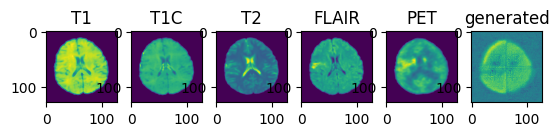

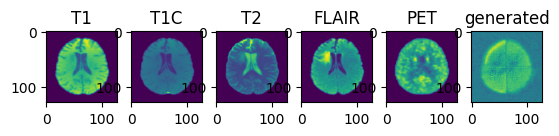

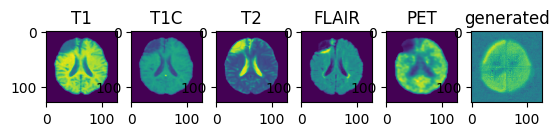

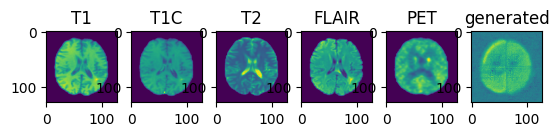

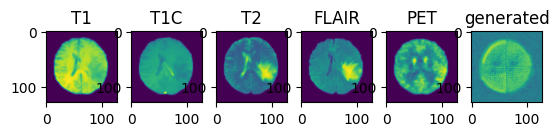

validation avg MS-SSIM: 0.4643 , train avg MS-SSIM: 0.4435
----------
epoch 221/400


Epoch :   0%|                                            | 0/24 [00:00<?, ?it/s]

Epoch :   4%|█▍                                 | 1/24 [01:41<38:54, 101.51s/it]

Epoch :   8%|███                                 | 2/24 [01:43<15:45, 42.96s/it]

Epoch :  12%|████▌                               | 3/24 [01:45<08:30, 24.30s/it]

Epoch :  17%|██████                              | 4/24 [01:47<05:10, 15.51s/it]

Epoch :  21%|███████▌                            | 5/24 [01:49<03:21, 10.61s/it]

Epoch :  25%|█████████                           | 6/24 [01:51<02:17,  7.65s/it]

Epoch :  29%|██████████▌                         | 7/24 [01:53<01:38,  5.79s/it]

Epoch :  33%|████████████                        | 8/24 [01:55<01:13,  4.57s/it]

Epoch :  38%|█████████████▌                      | 9/24 [01:57<00:58,  3.90s/it]

Epoch :  42%|██████████████▌                    | 10/24 [01:59<00:46,  3.31s/it]

Epoch :  46%|████████████████                   | 11/24 [02:01<00:37,  2.89s/it]

Epoch :  50%|█████████████████▌                 | 12/24 [02:03<00:31,  2.61s/it]

Epoch :  54%|██████████████████▉                | 13/24 [02:05<00:26,  2.42s/it]

Epoch :  58%|████████████████████▍              | 14/24 [02:07<00:22,  2.30s/it]

Epoch :  62%|█████████████████████▉             | 15/24 [02:09<00:19,  2.22s/it]

Epoch :  67%|███████████████████████▎           | 16/24 [02:11<00:17,  2.14s/it]

Epoch :  71%|████████████████████████▊          | 17/24 [02:13<00:14,  2.08s/it]

Epoch :  75%|██████████████████████████▎        | 18/24 [02:15<00:12,  2.16s/it]

Epoch :  79%|███████████████████████████▋       | 19/24 [02:17<00:10,  2.10s/it]

Epoch :  83%|█████████████████████████████▏     | 20/24 [02:19<00:08,  2.06s/it]

Epoch :  88%|██████████████████████████████▋    | 21/24 [02:21<00:06,  2.00s/it]

Epoch :  92%|████████████████████████████████   | 22/24 [02:23<00:03,  1.96s/it]

Epoch :  96%|█████████████████████████████████▌ | 23/24 [02:25<00:01,  1.94s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:26<00:00,  1.65s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:29<00:00,  6.25s/it]

----------
epoch 222/400


Epoch :   0%|                                            | 0/24 [00:00<?, ?it/s]

Epoch :   4%|█▍                                 | 1/24 [01:41<38:46, 101.16s/it]

Epoch :   8%|███                                 | 2/24 [01:43<15:49, 43.16s/it]

Epoch :  12%|████▌                               | 3/24 [01:45<08:31, 24.35s/it]

Epoch :  17%|██████                              | 4/24 [01:47<05:10, 15.53s/it]

Epoch :  21%|███████▌                            | 5/24 [01:49<03:22, 10.66s/it]

Epoch :  25%|█████████                           | 6/24 [01:51<02:19,  7.73s/it]

Epoch :  29%|██████████▌                         | 7/24 [01:53<01:39,  5.83s/it]

Epoch :  33%|████████████                        | 8/24 [01:55<01:13,  4.60s/it]

Epoch :  38%|█████████████▌                      | 9/24 [01:57<00:57,  3.80s/it]

Epoch :  42%|██████████████▌                    | 10/24 [02:00<00:47,  3.40s/it]

Epoch :  46%|████████████████                   | 11/24 [02:02<00:38,  2.96s/it]

Epoch :  50%|█████████████████▌                 | 12/24 [02:04<00:31,  2.65s/it]

Epoch :  54%|██████████████████▉                | 13/24 [02:06<00:26,  2.44s/it]

Epoch :  58%|████████████████████▍              | 14/24 [02:08<00:23,  2.31s/it]

Epoch :  62%|█████████████████████▉             | 15/24 [02:10<00:20,  2.24s/it]

Epoch :  67%|███████████████████████▎           | 16/24 [02:12<00:17,  2.20s/it]

Epoch :  71%|████████████████████████▊          | 17/24 [02:14<00:15,  2.15s/it]

Epoch :  75%|██████████████████████████▎        | 18/24 [02:16<00:12,  2.08s/it]

Epoch :  79%|███████████████████████████▋       | 19/24 [02:18<00:10,  2.15s/it]

Epoch :  83%|█████████████████████████████▏     | 20/24 [02:20<00:08,  2.08s/it]

Epoch :  88%|██████████████████████████████▋    | 21/24 [02:22<00:06,  2.02s/it]

Epoch :  92%|████████████████████████████████   | 22/24 [02:24<00:03,  1.99s/it]

Epoch :  96%|█████████████████████████████████▌ | 23/24 [02:26<00:01,  1.97s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:27<00:00,  1.69s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:30<00:00,  6.28s/it]

----------
epoch 223/400


Epoch :   0%|                                            | 0/24 [00:00<?, ?it/s]

Epoch :   4%|█▌                                  | 1/24 [01:39<38:03, 99.26s/it]

Epoch :   8%|███                                 | 2/24 [01:41<15:25, 42.06s/it]

Epoch :  12%|████▌                               | 3/24 [01:43<08:23, 23.97s/it]

Epoch :  17%|██████                              | 4/24 [01:45<05:05, 15.28s/it]

Epoch :  21%|███████▌                            | 5/24 [01:47<03:20, 10.56s/it]

Epoch :  25%|█████████                           | 6/24 [01:49<02:17,  7.62s/it]

Epoch :  29%|██████████▌                         | 7/24 [01:51<01:37,  5.74s/it]

Epoch :  33%|████████████                        | 8/24 [01:53<01:11,  4.50s/it]

Epoch :  38%|█████████████▌                      | 9/24 [01:55<00:55,  3.67s/it]

Epoch :  42%|██████████████▌                    | 10/24 [01:57<00:44,  3.18s/it]

Epoch :  46%|████████████████                   | 11/24 [02:00<00:40,  3.12s/it]

Epoch :  50%|█████████████████▌                 | 12/24 [02:02<00:33,  2.77s/it]

Epoch :  54%|██████████████████▉                | 13/24 [02:04<00:28,  2.56s/it]

Epoch :  58%|████████████████████▍              | 14/24 [02:06<00:23,  2.39s/it]

Epoch :  62%|█████████████████████▉             | 15/24 [02:08<00:20,  2.33s/it]

Epoch :  67%|███████████████████████▎           | 16/24 [02:10<00:17,  2.23s/it]

Epoch :  71%|████████████████████████▊          | 17/24 [02:12<00:14,  2.11s/it]

Epoch :  75%|██████████████████████████▎        | 18/24 [02:14<00:12,  2.05s/it]

Epoch :  79%|███████████████████████████▋       | 19/24 [02:16<00:11,  2.20s/it]

Epoch :  83%|█████████████████████████████▏     | 20/24 [02:18<00:08,  2.15s/it]

Epoch :  88%|██████████████████████████████▋    | 21/24 [02:21<00:06,  2.13s/it]

Epoch :  92%|████████████████████████████████   | 22/24 [02:23<00:04,  2.09s/it]

Epoch :  96%|█████████████████████████████████▌ | 23/24 [02:25<00:02,  2.05s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:26<00:00,  1.74s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:29<00:00,  6.23s/it]

----------
epoch 224/400


Epoch :   0%|                                            | 0/24 [00:00<?, ?it/s]

Epoch :   4%|█▌                                  | 1/24 [01:38<37:51, 98.78s/it]

Epoch :   8%|███                                 | 2/24 [01:40<15:23, 41.96s/it]

Epoch :  12%|████▌                               | 3/24 [01:42<08:18, 23.72s/it]

Epoch :  17%|██████                              | 4/24 [01:45<05:07, 15.39s/it]

Epoch :  21%|███████▌                            | 5/24 [01:47<03:20, 10.56s/it]

Epoch :  25%|█████████                           | 6/24 [01:49<02:18,  7.67s/it]

Epoch :  29%|██████████▌                         | 7/24 [01:51<01:39,  5.84s/it]

Epoch :  33%|████████████                        | 8/24 [01:53<01:14,  4.64s/it]

Epoch :  38%|█████████████▌                      | 9/24 [01:55<00:58,  3.88s/it]

Epoch :  42%|██████████████▌                    | 10/24 [01:58<00:46,  3.31s/it]

Epoch :  46%|████████████████                   | 11/24 [02:00<00:37,  2.90s/it]

Epoch :  50%|█████████████████▌                 | 12/24 [02:02<00:34,  2.85s/it]

Epoch :  54%|██████████████████▉                | 13/24 [02:04<00:28,  2.61s/it]

Epoch :  58%|████████████████████▍              | 14/24 [02:06<00:24,  2.46s/it]

Epoch :  62%|█████████████████████▉             | 15/24 [02:08<00:20,  2.32s/it]

Epoch :  67%|███████████████████████▎           | 16/24 [02:10<00:17,  2.24s/it]

Epoch :  71%|████████████████████████▊          | 17/24 [02:13<00:15,  2.20s/it]

Epoch :  75%|██████████████████████████▎        | 18/24 [02:15<00:12,  2.14s/it]

Epoch :  79%|███████████████████████████▋       | 19/24 [02:16<00:10,  2.08s/it]

Epoch :  83%|█████████████████████████████▏     | 20/24 [02:19<00:08,  2.13s/it]

Epoch :  88%|██████████████████████████████▋    | 21/24 [02:21<00:06,  2.06s/it]

Epoch :  92%|████████████████████████████████   | 22/24 [02:23<00:04,  2.06s/it]

Epoch :  96%|█████████████████████████████████▌ | 23/24 [02:25<00:02,  2.07s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:26<00:00,  1.76s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:29<00:00,  6.25s/it]

----------
epoch 225/400


Epoch :   0%|                                            | 0/24 [00:00<?, ?it/s]

Epoch :   4%|█▍                                 | 1/24 [01:41<39:02, 101.85s/it]

Epoch :   8%|███                                 | 2/24 [01:44<15:50, 43.20s/it]

Epoch :  12%|████▌                               | 3/24 [01:46<08:32, 24.40s/it]

Epoch :  17%|██████                              | 4/24 [01:48<05:11, 15.55s/it]

Epoch :  21%|███████▌                            | 5/24 [01:50<03:25, 10.83s/it]

Epoch :  25%|█████████                           | 6/24 [01:52<02:20,  7.81s/it]

Epoch :  29%|██████████▌                         | 7/24 [01:54<01:40,  5.93s/it]

Epoch :  33%|████████████                        | 8/24 [01:56<01:14,  4.67s/it]

Epoch :  38%|█████████████▌                      | 9/24 [01:58<00:57,  3.84s/it]

Epoch :  42%|██████████████▌                    | 10/24 [02:00<00:45,  3.27s/it]

Epoch :  46%|████████████████                   | 11/24 [02:02<00:36,  2.84s/it]

Epoch :  50%|█████████████████▌                 | 12/24 [02:04<00:31,  2.59s/it]

Epoch :  54%|██████████████████▉                | 13/24 [02:07<00:29,  2.69s/it]

Epoch :  58%|████████████████████▍              | 14/24 [02:09<00:24,  2.45s/it]

Epoch :  62%|█████████████████████▉             | 15/24 [02:11<00:20,  2.30s/it]

Epoch :  67%|███████████████████████▎           | 16/24 [02:13<00:17,  2.23s/it]

Epoch :  71%|████████████████████████▊          | 17/24 [02:15<00:15,  2.17s/it]

Epoch :  75%|██████████████████████████▎        | 18/24 [02:17<00:12,  2.12s/it]

Epoch :  79%|███████████████████████████▋       | 19/24 [02:19<00:10,  2.06s/it]

Epoch :  83%|█████████████████████████████▏     | 20/24 [02:21<00:08,  2.02s/it]

Epoch :  88%|██████████████████████████████▋    | 21/24 [02:23<00:06,  2.14s/it]

Epoch :  92%|████████████████████████████████   | 22/24 [02:25<00:04,  2.10s/it]

Epoch :  96%|█████████████████████████████████▌ | 23/24 [02:27<00:02,  2.07s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:28<00:00,  1.74s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:31<00:00,  6.32s/it]

----------
epoch 226/400


Epoch :   0%|                                            | 0/24 [00:00<?, ?it/s]

Epoch :   4%|█▌                                  | 1/24 [01:38<37:48, 98.64s/it]

Epoch :   8%|███                                 | 2/24 [01:40<15:20, 41.82s/it]

Epoch :  12%|████▌                               | 3/24 [01:42<08:16, 23.65s/it]

Epoch :  17%|██████                              | 4/24 [01:44<05:02, 15.12s/it]

Epoch :  21%|███████▌                            | 5/24 [01:46<03:17, 10.42s/it]

Epoch :  25%|█████████                           | 6/24 [01:49<02:20,  7.78s/it]

Epoch :  29%|██████████▌                         | 7/24 [01:51<01:40,  5.92s/it]

Epoch :  33%|████████████                        | 8/24 [01:53<01:15,  4.70s/it]

Epoch :  38%|█████████████▌                      | 9/24 [01:55<00:57,  3.86s/it]

Epoch :  42%|██████████████▌                    | 10/24 [01:57<00:45,  3.28s/it]

Epoch :  46%|████████████████                   | 11/24 [01:59<00:37,  2.89s/it]

Epoch :  50%|█████████████████▌                 | 12/24 [02:01<00:31,  2.62s/it]

Epoch :  54%|██████████████████▉                | 13/24 [02:03<00:26,  2.43s/it]

Epoch :  58%|████████████████████▍              | 14/24 [02:06<00:24,  2.40s/it]

Epoch :  62%|█████████████████████▉             | 15/24 [02:07<00:20,  2.27s/it]

Epoch :  67%|███████████████████████▎           | 16/24 [02:10<00:17,  2.22s/it]

Epoch :  71%|████████████████████████▊          | 17/24 [02:12<00:15,  2.17s/it]

Epoch :  75%|██████████████████████████▎        | 18/24 [02:14<00:12,  2.10s/it]

Epoch :  79%|███████████████████████████▋       | 19/24 [02:16<00:10,  2.06s/it]

Epoch :  83%|█████████████████████████████▏     | 20/24 [02:17<00:08,  2.03s/it]

Epoch :  88%|██████████████████████████████▋    | 21/24 [02:19<00:06,  2.01s/it]

Epoch :  92%|████████████████████████████████   | 22/24 [02:21<00:04,  2.01s/it]

Epoch :  96%|█████████████████████████████████▌ | 23/24 [02:24<00:02,  2.12s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:25<00:00,  1.79s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:28<00:00,  6.19s/it]

----------
epoch 227/400


Epoch :   0%|                                            | 0/24 [00:00<?, ?it/s]

Epoch :   4%|█▍                                 | 1/24 [01:43<39:42, 103.61s/it]

Epoch :   8%|███                                 | 2/24 [01:45<16:03, 43.79s/it]

Epoch :  12%|████▌                               | 3/24 [01:47<08:38, 24.68s/it]

Epoch :  17%|██████                              | 4/24 [01:49<05:14, 15.72s/it]

Epoch :  21%|███████▌                            | 5/24 [01:51<03:23, 10.74s/it]

Epoch :  25%|█████████                           | 6/24 [01:53<02:19,  7.73s/it]

Epoch :  29%|██████████▌                         | 7/24 [01:55<01:41,  5.98s/it]

Epoch :  33%|████████████                        | 8/24 [01:57<01:14,  4.68s/it]

Epoch :  38%|█████████████▌                      | 9/24 [01:59<00:57,  3.80s/it]

Epoch :  42%|██████████████▌                    | 10/24 [02:01<00:45,  3.24s/it]

Epoch :  46%|████████████████                   | 11/24 [02:03<00:37,  2.88s/it]

Epoch :  50%|█████████████████▌                 | 12/24 [02:05<00:30,  2.58s/it]

Epoch :  54%|██████████████████▉                | 13/24 [02:07<00:26,  2.39s/it]

Epoch :  58%|████████████████████▍              | 14/24 [02:09<00:22,  2.28s/it]

Epoch :  62%|█████████████████████▉             | 15/24 [02:11<00:20,  2.23s/it]

Epoch :  67%|███████████████████████▎           | 16/24 [02:13<00:18,  2.31s/it]

Epoch :  71%|████████████████████████▊          | 17/24 [02:15<00:15,  2.22s/it]

Epoch :  75%|██████████████████████████▎        | 18/24 [02:17<00:12,  2.16s/it]

Epoch :  79%|███████████████████████████▋       | 19/24 [02:20<00:10,  2.14s/it]

Epoch :  83%|█████████████████████████████▏     | 20/24 [02:22<00:08,  2.11s/it]

Epoch :  88%|██████████████████████████████▋    | 21/24 [02:24<00:06,  2.06s/it]

Epoch :  92%|████████████████████████████████   | 22/24 [02:25<00:04,  2.03s/it]

Epoch :  96%|█████████████████████████████████▌ | 23/24 [02:27<00:02,  2.01s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:28<00:00,  1.72s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:32<00:00,  6.35s/it]

----------
epoch 228/400


Epoch :   0%|                                            | 0/24 [00:00<?, ?it/s]

Epoch :   4%|█▌                                  | 1/24 [01:36<36:53, 96.22s/it]

Epoch :   8%|███                                 | 2/24 [01:38<14:56, 40.77s/it]

Epoch :  12%|████▌                               | 3/24 [01:40<08:03, 23.03s/it]

Epoch :  17%|██████                              | 4/24 [01:42<04:53, 14.69s/it]

Epoch :  21%|███████▌                            | 5/24 [01:44<03:12, 10.15s/it]

Epoch :  25%|█████████                           | 6/24 [01:46<02:13,  7.41s/it]

Epoch :  29%|██████████▌                         | 7/24 [01:48<01:36,  5.65s/it]

Epoch :  33%|████████████                        | 8/24 [01:50<01:13,  4.56s/it]

Epoch :  38%|█████████████▌                      | 9/24 [01:52<00:55,  3.72s/it]

Epoch :  42%|██████████████▌                    | 10/24 [01:54<00:44,  3.15s/it]

Epoch :  46%|████████████████                   | 11/24 [01:56<00:35,  2.76s/it]

Epoch :  50%|█████████████████▌                 | 12/24 [01:57<00:29,  2.50s/it]

Epoch :  54%|██████████████████▉                | 13/24 [01:59<00:25,  2.31s/it]

Epoch :  58%|████████████████████▍              | 14/24 [02:01<00:21,  2.18s/it]

Epoch :  62%|█████████████████████▉             | 15/24 [02:03<00:18,  2.09s/it]

Epoch :  67%|███████████████████████▎           | 16/24 [02:05<00:16,  2.03s/it]

Epoch :  71%|████████████████████████▊          | 17/24 [02:07<00:14,  2.10s/it]

Epoch :  75%|██████████████████████████▎        | 18/24 [02:09<00:12,  2.08s/it]

Epoch :  79%|███████████████████████████▋       | 19/24 [02:11<00:10,  2.03s/it]

Epoch :  83%|█████████████████████████████▏     | 20/24 [02:13<00:08,  2.01s/it]

Epoch :  88%|██████████████████████████████▋    | 21/24 [02:15<00:05,  1.98s/it]

Epoch :  92%|████████████████████████████████   | 22/24 [02:17<00:03,  1.95s/it]

Epoch :  96%|█████████████████████████████████▌ | 23/24 [02:19<00:01,  1.94s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:20<00:00,  1.65s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:23<00:00,  5.98s/it]

----------
epoch 229/400


Epoch :   0%|                                            | 0/24 [00:00<?, ?it/s]

Epoch :   4%|█▍                                 | 1/24 [01:43<39:42, 103.58s/it]

Epoch :   8%|███                                 | 2/24 [01:45<16:03, 43.81s/it]

Epoch :  12%|████▌                               | 3/24 [01:47<08:38, 24.71s/it]

Epoch :  17%|██████                              | 4/24 [01:49<05:15, 15.77s/it]

Epoch :  21%|███████▌                            | 5/24 [01:51<03:25, 10.83s/it]

Epoch :  25%|█████████                           | 6/24 [01:53<02:21,  7.84s/it]

Epoch :  29%|██████████▌                         | 7/24 [01:55<01:40,  5.93s/it]

Epoch :  33%|████████████                        | 8/24 [01:57<01:14,  4.68s/it]

Epoch :  38%|█████████████▌                      | 9/24 [01:59<00:57,  3.83s/it]

Epoch :  42%|██████████████▌                    | 10/24 [02:02<00:47,  3.38s/it]

Epoch :  46%|████████████████                   | 11/24 [02:04<00:39,  3.01s/it]

Epoch :  50%|█████████████████▌                 | 12/24 [02:06<00:32,  2.71s/it]

Epoch :  54%|██████████████████▉                | 13/24 [02:08<00:27,  2.49s/it]

Epoch :  58%|████████████████████▍              | 14/24 [02:10<00:23,  2.33s/it]

Epoch :  62%|█████████████████████▉             | 15/24 [02:12<00:19,  2.22s/it]

Epoch :  67%|███████████████████████▎           | 16/24 [02:14<00:17,  2.18s/it]

Epoch :  71%|████████████████████████▊          | 17/24 [02:16<00:14,  2.14s/it]

Epoch :  75%|██████████████████████████▎        | 18/24 [02:18<00:12,  2.16s/it]

Epoch :  79%|███████████████████████████▋       | 19/24 [02:20<00:10,  2.09s/it]

Epoch :  83%|█████████████████████████████▏     | 20/24 [02:22<00:08,  2.08s/it]

Epoch :  88%|██████████████████████████████▋    | 21/24 [02:24<00:06,  2.05s/it]

Epoch :  92%|████████████████████████████████   | 22/24 [02:26<00:04,  2.01s/it]

Epoch :  96%|█████████████████████████████████▌ | 23/24 [02:28<00:01,  1.97s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:29<00:00,  1.68s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:32<00:00,  6.37s/it]

----------
epoch 230/400


Epoch :   0%|                                            | 0/24 [00:00<?, ?it/s]

Epoch :   4%|█▌                                  | 1/24 [01:39<38:08, 99.48s/it]

Epoch :   8%|███                                 | 2/24 [01:42<15:35, 42.52s/it]

Epoch :  12%|████▌                               | 3/24 [01:44<08:24, 24.02s/it]

Epoch :  17%|██████                              | 4/24 [01:46<05:05, 15.29s/it]

Epoch :  21%|███████▌                            | 5/24 [01:48<03:19, 10.49s/it]

Epoch :  25%|█████████                           | 6/24 [01:49<02:16,  7.59s/it]

Epoch :  29%|██████████▌                         | 7/24 [01:51<01:37,  5.72s/it]

Epoch :  33%|████████████                        | 8/24 [01:53<01:11,  4.49s/it]

Epoch :  38%|█████████████▌                      | 9/24 [01:55<00:55,  3.70s/it]

Epoch :  42%|██████████████▌                    | 10/24 [01:57<00:44,  3.19s/it]

Epoch :  46%|████████████████                   | 11/24 [01:59<00:37,  2.89s/it]

Epoch :  50%|█████████████████▌                 | 12/24 [02:01<00:30,  2.58s/it]

Epoch :  54%|██████████████████▉                | 13/24 [02:03<00:25,  2.36s/it]

Epoch :  58%|████████████████████▍              | 14/24 [02:05<00:22,  2.23s/it]

Epoch :  62%|█████████████████████▉             | 15/24 [02:07<00:19,  2.19s/it]

Epoch :  67%|███████████████████████▎           | 16/24 [02:09<00:17,  2.13s/it]

Epoch :  71%|████████████████████████▊          | 17/24 [02:11<00:14,  2.06s/it]

Epoch :  75%|██████████████████████████▎        | 18/24 [02:13<00:11,  2.00s/it]

Epoch :  79%|███████████████████████████▋       | 19/24 [02:15<00:10,  2.07s/it]

Epoch :  83%|█████████████████████████████▏     | 20/24 [02:17<00:08,  2.01s/it]

Epoch :  88%|██████████████████████████████▋    | 21/24 [02:19<00:05,  2.00s/it]

Epoch :  92%|████████████████████████████████   | 22/24 [02:21<00:03,  1.97s/it]

Epoch :  96%|█████████████████████████████████▌ | 23/24 [02:23<00:01,  1.96s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:24<00:00,  1.67s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:27<00:00,  6.17s/it]

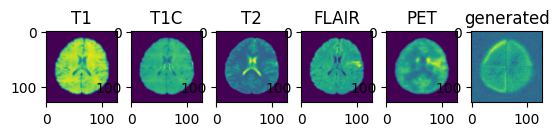

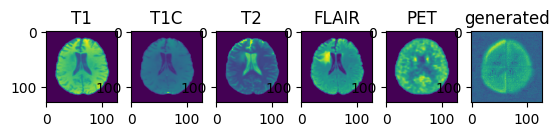

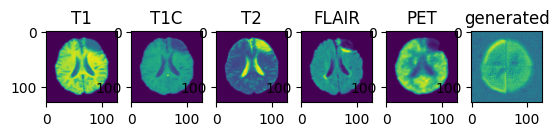

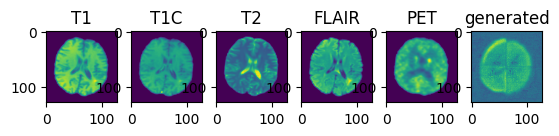

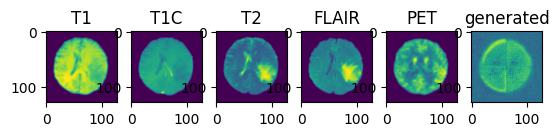

validation avg MS-SSIM: 0.4821 , train avg MS-SSIM: 0.4548
----------
epoch 231/400


Epoch :   0%|                                            | 0/24 [00:00<?, ?it/s]

Epoch :   4%|█▍                                 | 1/24 [01:40<38:36, 100.71s/it]

Epoch :   8%|███                                 | 2/24 [01:42<15:37, 42.62s/it]

Epoch :  12%|████▌                               | 3/24 [01:44<08:24, 24.04s/it]

Epoch :  17%|██████                              | 4/24 [01:46<05:06, 15.31s/it]

Epoch :  21%|███████▌                            | 5/24 [01:48<03:19, 10.49s/it]

Epoch :  25%|█████████                           | 6/24 [01:50<02:16,  7.58s/it]

Epoch :  29%|██████████▌                         | 7/24 [01:52<01:37,  5.74s/it]

Epoch :  33%|████████████                        | 8/24 [01:54<01:15,  4.71s/it]

Epoch :  38%|█████████████▌                      | 9/24 [01:56<00:57,  3.86s/it]

Epoch :  42%|██████████████▌                    | 10/24 [01:58<00:46,  3.29s/it]

Epoch :  46%|████████████████                   | 11/24 [02:00<00:37,  2.89s/it]

Epoch :  50%|█████████████████▌                 | 12/24 [02:02<00:31,  2.61s/it]

Epoch :  54%|██████████████████▉                | 13/24 [02:04<00:26,  2.42s/it]

Epoch :  58%|████████████████████▍              | 14/24 [02:06<00:22,  2.29s/it]

Epoch :  62%|█████████████████████▉             | 15/24 [02:08<00:19,  2.19s/it]

Epoch :  67%|███████████████████████▎           | 16/24 [02:11<00:19,  2.45s/it]

Epoch :  71%|████████████████████████▊          | 17/24 [02:13<00:16,  2.31s/it]

Epoch :  75%|██████████████████████████▎        | 18/24 [02:15<00:13,  2.22s/it]

Epoch :  79%|███████████████████████████▋       | 19/24 [02:17<00:10,  2.13s/it]

Epoch :  83%|█████████████████████████████▏     | 20/24 [02:19<00:08,  2.06s/it]

Epoch :  88%|██████████████████████████████▋    | 21/24 [02:21<00:06,  2.05s/it]

Epoch :  92%|████████████████████████████████   | 22/24 [02:23<00:03,  1.99s/it]

Epoch :  96%|█████████████████████████████████▌ | 23/24 [02:25<00:01,  1.97s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:26<00:00,  1.68s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:29<00:00,  6.24s/it]

----------
epoch 232/400


Epoch :   0%|                                            | 0/24 [00:00<?, ?it/s]

Epoch :   4%|█▍                                 | 1/24 [01:42<39:15, 102.42s/it]

Epoch :   8%|███                                 | 2/24 [01:44<15:54, 43.39s/it]

Epoch :  12%|████▌                               | 3/24 [01:46<08:35, 24.55s/it]

Epoch :  17%|██████                              | 4/24 [01:48<05:12, 15.64s/it]

Epoch :  21%|███████▌                            | 5/24 [01:50<03:23, 10.71s/it]

Epoch :  25%|█████████                           | 6/24 [01:52<02:19,  7.77s/it]

Epoch :  29%|██████████▌                         | 7/24 [01:54<01:39,  5.86s/it]

Epoch :  33%|████████████                        | 8/24 [01:56<01:13,  4.60s/it]

Epoch :  38%|█████████████▌                      | 9/24 [01:58<00:58,  3.90s/it]

Epoch :  42%|██████████████▌                    | 10/24 [02:01<00:47,  3.37s/it]

Epoch :  46%|████████████████                   | 11/24 [02:02<00:38,  2.93s/it]

Epoch :  50%|█████████████████▌                 | 12/24 [02:04<00:31,  2.62s/it]

Epoch :  54%|██████████████████▉                | 13/24 [02:06<00:26,  2.40s/it]

Epoch :  58%|████████████████████▍              | 14/24 [02:08<00:22,  2.28s/it]

Epoch :  62%|█████████████████████▉             | 15/24 [02:10<00:19,  2.21s/it]

Epoch :  67%|███████████████████████▎           | 16/24 [02:12<00:17,  2.16s/it]

Epoch :  71%|████████████████████████▊          | 17/24 [02:14<00:14,  2.09s/it]

Epoch :  75%|██████████████████████████▎        | 18/24 [02:17<00:12,  2.16s/it]

Epoch :  79%|███████████████████████████▋       | 19/24 [02:19<00:10,  2.13s/it]

Epoch :  83%|█████████████████████████████▏     | 20/24 [02:21<00:08,  2.09s/it]

Epoch :  88%|██████████████████████████████▋    | 21/24 [02:23<00:06,  2.03s/it]

Epoch :  92%|████████████████████████████████   | 22/24 [02:24<00:03,  2.00s/it]

Epoch :  96%|█████████████████████████████████▌ | 23/24 [02:26<00:01,  1.97s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:27<00:00,  1.68s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:31<00:00,  6.32s/it]

----------
epoch 233/400


Epoch :   0%|                                            | 0/24 [00:00<?, ?it/s]

Epoch :   4%|█▍                                 | 1/24 [01:50<42:22, 110.54s/it]

Epoch :   8%|███                                 | 2/24 [01:53<17:15, 47.06s/it]

Epoch :  12%|████▌                               | 3/24 [01:55<09:18, 26.60s/it]

Epoch :  17%|██████                              | 4/24 [01:57<05:37, 16.90s/it]

Epoch :  21%|███████▌                            | 5/24 [01:59<03:38, 11.52s/it]

Epoch :  25%|█████████                           | 6/24 [02:01<02:28,  8.25s/it]

Epoch :  29%|██████████▌                         | 7/24 [02:03<01:45,  6.22s/it]

Epoch :  33%|████████████                        | 8/24 [02:05<01:17,  4.87s/it]

Epoch :  38%|█████████████▌                      | 9/24 [02:07<00:59,  3.94s/it]

Epoch :  42%|██████████████▌                    | 10/24 [02:09<00:46,  3.30s/it]

Epoch :  46%|████████████████                   | 11/24 [02:11<00:38,  2.98s/it]

Epoch :  50%|█████████████████▌                 | 12/24 [02:13<00:32,  2.70s/it]

Epoch :  54%|██████████████████▉                | 13/24 [02:15<00:27,  2.49s/it]

Epoch :  58%|████████████████████▍              | 14/24 [02:17<00:23,  2.32s/it]

Epoch :  62%|█████████████████████▉             | 15/24 [02:19<00:19,  2.18s/it]

Epoch :  67%|███████████████████████▎           | 16/24 [02:21<00:16,  2.08s/it]

Epoch :  71%|████████████████████████▊          | 17/24 [02:22<00:14,  2.01s/it]

Epoch :  75%|██████████████████████████▎        | 18/24 [02:24<00:11,  1.96s/it]

Epoch :  79%|███████████████████████████▋       | 19/24 [02:26<00:10,  2.01s/it]

Epoch :  83%|█████████████████████████████▏     | 20/24 [02:28<00:07,  1.96s/it]

Epoch :  88%|██████████████████████████████▋    | 21/24 [02:30<00:05,  1.95s/it]

Epoch :  92%|████████████████████████████████   | 22/24 [02:32<00:03,  1.92s/it]

Epoch :  96%|█████████████████████████████████▌ | 23/24 [02:34<00:01,  1.92s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:35<00:00,  1.65s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:38<00:00,  6.62s/it]

----------
epoch 234/400


Epoch :   0%|                                            | 0/24 [00:00<?, ?it/s]

Epoch :   4%|█▍                                 | 1/24 [01:41<38:47, 101.22s/it]

Epoch :   8%|███                                 | 2/24 [01:43<15:42, 42.82s/it]

Epoch :  12%|████▌                               | 3/24 [01:45<08:26, 24.14s/it]

Epoch :  17%|██████                              | 4/24 [01:47<05:10, 15.55s/it]

Epoch :  21%|███████▌                            | 5/24 [01:49<03:22, 10.67s/it]

Epoch :  25%|█████████                           | 6/24 [01:51<02:20,  7.79s/it]

Epoch :  29%|██████████▌                         | 7/24 [01:53<01:40,  5.91s/it]

Epoch :  33%|████████████                        | 8/24 [01:55<01:14,  4.67s/it]

Epoch :  38%|█████████████▌                      | 9/24 [01:57<00:57,  3.83s/it]

Epoch :  42%|██████████████▌                    | 10/24 [01:59<00:45,  3.26s/it]

Epoch :  46%|████████████████                   | 11/24 [02:01<00:36,  2.84s/it]

Epoch :  50%|█████████████████▌                 | 12/24 [02:03<00:32,  2.67s/it]

Epoch :  54%|██████████████████▉                | 13/24 [02:05<00:26,  2.45s/it]

Epoch :  58%|████████████████████▍              | 14/24 [02:07<00:22,  2.30s/it]

Epoch :  62%|█████████████████████▉             | 15/24 [02:09<00:19,  2.20s/it]

Epoch :  67%|███████████████████████▎           | 16/24 [02:11<00:16,  2.10s/it]

Epoch :  71%|████████████████████████▊          | 17/24 [02:13<00:14,  2.04s/it]

Epoch :  75%|██████████████████████████▎        | 18/24 [02:15<00:11,  1.99s/it]

Epoch :  79%|███████████████████████████▋       | 19/24 [02:17<00:09,  1.98s/it]

Epoch :  83%|█████████████████████████████▏     | 20/24 [02:19<00:07,  1.98s/it]

Epoch :  88%|██████████████████████████████▋    | 21/24 [02:21<00:06,  2.06s/it]

Epoch :  92%|████████████████████████████████   | 22/24 [02:23<00:04,  2.01s/it]

Epoch :  96%|█████████████████████████████████▌ | 23/24 [02:25<00:01,  1.99s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:26<00:00,  1.71s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:29<00:00,  6.25s/it]

----------
epoch 235/400


Epoch :   0%|                                            | 0/24 [00:00<?, ?it/s]

Epoch :   4%|█▍                                 | 1/24 [01:42<39:09, 102.16s/it]

Epoch :   8%|███                                 | 2/24 [01:44<15:50, 43.21s/it]

Epoch :  12%|████▌                               | 3/24 [01:46<08:32, 24.40s/it]

Epoch :  17%|██████                              | 4/24 [01:48<05:11, 15.59s/it]

Epoch :  21%|███████▌                            | 5/24 [01:50<03:26, 10.89s/it]

Epoch :  25%|█████████                           | 6/24 [01:52<02:21,  7.88s/it]

Epoch :  29%|██████████▌                         | 7/24 [01:54<01:40,  5.92s/it]

Epoch :  33%|████████████                        | 8/24 [01:56<01:14,  4.63s/it]

Epoch :  38%|█████████████▌                      | 9/24 [01:58<00:56,  3.77s/it]

Epoch :  42%|██████████████▌                    | 10/24 [02:00<00:44,  3.20s/it]

Epoch :  46%|████████████████                   | 11/24 [02:02<00:37,  2.85s/it]

Epoch :  50%|█████████████████▌                 | 12/24 [02:04<00:31,  2.61s/it]

Epoch :  54%|██████████████████▉                | 13/24 [02:07<00:28,  2.60s/it]

Epoch :  58%|████████████████████▍              | 14/24 [02:09<00:24,  2.44s/it]

Epoch :  62%|█████████████████████▉             | 15/24 [02:11<00:20,  2.30s/it]

Epoch :  67%|███████████████████████▎           | 16/24 [02:13<00:17,  2.19s/it]

Epoch :  71%|████████████████████████▊          | 17/24 [02:15<00:15,  2.14s/it]

Epoch :  75%|██████████████████████████▎        | 18/24 [02:17<00:12,  2.11s/it]

Epoch :  79%|███████████████████████████▋       | 19/24 [02:19<00:10,  2.07s/it]

Epoch :  83%|█████████████████████████████▏     | 20/24 [02:20<00:08,  2.02s/it]

Epoch :  88%|██████████████████████████████▋    | 21/24 [02:22<00:05,  1.98s/it]

Epoch :  92%|████████████████████████████████   | 22/24 [02:24<00:03,  1.97s/it]

Epoch :  96%|█████████████████████████████████▌ | 23/24 [02:26<00:01,  1.98s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:27<00:00,  1.72s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:31<00:00,  6.30s/it]

----------
epoch 236/400


Epoch :   0%|                                            | 0/24 [00:00<?, ?it/s]

Epoch :   4%|█▍                                 | 1/24 [01:40<38:41, 100.93s/it]

Epoch :   8%|███                                 | 2/24 [01:42<15:38, 42.68s/it]

Epoch :  12%|████▌                               | 3/24 [01:44<08:24, 24.05s/it]

Epoch :  17%|██████                              | 4/24 [01:46<05:06, 15.31s/it]

Epoch :  21%|███████▌                            | 5/24 [01:48<03:19, 10.51s/it]

Epoch :  25%|█████████                           | 6/24 [01:51<02:19,  7.76s/it]

Epoch :  29%|██████████▌                         | 7/24 [01:52<01:39,  5.84s/it]

Epoch :  33%|████████████                        | 8/24 [01:54<01:13,  4.58s/it]

Epoch :  38%|█████████████▌                      | 9/24 [01:56<00:55,  3.73s/it]

Epoch :  42%|██████████████▌                    | 10/24 [01:58<00:44,  3.15s/it]

Epoch :  46%|████████████████                   | 11/24 [02:00<00:36,  2.77s/it]

Epoch :  50%|█████████████████▌                 | 12/24 [02:02<00:29,  2.49s/it]

Epoch :  54%|██████████████████▉                | 13/24 [02:04<00:25,  2.30s/it]

Epoch :  58%|████████████████████▍              | 14/24 [02:06<00:22,  2.26s/it]

Epoch :  62%|█████████████████████▉             | 15/24 [02:08<00:19,  2.15s/it]

Epoch :  67%|███████████████████████▎           | 16/24 [02:10<00:16,  2.08s/it]

Epoch :  71%|████████████████████████▊          | 17/24 [02:12<00:14,  2.07s/it]

Epoch :  75%|██████████████████████████▎        | 18/24 [02:14<00:12,  2.03s/it]

Epoch :  79%|███████████████████████████▋       | 19/24 [02:16<00:10,  2.01s/it]

Epoch :  83%|█████████████████████████████▏     | 20/24 [02:17<00:07,  1.98s/it]

Epoch :  88%|██████████████████████████████▋    | 21/24 [02:19<00:05,  1.95s/it]

Epoch :  92%|████████████████████████████████   | 22/24 [02:21<00:03,  1.94s/it]

Epoch :  96%|█████████████████████████████████▌ | 23/24 [02:23<00:02,  2.03s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:25<00:00,  1.72s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:28<00:00,  6.19s/it]

----------
epoch 237/400


Epoch :   0%|                                            | 0/24 [00:00<?, ?it/s]

Epoch :   4%|█▍                                 | 1/24 [01:47<41:17, 107.70s/it]

Epoch :   8%|███                                 | 2/24 [01:49<16:41, 45.52s/it]

Epoch :  12%|████▌                               | 3/24 [01:51<08:58, 25.65s/it]

Epoch :  17%|██████                              | 4/24 [01:53<05:26, 16.33s/it]

Epoch :  21%|███████▌                            | 5/24 [01:55<03:32, 11.17s/it]

Epoch :  25%|█████████                           | 6/24 [01:57<02:24,  8.05s/it]

Epoch :  29%|██████████▌                         | 7/24 [02:00<01:46,  6.26s/it]

Epoch :  33%|████████████                        | 8/24 [02:02<01:18,  4.91s/it]

Epoch :  38%|█████████████▌                      | 9/24 [02:04<00:59,  3.97s/it]

Epoch :  42%|██████████████▌                    | 10/24 [02:06<00:47,  3.36s/it]

Epoch :  46%|████████████████                   | 11/24 [02:08<00:38,  2.93s/it]

Epoch :  50%|█████████████████▌                 | 12/24 [02:10<00:31,  2.63s/it]

Epoch :  54%|██████████████████▉                | 13/24 [02:12<00:26,  2.42s/it]

Epoch :  58%|████████████████████▍              | 14/24 [02:13<00:22,  2.27s/it]

Epoch :  62%|█████████████████████▉             | 15/24 [02:16<00:20,  2.27s/it]

Epoch :  67%|███████████████████████▎           | 16/24 [02:18<00:17,  2.16s/it]

Epoch :  71%|████████████████████████▊          | 17/24 [02:20<00:14,  2.10s/it]

Epoch :  75%|██████████████████████████▎        | 18/24 [02:22<00:12,  2.09s/it]

Epoch :  79%|███████████████████████████▋       | 19/24 [02:24<00:10,  2.07s/it]

Epoch :  83%|█████████████████████████████▏     | 20/24 [02:26<00:08,  2.03s/it]

Epoch :  88%|██████████████████████████████▋    | 21/24 [02:28<00:06,  2.00s/it]

Epoch :  92%|████████████████████████████████   | 22/24 [02:29<00:03,  1.97s/it]

Epoch :  96%|█████████████████████████████████▌ | 23/24 [02:32<00:02,  2.04s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:33<00:00,  1.74s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:36<00:00,  6.52s/it]

----------
epoch 238/400


Epoch :   0%|                                            | 0/24 [00:00<?, ?it/s]

Epoch :   4%|█▍                                 | 1/24 [01:43<39:47, 103.81s/it]

Epoch :   8%|███                                 | 2/24 [01:45<16:08, 44.01s/it]

Epoch :  12%|████▌                               | 3/24 [01:48<08:42, 24.89s/it]

Epoch :  17%|██████                              | 4/24 [01:50<05:17, 15.86s/it]

Epoch :  21%|███████▌                            | 5/24 [01:52<03:26, 10.85s/it]

Epoch :  25%|█████████                           | 6/24 [01:53<02:20,  7.81s/it]

Epoch :  29%|██████████▌                         | 7/24 [01:56<01:42,  6.04s/it]

Epoch :  33%|████████████                        | 8/24 [01:58<01:15,  4.74s/it]

Epoch :  38%|█████████████▌                      | 9/24 [02:00<00:58,  3.88s/it]

Epoch :  42%|██████████████▌                    | 10/24 [02:02<00:46,  3.29s/it]

Epoch :  46%|████████████████                   | 11/24 [02:04<00:37,  2.89s/it]

Epoch :  50%|█████████████████▌                 | 12/24 [02:06<00:31,  2.61s/it]

Epoch :  54%|██████████████████▉                | 13/24 [02:08<00:27,  2.47s/it]

Epoch :  58%|████████████████████▍              | 14/24 [02:10<00:23,  2.34s/it]

Epoch :  62%|█████████████████████▉             | 15/24 [02:12<00:20,  2.31s/it]

Epoch :  67%|███████████████████████▎           | 16/24 [02:14<00:17,  2.18s/it]

Epoch :  71%|████████████████████████▊          | 17/24 [02:16<00:14,  2.10s/it]

Epoch :  75%|██████████████████████████▎        | 18/24 [02:18<00:12,  2.05s/it]

Epoch :  79%|███████████████████████████▋       | 19/24 [02:20<00:09,  1.99s/it]

Epoch :  83%|█████████████████████████████▏     | 20/24 [02:22<00:07,  1.95s/it]

Epoch :  88%|██████████████████████████████▋    | 21/24 [02:23<00:05,  1.92s/it]

Epoch :  92%|████████████████████████████████   | 22/24 [02:25<00:03,  1.93s/it]

Epoch :  96%|█████████████████████████████████▌ | 23/24 [02:27<00:01,  1.96s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:28<00:00,  1.67s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:32<00:00,  6.35s/it]

----------
epoch 239/400


Epoch :   0%|                                            | 0/24 [00:00<?, ?it/s]

Epoch :   4%|█▌                                  | 1/24 [01:38<37:38, 98.20s/it]

Epoch :   8%|███                                 | 2/24 [01:40<15:17, 41.72s/it]

Epoch :  12%|████▌                               | 3/24 [01:42<08:15, 23.61s/it]

Epoch :  17%|██████                              | 4/24 [01:44<05:00, 15.04s/it]

Epoch :  21%|███████▌                            | 5/24 [01:46<03:15, 10.31s/it]

Epoch :  25%|█████████                           | 6/24 [01:48<02:14,  7.46s/it]

Epoch :  29%|██████████▌                         | 7/24 [01:50<01:37,  5.72s/it]

Epoch :  33%|████████████                        | 8/24 [01:52<01:14,  4.65s/it]

Epoch :  38%|█████████████▌                      | 9/24 [01:54<00:57,  3.81s/it]

Epoch :  42%|██████████████▌                    | 10/24 [01:56<00:45,  3.22s/it]

Epoch :  46%|████████████████                   | 11/24 [01:58<00:36,  2.81s/it]

Epoch :  50%|█████████████████▌                 | 12/24 [02:00<00:30,  2.53s/it]

Epoch :  54%|██████████████████▉                | 13/24 [02:02<00:25,  2.33s/it]

Epoch :  58%|████████████████████▍              | 14/24 [02:04<00:21,  2.20s/it]

Epoch :  62%|█████████████████████▉             | 15/24 [02:06<00:19,  2.12s/it]

Epoch :  67%|███████████████████████▎           | 16/24 [02:08<00:17,  2.20s/it]

Epoch :  71%|████████████████████████▊          | 17/24 [02:10<00:15,  2.16s/it]

Epoch :  75%|██████████████████████████▎        | 18/24 [02:12<00:12,  2.08s/it]

Epoch :  79%|███████████████████████████▋       | 19/24 [02:14<00:10,  2.05s/it]

Epoch :  83%|█████████████████████████████▏     | 20/24 [02:16<00:08,  2.04s/it]

Epoch :  88%|██████████████████████████████▋    | 21/24 [02:18<00:05,  2.00s/it]

Epoch :  92%|████████████████████████████████   | 22/24 [02:20<00:03,  1.98s/it]

Epoch :  96%|█████████████████████████████████▌ | 23/24 [02:22<00:01,  1.95s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:23<00:00,  1.66s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:26<00:00,  6.10s/it]

----------
epoch 240/400


Epoch :   0%|                                            | 0/24 [00:00<?, ?it/s]

Epoch :   4%|█▌                                  | 1/24 [01:39<38:05, 99.38s/it]

Epoch :   8%|███                                 | 2/24 [01:41<15:27, 42.16s/it]

Epoch :  12%|████▌                               | 3/24 [01:43<08:21, 23.90s/it]

Epoch :  17%|██████                              | 4/24 [01:45<05:05, 15.29s/it]

Epoch :  21%|███████▌                            | 5/24 [01:47<03:21, 10.58s/it]

Epoch :  25%|█████████                           | 6/24 [01:50<02:18,  7.71s/it]

Epoch :  29%|██████████▌                         | 7/24 [01:52<01:40,  5.89s/it]

Epoch :  33%|████████████                        | 8/24 [01:54<01:14,  4.69s/it]

Epoch :  38%|█████████████▌                      | 9/24 [01:57<01:01,  4.08s/it]

Epoch :  42%|██████████████▌                    | 10/24 [01:59<00:48,  3.43s/it]

Epoch :  46%|████████████████                   | 11/24 [02:01<00:38,  2.97s/it]

Epoch :  50%|█████████████████▌                 | 12/24 [02:02<00:31,  2.65s/it]

Epoch :  54%|██████████████████▉                | 13/24 [02:04<00:26,  2.43s/it]

Epoch :  58%|████████████████████▍              | 14/24 [02:06<00:22,  2.28s/it]

Epoch :  62%|█████████████████████▉             | 15/24 [02:09<00:20,  2.27s/it]

Epoch :  67%|███████████████████████▎           | 16/24 [02:11<00:17,  2.23s/it]

Epoch :  71%|████████████████████████▊          | 17/24 [02:13<00:16,  2.30s/it]

Epoch :  75%|██████████████████████████▎        | 18/24 [02:15<00:13,  2.21s/it]

Epoch :  79%|███████████████████████████▋       | 19/24 [02:17<00:10,  2.17s/it]

Epoch :  83%|█████████████████████████████▏     | 20/24 [02:19<00:08,  2.16s/it]

Epoch :  88%|██████████████████████████████▋    | 21/24 [02:21<00:06,  2.11s/it]

Epoch :  92%|████████████████████████████████   | 22/24 [02:23<00:04,  2.09s/it]

Epoch :  96%|█████████████████████████████████▌ | 23/24 [02:25<00:02,  2.04s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:26<00:00,  1.73s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:30<00:00,  6.26s/it]

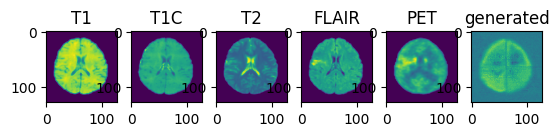

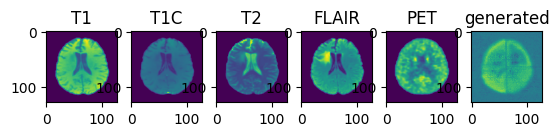

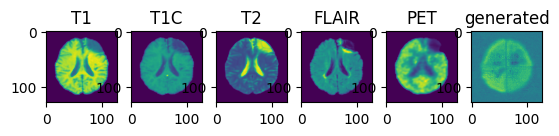

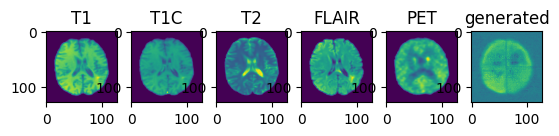

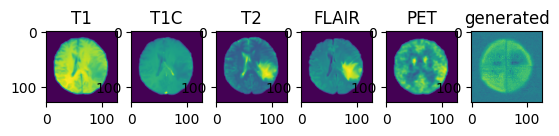

validation avg MS-SSIM: 0.4777 , train avg MS-SSIM: 0.4536
----------
epoch 241/400


Epoch :   0%|                                            | 0/24 [00:00<?, ?it/s]

Epoch :   4%|█▍                                 | 1/24 [01:46<40:37, 106.00s/it]

Epoch :   8%|███                                 | 2/24 [01:48<16:26, 44.86s/it]

Epoch :  12%|████▌                               | 3/24 [01:50<08:50, 25.29s/it]

Epoch :  17%|██████                              | 4/24 [01:51<05:21, 16.07s/it]

Epoch :  21%|███████▌                            | 5/24 [01:53<03:28, 10.97s/it]

Epoch :  25%|█████████                           | 6/24 [01:55<02:22,  7.89s/it]

Epoch :  29%|██████████▌                         | 7/24 [01:57<01:40,  5.94s/it]

Epoch :  33%|████████████                        | 8/24 [02:00<01:17,  4.82s/it]

Epoch :  38%|█████████████▌                      | 9/24 [02:02<00:59,  3.97s/it]

Epoch :  42%|██████████████▌                    | 10/24 [02:04<00:46,  3.35s/it]

Epoch :  46%|████████████████                   | 11/24 [02:06<00:37,  2.90s/it]

Epoch :  50%|█████████████████▌                 | 12/24 [02:08<00:31,  2.60s/it]

Epoch :  54%|██████████████████▉                | 13/24 [02:09<00:26,  2.41s/it]

Epoch :  58%|████████████████████▍              | 14/24 [02:11<00:22,  2.28s/it]

Epoch :  62%|█████████████████████▉             | 15/24 [02:13<00:19,  2.19s/it]

Epoch :  67%|███████████████████████▎           | 16/24 [02:16<00:17,  2.18s/it]

Epoch :  71%|████████████████████████▊          | 17/24 [02:18<00:14,  2.14s/it]

Epoch :  75%|██████████████████████████▎        | 18/24 [02:20<00:12,  2.13s/it]

Epoch :  79%|███████████████████████████▋       | 19/24 [02:22<00:10,  2.12s/it]

Epoch :  83%|█████████████████████████████▏     | 20/24 [02:24<00:08,  2.11s/it]

Epoch :  88%|██████████████████████████████▋    | 21/24 [02:26<00:06,  2.08s/it]

Epoch :  92%|████████████████████████████████   | 22/24 [02:28<00:04,  2.03s/it]

Epoch :  96%|█████████████████████████████████▌ | 23/24 [02:30<00:01,  1.99s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:31<00:00,  1.70s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:34<00:00,  6.45s/it]

----------
epoch 242/400


Epoch :   0%|                                            | 0/24 [00:00<?, ?it/s]

Epoch :   4%|█▍                                 | 1/24 [01:43<39:39, 103.44s/it]

Epoch :   8%|███                                 | 2/24 [01:45<16:03, 43.79s/it]

Epoch :  12%|████▌                               | 3/24 [01:47<08:38, 24.68s/it]

Epoch :  17%|██████                              | 4/24 [01:49<05:14, 15.70s/it]

Epoch :  21%|███████▌                            | 5/24 [01:51<03:23, 10.73s/it]

Epoch :  25%|█████████                           | 6/24 [01:53<02:19,  7.75s/it]

Epoch :  29%|██████████▌                         | 7/24 [01:55<01:40,  5.89s/it]

Epoch :  33%|████████████                        | 8/24 [01:57<01:14,  4.64s/it]

Epoch :  38%|█████████████▌                      | 9/24 [01:59<00:59,  3.95s/it]

Epoch :  42%|██████████████▌                    | 10/24 [02:01<00:46,  3.31s/it]

Epoch :  46%|████████████████                   | 11/24 [02:03<00:37,  2.88s/it]

Epoch :  50%|█████████████████▌                 | 12/24 [02:05<00:30,  2.57s/it]

Epoch :  54%|██████████████████▉                | 13/24 [02:07<00:26,  2.37s/it]

Epoch :  58%|████████████████████▍              | 14/24 [02:09<00:22,  2.23s/it]

Epoch :  62%|█████████████████████▉             | 15/24 [02:11<00:19,  2.13s/it]

Epoch :  67%|███████████████████████▎           | 16/24 [02:13<00:16,  2.08s/it]

Epoch :  71%|████████████████████████▊          | 17/24 [02:14<00:14,  2.03s/it]

Epoch :  75%|██████████████████████████▎        | 18/24 [02:17<00:12,  2.10s/it]

Epoch :  79%|███████████████████████████▋       | 19/24 [02:19<00:10,  2.06s/it]

Epoch :  83%|█████████████████████████████▏     | 20/24 [02:21<00:08,  2.05s/it]

Epoch :  88%|██████████████████████████████▋    | 21/24 [02:23<00:06,  2.01s/it]

Epoch :  92%|████████████████████████████████   | 22/24 [02:24<00:03,  1.96s/it]

Epoch :  96%|█████████████████████████████████▌ | 23/24 [02:26<00:01,  1.93s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:27<00:00,  1.65s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:30<00:00,  6.29s/it]

----------
epoch 243/400


Epoch :   0%|                                            | 0/24 [00:00<?, ?it/s]

Epoch :   4%|█▍                                 | 1/24 [01:48<41:35, 108.50s/it]

Epoch :   8%|███                                 | 2/24 [01:51<16:55, 46.18s/it]

Epoch :  12%|████▌                               | 3/24 [01:53<09:05, 26.00s/it]

Epoch :  17%|██████                              | 4/24 [01:55<05:31, 16.55s/it]

Epoch :  21%|███████▌                            | 5/24 [01:57<03:35, 11.33s/it]

Epoch :  25%|█████████                           | 6/24 [01:59<02:27,  8.18s/it]

Epoch :  29%|██████████▌                         | 7/24 [02:01<01:44,  6.14s/it]

Epoch :  33%|████████████                        | 8/24 [02:03<01:17,  4.82s/it]

Epoch :  38%|█████████████▌                      | 9/24 [02:05<00:59,  3.94s/it]

Epoch :  42%|██████████████▌                    | 10/24 [02:07<00:48,  3.49s/it]

Epoch :  46%|████████████████                   | 11/24 [02:09<00:39,  3.05s/it]

Epoch :  50%|█████████████████▌                 | 12/24 [02:11<00:32,  2.73s/it]

Epoch :  54%|██████████████████▉                | 13/24 [02:13<00:27,  2.49s/it]

Epoch :  58%|████████████████████▍              | 14/24 [02:15<00:23,  2.32s/it]

Epoch :  62%|█████████████████████▉             | 15/24 [02:17<00:19,  2.20s/it]

Epoch :  67%|███████████████████████▎           | 16/24 [02:19<00:16,  2.12s/it]

Epoch :  71%|████████████████████████▊          | 17/24 [02:21<00:14,  2.06s/it]

Epoch :  75%|██████████████████████████▎        | 18/24 [02:23<00:12,  2.13s/it]

Epoch :  79%|███████████████████████████▋       | 19/24 [02:25<00:10,  2.11s/it]

Epoch :  83%|█████████████████████████████▏     | 20/24 [02:27<00:08,  2.07s/it]

Epoch :  88%|██████████████████████████████▋    | 21/24 [02:29<00:06,  2.03s/it]

Epoch :  92%|████████████████████████████████   | 22/24 [02:31<00:04,  2.00s/it]

Epoch :  96%|█████████████████████████████████▌ | 23/24 [02:33<00:01,  1.98s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:34<00:00,  1.71s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:37<00:00,  6.58s/it]

----------
epoch 244/400


Epoch :   0%|                                            | 0/24 [00:00<?, ?it/s]

Epoch :   4%|█▍                                 | 1/24 [01:43<39:32, 103.15s/it]

Epoch :   8%|███                                 | 2/24 [01:44<15:58, 43.56s/it]

Epoch :  12%|████▌                               | 3/24 [01:47<08:40, 24.79s/it]

Epoch :  17%|██████                              | 4/24 [01:49<05:17, 15.85s/it]

Epoch :  21%|███████▌                            | 5/24 [01:52<03:29, 11.02s/it]

Epoch :  25%|█████████                           | 6/24 [01:54<02:24,  8.04s/it]

Epoch :  29%|██████████▌                         | 7/24 [01:56<01:43,  6.08s/it]

Epoch :  33%|████████████                        | 8/24 [01:58<01:16,  4.80s/it]

Epoch :  38%|█████████████▌                      | 9/24 [02:00<00:59,  3.94s/it]

Epoch :  42%|██████████████▌                    | 10/24 [02:02<00:46,  3.35s/it]

Epoch :  46%|████████████████                   | 11/24 [02:05<00:40,  3.12s/it]

Epoch :  50%|█████████████████▌                 | 12/24 [02:07<00:33,  2.79s/it]

Epoch :  54%|██████████████████▉                | 13/24 [02:09<00:28,  2.55s/it]

Epoch :  58%|████████████████████▍              | 14/24 [02:11<00:23,  2.36s/it]

Epoch :  62%|█████████████████████▉             | 15/24 [02:12<00:19,  2.22s/it]

Epoch :  67%|███████████████████████▎           | 16/24 [02:14<00:17,  2.14s/it]

Epoch :  71%|████████████████████████▊          | 17/24 [02:16<00:14,  2.10s/it]

Epoch :  75%|██████████████████████████▎        | 18/24 [02:18<00:12,  2.09s/it]

Epoch :  79%|███████████████████████████▋       | 19/24 [02:22<00:12,  2.41s/it]

Epoch :  83%|█████████████████████████████▏     | 20/24 [02:24<00:09,  2.31s/it]

Epoch :  88%|██████████████████████████████▋    | 21/24 [02:26<00:06,  2.25s/it]

Epoch :  92%|████████████████████████████████   | 22/24 [02:28<00:04,  2.18s/it]

Epoch :  96%|█████████████████████████████████▌ | 23/24 [02:30<00:02,  2.16s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:31<00:00,  1.85s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:35<00:00,  6.46s/it]

----------
epoch 245/400


Epoch :   0%|                                            | 0/24 [00:00<?, ?it/s]

Epoch :   4%|█▍                                 | 1/24 [01:43<39:30, 103.08s/it]

Epoch :   8%|███                                 | 2/24 [01:45<16:00, 43.65s/it]

Epoch :  12%|████▌                               | 3/24 [01:47<08:37, 24.64s/it]

Epoch :  17%|██████                              | 4/24 [01:49<05:17, 15.88s/it]

Epoch :  21%|███████▌                            | 5/24 [01:51<03:26, 10.86s/it]

Epoch :  25%|█████████                           | 6/24 [01:53<02:21,  7.86s/it]

Epoch :  29%|██████████▌                         | 7/24 [01:55<01:40,  5.94s/it]

Epoch :  33%|████████████                        | 8/24 [01:57<01:14,  4.68s/it]

Epoch :  38%|█████████████▌                      | 9/24 [01:59<00:57,  3.82s/it]

Epoch :  42%|██████████████▌                    | 10/24 [02:01<00:44,  3.21s/it]

Epoch :  46%|████████████████                   | 11/24 [02:03<00:36,  2.79s/it]

Epoch :  50%|█████████████████▌                 | 12/24 [02:05<00:31,  2.61s/it]

Epoch :  54%|██████████████████▉                | 13/24 [02:07<00:26,  2.39s/it]

Epoch :  58%|████████████████████▍              | 14/24 [02:09<00:22,  2.24s/it]

Epoch :  62%|█████████████████████▉             | 15/24 [02:11<00:19,  2.16s/it]

Epoch :  67%|███████████████████████▎           | 16/24 [02:13<00:16,  2.10s/it]

Epoch :  71%|████████████████████████▊          | 17/24 [02:15<00:14,  2.09s/it]

Epoch :  75%|██████████████████████████▎        | 18/24 [02:17<00:12,  2.06s/it]

Epoch :  79%|███████████████████████████▋       | 19/24 [02:19<00:10,  2.05s/it]

Epoch :  83%|█████████████████████████████▏     | 20/24 [02:21<00:08,  2.06s/it]

Epoch :  88%|██████████████████████████████▋    | 21/24 [02:23<00:06,  2.20s/it]

Epoch :  92%|████████████████████████████████   | 22/24 [02:25<00:04,  2.14s/it]

Epoch :  96%|█████████████████████████████████▌ | 23/24 [02:27<00:02,  2.09s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:28<00:00,  1.79s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:32<00:00,  6.36s/it]

----------
epoch 246/400


Epoch :   0%|                                            | 0/24 [00:00<?, ?it/s]

Epoch :   4%|█▍                                 | 1/24 [01:45<40:16, 105.05s/it]

Epoch :   8%|███                                 | 2/24 [01:47<16:17, 44.42s/it]

Epoch :  12%|████▌                               | 3/24 [01:49<08:46, 25.08s/it]

Epoch :  17%|██████                              | 4/24 [01:51<05:19, 15.99s/it]

Epoch :  21%|███████▌                            | 5/24 [01:53<03:33, 11.23s/it]

Epoch :  25%|█████████                           | 6/24 [01:55<02:25,  8.09s/it]

Epoch :  29%|██████████▌                         | 7/24 [01:57<01:43,  6.10s/it]

Epoch :  33%|████████████                        | 8/24 [01:59<01:16,  4.79s/it]

Epoch :  38%|█████████████▌                      | 9/24 [02:01<00:58,  3.90s/it]

Epoch :  42%|██████████████▌                    | 10/24 [02:03<00:46,  3.32s/it]

Epoch :  46%|████████████████                   | 11/24 [02:05<00:37,  2.91s/it]

Epoch :  50%|█████████████████▌                 | 12/24 [02:07<00:31,  2.65s/it]

Epoch :  54%|██████████████████▉                | 13/24 [02:09<00:27,  2.46s/it]

Epoch :  58%|████████████████████▍              | 14/24 [02:12<00:24,  2.44s/it]

Epoch :  62%|█████████████████████▉             | 15/24 [02:14<00:20,  2.29s/it]

Epoch :  67%|███████████████████████▎           | 16/24 [02:16<00:17,  2.18s/it]

Epoch :  71%|████████████████████████▊          | 17/24 [02:18<00:14,  2.09s/it]

Epoch :  75%|██████████████████████████▎        | 18/24 [02:19<00:12,  2.03s/it]

Epoch :  79%|███████████████████████████▋       | 19/24 [02:22<00:10,  2.03s/it]

Epoch :  83%|█████████████████████████████▏     | 20/24 [02:23<00:08,  2.01s/it]

Epoch :  88%|██████████████████████████████▋    | 21/24 [02:25<00:05,  1.98s/it]

Epoch :  92%|████████████████████████████████   | 22/24 [02:28<00:04,  2.09s/it]

Epoch :  96%|█████████████████████████████████▌ | 23/24 [02:30<00:02,  2.05s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:31<00:00,  1.77s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:34<00:00,  6.43s/it]

----------
epoch 247/400


Epoch :   0%|                                            | 0/24 [00:00<?, ?it/s]

Epoch :   4%|█▍                                 | 1/24 [01:41<38:54, 101.49s/it]

Epoch :   8%|███                                 | 2/24 [01:43<15:48, 43.11s/it]

Epoch :  12%|████▌                               | 3/24 [01:45<08:32, 24.43s/it]

Epoch :  17%|██████                              | 4/24 [01:48<05:12, 15.64s/it]

Epoch :  21%|███████▌                            | 5/24 [01:50<03:25, 10.81s/it]

Epoch :  25%|█████████                           | 6/24 [01:53<02:25,  8.11s/it]

Epoch :  29%|██████████▌                         | 7/24 [01:55<01:44,  6.15s/it]

Epoch :  33%|████████████                        | 8/24 [01:57<01:17,  4.87s/it]

Epoch :  38%|█████████████▌                      | 9/24 [01:59<00:59,  4.00s/it]

Epoch :  42%|██████████████▌                    | 10/24 [02:01<00:47,  3.41s/it]

Epoch :  46%|████████████████                   | 11/24 [02:03<00:39,  3.03s/it]

Epoch :  50%|█████████████████▌                 | 12/24 [02:05<00:32,  2.74s/it]

Epoch :  54%|██████████████████▉                | 13/24 [02:07<00:27,  2.50s/it]

Epoch :  58%|████████████████████▍              | 14/24 [02:09<00:23,  2.37s/it]

Epoch :  62%|█████████████████████▉             | 15/24 [02:12<00:22,  2.55s/it]

Epoch :  67%|███████████████████████▎           | 16/24 [02:14<00:18,  2.36s/it]

Epoch :  71%|████████████████████████▊          | 17/24 [02:16<00:15,  2.27s/it]

Epoch :  75%|██████████████████████████▎        | 18/24 [02:18<00:13,  2.20s/it]

Epoch :  79%|███████████████████████████▋       | 19/24 [02:20<00:10,  2.14s/it]

Epoch :  83%|█████████████████████████████▏     | 20/24 [02:22<00:08,  2.12s/it]

Epoch :  88%|██████████████████████████████▋    | 21/24 [02:25<00:06,  2.11s/it]

Epoch :  92%|████████████████████████████████   | 22/24 [02:26<00:04,  2.05s/it]

Epoch :  96%|█████████████████████████████████▌ | 23/24 [02:29<00:02,  2.19s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:30<00:00,  1.87s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:34<00:00,  6.43s/it]

----------
epoch 248/400


Epoch :   0%|                                            | 0/24 [00:00<?, ?it/s]

Epoch :   4%|█▍                                 | 1/24 [01:44<40:14, 104.99s/it]

Epoch :   8%|███                                 | 2/24 [01:47<16:17, 44.42s/it]

Epoch :  12%|████▌                               | 3/24 [01:49<08:47, 25.10s/it]

Epoch :  17%|██████                              | 4/24 [01:51<05:19, 15.99s/it]

Epoch :  21%|███████▌                            | 5/24 [01:53<03:27, 10.92s/it]

Epoch :  25%|█████████                           | 6/24 [01:55<02:22,  7.89s/it]

Epoch :  29%|██████████▌                         | 7/24 [01:57<01:41,  5.95s/it]

Epoch :  33%|████████████                        | 8/24 [01:59<01:17,  4.83s/it]

Epoch :  38%|█████████████▌                      | 9/24 [02:01<00:59,  3.94s/it]

Epoch :  42%|██████████████▌                    | 10/24 [02:03<00:47,  3.39s/it]

Epoch :  46%|████████████████                   | 11/24 [02:05<00:38,  2.92s/it]

Epoch :  50%|█████████████████▌                 | 12/24 [02:07<00:31,  2.61s/it]

Epoch :  54%|██████████████████▉                | 13/24 [02:09<00:26,  2.38s/it]

Epoch :  58%|████████████████████▍              | 14/24 [02:11<00:22,  2.30s/it]

Epoch :  62%|█████████████████████▉             | 15/24 [02:13<00:21,  2.37s/it]

Epoch :  67%|███████████████████████▎           | 16/24 [02:15<00:17,  2.23s/it]

Epoch :  71%|████████████████████████▊          | 17/24 [02:17<00:14,  2.13s/it]

Epoch :  75%|██████████████████████████▎        | 18/24 [02:19<00:12,  2.07s/it]

Epoch :  79%|███████████████████████████▋       | 19/24 [02:21<00:10,  2.04s/it]

Epoch :  83%|█████████████████████████████▏     | 20/24 [02:23<00:08,  2.02s/it]

Epoch :  88%|██████████████████████████████▋    | 21/24 [02:25<00:05,  1.96s/it]

Epoch :  92%|████████████████████████████████   | 22/24 [02:27<00:03,  1.94s/it]

Epoch :  96%|█████████████████████████████████▌ | 23/24 [02:29<00:01,  1.94s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:30<00:00,  1.78s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:34<00:00,  6.43s/it]

----------
epoch 249/400


Epoch :   0%|                                            | 0/24 [00:00<?, ?it/s]

Epoch :   4%|█▌                                  | 1/24 [01:39<38:18, 99.93s/it]

Epoch :   8%|███                                 | 2/24 [01:42<15:34, 42.47s/it]

Epoch :  12%|████▌                               | 3/24 [01:44<08:24, 24.01s/it]

Epoch :  17%|██████                              | 4/24 [01:46<05:06, 15.30s/it]

Epoch :  21%|███████▌                            | 5/24 [01:48<03:19, 10.51s/it]

Epoch :  25%|█████████                           | 6/24 [01:50<02:17,  7.63s/it]

Epoch :  29%|██████████▌                         | 7/24 [01:52<01:38,  5.80s/it]

Epoch :  33%|████████████                        | 8/24 [01:54<01:15,  4.74s/it]

Epoch :  38%|█████████████▌                      | 9/24 [01:56<00:58,  3.91s/it]

Epoch :  42%|██████████████▌                    | 10/24 [01:58<00:46,  3.30s/it]

Epoch :  46%|████████████████                   | 11/24 [02:00<00:37,  2.85s/it]

Epoch :  50%|█████████████████▌                 | 12/24 [02:02<00:30,  2.55s/it]

Epoch :  54%|██████████████████▉                | 13/24 [02:04<00:26,  2.38s/it]

Epoch :  58%|████████████████████▍              | 14/24 [02:06<00:22,  2.26s/it]

Epoch :  62%|█████████████████████▉             | 15/24 [02:08<00:19,  2.13s/it]

Epoch :  67%|███████████████████████▎           | 16/24 [02:10<00:17,  2.15s/it]

Epoch :  71%|████████████████████████▊          | 17/24 [02:12<00:14,  2.11s/it]

Epoch :  75%|██████████████████████████▎        | 18/24 [02:14<00:12,  2.07s/it]

Epoch :  79%|███████████████████████████▋       | 19/24 [02:16<00:09,  2.00s/it]

Epoch :  83%|█████████████████████████████▏     | 20/24 [02:18<00:07,  1.96s/it]

Epoch :  88%|██████████████████████████████▋    | 21/24 [02:20<00:05,  1.98s/it]

Epoch :  92%|████████████████████████████████   | 22/24 [02:22<00:04,  2.02s/it]

Epoch :  96%|█████████████████████████████████▌ | 23/24 [02:24<00:02,  2.03s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:25<00:00,  1.72s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:28<00:00,  6.20s/it]

----------
epoch 250/400


Epoch :   0%|                                            | 0/24 [00:00<?, ?it/s]

Epoch :   4%|█▍                                 | 1/24 [01:42<39:11, 102.24s/it]

Epoch :   8%|███                                 | 2/24 [01:44<15:54, 43.38s/it]

Epoch :  12%|████▌                               | 3/24 [01:46<08:34, 24.50s/it]

Epoch :  17%|██████                              | 4/24 [01:48<05:12, 15.65s/it]

Epoch :  21%|███████▌                            | 5/24 [01:50<03:24, 10.74s/it]

Epoch :  25%|█████████                           | 6/24 [01:52<02:19,  7.77s/it]

Epoch :  29%|██████████▌                         | 7/24 [01:54<01:40,  5.89s/it]

Epoch :  33%|████████████                        | 8/24 [01:56<01:14,  4.66s/it]

Epoch :  38%|█████████████▌                      | 9/24 [01:59<00:59,  3.95s/it]

Epoch :  42%|██████████████▌                    | 10/24 [02:00<00:46,  3.33s/it]

Epoch :  46%|████████████████                   | 11/24 [02:02<00:38,  2.92s/it]

Epoch :  50%|█████████████████▌                 | 12/24 [02:05<00:32,  2.70s/it]

Epoch :  54%|██████████████████▉                | 13/24 [02:07<00:27,  2.48s/it]

Epoch :  58%|████████████████████▍              | 14/24 [02:09<00:23,  2.34s/it]

Epoch :  62%|█████████████████████▉             | 15/24 [02:10<00:19,  2.19s/it]

Epoch :  67%|███████████████████████▎           | 16/24 [02:12<00:16,  2.10s/it]

Epoch :  71%|████████████████████████▊          | 17/24 [02:14<00:14,  2.04s/it]

Epoch :  75%|██████████████████████████▎        | 18/24 [02:17<00:12,  2.13s/it]

Epoch :  79%|███████████████████████████▋       | 19/24 [02:19<00:10,  2.10s/it]

Epoch :  83%|█████████████████████████████▏     | 20/24 [02:21<00:08,  2.11s/it]

Epoch :  88%|██████████████████████████████▋    | 21/24 [02:23<00:06,  2.08s/it]

Epoch :  92%|████████████████████████████████   | 22/24 [02:25<00:04,  2.14s/it]

Epoch :  96%|█████████████████████████████████▌ | 23/24 [02:27<00:02,  2.12s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:28<00:00,  1.80s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:32<00:00,  6.36s/it]

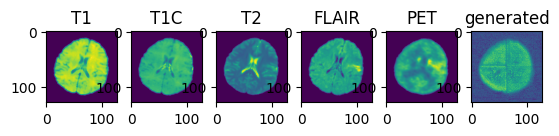

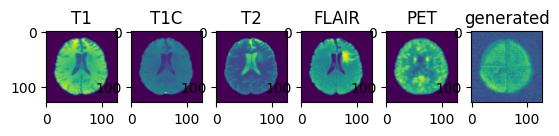

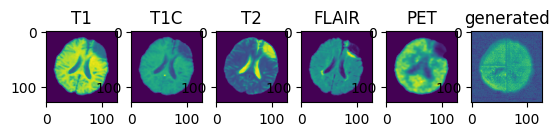

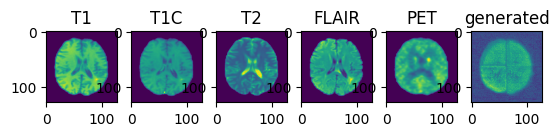

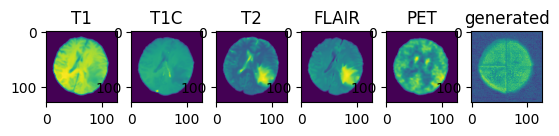

validation avg MS-SSIM: 0.4704 , train avg MS-SSIM: 0.4437
----------
epoch 251/400


Epoch :   0%|                                            | 0/24 [00:00<?, ?it/s]

Epoch :   4%|█▍                                 | 1/24 [01:42<39:07, 102.08s/it]

Epoch :   8%|███                                 | 2/24 [01:44<15:50, 43.20s/it]

Epoch :  12%|████▌                               | 3/24 [01:45<08:31, 24.33s/it]

Epoch :  17%|██████                              | 4/24 [01:47<05:09, 15.48s/it]

Epoch :  21%|███████▌                            | 5/24 [01:50<03:23, 10.73s/it]

Epoch :  25%|█████████                           | 6/24 [01:52<02:20,  7.78s/it]

Epoch :  29%|██████████▌                         | 7/24 [01:54<01:42,  6.04s/it]

Epoch :  33%|████████████                        | 8/24 [01:56<01:15,  4.73s/it]

Epoch :  38%|█████████████▌                      | 9/24 [01:58<00:58,  3.90s/it]

Epoch :  42%|██████████████▌                    | 10/24 [02:00<00:46,  3.30s/it]

Epoch :  46%|████████████████                   | 11/24 [02:02<00:37,  2.88s/it]

Epoch :  50%|█████████████████▌                 | 12/24 [02:04<00:30,  2.57s/it]

Epoch :  54%|██████████████████▉                | 13/24 [02:06<00:25,  2.36s/it]

Epoch :  58%|████████████████████▍              | 14/24 [02:08<00:22,  2.24s/it]

Epoch :  62%|█████████████████████▉             | 15/24 [02:10<00:19,  2.13s/it]

Epoch :  67%|███████████████████████▎           | 16/24 [02:12<00:17,  2.15s/it]

Epoch :  71%|████████████████████████▊          | 17/24 [02:14<00:14,  2.09s/it]

Epoch :  75%|██████████████████████████▎        | 18/24 [02:16<00:12,  2.06s/it]

Epoch :  79%|███████████████████████████▋       | 19/24 [02:18<00:09,  1.99s/it]

Epoch :  83%|█████████████████████████████▏     | 20/24 [02:19<00:07,  1.95s/it]

Epoch :  88%|██████████████████████████████▋    | 21/24 [02:21<00:05,  1.98s/it]

Epoch :  92%|████████████████████████████████   | 22/24 [02:23<00:03,  1.98s/it]

Epoch :  96%|█████████████████████████████████▌ | 23/24 [02:25<00:01,  1.95s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:26<00:00,  1.66s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:30<00:00,  6.25s/it]

----------
epoch 252/400


Epoch :   0%|                                            | 0/24 [00:00<?, ?it/s]

Epoch :   4%|█▍                                 | 1/24 [01:44<39:54, 104.09s/it]

Epoch :   8%|███                                 | 2/24 [01:46<16:12, 44.19s/it]

Epoch :  12%|████▌                               | 3/24 [01:48<08:43, 24.94s/it]

Epoch :  17%|██████                              | 4/24 [01:50<05:18, 15.93s/it]

Epoch :  21%|███████▌                            | 5/24 [01:52<03:27, 10.94s/it]

Epoch :  25%|█████████                           | 6/24 [01:54<02:21,  7.88s/it]

Epoch :  29%|██████████▌                         | 7/24 [01:56<01:41,  5.94s/it]

Epoch :  33%|████████████                        | 8/24 [01:58<01:15,  4.74s/it]

Epoch :  38%|█████████████▌                      | 9/24 [02:00<00:58,  3.87s/it]

Epoch :  42%|██████████████▌                    | 10/24 [02:02<00:45,  3.25s/it]

Epoch :  46%|████████████████                   | 11/24 [02:04<00:36,  2.81s/it]

Epoch :  50%|█████████████████▌                 | 12/24 [02:06<00:30,  2.55s/it]

Epoch :  54%|██████████████████▉                | 13/24 [02:08<00:27,  2.46s/it]

Epoch :  58%|████████████████████▍              | 14/24 [02:10<00:22,  2.27s/it]

Epoch :  62%|█████████████████████▉             | 15/24 [02:12<00:19,  2.14s/it]

Epoch :  67%|███████████████████████▎           | 16/24 [02:14<00:16,  2.05s/it]

Epoch :  71%|████████████████████████▊          | 17/24 [02:16<00:14,  2.09s/it]

Epoch :  75%|██████████████████████████▎        | 18/24 [02:18<00:12,  2.06s/it]

Epoch :  79%|███████████████████████████▋       | 19/24 [02:20<00:10,  2.05s/it]

Epoch :  83%|█████████████████████████████▏     | 20/24 [02:22<00:08,  2.06s/it]

Epoch :  88%|██████████████████████████████▋    | 21/24 [02:24<00:06,  2.07s/it]

Epoch :  92%|████████████████████████████████   | 22/24 [02:26<00:04,  2.07s/it]

Epoch :  96%|█████████████████████████████████▌ | 23/24 [02:28<00:02,  2.07s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:29<00:00,  1.75s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:32<00:00,  6.37s/it]

----------
epoch 253/400


Epoch :   0%|                                            | 0/24 [00:00<?, ?it/s]

Epoch :   4%|█▌                                  | 1/24 [01:38<37:46, 98.55s/it]

Epoch :   8%|███                                 | 2/24 [01:40<15:23, 41.97s/it]

Epoch :  12%|████▌                               | 3/24 [01:42<08:16, 23.66s/it]

Epoch :  17%|██████                              | 4/24 [01:44<05:02, 15.10s/it]

Epoch :  21%|███████▌                            | 5/24 [01:46<03:18, 10.46s/it]

Epoch :  25%|█████████                           | 6/24 [01:48<02:16,  7.56s/it]

Epoch :  29%|██████████▌                         | 7/24 [01:50<01:37,  5.75s/it]

Epoch :  33%|████████████                        | 8/24 [01:52<01:12,  4.54s/it]

Epoch :  38%|█████████████▌                      | 9/24 [01:54<00:56,  3.75s/it]

Epoch :  42%|██████████████▌                    | 10/24 [01:57<00:46,  3.34s/it]

Epoch :  46%|████████████████                   | 11/24 [01:59<00:38,  2.95s/it]

Epoch :  50%|█████████████████▌                 | 12/24 [02:01<00:31,  2.65s/it]

Epoch :  54%|██████████████████▉                | 13/24 [02:03<00:26,  2.42s/it]

Epoch :  58%|████████████████████▍              | 14/24 [02:05<00:22,  2.25s/it]

Epoch :  62%|█████████████████████▉             | 15/24 [02:07<00:19,  2.14s/it]

Epoch :  67%|███████████████████████▎           | 16/24 [02:08<00:16,  2.09s/it]

Epoch :  71%|████████████████████████▊          | 17/24 [02:10<00:14,  2.07s/it]

Epoch :  75%|██████████████████████████▎        | 18/24 [02:13<00:12,  2.11s/it]

Epoch :  79%|███████████████████████████▋       | 19/24 [02:15<00:10,  2.04s/it]

Epoch :  83%|█████████████████████████████▏     | 20/24 [02:17<00:08,  2.02s/it]

Epoch :  88%|██████████████████████████████▋    | 21/24 [02:18<00:05,  1.99s/it]

Epoch :  92%|████████████████████████████████   | 22/24 [02:20<00:03,  1.96s/it]

Epoch :  96%|█████████████████████████████████▌ | 23/24 [02:22<00:01,  1.95s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:23<00:00,  1.67s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:27<00:00,  6.13s/it]

----------
epoch 254/400


Epoch :   0%|                                            | 0/24 [00:00<?, ?it/s]

Epoch :   4%|█▍                                 | 1/24 [01:47<41:05, 107.21s/it]

Epoch :   8%|███                                 | 2/24 [01:49<16:38, 45.40s/it]

Epoch :  12%|████▌                               | 3/24 [01:51<09:03, 25.87s/it]

Epoch :  17%|██████                              | 4/24 [01:54<05:29, 16.47s/it]

Epoch :  21%|███████▌                            | 5/24 [01:56<03:34, 11.27s/it]

Epoch :  25%|█████████                           | 6/24 [01:58<02:25,  8.11s/it]

Epoch :  29%|██████████▌                         | 7/24 [02:00<01:44,  6.15s/it]

Epoch :  33%|████████████                        | 8/24 [02:02<01:17,  4.84s/it]

Epoch :  38%|█████████████▌                      | 9/24 [02:04<00:58,  3.92s/it]

Epoch :  42%|██████████████▌                    | 10/24 [02:06<00:46,  3.30s/it]

Epoch :  46%|████████████████                   | 11/24 [02:08<00:38,  2.98s/it]

Epoch :  50%|█████████████████▌                 | 12/24 [02:10<00:31,  2.65s/it]

Epoch :  54%|██████████████████▉                | 13/24 [02:12<00:26,  2.44s/it]

Epoch :  58%|████████████████████▍              | 14/24 [02:14<00:22,  2.30s/it]

Epoch :  62%|█████████████████████▉             | 15/24 [02:15<00:19,  2.17s/it]

Epoch :  67%|███████████████████████▎           | 16/24 [02:17<00:16,  2.09s/it]

Epoch :  71%|████████████████████████▊          | 17/24 [02:19<00:14,  2.05s/it]

Epoch :  75%|██████████████████████████▎        | 18/24 [02:21<00:12,  2.01s/it]

Epoch :  79%|███████████████████████████▋       | 19/24 [02:23<00:10,  2.08s/it]

Epoch :  83%|█████████████████████████████▏     | 20/24 [02:25<00:08,  2.02s/it]

Epoch :  88%|██████████████████████████████▋    | 21/24 [02:27<00:05,  1.98s/it]

Epoch :  92%|████████████████████████████████   | 22/24 [02:29<00:03,  1.94s/it]

Epoch :  96%|█████████████████████████████████▌ | 23/24 [02:31<00:01,  1.92s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:32<00:00,  1.64s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:35<00:00,  6.49s/it]

----------
epoch 255/400


Epoch :   0%|                                            | 0/24 [00:00<?, ?it/s]

Epoch :   4%|█▍                                 | 1/24 [01:40<38:40, 100.89s/it]

Epoch :   8%|███                                 | 2/24 [01:42<15:39, 42.70s/it]

Epoch :  12%|████▌                               | 3/24 [01:44<08:27, 24.16s/it]

Epoch :  17%|██████                              | 4/24 [01:47<05:12, 15.62s/it]

Epoch :  21%|███████▌                            | 5/24 [01:49<03:22, 10.68s/it]

Epoch :  25%|█████████                           | 6/24 [01:51<02:18,  7.70s/it]

Epoch :  29%|██████████▌                         | 7/24 [01:53<01:38,  5.82s/it]

Epoch :  33%|████████████                        | 8/24 [01:55<01:13,  4.58s/it]

Epoch :  38%|█████████████▌                      | 9/24 [01:57<00:57,  3.80s/it]

Epoch :  42%|██████████████▌                    | 10/24 [01:59<00:44,  3.21s/it]

Epoch :  46%|████████████████                   | 11/24 [02:01<00:36,  2.79s/it]

Epoch :  50%|█████████████████▌                 | 12/24 [02:03<00:31,  2.62s/it]

Epoch :  54%|██████████████████▉                | 13/24 [02:05<00:26,  2.43s/it]

Epoch :  58%|████████████████████▍              | 14/24 [02:07<00:22,  2.29s/it]

Epoch :  62%|█████████████████████▉             | 15/24 [02:09<00:19,  2.21s/it]

Epoch :  67%|███████████████████████▎           | 16/24 [02:11<00:17,  2.17s/it]

Epoch :  71%|████████████████████████▊          | 17/24 [02:13<00:15,  2.16s/it]

Epoch :  75%|██████████████████████████▎        | 18/24 [02:15<00:12,  2.10s/it]

Epoch :  79%|███████████████████████████▋       | 19/24 [02:17<00:10,  2.05s/it]

Epoch :  83%|█████████████████████████████▏     | 20/24 [02:19<00:07,  1.99s/it]

Epoch :  88%|██████████████████████████████▋    | 21/24 [02:21<00:06,  2.09s/it]

Epoch :  92%|████████████████████████████████   | 22/24 [02:23<00:04,  2.07s/it]

Epoch :  96%|█████████████████████████████████▌ | 23/24 [02:25<00:02,  2.04s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:26<00:00,  1.74s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:30<00:00,  6.25s/it]

----------
epoch 256/400


Epoch :   0%|                                            | 0/24 [00:00<?, ?it/s]

Epoch :   4%|█▍                                 | 1/24 [01:41<38:55, 101.53s/it]

Epoch :   8%|███                                 | 2/24 [01:43<15:47, 43.07s/it]

Epoch :  12%|████▌                               | 3/24 [01:45<08:30, 24.33s/it]

Epoch :  17%|██████                              | 4/24 [01:47<05:10, 15.53s/it]

Epoch :  21%|███████▌                            | 5/24 [01:50<03:24, 10.78s/it]

Epoch :  25%|█████████                           | 6/24 [01:52<02:19,  7.77s/it]

Epoch :  29%|██████████▌                         | 7/24 [01:54<01:40,  5.91s/it]

Epoch :  33%|████████████                        | 8/24 [01:56<01:14,  4.68s/it]

Epoch :  38%|█████████████▌                      | 9/24 [01:58<00:57,  3.82s/it]

Epoch :  42%|██████████████▌                    | 10/24 [01:59<00:45,  3.22s/it]

Epoch :  46%|████████████████                   | 11/24 [02:01<00:36,  2.81s/it]

Epoch :  50%|█████████████████▌                 | 12/24 [02:03<00:30,  2.53s/it]

Epoch :  54%|██████████████████▉                | 13/24 [02:05<00:26,  2.37s/it]

Epoch :  58%|████████████████████▍              | 14/24 [02:08<00:24,  2.46s/it]

Epoch :  62%|█████████████████████▉             | 15/24 [02:10<00:20,  2.30s/it]

Epoch :  67%|███████████████████████▎           | 16/24 [02:12<00:17,  2.19s/it]

Epoch :  71%|████████████████████████▊          | 17/24 [02:14<00:14,  2.11s/it]

Epoch :  75%|██████████████████████████▎        | 18/24 [02:16<00:12,  2.05s/it]

Epoch :  79%|███████████████████████████▋       | 19/24 [02:18<00:10,  2.04s/it]

Epoch :  83%|█████████████████████████████▏     | 20/24 [02:20<00:08,  2.02s/it]

Epoch :  88%|██████████████████████████████▋    | 21/24 [02:22<00:05,  1.99s/it]

Epoch :  92%|████████████████████████████████   | 22/24 [02:24<00:04,  2.09s/it]

Epoch :  96%|█████████████████████████████████▌ | 23/24 [02:26<00:02,  2.03s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:27<00:00,  1.72s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:30<00:00,  6.28s/it]

----------
epoch 257/400


Epoch :   0%|                                            | 0/24 [00:00<?, ?it/s]

Epoch :   4%|█▍                                 | 1/24 [01:43<39:38, 103.43s/it]

Epoch :   8%|███                                 | 2/24 [01:45<16:02, 43.75s/it]

Epoch :  12%|████▌                               | 3/24 [01:47<08:39, 24.72s/it]

Epoch :  17%|██████                              | 4/24 [01:49<05:16, 15.81s/it]

Epoch :  21%|███████▌                            | 5/24 [01:51<03:27, 10.91s/it]

Epoch :  25%|█████████                           | 6/24 [01:53<02:21,  7.88s/it]

Epoch :  29%|██████████▌                         | 7/24 [01:56<01:44,  6.12s/it]

Epoch :  33%|████████████                        | 8/24 [01:58<01:17,  4.81s/it]

Epoch :  38%|█████████████▌                      | 9/24 [02:00<00:59,  3.97s/it]

Epoch :  42%|██████████████▌                    | 10/24 [02:02<00:46,  3.35s/it]

Epoch :  46%|████████████████                   | 11/24 [02:04<00:37,  2.92s/it]

Epoch :  50%|█████████████████▌                 | 12/24 [02:06<00:31,  2.62s/it]

Epoch :  54%|██████████████████▉                | 13/24 [02:08<00:26,  2.40s/it]

Epoch :  58%|████████████████████▍              | 14/24 [02:10<00:23,  2.30s/it]

Epoch :  62%|█████████████████████▉             | 15/24 [02:12<00:21,  2.34s/it]

Epoch :  67%|███████████████████████▎           | 16/24 [02:14<00:18,  2.26s/it]

Epoch :  71%|████████████████████████▊          | 17/24 [02:16<00:15,  2.19s/it]

Epoch :  75%|██████████████████████████▎        | 18/24 [02:18<00:12,  2.12s/it]

Epoch :  79%|███████████████████████████▋       | 19/24 [02:20<00:10,  2.08s/it]

Epoch :  83%|█████████████████████████████▏     | 20/24 [02:22<00:08,  2.04s/it]

Epoch :  88%|██████████████████████████████▋    | 21/24 [02:24<00:05,  1.99s/it]

Epoch :  92%|████████████████████████████████   | 22/24 [02:26<00:03,  1.97s/it]

Epoch :  96%|█████████████████████████████████▌ | 23/24 [02:28<00:01,  1.95s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:29<00:00,  1.78s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:33<00:00,  6.39s/it]

----------
epoch 258/400


Epoch :   0%|                                            | 0/24 [00:00<?, ?it/s]

Epoch :   4%|█▍                                 | 1/24 [01:41<38:51, 101.35s/it]

Epoch :   8%|███                                 | 2/24 [01:43<15:45, 43.00s/it]

Epoch :  12%|████▌                               | 3/24 [01:45<08:30, 24.33s/it]

Epoch :  17%|██████                              | 4/24 [01:47<05:10, 15.53s/it]

Epoch :  21%|███████▌                            | 5/24 [01:49<03:22, 10.68s/it]

Epoch :  25%|█████████                           | 6/24 [01:51<02:19,  7.72s/it]

Epoch :  29%|██████████▌                         | 7/24 [01:53<01:38,  5.81s/it]

Epoch :  33%|████████████                        | 8/24 [01:56<01:15,  4.75s/it]

Epoch :  38%|█████████████▌                      | 9/24 [01:58<00:58,  3.87s/it]

Epoch :  42%|██████████████▌                    | 10/24 [01:59<00:45,  3.27s/it]

Epoch :  46%|████████████████                   | 11/24 [02:01<00:37,  2.85s/it]

Epoch :  50%|█████████████████▌                 | 12/24 [02:03<00:30,  2.57s/it]

Epoch :  54%|██████████████████▉                | 13/24 [02:05<00:26,  2.39s/it]

Epoch :  58%|████████████████████▍              | 14/24 [02:07<00:22,  2.24s/it]

Epoch :  62%|█████████████████████▉             | 15/24 [02:09<00:19,  2.13s/it]

Epoch :  67%|███████████████████████▎           | 16/24 [02:11<00:17,  2.17s/it]

Epoch :  71%|████████████████████████▊          | 17/24 [02:13<00:14,  2.08s/it]

Epoch :  75%|██████████████████████████▎        | 18/24 [02:15<00:12,  2.02s/it]

Epoch :  79%|███████████████████████████▋       | 19/24 [02:17<00:09,  1.98s/it]

Epoch :  83%|█████████████████████████████▏     | 20/24 [02:19<00:07,  1.99s/it]

Epoch :  88%|██████████████████████████████▋    | 21/24 [02:21<00:05,  2.00s/it]

Epoch :  92%|████████████████████████████████   | 22/24 [02:23<00:03,  1.98s/it]

Epoch :  96%|█████████████████████████████████▌ | 23/24 [02:25<00:01,  1.96s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:26<00:00,  1.68s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:29<00:00,  6.24s/it]

----------
epoch 259/400


Epoch :   0%|                                            | 0/24 [00:00<?, ?it/s]

Epoch :   4%|█▌                                  | 1/24 [01:39<38:19, 99.99s/it]

Epoch :   8%|███                                 | 2/24 [01:42<15:33, 42.42s/it]

Epoch :  12%|████▌                               | 3/24 [01:44<08:22, 23.94s/it]

Epoch :  17%|██████                              | 4/24 [01:46<05:05, 15.27s/it]

Epoch :  21%|███████▌                            | 5/24 [01:47<03:18, 10.44s/it]

Epoch :  25%|█████████                           | 6/24 [01:49<02:15,  7.53s/it]

Epoch :  29%|██████████▌                         | 7/24 [01:51<01:37,  5.72s/it]

Epoch :  33%|████████████                        | 8/24 [01:53<01:12,  4.52s/it]

Epoch :  38%|█████████████▌                      | 9/24 [01:55<00:57,  3.81s/it]

Epoch :  42%|██████████████▌                    | 10/24 [01:57<00:44,  3.21s/it]

Epoch :  46%|████████████████                   | 11/24 [01:59<00:36,  2.79s/it]

Epoch :  50%|█████████████████▌                 | 12/24 [02:01<00:29,  2.50s/it]

Epoch :  54%|██████████████████▉                | 13/24 [02:03<00:25,  2.31s/it]

Epoch :  58%|████████████████████▍              | 14/24 [02:05<00:21,  2.17s/it]

Epoch :  62%|█████████████████████▉             | 15/24 [02:07<00:18,  2.07s/it]

Epoch :  67%|███████████████████████▎           | 16/24 [02:08<00:16,  2.01s/it]

Epoch :  71%|████████████████████████▊          | 17/24 [02:11<00:14,  2.12s/it]

Epoch :  75%|██████████████████████████▎        | 18/24 [02:13<00:12,  2.07s/it]

Epoch :  79%|███████████████████████████▋       | 19/24 [02:15<00:10,  2.05s/it]

Epoch :  83%|█████████████████████████████▏     | 20/24 [02:17<00:08,  2.03s/it]

Epoch :  88%|██████████████████████████████▋    | 21/24 [02:19<00:06,  2.03s/it]

Epoch :  92%|████████████████████████████████   | 22/24 [02:21<00:03,  2.00s/it]

Epoch :  96%|█████████████████████████████████▌ | 23/24 [02:23<00:02,  2.00s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:24<00:00,  1.70s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:27<00:00,  6.16s/it]

----------
epoch 260/400


Epoch :   0%|                                            | 0/24 [00:00<?, ?it/s]

Epoch :   4%|█▌                                  | 1/24 [01:39<37:58, 99.08s/it]

Epoch :   8%|███                                 | 2/24 [01:41<15:30, 42.31s/it]

Epoch :  12%|████▌                               | 3/24 [01:43<08:22, 23.91s/it]

Epoch :  17%|██████                              | 4/24 [01:45<05:04, 15.24s/it]

Epoch :  21%|███████▌                            | 5/24 [01:47<03:18, 10.44s/it]

Epoch :  25%|█████████                           | 6/24 [01:49<02:15,  7.55s/it]

Epoch :  29%|██████████▌                         | 7/24 [01:51<01:37,  5.71s/it]

Epoch :  33%|████████████                        | 8/24 [01:53<01:12,  4.51s/it]

Epoch :  38%|█████████████▌                      | 9/24 [01:55<00:55,  3.71s/it]

Epoch :  42%|██████████████▌                    | 10/24 [01:57<00:44,  3.17s/it]

Epoch :  46%|████████████████                   | 11/24 [01:59<00:37,  2.88s/it]

Epoch :  50%|█████████████████▌                 | 12/24 [02:01<00:30,  2.58s/it]

Epoch :  54%|██████████████████▉                | 13/24 [02:03<00:26,  2.36s/it]

Epoch :  58%|████████████████████▍              | 14/24 [02:05<00:22,  2.22s/it]

Epoch :  62%|█████████████████████▉             | 15/24 [02:07<00:19,  2.13s/it]

Epoch :  67%|███████████████████████▎           | 16/24 [02:08<00:16,  2.06s/it]

Epoch :  71%|████████████████████████▊          | 17/24 [02:10<00:14,  2.01s/it]

Epoch :  75%|██████████████████████████▎        | 18/24 [02:12<00:11,  1.97s/it]

Epoch :  79%|███████████████████████████▋       | 19/24 [02:14<00:10,  2.04s/it]

Epoch :  83%|█████████████████████████████▏     | 20/24 [02:16<00:07,  1.99s/it]

Epoch :  88%|██████████████████████████████▋    | 21/24 [02:18<00:05,  1.95s/it]

Epoch :  92%|████████████████████████████████   | 22/24 [02:20<00:03,  1.91s/it]

Epoch :  96%|█████████████████████████████████▌ | 23/24 [02:22<00:01,  1.90s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:23<00:00,  1.63s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:26<00:00,  6.11s/it]

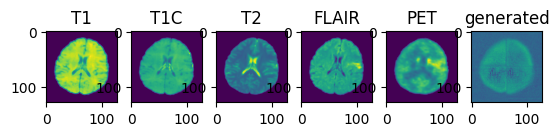

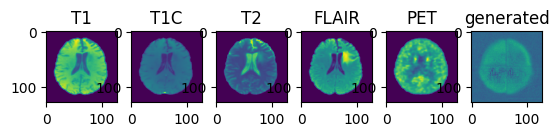

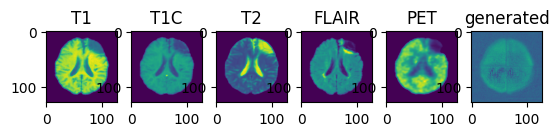

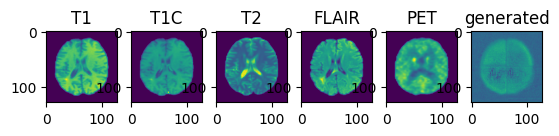

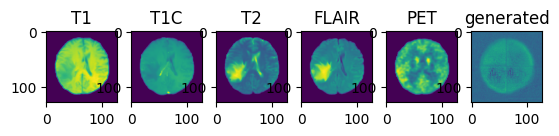

validation avg MS-SSIM: 0.4706 , train avg MS-SSIM: 0.4456
----------
epoch 261/400


Epoch :   0%|                                            | 0/24 [00:00<?, ?it/s]

Epoch :   4%|█▍                                 | 1/24 [01:45<40:30, 105.67s/it]

Epoch :   8%|███                                 | 2/24 [01:47<16:22, 44.67s/it]

Epoch :  12%|████▌                               | 3/24 [01:49<08:49, 25.21s/it]

Epoch :  17%|██████                              | 4/24 [01:51<05:20, 16.05s/it]

Epoch :  21%|███████▌                            | 5/24 [01:53<03:27, 10.94s/it]

Epoch :  25%|█████████                           | 6/24 [01:55<02:21,  7.86s/it]

Epoch :  29%|██████████▌                         | 7/24 [01:57<01:40,  5.90s/it]

Epoch :  33%|████████████                        | 8/24 [01:59<01:13,  4.62s/it]

Epoch :  38%|█████████████▌                      | 9/24 [02:01<00:56,  3.76s/it]

Epoch :  42%|██████████████▌                    | 10/24 [02:03<00:45,  3.28s/it]

Epoch :  46%|████████████████                   | 11/24 [02:05<00:37,  2.86s/it]

Epoch :  50%|█████████████████▌                 | 12/24 [02:07<00:31,  2.60s/it]

Epoch :  54%|██████████████████▉                | 13/24 [02:09<00:26,  2.44s/it]

Epoch :  58%|████████████████████▍              | 14/24 [02:11<00:23,  2.32s/it]

Epoch :  62%|█████████████████████▉             | 15/24 [02:13<00:19,  2.18s/it]

Epoch :  67%|███████████████████████▎           | 16/24 [02:15<00:16,  2.10s/it]

Epoch :  71%|████████████████████████▊          | 17/24 [02:17<00:14,  2.12s/it]

Epoch :  75%|██████████████████████████▎        | 18/24 [02:19<00:12,  2.05s/it]

Epoch :  79%|███████████████████████████▋       | 19/24 [02:21<00:10,  2.03s/it]

Epoch :  83%|█████████████████████████████▏     | 20/24 [02:23<00:08,  2.04s/it]

Epoch :  88%|██████████████████████████████▋    | 21/24 [02:25<00:06,  2.06s/it]

Epoch :  92%|████████████████████████████████   | 22/24 [02:27<00:04,  2.03s/it]

Epoch :  96%|█████████████████████████████████▌ | 23/24 [02:29<00:02,  2.02s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:30<00:00,  1.71s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:33<00:00,  6.41s/it]

----------
epoch 262/400


Epoch :   0%|                                            | 0/24 [00:00<?, ?it/s]

Epoch :   4%|█▍                                 | 1/24 [01:42<39:07, 102.06s/it]

Epoch :   8%|███                                 | 2/24 [01:44<15:57, 43.54s/it]

Epoch :  12%|████▌                               | 3/24 [01:46<08:35, 24.54s/it]

Epoch :  17%|██████                              | 4/24 [01:48<05:11, 15.60s/it]

Epoch :  21%|███████▌                            | 5/24 [01:50<03:22, 10.65s/it]

Epoch :  25%|█████████                           | 6/24 [01:52<02:18,  7.69s/it]

Epoch :  29%|██████████▌                         | 7/24 [01:54<01:38,  5.81s/it]

Epoch :  33%|████████████                        | 8/24 [01:56<01:13,  4.56s/it]

Epoch :  38%|█████████████▌                      | 9/24 [01:58<00:56,  3.74s/it]

Epoch :  42%|██████████████▌                    | 10/24 [01:59<00:44,  3.16s/it]

Epoch :  46%|████████████████                   | 11/24 [02:02<00:37,  2.89s/it]

Epoch :  50%|█████████████████▌                 | 12/24 [02:04<00:31,  2.60s/it]

Epoch :  54%|██████████████████▉                | 13/24 [02:06<00:26,  2.40s/it]

Epoch :  58%|████████████████████▍              | 14/24 [02:07<00:22,  2.25s/it]

Epoch :  62%|█████████████████████▉             | 15/24 [02:09<00:19,  2.15s/it]

Epoch :  67%|███████████████████████▎           | 16/24 [02:11<00:16,  2.09s/it]

Epoch :  71%|████████████████████████▊          | 17/24 [02:13<00:14,  2.02s/it]

Epoch :  75%|██████████████████████████▎        | 18/24 [02:15<00:12,  2.01s/it]

Epoch :  79%|███████████████████████████▋       | 19/24 [02:18<00:10,  2.12s/it]

Epoch :  83%|█████████████████████████████▏     | 20/24 [02:19<00:08,  2.05s/it]

Epoch :  88%|██████████████████████████████▋    | 21/24 [02:21<00:06,  2.01s/it]

Epoch :  92%|████████████████████████████████   | 22/24 [02:23<00:03,  1.99s/it]

Epoch :  96%|█████████████████████████████████▌ | 23/24 [02:25<00:01,  1.97s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:26<00:00,  1.68s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:30<00:00,  6.25s/it]

----------
epoch 263/400


Epoch :   0%|                                            | 0/24 [00:00<?, ?it/s]

Epoch :   4%|█▍                                 | 1/24 [01:43<39:38, 103.40s/it]

Epoch :   8%|███                                 | 2/24 [01:45<16:02, 43.75s/it]

Epoch :  12%|████▌                               | 3/24 [01:47<08:39, 24.75s/it]

Epoch :  17%|██████                              | 4/24 [01:50<05:20, 16.00s/it]

Epoch :  21%|███████▌                            | 5/24 [01:52<03:28, 11.00s/it]

Epoch :  25%|█████████                           | 6/24 [01:54<02:22,  7.94s/it]

Epoch :  29%|██████████▌                         | 7/24 [01:56<01:42,  6.02s/it]

Epoch :  33%|████████████                        | 8/24 [01:58<01:15,  4.71s/it]

Epoch :  38%|█████████████▌                      | 9/24 [02:00<00:57,  3.84s/it]

Epoch :  42%|██████████████▌                    | 10/24 [02:01<00:45,  3.23s/it]

Epoch :  46%|████████████████                   | 11/24 [02:03<00:36,  2.84s/it]

Epoch :  50%|█████████████████▌                 | 12/24 [02:06<00:32,  2.69s/it]

Epoch :  54%|██████████████████▉                | 13/24 [02:08<00:27,  2.49s/it]

Epoch :  58%|████████████████████▍              | 14/24 [02:10<00:23,  2.32s/it]

Epoch :  62%|█████████████████████▉             | 15/24 [02:12<00:19,  2.18s/it]

Epoch :  67%|███████████████████████▎           | 16/24 [02:13<00:16,  2.09s/it]

Epoch :  71%|████████████████████████▊          | 17/24 [02:15<00:14,  2.03s/it]

Epoch :  75%|██████████████████████████▎        | 18/24 [02:17<00:11,  1.98s/it]

Epoch :  79%|███████████████████████████▋       | 19/24 [02:19<00:09,  1.95s/it]

Epoch :  83%|█████████████████████████████▏     | 20/24 [02:21<00:07,  1.92s/it]

Epoch :  88%|██████████████████████████████▋    | 21/24 [02:23<00:06,  2.02s/it]

Epoch :  92%|████████████████████████████████   | 22/24 [02:25<00:04,  2.03s/it]

Epoch :  96%|█████████████████████████████████▌ | 23/24 [02:27<00:02,  2.01s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:28<00:00,  1.72s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:32<00:00,  6.35s/it]

----------
epoch 264/400


Epoch :   0%|                                            | 0/24 [00:00<?, ?it/s]

Epoch :   4%|█▍                                 | 1/24 [01:43<39:46, 103.77s/it]

Epoch :   8%|███                                 | 2/24 [01:45<16:05, 43.88s/it]

Epoch :  12%|████▌                               | 3/24 [01:47<08:39, 24.73s/it]

Epoch :  17%|██████                              | 4/24 [01:49<05:14, 15.70s/it]

Epoch :  21%|███████▌                            | 5/24 [01:51<03:26, 10.88s/it]

Epoch :  25%|█████████                           | 6/24 [01:53<02:21,  7.84s/it]

Epoch :  29%|██████████▌                         | 7/24 [01:55<01:41,  5.96s/it]

Epoch :  33%|████████████                        | 8/24 [01:57<01:15,  4.70s/it]

Epoch :  38%|█████████████▌                      | 9/24 [01:59<00:57,  3.83s/it]

Epoch :  42%|██████████████▌                    | 10/24 [02:01<00:45,  3.23s/it]

Epoch :  46%|████████████████                   | 11/24 [02:03<00:36,  2.84s/it]

Epoch :  50%|█████████████████▌                 | 12/24 [02:05<00:30,  2.56s/it]

Epoch :  54%|██████████████████▉                | 13/24 [02:07<00:26,  2.42s/it]

Epoch :  58%|████████████████████▍              | 14/24 [02:10<00:25,  2.50s/it]

Epoch :  62%|█████████████████████▉             | 15/24 [02:12<00:21,  2.40s/it]

Epoch :  67%|███████████████████████▎           | 16/24 [02:14<00:17,  2.25s/it]

Epoch :  71%|████████████████████████▊          | 17/24 [02:16<00:15,  2.15s/it]

Epoch :  75%|██████████████████████████▎        | 18/24 [02:18<00:12,  2.11s/it]

Epoch :  79%|███████████████████████████▋       | 19/24 [02:20<00:10,  2.10s/it]

Epoch :  83%|█████████████████████████████▏     | 20/24 [02:22<00:08,  2.10s/it]

Epoch :  88%|██████████████████████████████▋    | 21/24 [02:24<00:06,  2.05s/it]

Epoch :  92%|████████████████████████████████   | 22/24 [02:27<00:04,  2.22s/it]

Epoch :  96%|█████████████████████████████████▌ | 23/24 [02:28<00:02,  2.12s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:29<00:00,  1.78s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:33<00:00,  6.39s/it]

----------
epoch 265/400


Epoch :   0%|                                            | 0/24 [00:00<?, ?it/s]

Epoch :   4%|█▍                                 | 1/24 [01:40<38:40, 100.89s/it]

Epoch :   8%|███                                 | 2/24 [01:43<15:41, 42.79s/it]

Epoch :  12%|████▌                               | 3/24 [01:45<08:28, 24.22s/it]

Epoch :  17%|██████                              | 4/24 [01:47<05:09, 15.46s/it]

Epoch :  21%|███████▌                            | 5/24 [01:49<03:21, 10.59s/it]

Epoch :  25%|█████████                           | 6/24 [01:51<02:17,  7.63s/it]

Epoch :  29%|██████████▌                         | 7/24 [01:53<01:40,  5.89s/it]

Epoch :  33%|████████████                        | 8/24 [01:55<01:13,  4.62s/it]

Epoch :  38%|█████████████▌                      | 9/24 [01:57<00:56,  3.76s/it]

Epoch :  42%|██████████████▌                    | 10/24 [01:58<00:44,  3.16s/it]

Epoch :  46%|████████████████                   | 11/24 [02:00<00:35,  2.76s/it]

Epoch :  50%|█████████████████▌                 | 12/24 [02:02<00:29,  2.50s/it]

Epoch :  54%|██████████████████▉                | 13/24 [02:04<00:25,  2.35s/it]

Epoch :  58%|████████████████████▍              | 14/24 [02:06<00:23,  2.31s/it]

Epoch :  62%|█████████████████████▉             | 15/24 [02:09<00:20,  2.32s/it]

Epoch :  67%|███████████████████████▎           | 16/24 [02:11<00:17,  2.19s/it]

Epoch :  71%|████████████████████████▊          | 17/24 [02:13<00:14,  2.11s/it]

Epoch :  75%|██████████████████████████▎        | 18/24 [02:14<00:12,  2.05s/it]

Epoch :  79%|███████████████████████████▋       | 19/24 [02:16<00:10,  2.04s/it]

Epoch :  83%|█████████████████████████████▏     | 20/24 [02:18<00:08,  2.01s/it]

Epoch :  88%|██████████████████████████████▋    | 21/24 [02:20<00:05,  1.98s/it]

Epoch :  92%|████████████████████████████████   | 22/24 [02:22<00:03,  1.97s/it]

Epoch :  96%|█████████████████████████████████▌ | 23/24 [02:25<00:02,  2.10s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:26<00:00,  1.79s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:29<00:00,  6.24s/it]

----------
epoch 266/400


Epoch :   0%|                                            | 0/24 [00:00<?, ?it/s]

Epoch :   4%|█▍                                 | 1/24 [01:45<40:22, 105.35s/it]

Epoch :   8%|███                                 | 2/24 [01:47<16:20, 44.59s/it]

Epoch :  12%|████▌                               | 3/24 [01:49<08:49, 25.20s/it]

Epoch :  17%|██████                              | 4/24 [01:51<05:21, 16.08s/it]

Epoch :  21%|███████▌                            | 5/24 [01:53<03:28, 10.97s/it]

Epoch :  25%|█████████                           | 6/24 [01:55<02:22,  7.91s/it]

Epoch :  29%|██████████▌                         | 7/24 [01:57<01:41,  5.98s/it]

Epoch :  33%|████████████                        | 8/24 [02:00<01:17,  4.87s/it]

Epoch :  38%|█████████████▌                      | 9/24 [02:01<00:59,  3.96s/it]

Epoch :  42%|██████████████▌                    | 10/24 [02:03<00:47,  3.36s/it]

Epoch :  46%|████████████████                   | 11/24 [02:05<00:38,  2.94s/it]

Epoch :  50%|█████████████████▌                 | 12/24 [02:07<00:31,  2.66s/it]

Epoch :  54%|██████████████████▉                | 13/24 [02:10<00:27,  2.47s/it]

Epoch :  58%|████████████████████▍              | 14/24 [02:12<00:23,  2.34s/it]

Epoch :  62%|█████████████████████▉             | 15/24 [02:14<00:20,  2.24s/it]

Epoch :  67%|███████████████████████▎           | 16/24 [02:16<00:18,  2.28s/it]

Epoch :  71%|████████████████████████▊          | 17/24 [02:18<00:15,  2.22s/it]

Epoch :  75%|██████████████████████████▎        | 18/24 [02:20<00:13,  2.20s/it]

Epoch :  79%|███████████████████████████▋       | 19/24 [02:22<00:10,  2.17s/it]

Epoch :  83%|█████████████████████████████▏     | 20/24 [02:24<00:08,  2.09s/it]

Epoch :  88%|██████████████████████████████▋    | 21/24 [02:26<00:06,  2.02s/it]

Epoch :  92%|████████████████████████████████   | 22/24 [02:28<00:03,  1.97s/it]

Epoch :  96%|█████████████████████████████████▌ | 23/24 [02:30<00:01,  1.94s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:31<00:00,  1.67s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:34<00:00,  6.44s/it]

----------
epoch 267/400


Epoch :   0%|                                            | 0/24 [00:00<?, ?it/s]

Epoch :   4%|█▍                                 | 1/24 [01:45<40:23, 105.35s/it]

Epoch :   8%|███                                 | 2/24 [01:47<16:20, 44.58s/it]

Epoch :  12%|████▌                               | 3/24 [01:49<08:47, 25.13s/it]

Epoch :  17%|██████                              | 4/24 [01:51<05:19, 15.99s/it]

Epoch :  21%|███████▌                            | 5/24 [01:53<03:27, 10.94s/it]

Epoch :  25%|█████████                           | 6/24 [01:55<02:22,  7.89s/it]

Epoch :  29%|██████████▌                         | 7/24 [01:57<01:40,  5.93s/it]

Epoch :  33%|████████████                        | 8/24 [01:59<01:14,  4.65s/it]

Epoch :  38%|█████████████▌                      | 9/24 [02:01<00:58,  3.89s/it]

Epoch :  42%|██████████████▌                    | 10/24 [02:03<00:45,  3.28s/it]

Epoch :  46%|████████████████                   | 11/24 [02:05<00:36,  2.84s/it]

Epoch :  50%|█████████████████▌                 | 12/24 [02:06<00:30,  2.53s/it]

Epoch :  54%|██████████████████▉                | 13/24 [02:08<00:25,  2.33s/it]

Epoch :  58%|████████████████████▍              | 14/24 [02:10<00:22,  2.20s/it]

Epoch :  62%|█████████████████████▉             | 15/24 [02:12<00:19,  2.13s/it]

Epoch :  67%|███████████████████████▎           | 16/24 [02:14<00:16,  2.06s/it]

Epoch :  71%|████████████████████████▊          | 17/24 [02:16<00:14,  2.03s/it]

Epoch :  75%|██████████████████████████▎        | 18/24 [02:18<00:12,  2.09s/it]

Epoch :  79%|███████████████████████████▋       | 19/24 [02:20<00:10,  2.03s/it]

Epoch :  83%|█████████████████████████████▏     | 20/24 [02:22<00:08,  2.05s/it]

Epoch :  88%|██████████████████████████████▋    | 21/24 [02:24<00:06,  2.03s/it]

Epoch :  92%|████████████████████████████████   | 22/24 [02:26<00:03,  1.99s/it]

Epoch :  96%|█████████████████████████████████▌ | 23/24 [02:28<00:01,  1.95s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:29<00:00,  1.66s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:32<00:00,  6.37s/it]

----------
epoch 268/400


Epoch :   0%|                                            | 0/24 [00:00<?, ?it/s]

Epoch :   4%|█▌                                  | 1/24 [01:39<37:58, 99.06s/it]

Epoch :   8%|███                                 | 2/24 [01:41<15:22, 41.95s/it]

Epoch :  12%|████▌                               | 3/24 [01:43<08:21, 23.87s/it]

Epoch :  17%|██████                              | 4/24 [01:45<05:04, 15.20s/it]

Epoch :  21%|███████▌                            | 5/24 [01:47<03:17, 10.40s/it]

Epoch :  25%|█████████                           | 6/24 [01:49<02:14,  7.50s/it]

Epoch :  29%|██████████▌                         | 7/24 [01:50<01:36,  5.66s/it]

Epoch :  33%|████████████                        | 8/24 [01:52<01:11,  4.45s/it]

Epoch :  38%|█████████████▌                      | 9/24 [01:54<00:54,  3.67s/it]

Epoch :  42%|██████████████▌                    | 10/24 [01:56<00:44,  3.15s/it]

Epoch :  46%|████████████████                   | 11/24 [01:59<00:37,  2.92s/it]

Epoch :  50%|█████████████████▌                 | 12/24 [02:01<00:31,  2.63s/it]

Epoch :  54%|██████████████████▉                | 13/24 [02:03<00:26,  2.45s/it]

Epoch :  58%|████████████████████▍              | 14/24 [02:05<00:22,  2.29s/it]

Epoch :  62%|█████████████████████▉             | 15/24 [02:07<00:19,  2.19s/it]

Epoch :  67%|███████████████████████▎           | 16/24 [02:08<00:16,  2.09s/it]

Epoch :  71%|████████████████████████▊          | 17/24 [02:10<00:14,  2.02s/it]

Epoch :  75%|██████████████████████████▎        | 18/24 [02:12<00:11,  1.96s/it]

Epoch :  79%|███████████████████████████▋       | 19/24 [02:14<00:09,  1.92s/it]

Epoch :  83%|█████████████████████████████▏     | 20/24 [02:16<00:07,  1.92s/it]

Epoch :  88%|██████████████████████████████▋    | 21/24 [02:18<00:05,  1.93s/it]

Epoch :  92%|████████████████████████████████   | 22/24 [02:20<00:03,  1.95s/it]

Epoch :  96%|█████████████████████████████████▌ | 23/24 [02:22<00:01,  1.93s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:23<00:00,  1.65s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:26<00:00,  6.10s/it]

----------
epoch 269/400


Epoch :   0%|                                            | 0/24 [00:00<?, ?it/s]

Epoch :   4%|█▌                                  | 1/24 [01:37<37:25, 97.63s/it]

Epoch :   8%|███                                 | 2/24 [01:39<15:08, 41.31s/it]

Epoch :  12%|████▌                               | 3/24 [01:41<08:09, 23.31s/it]

Epoch :  17%|██████                              | 4/24 [01:43<05:01, 15.06s/it]

Epoch :  21%|███████▌                            | 5/24 [01:45<03:15, 10.30s/it]

Epoch :  25%|█████████                           | 6/24 [01:47<02:14,  7.45s/it]

Epoch :  29%|██████████▌                         | 7/24 [01:49<01:35,  5.63s/it]

Epoch :  33%|████████████                        | 8/24 [01:51<01:10,  4.43s/it]

Epoch :  38%|█████████████▌                      | 9/24 [01:53<00:54,  3.62s/it]

Epoch :  42%|██████████████▌                    | 10/24 [01:55<00:43,  3.11s/it]

Epoch :  46%|████████████████                   | 11/24 [01:57<00:36,  2.79s/it]

Epoch :  50%|█████████████████▌                 | 12/24 [01:59<00:31,  2.66s/it]

Epoch :  54%|██████████████████▉                | 13/24 [02:01<00:26,  2.41s/it]

Epoch :  58%|████████████████████▍              | 14/24 [02:03<00:22,  2.24s/it]

Epoch :  62%|█████████████████████▉             | 15/24 [02:05<00:18,  2.11s/it]

Epoch :  67%|███████████████████████▎           | 16/24 [02:06<00:16,  2.04s/it]

Epoch :  71%|████████████████████████▊          | 17/24 [02:08<00:13,  1.99s/it]

Epoch :  75%|██████████████████████████▎        | 18/24 [02:10<00:11,  1.94s/it]

Epoch :  79%|███████████████████████████▋       | 19/24 [02:12<00:09,  1.91s/it]

Epoch :  83%|█████████████████████████████▏     | 20/24 [02:14<00:07,  1.89s/it]

Epoch :  88%|██████████████████████████████▋    | 21/24 [02:16<00:05,  1.95s/it]

Epoch :  92%|████████████████████████████████   | 22/24 [02:18<00:03,  1.91s/it]

Epoch :  96%|█████████████████████████████████▌ | 23/24 [02:20<00:01,  1.90s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:21<00:00,  1.62s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:24<00:00,  6.02s/it]

----------
epoch 270/400


Epoch :   0%|                                            | 0/24 [00:00<?, ?it/s]

Epoch :   4%|█▌                                  | 1/24 [01:36<36:48, 96.02s/it]

Epoch :   8%|███                                 | 2/24 [01:37<14:54, 40.67s/it]

Epoch :  12%|████▌                               | 3/24 [01:39<08:02, 22.98s/it]

Epoch :  17%|██████                              | 4/24 [01:41<04:52, 14.64s/it]

Epoch :  21%|███████▌                            | 5/24 [01:43<03:13, 10.18s/it]

Epoch :  25%|█████████                           | 6/24 [01:45<02:12,  7.35s/it]

Epoch :  29%|██████████▌                         | 7/24 [01:47<01:34,  5.55s/it]

Epoch :  33%|████████████                        | 8/24 [01:49<01:10,  4.40s/it]

Epoch :  38%|█████████████▌                      | 9/24 [01:51<00:54,  3.63s/it]

Epoch :  42%|██████████████▌                    | 10/24 [01:53<00:43,  3.09s/it]

Epoch :  46%|████████████████                   | 11/24 [01:55<00:35,  2.72s/it]

Epoch :  50%|█████████████████▌                 | 12/24 [01:57<00:29,  2.44s/it]

Epoch :  54%|██████████████████▉                | 13/24 [01:59<00:25,  2.36s/it]

Epoch :  58%|████████████████████▍              | 14/24 [02:01<00:21,  2.20s/it]

Epoch :  62%|█████████████████████▉             | 15/24 [02:03<00:18,  2.11s/it]

Epoch :  67%|███████████████████████▎           | 16/24 [02:04<00:16,  2.06s/it]

Epoch :  71%|████████████████████████▊          | 17/24 [02:06<00:14,  2.00s/it]

Epoch :  75%|██████████████████████████▎        | 18/24 [02:08<00:11,  1.95s/it]

Epoch :  79%|███████████████████████████▋       | 19/24 [02:10<00:09,  1.92s/it]

Epoch :  83%|█████████████████████████████▏     | 20/24 [02:12<00:07,  1.89s/it]

Epoch :  88%|██████████████████████████████▋    | 21/24 [02:14<00:05,  1.86s/it]

Epoch :  92%|████████████████████████████████   | 22/24 [02:16<00:03,  1.94s/it]

Epoch :  96%|█████████████████████████████████▌ | 23/24 [02:18<00:01,  1.91s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:19<00:00,  1.65s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:22<00:00,  5.94s/it]

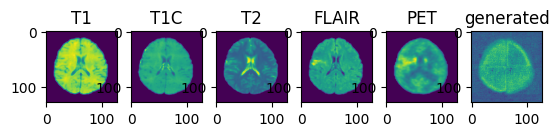

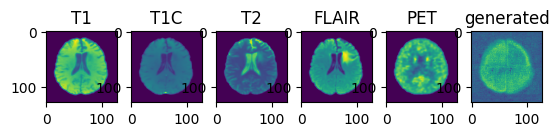

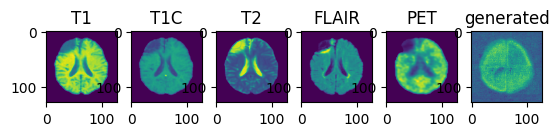

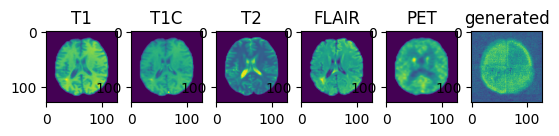

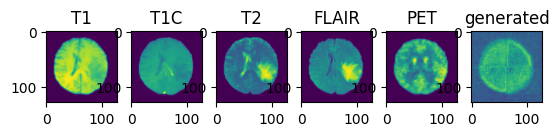

validation avg MS-SSIM: 0.4598 , train avg MS-SSIM: 0.4318
----------
epoch 271/400


Epoch :   0%|                                            | 0/24 [00:00<?, ?it/s]

Epoch :   4%|█▌                                  | 1/24 [01:37<37:11, 97.03s/it]

Epoch :   8%|███                                 | 2/24 [01:39<15:05, 41.16s/it]

Epoch :  12%|████▌                               | 3/24 [01:41<08:12, 23.46s/it]

Epoch :  17%|██████                              | 4/24 [01:43<04:58, 14.94s/it]

Epoch :  21%|███████▌                            | 5/24 [01:45<03:15, 10.27s/it]

Epoch :  25%|█████████                           | 6/24 [01:47<02:13,  7.42s/it]

Epoch :  29%|██████████▌                         | 7/24 [01:49<01:35,  5.61s/it]

Epoch :  33%|████████████                        | 8/24 [01:50<01:10,  4.42s/it]

Epoch :  38%|█████████████▌                      | 9/24 [01:52<00:54,  3.62s/it]

Epoch :  42%|██████████████▌                    | 10/24 [01:54<00:43,  3.08s/it]

Epoch :  46%|████████████████                   | 11/24 [01:56<00:36,  2.79s/it]

Epoch :  50%|█████████████████▌                 | 12/24 [01:58<00:30,  2.52s/it]

Epoch :  54%|██████████████████▉                | 13/24 [02:00<00:25,  2.31s/it]

Epoch :  58%|████████████████████▍              | 14/24 [02:02<00:22,  2.21s/it]

Epoch :  62%|█████████████████████▉             | 15/24 [02:04<00:19,  2.12s/it]

Epoch :  67%|███████████████████████▎           | 16/24 [02:06<00:16,  2.07s/it]

Epoch :  71%|████████████████████████▊          | 17/24 [02:08<00:14,  2.02s/it]

Epoch :  75%|██████████████████████████▎        | 18/24 [02:10<00:11,  1.98s/it]

Epoch :  79%|███████████████████████████▋       | 19/24 [02:12<00:09,  1.96s/it]

Epoch :  83%|█████████████████████████████▏     | 20/24 [02:14<00:08,  2.12s/it]

Epoch :  88%|██████████████████████████████▋    | 21/24 [02:16<00:06,  2.09s/it]

Epoch :  92%|████████████████████████████████   | 22/24 [02:18<00:04,  2.08s/it]

Epoch :  96%|█████████████████████████████████▌ | 23/24 [02:20<00:02,  2.03s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:21<00:00,  1.71s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:24<00:00,  6.04s/it]

----------
epoch 272/400


Epoch :   0%|                                            | 0/24 [00:00<?, ?it/s]

Epoch :   4%|█▍                                 | 1/24 [01:46<40:43, 106.23s/it]

Epoch :   8%|███                                 | 2/24 [01:48<16:28, 44.94s/it]

Epoch :  12%|████▌                               | 3/24 [01:50<08:51, 25.32s/it]

Epoch :  17%|██████                              | 4/24 [01:52<05:25, 16.29s/it]

Epoch :  21%|███████▌                            | 5/24 [01:54<03:31, 11.11s/it]

Epoch :  25%|█████████                           | 6/24 [01:56<02:24,  8.00s/it]

Epoch :  29%|██████████▌                         | 7/24 [01:58<01:42,  6.02s/it]

Epoch :  33%|████████████                        | 8/24 [02:00<01:15,  4.74s/it]

Epoch :  38%|█████████████▌                      | 9/24 [02:02<00:57,  3.86s/it]

Epoch :  42%|██████████████▌                    | 10/24 [02:04<00:46,  3.31s/it]

Epoch :  46%|████████████████                   | 11/24 [02:06<00:37,  2.91s/it]

Epoch :  50%|█████████████████▌                 | 12/24 [02:08<00:32,  2.71s/it]

Epoch :  54%|██████████████████▉                | 13/24 [02:10<00:27,  2.47s/it]

Epoch :  58%|████████████████████▍              | 14/24 [02:12<00:22,  2.30s/it]

Epoch :  62%|█████████████████████▉             | 15/24 [02:14<00:19,  2.20s/it]

Epoch :  67%|███████████████████████▎           | 16/24 [02:16<00:17,  2.14s/it]

Epoch :  71%|████████████████████████▊          | 17/24 [02:18<00:14,  2.13s/it]

Epoch :  75%|██████████████████████████▎        | 18/24 [02:20<00:12,  2.10s/it]

Epoch :  79%|███████████████████████████▋       | 19/24 [02:22<00:10,  2.05s/it]

Epoch :  83%|█████████████████████████████▏     | 20/24 [02:24<00:08,  2.05s/it]

Epoch :  88%|██████████████████████████████▋    | 21/24 [02:27<00:06,  2.16s/it]

Epoch :  92%|████████████████████████████████   | 22/24 [02:29<00:04,  2.11s/it]

Epoch :  96%|█████████████████████████████████▌ | 23/24 [02:31<00:02,  2.07s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:32<00:00,  1.77s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:36<00:00,  6.52s/it]

----------
epoch 273/400


Epoch :   0%|                                            | 0/24 [00:00<?, ?it/s]

Epoch :   4%|█▍                                 | 1/24 [01:53<43:21, 113.10s/it]

Epoch :   8%|███                                 | 2/24 [01:55<17:32, 47.82s/it]

Epoch :  12%|████▌                               | 3/24 [01:57<09:28, 27.08s/it]

Epoch :  17%|██████                              | 4/24 [02:00<05:47, 17.36s/it]

Epoch :  21%|███████▌                            | 5/24 [02:02<03:47, 11.95s/it]

Epoch :  25%|█████████                           | 6/24 [02:04<02:36,  8.72s/it]

Epoch :  29%|██████████▌                         | 7/24 [02:07<01:52,  6.61s/it]

Epoch :  33%|████████████                        | 8/24 [02:09<01:22,  5.14s/it]

Epoch :  38%|█████████████▌                      | 9/24 [02:11<01:02,  4.15s/it]

Epoch :  42%|██████████████▌                    | 10/24 [02:13<00:48,  3.48s/it]

Epoch :  46%|████████████████                   | 11/24 [02:15<00:39,  3.06s/it]

Epoch :  50%|█████████████████▌                 | 12/24 [02:17<00:33,  2.78s/it]

Epoch :  54%|██████████████████▉                | 13/24 [02:19<00:29,  2.64s/it]

Epoch :  58%|████████████████████▍              | 14/24 [02:21<00:24,  2.44s/it]

Epoch :  62%|█████████████████████▉             | 15/24 [02:23<00:20,  2.28s/it]

Epoch :  67%|███████████████████████▎           | 16/24 [02:25<00:17,  2.17s/it]

Epoch :  71%|████████████████████████▊          | 17/24 [02:27<00:14,  2.14s/it]

Epoch :  75%|██████████████████████████▎        | 18/24 [02:29<00:12,  2.08s/it]

Epoch :  79%|███████████████████████████▋       | 19/24 [02:31<00:10,  2.04s/it]

Epoch :  83%|█████████████████████████████▏     | 20/24 [02:33<00:08,  2.02s/it]

Epoch :  88%|██████████████████████████████▋    | 21/24 [02:35<00:06,  2.00s/it]

Epoch :  92%|████████████████████████████████   | 22/24 [02:37<00:04,  2.11s/it]

Epoch :  96%|█████████████████████████████████▌ | 23/24 [02:39<00:02,  2.04s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:40<00:00,  1.73s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:44<00:00,  6.84s/it]

----------
epoch 274/400


Epoch :   0%|                                            | 0/24 [00:00<?, ?it/s]

Epoch :   4%|█▍                                 | 1/24 [01:56<44:38, 116.44s/it]

Epoch :   8%|███                                 | 2/24 [01:58<18:00, 49.10s/it]

Epoch :  12%|████▌                               | 3/24 [02:00<09:40, 27.62s/it]

Epoch :  17%|██████                              | 4/24 [02:02<05:51, 17.59s/it]

Epoch :  21%|███████▌                            | 5/24 [02:04<03:48, 12.03s/it]

Epoch :  25%|█████████                           | 6/24 [02:07<02:38,  8.82s/it]

Epoch :  29%|██████████▌                         | 7/24 [02:09<01:52,  6.61s/it]

Epoch :  33%|████████████                        | 8/24 [02:11<01:21,  5.12s/it]

Epoch :  38%|█████████████▌                      | 9/24 [02:13<01:02,  4.15s/it]

Epoch :  42%|██████████████▌                    | 10/24 [02:15<00:48,  3.47s/it]

Epoch :  46%|████████████████                   | 11/24 [02:17<00:38,  2.97s/it]

Epoch :  50%|█████████████████▌                 | 12/24 [02:19<00:32,  2.67s/it]

Epoch :  54%|██████████████████▉                | 13/24 [02:21<00:28,  2.55s/it]

Epoch :  58%|████████████████████▍              | 14/24 [02:24<00:25,  2.55s/it]

Epoch :  62%|█████████████████████▉             | 15/24 [02:26<00:21,  2.43s/it]

Epoch :  67%|███████████████████████▎           | 16/24 [02:28<00:19,  2.39s/it]

Epoch :  71%|████████████████████████▊          | 17/24 [02:30<00:16,  2.32s/it]

Epoch :  75%|██████████████████████████▎        | 18/24 [02:32<00:13,  2.32s/it]

Epoch :  79%|███████████████████████████▋       | 19/24 [02:35<00:11,  2.28s/it]

Epoch :  83%|█████████████████████████████▏     | 20/24 [02:37<00:09,  2.28s/it]

Epoch :  88%|██████████████████████████████▋    | 21/24 [02:39<00:06,  2.25s/it]

Epoch :  92%|████████████████████████████████   | 22/24 [02:41<00:04,  2.16s/it]

Epoch :  96%|█████████████████████████████████▌ | 23/24 [02:44<00:02,  2.29s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:45<00:00,  1.93s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:49<00:00,  7.07s/it]

----------
epoch 275/400


Epoch :   0%|                                            | 0/24 [00:00<?, ?it/s]

Epoch :   4%|█▍                                 | 1/24 [01:50<42:25, 110.69s/it]

Epoch :   8%|███                                 | 2/24 [01:52<17:10, 46.83s/it]

Epoch :  12%|████▌                               | 3/24 [01:54<09:13, 26.34s/it]

Epoch :  17%|██████                              | 4/24 [01:56<05:35, 16.77s/it]

Epoch :  21%|███████▌                            | 5/24 [01:59<03:39, 11.54s/it]

Epoch :  25%|█████████                           | 6/24 [02:01<02:29,  8.29s/it]

Epoch :  29%|██████████▌                         | 7/24 [02:03<01:49,  6.44s/it]

Epoch :  33%|████████████                        | 8/24 [02:05<01:20,  5.04s/it]

Epoch :  38%|█████████████▌                      | 9/24 [02:07<01:01,  4.08s/it]

Epoch :  42%|██████████████▌                    | 10/24 [02:09<00:47,  3.42s/it]

Epoch :  46%|████████████████                   | 11/24 [02:11<00:38,  2.96s/it]

Epoch :  50%|█████████████████▌                 | 12/24 [02:13<00:32,  2.67s/it]

Epoch :  54%|██████████████████▉                | 13/24 [02:15<00:27,  2.51s/it]

Epoch :  58%|████████████████████▍              | 14/24 [02:17<00:23,  2.36s/it]

Epoch :  62%|█████████████████████▉             | 15/24 [02:19<00:20,  2.28s/it]

Epoch :  67%|███████████████████████▎           | 16/24 [02:22<00:19,  2.41s/it]

Epoch :  71%|████████████████████████▊          | 17/24 [02:24<00:16,  2.32s/it]

Epoch :  75%|██████████████████████████▎        | 18/24 [02:26<00:13,  2.23s/it]

Epoch :  79%|███████████████████████████▋       | 19/24 [02:28<00:11,  2.20s/it]

Epoch :  83%|█████████████████████████████▏     | 20/24 [02:31<00:08,  2.21s/it]

Epoch :  88%|██████████████████████████████▋    | 21/24 [02:33<00:06,  2.20s/it]

Epoch :  92%|████████████████████████████████   | 22/24 [02:35<00:04,  2.19s/it]

Epoch :  96%|█████████████████████████████████▌ | 23/24 [02:37<00:02,  2.13s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:38<00:00,  1.82s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:42<00:00,  6.78s/it]

----------
epoch 276/400


Epoch :   0%|                                            | 0/24 [00:00<?, ?it/s]

Epoch :   4%|█▍                                 | 1/24 [01:51<42:53, 111.89s/it]

Epoch :   8%|███                                 | 2/24 [01:54<17:22, 47.41s/it]

Epoch :  12%|████▌                               | 3/24 [01:56<09:20, 26.69s/it]

Epoch :  17%|██████                              | 4/24 [01:58<05:38, 16.93s/it]

Epoch :  21%|███████▌                            | 5/24 [02:00<03:39, 11.56s/it]

Epoch :  25%|█████████                           | 6/24 [02:02<02:30,  8.38s/it]

Epoch :  29%|██████████▌                         | 7/24 [02:04<01:48,  6.37s/it]

Epoch :  33%|████████████                        | 8/24 [02:06<01:20,  5.04s/it]

Epoch :  38%|█████████████▌                      | 9/24 [02:09<01:03,  4.23s/it]

Epoch :  42%|██████████████▌                    | 10/24 [02:11<00:49,  3.55s/it]

Epoch :  46%|████████████████                   | 11/24 [02:13<00:39,  3.06s/it]

Epoch :  50%|█████████████████▌                 | 12/24 [02:15<00:33,  2.75s/it]

Epoch :  54%|██████████████████▉                | 13/24 [02:17<00:27,  2.52s/it]

Epoch :  58%|████████████████████▍              | 14/24 [02:19<00:23,  2.38s/it]

Epoch :  62%|█████████████████████▉             | 15/24 [02:21<00:20,  2.24s/it]

Epoch :  67%|███████████████████████▎           | 16/24 [02:23<00:17,  2.20s/it]

Epoch :  71%|████████████████████████▊          | 17/24 [02:25<00:16,  2.31s/it]

Epoch :  75%|██████████████████████████▎        | 18/24 [02:27<00:13,  2.23s/it]

Epoch :  79%|███████████████████████████▋       | 19/24 [02:30<00:10,  2.17s/it]

Epoch :  83%|█████████████████████████████▏     | 20/24 [02:32<00:08,  2.14s/it]

Epoch :  88%|██████████████████████████████▋    | 21/24 [02:34<00:06,  2.15s/it]

Epoch :  92%|████████████████████████████████   | 22/24 [02:36<00:04,  2.10s/it]

Epoch :  96%|█████████████████████████████████▌ | 23/24 [02:38<00:02,  2.04s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:39<00:00,  1.74s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:43<00:00,  6.81s/it]

----------
epoch 277/400


Epoch :   0%|                                            | 0/24 [00:00<?, ?it/s]

Epoch :   4%|█▍                                 | 1/24 [01:56<44:29, 116.07s/it]

Epoch :   8%|███                                 | 2/24 [01:58<18:06, 49.38s/it]

Epoch :  12%|████▌                               | 3/24 [02:00<09:44, 27.84s/it]

Epoch :  17%|██████                              | 4/24 [02:03<05:53, 17.68s/it]

Epoch :  21%|███████▌                            | 5/24 [02:05<03:49, 12.06s/it]

Epoch :  25%|█████████                           | 6/24 [02:07<02:36,  8.70s/it]

Epoch :  29%|██████████▌                         | 7/24 [02:09<01:51,  6.53s/it]

Epoch :  33%|████████████                        | 8/24 [02:11<01:21,  5.11s/it]

Epoch :  38%|█████████████▌                      | 9/24 [02:13<01:03,  4.23s/it]

Epoch :  42%|██████████████▌                    | 10/24 [02:15<00:50,  3.60s/it]

Epoch :  46%|████████████████                   | 11/24 [02:18<00:43,  3.34s/it]

Epoch :  50%|█████████████████▌                 | 12/24 [02:20<00:35,  2.97s/it]

Epoch :  54%|██████████████████▉                | 13/24 [02:22<00:29,  2.69s/it]

Epoch :  58%|████████████████████▍              | 14/24 [02:24<00:24,  2.46s/it]

Epoch :  62%|█████████████████████▉             | 15/24 [02:26<00:20,  2.32s/it]

Epoch :  67%|███████████████████████▎           | 16/24 [02:28<00:17,  2.24s/it]

Epoch :  71%|████████████████████████▊          | 17/24 [02:30<00:15,  2.20s/it]

Epoch :  75%|██████████████████████████▎        | 18/24 [02:33<00:13,  2.31s/it]

Epoch :  79%|███████████████████████████▋       | 19/24 [02:35<00:11,  2.30s/it]

Epoch :  83%|█████████████████████████████▏     | 20/24 [02:38<00:09,  2.31s/it]

Epoch :  88%|██████████████████████████████▋    | 21/24 [02:40<00:06,  2.27s/it]

Epoch :  92%|████████████████████████████████   | 22/24 [02:42<00:04,  2.23s/it]

Epoch :  96%|█████████████████████████████████▌ | 23/24 [02:44<00:02,  2.23s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:45<00:00,  1.88s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:50<00:00,  7.09s/it]

----------
epoch 278/400


Epoch :   0%|                                            | 0/24 [00:00<?, ?it/s]

Epoch :   4%|█▍                                 | 1/24 [01:51<42:40, 111.34s/it]

Epoch :   8%|███                                 | 2/24 [01:53<17:17, 47.18s/it]

Epoch :  12%|████▌                               | 3/24 [01:56<09:24, 26.90s/it]

Epoch :  17%|██████                              | 4/24 [01:58<05:43, 17.17s/it]

Epoch :  21%|███████▌                            | 5/24 [02:00<03:43, 11.76s/it]

Epoch :  25%|█████████                           | 6/24 [02:02<02:31,  8.43s/it]

Epoch :  29%|██████████▌                         | 7/24 [02:04<01:47,  6.30s/it]

Epoch :  33%|████████████                        | 8/24 [02:06<01:18,  4.93s/it]

Epoch :  38%|█████████████▌                      | 9/24 [02:08<01:00,  4.05s/it]

Epoch :  42%|██████████████▌                    | 10/24 [02:10<00:48,  3.45s/it]

Epoch :  46%|████████████████                   | 11/24 [02:12<00:39,  3.01s/it]

Epoch :  50%|█████████████████▌                 | 12/24 [02:15<00:33,  2.80s/it]

Epoch :  54%|██████████████████▉                | 13/24 [02:17<00:27,  2.52s/it]

Epoch :  58%|████████████████████▍              | 14/24 [02:18<00:23,  2.32s/it]

Epoch :  62%|█████████████████████▉             | 15/24 [02:20<00:19,  2.20s/it]

Epoch :  67%|███████████████████████▎           | 16/24 [02:22<00:17,  2.15s/it]

Epoch :  71%|████████████████████████▊          | 17/24 [02:24<00:14,  2.09s/it]

Epoch :  75%|██████████████████████████▎        | 18/24 [02:26<00:12,  2.06s/it]

Epoch :  79%|███████████████████████████▋       | 19/24 [02:29<00:10,  2.10s/it]

Epoch :  83%|█████████████████████████████▏     | 20/24 [02:32<00:09,  2.39s/it]

Epoch :  88%|██████████████████████████████▋    | 21/24 [02:34<00:06,  2.29s/it]

Epoch :  92%|████████████████████████████████   | 22/24 [02:36<00:04,  2.23s/it]

Epoch :  96%|█████████████████████████████████▌ | 23/24 [02:38<00:02,  2.16s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:39<00:00,  1.81s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:43<00:00,  6.81s/it]

----------
epoch 279/400


Epoch :   0%|                                            | 0/24 [00:00<?, ?it/s]

Epoch :   4%|█▍                                 | 1/24 [01:59<45:56, 119.84s/it]

Epoch :   8%|███                                 | 2/24 [02:02<18:38, 50.84s/it]

Epoch :  12%|████▌                               | 3/24 [02:04<09:58, 28.51s/it]

Epoch :  17%|██████                              | 4/24 [02:06<06:04, 18.20s/it]

Epoch :  21%|███████▌                            | 5/24 [02:08<03:54, 12.34s/it]

Epoch :  25%|█████████                           | 6/24 [02:10<02:38,  8.78s/it]

Epoch :  29%|██████████▌                         | 7/24 [02:12<01:51,  6.55s/it]

Epoch :  33%|████████████                        | 8/24 [02:14<01:20,  5.06s/it]

Epoch :  38%|█████████████▌                      | 9/24 [02:16<01:00,  4.06s/it]

Epoch :  42%|██████████████▌                    | 10/24 [02:18<00:48,  3.44s/it]

Epoch :  46%|████████████████                   | 11/24 [02:20<00:39,  3.05s/it]

Epoch :  50%|█████████████████▌                 | 12/24 [02:23<00:35,  3.00s/it]

Epoch :  54%|██████████████████▉                | 13/24 [02:25<00:30,  2.79s/it]

Epoch :  58%|████████████████████▍              | 14/24 [02:27<00:26,  2.64s/it]

Epoch :  62%|█████████████████████▉             | 15/24 [02:29<00:22,  2.45s/it]

Epoch :  67%|███████████████████████▎           | 16/24 [02:31<00:18,  2.29s/it]

Epoch :  71%|████████████████████████▊          | 17/24 [02:33<00:15,  2.22s/it]

Epoch :  75%|██████████████████████████▎        | 18/24 [02:35<00:12,  2.15s/it]

Epoch :  79%|███████████████████████████▋       | 19/24 [02:37<00:10,  2.08s/it]

Epoch :  83%|█████████████████████████████▏     | 20/24 [02:39<00:08,  2.05s/it]

Epoch :  88%|██████████████████████████████▋    | 21/24 [02:42<00:06,  2.16s/it]

Epoch :  92%|████████████████████████████████   | 22/24 [02:44<00:04,  2.13s/it]

Epoch :  96%|█████████████████████████████████▌ | 23/24 [02:46<00:02,  2.13s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:47<00:00,  1.84s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:52<00:00,  7.17s/it]

----------
epoch 280/400


Epoch :   0%|                                            | 0/24 [00:00<?, ?it/s]

Epoch :   4%|█▍                                 | 1/24 [01:47<41:05, 107.19s/it]

Epoch :   8%|███                                 | 2/24 [01:49<16:39, 45.41s/it]

Epoch :  12%|████▌                               | 3/24 [01:51<08:57, 25.61s/it]

Epoch :  17%|██████                              | 4/24 [01:53<05:26, 16.32s/it]

Epoch :  21%|███████▌                            | 5/24 [01:56<03:35, 11.36s/it]

Epoch :  25%|█████████                           | 6/24 [01:58<02:28,  8.27s/it]

Epoch :  29%|██████████▌                         | 7/24 [02:00<01:46,  6.26s/it]

Epoch :  33%|████████████                        | 8/24 [02:02<01:20,  5.01s/it]

Epoch :  38%|█████████████▌                      | 9/24 [02:05<01:02,  4.16s/it]

Epoch :  42%|██████████████▌                    | 10/24 [02:07<00:49,  3.52s/it]

Epoch :  46%|████████████████                   | 11/24 [02:09<00:40,  3.10s/it]

Epoch :  50%|█████████████████▌                 | 12/24 [02:11<00:32,  2.74s/it]

Epoch :  54%|██████████████████▉                | 13/24 [02:13<00:28,  2.56s/it]

Epoch :  58%|████████████████████▍              | 14/24 [02:16<00:26,  2.66s/it]

Epoch :  62%|█████████████████████▉             | 15/24 [02:18<00:22,  2.53s/it]

Epoch :  67%|███████████████████████▎           | 16/24 [02:20<00:19,  2.42s/it]

Epoch :  71%|████████████████████████▊          | 17/24 [02:22<00:16,  2.39s/it]

Epoch :  75%|██████████████████████████▎        | 18/24 [02:25<00:14,  2.35s/it]

Epoch :  79%|███████████████████████████▋       | 19/24 [02:27<00:11,  2.29s/it]

Epoch :  83%|█████████████████████████████▏     | 20/24 [02:29<00:08,  2.21s/it]

Epoch :  88%|██████████████████████████████▋    | 21/24 [02:31<00:06,  2.16s/it]

Epoch :  92%|████████████████████████████████   | 22/24 [02:33<00:04,  2.28s/it]

Epoch :  96%|█████████████████████████████████▌ | 23/24 [02:35<00:02,  2.19s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:37<00:00,  1.88s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:41<00:00,  6.74s/it]

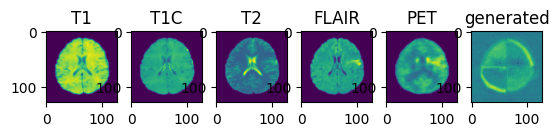

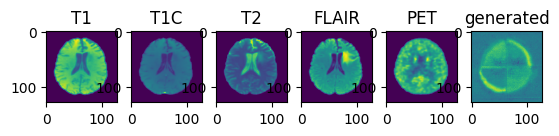

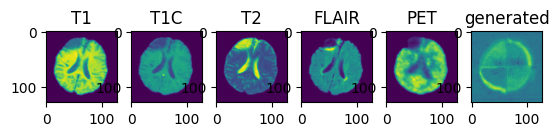

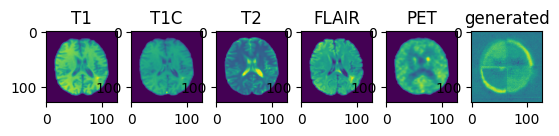

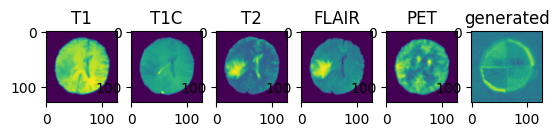

validation avg MS-SSIM: 0.3845 , train avg MS-SSIM: 0.3672
----------
epoch 281/400


Epoch :   0%|                                            | 0/24 [00:00<?, ?it/s]

Epoch :   4%|█▍                                 | 1/24 [01:49<41:56, 109.43s/it]

Epoch :   8%|███                                 | 2/24 [01:51<16:56, 46.20s/it]

Epoch :  12%|████▌                               | 3/24 [01:53<09:12, 26.31s/it]

Epoch :  17%|██████                              | 4/24 [01:56<05:36, 16.81s/it]

Epoch :  21%|███████▌                            | 5/24 [01:58<03:39, 11.55s/it]

Epoch :  25%|█████████                           | 6/24 [02:00<02:30,  8.37s/it]

Epoch :  29%|██████████▌                         | 7/24 [02:02<01:46,  6.29s/it]

Epoch :  33%|████████████                        | 8/24 [02:04<01:19,  4.95s/it]

Epoch :  38%|█████████████▌                      | 9/24 [02:06<01:01,  4.10s/it]

Epoch :  42%|██████████████▌                    | 10/24 [02:09<00:48,  3.49s/it]

Epoch :  46%|████████████████                   | 11/24 [02:11<00:42,  3.24s/it]

Epoch :  50%|█████████████████▌                 | 12/24 [02:13<00:33,  2.83s/it]

Epoch :  54%|██████████████████▉                | 13/24 [02:15<00:28,  2.56s/it]

Epoch :  58%|████████████████████▍              | 14/24 [02:17<00:23,  2.37s/it]

Epoch :  62%|█████████████████████▉             | 15/24 [02:19<00:20,  2.31s/it]

Epoch :  67%|███████████████████████▎           | 16/24 [02:21<00:18,  2.30s/it]

Epoch :  71%|████████████████████████▊          | 17/24 [02:24<00:16,  2.32s/it]

Epoch :  75%|██████████████████████████▎        | 18/24 [02:26<00:13,  2.26s/it]

Epoch :  79%|███████████████████████████▋       | 19/24 [02:28<00:11,  2.26s/it]

Epoch :  83%|█████████████████████████████▏     | 20/24 [02:32<00:10,  2.71s/it]

Epoch :  88%|██████████████████████████████▋    | 21/24 [02:34<00:07,  2.58s/it]

Epoch :  92%|████████████████████████████████   | 22/24 [02:36<00:04,  2.45s/it]

Epoch :  96%|█████████████████████████████████▌ | 23/24 [02:39<00:02,  2.45s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:40<00:00,  2.06s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:44<00:00,  6.87s/it]

----------
epoch 282/400


Epoch :   0%|                                            | 0/24 [00:00<?, ?it/s]

Epoch :   4%|█▍                                 | 1/24 [01:50<42:26, 110.71s/it]

Epoch :   8%|███                                 | 2/24 [01:52<17:09, 46.80s/it]

Epoch :  12%|████▌                               | 3/24 [01:54<09:13, 26.36s/it]

Epoch :  17%|██████                              | 4/24 [01:57<05:39, 16.98s/it]

Epoch :  21%|███████▌                            | 5/24 [01:59<03:42, 11.71s/it]

Epoch :  25%|█████████                           | 6/24 [02:01<02:32,  8.47s/it]

Epoch :  29%|██████████▌                         | 7/24 [02:04<01:48,  6.39s/it]

Epoch :  33%|████████████                        | 8/24 [02:06<01:20,  5.01s/it]

Epoch :  38%|█████████████▌                      | 9/24 [02:08<01:01,  4.12s/it]

Epoch :  42%|██████████████▌                    | 10/24 [02:10<00:48,  3.49s/it]

Epoch :  46%|████████████████                   | 11/24 [02:12<00:39,  3.07s/it]

Epoch :  50%|█████████████████▌                 | 12/24 [02:14<00:33,  2.83s/it]

Epoch :  54%|██████████████████▉                | 13/24 [02:16<00:28,  2.59s/it]

Epoch :  58%|████████████████████▍              | 14/24 [02:18<00:24,  2.40s/it]

Epoch :  62%|█████████████████████▉             | 15/24 [02:20<00:20,  2.28s/it]

Epoch :  67%|███████████████████████▎           | 16/24 [02:22<00:18,  2.26s/it]

Epoch :  71%|████████████████████████▊          | 17/24 [02:25<00:15,  2.22s/it]

Epoch :  75%|██████████████████████████▎        | 18/24 [02:27<00:13,  2.23s/it]

Epoch :  79%|███████████████████████████▋       | 19/24 [02:29<00:11,  2.23s/it]

Epoch :  83%|█████████████████████████████▏     | 20/24 [02:31<00:08,  2.20s/it]

Epoch :  88%|██████████████████████████████▋    | 21/24 [02:34<00:06,  2.28s/it]

Epoch :  92%|████████████████████████████████   | 22/24 [02:36<00:04,  2.22s/it]

Epoch :  96%|█████████████████████████████████▌ | 23/24 [02:38<00:02,  2.16s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:39<00:00,  1.84s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:43<00:00,  6.82s/it]

----------
epoch 283/400


Epoch :   0%|                                            | 0/24 [00:00<?, ?it/s]

Epoch :   4%|█▍                                 | 1/24 [01:52<42:56, 112.03s/it]

Epoch :   8%|███                                 | 2/24 [01:54<17:25, 47.53s/it]

Epoch :  12%|████▌                               | 3/24 [01:56<09:24, 26.90s/it]

Epoch :  17%|██████                              | 4/24 [01:58<05:42, 17.11s/it]

Epoch :  21%|███████▌                            | 5/24 [02:00<03:42, 11.69s/it]

Epoch :  25%|█████████                           | 6/24 [02:03<02:35,  8.65s/it]

Epoch :  29%|██████████▌                         | 7/24 [02:05<01:51,  6.55s/it]

Epoch :  33%|████████████                        | 8/24 [02:07<01:21,  5.11s/it]

Epoch :  38%|█████████████▌                      | 9/24 [02:09<01:01,  4.13s/it]

Epoch :  42%|██████████████▌                    | 10/24 [02:11<00:48,  3.46s/it]

Epoch :  46%|████████████████                   | 11/24 [02:13<00:39,  3.01s/it]

Epoch :  50%|█████████████████▌                 | 12/24 [02:16<00:33,  2.76s/it]

Epoch :  54%|██████████████████▉                | 13/24 [02:18<00:28,  2.58s/it]

Epoch :  58%|████████████████████▍              | 14/24 [02:20<00:25,  2.58s/it]

Epoch :  62%|█████████████████████▉             | 15/24 [02:22<00:21,  2.39s/it]

Epoch :  67%|███████████████████████▎           | 16/24 [02:24<00:18,  2.29s/it]

Epoch :  71%|████████████████████████▊          | 17/24 [02:26<00:15,  2.25s/it]

Epoch :  75%|██████████████████████████▎        | 18/24 [02:29<00:13,  2.26s/it]

Epoch :  79%|███████████████████████████▋       | 19/24 [02:31<00:11,  2.29s/it]

Epoch :  83%|█████████████████████████████▏     | 20/24 [02:33<00:09,  2.27s/it]

Epoch :  88%|██████████████████████████████▋    | 21/24 [02:36<00:06,  2.24s/it]

Epoch :  92%|████████████████████████████████   | 22/24 [02:38<00:04,  2.33s/it]

Epoch :  96%|█████████████████████████████████▌ | 23/24 [02:40<00:02,  2.31s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:41<00:00,  1.97s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:46<00:00,  6.94s/it]

----------
epoch 284/400


Epoch :   0%|                                            | 0/24 [00:00<?, ?it/s]

Epoch :   4%|█▍                                 | 1/24 [01:55<44:16, 115.49s/it]

Epoch :   8%|███                                 | 2/24 [01:57<17:55, 48.89s/it]

Epoch :  12%|████▌                               | 3/24 [01:59<09:38, 27.57s/it]

Epoch :  17%|██████                              | 4/24 [02:02<05:51, 17.56s/it]

Epoch :  21%|███████▌                            | 5/24 [02:04<03:49, 12.05s/it]

Epoch :  25%|█████████                           | 6/24 [02:06<02:37,  8.73s/it]

Epoch :  29%|██████████▌                         | 7/24 [02:09<01:54,  6.76s/it]

Epoch :  33%|████████████                        | 8/24 [02:11<01:24,  5.26s/it]

Epoch :  38%|█████████████▌                      | 9/24 [02:13<01:03,  4.24s/it]

Epoch :  42%|██████████████▌                    | 10/24 [02:15<00:49,  3.54s/it]

Epoch :  46%|████████████████                   | 11/24 [02:17<00:39,  3.06s/it]

Epoch :  50%|█████████████████▌                 | 12/24 [02:19<00:32,  2.73s/it]

Epoch :  54%|██████████████████▉                | 13/24 [02:21<00:27,  2.49s/it]

Epoch :  58%|████████████████████▍              | 14/24 [02:23<00:23,  2.36s/it]

Epoch :  62%|█████████████████████▉             | 15/24 [02:25<00:21,  2.37s/it]

Epoch :  67%|███████████████████████▎           | 16/24 [02:27<00:18,  2.26s/it]

Epoch :  71%|████████████████████████▊          | 17/24 [02:29<00:15,  2.16s/it]

Epoch :  75%|██████████████████████████▎        | 18/24 [02:31<00:12,  2.07s/it]

Epoch :  79%|███████████████████████████▋       | 19/24 [02:33<00:10,  2.01s/it]

Epoch :  83%|█████████████████████████████▏     | 20/24 [02:35<00:07,  2.00s/it]

Epoch :  88%|██████████████████████████████▋    | 21/24 [02:37<00:05,  1.99s/it]

Epoch :  92%|████████████████████████████████   | 22/24 [02:39<00:03,  1.97s/it]

Epoch :  96%|█████████████████████████████████▌ | 23/24 [02:41<00:02,  2.01s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:42<00:00,  1.72s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:46<00:00,  6.92s/it]

----------
epoch 285/400


Epoch :   0%|                                            | 0/24 [00:00<?, ?it/s]

Epoch :   4%|█▍                                 | 1/24 [01:51<42:55, 111.97s/it]

Epoch :   8%|███                                 | 2/24 [01:53<17:19, 47.26s/it]

Epoch :  12%|████▌                               | 3/24 [01:56<09:19, 26.63s/it]

Epoch :  17%|██████                              | 4/24 [01:58<05:38, 16.95s/it]

Epoch :  21%|███████▌                            | 5/24 [02:00<03:39, 11.55s/it]

Epoch :  25%|█████████                           | 6/24 [02:02<02:29,  8.31s/it]

Epoch :  29%|██████████▌                         | 7/24 [02:04<01:46,  6.26s/it]

Epoch :  33%|████████████                        | 8/24 [02:06<01:20,  5.02s/it]

Epoch :  38%|█████████████▌                      | 9/24 [02:08<01:00,  4.05s/it]

Epoch :  42%|██████████████▌                    | 10/24 [02:10<00:47,  3.39s/it]

Epoch :  46%|████████████████                   | 11/24 [02:12<00:38,  2.97s/it]

Epoch :  50%|█████████████████▌                 | 12/24 [02:14<00:32,  2.67s/it]

Epoch :  54%|██████████████████▉                | 13/24 [02:16<00:26,  2.43s/it]

Epoch :  58%|████████████████████▍              | 14/24 [02:18<00:23,  2.32s/it]

Epoch :  62%|█████████████████████▉             | 15/24 [02:20<00:20,  2.27s/it]

Epoch :  67%|███████████████████████▎           | 16/24 [02:22<00:18,  2.26s/it]

Epoch :  71%|████████████████████████▊          | 17/24 [02:25<00:16,  2.38s/it]

Epoch :  75%|██████████████████████████▎        | 18/24 [02:27<00:14,  2.36s/it]

Epoch :  79%|███████████████████████████▋       | 19/24 [02:29<00:11,  2.29s/it]

Epoch :  83%|█████████████████████████████▏     | 20/24 [02:31<00:08,  2.23s/it]

Epoch :  88%|██████████████████████████████▋    | 21/24 [02:33<00:06,  2.17s/it]

Epoch :  92%|████████████████████████████████   | 22/24 [02:36<00:04,  2.19s/it]

Epoch :  96%|█████████████████████████████████▌ | 23/24 [02:38<00:02,  2.22s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:39<00:00,  1.88s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:43<00:00,  6.83s/it]

----------
epoch 286/400


Epoch :   0%|                                            | 0/24 [00:00<?, ?it/s]

Epoch :   4%|█▍                                 | 1/24 [01:47<41:23, 107.99s/it]

Epoch :   8%|███                                 | 2/24 [01:49<16:42, 45.58s/it]

Epoch :  12%|████▌                               | 3/24 [01:51<08:58, 25.66s/it]

Epoch :  17%|██████                              | 4/24 [01:54<05:28, 16.44s/it]

Epoch :  21%|███████▌                            | 5/24 [01:56<03:33, 11.22s/it]

Epoch :  25%|█████████                           | 6/24 [01:58<02:26,  8.15s/it]

Epoch :  29%|██████████▌                         | 7/24 [02:00<01:45,  6.23s/it]

Epoch :  33%|████████████                        | 8/24 [02:02<01:19,  4.96s/it]

Epoch :  38%|█████████████▌                      | 9/24 [02:05<01:01,  4.13s/it]

Epoch :  42%|██████████████▌                    | 10/24 [02:07<00:51,  3.70s/it]

Epoch :  46%|████████████████                   | 11/24 [02:10<00:42,  3.28s/it]

Epoch :  50%|█████████████████▌                 | 12/24 [02:12<00:35,  2.93s/it]

Epoch :  54%|██████████████████▉                | 13/24 [02:14<00:29,  2.64s/it]

Epoch :  58%|████████████████████▍              | 14/24 [02:16<00:24,  2.43s/it]

Epoch :  62%|█████████████████████▉             | 15/24 [02:18<00:20,  2.32s/it]

Epoch :  67%|███████████████████████▎           | 16/24 [02:20<00:17,  2.24s/it]

Epoch :  71%|████████████████████████▊          | 17/24 [02:22<00:15,  2.19s/it]

Epoch :  75%|██████████████████████████▎        | 18/24 [02:24<00:13,  2.22s/it]

Epoch :  79%|███████████████████████████▋       | 19/24 [02:26<00:11,  2.21s/it]

Epoch :  83%|█████████████████████████████▏     | 20/24 [02:29<00:08,  2.20s/it]

Epoch :  88%|██████████████████████████████▋    | 21/24 [02:31<00:06,  2.22s/it]

Epoch :  92%|████████████████████████████████   | 22/24 [02:33<00:04,  2.20s/it]

Epoch :  96%|█████████████████████████████████▌ | 23/24 [02:35<00:02,  2.17s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:36<00:00,  1.86s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:41<00:00,  6.72s/it]

----------
epoch 287/400


Epoch :   0%|                                            | 0/24 [00:00<?, ?it/s]

Epoch :   4%|█▍                                 | 1/24 [01:56<44:32, 116.21s/it]

Epoch :   8%|███                                 | 2/24 [01:58<18:00, 49.13s/it]

Epoch :  12%|████▌                               | 3/24 [02:00<09:45, 27.88s/it]

Epoch :  17%|██████                              | 4/24 [02:03<05:53, 17.67s/it]

Epoch :  21%|███████▌                            | 5/24 [02:05<03:48, 12.05s/it]

Epoch :  25%|█████████                           | 6/24 [02:07<02:36,  8.70s/it]

Epoch :  29%|██████████▌                         | 7/24 [02:09<01:50,  6.52s/it]

Epoch :  33%|████████████                        | 8/24 [02:11<01:21,  5.10s/it]

Epoch :  38%|█████████████▌                      | 9/24 [02:13<01:02,  4.14s/it]

Epoch :  42%|██████████████▌                    | 10/24 [02:15<00:49,  3.51s/it]

Epoch :  46%|████████████████                   | 11/24 [02:18<00:42,  3.23s/it]

Epoch :  50%|█████████████████▌                 | 12/24 [02:20<00:34,  2.85s/it]

Epoch :  54%|██████████████████▉                | 13/24 [02:22<00:28,  2.58s/it]

Epoch :  58%|████████████████████▍              | 14/24 [02:24<00:24,  2.45s/it]

Epoch :  62%|█████████████████████▉             | 15/24 [02:26<00:20,  2.32s/it]

Epoch :  67%|███████████████████████▎           | 16/24 [02:28<00:18,  2.26s/it]

Epoch :  71%|████████████████████████▊          | 17/24 [02:30<00:15,  2.25s/it]

Epoch :  75%|██████████████████████████▎        | 18/24 [02:32<00:13,  2.20s/it]

Epoch :  79%|███████████████████████████▋       | 19/24 [02:35<00:11,  2.30s/it]

Epoch :  83%|█████████████████████████████▏     | 20/24 [02:37<00:09,  2.28s/it]

Epoch :  88%|██████████████████████████████▋    | 21/24 [02:39<00:06,  2.20s/it]

Epoch :  92%|████████████████████████████████   | 22/24 [02:41<00:04,  2.19s/it]

Epoch :  96%|█████████████████████████████████▌ | 23/24 [02:43<00:02,  2.20s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:44<00:00,  1.88s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:49<00:00,  7.06s/it]

----------
epoch 288/400


Epoch :   0%|                                            | 0/24 [00:00<?, ?it/s]

Epoch :   4%|█▍                                 | 1/24 [01:51<42:55, 111.96s/it]

Epoch :   8%|███                                 | 2/24 [01:54<17:22, 47.37s/it]

Epoch :  12%|████▌                               | 3/24 [01:56<09:20, 26.68s/it]

Epoch :  17%|██████                              | 4/24 [01:58<05:43, 17.17s/it]

Epoch :  21%|███████▌                            | 5/24 [02:00<03:42, 11.71s/it]

Epoch :  25%|█████████                           | 6/24 [02:03<02:32,  8.48s/it]

Epoch :  29%|██████████▌                         | 7/24 [02:05<01:48,  6.39s/it]

Epoch :  33%|████████████                        | 8/24 [02:07<01:19,  4.99s/it]

Epoch :  38%|█████████████▌                      | 9/24 [02:09<01:01,  4.10s/it]

Epoch :  42%|██████████████▌                    | 10/24 [02:11<00:48,  3.47s/it]

Epoch :  46%|████████████████                   | 11/24 [02:13<00:39,  3.06s/it]

Epoch :  50%|█████████████████▌                 | 12/24 [02:15<00:33,  2.78s/it]

Epoch :  54%|██████████████████▉                | 13/24 [02:17<00:29,  2.68s/it]

Epoch :  58%|████████████████████▍              | 14/24 [02:20<00:24,  2.49s/it]

Epoch :  62%|█████████████████████▉             | 15/24 [02:22<00:21,  2.35s/it]

Epoch :  67%|███████████████████████▎           | 16/24 [02:24<00:18,  2.27s/it]

Epoch :  71%|████████████████████████▊          | 17/24 [02:26<00:15,  2.25s/it]

Epoch :  75%|██████████████████████████▎        | 18/24 [02:28<00:13,  2.21s/it]

Epoch :  79%|███████████████████████████▋       | 19/24 [02:30<00:10,  2.13s/it]

Epoch :  83%|█████████████████████████████▏     | 20/24 [02:32<00:08,  2.14s/it]

Epoch :  88%|██████████████████████████████▋    | 21/24 [02:35<00:06,  2.25s/it]

Epoch :  92%|████████████████████████████████   | 22/24 [02:37<00:04,  2.26s/it]

Epoch :  96%|█████████████████████████████████▌ | 23/24 [02:39<00:02,  2.26s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:40<00:00,  1.91s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:45<00:00,  6.88s/it]

----------
epoch 289/400


Epoch :   0%|                                            | 0/24 [00:00<?, ?it/s]

Epoch :   4%|█▍                                 | 1/24 [01:50<42:16, 110.30s/it]

Epoch :   8%|███                                 | 2/24 [01:52<17:05, 46.61s/it]

Epoch :  12%|████▌                               | 3/24 [01:54<09:11, 26.26s/it]

Epoch :  17%|██████                              | 4/24 [01:56<05:36, 16.81s/it]

Epoch :  21%|███████▌                            | 5/24 [01:58<03:39, 11.55s/it]

Epoch :  25%|█████████                           | 6/24 [02:01<02:32,  8.49s/it]

Epoch :  29%|██████████▌                         | 7/24 [02:03<01:49,  6.42s/it]

Epoch :  33%|████████████                        | 8/24 [02:05<01:20,  5.02s/it]

Epoch :  38%|█████████████▌                      | 9/24 [02:07<01:01,  4.08s/it]

Epoch :  42%|██████████████▌                    | 10/24 [02:09<00:48,  3.43s/it]

Epoch :  46%|████████████████                   | 11/24 [02:11<00:38,  2.98s/it]

Epoch :  50%|█████████████████▌                 | 12/24 [02:13<00:32,  2.68s/it]

Epoch :  54%|██████████████████▉                | 13/24 [02:15<00:27,  2.50s/it]

Epoch :  58%|████████████████████▍              | 14/24 [02:18<00:25,  2.52s/it]

Epoch :  62%|█████████████████████▉             | 15/24 [02:20<00:21,  2.40s/it]

Epoch :  67%|███████████████████████▎           | 16/24 [02:22<00:18,  2.30s/it]

Epoch :  71%|████████████████████████▊          | 17/24 [02:24<00:15,  2.21s/it]

Epoch :  75%|██████████████████████████▎        | 18/24 [02:26<00:13,  2.20s/it]

Epoch :  79%|███████████████████████████▋       | 19/24 [02:28<00:10,  2.15s/it]

Epoch :  83%|█████████████████████████████▏     | 20/24 [02:30<00:08,  2.15s/it]

Epoch :  88%|██████████████████████████████▋    | 21/24 [02:32<00:06,  2.16s/it]

Epoch :  92%|████████████████████████████████   | 22/24 [02:35<00:04,  2.14s/it]

Epoch :  96%|█████████████████████████████████▌ | 23/24 [02:37<00:02,  2.35s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:39<00:00,  1.99s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:43<00:00,  6.81s/it]

----------
epoch 290/400


Epoch :   0%|                                            | 0/24 [00:00<?, ?it/s]

Epoch :   4%|█▍                                 | 1/24 [01:53<43:21, 113.10s/it]

Epoch :   8%|███                                 | 2/24 [01:55<17:30, 47.76s/it]

Epoch :  12%|████▌                               | 3/24 [01:57<09:24, 26.89s/it]

Epoch :  17%|██████                              | 4/24 [01:59<05:40, 17.03s/it]

Epoch :  21%|███████▌                            | 5/24 [02:01<03:40, 11.58s/it]

Epoch :  25%|█████████                           | 6/24 [02:02<02:29,  8.29s/it]

Epoch :  29%|██████████▌                         | 7/24 [02:05<01:47,  6.32s/it]

Epoch :  33%|████████████                        | 8/24 [02:07<01:19,  4.96s/it]

Epoch :  38%|█████████████▌                      | 9/24 [02:09<01:00,  4.05s/it]

Epoch :  42%|██████████████▌                    | 10/24 [02:11<00:47,  3.40s/it]

Epoch :  46%|████████████████                   | 11/24 [02:13<00:39,  3.01s/it]

Epoch :  50%|█████████████████▌                 | 12/24 [02:15<00:32,  2.72s/it]

Epoch :  54%|██████████████████▉                | 13/24 [02:17<00:27,  2.52s/it]

Epoch :  58%|████████████████████▍              | 14/24 [02:19<00:23,  2.38s/it]

Epoch :  62%|█████████████████████▉             | 15/24 [02:21<00:20,  2.28s/it]

Epoch :  67%|███████████████████████▎           | 16/24 [02:23<00:17,  2.18s/it]

Epoch :  71%|████████████████████████▊          | 17/24 [02:25<00:14,  2.11s/it]

Epoch :  75%|██████████████████████████▎        | 18/24 [02:27<00:12,  2.05s/it]

Epoch :  79%|███████████████████████████▋       | 19/24 [02:29<00:09,  2.00s/it]

Epoch :  83%|█████████████████████████████▏     | 20/24 [02:31<00:08,  2.03s/it]

Epoch :  88%|██████████████████████████████▋    | 21/24 [02:33<00:06,  2.02s/it]

Epoch :  92%|████████████████████████████████   | 22/24 [02:35<00:04,  2.03s/it]

Epoch :  96%|█████████████████████████████████▌ | 23/24 [02:38<00:02,  2.23s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:39<00:00,  1.93s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:43<00:00,  6.82s/it]

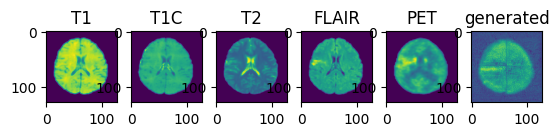

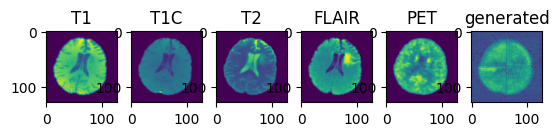

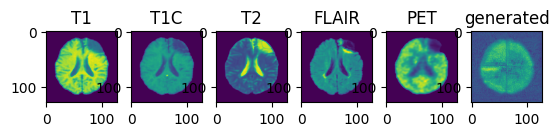

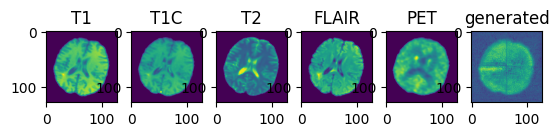

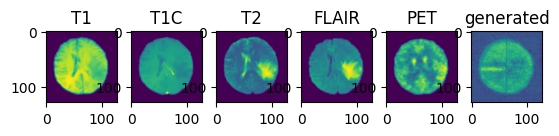

validation avg MS-SSIM: 0.4652 , train avg MS-SSIM: 0.4400
----------
epoch 291/400


Epoch :   0%|                                            | 0/24 [00:00<?, ?it/s]

Epoch :   4%|█▍                                 | 1/24 [01:55<44:09, 115.21s/it]

Epoch :   8%|███                                 | 2/24 [01:57<17:52, 48.75s/it]

Epoch :  12%|████▌                               | 3/24 [01:59<09:37, 27.49s/it]

Epoch :  17%|██████                              | 4/24 [02:01<05:49, 17.49s/it]

Epoch :  21%|███████▌                            | 5/24 [02:04<03:51, 12.16s/it]

Epoch :  25%|█████████                           | 6/24 [02:06<02:37,  8.72s/it]

Epoch :  29%|██████████▌                         | 7/24 [02:08<01:50,  6.48s/it]

Epoch :  33%|████████████                        | 8/24 [02:10<01:20,  5.04s/it]

Epoch :  38%|█████████████▌                      | 9/24 [02:12<01:01,  4.09s/it]

Epoch :  42%|██████████████▌                    | 10/24 [02:14<00:48,  3.48s/it]

Epoch :  46%|████████████████                   | 11/24 [02:16<00:40,  3.12s/it]

Epoch :  50%|█████████████████▌                 | 12/24 [02:19<00:34,  2.85s/it]

Epoch :  54%|██████████████████▉                | 13/24 [02:21<00:28,  2.61s/it]

Epoch :  58%|████████████████████▍              | 14/24 [02:23<00:25,  2.55s/it]

Epoch :  62%|█████████████████████▉             | 15/24 [02:25<00:21,  2.40s/it]

Epoch :  67%|███████████████████████▎           | 16/24 [02:27<00:18,  2.33s/it]

Epoch :  71%|████████████████████████▊          | 17/24 [02:29<00:16,  2.30s/it]

Epoch :  75%|██████████████████████████▎        | 18/24 [02:31<00:13,  2.18s/it]

Epoch :  79%|███████████████████████████▋       | 19/24 [02:33<00:10,  2.10s/it]

Epoch :  83%|█████████████████████████████▏     | 20/24 [02:35<00:08,  2.06s/it]

Epoch :  88%|██████████████████████████████▋    | 21/24 [02:37<00:06,  2.05s/it]

Epoch :  92%|████████████████████████████████   | 22/24 [02:40<00:04,  2.19s/it]

Epoch :  96%|█████████████████████████████████▌ | 23/24 [02:42<00:02,  2.12s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:43<00:00,  1.80s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:47<00:00,  6.98s/it]

----------
epoch 292/400


Epoch :   0%|                                            | 0/24 [00:00<?, ?it/s]

Epoch :   4%|█▍                                 | 1/24 [01:56<44:38, 116.46s/it]

Epoch :   8%|███                                 | 2/24 [01:58<18:04, 49.29s/it]

Epoch :  12%|████▌                               | 3/24 [02:00<09:41, 27.71s/it]

Epoch :  17%|██████                              | 4/24 [02:02<05:51, 17.56s/it]

Epoch :  21%|███████▌                            | 5/24 [02:04<03:48, 12.01s/it]

Epoch :  25%|█████████                           | 6/24 [02:06<02:34,  8.61s/it]

Epoch :  29%|██████████▌                         | 7/24 [02:09<01:55,  6.77s/it]

Epoch :  33%|████████████                        | 8/24 [02:12<01:26,  5.39s/it]

Epoch :  38%|█████████████▌                      | 9/24 [02:14<01:06,  4.43s/it]

Epoch :  42%|██████████████▌                    | 10/24 [02:16<00:52,  3.77s/it]

Epoch :  46%|████████████████                   | 11/24 [02:19<00:42,  3.27s/it]

Epoch :  50%|█████████████████▌                 | 12/24 [02:21<00:34,  2.89s/it]

Epoch :  54%|██████████████████▉                | 13/24 [02:23<00:28,  2.60s/it]

Epoch :  58%|████████████████████▍              | 14/24 [02:25<00:24,  2.40s/it]

Epoch :  62%|█████████████████████▉             | 15/24 [02:27<00:21,  2.41s/it]

Epoch :  67%|███████████████████████▎           | 16/24 [02:29<00:19,  2.39s/it]

Epoch :  71%|████████████████████████▊          | 17/24 [02:31<00:16,  2.34s/it]

Epoch :  75%|██████████████████████████▎        | 18/24 [02:34<00:13,  2.26s/it]

Epoch :  79%|███████████████████████████▋       | 19/24 [02:36<00:11,  2.23s/it]

Epoch :  83%|█████████████████████████████▏     | 20/24 [02:38<00:08,  2.16s/it]

Epoch :  88%|██████████████████████████████▋    | 21/24 [02:40<00:06,  2.13s/it]

Epoch :  92%|████████████████████████████████   | 22/24 [02:42<00:04,  2.08s/it]

Epoch :  96%|█████████████████████████████████▌ | 23/24 [02:44<00:02,  2.05s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:45<00:00,  1.84s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:49<00:00,  7.07s/it]

----------
epoch 293/400


Epoch :   0%|                                            | 0/24 [00:00<?, ?it/s]

Epoch :   4%|█▍                                 | 1/24 [01:54<43:48, 114.28s/it]

Epoch :   8%|███                                 | 2/24 [01:56<17:43, 48.35s/it]

Epoch :  12%|████▌                               | 3/24 [01:58<09:34, 27.35s/it]

Epoch :  17%|██████                              | 4/24 [02:00<05:47, 17.37s/it]

Epoch :  21%|███████▌                            | 5/24 [02:03<03:46, 11.90s/it]

Epoch :  25%|█████████                           | 6/24 [02:05<02:35,  8.63s/it]

Epoch :  29%|██████████▌                         | 7/24 [02:07<01:51,  6.54s/it]

Epoch :  33%|████████████                        | 8/24 [02:10<01:25,  5.33s/it]

Epoch :  38%|█████████████▌                      | 9/24 [02:12<01:05,  4.37s/it]

Epoch :  42%|██████████████▌                    | 10/24 [02:14<00:51,  3.69s/it]

Epoch :  46%|████████████████                   | 11/24 [02:16<00:41,  3.22s/it]

Epoch :  50%|█████████████████▌                 | 12/24 [02:19<00:34,  2.92s/it]

Epoch :  54%|██████████████████▉                | 13/24 [02:21<00:29,  2.73s/it]

Epoch :  58%|████████████████████▍              | 14/24 [02:23<00:25,  2.53s/it]

Epoch :  62%|█████████████████████▉             | 15/24 [02:25<00:21,  2.41s/it]

Epoch :  67%|███████████████████████▎           | 16/24 [02:27<00:19,  2.38s/it]

Epoch :  71%|████████████████████████▊          | 17/24 [02:30<00:16,  2.42s/it]

Epoch :  75%|██████████████████████████▎        | 18/24 [02:32<00:13,  2.30s/it]

Epoch :  79%|███████████████████████████▋       | 19/24 [02:34<00:11,  2.24s/it]

Epoch :  83%|█████████████████████████████▏     | 20/24 [02:36<00:08,  2.17s/it]

Epoch :  88%|██████████████████████████████▋    | 21/24 [02:38<00:06,  2.11s/it]

Epoch :  92%|████████████████████████████████   | 22/24 [02:40<00:04,  2.08s/it]

Epoch :  96%|█████████████████████████████████▌ | 23/24 [02:43<00:02,  2.18s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:44<00:00,  1.89s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:48<00:00,  7.03s/it]

----------
epoch 294/400


Epoch :   0%|                                            | 0/24 [00:00<?, ?it/s]

Epoch :   4%|█▍                                 | 1/24 [01:57<45:08, 117.75s/it]

Epoch :   8%|███                                 | 2/24 [01:59<18:14, 49.73s/it]

Epoch :  12%|████▌                               | 3/24 [02:01<09:47, 27.95s/it]

Epoch :  17%|██████                              | 4/24 [02:04<05:54, 17.74s/it]

Epoch :  21%|███████▌                            | 5/24 [02:06<03:49, 12.08s/it]

Epoch :  25%|█████████                           | 6/24 [02:08<02:36,  8.67s/it]

Epoch :  29%|██████████▌                         | 7/24 [02:10<01:51,  6.54s/it]

Epoch :  33%|████████████                        | 8/24 [02:12<01:21,  5.09s/it]

Epoch :  38%|█████████████▌                      | 9/24 [02:14<01:02,  4.16s/it]

Epoch :  42%|██████████████▌                    | 10/24 [02:17<00:52,  3.74s/it]

Epoch :  46%|████████████████                   | 11/24 [02:19<00:42,  3.29s/it]

Epoch :  50%|█████████████████▌                 | 12/24 [02:21<00:34,  2.88s/it]

Epoch :  54%|██████████████████▉                | 13/24 [02:23<00:29,  2.65s/it]

Epoch :  58%|████████████████████▍              | 14/24 [02:25<00:24,  2.49s/it]

Epoch :  62%|█████████████████████▉             | 15/24 [02:27<00:20,  2.31s/it]

Epoch :  67%|███████████████████████▎           | 16/24 [02:29<00:17,  2.20s/it]

Epoch :  71%|████████████████████████▊          | 17/24 [02:31<00:14,  2.13s/it]

Epoch :  75%|██████████████████████████▎        | 18/24 [02:34<00:13,  2.33s/it]

Epoch :  79%|███████████████████████████▋       | 19/24 [02:36<00:11,  2.28s/it]

Epoch :  83%|█████████████████████████████▏     | 20/24 [02:38<00:08,  2.17s/it]

Epoch :  88%|██████████████████████████████▋    | 21/24 [02:40<00:06,  2.10s/it]

Epoch :  92%|████████████████████████████████   | 22/24 [02:42<00:04,  2.02s/it]

Epoch :  96%|█████████████████████████████████▌ | 23/24 [02:43<00:01,  2.00s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:44<00:00,  1.71s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:49<00:00,  7.06s/it]

----------
epoch 295/400


Epoch :   0%|                                            | 0/24 [00:00<?, ?it/s]

Epoch :   4%|█▍                                 | 1/24 [01:55<44:25, 115.88s/it]

Epoch :   8%|███                                 | 2/24 [01:57<17:55, 48.89s/it]

Epoch :  12%|████▌                               | 3/24 [02:00<09:40, 27.63s/it]

Epoch :  17%|██████                              | 4/24 [02:02<05:49, 17.50s/it]

Epoch :  21%|███████▌                            | 5/24 [02:04<03:45, 11.86s/it]

Epoch :  25%|█████████                           | 6/24 [02:05<02:32,  8.48s/it]

Epoch :  29%|██████████▌                         | 7/24 [02:07<01:47,  6.33s/it]

Epoch :  33%|████████████                        | 8/24 [02:09<01:18,  4.91s/it]

Epoch :  38%|█████████████▌                      | 9/24 [02:11<00:59,  3.99s/it]

Epoch :  42%|██████████████▌                    | 10/24 [02:13<00:46,  3.35s/it]

Epoch :  46%|████████████████                   | 11/24 [02:15<00:39,  3.03s/it]

Epoch :  50%|█████████████████▌                 | 12/24 [02:17<00:32,  2.69s/it]

Epoch :  54%|██████████████████▉                | 13/24 [02:19<00:27,  2.49s/it]

Epoch :  58%|████████████████████▍              | 14/24 [02:21<00:23,  2.32s/it]

Epoch :  62%|█████████████████████▉             | 15/24 [02:23<00:19,  2.18s/it]

Epoch :  67%|███████████████████████▎           | 16/24 [02:25<00:16,  2.08s/it]

Epoch :  71%|████████████████████████▊          | 17/24 [02:27<00:14,  2.03s/it]

Epoch :  75%|██████████████████████████▎        | 18/24 [02:29<00:12,  2.04s/it]

Epoch :  79%|███████████████████████████▋       | 19/24 [02:31<00:10,  2.05s/it]

Epoch :  83%|█████████████████████████████▏     | 20/24 [02:34<00:08,  2.24s/it]

Epoch :  88%|██████████████████████████████▋    | 21/24 [02:36<00:06,  2.23s/it]

Epoch :  92%|████████████████████████████████   | 22/24 [02:38<00:04,  2.16s/it]

Epoch :  96%|█████████████████████████████████▌ | 23/24 [02:40<00:02,  2.13s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:41<00:00,  1.81s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:45<00:00,  6.91s/it]

----------
epoch 296/400


Epoch :   0%|                                            | 0/24 [00:00<?, ?it/s]

Epoch :   4%|█▍                                 | 1/24 [02:06<48:22, 126.19s/it]

Epoch :   8%|███                                 | 2/24 [02:08<19:29, 53.17s/it]

Epoch :  12%|████▌                               | 3/24 [02:10<10:30, 30.01s/it]

Epoch :  17%|██████                              | 4/24 [02:13<06:26, 19.33s/it]

Epoch :  21%|███████▌                            | 5/24 [02:15<04:09, 13.13s/it]

Epoch :  25%|█████████                           | 6/24 [02:18<02:49,  9.42s/it]

Epoch :  29%|██████████▌                         | 7/24 [02:20<01:59,  7.06s/it]

Epoch :  33%|████████████                        | 8/24 [02:22<01:29,  5.57s/it]

Epoch :  38%|█████████████▌                      | 9/24 [02:24<01:08,  4.57s/it]

Epoch :  42%|██████████████▌                    | 10/24 [02:27<00:54,  3.90s/it]

Epoch :  46%|████████████████                   | 11/24 [02:29<00:44,  3.42s/it]

Epoch :  50%|█████████████████▌                 | 12/24 [02:32<00:37,  3.13s/it]

Epoch :  54%|██████████████████▉                | 13/24 [02:34<00:33,  3.00s/it]

Epoch :  58%|████████████████████▍              | 14/24 [02:37<00:28,  2.80s/it]

Epoch :  62%|█████████████████████▉             | 15/24 [02:39<00:23,  2.63s/it]

Epoch :  67%|███████████████████████▎           | 16/24 [02:41<00:20,  2.50s/it]

Epoch :  71%|████████████████████████▊          | 17/24 [02:43<00:16,  2.42s/it]

Epoch :  75%|██████████████████████████▎        | 18/24 [02:45<00:13,  2.33s/it]

Epoch :  79%|███████████████████████████▋       | 19/24 [02:48<00:11,  2.26s/it]

Epoch :  83%|█████████████████████████████▏     | 20/24 [02:50<00:08,  2.20s/it]

Epoch :  88%|██████████████████████████████▋    | 21/24 [02:52<00:07,  2.38s/it]

Epoch :  92%|████████████████████████████████   | 22/24 [02:55<00:04,  2.31s/it]

Epoch :  96%|█████████████████████████████████▌ | 23/24 [02:57<00:02,  2.22s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:58<00:00,  1.87s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [03:02<00:00,  7.59s/it]

----------
epoch 297/400


Epoch :   0%|                                            | 0/24 [00:00<?, ?it/s]

Epoch :   4%|█▍                                 | 1/24 [01:50<42:22, 110.56s/it]

Epoch :   8%|███                                 | 2/24 [01:52<17:08, 46.77s/it]

Epoch :  12%|████▌                               | 3/24 [01:54<09:13, 26.37s/it]

Epoch :  17%|██████                              | 4/24 [01:56<05:35, 16.78s/it]

Epoch :  21%|███████▌                            | 5/24 [01:59<03:38, 11.52s/it]

Epoch :  25%|█████████                           | 6/24 [02:01<02:34,  8.58s/it]

Epoch :  29%|██████████▌                         | 7/24 [02:04<01:51,  6.55s/it]

Epoch :  33%|████████████                        | 8/24 [02:06<01:23,  5.20s/it]

Epoch :  38%|█████████████▌                      | 9/24 [02:08<01:04,  4.30s/it]

Epoch :  42%|██████████████▌                    | 10/24 [02:11<00:51,  3.70s/it]

Epoch :  46%|████████████████                   | 11/24 [02:13<00:42,  3.27s/it]

Epoch :  50%|█████████████████▌                 | 12/24 [02:15<00:35,  2.96s/it]

Epoch :  54%|██████████████████▉                | 13/24 [02:17<00:29,  2.71s/it]

Epoch :  58%|████████████████████▍              | 14/24 [02:20<00:25,  2.52s/it]

Epoch :  62%|█████████████████████▉             | 15/24 [02:22<00:22,  2.52s/it]

Epoch :  67%|███████████████████████▎           | 16/24 [02:24<00:19,  2.39s/it]

Epoch :  71%|████████████████████████▊          | 17/24 [02:26<00:16,  2.34s/it]

Epoch :  75%|██████████████████████████▎        | 18/24 [02:29<00:14,  2.35s/it]

Epoch :  79%|███████████████████████████▋       | 19/24 [02:31<00:11,  2.26s/it]

Epoch :  83%|█████████████████████████████▏     | 20/24 [02:33<00:08,  2.23s/it]

Epoch :  88%|██████████████████████████████▋    | 21/24 [02:35<00:06,  2.22s/it]

Epoch :  92%|████████████████████████████████   | 22/24 [02:37<00:04,  2.15s/it]

Epoch :  96%|█████████████████████████████████▌ | 23/24 [02:40<00:02,  2.24s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:41<00:00,  1.90s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:45<00:00,  6.91s/it]

----------
epoch 298/400


Epoch :   0%|                                            | 0/24 [00:00<?, ?it/s]

Epoch :   4%|█▍                                 | 1/24 [01:54<43:47, 114.25s/it]

Epoch :   8%|███                                 | 2/24 [01:56<17:41, 48.23s/it]

Epoch :  12%|████▌                               | 3/24 [01:58<09:30, 27.16s/it]

Epoch :  17%|██████                              | 4/24 [02:00<05:44, 17.23s/it]

Epoch :  21%|███████▌                            | 5/24 [02:02<03:42, 11.73s/it]

Epoch :  25%|█████████                           | 6/24 [02:04<02:32,  8.47s/it]

Epoch :  29%|██████████▌                         | 7/24 [02:06<01:49,  6.45s/it]

Epoch :  33%|████████████                        | 8/24 [02:09<01:23,  5.24s/it]

Epoch :  38%|█████████████▌                      | 9/24 [02:11<01:04,  4.30s/it]

Epoch :  42%|██████████████▌                    | 10/24 [02:13<00:50,  3.61s/it]

Epoch :  46%|████████████████                   | 11/24 [02:15<00:40,  3.12s/it]

Epoch :  50%|█████████████████▌                 | 12/24 [02:17<00:33,  2.78s/it]

Epoch :  54%|██████████████████▉                | 13/24 [02:19<00:28,  2.61s/it]

Epoch :  58%|████████████████████▍              | 14/24 [02:22<00:24,  2.46s/it]

Epoch :  62%|█████████████████████▉             | 15/24 [02:24<00:21,  2.39s/it]

Epoch :  67%|███████████████████████▎           | 16/24 [02:26<00:19,  2.42s/it]

Epoch :  71%|████████████████████████▊          | 17/24 [02:28<00:16,  2.29s/it]

Epoch :  75%|██████████████████████████▎        | 18/24 [02:30<00:13,  2.23s/it]

Epoch :  79%|███████████████████████████▋       | 19/24 [02:33<00:11,  2.25s/it]

Epoch :  83%|█████████████████████████████▏     | 20/24 [02:35<00:08,  2.25s/it]

Epoch :  88%|██████████████████████████████▋    | 21/24 [02:37<00:06,  2.21s/it]

Epoch :  92%|████████████████████████████████   | 22/24 [02:39<00:04,  2.18s/it]

Epoch :  96%|█████████████████████████████████▌ | 23/24 [02:41<00:02,  2.12s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:42<00:00,  1.79s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:46<00:00,  6.94s/it]

----------
epoch 299/400


Epoch :   0%|                                            | 0/24 [00:00<?, ?it/s]

Epoch :   4%|█▍                                 | 1/24 [01:55<44:16, 115.52s/it]

Epoch :   8%|███                                 | 2/24 [01:57<17:56, 48.92s/it]

Epoch :  12%|████▌                               | 3/24 [02:00<09:39, 27.61s/it]

Epoch :  17%|██████                              | 4/24 [02:02<05:52, 17.61s/it]

Epoch :  21%|███████▌                            | 5/24 [02:04<03:49, 12.09s/it]

Epoch :  25%|█████████                           | 6/24 [02:06<02:36,  8.72s/it]

Epoch :  29%|██████████▌                         | 7/24 [02:08<01:50,  6.51s/it]

Epoch :  33%|████████████                        | 8/24 [02:10<01:21,  5.11s/it]

Epoch :  38%|█████████████▌                      | 9/24 [02:13<01:04,  4.30s/it]

Epoch :  42%|██████████████▌                    | 10/24 [02:15<00:50,  3.59s/it]

Epoch :  46%|████████████████                   | 11/24 [02:17<00:40,  3.12s/it]

Epoch :  50%|█████████████████▌                 | 12/24 [02:19<00:32,  2.75s/it]

Epoch :  54%|██████████████████▉                | 13/24 [02:21<00:27,  2.49s/it]

Epoch :  58%|████████████████████▍              | 14/24 [02:23<00:23,  2.33s/it]

Epoch :  62%|█████████████████████▉             | 15/24 [02:25<00:20,  2.24s/it]

Epoch :  67%|███████████████████████▎           | 16/24 [02:27<00:17,  2.13s/it]

Epoch :  71%|████████████████████████▊          | 17/24 [02:29<00:15,  2.17s/it]

Epoch :  75%|██████████████████████████▎        | 18/24 [02:31<00:12,  2.13s/it]

Epoch :  79%|███████████████████████████▋       | 19/24 [02:33<00:10,  2.14s/it]

Epoch :  83%|█████████████████████████████▏     | 20/24 [02:35<00:08,  2.13s/it]

Epoch :  88%|██████████████████████████████▋    | 21/24 [02:37<00:06,  2.10s/it]

Epoch :  92%|████████████████████████████████   | 22/24 [02:39<00:04,  2.12s/it]

Epoch :  96%|█████████████████████████████████▌ | 23/24 [02:42<00:02,  2.12s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:43<00:00,  1.83s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:47<00:00,  6.98s/it]

----------
epoch 300/400


Epoch :   0%|                                            | 0/24 [00:00<?, ?it/s]

Epoch :   4%|█▍                                 | 1/24 [01:57<45:01, 117.44s/it]

Epoch :   8%|███                                 | 2/24 [01:59<18:13, 49.70s/it]

Epoch :  12%|████▌                               | 3/24 [02:01<09:46, 27.95s/it]

Epoch :  17%|██████                              | 4/24 [02:03<05:55, 17.76s/it]

Epoch :  21%|███████▌                            | 5/24 [02:06<03:50, 12.14s/it]

Epoch :  25%|█████████                           | 6/24 [02:08<02:37,  8.73s/it]

Epoch :  29%|██████████▌                         | 7/24 [02:10<01:50,  6.50s/it]

Epoch :  33%|████████████                        | 8/24 [02:12<01:21,  5.08s/it]

Epoch :  38%|█████████████▌                      | 9/24 [02:14<01:02,  4.17s/it]

Epoch :  42%|██████████████▌                    | 10/24 [02:16<00:50,  3.62s/it]

Epoch :  46%|████████████████                   | 11/24 [02:18<00:40,  3.09s/it]

Epoch :  50%|█████████████████▌                 | 12/24 [02:20<00:33,  2.77s/it]

Epoch :  54%|██████████████████▉                | 13/24 [02:22<00:28,  2.60s/it]

Epoch :  58%|████████████████████▍              | 14/24 [02:25<00:25,  2.52s/it]

Epoch :  62%|█████████████████████▉             | 15/24 [02:27<00:22,  2.48s/it]

Epoch :  67%|███████████████████████▎           | 16/24 [02:29<00:19,  2.41s/it]

Epoch :  71%|████████████████████████▊          | 17/24 [02:32<00:16,  2.42s/it]

Epoch :  75%|██████████████████████████▎        | 18/24 [02:35<00:15,  2.53s/it]

Epoch :  79%|███████████████████████████▋       | 19/24 [02:37<00:12,  2.44s/it]

Epoch :  83%|█████████████████████████████▏     | 20/24 [02:39<00:09,  2.33s/it]

Epoch :  88%|██████████████████████████████▋    | 21/24 [02:41<00:06,  2.24s/it]

Epoch :  92%|████████████████████████████████   | 22/24 [02:43<00:04,  2.23s/it]

Epoch :  96%|█████████████████████████████████▌ | 23/24 [02:45<00:02,  2.16s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:46<00:00,  1.82s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:51<00:00,  7.13s/it]

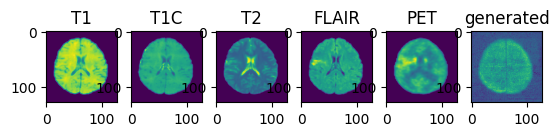

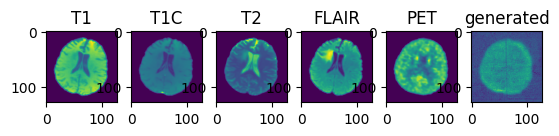

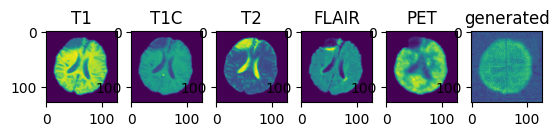

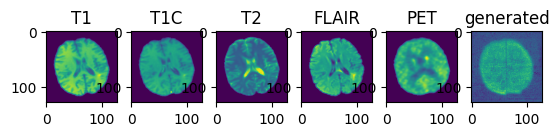

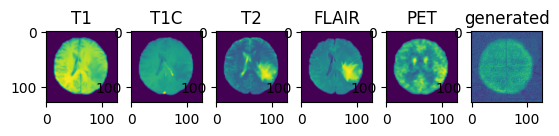

validation avg MS-SSIM: 0.4382 , train avg MS-SSIM: 0.4152
----------
epoch 301/400


Epoch :   0%|                                            | 0/24 [00:00<?, ?it/s]

Epoch :   4%|█▍                                 | 1/24 [01:53<43:20, 113.06s/it]

Epoch :   8%|███                                 | 2/24 [01:55<17:41, 48.24s/it]

Epoch :  12%|████▌                               | 3/24 [01:58<09:32, 27.28s/it]

Epoch :  17%|██████                              | 4/24 [02:00<05:47, 17.39s/it]

Epoch :  21%|███████▌                            | 5/24 [02:02<03:46, 11.90s/it]

Epoch :  25%|█████████                           | 6/24 [02:04<02:34,  8.58s/it]

Epoch :  29%|██████████▌                         | 7/24 [02:06<01:50,  6.48s/it]

Epoch :  33%|████████████                        | 8/24 [02:09<01:21,  5.09s/it]

Epoch :  38%|█████████████▌                      | 9/24 [02:11<01:03,  4.20s/it]

Epoch :  42%|██████████████▌                    | 10/24 [02:13<00:49,  3.52s/it]

Epoch :  46%|████████████████                   | 11/24 [02:15<00:42,  3.24s/it]

Epoch :  50%|█████████████████▌                 | 12/24 [02:18<00:35,  2.94s/it]

Epoch :  54%|██████████████████▉                | 13/24 [02:20<00:29,  2.69s/it]

Epoch :  58%|████████████████████▍              | 14/24 [02:22<00:25,  2.54s/it]

Epoch :  62%|█████████████████████▉             | 15/24 [02:24<00:21,  2.41s/it]

Epoch :  67%|███████████████████████▎           | 16/24 [02:26<00:18,  2.29s/it]

Epoch :  71%|████████████████████████▊          | 17/24 [02:28<00:15,  2.21s/it]

Epoch :  75%|██████████████████████████▎        | 18/24 [02:30<00:13,  2.17s/it]

Epoch :  79%|███████████████████████████▋       | 19/24 [02:33<00:11,  2.23s/it]

Epoch :  83%|█████████████████████████████▏     | 20/24 [02:35<00:08,  2.21s/it]

Epoch :  88%|██████████████████████████████▋    | 21/24 [02:37<00:06,  2.21s/it]

Epoch :  92%|████████████████████████████████   | 22/24 [02:39<00:04,  2.25s/it]

Epoch :  96%|█████████████████████████████████▌ | 23/24 [02:42<00:02,  2.25s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:43<00:00,  1.93s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:47<00:00,  6.99s/it]

----------
epoch 302/400


Epoch :   0%|                                            | 0/24 [00:00<?, ?it/s]

Epoch :   4%|█▍                                 | 1/24 [01:53<43:24, 113.23s/it]

Epoch :   8%|███                                 | 2/24 [01:55<17:34, 47.94s/it]

Epoch :  12%|████▌                               | 3/24 [01:57<09:27, 27.04s/it]

Epoch :  17%|██████                              | 4/24 [02:02<06:03, 18.15s/it]

Epoch :  21%|███████▌                            | 5/24 [02:04<03:55, 12.40s/it]

Epoch :  25%|█████████                           | 6/24 [02:06<02:40,  8.93s/it]

Epoch :  29%|██████████▌                         | 7/24 [02:08<01:54,  6.72s/it]

Epoch :  33%|████████████                        | 8/24 [02:10<01:23,  5.23s/it]

Epoch :  38%|█████████████▌                      | 9/24 [02:12<01:03,  4.24s/it]

Epoch :  42%|██████████████▌                    | 10/24 [02:14<00:49,  3.55s/it]

Epoch :  46%|████████████████                   | 11/24 [02:16<00:39,  3.07s/it]

Epoch :  50%|█████████████████▌                 | 12/24 [02:18<00:32,  2.74s/it]

Epoch :  54%|██████████████████▉                | 13/24 [02:21<00:29,  2.67s/it]

Epoch :  58%|████████████████████▍              | 14/24 [02:23<00:25,  2.52s/it]

Epoch :  62%|█████████████████████▉             | 15/24 [02:25<00:21,  2.40s/it]

Epoch :  67%|███████████████████████▎           | 16/24 [02:27<00:18,  2.32s/it]

Epoch :  71%|████████████████████████▊          | 17/24 [02:29<00:15,  2.25s/it]

Epoch :  75%|██████████████████████████▎        | 18/24 [02:32<00:13,  2.33s/it]

Epoch :  79%|███████████████████████████▋       | 19/24 [02:34<00:11,  2.35s/it]

Epoch :  83%|█████████████████████████████▏     | 20/24 [02:36<00:09,  2.25s/it]

Epoch :  88%|██████████████████████████████▋    | 21/24 [02:39<00:07,  2.39s/it]

Epoch :  92%|████████████████████████████████   | 22/24 [02:41<00:04,  2.37s/it]

Epoch :  96%|█████████████████████████████████▌ | 23/24 [02:43<00:02,  2.29s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:45<00:00,  1.94s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:49<00:00,  7.05s/it]

----------
epoch 303/400


Epoch :   0%|                                            | 0/24 [00:00<?, ?it/s]

Epoch :   4%|█▍                                 | 1/24 [01:49<42:01, 109.63s/it]

Epoch :   8%|███                                 | 2/24 [01:51<17:03, 46.51s/it]

Epoch :  12%|████▌                               | 3/24 [01:54<09:12, 26.31s/it]

Epoch :  17%|██████                              | 4/24 [01:56<05:35, 16.75s/it]

Epoch :  21%|███████▌                            | 5/24 [01:58<03:36, 11.42s/it]

Epoch :  25%|█████████                           | 6/24 [02:01<02:33,  8.55s/it]

Epoch :  29%|██████████▌                         | 7/24 [02:03<01:49,  6.43s/it]

Epoch :  33%|████████████                        | 8/24 [02:05<01:20,  5.04s/it]

Epoch :  38%|█████████████▌                      | 9/24 [02:07<01:01,  4.10s/it]

Epoch :  42%|██████████████▌                    | 10/24 [02:09<00:48,  3.49s/it]

Epoch :  46%|████████████████                   | 11/24 [02:11<00:40,  3.09s/it]

Epoch :  50%|█████████████████▌                 | 12/24 [02:13<00:33,  2.79s/it]

Epoch :  54%|██████████████████▉                | 13/24 [02:15<00:28,  2.55s/it]

Epoch :  58%|████████████████████▍              | 14/24 [02:18<00:25,  2.56s/it]

Epoch :  62%|█████████████████████▉             | 15/24 [02:20<00:21,  2.44s/it]

Epoch :  67%|███████████████████████▎           | 16/24 [02:22<00:18,  2.34s/it]

Epoch :  71%|████████████████████████▊          | 17/24 [02:24<00:16,  2.30s/it]

Epoch :  75%|██████████████████████████▎        | 18/24 [02:26<00:13,  2.24s/it]

Epoch :  79%|███████████████████████████▋       | 19/24 [02:29<00:10,  2.18s/it]

Epoch :  83%|█████████████████████████████▏     | 20/24 [02:30<00:08,  2.11s/it]

Epoch :  88%|██████████████████████████████▋    | 21/24 [02:32<00:06,  2.08s/it]

Epoch :  92%|████████████████████████████████   | 22/24 [02:34<00:04,  2.03s/it]

Epoch :  96%|█████████████████████████████████▌ | 23/24 [02:37<00:02,  2.14s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:38<00:00,  1.80s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:42<00:00,  6.76s/it]

----------
epoch 304/400


Epoch :   0%|                                            | 0/24 [00:00<?, ?it/s]

Epoch :   4%|█▍                                 | 1/24 [01:58<45:25, 118.51s/it]

Epoch :   8%|███                                 | 2/24 [02:00<18:21, 50.06s/it]

Epoch :  12%|████▌                               | 3/24 [02:02<09:52, 28.20s/it]

Epoch :  17%|██████                              | 4/24 [02:04<05:57, 17.89s/it]

Epoch :  21%|███████▌                            | 5/24 [02:07<03:51, 12.19s/it]

Epoch :  25%|█████████                           | 6/24 [02:09<02:37,  8.74s/it]

Epoch :  29%|██████████▌                         | 7/24 [02:10<01:50,  6.51s/it]

Epoch :  33%|████████████                        | 8/24 [02:13<01:23,  5.24s/it]

Epoch :  38%|█████████████▌                      | 9/24 [02:15<01:03,  4.22s/it]

Epoch :  42%|██████████████▌                    | 10/24 [02:17<00:49,  3.53s/it]

Epoch :  46%|████████████████                   | 11/24 [02:19<00:39,  3.05s/it]

Epoch :  50%|█████████████████▌                 | 12/24 [02:21<00:33,  2.76s/it]

Epoch :  54%|██████████████████▉                | 13/24 [02:23<00:27,  2.54s/it]

Epoch :  58%|████████████████████▍              | 14/24 [02:25<00:23,  2.40s/it]

Epoch :  62%|█████████████████████▉             | 15/24 [02:27<00:20,  2.27s/it]

Epoch :  67%|███████████████████████▎           | 16/24 [02:29<00:18,  2.30s/it]

Epoch :  71%|████████████████████████▊          | 17/24 [02:31<00:15,  2.22s/it]

Epoch :  75%|██████████████████████████▎        | 18/24 [02:33<00:12,  2.14s/it]

Epoch :  79%|███████████████████████████▋       | 19/24 [02:36<00:10,  2.12s/it]

Epoch :  83%|█████████████████████████████▏     | 20/24 [02:38<00:08,  2.14s/it]

Epoch :  88%|██████████████████████████████▋    | 21/24 [02:40<00:06,  2.15s/it]

Epoch :  92%|████████████████████████████████   | 22/24 [02:42<00:04,  2.11s/it]

Epoch :  96%|█████████████████████████████████▌ | 23/24 [02:44<00:02,  2.12s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:45<00:00,  1.84s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:50<00:00,  7.10s/it]

----------
epoch 305/400


Epoch :   0%|                                            | 0/24 [00:00<?, ?it/s]

Epoch :   4%|█▍                                 | 1/24 [01:52<43:08, 112.55s/it]

Epoch :   8%|███                                 | 2/24 [01:54<17:26, 47.55s/it]

Epoch :  12%|████▌                               | 3/24 [01:56<09:21, 26.72s/it]

Epoch :  17%|██████                              | 4/24 [01:58<05:39, 16.98s/it]

Epoch :  21%|███████▌                            | 5/24 [02:00<03:40, 11.62s/it]

Epoch :  25%|█████████                           | 6/24 [02:02<02:30,  8.35s/it]

Epoch :  29%|██████████▌                         | 7/24 [02:04<01:46,  6.29s/it]

Epoch :  33%|████████████                        | 8/24 [02:07<01:21,  5.07s/it]

Epoch :  38%|█████████████▌                      | 9/24 [02:09<01:02,  4.16s/it]

Epoch :  42%|██████████████▌                    | 10/24 [02:11<00:51,  3.66s/it]

Epoch :  46%|████████████████                   | 11/24 [02:14<00:42,  3.24s/it]

Epoch :  50%|█████████████████▌                 | 12/24 [02:16<00:34,  2.90s/it]

Epoch :  54%|██████████████████▉                | 13/24 [02:18<00:29,  2.66s/it]

Epoch :  58%|████████████████████▍              | 14/24 [02:20<00:25,  2.51s/it]

Epoch :  62%|█████████████████████▉             | 15/24 [02:22<00:21,  2.41s/it]

Epoch :  67%|███████████████████████▎           | 16/24 [02:25<00:19,  2.38s/it]

Epoch :  71%|████████████████████████▊          | 17/24 [02:27<00:17,  2.52s/it]

Epoch :  75%|██████████████████████████▎        | 18/24 [02:30<00:14,  2.44s/it]

Epoch :  79%|███████████████████████████▋       | 19/24 [02:32<00:12,  2.42s/it]

Epoch :  83%|█████████████████████████████▏     | 20/24 [02:34<00:09,  2.34s/it]

Epoch :  88%|██████████████████████████████▋    | 21/24 [02:36<00:06,  2.29s/it]

Epoch :  92%|████████████████████████████████   | 22/24 [02:38<00:04,  2.21s/it]

Epoch :  96%|█████████████████████████████████▌ | 23/24 [02:41<00:02,  2.19s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:42<00:00,  1.84s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:46<00:00,  6.95s/it]

----------
epoch 306/400


Epoch :   0%|                                            | 0/24 [00:00<?, ?it/s]

Epoch :   4%|█▍                                 | 1/24 [01:52<43:15, 112.85s/it]

Epoch :   8%|███                                 | 2/24 [01:55<17:35, 47.98s/it]

Epoch :  12%|████▌                               | 3/24 [01:57<09:30, 27.15s/it]

Epoch :  17%|██████                              | 4/24 [01:59<05:44, 17.24s/it]

Epoch :  21%|███████▌                            | 5/24 [02:01<03:42, 11.72s/it]

Epoch :  25%|█████████                           | 6/24 [02:03<02:32,  8.49s/it]

Epoch :  29%|██████████▌                         | 7/24 [02:06<01:49,  6.42s/it]

Epoch :  33%|████████████                        | 8/24 [02:08<01:20,  5.06s/it]

Epoch :  38%|█████████████▌                      | 9/24 [02:10<01:01,  4.12s/it]

Epoch :  42%|██████████████▌                    | 10/24 [02:12<00:50,  3.63s/it]

Epoch :  46%|████████████████                   | 11/24 [02:14<00:40,  3.15s/it]

Epoch :  50%|█████████████████▌                 | 12/24 [02:17<00:34,  2.91s/it]

Epoch :  54%|██████████████████▉                | 13/24 [02:19<00:29,  2.71s/it]

Epoch :  58%|████████████████████▍              | 14/24 [02:21<00:25,  2.52s/it]

Epoch :  62%|█████████████████████▉             | 15/24 [02:23<00:21,  2.40s/it]

Epoch :  67%|███████████████████████▎           | 16/24 [02:25<00:18,  2.33s/it]

Epoch :  71%|████████████████████████▊          | 17/24 [02:28<00:16,  2.31s/it]

Epoch :  75%|██████████████████████████▎        | 18/24 [02:30<00:13,  2.26s/it]

Epoch :  79%|███████████████████████████▋       | 19/24 [02:33<00:12,  2.55s/it]

Epoch :  83%|█████████████████████████████▏     | 20/24 [02:35<00:09,  2.38s/it]

Epoch :  88%|██████████████████████████████▋    | 21/24 [02:37<00:06,  2.27s/it]

Epoch :  92%|████████████████████████████████   | 22/24 [02:39<00:04,  2.22s/it]

Epoch :  96%|█████████████████████████████████▌ | 23/24 [02:41<00:02,  2.16s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:42<00:00,  1.83s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:47<00:00,  6.96s/it]

----------
epoch 307/400


Epoch :   0%|                                            | 0/24 [00:00<?, ?it/s]

Epoch :   4%|█▍                                 | 1/24 [01:57<45:01, 117.45s/it]

Epoch :   8%|███                                 | 2/24 [01:59<18:11, 49.63s/it]

Epoch :  12%|████▌                               | 3/24 [02:02<09:50, 28.12s/it]

Epoch :  17%|██████                              | 4/24 [02:04<05:57, 17.88s/it]

Epoch :  21%|███████▌                            | 5/24 [02:06<03:52, 12.22s/it]

Epoch :  25%|█████████                           | 6/24 [02:08<02:39,  8.88s/it]

Epoch :  29%|██████████▌                         | 7/24 [02:10<01:53,  6.65s/it]

Epoch :  33%|████████████                        | 8/24 [02:13<01:24,  5.28s/it]

Epoch :  38%|█████████████▌                      | 9/24 [02:15<01:04,  4.31s/it]

Epoch :  42%|██████████████▌                    | 10/24 [02:17<00:50,  3.58s/it]

Epoch :  46%|████████████████                   | 11/24 [02:19<00:40,  3.09s/it]

Epoch :  50%|█████████████████▌                 | 12/24 [02:21<00:34,  2.87s/it]

Epoch :  54%|██████████████████▉                | 13/24 [02:23<00:28,  2.62s/it]

Epoch :  58%|████████████████████▍              | 14/24 [02:25<00:24,  2.41s/it]

Epoch :  62%|█████████████████████▉             | 15/24 [02:27<00:20,  2.29s/it]

Epoch :  67%|███████████████████████▎           | 16/24 [02:29<00:17,  2.19s/it]

Epoch :  71%|████████████████████████▊          | 17/24 [02:31<00:15,  2.21s/it]

Epoch :  75%|██████████████████████████▎        | 18/24 [02:34<00:13,  2.20s/it]

Epoch :  79%|███████████████████████████▋       | 19/24 [02:36<00:11,  2.24s/it]

Epoch :  83%|█████████████████████████████▏     | 20/24 [02:39<00:09,  2.50s/it]

Epoch :  88%|██████████████████████████████▋    | 21/24 [02:41<00:07,  2.41s/it]

Epoch :  92%|████████████████████████████████   | 22/24 [02:43<00:04,  2.33s/it]

Epoch :  96%|█████████████████████████████████▌ | 23/24 [02:45<00:02,  2.22s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:46<00:00,  1.87s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:51<00:00,  7.13s/it]

----------
epoch 308/400


Epoch :   0%|                                            | 0/24 [00:00<?, ?it/s]

Epoch :   4%|█▍                                 | 1/24 [01:52<43:02, 112.27s/it]

Epoch :   8%|███                                 | 2/24 [01:54<17:28, 47.67s/it]

Epoch :  12%|████▌                               | 3/24 [01:57<09:27, 27.01s/it]

Epoch :  17%|██████                              | 4/24 [01:59<05:43, 17.18s/it]

Epoch :  21%|███████▌                            | 5/24 [02:02<03:50, 12.11s/it]

Epoch :  25%|█████████                           | 6/24 [02:04<02:37,  8.75s/it]

Epoch :  29%|██████████▌                         | 7/24 [02:06<01:52,  6.60s/it]

Epoch :  33%|████████████                        | 8/24 [02:09<01:24,  5.26s/it]

Epoch :  38%|█████████████▌                      | 9/24 [02:11<01:05,  4.34s/it]

Epoch :  42%|██████████████▌                    | 10/24 [02:13<00:51,  3.66s/it]

Epoch :  46%|████████████████                   | 11/24 [02:15<00:41,  3.22s/it]

Epoch :  50%|█████████████████▌                 | 12/24 [02:17<00:34,  2.88s/it]

Epoch :  54%|██████████████████▉                | 13/24 [02:20<00:29,  2.64s/it]

Epoch :  58%|████████████████████▍              | 14/24 [02:23<00:27,  2.74s/it]

Epoch :  62%|█████████████████████▉             | 15/24 [02:25<00:22,  2.55s/it]

Epoch :  67%|███████████████████████▎           | 16/24 [02:27<00:19,  2.42s/it]

Epoch :  71%|████████████████████████▊          | 17/24 [02:29<00:16,  2.30s/it]

Epoch :  75%|██████████████████████████▎        | 18/24 [02:31<00:13,  2.24s/it]

Epoch :  79%|███████████████████████████▋       | 19/24 [02:33<00:11,  2.25s/it]

Epoch :  83%|█████████████████████████████▏     | 20/24 [02:35<00:08,  2.15s/it]

Epoch :  88%|██████████████████████████████▋    | 21/24 [02:37<00:06,  2.08s/it]

Epoch :  92%|████████████████████████████████   | 22/24 [02:39<00:04,  2.05s/it]

Epoch :  96%|█████████████████████████████████▌ | 23/24 [02:41<00:02,  2.02s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:42<00:00,  1.72s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:46<00:00,  6.94s/it]

----------
epoch 309/400


Epoch :   0%|                                            | 0/24 [00:00<?, ?it/s]

Epoch :   4%|█▍                                 | 1/24 [01:53<43:38, 113.86s/it]

Epoch :   8%|███                                 | 2/24 [01:55<17:37, 48.09s/it]

Epoch :  12%|████▌                               | 3/24 [01:58<09:29, 27.13s/it]

Epoch :  17%|██████                              | 4/24 [02:00<05:43, 17.19s/it]

Epoch :  21%|███████▌                            | 5/24 [02:01<03:41, 11.68s/it]

Epoch :  25%|█████████                           | 6/24 [02:03<02:30,  8.35s/it]

Epoch :  29%|██████████▌                         | 7/24 [02:06<01:48,  6.36s/it]

Epoch :  33%|████████████                        | 8/24 [02:07<01:18,  4.93s/it]

Epoch :  38%|█████████████▌                      | 9/24 [02:09<00:59,  3.98s/it]

Epoch :  42%|██████████████▌                    | 10/24 [02:11<00:46,  3.33s/it]

Epoch :  46%|████████████████                   | 11/24 [02:13<00:37,  2.89s/it]

Epoch :  50%|█████████████████▌                 | 12/24 [02:15<00:30,  2.57s/it]

Epoch :  54%|██████████████████▉                | 13/24 [02:17<00:25,  2.35s/it]

Epoch :  58%|████████████████████▍              | 14/24 [02:19<00:21,  2.20s/it]

Epoch :  62%|█████████████████████▉             | 15/24 [02:21<00:20,  2.22s/it]

Epoch :  67%|███████████████████████▎           | 16/24 [02:23<00:16,  2.11s/it]

Epoch :  71%|████████████████████████▊          | 17/24 [02:25<00:14,  2.04s/it]

Epoch :  75%|██████████████████████████▎        | 18/24 [02:26<00:11,  1.98s/it]

Epoch :  79%|███████████████████████████▋       | 19/24 [02:28<00:09,  1.93s/it]

Epoch :  83%|█████████████████████████████▏     | 20/24 [02:30<00:07,  1.90s/it]

Epoch :  88%|██████████████████████████████▋    | 21/24 [02:32<00:05,  1.88s/it]

Epoch :  92%|████████████████████████████████   | 22/24 [02:34<00:03,  1.89s/it]

Epoch :  96%|█████████████████████████████████▌ | 23/24 [02:36<00:01,  1.92s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:37<00:00,  1.73s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:41<00:00,  6.72s/it]

----------
epoch 310/400


Epoch :   0%|                                            | 0/24 [00:00<?, ?it/s]

Epoch :   4%|█▍                                 | 1/24 [01:42<39:06, 102.02s/it]

Epoch :   8%|███                                 | 2/24 [01:43<15:47, 43.09s/it]

Epoch :  12%|████▌                               | 3/24 [01:45<08:29, 24.25s/it]

Epoch :  17%|██████                              | 4/24 [01:47<05:08, 15.41s/it]

Epoch :  21%|███████▌                            | 5/24 [01:49<03:19, 10.52s/it]

Epoch :  25%|█████████                           | 6/24 [01:51<02:16,  7.60s/it]

Epoch :  29%|██████████▌                         | 7/24 [01:53<01:37,  5.75s/it]

Epoch :  33%|████████████                        | 8/24 [01:55<01:15,  4.73s/it]

Epoch :  38%|█████████████▌                      | 9/24 [01:57<00:57,  3.84s/it]

Epoch :  42%|██████████████▌                    | 10/24 [01:59<00:45,  3.24s/it]

Epoch :  46%|████████████████                   | 11/24 [02:01<00:36,  2.84s/it]

Epoch :  50%|█████████████████▌                 | 12/24 [02:03<00:30,  2.56s/it]

Epoch :  54%|██████████████████▉                | 13/24 [02:05<00:25,  2.36s/it]

Epoch :  58%|████████████████████▍              | 14/24 [02:07<00:22,  2.22s/it]

Epoch :  62%|█████████████████████▉             | 15/24 [02:09<00:19,  2.13s/it]

Epoch :  67%|███████████████████████▎           | 16/24 [02:11<00:16,  2.06s/it]

Epoch :  71%|████████████████████████▊          | 17/24 [02:13<00:14,  2.13s/it]

Epoch :  75%|██████████████████████████▎        | 18/24 [02:15<00:12,  2.06s/it]

Epoch :  79%|███████████████████████████▋       | 19/24 [02:17<00:09,  2.00s/it]

Epoch :  83%|█████████████████████████████▏     | 20/24 [02:18<00:07,  1.96s/it]

Epoch :  88%|██████████████████████████████▋    | 21/24 [02:20<00:05,  1.92s/it]

Epoch :  92%|████████████████████████████████   | 22/24 [02:22<00:03,  1.89s/it]

Epoch :  96%|█████████████████████████████████▌ | 23/24 [02:24<00:01,  1.88s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:25<00:00,  1.60s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:28<00:00,  6.20s/it]

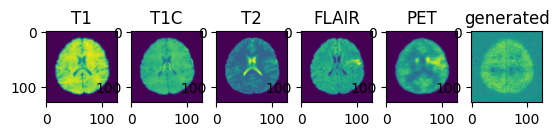

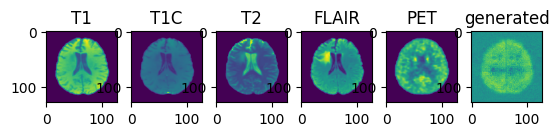

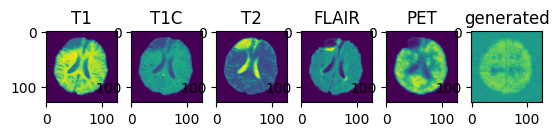

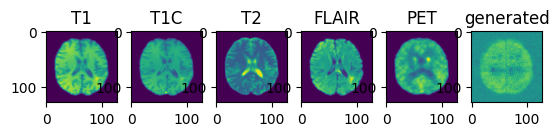

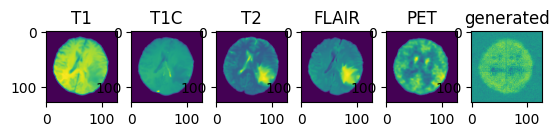

validation avg MS-SSIM: 0.4380 , train avg MS-SSIM: 0.4143
----------
epoch 311/400


Epoch :   0%|                                            | 0/24 [00:00<?, ?it/s]

Epoch :   4%|█▍                                 | 1/24 [01:44<40:14, 104.98s/it]

Epoch :   8%|███                                 | 2/24 [01:46<16:16, 44.37s/it]

Epoch :  12%|████▌                               | 3/24 [01:48<08:44, 24.96s/it]

Epoch :  17%|██████                              | 4/24 [01:50<05:17, 15.85s/it]

Epoch :  21%|███████▌                            | 5/24 [01:52<03:26, 10.85s/it]

Epoch :  25%|█████████                           | 6/24 [01:54<02:21,  7.89s/it]

Epoch :  29%|██████████▌                         | 7/24 [01:57<01:44,  6.12s/it]

Epoch :  33%|████████████                        | 8/24 [01:59<01:16,  4.77s/it]

Epoch :  38%|█████████████▌                      | 9/24 [02:01<00:58,  3.88s/it]

Epoch :  42%|██████████████▌                    | 10/24 [02:02<00:45,  3.26s/it]

Epoch :  46%|████████████████                   | 11/24 [02:04<00:36,  2.84s/it]

Epoch :  50%|█████████████████▌                 | 12/24 [02:06<00:30,  2.58s/it]

Epoch :  54%|██████████████████▉                | 13/24 [02:08<00:26,  2.37s/it]

Epoch :  58%|████████████████████▍              | 14/24 [02:10<00:22,  2.22s/it]

Epoch :  62%|█████████████████████▉             | 15/24 [02:12<00:19,  2.21s/it]

Epoch :  67%|███████████████████████▎           | 16/24 [02:14<00:16,  2.11s/it]

Epoch :  71%|████████████████████████▊          | 17/24 [02:16<00:14,  2.04s/it]

Epoch :  75%|██████████████████████████▎        | 18/24 [02:18<00:12,  2.00s/it]

Epoch :  79%|███████████████████████████▋       | 19/24 [02:20<00:09,  1.97s/it]

Epoch :  83%|█████████████████████████████▏     | 20/24 [02:22<00:07,  1.94s/it]

Epoch :  88%|██████████████████████████████▋    | 21/24 [02:24<00:05,  1.94s/it]

Epoch :  92%|████████████████████████████████   | 22/24 [02:26<00:03,  1.92s/it]

Epoch :  96%|█████████████████████████████████▌ | 23/24 [02:28<00:02,  2.00s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:29<00:00,  1.70s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:32<00:00,  6.35s/it]

----------
epoch 312/400


Epoch :   0%|                                            | 0/24 [00:00<?, ?it/s]

Epoch :   4%|█▍                                 | 1/24 [01:41<38:49, 101.28s/it]

Epoch :   8%|███                                 | 2/24 [01:43<15:42, 42.84s/it]

Epoch :  12%|████▌                               | 3/24 [01:45<08:27, 24.18s/it]

Epoch :  17%|██████                              | 4/24 [01:47<05:08, 15.40s/it]

Epoch :  21%|███████▌                            | 5/24 [01:49<03:20, 10.58s/it]

Epoch :  25%|█████████                           | 6/24 [01:51<02:17,  7.62s/it]

Epoch :  29%|██████████▌                         | 7/24 [01:52<01:37,  5.74s/it]

Epoch :  33%|████████████                        | 8/24 [01:55<01:14,  4.66s/it]

Epoch :  38%|█████████████▌                      | 9/24 [01:57<00:56,  3.78s/it]

Epoch :  42%|██████████████▌                    | 10/24 [01:58<00:44,  3.19s/it]

Epoch :  46%|████████████████                   | 11/24 [02:00<00:36,  2.79s/it]

Epoch :  50%|█████████████████▌                 | 12/24 [02:02<00:30,  2.50s/it]

Epoch :  54%|██████████████████▉                | 13/24 [02:04<00:25,  2.33s/it]

Epoch :  58%|████████████████████▍              | 14/24 [02:06<00:22,  2.23s/it]

Epoch :  62%|█████████████████████▉             | 15/24 [02:08<00:19,  2.15s/it]

Epoch :  67%|███████████████████████▎           | 16/24 [02:10<00:17,  2.18s/it]

Epoch :  71%|████████████████████████▊          | 17/24 [02:12<00:14,  2.09s/it]

Epoch :  75%|██████████████████████████▎        | 18/24 [02:14<00:12,  2.03s/it]

Epoch :  79%|███████████████████████████▋       | 19/24 [02:16<00:10,  2.06s/it]

Epoch :  83%|█████████████████████████████▏     | 20/24 [02:18<00:08,  2.04s/it]

Epoch :  88%|██████████████████████████████▋    | 21/24 [02:20<00:06,  2.08s/it]

Epoch :  92%|████████████████████████████████   | 22/24 [02:22<00:04,  2.07s/it]

Epoch :  96%|█████████████████████████████████▌ | 23/24 [02:24<00:02,  2.06s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:25<00:00,  1.75s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:29<00:00,  6.23s/it]

----------
epoch 313/400


Epoch :   0%|                                            | 0/24 [00:00<?, ?it/s]

Epoch :   4%|█▍                                 | 1/24 [01:42<39:24, 102.81s/it]

Epoch :   8%|███                                 | 2/24 [01:44<15:55, 43.45s/it]

Epoch :  12%|████▌                               | 3/24 [01:46<08:33, 24.45s/it]

Epoch :  17%|██████                              | 4/24 [01:48<05:10, 15.54s/it]

Epoch :  21%|███████▌                            | 5/24 [01:50<03:21, 10.61s/it]

Epoch :  25%|█████████                           | 6/24 [01:52<02:17,  7.63s/it]

Epoch :  29%|██████████▌                         | 7/24 [01:54<01:38,  5.79s/it]

Epoch :  33%|████████████                        | 8/24 [01:56<01:13,  4.60s/it]

Epoch :  38%|█████████████▌                      | 9/24 [01:58<00:56,  3.77s/it]

Epoch :  42%|██████████████▌                    | 10/24 [02:00<00:46,  3.31s/it]

Epoch :  46%|████████████████                   | 11/24 [02:02<00:37,  2.87s/it]

Epoch :  50%|█████████████████▌                 | 12/24 [02:04<00:30,  2.57s/it]

Epoch :  54%|██████████████████▉                | 13/24 [02:06<00:25,  2.36s/it]

Epoch :  58%|████████████████████▍              | 14/24 [02:07<00:22,  2.21s/it]

Epoch :  62%|█████████████████████▉             | 15/24 [02:09<00:19,  2.11s/it]

Epoch :  67%|███████████████████████▎           | 16/24 [02:11<00:16,  2.03s/it]

Epoch :  71%|████████████████████████▊          | 17/24 [02:13<00:13,  2.00s/it]

Epoch :  75%|██████████████████████████▎        | 18/24 [02:15<00:12,  2.06s/it]

Epoch :  79%|███████████████████████████▋       | 19/24 [02:17<00:10,  2.05s/it]

Epoch :  83%|█████████████████████████████▏     | 20/24 [02:19<00:08,  2.00s/it]

Epoch :  88%|██████████████████████████████▋    | 21/24 [02:21<00:05,  1.97s/it]

Epoch :  92%|████████████████████████████████   | 22/24 [02:23<00:03,  1.96s/it]

Epoch :  96%|█████████████████████████████████▌ | 23/24 [02:25<00:01,  1.92s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:26<00:00,  1.64s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:29<00:00,  6.24s/it]

----------
epoch 314/400


Epoch :   0%|                                            | 0/24 [00:00<?, ?it/s]

Epoch :   4%|█▍                                 | 1/24 [01:44<40:07, 104.65s/it]

Epoch :   8%|███                                 | 2/24 [01:46<16:12, 44.22s/it]

Epoch :  12%|████▌                               | 3/24 [01:48<08:46, 25.09s/it]

Epoch :  17%|██████                              | 4/24 [01:50<05:18, 15.93s/it]

Epoch :  21%|███████▌                            | 5/24 [01:52<03:26, 10.89s/it]

Epoch :  25%|█████████                           | 6/24 [01:54<02:20,  7.83s/it]

Epoch :  29%|██████████▌                         | 7/24 [01:56<01:39,  5.87s/it]

Epoch :  33%|████████████                        | 8/24 [01:58<01:13,  4.62s/it]

Epoch :  38%|█████████████▌                      | 9/24 [02:00<00:56,  3.80s/it]

Epoch :  42%|██████████████▌                    | 10/24 [02:02<00:45,  3.23s/it]

Epoch :  46%|████████████████                   | 11/24 [02:04<00:36,  2.81s/it]

Epoch :  50%|█████████████████▌                 | 12/24 [02:06<00:31,  2.65s/it]

Epoch :  54%|██████████████████▉                | 13/24 [02:08<00:26,  2.41s/it]

Epoch :  58%|████████████████████▍              | 14/24 [02:10<00:22,  2.25s/it]

Epoch :  62%|█████████████████████▉             | 15/24 [02:12<00:19,  2.13s/it]

Epoch :  67%|███████████████████████▎           | 16/24 [02:13<00:16,  2.04s/it]

Epoch :  71%|████████████████████████▊          | 17/24 [02:15<00:13,  1.99s/it]

Epoch :  75%|██████████████████████████▎        | 18/24 [02:17<00:11,  1.97s/it]

Epoch :  79%|███████████████████████████▋       | 19/24 [02:19<00:09,  1.94s/it]

Epoch :  83%|█████████████████████████████▏     | 20/24 [02:21<00:08,  2.04s/it]

Epoch :  88%|██████████████████████████████▋    | 21/24 [02:23<00:06,  2.02s/it]

Epoch :  92%|████████████████████████████████   | 22/24 [02:25<00:03,  1.99s/it]

Epoch :  96%|█████████████████████████████████▌ | 23/24 [02:27<00:01,  1.96s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:28<00:00,  1.67s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:31<00:00,  6.33s/it]

----------
epoch 315/400


Epoch :   0%|                                            | 0/24 [00:00<?, ?it/s]

Epoch :   4%|█▍                                 | 1/24 [01:48<41:46, 108.98s/it]

Epoch :   8%|███                                 | 2/24 [01:50<16:51, 45.98s/it]

Epoch :  12%|████▌                               | 3/24 [01:52<09:02, 25.85s/it]

Epoch :  17%|██████                              | 4/24 [01:54<05:28, 16.43s/it]

Epoch :  21%|███████▌                            | 5/24 [01:57<03:36, 11.38s/it]

Epoch :  25%|█████████                           | 6/24 [01:59<02:27,  8.18s/it]

Epoch :  29%|██████████▌                         | 7/24 [02:01<01:44,  6.13s/it]

Epoch :  33%|████████████                        | 8/24 [02:02<01:16,  4.79s/it]

Epoch :  38%|█████████████▌                      | 9/24 [02:04<00:58,  3.89s/it]

Epoch :  42%|██████████████▌                    | 10/24 [02:06<00:45,  3.27s/it]

Epoch :  46%|████████████████                   | 11/24 [02:08<00:37,  2.86s/it]

Epoch :  50%|█████████████████▌                 | 12/24 [02:10<00:30,  2.57s/it]

Epoch :  54%|██████████████████▉                | 13/24 [02:12<00:26,  2.37s/it]

Epoch :  58%|████████████████████▍              | 14/24 [02:14<00:23,  2.36s/it]

Epoch :  62%|█████████████████████▉             | 15/24 [02:16<00:20,  2.25s/it]

Epoch :  67%|███████████████████████▎           | 16/24 [02:18<00:17,  2.14s/it]

Epoch :  71%|████████████████████████▊          | 17/24 [02:20<00:14,  2.05s/it]

Epoch :  75%|██████████████████████████▎        | 18/24 [02:22<00:12,  2.01s/it]

Epoch :  79%|███████████████████████████▋       | 19/24 [02:24<00:10,  2.01s/it]

Epoch :  83%|█████████████████████████████▏     | 20/24 [02:26<00:07,  1.97s/it]

Epoch :  88%|██████████████████████████████▋    | 21/24 [02:28<00:05,  1.93s/it]

Epoch :  92%|████████████████████████████████   | 22/24 [02:30<00:04,  2.03s/it]

Epoch :  96%|█████████████████████████████████▌ | 23/24 [02:32<00:01,  1.99s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:33<00:00,  1.69s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:36<00:00,  6.53s/it]

----------
epoch 316/400


Epoch :   0%|                                            | 0/24 [00:00<?, ?it/s]

Epoch :   4%|█▍                                 | 1/24 [01:42<39:07, 102.08s/it]

Epoch :   8%|███                                 | 2/24 [01:43<15:49, 43.14s/it]

Epoch :  12%|████▌                               | 3/24 [01:45<08:29, 24.28s/it]

Epoch :  17%|██████                              | 4/24 [01:47<05:09, 15.45s/it]

Epoch :  21%|███████▌                            | 5/24 [01:49<03:20, 10.57s/it]

Epoch :  25%|█████████                           | 6/24 [01:51<02:17,  7.65s/it]

Epoch :  29%|██████████▌                         | 7/24 [01:54<01:40,  5.93s/it]

Epoch :  33%|████████████                        | 8/24 [01:55<01:14,  4.66s/it]

Epoch :  38%|█████████████▌                      | 9/24 [01:57<00:56,  3.79s/it]

Epoch :  42%|██████████████▌                    | 10/24 [01:59<00:44,  3.19s/it]

Epoch :  46%|████████████████                   | 11/24 [02:01<00:36,  2.79s/it]

Epoch :  50%|█████████████████▌                 | 12/24 [02:03<00:30,  2.51s/it]

Epoch :  54%|██████████████████▉                | 13/24 [02:05<00:25,  2.35s/it]

Epoch :  58%|████████████████████▍              | 14/24 [02:07<00:22,  2.23s/it]

Epoch :  62%|█████████████████████▉             | 15/24 [02:09<00:20,  2.24s/it]

Epoch :  67%|███████████████████████▎           | 16/24 [02:11<00:17,  2.18s/it]

Epoch :  71%|████████████████████████▊          | 17/24 [02:13<00:14,  2.09s/it]

Epoch :  75%|██████████████████████████▎        | 18/24 [02:15<00:12,  2.02s/it]

Epoch :  79%|███████████████████████████▋       | 19/24 [02:17<00:09,  1.98s/it]

Epoch :  83%|█████████████████████████████▏     | 20/24 [02:19<00:07,  1.94s/it]

Epoch :  88%|██████████████████████████████▋    | 21/24 [02:21<00:05,  1.93s/it]

Epoch :  92%|████████████████████████████████   | 22/24 [02:22<00:03,  1.91s/it]

Epoch :  96%|█████████████████████████████████▌ | 23/24 [02:24<00:01,  1.92s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:25<00:00,  1.64s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:29<00:00,  6.23s/it]

----------
epoch 317/400


Epoch :   0%|                                            | 0/24 [00:00<?, ?it/s]

Epoch :   4%|█▍                                 | 1/24 [01:42<39:20, 102.63s/it]

Epoch :   8%|███                                 | 2/24 [01:44<15:55, 43.44s/it]

Epoch :  12%|████▌                               | 3/24 [01:46<08:34, 24.52s/it]

Epoch :  17%|██████                              | 4/24 [01:48<05:12, 15.63s/it]

Epoch :  21%|███████▌                            | 5/24 [01:50<03:22, 10.65s/it]

Epoch :  25%|█████████                           | 6/24 [01:52<02:18,  7.67s/it]

Epoch :  29%|██████████▌                         | 7/24 [01:54<01:38,  5.78s/it]

Epoch :  33%|████████████                        | 8/24 [01:56<01:13,  4.62s/it]

Epoch :  38%|█████████████▌                      | 9/24 [01:58<00:56,  3.76s/it]

Epoch :  42%|██████████████▌                    | 10/24 [02:00<00:44,  3.16s/it]

Epoch :  46%|████████████████                   | 11/24 [02:01<00:35,  2.76s/it]

Epoch :  50%|█████████████████▌                 | 12/24 [02:03<00:30,  2.52s/it]

Epoch :  54%|██████████████████▉                | 13/24 [02:05<00:25,  2.35s/it]

Epoch :  58%|████████████████████▍              | 14/24 [02:07<00:21,  2.20s/it]

Epoch :  62%|█████████████████████▉             | 15/24 [02:09<00:18,  2.09s/it]

Epoch :  67%|███████████████████████▎           | 16/24 [02:11<00:16,  2.02s/it]

Epoch :  71%|████████████████████████▊          | 17/24 [02:13<00:14,  2.07s/it]

Epoch :  75%|██████████████████████████▎        | 18/24 [02:15<00:12,  2.03s/it]

Epoch :  79%|███████████████████████████▋       | 19/24 [02:17<00:09,  1.99s/it]

Epoch :  83%|█████████████████████████████▏     | 20/24 [02:19<00:07,  1.97s/it]

Epoch :  88%|██████████████████████████████▋    | 21/24 [02:21<00:05,  1.95s/it]

Epoch :  92%|████████████████████████████████   | 22/24 [02:23<00:03,  1.94s/it]

Epoch :  96%|█████████████████████████████████▌ | 23/24 [02:25<00:01,  1.91s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:26<00:00,  1.64s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:30<00:00,  6.25s/it]

----------
epoch 318/400


Epoch :   0%|                                            | 0/24 [00:00<?, ?it/s]

Epoch :   4%|█▍                                 | 1/24 [01:42<39:07, 102.05s/it]

Epoch :   8%|███                                 | 2/24 [01:44<15:56, 43.48s/it]

Epoch :  12%|████▌                               | 3/24 [01:46<08:34, 24.48s/it]

Epoch :  17%|██████                              | 4/24 [01:48<05:12, 15.61s/it]

Epoch :  21%|███████▌                            | 5/24 [01:50<03:23, 10.71s/it]

Epoch :  25%|█████████                           | 6/24 [01:52<02:19,  7.73s/it]

Epoch :  29%|██████████▌                         | 7/24 [01:54<01:39,  5.85s/it]

Epoch :  33%|████████████                        | 8/24 [01:56<01:13,  4.60s/it]

Epoch :  38%|█████████████▌                      | 9/24 [01:58<00:57,  3.82s/it]

Epoch :  42%|██████████████▌                    | 10/24 [02:00<00:47,  3.38s/it]

Epoch :  46%|████████████████                   | 11/24 [02:02<00:37,  2.92s/it]

Epoch :  50%|█████████████████▌                 | 12/24 [02:04<00:31,  2.62s/it]

Epoch :  54%|██████████████████▉                | 13/24 [02:06<00:26,  2.41s/it]

Epoch :  58%|████████████████████▍              | 14/24 [02:08<00:22,  2.26s/it]

Epoch :  62%|█████████████████████▉             | 15/24 [02:10<00:19,  2.21s/it]

Epoch :  67%|███████████████████████▎           | 16/24 [02:12<00:16,  2.12s/it]

Epoch :  71%|████████████████████████▊          | 17/24 [02:14<00:14,  2.05s/it]

Epoch :  75%|██████████████████████████▎        | 18/24 [02:16<00:12,  2.00s/it]

Epoch :  79%|███████████████████████████▋       | 19/24 [02:18<00:10,  2.08s/it]

Epoch :  83%|█████████████████████████████▏     | 20/24 [02:20<00:08,  2.02s/it]

Epoch :  88%|██████████████████████████████▋    | 21/24 [02:22<00:06,  2.02s/it]

Epoch :  92%|████████████████████████████████   | 22/24 [02:24<00:04,  2.02s/it]

Epoch :  96%|█████████████████████████████████▌ | 23/24 [02:26<00:01,  1.98s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:27<00:00,  1.68s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:30<00:00,  6.27s/it]

----------
epoch 319/400


Epoch :   0%|                                            | 0/24 [00:00<?, ?it/s]

Epoch :   4%|█▍                                 | 1/24 [01:47<41:20, 107.84s/it]

Epoch :   8%|███                                 | 2/24 [01:49<16:43, 45.61s/it]

Epoch :  12%|████▌                               | 3/24 [01:51<08:59, 25.69s/it]

Epoch :  17%|██████                              | 4/24 [01:54<05:30, 16.54s/it]

Epoch :  21%|███████▌                            | 5/24 [01:56<03:33, 11.25s/it]

Epoch :  25%|█████████                           | 6/24 [01:58<02:27,  8.20s/it]

Epoch :  29%|██████████▌                         | 7/24 [02:00<01:44,  6.16s/it]

Epoch :  33%|████████████                        | 8/24 [02:02<01:17,  4.87s/it]

Epoch :  38%|█████████████▌                      | 9/24 [02:04<00:59,  3.97s/it]

Epoch :  42%|██████████████▌                    | 10/24 [02:06<00:46,  3.34s/it]

Epoch :  46%|████████████████                   | 11/24 [02:08<00:38,  2.93s/it]

Epoch :  50%|█████████████████▌                 | 12/24 [02:10<00:31,  2.67s/it]

Epoch :  54%|██████████████████▉                | 13/24 [02:12<00:27,  2.48s/it]

Epoch :  58%|████████████████████▍              | 14/24 [02:14<00:23,  2.33s/it]

Epoch :  62%|█████████████████████▉             | 15/24 [02:16<00:20,  2.23s/it]

Epoch :  67%|███████████████████████▎           | 16/24 [02:18<00:17,  2.17s/it]

Epoch :  71%|████████████████████████▊          | 17/24 [02:20<00:15,  2.16s/it]

Epoch :  75%|██████████████████████████▎        | 18/24 [02:22<00:12,  2.16s/it]

Epoch :  79%|███████████████████████████▋       | 19/24 [02:24<00:10,  2.11s/it]

Epoch :  83%|█████████████████████████████▏     | 20/24 [02:26<00:08,  2.03s/it]

Epoch :  88%|██████████████████████████████▋    | 21/24 [02:28<00:06,  2.05s/it]

Epoch :  92%|████████████████████████████████   | 22/24 [02:30<00:03,  1.99s/it]

Epoch :  96%|█████████████████████████████████▌ | 23/24 [02:32<00:01,  1.94s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:33<00:00,  1.65s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:36<00:00,  6.53s/it]

----------
epoch 320/400


Epoch :   0%|                                            | 0/24 [00:00<?, ?it/s]

Epoch :   4%|█▌                                  | 1/24 [01:32<35:31, 92.66s/it]

Epoch :   8%|███                                 | 2/24 [01:34<14:23, 39.24s/it]

Epoch :  12%|████▌                               | 3/24 [01:36<07:46, 22.21s/it]

Epoch :  17%|██████                              | 4/24 [01:38<04:43, 14.17s/it]

Epoch :  21%|███████▌                            | 5/24 [01:40<03:05,  9.79s/it]

Epoch :  25%|█████████                           | 6/24 [01:42<02:07,  7.09s/it]

Epoch :  29%|██████████▌                         | 7/24 [01:44<01:31,  5.38s/it]

Epoch :  33%|████████████                        | 8/24 [01:45<01:08,  4.28s/it]

Epoch :  38%|█████████████▌                      | 9/24 [01:47<00:52,  3.53s/it]

Epoch :  42%|██████████████▌                    | 10/24 [01:49<00:42,  3.01s/it]

Epoch :  46%|████████████████                   | 11/24 [01:51<00:34,  2.66s/it]

Epoch :  50%|█████████████████▌                 | 12/24 [01:53<00:28,  2.42s/it]

Epoch :  54%|██████████████████▉                | 13/24 [01:55<00:24,  2.24s/it]

Epoch :  58%|████████████████████▍              | 14/24 [01:57<00:22,  2.23s/it]

Epoch :  62%|█████████████████████▉             | 15/24 [01:59<00:19,  2.12s/it]

Epoch :  67%|███████████████████████▎           | 16/24 [02:01<00:16,  2.03s/it]

Epoch :  71%|████████████████████████▊          | 17/24 [02:02<00:13,  1.97s/it]

Epoch :  75%|██████████████████████████▎        | 18/24 [02:04<00:11,  1.94s/it]

Epoch :  79%|███████████████████████████▋       | 19/24 [02:06<00:09,  1.91s/it]

Epoch :  83%|█████████████████████████████▏     | 20/24 [02:08<00:07,  1.89s/it]

Epoch :  88%|██████████████████████████████▋    | 21/24 [02:10<00:05,  1.88s/it]

Epoch :  92%|████████████████████████████████   | 22/24 [02:12<00:03,  1.99s/it]

Epoch :  96%|█████████████████████████████████▌ | 23/24 [02:14<00:01,  1.95s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:15<00:00,  1.66s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:18<00:00,  5.78s/it]

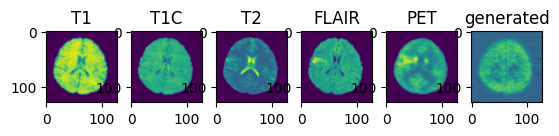

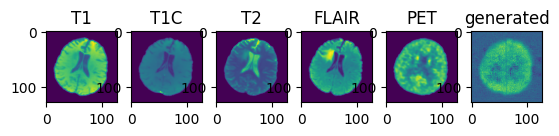

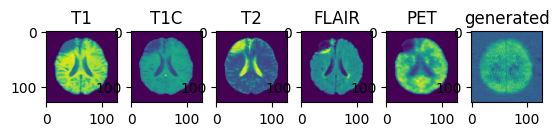

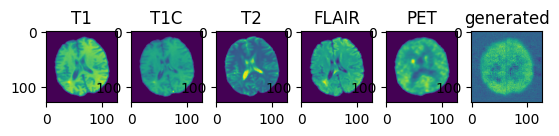

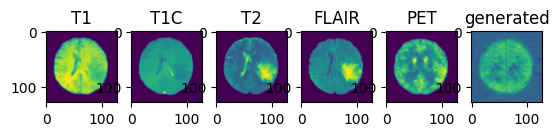

validation avg MS-SSIM: 0.4692 , train avg MS-SSIM: 0.4445
----------
epoch 321/400


Epoch :   0%|                                            | 0/24 [00:00<?, ?it/s]

Epoch :   4%|█▌                                  | 1/24 [01:28<33:54, 88.47s/it]

Epoch :   8%|███                                 | 2/24 [01:30<13:44, 37.50s/it]

Epoch :  12%|████▌                               | 3/24 [01:32<07:25, 21.20s/it]

Epoch :  17%|██████                              | 4/24 [01:33<04:31, 13.56s/it]

Epoch :  21%|███████▌                            | 5/24 [01:36<03:00,  9.47s/it]

Epoch :  25%|█████████                           | 6/24 [01:37<02:03,  6.87s/it]

Epoch :  29%|██████████▌                         | 7/24 [01:39<01:28,  5.21s/it]

Epoch :  33%|████████████                        | 8/24 [01:41<01:06,  4.13s/it]

Epoch :  38%|█████████████▌                      | 9/24 [01:43<00:51,  3.40s/it]

Epoch :  42%|██████████████▌                    | 10/24 [01:45<00:40,  2.90s/it]

Epoch :  46%|████████████████                   | 11/24 [01:47<00:33,  2.57s/it]

Epoch :  50%|█████████████████▌                 | 12/24 [01:48<00:28,  2.36s/it]

Epoch :  54%|██████████████████▉                | 13/24 [01:50<00:25,  2.28s/it]

Epoch :  58%|████████████████████▍              | 14/24 [01:52<00:21,  2.14s/it]

Epoch :  62%|█████████████████████▉             | 15/24 [01:54<00:18,  2.03s/it]

Epoch :  67%|███████████████████████▎           | 16/24 [01:56<00:15,  1.95s/it]

Epoch :  71%|████████████████████████▊          | 17/24 [01:58<00:13,  1.90s/it]

Epoch :  75%|██████████████████████████▎        | 18/24 [01:59<00:11,  1.86s/it]

Epoch :  79%|███████████████████████████▋       | 19/24 [02:01<00:09,  1.84s/it]

Epoch :  83%|█████████████████████████████▏     | 20/24 [02:03<00:07,  1.82s/it]

Epoch :  88%|██████████████████████████████▋    | 21/24 [02:05<00:05,  1.81s/it]

Epoch :  92%|████████████████████████████████   | 22/24 [02:07<00:03,  1.91s/it]

Epoch :  96%|█████████████████████████████████▌ | 23/24 [02:09<00:01,  1.88s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:10<00:00,  1.61s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:13<00:00,  5.56s/it]

----------
epoch 322/400


Epoch :   0%|                                            | 0/24 [00:00<?, ?it/s]

Epoch :   4%|█▌                                  | 1/24 [01:36<37:01, 96.58s/it]

Epoch :   8%|███                                 | 2/24 [01:38<14:58, 40.85s/it]

Epoch :  12%|████▌                               | 3/24 [01:40<08:03, 23.01s/it]

Epoch :  17%|██████                              | 4/24 [01:41<04:52, 14.63s/it]

Epoch :  21%|███████▌                            | 5/24 [01:43<03:09, 10.00s/it]

Epoch :  25%|█████████                           | 6/24 [01:45<02:12,  7.34s/it]

Epoch :  29%|██████████▌                         | 7/24 [01:47<01:33,  5.52s/it]

Epoch :  33%|████████████                        | 8/24 [01:49<01:09,  4.33s/it]

Epoch :  38%|█████████████▌                      | 9/24 [01:51<00:53,  3.54s/it]

Epoch :  42%|██████████████▌                    | 10/24 [01:53<00:42,  3.00s/it]

Epoch :  46%|████████████████                   | 11/24 [01:54<00:34,  2.63s/it]

Epoch :  50%|█████████████████▌                 | 12/24 [01:56<00:28,  2.38s/it]

Epoch :  54%|██████████████████▉                | 13/24 [01:58<00:24,  2.21s/it]

Epoch :  58%|████████████████████▍              | 14/24 [02:00<00:20,  2.09s/it]

Epoch :  62%|█████████████████████▉             | 15/24 [02:02<00:18,  2.11s/it]

Epoch :  67%|███████████████████████▎           | 16/24 [02:04<00:16,  2.01s/it]

Epoch :  71%|████████████████████████▊          | 17/24 [02:06<00:13,  1.95s/it]

Epoch :  75%|██████████████████████████▎        | 18/24 [02:07<00:11,  1.91s/it]

Epoch :  79%|███████████████████████████▋       | 19/24 [02:09<00:09,  1.87s/it]

Epoch :  83%|█████████████████████████████▏     | 20/24 [02:11<00:07,  1.84s/it]

Epoch :  88%|██████████████████████████████▋    | 21/24 [02:13<00:05,  1.83s/it]

Epoch :  92%|████████████████████████████████   | 22/24 [02:15<00:03,  1.81s/it]

Epoch :  96%|█████████████████████████████████▌ | 23/24 [02:17<00:01,  1.91s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:18<00:00,  1.62s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:21<00:00,  5.88s/it]

----------
epoch 323/400


Epoch :   0%|                                            | 0/24 [00:00<?, ?it/s]

Epoch :   4%|█▌                                  | 1/24 [01:28<33:57, 88.59s/it]

Epoch :   8%|███                                 | 2/24 [01:30<13:46, 37.56s/it]

Epoch :  12%|████▌                               | 3/24 [01:32<07:25, 21.22s/it]

Epoch :  17%|██████                              | 4/24 [01:33<04:31, 13.55s/it]

Epoch :  21%|███████▌                            | 5/24 [01:35<02:56,  9.31s/it]

Epoch :  25%|█████████                           | 6/24 [01:37<02:01,  6.76s/it]

Epoch :  29%|██████████▌                         | 7/24 [01:39<01:27,  5.14s/it]

Epoch :  33%|████████████                        | 8/24 [01:41<01:07,  4.20s/it]

Epoch :  38%|█████████████▌                      | 9/24 [01:43<00:51,  3.45s/it]

Epoch :  42%|██████████████▌                    | 10/24 [01:45<00:41,  2.94s/it]

Epoch :  46%|████████████████                   | 11/24 [01:46<00:33,  2.59s/it]

Epoch :  50%|█████████████████▌                 | 12/24 [01:48<00:28,  2.35s/it]

Epoch :  54%|██████████████████▉                | 13/24 [01:50<00:23,  2.18s/it]

Epoch :  58%|████████████████████▍              | 14/24 [01:52<00:20,  2.07s/it]

Epoch :  62%|█████████████████████▉             | 15/24 [01:54<00:17,  1.98s/it]

Epoch :  67%|███████████████████████▎           | 16/24 [01:55<00:15,  1.92s/it]

Epoch :  71%|████████████████████████▊          | 17/24 [01:57<00:13,  1.87s/it]

Epoch :  75%|██████████████████████████▎        | 18/24 [01:59<00:11,  1.85s/it]

Epoch :  79%|███████████████████████████▋       | 19/24 [02:01<00:09,  1.83s/it]

Epoch :  83%|█████████████████████████████▏     | 20/24 [02:03<00:07,  1.81s/it]

Epoch :  88%|██████████████████████████████▋    | 21/24 [02:04<00:05,  1.80s/it]

Epoch :  92%|████████████████████████████████   | 22/24 [02:06<00:03,  1.79s/it]

Epoch :  96%|█████████████████████████████████▌ | 23/24 [02:08<00:01,  1.80s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:09<00:00,  1.55s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:12<00:00,  5.51s/it]

----------
epoch 324/400


Epoch :   0%|                                            | 0/24 [00:00<?, ?it/s]

Epoch :   4%|█▌                                  | 1/24 [01:27<33:37, 87.72s/it]

Epoch :   8%|███                                 | 2/24 [01:29<13:38, 37.21s/it]

Epoch :  12%|████▌                               | 3/24 [01:31<07:22, 21.06s/it]

Epoch :  17%|██████                              | 4/24 [01:33<04:28, 13.44s/it]

Epoch :  21%|███████▌                            | 5/24 [01:34<02:55,  9.23s/it]

Epoch :  25%|█████████                           | 6/24 [01:36<02:00,  6.71s/it]

Epoch :  29%|██████████▌                         | 7/24 [01:38<01:26,  5.11s/it]

Epoch :  33%|████████████                        | 8/24 [01:40<01:04,  4.06s/it]

Epoch :  38%|█████████████▌                      | 9/24 [01:42<00:50,  3.34s/it]

Epoch :  42%|██████████████▌                    | 10/24 [01:44<00:43,  3.12s/it]

Epoch :  46%|████████████████                   | 11/24 [01:46<00:35,  2.71s/it]

Epoch :  50%|█████████████████▌                 | 12/24 [01:48<00:29,  2.43s/it]

Epoch :  54%|██████████████████▉                | 13/24 [01:50<00:24,  2.24s/it]

Epoch :  58%|████████████████████▍              | 14/24 [01:52<00:21,  2.17s/it]

Epoch :  62%|█████████████████████▉             | 15/24 [01:54<00:20,  2.25s/it]

Epoch :  67%|███████████████████████▎           | 16/24 [01:56<00:17,  2.25s/it]

Epoch :  71%|████████████████████████▊          | 17/24 [01:59<00:15,  2.28s/it]

Epoch :  75%|██████████████████████████▎        | 18/24 [02:01<00:14,  2.41s/it]

Epoch :  79%|███████████████████████████▋       | 19/24 [02:04<00:12,  2.42s/it]

Epoch :  83%|█████████████████████████████▏     | 20/24 [02:06<00:08,  2.24s/it]

Epoch :  88%|██████████████████████████████▋    | 21/24 [02:07<00:06,  2.11s/it]

Epoch :  92%|████████████████████████████████   | 22/24 [02:09<00:04,  2.06s/it]

Epoch :  96%|█████████████████████████████████▌ | 23/24 [02:11<00:02,  2.04s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:12<00:00,  1.73s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:17<00:00,  5.73s/it]

----------
epoch 325/400


Epoch :   0%|                                            | 0/24 [00:00<?, ?it/s]

Epoch :   4%|█▍                                 | 1/24 [01:51<42:47, 111.65s/it]

Epoch :   8%|███                                 | 2/24 [01:53<17:21, 47.35s/it]

Epoch :  12%|████▌                               | 3/24 [01:56<09:25, 26.91s/it]

Epoch :  17%|██████                              | 4/24 [01:58<05:40, 17.04s/it]

Epoch :  21%|███████▌                            | 5/24 [02:00<03:42, 11.72s/it]

Epoch :  25%|█████████                           | 6/24 [02:02<02:32,  8.49s/it]

Epoch :  29%|██████████▌                         | 7/24 [02:05<01:48,  6.38s/it]

Epoch :  33%|████████████                        | 8/24 [02:07<01:20,  5.00s/it]

Epoch :  38%|█████████████▌                      | 9/24 [02:09<01:01,  4.09s/it]

Epoch :  42%|██████████████▌                    | 10/24 [02:11<00:49,  3.50s/it]

Epoch :  46%|████████████████                   | 11/24 [02:14<00:43,  3.33s/it]

Epoch :  50%|█████████████████▌                 | 12/24 [02:16<00:36,  3.03s/it]

Epoch :  54%|██████████████████▉                | 13/24 [02:18<00:30,  2.77s/it]

Epoch :  58%|████████████████████▍              | 14/24 [02:21<00:26,  2.60s/it]

Epoch :  62%|█████████████████████▉             | 15/24 [02:23<00:21,  2.43s/it]

Epoch :  67%|███████████████████████▎           | 16/24 [02:25<00:18,  2.30s/it]

Epoch :  71%|████████████████████████▊          | 17/24 [02:27<00:15,  2.19s/it]

Epoch :  75%|██████████████████████████▎        | 18/24 [02:29<00:12,  2.14s/it]

Epoch :  79%|███████████████████████████▋       | 19/24 [02:31<00:10,  2.10s/it]

Epoch :  83%|█████████████████████████████▏     | 20/24 [02:33<00:08,  2.23s/it]

Epoch :  88%|██████████████████████████████▋    | 21/24 [02:35<00:06,  2.12s/it]

Epoch :  92%|████████████████████████████████   | 22/24 [02:37<00:04,  2.08s/it]

Epoch :  96%|█████████████████████████████████▌ | 23/24 [02:39<00:02,  2.10s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:40<00:00,  1.78s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:44<00:00,  6.87s/it]

----------
epoch 326/400


Epoch :   0%|                                            | 0/24 [00:00<?, ?it/s]

Epoch :   4%|█▍                                 | 1/24 [02:03<47:20, 123.50s/it]

Epoch :   8%|███                                 | 2/24 [02:05<19:03, 51.95s/it]

Epoch :  12%|████▌                               | 3/24 [02:07<10:11, 29.11s/it]

Epoch :  17%|██████                              | 4/24 [02:09<06:11, 18.57s/it]

Epoch :  21%|███████▌                            | 5/24 [02:11<03:58, 12.57s/it]

Epoch :  25%|█████████                           | 6/24 [02:13<02:42,  9.04s/it]

Epoch :  29%|██████████▌                         | 7/24 [02:15<01:54,  6.76s/it]

Epoch :  33%|████████████                        | 8/24 [02:18<01:24,  5.29s/it]

Epoch :  38%|█████████████▌                      | 9/24 [02:20<01:04,  4.29s/it]

Epoch :  42%|██████████████▌                    | 10/24 [02:22<00:49,  3.55s/it]

Epoch :  46%|████████████████                   | 11/24 [02:23<00:39,  3.06s/it]

Epoch :  50%|█████████████████▌                 | 12/24 [02:25<00:32,  2.73s/it]

Epoch :  54%|██████████████████▉                | 13/24 [02:28<00:29,  2.70s/it]

Epoch :  58%|████████████████████▍              | 14/24 [02:30<00:25,  2.52s/it]

Epoch :  62%|█████████████████████▉             | 15/24 [02:32<00:21,  2.40s/it]

Epoch :  67%|███████████████████████▎           | 16/24 [02:34<00:18,  2.26s/it]

Epoch :  71%|████████████████████████▊          | 17/24 [02:36<00:15,  2.17s/it]

Epoch :  75%|██████████████████████████▎        | 18/24 [02:38<00:12,  2.08s/it]

Epoch :  79%|███████████████████████████▋       | 19/24 [02:40<00:10,  2.07s/it]

Epoch :  83%|█████████████████████████████▏     | 20/24 [02:42<00:08,  2.08s/it]

Epoch :  88%|██████████████████████████████▋    | 21/24 [02:44<00:06,  2.02s/it]

Epoch :  92%|████████████████████████████████   | 22/24 [02:46<00:04,  2.07s/it]

Epoch :  96%|█████████████████████████████████▌ | 23/24 [02:49<00:02,  2.12s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:50<00:00,  1.78s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:54<00:00,  7.26s/it]

----------
epoch 327/400


Epoch :   0%|                                            | 0/24 [00:00<?, ?it/s]

Epoch :   4%|█▍                                 | 1/24 [01:49<42:07, 109.89s/it]

Epoch :   8%|███                                 | 2/24 [01:51<16:59, 46.35s/it]

Epoch :  12%|████▌                               | 3/24 [01:53<09:08, 26.11s/it]

Epoch :  17%|██████                              | 4/24 [01:55<05:31, 16.58s/it]

Epoch :  21%|███████▌                            | 5/24 [01:57<03:35, 11.34s/it]

Epoch :  25%|█████████                           | 6/24 [02:00<02:29,  8.33s/it]

Epoch :  29%|██████████▌                         | 7/24 [02:02<01:45,  6.22s/it]

Epoch :  33%|████████████                        | 8/24 [02:04<01:17,  4.86s/it]

Epoch :  38%|█████████████▌                      | 9/24 [02:06<00:59,  3.95s/it]

Epoch :  42%|██████████████▌                    | 10/24 [02:08<00:48,  3.45s/it]

Epoch :  46%|████████████████                   | 11/24 [02:10<00:39,  3.06s/it]

Epoch :  50%|█████████████████▌                 | 12/24 [02:12<00:32,  2.71s/it]

Epoch :  54%|██████████████████▉                | 13/24 [02:14<00:27,  2.49s/it]

Epoch :  58%|████████████████████▍              | 14/24 [02:16<00:23,  2.39s/it]

Epoch :  62%|█████████████████████▉             | 15/24 [02:18<00:21,  2.36s/it]

Epoch :  67%|███████████████████████▎           | 16/24 [02:20<00:18,  2.26s/it]

Epoch :  71%|████████████████████████▊          | 17/24 [02:23<00:15,  2.23s/it]

Epoch :  75%|██████████████████████████▎        | 18/24 [02:25<00:12,  2.16s/it]

Epoch :  79%|███████████████████████████▋       | 19/24 [02:27<00:10,  2.10s/it]

Epoch :  83%|█████████████████████████████▏     | 20/24 [02:28<00:08,  2.03s/it]

Epoch :  88%|██████████████████████████████▋    | 21/24 [02:31<00:06,  2.07s/it]

Epoch :  92%|████████████████████████████████   | 22/24 [02:33<00:04,  2.02s/it]

Epoch :  96%|█████████████████████████████████▌ | 23/24 [02:35<00:02,  2.09s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:36<00:00,  1.77s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:40<00:00,  6.67s/it]

----------
epoch 328/400


Epoch :   0%|                                            | 0/24 [00:00<?, ?it/s]

Epoch :   4%|█▍                                 | 1/24 [01:53<43:23, 113.19s/it]

Epoch :   8%|███                                 | 2/24 [01:55<17:31, 47.80s/it]

Epoch :  12%|████▌                               | 3/24 [01:57<09:25, 26.91s/it]

Epoch :  17%|██████                              | 4/24 [01:59<05:41, 17.08s/it]

Epoch :  21%|███████▌                            | 5/24 [02:01<03:41, 11.65s/it]

Epoch :  25%|█████████                           | 6/24 [02:03<02:30,  8.36s/it]

Epoch :  29%|██████████▌                         | 7/24 [02:05<01:46,  6.27s/it]

Epoch :  33%|████████████                        | 8/24 [02:07<01:21,  5.09s/it]

Epoch :  38%|█████████████▌                      | 9/24 [02:09<01:01,  4.12s/it]

Epoch :  42%|██████████████▌                    | 10/24 [02:11<00:47,  3.42s/it]

Epoch :  46%|████████████████                   | 11/24 [02:13<00:38,  2.94s/it]

Epoch :  50%|█████████████████▌                 | 12/24 [02:15<00:32,  2.68s/it]

Epoch :  54%|██████████████████▉                | 13/24 [02:17<00:27,  2.52s/it]

Epoch :  58%|████████████████████▍              | 14/24 [02:19<00:23,  2.37s/it]

Epoch :  62%|█████████████████████▉             | 15/24 [02:21<00:20,  2.24s/it]

Epoch :  67%|███████████████████████▎           | 16/24 [02:24<00:19,  2.46s/it]

Epoch :  71%|████████████████████████▊          | 17/24 [02:26<00:16,  2.40s/it]

Epoch :  75%|██████████████████████████▎        | 18/24 [02:28<00:13,  2.29s/it]

Epoch :  79%|███████████████████████████▋       | 19/24 [02:30<00:10,  2.20s/it]

Epoch :  83%|█████████████████████████████▏     | 20/24 [02:32<00:08,  2.12s/it]

Epoch :  88%|██████████████████████████████▋    | 21/24 [02:34<00:06,  2.10s/it]

Epoch :  92%|████████████████████████████████   | 22/24 [02:36<00:04,  2.03s/it]

Epoch :  96%|█████████████████████████████████▌ | 23/24 [02:38<00:01,  1.99s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:39<00:00,  1.69s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:43<00:00,  6.82s/it]

----------
epoch 329/400


Epoch :   0%|                                            | 0/24 [00:00<?, ?it/s]

Epoch :   4%|█▍                                 | 1/24 [01:51<42:37, 111.20s/it]

Epoch :   8%|███                                 | 2/24 [01:53<17:15, 47.07s/it]

Epoch :  12%|████▌                               | 3/24 [01:55<09:17, 26.53s/it]

Epoch :  17%|██████                              | 4/24 [01:57<05:37, 16.90s/it]

Epoch :  21%|███████▌                            | 5/24 [01:59<03:39, 11.57s/it]

Epoch :  25%|█████████                           | 6/24 [02:01<02:29,  8.30s/it]

Epoch :  29%|██████████▌                         | 7/24 [02:03<01:45,  6.23s/it]

Epoch :  33%|████████████                        | 8/24 [02:05<01:17,  4.85s/it]

Epoch :  38%|█████████████▌                      | 9/24 [02:07<01:00,  4.04s/it]

Epoch :  42%|██████████████▌                    | 10/24 [02:09<00:47,  3.40s/it]

Epoch :  46%|████████████████                   | 11/24 [02:11<00:38,  2.95s/it]

Epoch :  50%|█████████████████▌                 | 12/24 [02:13<00:32,  2.71s/it]

Epoch :  54%|██████████████████▉                | 13/24 [02:15<00:27,  2.48s/it]

Epoch :  58%|████████████████████▍              | 14/24 [02:17<00:23,  2.34s/it]

Epoch :  62%|█████████████████████▉             | 15/24 [02:20<00:21,  2.38s/it]

Epoch :  67%|███████████████████████▎           | 16/24 [02:22<00:18,  2.25s/it]

Epoch :  71%|████████████████████████▊          | 17/24 [02:24<00:14,  2.13s/it]

Epoch :  75%|██████████████████████████▎        | 18/24 [02:26<00:13,  2.17s/it]

Epoch :  79%|███████████████████████████▋       | 19/24 [02:28<00:11,  2.21s/it]

Epoch :  83%|█████████████████████████████▏     | 20/24 [02:30<00:08,  2.13s/it]

Epoch :  88%|██████████████████████████████▋    | 21/24 [02:32<00:06,  2.04s/it]

Epoch :  92%|████████████████████████████████   | 22/24 [02:34<00:03,  1.99s/it]

Epoch :  96%|█████████████████████████████████▌ | 23/24 [02:36<00:01,  2.00s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:37<00:00,  1.71s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:41<00:00,  6.73s/it]

----------
epoch 330/400


Epoch :   0%|                                            | 0/24 [00:00<?, ?it/s]

Epoch :   4%|█▍                                 | 1/24 [01:53<43:22, 113.16s/it]

Epoch :   8%|███                                 | 2/24 [01:55<17:38, 48.12s/it]

Epoch :  12%|████▌                               | 3/24 [01:57<09:28, 27.06s/it]

Epoch :  17%|██████                              | 4/24 [01:59<05:45, 17.26s/it]

Epoch :  21%|███████▌                            | 5/24 [02:02<03:44, 11.79s/it]

Epoch :  25%|█████████                           | 6/24 [02:04<02:34,  8.56s/it]

Epoch :  29%|██████████▌                         | 7/24 [02:06<01:48,  6.40s/it]

Epoch :  33%|████████████                        | 8/24 [02:08<01:20,  5.03s/it]

Epoch :  38%|█████████████▌                      | 9/24 [02:10<01:02,  4.16s/it]

Epoch :  42%|██████████████▌                    | 10/24 [02:12<00:50,  3.59s/it]

Epoch :  46%|████████████████                   | 11/24 [02:15<00:41,  3.18s/it]

Epoch :  50%|█████████████████▌                 | 12/24 [02:17<00:34,  2.84s/it]

Epoch :  54%|██████████████████▉                | 13/24 [02:19<00:28,  2.61s/it]

Epoch :  58%|████████████████████▍              | 14/24 [02:21<00:24,  2.45s/it]

Epoch :  62%|█████████████████████▉             | 15/24 [02:23<00:21,  2.38s/it]

Epoch :  67%|███████████████████████▎           | 16/24 [02:25<00:18,  2.29s/it]

Epoch :  71%|████████████████████████▊          | 17/24 [02:28<00:15,  2.28s/it]

Epoch :  75%|██████████████████████████▎        | 18/24 [02:30<00:13,  2.22s/it]

Epoch :  79%|███████████████████████████▋       | 19/24 [02:32<00:11,  2.20s/it]

Epoch :  83%|█████████████████████████████▏     | 20/24 [02:34<00:08,  2.19s/it]

Epoch :  88%|██████████████████████████████▋    | 21/24 [02:36<00:06,  2.23s/it]

Epoch :  92%|████████████████████████████████   | 22/24 [02:39<00:04,  2.27s/it]

Epoch :  96%|█████████████████████████████████▌ | 23/24 [02:41<00:02,  2.24s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:42<00:00,  1.92s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:46<00:00,  6.93s/it]

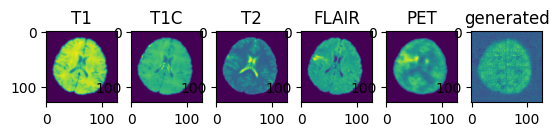

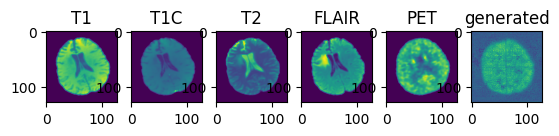

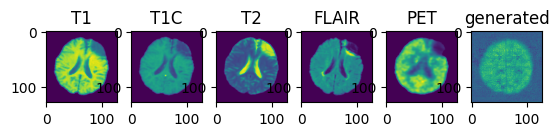

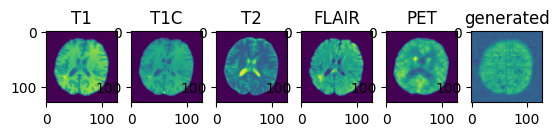

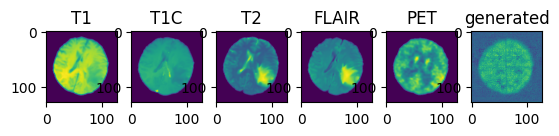

validation avg MS-SSIM: 0.4278 , train avg MS-SSIM: 0.4052
----------
epoch 331/400


Epoch :   0%|                                            | 0/24 [00:00<?, ?it/s]

Epoch :   4%|█▍                                 | 1/24 [01:55<44:06, 115.05s/it]

Epoch :   8%|███                                 | 2/24 [01:56<17:47, 48.50s/it]

Epoch :  12%|████▌                               | 3/24 [01:58<09:32, 27.25s/it]

Epoch :  17%|██████                              | 4/24 [02:00<05:44, 17.23s/it]

Epoch :  21%|███████▌                            | 5/24 [02:02<03:43, 11.74s/it]

Epoch :  25%|█████████                           | 6/24 [02:04<02:32,  8.46s/it]

Epoch :  29%|██████████▌                         | 7/24 [02:06<01:47,  6.32s/it]

Epoch :  33%|████████████                        | 8/24 [02:08<01:19,  4.94s/it]

Epoch :  38%|█████████████▌                      | 9/24 [02:10<01:00,  4.00s/it]

Epoch :  42%|██████████████▌                    | 10/24 [02:13<00:49,  3.51s/it]

Epoch :  46%|████████████████                   | 11/24 [02:15<00:39,  3.02s/it]

Epoch :  50%|█████████████████▌                 | 12/24 [02:17<00:32,  2.70s/it]

Epoch :  54%|██████████████████▉                | 13/24 [02:18<00:27,  2.48s/it]

Epoch :  58%|████████████████████▍              | 14/24 [02:21<00:23,  2.36s/it]

Epoch :  62%|█████████████████████▉             | 15/24 [02:23<00:21,  2.35s/it]

Epoch :  67%|███████████████████████▎           | 16/24 [02:25<00:19,  2.40s/it]

Epoch :  71%|████████████████████████▊          | 17/24 [02:27<00:16,  2.30s/it]

Epoch :  75%|██████████████████████████▎        | 18/24 [02:30<00:14,  2.42s/it]

Epoch :  79%|███████████████████████████▋       | 19/24 [02:32<00:11,  2.31s/it]

Epoch :  83%|█████████████████████████████▏     | 20/24 [02:34<00:08,  2.22s/it]

Epoch :  88%|██████████████████████████████▋    | 21/24 [02:36<00:06,  2.17s/it]

Epoch :  92%|████████████████████████████████   | 22/24 [02:38<00:04,  2.10s/it]

Epoch :  96%|█████████████████████████████████▌ | 23/24 [02:40<00:02,  2.15s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:41<00:00,  1.80s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:46<00:00,  6.92s/it]

----------
epoch 332/400


Epoch :   0%|                                            | 0/24 [00:00<?, ?it/s]

Epoch :   4%|█▍                                 | 1/24 [01:56<44:48, 116.89s/it]

Epoch :   8%|███                                 | 2/24 [01:59<18:08, 49.47s/it]

Epoch :  12%|████▌                               | 3/24 [02:01<09:42, 27.74s/it]

Epoch :  17%|██████                              | 4/24 [02:02<05:51, 17.56s/it]

Epoch :  21%|███████▌                            | 5/24 [02:05<03:47, 11.99s/it]

Epoch :  25%|█████████                           | 6/24 [02:07<02:34,  8.57s/it]

Epoch :  29%|██████████▌                         | 7/24 [02:08<01:48,  6.39s/it]

Epoch :  33%|████████████                        | 8/24 [02:11<01:22,  5.13s/it]

Epoch :  38%|█████████████▌                      | 9/24 [02:13<01:03,  4.21s/it]

Epoch :  42%|██████████████▌                    | 10/24 [02:15<00:49,  3.55s/it]

Epoch :  46%|████████████████                   | 11/24 [02:18<00:41,  3.22s/it]

Epoch :  50%|█████████████████▌                 | 12/24 [02:20<00:34,  2.85s/it]

Epoch :  54%|██████████████████▉                | 13/24 [02:22<00:29,  2.67s/it]

Epoch :  58%|████████████████████▍              | 14/24 [02:24<00:24,  2.44s/it]

Epoch :  62%|█████████████████████▉             | 15/24 [02:26<00:20,  2.30s/it]

Epoch :  67%|███████████████████████▎           | 16/24 [02:28<00:17,  2.24s/it]

Epoch :  71%|████████████████████████▊          | 17/24 [02:30<00:15,  2.16s/it]

Epoch :  75%|██████████████████████████▎        | 18/24 [02:32<00:12,  2.06s/it]

Epoch :  79%|███████████████████████████▋       | 19/24 [02:34<00:10,  2.10s/it]

Epoch :  83%|█████████████████████████████▏     | 20/24 [02:36<00:08,  2.03s/it]

Epoch :  88%|██████████████████████████████▋    | 21/24 [02:38<00:06,  2.00s/it]

Epoch :  92%|████████████████████████████████   | 22/24 [02:40<00:04,  2.06s/it]

Epoch :  96%|█████████████████████████████████▌ | 23/24 [02:42<00:01,  1.99s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:43<00:00,  1.68s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:46<00:00,  6.96s/it]

----------
epoch 333/400


Epoch :   0%|                                            | 0/24 [00:00<?, ?it/s]

Epoch :   4%|█▍                                 | 1/24 [01:55<44:20, 115.67s/it]

Epoch :   8%|███                                 | 2/24 [01:57<17:54, 48.85s/it]

Epoch :  12%|████▌                               | 3/24 [02:00<09:40, 27.62s/it]

Epoch :  17%|██████                              | 4/24 [02:02<05:54, 17.73s/it]

Epoch :  21%|███████▌                            | 5/24 [02:04<03:49, 12.09s/it]

Epoch :  25%|█████████                           | 6/24 [02:06<02:35,  8.66s/it]

Epoch :  29%|██████████▌                         | 7/24 [02:09<01:52,  6.64s/it]

Epoch :  33%|████████████                        | 8/24 [02:11<01:23,  5.23s/it]

Epoch :  38%|█████████████▌                      | 9/24 [02:13<01:02,  4.19s/it]

Epoch :  42%|██████████████▌                    | 10/24 [02:15<00:48,  3.47s/it]

Epoch :  46%|████████████████                   | 11/24 [02:17<00:38,  2.99s/it]

Epoch :  50%|█████████████████▌                 | 12/24 [02:19<00:32,  2.73s/it]

Epoch :  54%|██████████████████▉                | 13/24 [02:21<00:29,  2.69s/it]

Epoch :  58%|████████████████████▍              | 14/24 [02:23<00:24,  2.49s/it]

Epoch :  62%|█████████████████████▉             | 15/24 [02:26<00:21,  2.41s/it]

Epoch :  67%|███████████████████████▎           | 16/24 [02:28<00:18,  2.26s/it]

Epoch :  71%|████████████████████████▊          | 17/24 [02:29<00:15,  2.15s/it]

Epoch :  75%|██████████████████████████▎        | 18/24 [02:31<00:12,  2.11s/it]

Epoch :  79%|███████████████████████████▋       | 19/24 [02:34<00:10,  2.11s/it]

Epoch :  83%|█████████████████████████████▏     | 20/24 [02:36<00:08,  2.11s/it]

Epoch :  88%|██████████████████████████████▋    | 21/24 [02:38<00:06,  2.23s/it]

Epoch :  92%|████████████████████████████████   | 22/24 [02:40<00:04,  2.25s/it]

Epoch :  96%|█████████████████████████████████▌ | 23/24 [02:42<00:02,  2.16s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:43<00:00,  1.81s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:48<00:00,  7.02s/it]

----------
epoch 334/400


Epoch :   0%|                                            | 0/24 [00:00<?, ?it/s]

Epoch :   4%|█▍                                 | 1/24 [01:55<44:11, 115.27s/it]

Epoch :   8%|███                                 | 2/24 [01:57<17:59, 49.05s/it]

Epoch :  12%|████▌                               | 3/24 [02:00<09:41, 27.67s/it]

Epoch :  17%|██████                              | 4/24 [02:02<05:51, 17.56s/it]

Epoch :  21%|███████▌                            | 5/24 [02:04<03:48, 12.01s/it]

Epoch :  25%|█████████                           | 6/24 [02:07<02:39,  8.84s/it]

Epoch :  29%|██████████▌                         | 7/24 [02:09<01:53,  6.65s/it]

Epoch :  33%|████████████                        | 8/24 [02:11<01:23,  5.21s/it]

Epoch :  38%|█████████████▌                      | 9/24 [02:13<01:03,  4.24s/it]

Epoch :  42%|██████████████▌                    | 10/24 [02:15<00:49,  3.53s/it]

Epoch :  46%|████████████████                   | 11/24 [02:17<00:40,  3.08s/it]

Epoch :  50%|█████████████████▌                 | 12/24 [02:19<00:33,  2.77s/it]

Epoch :  54%|██████████████████▉                | 13/24 [02:21<00:27,  2.54s/it]

Epoch :  58%|████████████████████▍              | 14/24 [02:23<00:24,  2.47s/it]

Epoch :  62%|█████████████████████▉             | 15/24 [02:25<00:20,  2.29s/it]

Epoch :  67%|███████████████████████▎           | 16/24 [02:27<00:17,  2.16s/it]

Epoch :  71%|████████████████████████▊          | 17/24 [02:29<00:15,  2.16s/it]

Epoch :  75%|██████████████████████████▎        | 18/24 [02:32<00:13,  2.23s/it]

Epoch :  79%|███████████████████████████▋       | 19/24 [02:34<00:10,  2.16s/it]

Epoch :  83%|█████████████████████████████▏     | 20/24 [02:36<00:08,  2.13s/it]

Epoch :  88%|██████████████████████████████▋    | 21/24 [02:38<00:06,  2.05s/it]

Epoch :  92%|████████████████████████████████   | 22/24 [02:40<00:04,  2.04s/it]

Epoch :  96%|█████████████████████████████████▌ | 23/24 [02:42<00:02,  2.14s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:43<00:00,  1.80s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:47<00:00,  6.98s/it]

----------
epoch 335/400


Epoch :   0%|                                            | 0/24 [00:00<?, ?it/s]

Epoch :   4%|█▍                                 | 1/24 [01:54<44:00, 114.80s/it]

Epoch :   8%|███                                 | 2/24 [01:56<17:48, 48.55s/it]

Epoch :  12%|████▌                               | 3/24 [01:59<09:34, 27.37s/it]

Epoch :  17%|██████                              | 4/24 [02:00<05:45, 17.29s/it]

Epoch :  21%|███████▌                            | 5/24 [02:02<03:42, 11.72s/it]

Epoch :  25%|█████████                           | 6/24 [02:04<02:30,  8.37s/it]

Epoch :  29%|██████████▌                         | 7/24 [02:06<01:46,  6.27s/it]

Epoch :  33%|████████████                        | 8/24 [02:09<01:22,  5.17s/it]

Epoch :  38%|█████████████▌                      | 9/24 [02:11<01:02,  4.16s/it]

Epoch :  42%|██████████████▌                    | 10/24 [02:13<00:48,  3.46s/it]

Epoch :  46%|████████████████                   | 11/24 [02:15<00:38,  2.97s/it]

Epoch :  50%|█████████████████▌                 | 12/24 [02:17<00:31,  2.65s/it]

Epoch :  54%|██████████████████▉                | 13/24 [02:19<00:27,  2.50s/it]

Epoch :  58%|████████████████████▍              | 14/24 [02:21<00:23,  2.34s/it]

Epoch :  62%|█████████████████████▉             | 15/24 [02:23<00:20,  2.29s/it]

Epoch :  67%|███████████████████████▎           | 16/24 [02:25<00:18,  2.37s/it]

Epoch :  71%|████████████████████████▊          | 17/24 [02:27<00:15,  2.23s/it]

Epoch :  75%|██████████████████████████▎        | 18/24 [02:29<00:12,  2.16s/it]

Epoch :  79%|███████████████████████████▋       | 19/24 [02:31<00:10,  2.13s/it]

Epoch :  83%|█████████████████████████████▏     | 20/24 [02:34<00:08,  2.19s/it]

Epoch :  88%|██████████████████████████████▋    | 21/24 [02:36<00:06,  2.20s/it]

Epoch :  92%|████████████████████████████████   | 22/24 [02:38<00:04,  2.27s/it]

Epoch :  96%|█████████████████████████████████▌ | 23/24 [02:41<00:02,  2.40s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:42<00:00,  1.99s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:46<00:00,  6.94s/it]

----------
epoch 336/400


Epoch :   0%|                                            | 0/24 [00:00<?, ?it/s]

Epoch :   4%|█▍                                 | 1/24 [01:54<43:46, 114.21s/it]

Epoch :   8%|███                                 | 2/24 [01:56<17:42, 48.31s/it]

Epoch :  12%|████▌                               | 3/24 [01:58<09:30, 27.17s/it]

Epoch :  17%|██████                              | 4/24 [02:00<05:44, 17.25s/it]

Epoch :  21%|███████▌                            | 5/24 [02:02<03:43, 11.75s/it]

Epoch :  25%|█████████                           | 6/24 [02:04<02:32,  8.47s/it]

Epoch :  29%|██████████▌                         | 7/24 [02:06<01:50,  6.50s/it]

Epoch :  33%|████████████                        | 8/24 [02:09<01:21,  5.09s/it]

Epoch :  38%|█████████████▌                      | 9/24 [02:11<01:04,  4.32s/it]

Epoch :  42%|██████████████▌                    | 10/24 [02:13<00:50,  3.63s/it]

Epoch :  46%|████████████████                   | 11/24 [02:15<00:40,  3.13s/it]

Epoch :  50%|█████████████████▌                 | 12/24 [02:17<00:33,  2.79s/it]

Epoch :  54%|██████████████████▉                | 13/24 [02:19<00:28,  2.57s/it]

Epoch :  58%|████████████████████▍              | 14/24 [02:22<00:25,  2.54s/it]

Epoch :  62%|█████████████████████▉             | 15/24 [02:24<00:22,  2.45s/it]

Epoch :  67%|███████████████████████▎           | 16/24 [02:26<00:18,  2.36s/it]

Epoch :  71%|████████████████████████▊          | 17/24 [02:28<00:16,  2.30s/it]

Epoch :  75%|██████████████████████████▎        | 18/24 [02:31<00:13,  2.32s/it]

Epoch :  79%|███████████████████████████▋       | 19/24 [02:33<00:11,  2.20s/it]

Epoch :  83%|█████████████████████████████▏     | 20/24 [02:35<00:08,  2.13s/it]

Epoch :  88%|██████████████████████████████▋    | 21/24 [02:37<00:06,  2.10s/it]

Epoch :  92%|████████████████████████████████   | 22/24 [02:39<00:04,  2.11s/it]

Epoch :  96%|█████████████████████████████████▌ | 23/24 [02:41<00:02,  2.06s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:42<00:00,  1.75s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:46<00:00,  6.93s/it]

----------
epoch 337/400


Epoch :   0%|                                            | 0/24 [00:00<?, ?it/s]

Epoch :   4%|█▍                                 | 1/24 [01:51<42:39, 111.30s/it]

Epoch :   8%|███                                 | 2/24 [01:53<17:13, 46.97s/it]

Epoch :  12%|████▌                               | 3/24 [01:55<09:19, 26.62s/it]

Epoch :  17%|██████                              | 4/24 [01:58<05:41, 17.05s/it]

Epoch :  21%|███████▌                            | 5/24 [02:00<03:43, 11.76s/it]

Epoch :  25%|█████████                           | 6/24 [02:02<02:32,  8.46s/it]

Epoch :  29%|██████████▌                         | 7/24 [02:04<01:48,  6.35s/it]

Epoch :  33%|████████████                        | 8/24 [02:06<01:20,  5.03s/it]

Epoch :  38%|█████████████▌                      | 9/24 [02:08<01:01,  4.11s/it]

Epoch :  42%|██████████████▌                    | 10/24 [02:10<00:48,  3.47s/it]

Epoch :  46%|████████████████                   | 11/24 [02:13<00:40,  3.11s/it]

Epoch :  50%|█████████████████▌                 | 12/24 [02:14<00:32,  2.75s/it]

Epoch :  54%|██████████████████▉                | 13/24 [02:16<00:27,  2.47s/it]

Epoch :  58%|████████████████████▍              | 14/24 [02:18<00:22,  2.28s/it]

Epoch :  62%|█████████████████████▉             | 15/24 [02:20<00:19,  2.17s/it]

Epoch :  67%|███████████████████████▎           | 16/24 [02:22<00:17,  2.23s/it]

Epoch :  71%|████████████████████████▊          | 17/24 [02:25<00:16,  2.31s/it]

Epoch :  75%|██████████████████████████▎        | 18/24 [02:27<00:13,  2.30s/it]

Epoch :  79%|███████████████████████████▋       | 19/24 [02:29<00:11,  2.21s/it]

Epoch :  83%|█████████████████████████████▏     | 20/24 [02:32<00:09,  2.29s/it]

Epoch :  88%|██████████████████████████████▋    | 21/24 [02:34<00:06,  2.20s/it]

Epoch :  92%|████████████████████████████████   | 22/24 [02:36<00:04,  2.13s/it]

Epoch :  96%|█████████████████████████████████▌ | 23/24 [02:38<00:02,  2.14s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:39<00:00,  1.82s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:43<00:00,  6.82s/it]

----------
epoch 338/400


Epoch :   0%|                                            | 0/24 [00:00<?, ?it/s]

Epoch :   4%|█▍                                 | 1/24 [01:54<44:03, 114.92s/it]

Epoch :   8%|███                                 | 2/24 [01:57<17:54, 48.86s/it]

Epoch :  12%|████▌                               | 3/24 [01:59<09:38, 27.57s/it]

Epoch :  17%|██████                              | 4/24 [02:01<05:50, 17.50s/it]

Epoch :  21%|███████▌                            | 5/24 [02:05<03:54, 12.36s/it]

Epoch :  25%|█████████                           | 6/24 [02:07<02:40,  8.90s/it]

Epoch :  29%|██████████▌                         | 7/24 [02:09<01:52,  6.63s/it]

Epoch :  33%|████████████                        | 8/24 [02:11<01:23,  5.19s/it]

Epoch :  38%|█████████████▌                      | 9/24 [02:13<01:02,  4.15s/it]

Epoch :  42%|██████████████▌                    | 10/24 [02:15<00:48,  3.45s/it]

Epoch :  46%|████████████████                   | 11/24 [02:17<00:41,  3.17s/it]

Epoch :  50%|█████████████████▌                 | 12/24 [02:19<00:34,  2.90s/it]

Epoch :  54%|██████████████████▉                | 13/24 [02:22<00:29,  2.68s/it]

Epoch :  58%|████████████████████▍              | 14/24 [02:24<00:25,  2.58s/it]

Epoch :  62%|█████████████████████▉             | 15/24 [02:26<00:21,  2.42s/it]

Epoch :  67%|███████████████████████▎           | 16/24 [02:28<00:18,  2.35s/it]

Epoch :  71%|████████████████████████▊          | 17/24 [02:30<00:16,  2.31s/it]

Epoch :  75%|██████████████████████████▎        | 18/24 [02:33<00:14,  2.41s/it]

Epoch :  79%|███████████████████████████▋       | 19/24 [02:35<00:11,  2.29s/it]

Epoch :  83%|█████████████████████████████▏     | 20/24 [02:37<00:08,  2.24s/it]

Epoch :  88%|██████████████████████████████▋    | 21/24 [02:39<00:06,  2.17s/it]

Epoch :  92%|████████████████████████████████   | 22/24 [02:42<00:04,  2.26s/it]

Epoch :  96%|█████████████████████████████████▌ | 23/24 [02:44<00:02,  2.24s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:45<00:00,  1.91s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:49<00:00,  7.06s/it]

----------
epoch 339/400


Epoch :   0%|                                            | 0/24 [00:00<?, ?it/s]

Epoch :   4%|█▍                                 | 1/24 [01:59<45:46, 119.40s/it]

Epoch :   8%|███                                 | 2/24 [02:01<18:29, 50.44s/it]

Epoch :  12%|████▌                               | 3/24 [02:03<09:54, 28.29s/it]

Epoch :  17%|██████                              | 4/24 [02:05<05:58, 17.92s/it]

Epoch :  21%|███████▌                            | 5/24 [02:07<03:50, 12.14s/it]

Epoch :  25%|█████████                           | 6/24 [02:09<02:36,  8.72s/it]

Epoch :  29%|██████████▌                         | 7/24 [02:11<01:53,  6.65s/it]

Epoch :  33%|████████████                        | 8/24 [02:13<01:22,  5.15s/it]

Epoch :  38%|█████████████▌                      | 9/24 [02:16<01:03,  4.22s/it]

Epoch :  42%|██████████████▌                    | 10/24 [02:18<00:49,  3.56s/it]

Epoch :  46%|████████████████                   | 11/24 [02:20<00:39,  3.06s/it]

Epoch :  50%|█████████████████▌                 | 12/24 [02:21<00:32,  2.72s/it]

Epoch :  54%|██████████████████▉                | 13/24 [02:24<00:27,  2.53s/it]

Epoch :  58%|████████████████████▍              | 14/24 [02:26<00:23,  2.39s/it]

Epoch :  62%|█████████████████████▉             | 15/24 [02:28<00:22,  2.46s/it]

Epoch :  67%|███████████████████████▎           | 16/24 [02:31<00:19,  2.47s/it]

Epoch :  71%|████████████████████████▊          | 17/24 [02:33<00:16,  2.30s/it]

Epoch :  75%|██████████████████████████▎        | 18/24 [02:35<00:13,  2.27s/it]

Epoch :  79%|███████████████████████████▋       | 19/24 [02:37<00:10,  2.18s/it]

Epoch :  83%|█████████████████████████████▏     | 20/24 [02:39<00:08,  2.13s/it]

Epoch :  88%|██████████████████████████████▋    | 21/24 [02:41<00:06,  2.05s/it]

Epoch :  92%|████████████████████████████████   | 22/24 [02:43<00:04,  2.03s/it]

Epoch :  96%|█████████████████████████████████▌ | 23/24 [02:45<00:02,  2.00s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:46<00:00,  1.71s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:50<00:00,  7.10s/it]

----------
epoch 340/400


Epoch :   0%|                                            | 0/24 [00:00<?, ?it/s]

Epoch :   4%|█▍                                 | 1/24 [01:53<43:26, 113.33s/it]

Epoch :   8%|███                                 | 2/24 [01:55<17:38, 48.11s/it]

Epoch :  12%|████▌                               | 3/24 [01:57<09:30, 27.15s/it]

Epoch :  17%|██████                              | 4/24 [02:00<05:45, 17.29s/it]

Epoch :  21%|███████▌                            | 5/24 [02:02<03:43, 11.77s/it]

Epoch :  25%|█████████                           | 6/24 [02:04<02:31,  8.41s/it]

Epoch :  29%|██████████▌                         | 7/24 [02:06<01:47,  6.31s/it]

Epoch :  33%|████████████                        | 8/24 [02:08<01:20,  5.01s/it]

Epoch :  38%|█████████████▌                      | 9/24 [02:11<01:06,  4.40s/it]

Epoch :  42%|██████████████▌                    | 10/24 [02:13<00:51,  3.67s/it]

Epoch :  46%|████████████████                   | 11/24 [02:15<00:41,  3.21s/it]

Epoch :  50%|█████████████████▌                 | 12/24 [02:17<00:34,  2.88s/it]

Epoch :  54%|██████████████████▉                | 13/24 [02:19<00:29,  2.67s/it]

Epoch :  58%|████████████████████▍              | 14/24 [02:21<00:24,  2.45s/it]

Epoch :  62%|█████████████████████▉             | 15/24 [02:23<00:20,  2.33s/it]

Epoch :  67%|███████████████████████▎           | 16/24 [02:25<00:17,  2.21s/it]

Epoch :  71%|████████████████████████▊          | 17/24 [02:27<00:14,  2.13s/it]

Epoch :  75%|██████████████████████████▎        | 18/24 [02:30<00:13,  2.26s/it]

Epoch :  79%|███████████████████████████▋       | 19/24 [02:32<00:11,  2.25s/it]

Epoch :  83%|█████████████████████████████▏     | 20/24 [02:34<00:09,  2.27s/it]

Epoch :  88%|██████████████████████████████▋    | 21/24 [02:37<00:07,  2.42s/it]

Epoch :  92%|████████████████████████████████   | 22/24 [02:39<00:04,  2.36s/it]

Epoch :  96%|█████████████████████████████████▌ | 23/24 [02:41<00:02,  2.31s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:43<00:00,  1.92s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:47<00:00,  6.97s/it]

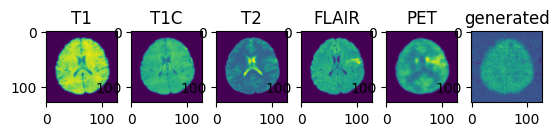

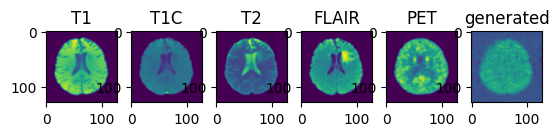

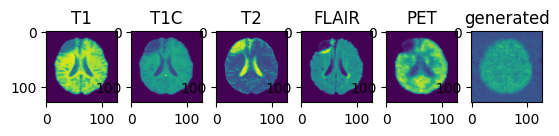

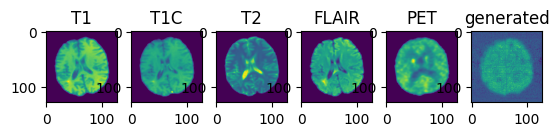

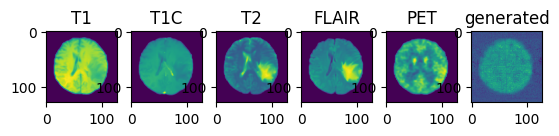

validation avg MS-SSIM: 0.4395 , train avg MS-SSIM: 0.4117
----------
epoch 341/400


Epoch :   0%|                                            | 0/24 [00:00<?, ?it/s]

Epoch :   4%|█▌                                  | 1/24 [01:37<37:19, 97.36s/it]

Epoch :   8%|███                                 | 2/24 [01:39<15:05, 41.15s/it]

Epoch :  12%|████▌                               | 3/24 [01:41<08:07, 23.23s/it]

Epoch :  17%|██████                              | 4/24 [01:42<04:55, 14.77s/it]

Epoch :  21%|███████▌                            | 5/24 [01:44<03:11, 10.09s/it]

Epoch :  25%|█████████                           | 6/24 [01:46<02:10,  7.27s/it]

Epoch :  29%|██████████▌                         | 7/24 [01:48<01:35,  5.61s/it]

Epoch :  33%|████████████                        | 8/24 [01:50<01:10,  4.40s/it]

Epoch :  38%|█████████████▌                      | 9/24 [01:52<00:53,  3.59s/it]

Epoch :  42%|██████████████▌                    | 10/24 [01:54<00:42,  3.04s/it]

Epoch :  46%|████████████████                   | 11/24 [01:55<00:34,  2.66s/it]

Epoch :  50%|█████████████████▌                 | 12/24 [01:57<00:28,  2.41s/it]

Epoch :  54%|██████████████████▉                | 13/24 [01:59<00:24,  2.25s/it]

Epoch :  58%|████████████████████▍              | 14/24 [02:01<00:21,  2.11s/it]

Epoch :  62%|█████████████████████▉             | 15/24 [02:03<00:18,  2.02s/it]

Epoch :  67%|███████████████████████▎           | 16/24 [02:05<00:16,  2.05s/it]

Epoch :  71%|████████████████████████▊          | 17/24 [02:07<00:13,  1.98s/it]

Epoch :  75%|██████████████████████████▎        | 18/24 [02:08<00:11,  1.92s/it]

Epoch :  79%|███████████████████████████▋       | 19/24 [02:10<00:09,  1.88s/it]

Epoch :  83%|█████████████████████████████▏     | 20/24 [02:12<00:07,  1.85s/it]

Epoch :  88%|██████████████████████████████▋    | 21/24 [02:14<00:05,  1.83s/it]

Epoch :  92%|████████████████████████████████   | 22/24 [02:16<00:03,  1.82s/it]

Epoch :  96%|█████████████████████████████████▌ | 23/24 [02:17<00:01,  1.81s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:18<00:00,  1.55s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:21<00:00,  5.90s/it]

----------
epoch 342/400


Epoch :   0%|                                            | 0/24 [00:00<?, ?it/s]

Epoch :   4%|█▌                                  | 1/24 [01:30<34:35, 90.25s/it]

Epoch :   8%|███                                 | 2/24 [01:32<14:01, 38.23s/it]

Epoch :  12%|████▌                               | 3/24 [01:33<07:33, 21.60s/it]

Epoch :  17%|██████                              | 4/24 [01:35<04:35, 13.78s/it]

Epoch :  21%|███████▌                            | 5/24 [01:37<02:59,  9.46s/it]

Epoch :  25%|█████████                           | 6/24 [01:39<02:03,  6.86s/it]

Epoch :  29%|██████████▌                         | 7/24 [01:41<01:28,  5.20s/it]

Epoch :  33%|████████████                        | 8/24 [01:42<01:05,  4.12s/it]

Epoch :  38%|█████████████▌                      | 9/24 [01:45<00:52,  3.50s/it]

Epoch :  42%|██████████████▌                    | 10/24 [01:46<00:41,  2.97s/it]

Epoch :  46%|████████████████                   | 11/24 [01:48<00:34,  2.62s/it]

Epoch :  50%|█████████████████▌                 | 12/24 [01:50<00:28,  2.37s/it]

Epoch :  54%|██████████████████▉                | 13/24 [01:52<00:24,  2.19s/it]

Epoch :  58%|████████████████████▍              | 14/24 [01:53<00:20,  2.07s/it]

Epoch :  62%|█████████████████████▉             | 15/24 [01:55<00:17,  1.99s/it]

Epoch :  67%|███████████████████████▎           | 16/24 [01:57<00:15,  1.93s/it]

Epoch :  71%|████████████████████████▊          | 17/24 [01:59<00:13,  1.90s/it]

Epoch :  75%|██████████████████████████▎        | 18/24 [02:01<00:11,  1.95s/it]

Epoch :  79%|███████████████████████████▋       | 19/24 [02:03<00:09,  1.91s/it]

Epoch :  83%|█████████████████████████████▏     | 20/24 [02:05<00:07,  1.88s/it]

Epoch :  88%|██████████████████████████████▋    | 21/24 [02:06<00:05,  1.86s/it]

Epoch :  92%|████████████████████████████████   | 22/24 [02:08<00:03,  1.84s/it]

Epoch :  96%|█████████████████████████████████▌ | 23/24 [02:10<00:01,  1.84s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:11<00:00,  1.58s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:14<00:00,  5.61s/it]

----------
epoch 343/400


Epoch :   0%|                                            | 0/24 [00:00<?, ?it/s]

Epoch :   4%|█▌                                  | 1/24 [01:37<37:28, 97.78s/it]

Epoch :   8%|███                                 | 2/24 [01:39<15:09, 41.36s/it]

Epoch :  12%|████▌                               | 3/24 [01:42<08:20, 23.83s/it]

Epoch :  17%|██████                              | 4/24 [01:44<05:06, 15.30s/it]

Epoch :  21%|███████▌                            | 5/24 [01:47<03:21, 10.62s/it]

Epoch :  25%|█████████                           | 6/24 [01:49<02:17,  7.66s/it]

Epoch :  29%|██████████▌                         | 7/24 [01:51<01:40,  5.91s/it]

Epoch :  33%|████████████                        | 8/24 [01:53<01:14,  4.63s/it]

Epoch :  38%|█████████████▌                      | 9/24 [01:55<00:57,  3.81s/it]

Epoch :  42%|██████████████▌                    | 10/24 [01:57<00:46,  3.30s/it]

Epoch :  46%|████████████████                   | 11/24 [01:59<00:39,  3.06s/it]

Epoch :  50%|█████████████████▌                 | 12/24 [02:01<00:32,  2.68s/it]

Epoch :  54%|██████████████████▉                | 13/24 [02:03<00:26,  2.43s/it]

Epoch :  58%|████████████████████▍              | 14/24 [02:05<00:22,  2.26s/it]

Epoch :  62%|█████████████████████▉             | 15/24 [02:07<00:19,  2.19s/it]

Epoch :  67%|███████████████████████▎           | 16/24 [02:09<00:16,  2.11s/it]

Epoch :  71%|████████████████████████▊          | 17/24 [02:11<00:14,  2.04s/it]

Epoch :  75%|██████████████████████████▎        | 18/24 [02:13<00:12,  2.10s/it]

Epoch :  79%|███████████████████████████▋       | 19/24 [02:16<00:11,  2.21s/it]

Epoch :  83%|█████████████████████████████▏     | 20/24 [02:18<00:08,  2.15s/it]

Epoch :  88%|██████████████████████████████▋    | 21/24 [02:20<00:06,  2.10s/it]

Epoch :  92%|████████████████████████████████   | 22/24 [02:22<00:04,  2.09s/it]

Epoch :  96%|█████████████████████████████████▌ | 23/24 [02:23<00:02,  2.04s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:25<00:00,  1.75s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:29<00:00,  6.23s/it]

----------
epoch 344/400


Epoch :   0%|                                            | 0/24 [00:00<?, ?it/s]

Epoch :   4%|█▍                                 | 1/24 [01:52<43:12, 112.74s/it]

Epoch :   8%|███                                 | 2/24 [01:55<17:33, 47.90s/it]

Epoch :  12%|████▌                               | 3/24 [01:57<09:25, 26.91s/it]

Epoch :  17%|██████                              | 4/24 [01:59<05:43, 17.19s/it]

Epoch :  21%|███████▌                            | 5/24 [02:01<03:41, 11.67s/it]

Epoch :  25%|█████████                           | 6/24 [02:03<02:29,  8.33s/it]

Epoch :  29%|██████████▌                         | 7/24 [02:05<01:46,  6.24s/it]

Epoch :  33%|████████████                        | 8/24 [02:07<01:19,  4.97s/it]

Epoch :  38%|█████████████▌                      | 9/24 [02:09<01:01,  4.08s/it]

Epoch :  42%|██████████████▌                    | 10/24 [02:11<00:49,  3.52s/it]

Epoch :  46%|████████████████                   | 11/24 [02:13<00:40,  3.11s/it]

Epoch :  50%|█████████████████▌                 | 12/24 [02:16<00:33,  2.83s/it]

Epoch :  54%|██████████████████▉                | 13/24 [02:18<00:29,  2.66s/it]

Epoch :  58%|████████████████████▍              | 14/24 [02:20<00:24,  2.48s/it]

Epoch :  62%|█████████████████████▉             | 15/24 [02:22<00:21,  2.37s/it]

Epoch :  67%|███████████████████████▎           | 16/24 [02:24<00:18,  2.31s/it]

Epoch :  71%|████████████████████████▊          | 17/24 [02:26<00:15,  2.23s/it]

Epoch :  75%|██████████████████████████▎        | 18/24 [02:28<00:12,  2.14s/it]

Epoch :  79%|███████████████████████████▋       | 19/24 [02:30<00:10,  2.12s/it]

Epoch :  83%|█████████████████████████████▏     | 20/24 [02:33<00:08,  2.20s/it]

Epoch :  88%|██████████████████████████████▋    | 21/24 [02:35<00:06,  2.24s/it]

Epoch :  92%|████████████████████████████████   | 22/24 [02:37<00:04,  2.17s/it]

Epoch :  96%|█████████████████████████████████▌ | 23/24 [02:39<00:02,  2.11s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:40<00:00,  1.80s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:44<00:00,  6.86s/it]

----------
epoch 345/400


Epoch :   0%|                                            | 0/24 [00:00<?, ?it/s]

Epoch :   4%|█▍                                 | 1/24 [02:01<46:37, 121.65s/it]

Epoch :   8%|███                                 | 2/24 [02:03<18:47, 51.27s/it]

Epoch :  12%|████▌                               | 3/24 [02:05<10:03, 28.75s/it]

Epoch :  17%|██████                              | 4/24 [02:07<06:03, 18.19s/it]

Epoch :  21%|███████▌                            | 5/24 [02:09<03:53, 12.31s/it]

Epoch :  25%|█████████                           | 6/24 [02:11<02:41,  8.95s/it]

Epoch :  29%|██████████▌                         | 7/24 [02:13<01:53,  6.70s/it]

Epoch :  33%|████████████                        | 8/24 [02:15<01:22,  5.17s/it]

Epoch :  38%|█████████████▌                      | 9/24 [02:17<01:02,  4.13s/it]

Epoch :  42%|██████████████▌                    | 10/24 [02:19<00:47,  3.42s/it]

Epoch :  46%|████████████████                   | 11/24 [02:21<00:38,  2.93s/it]

Epoch :  50%|█████████████████▌                 | 12/24 [02:23<00:31,  2.61s/it]

Epoch :  54%|██████████████████▉                | 13/24 [02:25<00:27,  2.52s/it]

Epoch :  58%|████████████████████▍              | 14/24 [02:27<00:23,  2.37s/it]

Epoch :  62%|█████████████████████▉             | 15/24 [02:29<00:21,  2.37s/it]

Epoch :  67%|███████████████████████▎           | 16/24 [02:31<00:17,  2.23s/it]

Epoch :  71%|████████████████████████▊          | 17/24 [02:34<00:15,  2.21s/it]

Epoch :  75%|██████████████████████████▎        | 18/24 [02:36<00:13,  2.19s/it]

Epoch :  79%|███████████████████████████▋       | 19/24 [02:38<00:10,  2.16s/it]

Epoch :  83%|█████████████████████████████▏     | 20/24 [02:40<00:08,  2.14s/it]

Epoch :  88%|██████████████████████████████▋    | 21/24 [02:42<00:06,  2.17s/it]

Epoch :  92%|████████████████████████████████   | 22/24 [02:44<00:04,  2.11s/it]

Epoch :  96%|█████████████████████████████████▌ | 23/24 [02:46<00:02,  2.16s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:47<00:00,  1.81s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:51<00:00,  7.16s/it]

----------
epoch 346/400


Epoch :   0%|                                            | 0/24 [00:00<?, ?it/s]

Epoch :   4%|█▍                                 | 1/24 [01:50<42:22, 110.53s/it]

Epoch :   8%|███                                 | 2/24 [01:52<17:10, 46.83s/it]

Epoch :  12%|████▌                               | 3/24 [01:54<09:15, 26.46s/it]

Epoch :  17%|██████                              | 4/24 [01:57<05:36, 16.84s/it]

Epoch :  21%|███████▌                            | 5/24 [01:59<03:40, 11.60s/it]

Epoch :  25%|█████████                           | 6/24 [02:01<02:30,  8.35s/it]

Epoch :  29%|██████████▌                         | 7/24 [02:03<01:46,  6.28s/it]

Epoch :  33%|████████████                        | 8/24 [02:06<01:22,  5.14s/it]

Epoch :  38%|█████████████▌                      | 9/24 [02:08<01:02,  4.15s/it]

Epoch :  42%|██████████████▌                    | 10/24 [02:10<00:48,  3.50s/it]

Epoch :  46%|████████████████                   | 11/24 [02:12<00:40,  3.13s/it]

Epoch :  50%|█████████████████▌                 | 12/24 [02:14<00:33,  2.81s/it]

Epoch :  54%|██████████████████▉                | 13/24 [02:16<00:28,  2.55s/it]

Epoch :  58%|████████████████████▍              | 14/24 [02:18<00:24,  2.40s/it]

Epoch :  62%|█████████████████████▉             | 15/24 [02:20<00:21,  2.37s/it]

Epoch :  67%|███████████████████████▎           | 16/24 [02:23<00:18,  2.36s/it]

Epoch :  71%|████████████████████████▊          | 17/24 [02:25<00:15,  2.27s/it]

Epoch :  75%|██████████████████████████▎        | 18/24 [02:27<00:13,  2.19s/it]

Epoch :  79%|███████████████████████████▋       | 19/24 [02:29<00:10,  2.13s/it]

Epoch :  83%|█████████████████████████████▏     | 20/24 [02:31<00:08,  2.12s/it]

Epoch :  88%|██████████████████████████████▋    | 21/24 [02:33<00:06,  2.13s/it]

Epoch :  92%|████████████████████████████████   | 22/24 [02:35<00:04,  2.14s/it]

Epoch :  96%|█████████████████████████████████▌ | 23/24 [02:37<00:02,  2.10s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:38<00:00,  1.77s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:42<00:00,  6.78s/it]

----------
epoch 347/400


Epoch :   0%|                                            | 0/24 [00:00<?, ?it/s]

Epoch :   4%|█▍                                 | 1/24 [01:50<42:22, 110.56s/it]

Epoch :   8%|███                                 | 2/24 [01:52<17:07, 46.69s/it]

Epoch :  12%|████▌                               | 3/24 [01:54<09:13, 26.35s/it]

Epoch :  17%|██████                              | 4/24 [01:56<05:35, 16.75s/it]

Epoch :  21%|███████▌                            | 5/24 [01:58<03:36, 11.40s/it]

Epoch :  25%|█████████                           | 6/24 [02:01<02:30,  8.34s/it]

Epoch :  29%|██████████▌                         | 7/24 [02:03<01:48,  6.39s/it]

Epoch :  33%|████████████                        | 8/24 [02:05<01:21,  5.06s/it]

Epoch :  38%|█████████████▌                      | 9/24 [02:08<01:04,  4.27s/it]

Epoch :  42%|██████████████▌                    | 10/24 [02:10<00:50,  3.60s/it]

Epoch :  46%|████████████████                   | 11/24 [02:12<00:41,  3.17s/it]

Epoch :  50%|█████████████████▌                 | 12/24 [02:14<00:34,  2.85s/it]

Epoch :  54%|██████████████████▉                | 13/24 [02:17<00:30,  2.74s/it]

Epoch :  58%|████████████████████▍              | 14/24 [02:19<00:25,  2.50s/it]

Epoch :  62%|█████████████████████▉             | 15/24 [02:21<00:21,  2.36s/it]

Epoch :  67%|███████████████████████▎           | 16/24 [02:22<00:17,  2.22s/it]

Epoch :  71%|████████████████████████▊          | 17/24 [02:24<00:15,  2.17s/it]

Epoch :  75%|██████████████████████████▎        | 18/24 [02:27<00:13,  2.24s/it]

Epoch :  79%|███████████████████████████▋       | 19/24 [02:29<00:10,  2.18s/it]

Epoch :  83%|█████████████████████████████▏     | 20/24 [02:31<00:08,  2.16s/it]

Epoch :  88%|██████████████████████████████▋    | 21/24 [02:33<00:06,  2.10s/it]

Epoch :  92%|████████████████████████████████   | 22/24 [02:35<00:04,  2.07s/it]

Epoch :  96%|█████████████████████████████████▌ | 23/24 [02:37<00:02,  2.00s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:38<00:00,  1.70s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:42<00:00,  6.76s/it]

----------
epoch 348/400


Epoch :   0%|                                            | 0/24 [00:00<?, ?it/s]

Epoch :   4%|█▍                                 | 1/24 [01:51<42:45, 111.55s/it]

Epoch :   8%|███                                 | 2/24 [01:53<17:14, 47.02s/it]

Epoch :  12%|████▌                               | 3/24 [01:55<09:18, 26.59s/it]

Epoch :  17%|██████                              | 4/24 [01:57<05:38, 16.92s/it]

Epoch :  21%|███████▌                            | 5/24 [02:00<03:41, 11.64s/it]

Epoch :  25%|█████████                           | 6/24 [02:02<02:32,  8.45s/it]

Epoch :  29%|██████████▌                         | 7/24 [02:04<01:48,  6.36s/it]

Epoch :  33%|████████████                        | 8/24 [02:06<01:19,  5.00s/it]

Epoch :  38%|█████████████▌                      | 9/24 [02:08<01:00,  4.04s/it]

Epoch :  42%|██████████████▌                    | 10/24 [02:10<00:47,  3.38s/it]

Epoch :  46%|████████████████                   | 11/24 [02:12<00:39,  3.04s/it]

Epoch :  50%|█████████████████▌                 | 12/24 [02:14<00:33,  2.80s/it]

Epoch :  54%|██████████████████▉                | 13/24 [02:16<00:27,  2.52s/it]

Epoch :  58%|████████████████████▍              | 14/24 [02:18<00:23,  2.32s/it]

Epoch :  62%|█████████████████████▉             | 15/24 [02:20<00:19,  2.18s/it]

Epoch :  67%|███████████████████████▎           | 16/24 [02:22<00:17,  2.21s/it]

Epoch :  71%|████████████████████████▊          | 17/24 [02:24<00:15,  2.17s/it]

Epoch :  75%|██████████████████████████▎        | 18/24 [02:27<00:14,  2.34s/it]

Epoch :  79%|███████████████████████████▋       | 19/24 [02:29<00:11,  2.35s/it]

Epoch :  83%|█████████████████████████████▏     | 20/24 [02:32<00:09,  2.39s/it]

Epoch :  88%|██████████████████████████████▋    | 21/24 [02:34<00:06,  2.24s/it]

Epoch :  92%|████████████████████████████████   | 22/24 [02:36<00:04,  2.20s/it]

Epoch :  96%|█████████████████████████████████▌ | 23/24 [02:38<00:02,  2.19s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:39<00:00,  1.86s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:44<00:00,  6.84s/it]

----------
epoch 349/400


Epoch :   0%|                                            | 0/24 [00:00<?, ?it/s]

Epoch :   4%|█▍                                 | 1/24 [01:57<44:51, 117.00s/it]

Epoch :   8%|███                                 | 2/24 [01:59<18:08, 49.48s/it]

Epoch :  12%|████▌                               | 3/24 [02:01<09:45, 27.87s/it]

Epoch :  17%|██████                              | 4/24 [02:03<05:54, 17.75s/it]

Epoch :  21%|███████▌                            | 5/24 [02:05<03:49, 12.10s/it]

Epoch :  25%|█████████                           | 6/24 [02:07<02:36,  8.67s/it]

Epoch :  29%|██████████▌                         | 7/24 [02:09<01:51,  6.53s/it]

Epoch :  33%|████████████                        | 8/24 [02:12<01:22,  5.16s/it]

Epoch :  38%|█████████████▌                      | 9/24 [02:14<01:02,  4.19s/it]

Epoch :  42%|██████████████▌                    | 10/24 [02:16<00:49,  3.54s/it]

Epoch :  46%|████████████████                   | 11/24 [02:18<00:39,  3.05s/it]

Epoch :  50%|█████████████████▌                 | 12/24 [02:20<00:32,  2.69s/it]

Epoch :  54%|██████████████████▉                | 13/24 [02:22<00:29,  2.64s/it]

Epoch :  58%|████████████████████▍              | 14/24 [02:24<00:25,  2.58s/it]

Epoch :  62%|█████████████████████▉             | 15/24 [02:27<00:22,  2.49s/it]

Epoch :  67%|███████████████████████▎           | 16/24 [02:29<00:18,  2.34s/it]

Epoch :  71%|████████████████████████▊          | 17/24 [02:31<00:15,  2.22s/it]

Epoch :  75%|██████████████████████████▎        | 18/24 [02:33<00:12,  2.14s/it]

Epoch :  79%|███████████████████████████▋       | 19/24 [02:35<00:10,  2.09s/it]

Epoch :  83%|█████████████████████████████▏     | 20/24 [02:37<00:08,  2.11s/it]

Epoch :  88%|██████████████████████████████▋    | 21/24 [02:39<00:06,  2.19s/it]

Epoch :  92%|████████████████████████████████   | 22/24 [02:41<00:04,  2.20s/it]

Epoch :  96%|█████████████████████████████████▌ | 23/24 [02:43<00:02,  2.17s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:44<00:00,  1.83s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:48<00:00,  7.04s/it]

----------
epoch 350/400


Epoch :   0%|                                            | 0/24 [00:00<?, ?it/s]

Epoch :   4%|█▍                                 | 1/24 [01:51<42:40, 111.34s/it]

Epoch :   8%|███                                 | 2/24 [01:53<17:14, 47.02s/it]

Epoch :  12%|████▌                               | 3/24 [01:55<09:19, 26.64s/it]

Epoch :  17%|██████                              | 4/24 [01:57<05:39, 16.96s/it]

Epoch :  21%|███████▌                            | 5/24 [01:59<03:39, 11.55s/it]

Epoch :  25%|█████████                           | 6/24 [02:02<02:32,  8.46s/it]

Epoch :  29%|██████████▌                         | 7/24 [02:04<01:47,  6.33s/it]

Epoch :  33%|████████████                        | 8/24 [02:06<01:19,  5.00s/it]

Epoch :  38%|█████████████▌                      | 9/24 [02:08<01:01,  4.07s/it]

Epoch :  42%|██████████████▌                    | 10/24 [02:10<00:47,  3.42s/it]

Epoch :  46%|████████████████                   | 11/24 [02:12<00:38,  2.99s/it]

Epoch :  50%|█████████████████▌                 | 12/24 [02:14<00:32,  2.72s/it]

Epoch :  54%|██████████████████▉                | 13/24 [02:16<00:28,  2.62s/it]

Epoch :  58%|████████████████████▍              | 14/24 [02:18<00:24,  2.45s/it]

Epoch :  62%|█████████████████████▉             | 15/24 [02:21<00:22,  2.49s/it]

Epoch :  67%|███████████████████████▎           | 16/24 [02:23<00:19,  2.41s/it]

Epoch :  71%|████████████████████████▊          | 17/24 [02:25<00:16,  2.30s/it]

Epoch :  75%|██████████████████████████▎        | 18/24 [02:27<00:13,  2.19s/it]

Epoch :  79%|███████████████████████████▋       | 19/24 [02:29<00:10,  2.14s/it]

Epoch :  83%|█████████████████████████████▏     | 20/24 [02:31<00:08,  2.12s/it]

Epoch :  88%|██████████████████████████████▋    | 21/24 [02:34<00:06,  2.17s/it]

Epoch :  92%|████████████████████████████████   | 22/24 [02:36<00:04,  2.13s/it]

Epoch :  96%|█████████████████████████████████▌ | 23/24 [02:38<00:02,  2.20s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:39<00:00,  1.88s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:43<00:00,  6.82s/it]

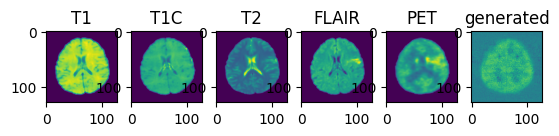

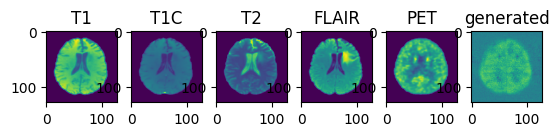

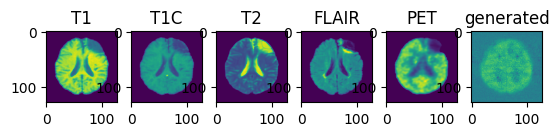

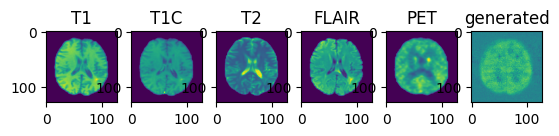

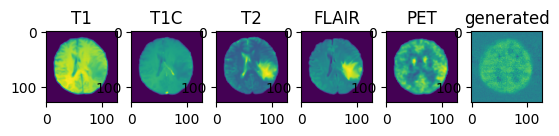

validation avg MS-SSIM: 0.4585 , train avg MS-SSIM: 0.4321
----------
epoch 351/400


Epoch :   0%|                                            | 0/24 [00:00<?, ?it/s]

Epoch :   4%|█▍                                 | 1/24 [01:58<45:18, 118.18s/it]

Epoch :   8%|███                                 | 2/24 [02:00<18:14, 49.74s/it]

Epoch :  12%|████▌                               | 3/24 [02:01<09:45, 27.87s/it]

Epoch :  17%|██████                              | 4/24 [02:03<05:54, 17.71s/it]

Epoch :  21%|███████▌                            | 5/24 [02:05<03:48, 12.04s/it]

Epoch :  25%|█████████                           | 6/24 [02:08<02:35,  8.65s/it]

Epoch :  29%|██████████▌                         | 7/24 [02:10<01:53,  6.68s/it]

Epoch :  33%|████████████                        | 8/24 [02:12<01:23,  5.22s/it]

Epoch :  38%|█████████████▌                      | 9/24 [02:14<01:03,  4.23s/it]

Epoch :  42%|██████████████▌                    | 10/24 [02:16<00:49,  3.54s/it]

Epoch :  46%|████████████████                   | 11/24 [02:18<00:40,  3.09s/it]

Epoch :  50%|█████████████████▌                 | 12/24 [02:20<00:33,  2.78s/it]

Epoch :  54%|██████████████████▉                | 13/24 [02:23<00:28,  2.60s/it]

Epoch :  58%|████████████████████▍              | 14/24 [02:25<00:24,  2.45s/it]

Epoch :  62%|█████████████████████▉             | 15/24 [02:27<00:21,  2.42s/it]

Epoch :  67%|███████████████████████▎           | 16/24 [02:29<00:17,  2.25s/it]

Epoch :  71%|████████████████████████▊          | 17/24 [02:31<00:15,  2.18s/it]

Epoch :  75%|██████████████████████████▎        | 18/24 [02:33<00:12,  2.17s/it]

Epoch :  79%|███████████████████████████▋       | 19/24 [02:35<00:10,  2.09s/it]

Epoch :  83%|█████████████████████████████▏     | 20/24 [02:37<00:08,  2.11s/it]

Epoch :  88%|██████████████████████████████▋    | 21/24 [02:39<00:06,  2.06s/it]

Epoch :  92%|████████████████████████████████   | 22/24 [02:41<00:04,  2.09s/it]

Epoch :  96%|█████████████████████████████████▌ | 23/24 [02:44<00:02,  2.16s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:45<00:00,  1.94s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:49<00:00,  7.07s/it]

----------
epoch 352/400


Epoch :   0%|                                            | 0/24 [00:00<?, ?it/s]

Epoch :   4%|█▍                                 | 1/24 [01:54<43:46, 114.19s/it]

Epoch :   8%|███                                 | 2/24 [01:56<17:40, 48.22s/it]

Epoch :  12%|████▌                               | 3/24 [01:58<09:30, 27.17s/it]

Epoch :  17%|██████                              | 4/24 [02:00<05:47, 17.38s/it]

Epoch :  21%|███████▌                            | 5/24 [02:02<03:44, 11.82s/it]

Epoch :  25%|█████████                           | 6/24 [02:04<02:34,  8.56s/it]

Epoch :  29%|██████████▌                         | 7/24 [02:07<01:50,  6.51s/it]

Epoch :  33%|████████████                        | 8/24 [02:09<01:23,  5.22s/it]

Epoch :  38%|█████████████▌                      | 9/24 [02:11<01:02,  4.20s/it]

Epoch :  42%|██████████████▌                    | 10/24 [02:13<00:48,  3.48s/it]

Epoch :  46%|████████████████                   | 11/24 [02:15<00:39,  3.08s/it]

Epoch :  50%|█████████████████▌                 | 12/24 [02:17<00:33,  2.76s/it]

Epoch :  54%|██████████████████▉                | 13/24 [02:19<00:27,  2.53s/it]

Epoch :  58%|████████████████████▍              | 14/24 [02:21<00:23,  2.39s/it]

Epoch :  62%|█████████████████████▉             | 15/24 [02:24<00:21,  2.36s/it]

Epoch :  67%|███████████████████████▎           | 16/24 [02:26<00:18,  2.28s/it]

Epoch :  71%|████████████████████████▊          | 17/24 [02:28<00:15,  2.29s/it]

Epoch :  75%|██████████████████████████▎        | 18/24 [02:30<00:13,  2.28s/it]

Epoch :  79%|███████████████████████████▋       | 19/24 [02:32<00:11,  2.20s/it]

Epoch :  83%|█████████████████████████████▏     | 20/24 [02:34<00:08,  2.13s/it]

Epoch :  88%|██████████████████████████████▋    | 21/24 [02:36<00:06,  2.04s/it]

Epoch :  92%|████████████████████████████████   | 22/24 [02:38<00:04,  2.04s/it]

Epoch :  96%|█████████████████████████████████▌ | 23/24 [02:41<00:02,  2.17s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:42<00:00,  1.86s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:46<00:00,  6.92s/it]

----------
epoch 353/400


Epoch :   0%|                                            | 0/24 [00:00<?, ?it/s]

Epoch :   4%|█▍                                 | 1/24 [01:57<45:11, 117.88s/it]

Epoch :   8%|███                                 | 2/24 [01:59<18:14, 49.73s/it]

Epoch :  12%|████▌                               | 3/24 [02:01<09:47, 27.97s/it]

Epoch :  17%|██████                              | 4/24 [02:04<05:55, 17.76s/it]

Epoch :  21%|███████▌                            | 5/24 [02:06<03:49, 12.09s/it]

Epoch :  25%|█████████                           | 6/24 [02:08<02:35,  8.64s/it]

Epoch :  29%|██████████▌                         | 7/24 [02:09<01:49,  6.41s/it]

Epoch :  33%|████████████                        | 8/24 [02:11<01:19,  4.95s/it]

Epoch :  38%|█████████████▌                      | 9/24 [02:13<01:00,  4.02s/it]

Epoch :  42%|██████████████▌                    | 10/24 [02:15<00:48,  3.49s/it]

Epoch :  46%|████████████████                   | 11/24 [02:18<00:39,  3.08s/it]

Epoch :  50%|█████████████████▌                 | 12/24 [02:20<00:33,  2.79s/it]

Epoch :  54%|██████████████████▉                | 13/24 [02:22<00:28,  2.60s/it]

Epoch :  58%|████████████████████▍              | 14/24 [02:24<00:24,  2.44s/it]

Epoch :  62%|█████████████████████▉             | 15/24 [02:26<00:21,  2.34s/it]

Epoch :  67%|███████████████████████▎           | 16/24 [02:29<00:18,  2.37s/it]

Epoch :  71%|████████████████████████▊          | 17/24 [02:31<00:16,  2.32s/it]

Epoch :  75%|██████████████████████████▎        | 18/24 [02:33<00:13,  2.24s/it]

Epoch :  79%|███████████████████████████▋       | 19/24 [02:35<00:11,  2.29s/it]

Epoch :  83%|█████████████████████████████▏     | 20/24 [02:37<00:08,  2.18s/it]

Epoch :  88%|██████████████████████████████▋    | 21/24 [02:39<00:06,  2.17s/it]

Epoch :  92%|████████████████████████████████   | 22/24 [02:41<00:04,  2.14s/it]

Epoch :  96%|█████████████████████████████████▌ | 23/24 [02:43<00:02,  2.08s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:44<00:00,  1.79s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:48<00:00,  7.02s/it]

----------
epoch 354/400


Epoch :   0%|                                            | 0/24 [00:00<?, ?it/s]

Epoch :   4%|█▍                                 | 1/24 [01:55<44:12, 115.32s/it]

Epoch :   8%|███                                 | 2/24 [01:57<17:52, 48.77s/it]

Epoch :  12%|████▌                               | 3/24 [01:59<09:38, 27.57s/it]

Epoch :  17%|██████                              | 4/24 [02:01<05:50, 17.51s/it]

Epoch :  21%|███████▌                            | 5/24 [02:04<03:48, 12.01s/it]

Epoch :  25%|█████████                           | 6/24 [02:06<02:35,  8.65s/it]

Epoch :  29%|██████████▌                         | 7/24 [02:08<01:50,  6.49s/it]

Epoch :  33%|████████████                        | 8/24 [02:10<01:20,  5.05s/it]

Epoch :  38%|█████████████▌                      | 9/24 [02:12<01:01,  4.13s/it]

Epoch :  42%|██████████████▌                    | 10/24 [02:14<00:48,  3.46s/it]

Epoch :  46%|████████████████                   | 11/24 [02:16<00:38,  3.00s/it]

Epoch :  50%|█████████████████▌                 | 12/24 [02:18<00:34,  2.88s/it]

Epoch :  54%|██████████████████▉                | 13/24 [02:21<00:29,  2.66s/it]

Epoch :  58%|████████████████████▍              | 14/24 [02:23<00:24,  2.44s/it]

Epoch :  62%|█████████████████████▉             | 15/24 [02:25<00:20,  2.31s/it]

Epoch :  67%|███████████████████████▎           | 16/24 [02:27<00:17,  2.21s/it]

Epoch :  71%|████████████████████████▊          | 17/24 [02:28<00:14,  2.11s/it]

Epoch :  75%|██████████████████████████▎        | 18/24 [02:30<00:12,  2.10s/it]

Epoch :  79%|███████████████████████████▋       | 19/24 [02:33<00:10,  2.16s/it]

Epoch :  83%|█████████████████████████████▏     | 20/24 [02:36<00:09,  2.37s/it]

Epoch :  88%|██████████████████████████████▋    | 21/24 [02:38<00:07,  2.36s/it]

Epoch :  92%|████████████████████████████████   | 22/24 [02:40<00:04,  2.25s/it]

Epoch :  96%|█████████████████████████████████▌ | 23/24 [02:42<00:02,  2.16s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:43<00:00,  1.81s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:47<00:00,  6.99s/it]

----------
epoch 355/400


Epoch :   0%|                                            | 0/24 [00:00<?, ?it/s]

Epoch :   4%|█▍                                 | 1/24 [01:53<43:34, 113.65s/it]

Epoch :   8%|███                                 | 2/24 [01:55<17:36, 48.02s/it]

Epoch :  12%|████▌                               | 3/24 [01:57<09:29, 27.11s/it]

Epoch :  17%|██████                              | 4/24 [02:00<05:45, 17.26s/it]

Epoch :  21%|███████▌                            | 5/24 [02:02<03:46, 11.92s/it]

Epoch :  25%|█████████                           | 6/24 [02:04<02:33,  8.54s/it]

Epoch :  29%|██████████▌                         | 7/24 [02:06<01:49,  6.42s/it]

Epoch :  33%|████████████                        | 8/24 [02:08<01:21,  5.09s/it]

Epoch :  38%|█████████████▌                      | 9/24 [02:11<01:02,  4.18s/it]

Epoch :  42%|██████████████▌                    | 10/24 [02:12<00:48,  3.50s/it]

Epoch :  46%|████████████████                   | 11/24 [02:14<00:39,  3.01s/it]

Epoch :  50%|█████████████████▌                 | 12/24 [02:17<00:33,  2.75s/it]

Epoch :  54%|██████████████████▉                | 13/24 [02:19<00:28,  2.62s/it]

Epoch :  58%|████████████████████▍              | 14/24 [02:22<00:26,  2.63s/it]

Epoch :  62%|█████████████████████▉             | 15/24 [02:24<00:21,  2.43s/it]

Epoch :  67%|███████████████████████▎           | 16/24 [02:26<00:18,  2.35s/it]

Epoch :  71%|████████████████████████▊          | 17/24 [02:28<00:15,  2.22s/it]

Epoch :  75%|██████████████████████████▎        | 18/24 [02:30<00:13,  2.18s/it]

Epoch :  79%|███████████████████████████▋       | 19/24 [02:32<00:10,  2.09s/it]

Epoch :  83%|█████████████████████████████▏     | 20/24 [02:33<00:08,  2.03s/it]

Epoch :  88%|██████████████████████████████▋    | 21/24 [02:36<00:06,  2.04s/it]

Epoch :  92%|████████████████████████████████   | 22/24 [02:37<00:04,  2.01s/it]

Epoch :  96%|█████████████████████████████████▌ | 23/24 [02:39<00:02,  2.01s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:41<00:00,  1.74s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:45<00:00,  6.89s/it]

----------
epoch 356/400


Epoch :   0%|                                            | 0/24 [00:00<?, ?it/s]

Epoch :   4%|█▍                                 | 1/24 [01:53<43:24, 113.25s/it]

Epoch :   8%|███                                 | 2/24 [01:55<17:33, 47.90s/it]

Epoch :  12%|████▌                               | 3/24 [01:57<09:24, 26.89s/it]

Epoch :  17%|██████                              | 4/24 [01:59<05:42, 17.13s/it]

Epoch :  21%|███████▌                            | 5/24 [02:01<03:42, 11.69s/it]

Epoch :  25%|█████████                           | 6/24 [02:03<02:32,  8.47s/it]

Epoch :  29%|██████████▌                         | 7/24 [02:06<01:51,  6.55s/it]

Epoch :  33%|████████████                        | 8/24 [02:08<01:22,  5.14s/it]

Epoch :  38%|█████████████▌                      | 9/24 [02:10<01:02,  4.18s/it]

Epoch :  42%|██████████████▌                    | 10/24 [02:12<00:49,  3.56s/it]

Epoch :  46%|████████████████                   | 11/24 [02:14<00:40,  3.09s/it]

Epoch :  50%|█████████████████▌                 | 12/24 [02:16<00:33,  2.83s/it]

Epoch :  54%|██████████████████▉                | 13/24 [02:19<00:31,  2.82s/it]

Epoch :  58%|████████████████████▍              | 14/24 [02:21<00:25,  2.57s/it]

Epoch :  62%|█████████████████████▉             | 15/24 [02:24<00:23,  2.62s/it]

Epoch :  67%|███████████████████████▎           | 16/24 [02:26<00:19,  2.46s/it]

Epoch :  71%|████████████████████████▊          | 17/24 [02:28<00:16,  2.31s/it]

Epoch :  75%|██████████████████████████▎        | 18/24 [02:30<00:13,  2.20s/it]

Epoch :  79%|███████████████████████████▋       | 19/24 [02:32<00:10,  2.16s/it]

Epoch :  83%|█████████████████████████████▏     | 20/24 [02:34<00:08,  2.21s/it]

Epoch :  88%|██████████████████████████████▋    | 21/24 [02:36<00:06,  2.17s/it]

Epoch :  92%|████████████████████████████████   | 22/24 [02:39<00:04,  2.15s/it]

Epoch :  96%|█████████████████████████████████▌ | 23/24 [02:41<00:02,  2.19s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:42<00:00,  1.84s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:46<00:00,  6.93s/it]

----------
epoch 357/400


Epoch :   0%|                                            | 0/24 [00:00<?, ?it/s]

Epoch :   4%|█▍                                 | 1/24 [01:59<45:48, 119.52s/it]

Epoch :   8%|███                                 | 2/24 [02:01<18:29, 50.41s/it]

Epoch :  12%|████▌                               | 3/24 [02:03<09:55, 28.38s/it]

Epoch :  17%|██████                              | 4/24 [02:06<06:02, 18.10s/it]

Epoch :  21%|███████▌                            | 5/24 [02:08<03:54, 12.36s/it]

Epoch :  25%|█████████                           | 6/24 [02:10<02:41,  8.95s/it]

Epoch :  29%|██████████▌                         | 7/24 [02:12<01:54,  6.74s/it]

Epoch :  33%|████████████                        | 8/24 [02:15<01:25,  5.37s/it]

Epoch :  38%|█████████████▌                      | 9/24 [02:17<01:07,  4.53s/it]

Epoch :  42%|██████████████▌                    | 10/24 [02:20<00:53,  3.81s/it]

Epoch :  46%|████████████████                   | 11/24 [02:22<00:44,  3.44s/it]

Epoch :  50%|█████████████████▌                 | 12/24 [02:25<00:38,  3.17s/it]

Epoch :  54%|██████████████████▉                | 13/24 [02:27<00:31,  2.87s/it]

Epoch :  58%|████████████████████▍              | 14/24 [02:29<00:26,  2.64s/it]

Epoch :  62%|█████████████████████▉             | 15/24 [02:31<00:22,  2.46s/it]

Epoch :  67%|███████████████████████▎           | 16/24 [02:33<00:18,  2.36s/it]

Epoch :  71%|████████████████████████▊          | 17/24 [02:36<00:17,  2.50s/it]

Epoch :  75%|██████████████████████████▎        | 18/24 [02:38<00:14,  2.45s/it]

Epoch :  79%|███████████████████████████▋       | 19/24 [02:41<00:11,  2.37s/it]

Epoch :  83%|█████████████████████████████▏     | 20/24 [02:43<00:09,  2.25s/it]

Epoch :  88%|██████████████████████████████▋    | 21/24 [02:45<00:06,  2.20s/it]

Epoch :  92%|████████████████████████████████   | 22/24 [02:47<00:04,  2.20s/it]

Epoch :  96%|█████████████████████████████████▌ | 23/24 [02:49<00:02,  2.23s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:50<00:00,  1.86s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:54<00:00,  7.28s/it]

----------
epoch 358/400


Epoch :   0%|                                            | 0/24 [00:00<?, ?it/s]

Epoch :   4%|█▍                                 | 1/24 [01:57<45:12, 117.92s/it]

Epoch :   8%|███                                 | 2/24 [02:00<18:17, 49.89s/it]

Epoch :  12%|████▌                               | 3/24 [02:02<09:51, 28.16s/it]

Epoch :  17%|██████                              | 4/24 [02:04<05:59, 18.00s/it]

Epoch :  21%|███████▌                            | 5/24 [02:06<03:52, 12.25s/it]

Epoch :  25%|█████████                           | 6/24 [02:09<02:38,  8.79s/it]

Epoch :  29%|██████████▌                         | 7/24 [02:10<01:50,  6.52s/it]

Epoch :  33%|████████████                        | 8/24 [02:13<01:22,  5.13s/it]

Epoch :  38%|█████████████▌                      | 9/24 [02:15<01:04,  4.30s/it]

Epoch :  42%|██████████████▌                    | 10/24 [02:17<00:50,  3.64s/it]

Epoch :  46%|████████████████                   | 11/24 [02:20<00:42,  3.25s/it]

Epoch :  50%|█████████████████▌                 | 12/24 [02:22<00:34,  2.86s/it]

Epoch :  54%|██████████████████▉                | 13/24 [02:24<00:29,  2.64s/it]

Epoch :  58%|████████████████████▍              | 14/24 [02:26<00:24,  2.46s/it]

Epoch :  62%|█████████████████████▉             | 15/24 [02:28<00:20,  2.31s/it]

Epoch :  67%|███████████████████████▎           | 16/24 [02:30<00:18,  2.27s/it]

Epoch :  71%|████████████████████████▊          | 17/24 [02:32<00:15,  2.23s/it]

Epoch :  75%|██████████████████████████▎        | 18/24 [02:34<00:13,  2.28s/it]

Epoch :  79%|███████████████████████████▋       | 19/24 [02:37<00:11,  2.28s/it]

Epoch :  83%|█████████████████████████████▏     | 20/24 [02:39<00:08,  2.22s/it]

Epoch :  88%|██████████████████████████████▋    | 21/24 [02:41<00:06,  2.15s/it]

Epoch :  92%|████████████████████████████████   | 22/24 [02:44<00:04,  2.35s/it]

Epoch :  96%|█████████████████████████████████▌ | 23/24 [02:46<00:02,  2.27s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:47<00:00,  1.90s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:51<00:00,  7.13s/it]

----------
epoch 359/400


Epoch :   0%|                                            | 0/24 [00:00<?, ?it/s]

Epoch :   4%|█▍                                 | 1/24 [01:59<45:44, 119.32s/it]

Epoch :   8%|███                                 | 2/24 [02:01<18:27, 50.35s/it]

Epoch :  12%|████▌                               | 3/24 [02:03<09:54, 28.30s/it]

Epoch :  17%|██████                              | 4/24 [02:06<06:02, 18.15s/it]

Epoch :  21%|███████▌                            | 5/24 [02:08<03:54, 12.36s/it]

Epoch :  25%|█████████                           | 6/24 [02:10<02:39,  8.85s/it]

Epoch :  29%|██████████▌                         | 7/24 [02:12<01:52,  6.60s/it]

Epoch :  33%|████████████                        | 8/24 [02:14<01:22,  5.15s/it]

Epoch :  38%|█████████████▌                      | 9/24 [02:16<01:03,  4.25s/it]

Epoch :  42%|██████████████▌                    | 10/24 [02:18<00:51,  3.71s/it]

Epoch :  46%|████████████████                   | 11/24 [02:20<00:41,  3.18s/it]

Epoch :  50%|█████████████████▌                 | 12/24 [02:23<00:35,  2.97s/it]

Epoch :  54%|██████████████████▉                | 13/24 [02:25<00:29,  2.64s/it]

Epoch :  58%|████████████████████▍              | 14/24 [02:27<00:25,  2.52s/it]

Epoch :  62%|█████████████████████▉             | 15/24 [02:29<00:21,  2.38s/it]

Epoch :  67%|███████████████████████▎           | 16/24 [02:31<00:18,  2.33s/it]

Epoch :  71%|████████████████████████▊          | 17/24 [02:33<00:15,  2.23s/it]

Epoch :  75%|██████████████████████████▎        | 18/24 [02:35<00:12,  2.13s/it]

Epoch :  79%|███████████████████████████▋       | 19/24 [02:37<00:10,  2.09s/it]

Epoch :  83%|█████████████████████████████▏     | 20/24 [02:39<00:08,  2.11s/it]

Epoch :  88%|██████████████████████████████▋    | 21/24 [02:42<00:06,  2.17s/it]

Epoch :  92%|████████████████████████████████   | 22/24 [02:44<00:04,  2.22s/it]

Epoch :  96%|█████████████████████████████████▌ | 23/24 [02:46<00:02,  2.22s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:47<00:00,  1.90s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:51<00:00,  7.15s/it]

----------
epoch 360/400


Epoch :   0%|                                            | 0/24 [00:00<?, ?it/s]

Epoch :   4%|█▍                                 | 1/24 [01:56<44:35, 116.34s/it]

Epoch :   8%|███                                 | 2/24 [01:58<18:04, 49.30s/it]

Epoch :  12%|████▌                               | 3/24 [02:00<09:44, 27.81s/it]

Epoch :  17%|██████                              | 4/24 [02:03<05:53, 17.70s/it]

Epoch :  21%|███████▌                            | 5/24 [02:05<03:51, 12.18s/it]

Epoch :  25%|█████████                           | 6/24 [02:08<02:45,  9.19s/it]

Epoch :  29%|██████████▌                         | 7/24 [02:10<01:56,  6.85s/it]

Epoch :  33%|████████████                        | 8/24 [02:13<01:25,  5.33s/it]

Epoch :  38%|█████████████▌                      | 9/24 [02:14<01:03,  4.26s/it]

Epoch :  42%|██████████████▌                    | 10/24 [02:17<00:50,  3.59s/it]

Epoch :  46%|████████████████                   | 11/24 [02:18<00:39,  3.07s/it]

Epoch :  50%|█████████████████▌                 | 12/24 [02:21<00:35,  2.95s/it]

Epoch :  54%|██████████████████▉                | 13/24 [02:24<00:31,  2.83s/it]

Epoch :  58%|████████████████████▍              | 14/24 [02:27<00:28,  2.88s/it]

Epoch :  62%|█████████████████████▉             | 15/24 [02:29<00:23,  2.64s/it]

Epoch :  67%|███████████████████████▎           | 16/24 [02:31<00:20,  2.60s/it]

Epoch :  71%|████████████████████████▊          | 17/24 [02:34<00:18,  2.62s/it]

Epoch :  75%|██████████████████████████▎        | 18/24 [02:36<00:15,  2.54s/it]

Epoch :  79%|███████████████████████████▋       | 19/24 [02:39<00:12,  2.54s/it]

Epoch :  83%|█████████████████████████████▏     | 20/24 [02:41<00:09,  2.33s/it]

Epoch :  88%|██████████████████████████████▋    | 21/24 [02:42<00:06,  2.16s/it]

Epoch :  92%|████████████████████████████████   | 22/24 [02:44<00:04,  2.09s/it]

Epoch :  96%|█████████████████████████████████▌ | 23/24 [02:47<00:02,  2.37s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:49<00:00,  2.01s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:53<00:00,  7.24s/it]

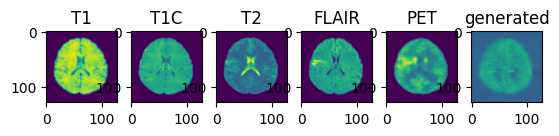

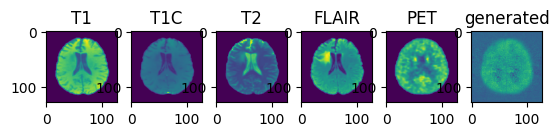

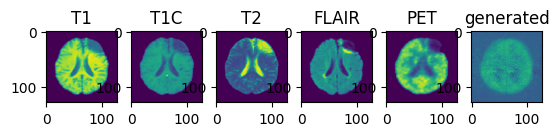

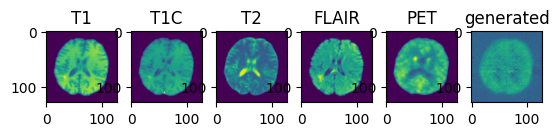

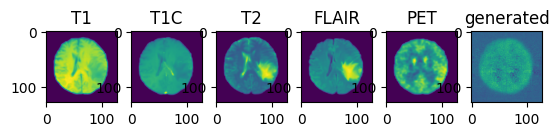

validation avg MS-SSIM: 0.4644 , train avg MS-SSIM: 0.4389
----------
epoch 361/400


Epoch :   0%|                                            | 0/24 [00:00<?, ?it/s]

Epoch :   4%|█▌                                  | 1/24 [01:29<34:15, 89.39s/it]

Epoch :   8%|███                                 | 2/24 [01:31<13:52, 37.85s/it]

Epoch :  12%|████▌                               | 3/24 [01:32<07:28, 21.38s/it]

Epoch :  17%|██████                              | 4/24 [01:34<04:33, 13.66s/it]

Epoch :  21%|███████▌                            | 5/24 [01:36<02:58,  9.38s/it]

Epoch :  25%|█████████                           | 6/24 [01:38<02:04,  6.94s/it]

Epoch :  29%|██████████▌                         | 7/24 [01:40<01:29,  5.26s/it]

Epoch :  33%|████████████                        | 8/24 [01:42<01:06,  4.17s/it]

Epoch :  38%|█████████████▌                      | 9/24 [01:44<00:51,  3.43s/it]

Epoch :  42%|██████████████▌                    | 10/24 [01:45<00:40,  2.92s/it]

Epoch :  46%|████████████████                   | 11/24 [01:47<00:33,  2.58s/it]

Epoch :  50%|█████████████████▌                 | 12/24 [01:49<00:28,  2.34s/it]

Epoch :  54%|██████████████████▉                | 13/24 [01:51<00:23,  2.18s/it]

Epoch :  58%|████████████████████▍              | 14/24 [01:53<00:21,  2.16s/it]

Epoch :  62%|█████████████████████▉             | 15/24 [01:55<00:18,  2.06s/it]

Epoch :  67%|███████████████████████▎           | 16/24 [01:57<00:15,  1.98s/it]

Epoch :  71%|████████████████████████▊          | 17/24 [01:58<00:13,  1.93s/it]

Epoch :  75%|██████████████████████████▎        | 18/24 [02:00<00:11,  1.89s/it]

Epoch :  79%|███████████████████████████▋       | 19/24 [02:02<00:09,  1.88s/it]

Epoch :  83%|█████████████████████████████▏     | 20/24 [02:04<00:07,  1.86s/it]

Epoch :  88%|██████████████████████████████▋    | 21/24 [02:06<00:05,  1.84s/it]

Epoch :  92%|████████████████████████████████   | 22/24 [02:08<00:03,  1.92s/it]

Epoch :  96%|█████████████████████████████████▌ | 23/24 [02:10<00:01,  1.89s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:11<00:00,  1.61s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:13<00:00,  5.58s/it]

----------
epoch 362/400


Epoch :   0%|                                            | 0/24 [00:00<?, ?it/s]

Epoch :   4%|█▍                                 | 1/24 [01:42<39:21, 102.66s/it]

Epoch :   8%|███                                 | 2/24 [01:44<15:58, 43.58s/it]

Epoch :  12%|████▌                               | 3/24 [01:46<08:35, 24.56s/it]

Epoch :  17%|██████                              | 4/24 [01:48<05:14, 15.70s/it]

Epoch :  21%|███████▌                            | 5/24 [01:51<03:26, 10.86s/it]

Epoch :  25%|█████████                           | 6/24 [01:53<02:21,  7.86s/it]

Epoch :  29%|██████████▌                         | 7/24 [01:55<01:44,  6.15s/it]

Epoch :  33%|████████████                        | 8/24 [01:58<01:17,  4.87s/it]

Epoch :  38%|█████████████▌                      | 9/24 [02:00<01:00,  4.06s/it]

Epoch :  42%|██████████████▌                    | 10/24 [02:02<00:48,  3.50s/it]

Epoch :  46%|████████████████                   | 11/24 [02:04<00:40,  3.14s/it]

Epoch :  50%|█████████████████▌                 | 12/24 [02:07<00:36,  3.01s/it]

Epoch :  54%|██████████████████▉                | 13/24 [02:09<00:29,  2.70s/it]

Epoch :  58%|████████████████████▍              | 14/24 [02:11<00:25,  2.58s/it]

Epoch :  62%|█████████████████████▉             | 15/24 [02:13<00:21,  2.44s/it]

Epoch :  67%|███████████████████████▎           | 16/24 [02:16<00:19,  2.47s/it]

Epoch :  71%|████████████████████████▊          | 17/24 [02:19<00:17,  2.50s/it]

Epoch :  75%|██████████████████████████▎        | 18/24 [02:21<00:14,  2.37s/it]

Epoch :  79%|███████████████████████████▋       | 19/24 [02:23<00:11,  2.23s/it]

Epoch :  83%|█████████████████████████████▏     | 20/24 [02:25<00:08,  2.21s/it]

Epoch :  88%|██████████████████████████████▋    | 21/24 [02:27<00:06,  2.14s/it]

Epoch :  92%|████████████████████████████████   | 22/24 [02:29<00:04,  2.10s/it]

Epoch :  96%|█████████████████████████████████▌ | 23/24 [02:31<00:02,  2.11s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:32<00:00,  1.87s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:36<00:00,  6.54s/it]

----------
epoch 363/400


Epoch :   0%|                                            | 0/24 [00:00<?, ?it/s]

Epoch :   4%|█▍                                 | 1/24 [01:58<45:28, 118.64s/it]

Epoch :   8%|███                                 | 2/24 [02:01<18:26, 50.28s/it]

Epoch :  12%|████▌                               | 3/24 [02:03<09:52, 28.20s/it]

Epoch :  17%|██████                              | 4/24 [02:05<05:59, 17.98s/it]

Epoch :  21%|███████▌                            | 5/24 [02:07<03:51, 12.19s/it]

Epoch :  25%|█████████                           | 6/24 [02:09<02:36,  8.72s/it]

Epoch :  29%|██████████▌                         | 7/24 [02:11<01:51,  6.57s/it]

Epoch :  33%|████████████                        | 8/24 [02:13<01:23,  5.21s/it]

Epoch :  38%|█████████████▌                      | 9/24 [02:16<01:04,  4.33s/it]

Epoch :  42%|██████████████▌                    | 10/24 [02:18<00:53,  3.85s/it]

Epoch :  46%|████████████████                   | 11/24 [02:20<00:42,  3.28s/it]

Epoch :  50%|█████████████████▌                 | 12/24 [02:22<00:34,  2.91s/it]

Epoch :  54%|██████████████████▉                | 13/24 [02:24<00:28,  2.63s/it]

Epoch :  58%|████████████████████▍              | 14/24 [02:26<00:24,  2.42s/it]

Epoch :  62%|█████████████████████▉             | 15/24 [02:28<00:21,  2.34s/it]

Epoch :  67%|███████████████████████▎           | 16/24 [02:31<00:18,  2.27s/it]

Epoch :  71%|████████████████████████▊          | 17/24 [02:33<00:15,  2.19s/it]

Epoch :  75%|██████████████████████████▎        | 18/24 [02:35<00:13,  2.32s/it]

Epoch :  79%|███████████████████████████▋       | 19/24 [02:37<00:11,  2.30s/it]

Epoch :  83%|█████████████████████████████▏     | 20/24 [02:40<00:09,  2.25s/it]

Epoch :  88%|██████████████████████████████▋    | 21/24 [02:42<00:06,  2.22s/it]

Epoch :  92%|████████████████████████████████   | 22/24 [02:44<00:04,  2.19s/it]

Epoch :  96%|█████████████████████████████████▌ | 23/24 [02:46<00:02,  2.14s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:47<00:00,  1.82s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:51<00:00,  7.16s/it]

----------
epoch 364/400


Epoch :   0%|                                            | 0/24 [00:00<?, ?it/s]

Epoch :   4%|█▍                                 | 1/24 [01:59<45:53, 119.70s/it]

Epoch :   8%|███                                 | 2/24 [02:01<18:28, 50.40s/it]

Epoch :  12%|████▌                               | 3/24 [02:04<09:58, 28.49s/it]

Epoch :  17%|██████                              | 4/24 [02:06<06:01, 18.05s/it]

Epoch :  21%|███████▌                            | 5/24 [02:08<03:53, 12.28s/it]

Epoch :  25%|█████████                           | 6/24 [02:10<02:38,  8.80s/it]

Epoch :  29%|██████████▌                         | 7/24 [02:12<01:54,  6.71s/it]

Epoch :  33%|████████████                        | 8/24 [02:14<01:25,  5.33s/it]

Epoch :  38%|█████████████▌                      | 9/24 [02:16<01:04,  4.29s/it]

Epoch :  42%|██████████████▌                    | 10/24 [02:18<00:50,  3.59s/it]

Epoch :  46%|████████████████                   | 11/24 [02:20<00:40,  3.11s/it]

Epoch :  50%|█████████████████▌                 | 12/24 [02:23<00:34,  2.90s/it]

Epoch :  54%|██████████████████▉                | 13/24 [02:25<00:28,  2.60s/it]

Epoch :  58%|████████████████████▍              | 14/24 [02:27<00:24,  2.46s/it]

Epoch :  62%|█████████████████████▉             | 15/24 [02:29<00:20,  2.33s/it]

Epoch :  67%|███████████████████████▎           | 16/24 [02:31<00:18,  2.28s/it]

Epoch :  71%|████████████████████████▊          | 17/24 [02:33<00:15,  2.22s/it]

Epoch :  75%|██████████████████████████▎        | 18/24 [02:36<00:13,  2.27s/it]

Epoch :  79%|███████████████████████████▋       | 19/24 [02:38<00:11,  2.22s/it]

Epoch :  83%|█████████████████████████████▏     | 20/24 [02:41<00:09,  2.40s/it]

Epoch :  88%|██████████████████████████████▋    | 21/24 [02:43<00:07,  2.36s/it]

Epoch :  92%|████████████████████████████████   | 22/24 [02:45<00:04,  2.33s/it]

Epoch :  96%|█████████████████████████████████▌ | 23/24 [02:47<00:02,  2.25s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:48<00:00,  1.92s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:52<00:00,  7.19s/it]

----------
epoch 365/400


Epoch :   0%|                                            | 0/24 [00:00<?, ?it/s]

Epoch :   4%|█▍                                 | 1/24 [02:02<46:54, 122.38s/it]

Epoch :   8%|███                                 | 2/24 [02:04<18:59, 51.81s/it]

Epoch :  12%|████▌                               | 3/24 [02:06<10:11, 29.14s/it]

Epoch :  17%|██████                              | 4/24 [02:09<06:09, 18.46s/it]

Epoch :  21%|███████▌                            | 5/24 [02:11<04:01, 12.73s/it]

Epoch :  25%|█████████                           | 6/24 [02:13<02:43,  9.06s/it]

Epoch :  29%|██████████▌                         | 7/24 [02:15<01:55,  6.78s/it]

Epoch :  33%|████████████                        | 8/24 [02:17<01:25,  5.36s/it]

Epoch :  38%|█████████████▌                      | 9/24 [02:20<01:06,  4.45s/it]

Epoch :  42%|██████████████▌                    | 10/24 [02:22<00:51,  3.69s/it]

Epoch :  46%|████████████████                   | 11/24 [02:24<00:40,  3.13s/it]

Epoch :  50%|█████████████████▌                 | 12/24 [02:26<00:32,  2.74s/it]

Epoch :  54%|██████████████████▉                | 13/24 [02:28<00:28,  2.58s/it]

Epoch :  58%|████████████████████▍              | 14/24 [02:30<00:24,  2.43s/it]

Epoch :  62%|█████████████████████▉             | 15/24 [02:32<00:21,  2.34s/it]

Epoch :  67%|███████████████████████▎           | 16/24 [02:34<00:18,  2.26s/it]

Epoch :  71%|████████████████████████▊          | 17/24 [02:36<00:15,  2.18s/it]

Epoch :  75%|██████████████████████████▎        | 18/24 [02:38<00:12,  2.16s/it]

Epoch :  79%|███████████████████████████▋       | 19/24 [02:40<00:10,  2.07s/it]

Epoch :  83%|█████████████████████████████▏     | 20/24 [02:42<00:08,  2.13s/it]

Epoch :  88%|██████████████████████████████▋    | 21/24 [02:44<00:06,  2.09s/it]

Epoch :  92%|████████████████████████████████   | 22/24 [02:47<00:04,  2.25s/it]

Epoch :  96%|█████████████████████████████████▌ | 23/24 [02:49<00:02,  2.19s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:50<00:00,  1.88s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:54<00:00,  7.29s/it]

----------
epoch 366/400


Epoch :   0%|                                            | 0/24 [00:00<?, ?it/s]

Epoch :   4%|█▍                                 | 1/24 [01:57<45:08, 117.75s/it]

Epoch :   8%|███                                 | 2/24 [01:59<18:15, 49.79s/it]

Epoch :  12%|████▌                               | 3/24 [02:02<09:51, 28.14s/it]

Epoch :  17%|██████                              | 4/24 [02:05<06:02, 18.11s/it]

Epoch :  21%|███████▌                            | 5/24 [02:07<03:56, 12.45s/it]

Epoch :  25%|█████████                           | 6/24 [02:09<02:41,  8.97s/it]

Epoch :  29%|██████████▌                         | 7/24 [02:12<01:56,  6.87s/it]

Epoch :  33%|████████████                        | 8/24 [02:14<01:25,  5.36s/it]

Epoch :  38%|█████████████▌                      | 9/24 [02:16<01:05,  4.39s/it]

Epoch :  42%|██████████████▌                    | 10/24 [02:18<00:51,  3.66s/it]

Epoch :  46%|████████████████                   | 11/24 [02:20<00:41,  3.20s/it]

Epoch :  50%|█████████████████▌                 | 12/24 [02:23<00:35,  2.98s/it]

Epoch :  54%|██████████████████▉                | 13/24 [02:25<00:30,  2.81s/it]

Epoch :  58%|████████████████████▍              | 14/24 [02:28<00:26,  2.65s/it]

Epoch :  62%|█████████████████████▉             | 15/24 [02:30<00:23,  2.63s/it]

Epoch :  67%|███████████████████████▎           | 16/24 [02:33<00:21,  2.64s/it]

Epoch :  71%|████████████████████████▊          | 17/24 [02:35<00:17,  2.50s/it]

Epoch :  75%|██████████████████████████▎        | 18/24 [02:37<00:14,  2.40s/it]

Epoch :  79%|███████████████████████████▋       | 19/24 [02:39<00:11,  2.29s/it]

Epoch :  83%|█████████████████████████████▏     | 20/24 [02:41<00:09,  2.29s/it]

Epoch :  88%|██████████████████████████████▋    | 21/24 [02:44<00:07,  2.44s/it]

Epoch :  92%|████████████████████████████████   | 22/24 [02:46<00:04,  2.32s/it]

Epoch :  96%|█████████████████████████████████▌ | 23/24 [02:49<00:02,  2.31s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:50<00:00,  1.96s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:54<00:00,  7.28s/it]

----------
epoch 367/400


Epoch :   0%|                                            | 0/24 [00:00<?, ?it/s]

Epoch :   4%|█▍                                 | 1/24 [02:03<47:18, 123.39s/it]

Epoch :   8%|███                                 | 2/24 [02:05<19:03, 51.97s/it]

Epoch :  12%|████▌                               | 3/24 [02:07<10:12, 29.16s/it]

Epoch :  17%|██████                              | 4/24 [02:09<06:09, 18.46s/it]

Epoch :  21%|███████▌                            | 5/24 [02:11<03:58, 12.53s/it]

Epoch :  25%|█████████                           | 6/24 [02:13<02:42,  9.02s/it]

Epoch :  29%|██████████▌                         | 7/24 [02:15<01:54,  6.76s/it]

Epoch :  33%|████████████                        | 8/24 [02:17<01:23,  5.22s/it]

Epoch :  38%|█████████████▌                      | 9/24 [02:20<01:05,  4.38s/it]

Epoch :  42%|██████████████▌                    | 10/24 [02:22<00:52,  3.76s/it]

Epoch :  46%|████████████████                   | 11/24 [02:24<00:42,  3.28s/it]

Epoch :  50%|█████████████████▌                 | 12/24 [02:26<00:35,  2.93s/it]

Epoch :  54%|██████████████████▉                | 13/24 [02:29<00:30,  2.78s/it]

Epoch :  58%|████████████████████▍              | 14/24 [02:31<00:25,  2.56s/it]

Epoch :  62%|█████████████████████▉             | 15/24 [02:33<00:22,  2.46s/it]

Epoch :  67%|███████████████████████▎           | 16/24 [02:35<00:18,  2.30s/it]

Epoch :  71%|████████████████████████▊          | 17/24 [02:37<00:16,  2.31s/it]

Epoch :  75%|██████████████████████████▎        | 18/24 [02:40<00:14,  2.38s/it]

Epoch :  79%|███████████████████████████▋       | 19/24 [02:42<00:11,  2.37s/it]

Epoch :  83%|█████████████████████████████▏     | 20/24 [02:45<00:09,  2.36s/it]

Epoch :  88%|██████████████████████████████▋    | 21/24 [02:47<00:06,  2.31s/it]

Epoch :  92%|████████████████████████████████   | 22/24 [02:49<00:04,  2.32s/it]

Epoch :  96%|█████████████████████████████████▌ | 23/24 [02:51<00:02,  2.27s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:52<00:00,  1.89s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:57<00:00,  7.39s/it]

----------
epoch 368/400


Epoch :   0%|                                            | 0/24 [00:00<?, ?it/s]

Epoch :   4%|█▍                                 | 1/24 [02:00<46:19, 120.83s/it]

Epoch :   8%|███                                 | 2/24 [02:02<18:42, 51.03s/it]

Epoch :  12%|████▌                               | 3/24 [02:05<10:07, 28.91s/it]

Epoch :  17%|██████                              | 4/24 [02:07<06:06, 18.35s/it]

Epoch :  21%|███████▌                            | 5/24 [02:09<03:57, 12.53s/it]

Epoch :  25%|█████████                           | 6/24 [02:12<02:43,  9.07s/it]

Epoch :  29%|██████████▌                         | 7/24 [02:14<01:56,  6.83s/it]

Epoch :  33%|████████████                        | 8/24 [02:16<01:25,  5.32s/it]

Epoch :  38%|█████████████▌                      | 9/24 [02:18<01:03,  4.24s/it]

Epoch :  42%|██████████████▌                    | 10/24 [02:20<00:49,  3.50s/it]

Epoch :  46%|████████████████                   | 11/24 [02:22<00:40,  3.14s/it]

Epoch :  50%|█████████████████▌                 | 12/24 [02:24<00:33,  2.78s/it]

Epoch :  54%|██████████████████▉                | 13/24 [02:26<00:28,  2.56s/it]

Epoch :  58%|████████████████████▍              | 14/24 [02:28<00:24,  2.41s/it]

Epoch :  62%|█████████████████████▉             | 15/24 [02:30<00:20,  2.29s/it]

Epoch :  67%|███████████████████████▎           | 16/24 [02:32<00:17,  2.20s/it]

Epoch :  71%|████████████████████████▊          | 17/24 [02:34<00:15,  2.15s/it]

Epoch :  75%|██████████████████████████▎        | 18/24 [02:36<00:13,  2.17s/it]

Epoch :  79%|███████████████████████████▋       | 19/24 [02:39<00:10,  2.15s/it]

Epoch :  83%|█████████████████████████████▏     | 20/24 [02:41<00:09,  2.32s/it]

Epoch :  88%|██████████████████████████████▋    | 21/24 [02:43<00:06,  2.27s/it]

Epoch :  92%|████████████████████████████████   | 22/24 [02:45<00:04,  2.20s/it]

Epoch :  96%|█████████████████████████████████▌ | 23/24 [02:47<00:02,  2.10s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:48<00:00,  1.78s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:53<00:00,  7.23s/it]

----------
epoch 369/400


Epoch :   0%|                                            | 0/24 [00:00<?, ?it/s]

Epoch :   4%|█▍                                 | 1/24 [01:59<45:52, 119.66s/it]

Epoch :   8%|███                                 | 2/24 [02:01<18:30, 50.49s/it]

Epoch :  12%|████▌                               | 3/24 [02:03<09:56, 28.42s/it]

Epoch :  17%|██████                              | 4/24 [02:06<06:01, 18.10s/it]

Epoch :  21%|███████▌                            | 5/24 [02:08<03:52, 12.26s/it]

Epoch :  25%|█████████                           | 6/24 [02:10<02:39,  8.87s/it]

Epoch :  29%|██████████▌                         | 7/24 [02:12<01:52,  6.63s/it]

Epoch :  33%|████████████                        | 8/24 [02:14<01:24,  5.27s/it]

Epoch :  38%|█████████████▌                      | 9/24 [02:17<01:05,  4.37s/it]

Epoch :  42%|██████████████▌                    | 10/24 [02:19<00:52,  3.76s/it]

Epoch :  46%|████████████████                   | 11/24 [02:21<00:41,  3.23s/it]

Epoch :  50%|█████████████████▌                 | 12/24 [02:23<00:35,  2.93s/it]

Epoch :  54%|██████████████████▉                | 13/24 [02:26<00:30,  2.76s/it]

Epoch :  58%|████████████████████▍              | 14/24 [02:28<00:26,  2.60s/it]

Epoch :  62%|█████████████████████▉             | 15/24 [02:30<00:22,  2.51s/it]

Epoch :  67%|███████████████████████▎           | 16/24 [02:32<00:19,  2.43s/it]

Epoch :  71%|████████████████████████▊          | 17/24 [02:35<00:16,  2.36s/it]

Epoch :  75%|██████████████████████████▎        | 18/24 [02:37<00:13,  2.31s/it]

Epoch :  79%|███████████████████████████▋       | 19/24 [02:39<00:11,  2.28s/it]

Epoch :  83%|█████████████████████████████▏     | 20/24 [02:41<00:08,  2.22s/it]

Epoch :  88%|██████████████████████████████▋    | 21/24 [02:43<00:06,  2.24s/it]

Epoch :  92%|████████████████████████████████   | 22/24 [02:46<00:04,  2.26s/it]

Epoch :  96%|█████████████████████████████████▌ | 23/24 [02:48<00:02,  2.19s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:49<00:00,  1.86s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:54<00:00,  7.25s/it]

----------
epoch 370/400


Epoch :   0%|                                            | 0/24 [00:00<?, ?it/s]

Epoch :   4%|█▍                                 | 1/24 [02:04<47:35, 124.14s/it]

Epoch :   8%|███                                 | 2/24 [02:06<19:14, 52.47s/it]

Epoch :  12%|████▌                               | 3/24 [02:08<10:19, 29.48s/it]

Epoch :  17%|██████                              | 4/24 [02:10<06:13, 18.67s/it]

Epoch :  21%|███████▌                            | 5/24 [02:12<04:00, 12.67s/it]

Epoch :  25%|█████████                           | 6/24 [02:14<02:42,  9.00s/it]

Epoch :  29%|██████████▌                         | 7/24 [02:16<01:55,  6.80s/it]

Epoch :  33%|████████████                        | 8/24 [02:18<01:23,  5.23s/it]

Epoch :  38%|█████████████▌                      | 9/24 [02:20<01:03,  4.24s/it]

Epoch :  42%|██████████████▌                    | 10/24 [02:22<00:49,  3.55s/it]

Epoch :  46%|████████████████                   | 11/24 [02:25<00:42,  3.26s/it]

Epoch :  50%|█████████████████▌                 | 12/24 [02:27<00:35,  2.97s/it]

Epoch :  54%|██████████████████▉                | 13/24 [02:29<00:30,  2.73s/it]

Epoch :  58%|████████████████████▍              | 14/24 [02:31<00:25,  2.51s/it]

Epoch :  62%|█████████████████████▉             | 15/24 [02:34<00:22,  2.48s/it]

Epoch :  67%|███████████████████████▎           | 16/24 [02:36<00:19,  2.41s/it]

Epoch :  71%|████████████████████████▊          | 17/24 [02:38<00:16,  2.31s/it]

Epoch :  75%|██████████████████████████▎        | 18/24 [02:40<00:13,  2.26s/it]

Epoch :  79%|███████████████████████████▋       | 19/24 [02:43<00:11,  2.27s/it]

Epoch :  83%|█████████████████████████████▏     | 20/24 [02:45<00:08,  2.20s/it]

Epoch :  88%|██████████████████████████████▋    | 21/24 [02:47<00:06,  2.17s/it]

Epoch :  92%|████████████████████████████████   | 22/24 [02:49<00:04,  2.11s/it]

Epoch :  96%|█████████████████████████████████▌ | 23/24 [02:51<00:02,  2.25s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:52<00:00,  1.88s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:57<00:00,  7.39s/it]

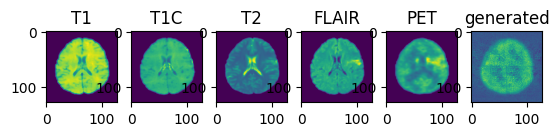

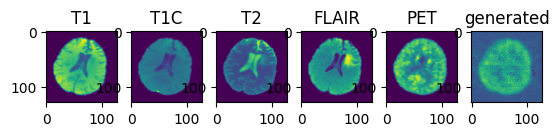

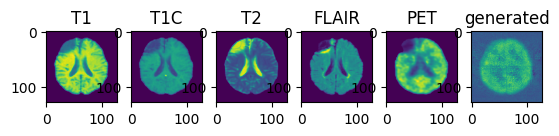

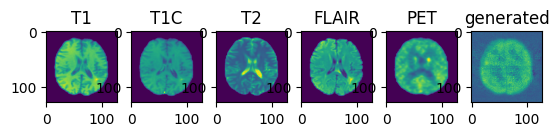

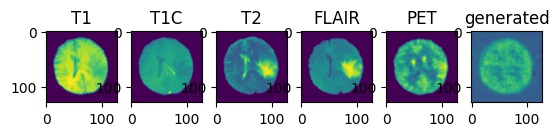

validation avg MS-SSIM: 0.4876 , train avg MS-SSIM: 0.4599
----------
epoch 371/400


Epoch :   0%|                                            | 0/24 [00:00<?, ?it/s]

Epoch :   4%|█▌                                  | 1/24 [01:31<35:12, 91.84s/it]

Epoch :   8%|███                                 | 2/24 [01:33<14:15, 38.90s/it]

Epoch :  12%|████▌                               | 3/24 [01:35<07:41, 21.96s/it]

Epoch :  17%|██████                              | 4/24 [01:37<04:40, 14.04s/it]

Epoch :  21%|███████▌                            | 5/24 [01:39<03:02,  9.63s/it]

Epoch :  25%|█████████                           | 6/24 [01:40<02:05,  6.97s/it]

Epoch :  29%|██████████▌                         | 7/24 [01:42<01:29,  5.28s/it]

Epoch :  33%|████████████                        | 8/24 [01:44<01:06,  4.17s/it]

Epoch :  38%|█████████████▌                      | 9/24 [01:46<00:51,  3.42s/it]

Epoch :  42%|██████████████▌                    | 10/24 [01:48<00:40,  2.93s/it]

Epoch :  46%|████████████████                   | 11/24 [01:49<00:33,  2.58s/it]

Epoch :  50%|█████████████████▌                 | 12/24 [01:51<00:28,  2.34s/it]

Epoch :  54%|██████████████████▉                | 13/24 [01:53<00:25,  2.28s/it]

Epoch :  58%|████████████████████▍              | 14/24 [01:55<00:21,  2.14s/it]

Epoch :  62%|█████████████████████▉             | 15/24 [01:57<00:18,  2.03s/it]

Epoch :  67%|███████████████████████▎           | 16/24 [01:59<00:15,  1.96s/it]

Epoch :  71%|████████████████████████▊          | 17/24 [02:01<00:13,  1.91s/it]

Epoch :  75%|██████████████████████████▎        | 18/24 [02:02<00:11,  1.88s/it]

Epoch :  79%|███████████████████████████▋       | 19/24 [02:04<00:09,  1.85s/it]

Epoch :  83%|█████████████████████████████▏     | 20/24 [02:06<00:07,  1.83s/it]

Epoch :  88%|██████████████████████████████▋    | 21/24 [02:08<00:05,  1.92s/it]

Epoch :  92%|████████████████████████████████   | 22/24 [02:10<00:03,  1.89s/it]

Epoch :  96%|█████████████████████████████████▌ | 23/24 [02:12<00:01,  1.86s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:13<00:00,  1.59s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:16<00:00,  5.67s/it]

----------
epoch 372/400


Epoch :   0%|                                            | 0/24 [00:00<?, ?it/s]

Epoch :   4%|█▌                                  | 1/24 [01:29<34:11, 89.18s/it]

Epoch :   8%|███                                 | 2/24 [01:31<13:52, 37.84s/it]

Epoch :  12%|████▌                               | 3/24 [01:32<07:29, 21.38s/it]

Epoch :  17%|██████                              | 4/24 [01:34<04:33, 13.66s/it]

Epoch :  21%|███████▌                            | 5/24 [01:36<02:58,  9.39s/it]

Epoch :  25%|█████████                           | 6/24 [01:38<02:04,  6.94s/it]

Epoch :  29%|██████████▌                         | 7/24 [01:40<01:29,  5.26s/it]

Epoch :  33%|████████████                        | 8/24 [01:42<01:06,  4.16s/it]

Epoch :  38%|█████████████▌                      | 9/24 [01:44<00:51,  3.43s/it]

Epoch :  42%|██████████████▌                    | 10/24 [01:45<00:40,  2.93s/it]

Epoch :  46%|████████████████                   | 11/24 [01:47<00:33,  2.58s/it]

Epoch :  50%|█████████████████▌                 | 12/24 [01:49<00:28,  2.35s/it]

Epoch :  54%|██████████████████▉                | 13/24 [01:51<00:23,  2.18s/it]

Epoch :  58%|████████████████████▍              | 14/24 [01:53<00:20,  2.06s/it]

Epoch :  62%|█████████████████████▉             | 15/24 [01:55<00:18,  2.08s/it]

Epoch :  67%|███████████████████████▎           | 16/24 [01:57<00:15,  2.00s/it]

Epoch :  71%|████████████████████████▊          | 17/24 [01:58<00:13,  1.94s/it]

Epoch :  75%|██████████████████████████▎        | 18/24 [02:00<00:11,  1.90s/it]

Epoch :  79%|███████████████████████████▋       | 19/24 [02:02<00:09,  1.87s/it]

Epoch :  83%|█████████████████████████████▏     | 20/24 [02:04<00:07,  1.84s/it]

Epoch :  88%|██████████████████████████████▋    | 21/24 [02:06<00:05,  1.83s/it]

Epoch :  92%|████████████████████████████████   | 22/24 [02:07<00:03,  1.82s/it]

Epoch :  96%|█████████████████████████████████▌ | 23/24 [02:09<00:01,  1.82s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:10<00:00,  1.62s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:13<00:00,  5.57s/it]

----------
epoch 373/400


Epoch :   0%|                                            | 0/24 [00:00<?, ?it/s]

Epoch :   4%|█▌                                  | 1/24 [01:34<36:05, 94.15s/it]

Epoch :   8%|███                                 | 2/24 [01:35<14:36, 39.85s/it]

Epoch :  12%|████▌                               | 3/24 [01:37<07:52, 22.48s/it]

Epoch :  17%|██████                              | 4/24 [01:39<04:47, 14.35s/it]

Epoch :  21%|███████▌                            | 5/24 [01:41<03:06,  9.83s/it]

Epoch :  25%|█████████                           | 6/24 [01:43<02:07,  7.11s/it]

Epoch :  29%|██████████▌                         | 7/24 [01:45<01:31,  5.38s/it]

Epoch :  33%|████████████                        | 8/24 [01:47<01:09,  4.37s/it]

Epoch :  38%|█████████████▌                      | 9/24 [01:49<00:53,  3.57s/it]

Epoch :  42%|██████████████▌                    | 10/24 [01:51<00:42,  3.04s/it]

Epoch :  46%|████████████████                   | 11/24 [01:52<00:34,  2.67s/it]

Epoch :  50%|█████████████████▌                 | 12/24 [01:54<00:28,  2.41s/it]

Epoch :  54%|██████████████████▉                | 13/24 [01:56<00:24,  2.23s/it]

Epoch :  58%|████████████████████▍              | 14/24 [01:58<00:21,  2.11s/it]

Epoch :  62%|█████████████████████▉             | 15/24 [02:00<00:18,  2.02s/it]

Epoch :  67%|███████████████████████▎           | 16/24 [02:01<00:15,  1.96s/it]

Epoch :  71%|████████████████████████▊          | 17/24 [02:04<00:14,  2.04s/it]

Epoch :  75%|██████████████████████████▎        | 18/24 [02:05<00:11,  1.97s/it]

Epoch :  79%|███████████████████████████▋       | 19/24 [02:07<00:09,  1.95s/it]

Epoch :  83%|█████████████████████████████▏     | 20/24 [02:09<00:07,  1.91s/it]

Epoch :  88%|██████████████████████████████▋    | 21/24 [02:11<00:05,  1.89s/it]

Epoch :  92%|████████████████████████████████   | 22/24 [02:13<00:03,  1.86s/it]

Epoch :  96%|█████████████████████████████████▌ | 23/24 [02:15<00:01,  1.84s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:16<00:00,  1.58s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:19<00:00,  5.80s/it]

----------
epoch 374/400


Epoch :   0%|                                            | 0/24 [00:00<?, ?it/s]

Epoch :   4%|█▌                                  | 1/24 [01:31<35:07, 91.63s/it]

Epoch :   8%|███                                 | 2/24 [01:33<14:20, 39.12s/it]

Epoch :  12%|████▌                               | 3/24 [01:35<07:43, 22.09s/it]

Epoch :  17%|██████                              | 4/24 [01:37<04:42, 14.11s/it]

Epoch :  21%|███████▌                            | 5/24 [01:39<03:04,  9.69s/it]

Epoch :  25%|█████████                           | 6/24 [01:41<02:06,  7.03s/it]

Epoch :  29%|██████████▌                         | 7/24 [01:43<01:30,  5.33s/it]

Epoch :  33%|████████████                        | 8/24 [01:45<01:07,  4.22s/it]

Epoch :  38%|█████████████▌                      | 9/24 [01:46<00:52,  3.47s/it]

Epoch :  42%|██████████████▌                    | 10/24 [01:49<00:43,  3.08s/it]

Epoch :  46%|████████████████                   | 11/24 [01:50<00:35,  2.69s/it]

Epoch :  50%|█████████████████▌                 | 12/24 [01:52<00:29,  2.43s/it]

Epoch :  54%|██████████████████▉                | 13/24 [01:54<00:24,  2.26s/it]

Epoch :  58%|████████████████████▍              | 14/24 [01:56<00:21,  2.13s/it]

Epoch :  62%|█████████████████████▉             | 15/24 [01:58<00:18,  2.04s/it]

Epoch :  67%|███████████████████████▎           | 16/24 [02:00<00:15,  1.99s/it]

Epoch :  71%|████████████████████████▊          | 17/24 [02:02<00:13,  1.95s/it]

Epoch :  75%|██████████████████████████▎        | 18/24 [02:03<00:11,  1.93s/it]

Epoch :  79%|███████████████████████████▋       | 19/24 [02:06<00:10,  2.02s/it]

Epoch :  83%|█████████████████████████████▏     | 20/24 [02:07<00:07,  1.96s/it]

Epoch :  88%|██████████████████████████████▋    | 21/24 [02:09<00:05,  1.92s/it]

Epoch :  92%|████████████████████████████████   | 22/24 [02:11<00:03,  1.88s/it]

Epoch :  96%|█████████████████████████████████▌ | 23/24 [02:13<00:01,  1.86s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:14<00:00,  1.60s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:17<00:00,  5.71s/it]

----------
epoch 375/400


Epoch :   0%|                                            | 0/24 [00:00<?, ?it/s]

Epoch :   4%|█▌                                  | 1/24 [01:31<34:54, 91.07s/it]

Epoch :   8%|███                                 | 2/24 [01:32<14:08, 38.56s/it]

Epoch :  12%|████▌                               | 3/24 [01:34<07:37, 21.79s/it]

Epoch :  17%|██████                              | 4/24 [01:36<04:41, 14.08s/it]

Epoch :  21%|███████▌                            | 5/24 [01:38<03:03,  9.66s/it]

Epoch :  25%|█████████                           | 6/24 [01:40<02:05,  6.99s/it]

Epoch :  29%|██████████▌                         | 7/24 [01:42<01:30,  5.30s/it]

Epoch :  33%|████████████                        | 8/24 [01:44<01:07,  4.19s/it]

Epoch :  38%|█████████████▌                      | 9/24 [01:46<00:51,  3.45s/it]

Epoch :  42%|██████████████▌                    | 10/24 [01:47<00:41,  2.94s/it]

Epoch :  46%|████████████████                   | 11/24 [01:49<00:33,  2.60s/it]

Epoch :  50%|█████████████████▌                 | 12/24 [01:51<00:29,  2.48s/it]

Epoch :  54%|██████████████████▉                | 13/24 [01:53<00:25,  2.29s/it]

Epoch :  58%|████████████████████▍              | 14/24 [01:55<00:21,  2.14s/it]

Epoch :  62%|█████████████████████▉             | 15/24 [01:57<00:18,  2.04s/it]

Epoch :  67%|███████████████████████▎           | 16/24 [01:59<00:15,  1.98s/it]

Epoch :  71%|████████████████████████▊          | 17/24 [02:00<00:13,  1.93s/it]

Epoch :  75%|██████████████████████████▎        | 18/24 [02:02<00:11,  1.90s/it]

Epoch :  79%|███████████████████████████▋       | 19/24 [02:04<00:09,  1.87s/it]

Epoch :  83%|█████████████████████████████▏     | 20/24 [02:06<00:07,  1.85s/it]

Epoch :  88%|██████████████████████████████▋    | 21/24 [02:08<00:05,  1.93s/it]

Epoch :  92%|████████████████████████████████   | 22/24 [02:10<00:03,  1.89s/it]

Epoch :  96%|█████████████████████████████████▌ | 23/24 [02:12<00:01,  1.86s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:13<00:00,  1.59s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:16<00:00,  5.67s/it]

----------
epoch 376/400


Epoch :   0%|                                            | 0/24 [00:00<?, ?it/s]

Epoch :   4%|█▌                                  | 1/24 [01:29<34:17, 89.43s/it]

Epoch :   8%|███                                 | 2/24 [01:31<13:54, 37.94s/it]

Epoch :  12%|████▌                               | 3/24 [01:33<07:30, 21.45s/it]

Epoch :  17%|██████                              | 4/24 [01:34<04:33, 13.69s/it]

Epoch :  21%|███████▌                            | 5/24 [01:37<03:01,  9.55s/it]

Epoch :  25%|█████████                           | 6/24 [01:38<02:04,  6.92s/it]

Epoch :  29%|██████████▌                         | 7/24 [01:40<01:29,  5.25s/it]

Epoch :  33%|████████████                        | 8/24 [01:42<01:06,  4.15s/it]

Epoch :  38%|█████████████▌                      | 9/24 [01:44<00:51,  3.42s/it]

Epoch :  42%|██████████████▌                    | 10/24 [01:46<00:40,  2.92s/it]

Epoch :  46%|████████████████                   | 11/24 [01:48<00:33,  2.58s/it]

Epoch :  50%|█████████████████▌                 | 12/24 [01:49<00:28,  2.35s/it]

Epoch :  54%|██████████████████▉                | 13/24 [01:51<00:23,  2.18s/it]

Epoch :  58%|████████████████████▍              | 14/24 [01:53<00:21,  2.17s/it]

Epoch :  62%|█████████████████████▉             | 15/24 [01:55<00:18,  2.07s/it]

Epoch :  67%|███████████████████████▎           | 16/24 [01:57<00:15,  1.99s/it]

Epoch :  71%|████████████████████████▊          | 17/24 [01:59<00:13,  1.94s/it]

Epoch :  75%|██████████████████████████▎        | 18/24 [02:01<00:11,  1.90s/it]

Epoch :  79%|███████████████████████████▋       | 19/24 [02:02<00:09,  1.87s/it]

Epoch :  83%|█████████████████████████████▏     | 20/24 [02:04<00:07,  1.84s/it]

Epoch :  88%|██████████████████████████████▋    | 21/24 [02:06<00:05,  1.84s/it]

Epoch :  92%|████████████████████████████████   | 22/24 [02:08<00:03,  1.83s/it]

Epoch :  96%|█████████████████████████████████▌ | 23/24 [02:10<00:01,  1.92s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:11<00:00,  1.63s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:14<00:00,  5.61s/it]

----------
epoch 377/400


Epoch :   0%|                                            | 0/24 [00:00<?, ?it/s]

Epoch :   4%|█▌                                  | 1/24 [01:30<34:38, 90.38s/it]

Epoch :   8%|███                                 | 2/24 [01:32<14:02, 38.28s/it]

Epoch :  12%|████▌                               | 3/24 [01:34<07:34, 21.63s/it]

Epoch :  17%|██████                              | 4/24 [01:35<04:36, 13.81s/it]

Epoch :  21%|███████▌                            | 5/24 [01:37<03:00,  9.49s/it]

Epoch :  25%|█████████                           | 6/24 [01:39<02:04,  6.89s/it]

Epoch :  29%|██████████▌                         | 7/24 [01:41<01:31,  5.36s/it]

Epoch :  33%|████████████                        | 8/24 [01:43<01:07,  4.23s/it]

Epoch :  38%|█████████████▌                      | 9/24 [01:45<00:52,  3.47s/it]

Epoch :  42%|██████████████▌                    | 10/24 [01:47<00:41,  2.96s/it]

Epoch :  46%|████████████████                   | 11/24 [01:48<00:33,  2.61s/it]

Epoch :  50%|█████████████████▌                 | 12/24 [01:50<00:28,  2.37s/it]

Epoch :  54%|██████████████████▉                | 13/24 [01:52<00:24,  2.20s/it]

Epoch :  58%|████████████████████▍              | 14/24 [01:54<00:20,  2.08s/it]

Epoch :  62%|█████████████████████▉             | 15/24 [01:56<00:18,  2.01s/it]

Epoch :  67%|███████████████████████▎           | 16/24 [01:58<00:16,  2.05s/it]

Epoch :  71%|████████████████████████▊          | 17/24 [02:00<00:13,  1.98s/it]

Epoch :  75%|██████████████████████████▎        | 18/24 [02:02<00:11,  1.94s/it]

Epoch :  79%|███████████████████████████▋       | 19/24 [02:03<00:09,  1.90s/it]

Epoch :  83%|█████████████████████████████▏     | 20/24 [02:05<00:07,  1.88s/it]

Epoch :  88%|██████████████████████████████▋    | 21/24 [02:07<00:05,  1.86s/it]

Epoch :  92%|████████████████████████████████   | 22/24 [02:09<00:03,  1.85s/it]

Epoch :  96%|█████████████████████████████████▌ | 23/24 [02:11<00:01,  1.84s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:12<00:00,  1.58s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:15<00:00,  5.64s/it]

----------
epoch 378/400


Epoch :   0%|                                            | 0/24 [00:00<?, ?it/s]

Epoch :   4%|█▍                                 | 1/24 [01:43<39:30, 103.08s/it]

Epoch :   8%|███                                 | 2/24 [01:44<15:57, 43.53s/it]

Epoch :  12%|████▌                               | 3/24 [01:46<08:34, 24.51s/it]

Epoch :  17%|██████                              | 4/24 [01:48<05:11, 15.56s/it]

Epoch :  21%|███████▌                            | 5/24 [01:50<03:21, 10.62s/it]

Epoch :  25%|█████████                           | 6/24 [01:52<02:18,  7.67s/it]

Epoch :  29%|██████████▌                         | 7/24 [01:54<01:38,  5.79s/it]

Epoch :  33%|████████████                        | 8/24 [01:56<01:12,  4.56s/it]

Epoch :  38%|█████████████▌                      | 9/24 [01:58<00:55,  3.71s/it]

Epoch :  42%|██████████████▌                    | 10/24 [02:00<00:45,  3.24s/it]

Epoch :  46%|████████████████                   | 11/24 [02:02<00:36,  2.82s/it]

Epoch :  50%|█████████████████▌                 | 12/24 [02:04<00:30,  2.55s/it]

Epoch :  54%|██████████████████▉                | 13/24 [02:06<00:26,  2.38s/it]

Epoch :  58%|████████████████████▍              | 14/24 [02:07<00:22,  2.22s/it]

Epoch :  62%|█████████████████████▉             | 15/24 [02:09<00:18,  2.11s/it]

Epoch :  67%|███████████████████████▎           | 16/24 [02:11<00:16,  2.05s/it]

Epoch :  71%|████████████████████████▊          | 17/24 [02:13<00:13,  1.99s/it]

Epoch :  75%|██████████████████████████▎        | 18/24 [02:15<00:12,  2.05s/it]

Epoch :  79%|███████████████████████████▋       | 19/24 [02:17<00:10,  2.00s/it]

Epoch :  83%|█████████████████████████████▏     | 20/24 [02:19<00:07,  1.97s/it]

Epoch :  88%|██████████████████████████████▋    | 21/24 [02:21<00:05,  1.94s/it]

Epoch :  92%|████████████████████████████████   | 22/24 [02:23<00:03,  1.92s/it]

Epoch :  96%|█████████████████████████████████▌ | 23/24 [02:25<00:01,  1.91s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:26<00:00,  1.63s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:29<00:00,  6.25s/it]

----------
epoch 379/400


Epoch :   0%|                                            | 0/24 [00:00<?, ?it/s]

Epoch :   4%|█▌                                  | 1/24 [01:37<37:28, 97.78s/it]

Epoch :   8%|███                                 | 2/24 [01:39<15:10, 41.37s/it]

Epoch :  12%|████▌                               | 3/24 [01:41<08:13, 23.52s/it]

Epoch :  17%|██████                              | 4/24 [01:44<05:01, 15.06s/it]

Epoch :  21%|███████▌                            | 5/24 [01:46<03:17, 10.38s/it]

Epoch :  25%|█████████                           | 6/24 [01:48<02:15,  7.51s/it]

Epoch :  29%|██████████▌                         | 7/24 [01:50<01:37,  5.72s/it]

Epoch :  33%|████████████                        | 8/24 [01:51<01:11,  4.49s/it]

Epoch :  38%|█████████████▌                      | 9/24 [01:53<00:54,  3.67s/it]

Epoch :  42%|██████████████▌                    | 10/24 [01:55<00:43,  3.11s/it]

Epoch :  46%|████████████████                   | 11/24 [01:57<00:35,  2.75s/it]

Epoch :  50%|█████████████████▌                 | 12/24 [01:59<00:31,  2.60s/it]

Epoch :  54%|██████████████████▉                | 13/24 [02:01<00:26,  2.37s/it]

Epoch :  58%|████████████████████▍              | 14/24 [02:03<00:22,  2.23s/it]

Epoch :  62%|█████████████████████▉             | 15/24 [02:05<00:19,  2.15s/it]

Epoch :  67%|███████████████████████▎           | 16/24 [02:07<00:16,  2.08s/it]

Epoch :  71%|████████████████████████▊          | 17/24 [02:09<00:14,  2.02s/it]

Epoch :  75%|██████████████████████████▎        | 18/24 [02:11<00:11,  1.98s/it]

Epoch :  79%|███████████████████████████▋       | 19/24 [02:13<00:09,  1.93s/it]

Epoch :  83%|█████████████████████████████▏     | 20/24 [02:15<00:08,  2.00s/it]

Epoch :  88%|██████████████████████████████▋    | 21/24 [02:17<00:05,  1.96s/it]

Epoch :  92%|████████████████████████████████   | 22/24 [02:18<00:03,  1.94s/it]

Epoch :  96%|█████████████████████████████████▌ | 23/24 [02:20<00:01,  1.92s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:21<00:00,  1.64s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:25<00:00,  6.06s/it]

----------
epoch 380/400


Epoch :   0%|                                            | 0/24 [00:00<?, ?it/s]

Epoch :   4%|█▌                                  | 1/24 [01:39<38:12, 99.68s/it]

Epoch :   8%|███                                 | 2/24 [01:41<15:26, 42.14s/it]

Epoch :  12%|████▌                               | 3/24 [01:43<08:18, 23.75s/it]

Epoch :  17%|██████                              | 4/24 [01:45<05:02, 15.12s/it]

Epoch :  21%|███████▌                            | 5/24 [01:47<03:19, 10.51s/it]

Epoch :  25%|█████████                           | 6/24 [01:49<02:16,  7.61s/it]

Epoch :  29%|██████████▌                         | 7/24 [01:51<01:38,  5.78s/it]

Epoch :  33%|████████████                        | 8/24 [01:53<01:12,  4.56s/it]

Epoch :  38%|█████████████▌                      | 9/24 [01:55<00:56,  3.79s/it]

Epoch :  42%|██████████████▌                    | 10/24 [01:57<00:45,  3.22s/it]

Epoch :  46%|████████████████                   | 11/24 [01:59<00:36,  2.81s/it]

Epoch :  50%|█████████████████▌                 | 12/24 [02:01<00:30,  2.52s/it]

Epoch :  54%|██████████████████▉                | 13/24 [02:03<00:25,  2.31s/it]

Epoch :  58%|████████████████████▍              | 14/24 [02:05<00:22,  2.28s/it]

Epoch :  62%|█████████████████████▉             | 15/24 [02:07<00:19,  2.14s/it]

Epoch :  67%|███████████████████████▎           | 16/24 [02:09<00:16,  2.05s/it]

Epoch :  71%|████████████████████████▊          | 17/24 [02:11<00:14,  2.02s/it]

Epoch :  75%|██████████████████████████▎        | 18/24 [02:12<00:11,  1.99s/it]

Epoch :  79%|███████████████████████████▋       | 19/24 [02:14<00:09,  1.97s/it]

Epoch :  83%|█████████████████████████████▏     | 20/24 [02:16<00:07,  1.93s/it]

Epoch :  88%|██████████████████████████████▋    | 21/24 [02:18<00:05,  1.91s/it]

Epoch :  92%|████████████████████████████████   | 22/24 [02:20<00:03,  1.97s/it]

Epoch :  96%|█████████████████████████████████▌ | 23/24 [02:22<00:01,  1.94s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:23<00:00,  1.65s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:27<00:00,  6.13s/it]

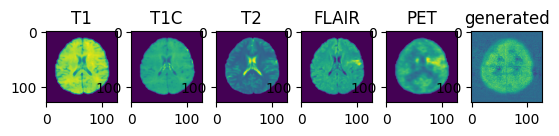

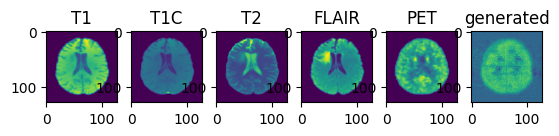

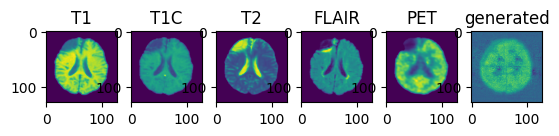

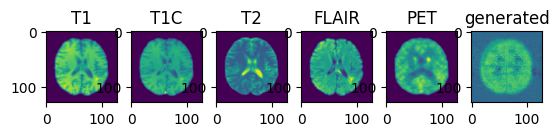

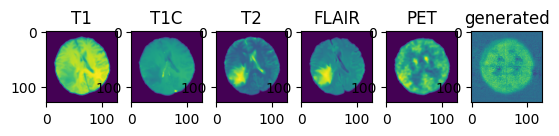

validation avg MS-SSIM: 0.4895 , train avg MS-SSIM: 0.4607
----------
epoch 381/400


Epoch :   0%|                                            | 0/24 [00:00<?, ?it/s]

Epoch :   4%|█▌                                  | 1/24 [01:36<37:05, 96.77s/it]

Epoch :   8%|███                                 | 2/24 [01:38<15:01, 40.98s/it]

Epoch :  12%|████▌                               | 3/24 [01:40<08:07, 23.21s/it]

Epoch :  17%|██████                              | 4/24 [01:43<04:59, 14.98s/it]

Epoch :  21%|███████▌                            | 5/24 [01:44<03:14, 10.24s/it]

Epoch :  25%|█████████                           | 6/24 [01:46<02:12,  7.38s/it]

Epoch :  29%|██████████▌                         | 7/24 [01:48<01:34,  5.59s/it]

Epoch :  33%|████████████                        | 8/24 [01:50<01:11,  4.45s/it]

Epoch :  38%|█████████████▌                      | 9/24 [01:52<00:54,  3.65s/it]

Epoch :  42%|██████████████▌                    | 10/24 [01:54<00:43,  3.09s/it]

Epoch :  46%|████████████████                   | 11/24 [01:56<00:35,  2.71s/it]

Epoch :  50%|█████████████████▌                 | 12/24 [01:58<00:29,  2.46s/it]

Epoch :  54%|██████████████████▉                | 13/24 [02:00<00:25,  2.28s/it]

Epoch :  58%|████████████████████▍              | 14/24 [02:01<00:21,  2.15s/it]

Epoch :  62%|█████████████████████▉             | 15/24 [02:03<00:18,  2.09s/it]

Epoch :  67%|███████████████████████▎           | 16/24 [02:05<00:16,  2.04s/it]

Epoch :  71%|████████████████████████▊          | 17/24 [02:07<00:13,  1.99s/it]

Epoch :  75%|██████████████████████████▎        | 18/24 [02:09<00:11,  1.97s/it]

Epoch :  79%|███████████████████████████▋       | 19/24 [02:11<00:09,  1.96s/it]

Epoch :  83%|█████████████████████████████▏     | 20/24 [02:13<00:07,  1.93s/it]

Epoch :  88%|██████████████████████████████▋    | 21/24 [02:15<00:06,  2.01s/it]

Epoch :  92%|████████████████████████████████   | 22/24 [02:17<00:03,  1.96s/it]

Epoch :  96%|█████████████████████████████████▌ | 23/24 [02:19<00:01,  1.93s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:20<00:00,  1.64s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:23<00:00,  5.98s/it]

----------
epoch 382/400


Epoch :   0%|                                            | 0/24 [00:00<?, ?it/s]

Epoch :   4%|█▌                                  | 1/24 [01:37<37:21, 97.46s/it]

Epoch :   8%|███                                 | 2/24 [01:39<15:08, 41.29s/it]

Epoch :  12%|████▌                               | 3/24 [01:41<08:09, 23.30s/it]

Epoch :  17%|██████                              | 4/24 [01:43<04:57, 14.86s/it]

Epoch :  21%|███████▌                            | 5/24 [01:45<03:13, 10.19s/it]

Epoch :  25%|█████████                           | 6/24 [01:47<02:16,  7.59s/it]

Epoch :  29%|██████████▌                         | 7/24 [01:49<01:37,  5.75s/it]

Epoch :  33%|████████████                        | 8/24 [01:51<01:12,  4.53s/it]

Epoch :  38%|█████████████▌                      | 9/24 [01:53<00:55,  3.71s/it]

Epoch :  42%|██████████████▌                    | 10/24 [01:55<00:44,  3.15s/it]

Epoch :  46%|████████████████                   | 11/24 [01:57<00:35,  2.76s/it]

Epoch :  50%|█████████████████▌                 | 12/24 [01:59<00:29,  2.49s/it]

Epoch :  54%|██████████████████▉                | 13/24 [02:00<00:25,  2.30s/it]

Epoch :  58%|████████████████████▍              | 14/24 [02:03<00:22,  2.27s/it]

Epoch :  62%|█████████████████████▉             | 15/24 [02:05<00:19,  2.16s/it]

Epoch :  67%|███████████████████████▎           | 16/24 [02:06<00:16,  2.07s/it]

Epoch :  71%|████████████████████████▊          | 17/24 [02:08<00:14,  2.00s/it]

Epoch :  75%|██████████████████████████▎        | 18/24 [02:10<00:11,  1.97s/it]

Epoch :  79%|███████████████████████████▋       | 19/24 [02:12<00:10,  2.01s/it]

Epoch :  83%|█████████████████████████████▏     | 20/24 [02:14<00:08,  2.01s/it]

Epoch :  88%|██████████████████████████████▋    | 21/24 [02:16<00:05,  1.97s/it]

Epoch :  92%|████████████████████████████████   | 22/24 [02:18<00:03,  1.95s/it]

Epoch :  96%|█████████████████████████████████▌ | 23/24 [02:21<00:02,  2.11s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:22<00:00,  1.77s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:25<00:00,  6.05s/it]

----------
epoch 383/400


Epoch :   0%|                                            | 0/24 [00:00<?, ?it/s]

Epoch :   4%|█▌                                  | 1/24 [01:36<37:00, 96.56s/it]

Epoch :   8%|███                                 | 2/24 [01:38<14:58, 40.85s/it]

Epoch :  12%|████▌                               | 3/24 [01:40<08:04, 23.06s/it]

Epoch :  17%|██████                              | 4/24 [01:42<04:54, 14.70s/it]

Epoch :  21%|███████▌                            | 5/24 [01:44<03:11, 10.07s/it]

Epoch :  25%|█████████                           | 6/24 [01:45<02:10,  7.26s/it]

Epoch :  29%|██████████▌                         | 7/24 [01:47<01:33,  5.48s/it]

Epoch :  33%|████████████                        | 8/24 [01:49<01:11,  4.46s/it]

Epoch :  38%|█████████████▌                      | 9/24 [01:51<00:54,  3.66s/it]

Epoch :  42%|██████████████▌                    | 10/24 [01:53<00:43,  3.13s/it]

Epoch :  46%|████████████████                   | 11/24 [01:55<00:35,  2.75s/it]

Epoch :  50%|█████████████████▌                 | 12/24 [01:57<00:29,  2.48s/it]

Epoch :  54%|██████████████████▉                | 13/24 [01:59<00:25,  2.30s/it]

Epoch :  58%|████████████████████▍              | 14/24 [02:01<00:21,  2.17s/it]

Epoch :  62%|█████████████████████▉             | 15/24 [02:03<00:18,  2.08s/it]

Epoch :  67%|███████████████████████▎           | 16/24 [02:05<00:16,  2.01s/it]

Epoch :  71%|████████████████████████▊          | 17/24 [02:07<00:14,  2.08s/it]

Epoch :  75%|██████████████████████████▎        | 18/24 [02:09<00:12,  2.05s/it]

Epoch :  79%|███████████████████████████▋       | 19/24 [02:11<00:09,  2.00s/it]

Epoch :  83%|█████████████████████████████▏     | 20/24 [02:12<00:07,  1.97s/it]

Epoch :  88%|██████████████████████████████▋    | 21/24 [02:14<00:05,  1.93s/it]

Epoch :  92%|████████████████████████████████   | 22/24 [02:16<00:03,  1.90s/it]

Epoch :  96%|█████████████████████████████████▌ | 23/24 [02:18<00:01,  1.88s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:19<00:00,  1.61s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:22<00:00,  5.94s/it]

----------
epoch 384/400


Epoch :   0%|                                            | 0/24 [00:00<?, ?it/s]

Epoch :   4%|█▌                                  | 1/24 [01:37<37:17, 97.28s/it]

Epoch :   8%|███                                 | 2/24 [01:39<15:11, 41.44s/it]

Epoch :  12%|████▌                               | 3/24 [01:41<08:10, 23.35s/it]

Epoch :  17%|██████                              | 4/24 [01:43<04:57, 14.87s/it]

Epoch :  21%|███████▌                            | 5/24 [01:45<03:14, 10.26s/it]

Epoch :  25%|█████████                           | 6/24 [01:47<02:13,  7.40s/it]

Epoch :  29%|██████████▌                         | 7/24 [01:49<01:35,  5.59s/it]

Epoch :  33%|████████████                        | 8/24 [01:51<01:10,  4.42s/it]

Epoch :  38%|█████████████▌                      | 9/24 [01:52<00:54,  3.61s/it]

Epoch :  42%|██████████████▌                    | 10/24 [01:54<00:42,  3.06s/it]

Epoch :  46%|████████████████                   | 11/24 [01:57<00:36,  2.84s/it]

Epoch :  50%|█████████████████▌                 | 12/24 [01:58<00:30,  2.53s/it]

Epoch :  54%|██████████████████▉                | 13/24 [02:00<00:25,  2.32s/it]

Epoch :  58%|████████████████████▍              | 14/24 [02:02<00:22,  2.21s/it]

Epoch :  62%|█████████████████████▉             | 15/24 [02:04<00:18,  2.10s/it]

Epoch :  67%|███████████████████████▎           | 16/24 [02:06<00:16,  2.02s/it]

Epoch :  71%|████████████████████████▊          | 17/24 [02:08<00:13,  1.98s/it]

Epoch :  75%|██████████████████████████▎        | 18/24 [02:10<00:11,  1.95s/it]

Epoch :  79%|███████████████████████████▋       | 19/24 [02:12<00:09,  1.95s/it]

Epoch :  83%|█████████████████████████████▏     | 20/24 [02:13<00:07,  1.92s/it]

Epoch :  88%|██████████████████████████████▋    | 21/24 [02:15<00:05,  1.92s/it]

Epoch :  92%|████████████████████████████████   | 22/24 [02:17<00:03,  1.91s/it]

Epoch :  96%|█████████████████████████████████▌ | 23/24 [02:19<00:01,  1.90s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:20<00:00,  1.63s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:23<00:00,  5.98s/it]

----------
epoch 385/400


Epoch :   0%|                                            | 0/24 [00:00<?, ?it/s]

Epoch :   4%|█▌                                  | 1/24 [01:34<36:21, 94.86s/it]

Epoch :   8%|███                                 | 2/24 [01:36<14:44, 40.21s/it]

Epoch :  12%|████▌                               | 3/24 [01:38<07:56, 22.70s/it]

Epoch :  17%|██████                              | 4/24 [01:40<04:52, 14.62s/it]

Epoch :  21%|███████▌                            | 5/24 [01:42<03:10, 10.02s/it]

Epoch :  25%|█████████                           | 6/24 [01:44<02:10,  7.23s/it]

Epoch :  29%|██████████▌                         | 7/24 [01:46<01:33,  5.52s/it]

Epoch :  33%|████████████                        | 8/24 [01:48<01:10,  4.38s/it]

Epoch :  38%|█████████████▌                      | 9/24 [01:50<00:54,  3.63s/it]

Epoch :  42%|██████████████▌                    | 10/24 [01:52<00:43,  3.11s/it]

Epoch :  46%|████████████████                   | 11/24 [01:54<00:35,  2.72s/it]

Epoch :  50%|█████████████████▌                 | 12/24 [01:56<00:29,  2.45s/it]

Epoch :  54%|██████████████████▉                | 13/24 [01:58<00:25,  2.36s/it]

Epoch :  58%|████████████████████▍              | 14/24 [02:00<00:22,  2.20s/it]

Epoch :  62%|█████████████████████▉             | 15/24 [02:01<00:18,  2.09s/it]

Epoch :  67%|███████████████████████▎           | 16/24 [02:03<00:16,  2.05s/it]

Epoch :  71%|████████████████████████▊          | 17/24 [02:05<00:13,  2.00s/it]

Epoch :  75%|██████████████████████████▎        | 18/24 [02:07<00:11,  1.96s/it]

Epoch :  79%|███████████████████████████▋       | 19/24 [02:09<00:09,  1.92s/it]

Epoch :  83%|█████████████████████████████▏     | 20/24 [02:11<00:07,  1.89s/it]

Epoch :  88%|██████████████████████████████▋    | 21/24 [02:13<00:06,  2.03s/it]

Epoch :  92%|████████████████████████████████   | 22/24 [02:15<00:03,  1.99s/it]

Epoch :  96%|█████████████████████████████████▌ | 23/24 [02:17<00:01,  1.95s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:18<00:00,  1.67s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:22<00:00,  5.92s/it]

----------
epoch 386/400


Epoch :   0%|                                            | 0/24 [00:00<?, ?it/s]

Epoch :   4%|█▌                                  | 1/24 [01:36<36:57, 96.43s/it]

Epoch :   8%|███                                 | 2/24 [01:38<14:58, 40.85s/it]

Epoch :  12%|████▌                               | 3/24 [01:40<08:05, 23.11s/it]

Epoch :  17%|██████                              | 4/24 [01:42<04:54, 14.75s/it]

Epoch :  21%|███████▌                            | 5/24 [01:44<03:12, 10.14s/it]

Epoch :  25%|█████████                           | 6/24 [01:46<02:15,  7.54s/it]

Epoch :  29%|██████████▌                         | 7/24 [01:48<01:36,  5.70s/it]

Epoch :  33%|████████████                        | 8/24 [01:50<01:11,  4.50s/it]

Epoch :  38%|█████████████▌                      | 9/24 [01:52<00:55,  3.69s/it]

Epoch :  42%|██████████████▌                    | 10/24 [01:54<00:43,  3.14s/it]

Epoch :  46%|████████████████                   | 11/24 [01:56<00:35,  2.75s/it]

Epoch :  50%|█████████████████▌                 | 12/24 [01:58<00:30,  2.51s/it]

Epoch :  54%|██████████████████▉                | 13/24 [02:00<00:26,  2.40s/it]

Epoch :  58%|████████████████████▍              | 14/24 [02:02<00:22,  2.30s/it]

Epoch :  62%|█████████████████████▉             | 15/24 [02:04<00:20,  2.28s/it]

Epoch :  67%|███████████████████████▎           | 16/24 [02:06<00:17,  2.16s/it]

Epoch :  71%|████████████████████████▊          | 17/24 [02:08<00:14,  2.07s/it]

Epoch :  75%|██████████████████████████▎        | 18/24 [02:10<00:12,  2.06s/it]

Epoch :  79%|███████████████████████████▋       | 19/24 [02:12<00:10,  2.04s/it]

Epoch :  83%|█████████████████████████████▏     | 20/24 [02:14<00:07,  1.99s/it]

Epoch :  88%|██████████████████████████████▋    | 21/24 [02:16<00:05,  1.95s/it]

Epoch :  92%|████████████████████████████████   | 22/24 [02:18<00:03,  1.92s/it]

Epoch :  96%|█████████████████████████████████▌ | 23/24 [02:20<00:02,  2.04s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:21<00:00,  1.74s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:24<00:00,  6.02s/it]

----------
epoch 387/400


Epoch :   0%|                                            | 0/24 [00:00<?, ?it/s]

Epoch :   4%|█▌                                  | 1/24 [01:34<36:07, 94.25s/it]

Epoch :   8%|███                                 | 2/24 [01:36<14:38, 39.92s/it]

Epoch :  12%|████▌                               | 3/24 [01:37<07:53, 22.54s/it]

Epoch :  17%|██████                              | 4/24 [01:39<04:47, 14.36s/it]

Epoch :  21%|███████▌                            | 5/24 [01:41<03:07,  9.86s/it]

Epoch :  25%|█████████                           | 6/24 [01:43<02:09,  7.17s/it]

Epoch :  29%|██████████▌                         | 7/24 [01:45<01:34,  5.53s/it]

Epoch :  33%|████████████                        | 8/24 [01:48<01:12,  4.52s/it]

Epoch :  38%|█████████████▌                      | 9/24 [01:50<00:55,  3.70s/it]

Epoch :  42%|██████████████▌                    | 10/24 [01:51<00:44,  3.15s/it]

Epoch :  46%|████████████████                   | 11/24 [01:53<00:36,  2.78s/it]

Epoch :  50%|█████████████████▌                 | 12/24 [01:55<00:30,  2.50s/it]

Epoch :  54%|██████████████████▉                | 13/24 [01:57<00:26,  2.37s/it]

Epoch :  58%|████████████████████▍              | 14/24 [01:59<00:22,  2.24s/it]

Epoch :  62%|█████████████████████▉             | 15/24 [02:01<00:19,  2.16s/it]

Epoch :  67%|███████████████████████▎           | 16/24 [02:03<00:16,  2.11s/it]

Epoch :  71%|████████████████████████▊          | 17/24 [02:06<00:15,  2.16s/it]

Epoch :  75%|██████████████████████████▎        | 18/24 [02:08<00:12,  2.12s/it]

Epoch :  79%|███████████████████████████▋       | 19/24 [02:10<00:10,  2.12s/it]

Epoch :  83%|█████████████████████████████▏     | 20/24 [02:12<00:08,  2.06s/it]

Epoch :  88%|██████████████████████████████▋    | 21/24 [02:14<00:06,  2.01s/it]

Epoch :  92%|████████████████████████████████   | 22/24 [02:15<00:04,  2.00s/it]

Epoch :  96%|█████████████████████████████████▌ | 23/24 [02:17<00:01,  1.96s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:18<00:00,  1.67s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:21<00:00,  5.91s/it]

----------
epoch 388/400


Epoch :   0%|                                            | 0/24 [00:00<?, ?it/s]

Epoch :   4%|█▌                                  | 1/24 [01:34<36:22, 94.90s/it]

Epoch :   8%|███                                 | 2/24 [01:37<14:48, 40.39s/it]

Epoch :  12%|████▌                               | 3/24 [01:38<07:58, 22.79s/it]

Epoch :  17%|██████                              | 4/24 [01:40<04:50, 14.55s/it]

Epoch :  21%|███████▌                            | 5/24 [01:42<03:10, 10.02s/it]

Epoch :  25%|█████████                           | 6/24 [01:44<02:11,  7.29s/it]

Epoch :  29%|██████████▌                         | 7/24 [01:46<01:33,  5.53s/it]

Epoch :  33%|████████████                        | 8/24 [01:48<01:09,  4.35s/it]

Epoch :  38%|█████████████▌                      | 9/24 [01:50<00:53,  3.57s/it]

Epoch :  42%|██████████████▌                    | 10/24 [01:52<00:44,  3.15s/it]

Epoch :  46%|████████████████                   | 11/24 [01:54<00:35,  2.75s/it]

Epoch :  50%|█████████████████▌                 | 12/24 [01:56<00:29,  2.48s/it]

Epoch :  54%|██████████████████▉                | 13/24 [01:58<00:25,  2.30s/it]

Epoch :  58%|████████████████████▍              | 14/24 [02:00<00:22,  2.20s/it]

Epoch :  62%|█████████████████████▉             | 15/24 [02:02<00:18,  2.09s/it]

Epoch :  67%|███████████████████████▎           | 16/24 [02:03<00:16,  2.02s/it]

Epoch :  71%|████████████████████████▊          | 17/24 [02:05<00:13,  1.97s/it]

Epoch :  75%|██████████████████████████▎        | 18/24 [02:07<00:11,  1.93s/it]

Epoch :  79%|███████████████████████████▋       | 19/24 [02:09<00:10,  2.04s/it]

Epoch :  83%|█████████████████████████████▏     | 20/24 [02:11<00:07,  1.97s/it]

Epoch :  88%|██████████████████████████████▋    | 21/24 [02:13<00:05,  1.93s/it]

Epoch :  92%|████████████████████████████████   | 22/24 [02:15<00:03,  1.94s/it]

Epoch :  96%|█████████████████████████████████▌ | 23/24 [02:17<00:01,  1.91s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:18<00:00,  1.63s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:21<00:00,  5.90s/it]

----------
epoch 389/400


Epoch :   0%|                                            | 0/24 [00:00<?, ?it/s]

Epoch :   4%|█▌                                  | 1/24 [01:34<36:23, 94.92s/it]

Epoch :   8%|███                                 | 2/24 [01:36<14:44, 40.21s/it]

Epoch :  12%|████▌                               | 3/24 [01:39<08:00, 22.86s/it]

Epoch :  17%|██████                              | 4/24 [01:40<04:51, 14.57s/it]

Epoch :  21%|███████▌                            | 5/24 [01:42<03:09,  9.99s/it]

Epoch :  25%|█████████                           | 6/24 [01:44<02:10,  7.22s/it]

Epoch :  29%|██████████▌                         | 7/24 [01:46<01:33,  5.47s/it]

Epoch :  33%|████████████                        | 8/24 [01:48<01:09,  4.32s/it]

Epoch :  38%|█████████████▌                      | 9/24 [01:50<00:53,  3.57s/it]

Epoch :  42%|██████████████▌                    | 10/24 [01:52<00:42,  3.05s/it]

Epoch :  46%|████████████████                   | 11/24 [01:54<00:35,  2.69s/it]

Epoch :  50%|█████████████████▌                 | 12/24 [01:56<00:31,  2.66s/it]

Epoch :  54%|██████████████████▉                | 13/24 [01:58<00:26,  2.42s/it]

Epoch :  58%|████████████████████▍              | 14/24 [02:00<00:23,  2.34s/it]

Epoch :  62%|█████████████████████▉             | 15/24 [02:02<00:19,  2.21s/it]

Epoch :  67%|███████████████████████▎           | 16/24 [02:04<00:16,  2.11s/it]

Epoch :  71%|████████████████████████▊          | 17/24 [02:06<00:14,  2.09s/it]

Epoch :  75%|██████████████████████████▎        | 18/24 [02:08<00:12,  2.04s/it]

Epoch :  79%|███████████████████████████▋       | 19/24 [02:10<00:10,  2.06s/it]

Epoch :  83%|█████████████████████████████▏     | 20/24 [02:12<00:08,  2.05s/it]

Epoch :  88%|██████████████████████████████▋    | 21/24 [02:14<00:06,  2.15s/it]

Epoch :  92%|████████████████████████████████   | 22/24 [02:16<00:04,  2.08s/it]

Epoch :  96%|█████████████████████████████████▌ | 23/24 [02:18<00:02,  2.01s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:19<00:00,  1.71s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:23<00:00,  5.96s/it]

----------
epoch 390/400


Epoch :   0%|                                            | 0/24 [00:00<?, ?it/s]

Epoch :   4%|█▌                                  | 1/24 [01:36<36:51, 96.16s/it]

Epoch :   8%|███                                 | 2/24 [01:38<14:55, 40.70s/it]

Epoch :  12%|████▌                               | 3/24 [01:39<08:02, 22.96s/it]

Epoch :  17%|██████                              | 4/24 [01:41<04:53, 14.66s/it]

Epoch :  21%|███████▌                            | 5/24 [01:43<03:11, 10.07s/it]

Epoch :  25%|█████████                           | 6/24 [01:46<02:14,  7.48s/it]

Epoch :  29%|██████████▌                         | 7/24 [01:48<01:36,  5.65s/it]

Epoch :  33%|████████████                        | 8/24 [01:50<01:11,  4.46s/it]

Epoch :  38%|█████████████▌                      | 9/24 [01:51<00:55,  3.67s/it]

Epoch :  42%|██████████████▌                    | 10/24 [01:53<00:43,  3.12s/it]

Epoch :  46%|████████████████                   | 11/24 [01:55<00:35,  2.74s/it]

Epoch :  50%|█████████████████▌                 | 12/24 [01:57<00:29,  2.48s/it]

Epoch :  54%|██████████████████▉                | 13/24 [01:59<00:25,  2.29s/it]

Epoch :  58%|████████████████████▍              | 14/24 [02:02<00:24,  2.47s/it]

Epoch :  62%|█████████████████████▉             | 15/24 [02:04<00:20,  2.28s/it]

Epoch :  67%|███████████████████████▎           | 16/24 [02:06<00:17,  2.17s/it]

Epoch :  71%|████████████████████████▊          | 17/24 [02:07<00:14,  2.08s/it]

Epoch :  75%|██████████████████████████▎        | 18/24 [02:09<00:12,  2.03s/it]

Epoch :  79%|███████████████████████████▋       | 19/24 [02:12<00:10,  2.07s/it]

Epoch :  83%|█████████████████████████████▏     | 20/24 [02:13<00:07,  2.00s/it]

Epoch :  88%|██████████████████████████████▋    | 21/24 [02:15<00:05,  1.95s/it]

Epoch :  92%|████████████████████████████████   | 22/24 [02:17<00:03,  1.91s/it]

Epoch :  96%|█████████████████████████████████▌ | 23/24 [02:19<00:02,  2.04s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:20<00:00,  1.74s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:24<00:00,  6.01s/it]

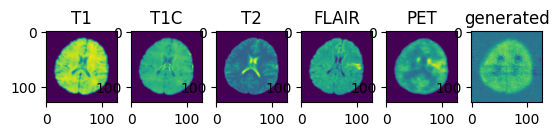

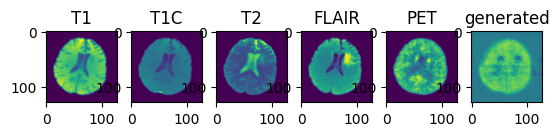

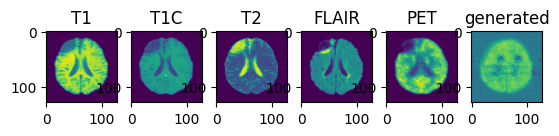

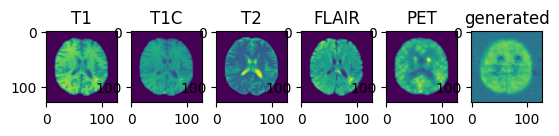

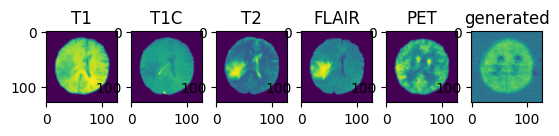

validation avg MS-SSIM: 0.5019 , train avg MS-SSIM: 0.4733
----------
epoch 391/400


Epoch :   0%|                                            | 0/24 [00:00<?, ?it/s]

Epoch :   4%|█▌                                  | 1/24 [01:38<37:49, 98.66s/it]

Epoch :   8%|███                                 | 2/24 [01:40<15:18, 41.73s/it]

Epoch :  12%|████▌                               | 3/24 [01:42<08:13, 23.52s/it]

Epoch :  17%|██████                              | 4/24 [01:44<04:59, 14.96s/it]

Epoch :  21%|███████▌                            | 5/24 [01:46<03:17, 10.40s/it]

Epoch :  25%|█████████                           | 6/24 [01:48<02:15,  7.50s/it]

Epoch :  29%|██████████▌                         | 7/24 [01:50<01:36,  5.68s/it]

Epoch :  33%|████████████                        | 8/24 [01:52<01:11,  4.45s/it]

Epoch :  38%|█████████████▌                      | 9/24 [01:53<00:54,  3.63s/it]

Epoch :  42%|██████████████▌                    | 10/24 [01:55<00:42,  3.07s/it]

Epoch :  46%|████████████████                   | 11/24 [01:57<00:34,  2.69s/it]

Epoch :  50%|█████████████████▌                 | 12/24 [01:59<00:29,  2.45s/it]

Epoch :  54%|██████████████████▉                | 13/24 [02:01<00:25,  2.36s/it]

Epoch :  58%|████████████████████▍              | 14/24 [02:03<00:22,  2.25s/it]

Epoch :  62%|█████████████████████▉             | 15/24 [02:05<00:19,  2.14s/it]

Epoch :  67%|███████████████████████▎           | 16/24 [02:07<00:16,  2.09s/it]

Epoch :  71%|████████████████████████▊          | 17/24 [02:09<00:14,  2.02s/it]

Epoch :  75%|██████████████████████████▎        | 18/24 [02:11<00:11,  1.96s/it]

Epoch :  79%|███████████████████████████▋       | 19/24 [02:13<00:09,  1.93s/it]

Epoch :  83%|█████████████████████████████▏     | 20/24 [02:14<00:07,  1.90s/it]

Epoch :  88%|██████████████████████████████▋    | 21/24 [02:16<00:05,  1.88s/it]

Epoch :  92%|████████████████████████████████   | 22/24 [02:19<00:04,  2.02s/it]

Epoch :  96%|█████████████████████████████████▌ | 23/24 [02:20<00:01,  1.98s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:21<00:00,  1.68s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:25<00:00,  6.04s/it]

----------
epoch 392/400


Epoch :   0%|                                            | 0/24 [00:00<?, ?it/s]

Epoch :   4%|█▌                                  | 1/24 [01:37<37:31, 97.91s/it]

Epoch :   8%|███                                 | 2/24 [01:39<15:11, 41.44s/it]

Epoch :  12%|████▌                               | 3/24 [01:41<08:11, 23.39s/it]

Epoch :  17%|██████                              | 4/24 [01:43<04:58, 14.92s/it]

Epoch :  21%|███████▌                            | 5/24 [01:45<03:14, 10.23s/it]

Epoch :  25%|█████████                           | 6/24 [01:47<02:12,  7.39s/it]

Epoch :  29%|██████████▌                         | 7/24 [01:49<01:37,  5.72s/it]

Epoch :  33%|████████████                        | 8/24 [01:51<01:12,  4.50s/it]

Epoch :  38%|█████████████▌                      | 9/24 [01:53<00:55,  3.68s/it]

Epoch :  42%|██████████████▌                    | 10/24 [01:55<00:44,  3.17s/it]

Epoch :  46%|████████████████                   | 11/24 [01:57<00:36,  2.77s/it]

Epoch :  50%|█████████████████▌                 | 12/24 [01:59<00:30,  2.54s/it]

Epoch :  54%|██████████████████▉                | 13/24 [02:01<00:26,  2.37s/it]

Epoch :  58%|████████████████████▍              | 14/24 [02:03<00:22,  2.23s/it]

Epoch :  62%|█████████████████████▉             | 15/24 [02:05<00:19,  2.14s/it]

Epoch :  67%|███████████████████████▎           | 16/24 [02:07<00:16,  2.05s/it]

Epoch :  71%|████████████████████████▊          | 17/24 [02:08<00:13,  2.00s/it]

Epoch :  75%|██████████████████████████▎        | 18/24 [02:10<00:11,  1.97s/it]

Epoch :  79%|███████████████████████████▋       | 19/24 [02:12<00:09,  1.94s/it]

Epoch :  83%|█████████████████████████████▏     | 20/24 [02:14<00:07,  1.92s/it]

Epoch :  88%|██████████████████████████████▋    | 21/24 [02:16<00:05,  1.90s/it]

Epoch :  92%|████████████████████████████████   | 22/24 [02:18<00:03,  1.90s/it]

Epoch :  96%|█████████████████████████████████▌ | 23/24 [02:20<00:01,  1.91s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:21<00:00,  1.79s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:25<00:00,  6.05s/it]

----------
epoch 393/400


Epoch :   0%|                                            | 0/24 [00:00<?, ?it/s]

Epoch :   4%|█▌                                  | 1/24 [01:37<37:11, 97.02s/it]

Epoch :   8%|███                                 | 2/24 [01:38<15:03, 41.06s/it]

Epoch :  12%|████▌                               | 3/24 [01:40<08:06, 23.15s/it]

Epoch :  17%|██████                              | 4/24 [01:42<04:56, 14.81s/it]

Epoch :  21%|███████▌                            | 5/24 [01:44<03:12, 10.15s/it]

Epoch :  25%|█████████                           | 6/24 [01:46<02:12,  7.35s/it]

Epoch :  29%|██████████▌                         | 7/24 [01:48<01:35,  5.61s/it]

Epoch :  33%|████████████                        | 8/24 [01:50<01:13,  4.57s/it]

Epoch :  38%|█████████████▌                      | 9/24 [01:52<00:55,  3.73s/it]

Epoch :  42%|██████████████▌                    | 10/24 [01:54<00:44,  3.16s/it]

Epoch :  46%|████████████████                   | 11/24 [01:56<00:36,  2.77s/it]

Epoch :  50%|█████████████████▌                 | 12/24 [01:58<00:30,  2.51s/it]

Epoch :  54%|██████████████████▉                | 13/24 [02:00<00:25,  2.30s/it]

Epoch :  58%|████████████████████▍              | 14/24 [02:02<00:21,  2.16s/it]

Epoch :  62%|█████████████████████▉             | 15/24 [02:04<00:18,  2.10s/it]

Epoch :  67%|███████████████████████▎           | 16/24 [02:06<00:16,  2.06s/it]

Epoch :  71%|████████████████████████▊          | 17/24 [02:08<00:15,  2.18s/it]

Epoch :  75%|██████████████████████████▎        | 18/24 [02:10<00:12,  2.15s/it]

Epoch :  79%|███████████████████████████▋       | 19/24 [02:12<00:10,  2.08s/it]

Epoch :  83%|█████████████████████████████▏     | 20/24 [02:14<00:08,  2.06s/it]

Epoch :  88%|██████████████████████████████▋    | 21/24 [02:16<00:06,  2.02s/it]

Epoch :  92%|████████████████████████████████   | 22/24 [02:18<00:04,  2.01s/it]

Epoch :  96%|█████████████████████████████████▌ | 23/24 [02:20<00:02,  2.02s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:21<00:00,  1.74s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:24<00:00,  6.04s/it]

----------
epoch 394/400


Epoch :   0%|                                            | 0/24 [00:00<?, ?it/s]

Epoch :   4%|█▌                                  | 1/24 [01:36<37:04, 96.74s/it]

Epoch :   8%|███                                 | 2/24 [01:39<15:06, 41.20s/it]

Epoch :  12%|████▌                               | 3/24 [01:40<08:07, 23.22s/it]

Epoch :  17%|██████                              | 4/24 [01:42<04:55, 14.78s/it]

Epoch :  21%|███████▌                            | 5/24 [01:44<03:12, 10.13s/it]

Epoch :  25%|█████████                           | 6/24 [01:46<02:11,  7.30s/it]

Epoch :  29%|██████████▌                         | 7/24 [01:48<01:33,  5.52s/it]

Epoch :  33%|████████████                        | 8/24 [01:50<01:10,  4.39s/it]

Epoch :  38%|█████████████▌                      | 9/24 [01:52<00:54,  3.61s/it]

Epoch :  42%|██████████████▌                    | 10/24 [01:54<00:43,  3.08s/it]

Epoch :  46%|████████████████                   | 11/24 [01:56<00:36,  2.83s/it]

Epoch :  50%|█████████████████▌                 | 12/24 [01:58<00:31,  2.60s/it]

Epoch :  54%|██████████████████▉                | 13/24 [02:00<00:26,  2.37s/it]

Epoch :  58%|████████████████████▍              | 14/24 [02:02<00:22,  2.20s/it]

Epoch :  62%|█████████████████████▉             | 15/24 [02:03<00:18,  2.10s/it]

Epoch :  67%|███████████████████████▎           | 16/24 [02:05<00:16,  2.05s/it]

Epoch :  71%|████████████████████████▊          | 17/24 [02:07<00:13,  1.98s/it]

Epoch :  75%|██████████████████████████▎        | 18/24 [02:09<00:11,  1.94s/it]

Epoch :  79%|███████████████████████████▋       | 19/24 [02:11<00:10,  2.03s/it]

Epoch :  83%|█████████████████████████████▏     | 20/24 [02:13<00:07,  1.97s/it]

Epoch :  88%|██████████████████████████████▋    | 21/24 [02:15<00:05,  1.93s/it]

Epoch :  92%|████████████████████████████████   | 22/24 [02:17<00:03,  1.91s/it]

Epoch :  96%|█████████████████████████████████▌ | 23/24 [02:19<00:01,  1.91s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:20<00:00,  1.63s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:23<00:00,  5.99s/it]

----------
epoch 395/400


Epoch :   0%|                                            | 0/24 [00:00<?, ?it/s]

Epoch :   4%|█▍                                 | 1/24 [01:40<38:35, 100.68s/it]

Epoch :   8%|███                                 | 2/24 [01:42<15:36, 42.57s/it]

Epoch :  12%|████▌                               | 3/24 [01:44<08:23, 23.97s/it]

Epoch :  17%|██████                              | 4/24 [01:46<05:05, 15.25s/it]

Epoch :  21%|███████▌                            | 5/24 [01:48<03:21, 10.61s/it]

Epoch :  25%|█████████                           | 6/24 [01:50<02:17,  7.63s/it]

Epoch :  29%|██████████▌                         | 7/24 [01:52<01:37,  5.73s/it]

Epoch :  33%|████████████                        | 8/24 [01:54<01:12,  4.54s/it]

Epoch :  38%|█████████████▌                      | 9/24 [01:56<00:55,  3.72s/it]

Epoch :  42%|██████████████▌                    | 10/24 [01:58<00:44,  3.16s/it]

Epoch :  46%|████████████████                   | 11/24 [01:59<00:35,  2.76s/it]

Epoch :  50%|█████████████████▌                 | 12/24 [02:01<00:29,  2.48s/it]

Epoch :  54%|██████████████████▉                | 13/24 [02:04<00:26,  2.40s/it]

Epoch :  58%|████████████████████▍              | 14/24 [02:05<00:22,  2.23s/it]

Epoch :  62%|█████████████████████▉             | 15/24 [02:07<00:19,  2.12s/it]

Epoch :  67%|███████████████████████▎           | 16/24 [02:09<00:16,  2.05s/it]

Epoch :  71%|████████████████████████▊          | 17/24 [02:11<00:14,  2.00s/it]

Epoch :  75%|██████████████████████████▎        | 18/24 [02:13<00:12,  2.00s/it]

Epoch :  79%|███████████████████████████▋       | 19/24 [02:15<00:09,  2.00s/it]

Epoch :  83%|█████████████████████████████▏     | 20/24 [02:17<00:07,  1.97s/it]

Epoch :  88%|██████████████████████████████▋    | 21/24 [02:19<00:05,  1.93s/it]

Epoch :  92%|████████████████████████████████   | 22/24 [02:21<00:04,  2.08s/it]

Epoch :  96%|█████████████████████████████████▌ | 23/24 [02:23<00:02,  2.06s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:24<00:00,  1.78s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:28<00:00,  6.18s/it]

----------
epoch 396/400


Epoch :   0%|                                            | 0/24 [00:00<?, ?it/s]

Epoch :   4%|█▌                                  | 1/24 [01:35<36:47, 95.99s/it]

Epoch :   8%|███                                 | 2/24 [01:37<14:53, 40.63s/it]

Epoch :  12%|████▌                               | 3/24 [01:39<08:01, 22.94s/it]

Epoch :  17%|██████                              | 4/24 [01:41<04:53, 14.66s/it]

Epoch :  21%|███████▌                            | 5/24 [01:43<03:10, 10.03s/it]

Epoch :  25%|█████████                           | 6/24 [01:45<02:10,  7.24s/it]

Epoch :  29%|██████████▌                         | 7/24 [01:47<01:35,  5.62s/it]

Epoch :  33%|████████████                        | 8/24 [01:49<01:10,  4.41s/it]

Epoch :  38%|█████████████▌                      | 9/24 [01:51<00:54,  3.61s/it]

Epoch :  42%|██████████████▌                    | 10/24 [01:53<00:43,  3.10s/it]

Epoch :  46%|████████████████                   | 11/24 [01:55<00:36,  2.83s/it]

Epoch :  50%|█████████████████▌                 | 12/24 [01:57<00:31,  2.60s/it]

Epoch :  54%|██████████████████▉                | 13/24 [01:59<00:26,  2.41s/it]

Epoch :  58%|████████████████████▍              | 14/24 [02:01<00:22,  2.25s/it]

Epoch :  62%|█████████████████████▉             | 15/24 [02:03<00:20,  2.23s/it]

Epoch :  67%|███████████████████████▎           | 16/24 [02:05<00:17,  2.17s/it]

Epoch :  71%|████████████████████████▊          | 17/24 [02:07<00:14,  2.09s/it]

Epoch :  75%|██████████████████████████▎        | 18/24 [02:09<00:12,  2.02s/it]

Epoch :  79%|███████████████████████████▋       | 19/24 [02:11<00:09,  1.96s/it]

Epoch :  83%|█████████████████████████████▏     | 20/24 [02:13<00:07,  1.92s/it]

Epoch :  88%|██████████████████████████████▋    | 21/24 [02:14<00:05,  1.89s/it]

Epoch :  92%|████████████████████████████████   | 22/24 [02:16<00:03,  1.87s/it]

Epoch :  96%|█████████████████████████████████▌ | 23/24 [02:18<00:01,  1.90s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:20<00:00,  1.75s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:23<00:00,  5.99s/it]

----------
epoch 397/400


Epoch :   0%|                                            | 0/24 [00:00<?, ?it/s]

Epoch :   4%|█▌                                  | 1/24 [01:35<36:41, 95.71s/it]

Epoch :   8%|███                                 | 2/24 [01:37<14:53, 40.63s/it]

Epoch :  12%|████▌                               | 3/24 [01:39<08:01, 22.94s/it]

Epoch :  17%|██████                              | 4/24 [01:41<04:52, 14.62s/it]

Epoch :  21%|███████▌                            | 5/24 [01:43<03:10, 10.02s/it]

Epoch :  25%|█████████                           | 6/24 [01:45<02:10,  7.24s/it]

Epoch :  29%|██████████▌                         | 7/24 [01:47<01:33,  5.49s/it]

Epoch :  33%|████████████                        | 8/24 [01:49<01:11,  4.49s/it]

Epoch :  38%|█████████████▌                      | 9/24 [01:51<00:55,  3.73s/it]

Epoch :  42%|██████████████▌                    | 10/24 [01:53<00:45,  3.24s/it]

Epoch :  46%|████████████████                   | 11/24 [01:55<00:36,  2.82s/it]

Epoch :  50%|█████████████████▌                 | 12/24 [01:57<00:30,  2.54s/it]

Epoch :  54%|██████████████████▉                | 13/24 [01:59<00:25,  2.35s/it]

Epoch :  58%|████████████████████▍              | 14/24 [02:01<00:22,  2.22s/it]

Epoch :  62%|█████████████████████▉             | 15/24 [02:03<00:19,  2.13s/it]

Epoch :  67%|███████████████████████▎           | 16/24 [02:05<00:16,  2.05s/it]

Epoch :  71%|████████████████████████▊          | 17/24 [02:07<00:14,  2.10s/it]

Epoch :  75%|██████████████████████████▎        | 18/24 [02:09<00:12,  2.03s/it]

Epoch :  79%|███████████████████████████▋       | 19/24 [02:10<00:09,  1.97s/it]

Epoch :  83%|█████████████████████████████▏     | 20/24 [02:12<00:07,  1.93s/it]

Epoch :  88%|██████████████████████████████▋    | 21/24 [02:14<00:05,  1.90s/it]

Epoch :  92%|████████████████████████████████   | 22/24 [02:16<00:03,  1.89s/it]

Epoch :  96%|█████████████████████████████████▌ | 23/24 [02:18<00:01,  1.89s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:19<00:00,  1.62s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:23<00:00,  5.96s/it]

----------
epoch 398/400


Epoch :   0%|                                            | 0/24 [00:00<?, ?it/s]

Epoch :   4%|█▌                                  | 1/24 [01:39<38:02, 99.24s/it]

Epoch :   8%|███                                 | 2/24 [01:41<15:31, 42.36s/it]

Epoch :  12%|████▌                               | 3/24 [01:43<08:22, 23.91s/it]

Epoch :  17%|██████                              | 4/24 [01:45<05:05, 15.28s/it]

Epoch :  21%|███████▌                            | 5/24 [01:47<03:18, 10.44s/it]

Epoch :  25%|█████████                           | 6/24 [01:49<02:15,  7.53s/it]

Epoch :  29%|██████████▌                         | 7/24 [01:51<01:36,  5.67s/it]

Epoch :  33%|████████████                        | 8/24 [01:53<01:11,  4.46s/it]

Epoch :  38%|█████████████▌                      | 9/24 [01:55<00:54,  3.64s/it]

Epoch :  42%|██████████████▌                    | 10/24 [01:56<00:43,  3.08s/it]

Epoch :  46%|████████████████                   | 11/24 [01:59<00:36,  2.80s/it]

Epoch :  50%|█████████████████▌                 | 12/24 [02:00<00:30,  2.51s/it]

Epoch :  54%|██████████████████▉                | 13/24 [02:02<00:25,  2.31s/it]

Epoch :  58%|████████████████████▍              | 14/24 [02:04<00:22,  2.20s/it]

Epoch :  62%|█████████████████████▉             | 15/24 [02:06<00:19,  2.15s/it]

Epoch :  67%|███████████████████████▎           | 16/24 [02:08<00:16,  2.09s/it]

Epoch :  71%|████████████████████████▊          | 17/24 [02:10<00:14,  2.02s/it]

Epoch :  75%|██████████████████████████▎        | 18/24 [02:12<00:11,  1.97s/it]

Epoch :  79%|███████████████████████████▋       | 19/24 [02:14<00:09,  1.99s/it]

Epoch :  83%|█████████████████████████████▏     | 20/24 [02:16<00:08,  2.14s/it]

Epoch :  88%|██████████████████████████████▋    | 21/24 [02:18<00:06,  2.06s/it]

Epoch :  92%|████████████████████████████████   | 22/24 [02:20<00:03,  2.00s/it]

Epoch :  96%|█████████████████████████████████▌ | 23/24 [02:22<00:01,  1.96s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:23<00:00,  1.67s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:26<00:00,  6.12s/it]

----------
epoch 399/400


Epoch :   0%|                                            | 0/24 [00:00<?, ?it/s]

Epoch :   4%|█▍                                 | 1/24 [01:48<41:35, 108.50s/it]

Epoch :   8%|███                                 | 2/24 [01:50<16:47, 45.78s/it]

Epoch :  12%|████▌                               | 3/24 [01:52<09:00, 25.74s/it]

Epoch :  17%|██████                              | 4/24 [01:54<05:26, 16.35s/it]

Epoch :  21%|███████▌                            | 5/24 [01:56<03:34, 11.29s/it]

Epoch :  25%|█████████                           | 6/24 [01:58<02:26,  8.12s/it]

Epoch :  29%|██████████▌                         | 7/24 [02:00<01:43,  6.09s/it]

Epoch :  33%|████████████                        | 8/24 [02:02<01:16,  4.78s/it]

Epoch :  38%|█████████████▌                      | 9/24 [02:04<00:58,  3.88s/it]

Epoch :  42%|██████████████▌                    | 10/24 [02:06<00:45,  3.25s/it]

Epoch :  46%|████████████████                   | 11/24 [02:08<00:37,  2.88s/it]

Epoch :  50%|█████████████████▌                 | 12/24 [02:10<00:31,  2.61s/it]

Epoch :  54%|██████████████████▉                | 13/24 [02:12<00:28,  2.56s/it]

Epoch :  58%|████████████████████▍              | 14/24 [02:14<00:23,  2.35s/it]

Epoch :  62%|█████████████████████▉             | 15/24 [02:16<00:20,  2.23s/it]

Epoch :  67%|███████████████████████▎           | 16/24 [02:18<00:16,  2.11s/it]

Epoch :  71%|████████████████████████▊          | 17/24 [02:20<00:14,  2.04s/it]

Epoch :  75%|██████████████████████████▎        | 18/24 [02:21<00:11,  1.98s/it]

Epoch :  79%|███████████████████████████▋       | 19/24 [02:23<00:09,  1.94s/it]

Epoch :  83%|█████████████████████████████▏     | 20/24 [02:25<00:07,  1.91s/it]

Epoch :  88%|██████████████████████████████▋    | 21/24 [02:27<00:05,  1.89s/it]

Epoch :  92%|████████████████████████████████   | 22/24 [02:29<00:03,  1.99s/it]

Epoch :  96%|█████████████████████████████████▌ | 23/24 [02:31<00:01,  1.97s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:32<00:00,  1.67s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:36<00:00,  6.50s/it]

----------
epoch 400/400


Epoch :   0%|                                            | 0/24 [00:00<?, ?it/s]

Epoch :   4%|█▌                                  | 1/24 [01:36<37:02, 96.62s/it]

Epoch :   8%|███                                 | 2/24 [01:38<15:01, 41.00s/it]

Epoch :  12%|████▌                               | 3/24 [01:40<08:05, 23.14s/it]

Epoch :  17%|██████                              | 4/24 [01:42<04:54, 14.74s/it]

Epoch :  21%|███████▌                            | 5/24 [01:44<03:11, 10.09s/it]

Epoch :  25%|█████████                           | 6/24 [01:46<02:11,  7.30s/it]

Epoch :  29%|██████████▌                         | 7/24 [01:48<01:37,  5.73s/it]

Epoch :  33%|████████████                        | 8/24 [01:50<01:12,  4.50s/it]

Epoch :  38%|█████████████▌                      | 9/24 [01:52<00:55,  3.68s/it]

Epoch :  42%|██████████████▌                    | 10/24 [01:54<00:43,  3.11s/it]

Epoch :  46%|████████████████                   | 11/24 [01:56<00:35,  2.72s/it]

Epoch :  50%|█████████████████▌                 | 12/24 [01:57<00:29,  2.45s/it]

Epoch :  54%|██████████████████▉                | 13/24 [01:59<00:25,  2.34s/it]

Epoch :  58%|████████████████████▍              | 14/24 [02:01<00:22,  2.23s/it]

Epoch :  62%|█████████████████████▉             | 15/24 [02:04<00:20,  2.24s/it]

Epoch :  67%|███████████████████████▎           | 16/24 [02:06<00:17,  2.15s/it]

Epoch :  71%|████████████████████████▊          | 17/24 [02:08<00:14,  2.07s/it]

Epoch :  75%|██████████████████████████▎        | 18/24 [02:09<00:12,  2.00s/it]

Epoch :  79%|███████████████████████████▋       | 19/24 [02:11<00:09,  1.95s/it]

Epoch :  83%|█████████████████████████████▏     | 20/24 [02:13<00:07,  1.91s/it]

Epoch :  88%|██████████████████████████████▋    | 21/24 [02:15<00:05,  1.91s/it]

Epoch :  92%|████████████████████████████████   | 22/24 [02:17<00:03,  1.95s/it]

Epoch :  96%|█████████████████████████████████▌ | 23/24 [02:19<00:01,  1.93s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:20<00:00,  1.76s/it]

Epoch : 100%|███████████████████████████████████| 24/24 [02:23<00:00,  6.00s/it]

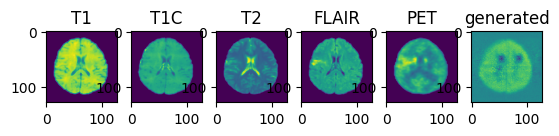

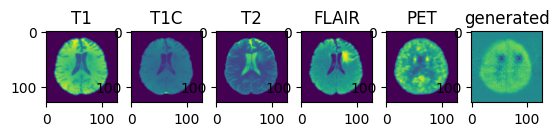

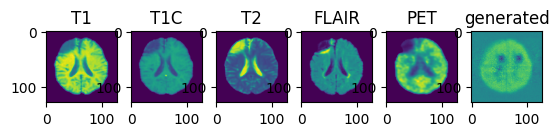

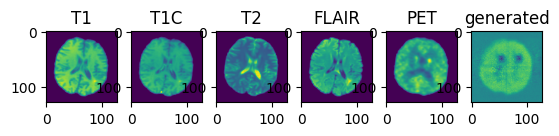

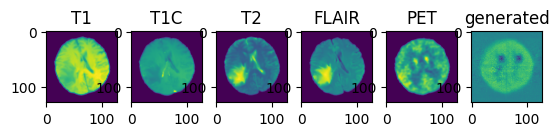

validation avg MS-SSIM: 0.4817 , train avg MS-SSIM: 0.4560


In [13]:
epoch_loss_values = [(0, 0)]
gen_step_loss = []
disc_step_loss = []
step = 0
max_epochs = 400
disc_train_interval = 1
disc_train_steps = 1
validation_interval = 10
best_ssim = 0.3
c_lambda = 10
torch.cuda.empty_cache()

#Training from scratch, dont need these
#saved_dict = torch.load("./saved_models/experiment9.pth")
#gen_net.load_state_dict(saved_dict['model_state_dict'])

for epoch in range(max_epochs):
    
    gen_net.train()
    disc_net.train()
    epoch_loss = 0

    print("-" * 10)
    print(f"epoch {epoch + 1}/{max_epochs}")

    for batch_data in tqdm(train_loader, desc=("Epoch ")):
        input_images = torch.cat((batch_data["t1"].to(device, dtype=torch.float), 
                                 batch_data["t1c"].to(device, dtype=torch.float), 
                                 batch_data["t2"].to(device, dtype=torch.float), 
                                 batch_data["flair"].to(device, dtype=torch.float)), dim=1).to(device)

        real_pet = batch_data["pet"].to(device, dtype=torch.float)
        
        gen_images = gen_net(input_images)
        gen_opt.zero_grad()
        loss = generator_loss(gen_images, real_pet)
        loss.backward()
        gen_opt.step()
        epoch_loss += loss.item()
        
        real_pet = real_pet[:,0,:,:,:]
        gen_images = gen_images[:,0,:,:,:]

        gen_step_loss.append((step, loss.item()))

        if step % disc_train_interval == 0:
            disc_total_loss = 0

            for _ in range(disc_train_steps):
                disc_opt.zero_grad()
                
                real_pred = disc_net(real_pet)
                fake_pred = disc_net(gen_images.detach())
                epsilon = torch.rand(len(real_pet), 1, 1, 1, device=device, requires_grad=True)
                gradient = get_gradient(disc_net, real_pet, gen_images.detach(), epsilon)
                gp = gradient_penalty(gradient)
                
                dloss = discriminator_loss(fake_pred, real_pred, gp, c_lambda)
                dloss.backward()
                disc_opt.step()
                disc_total_loss += dloss.item()

            disc_step_loss.append((step, disc_total_loss / disc_train_steps))
        step += 1
    
    epoch_loss /= step
    epoch_loss_values.append((step, epoch_loss))

    if (epoch+1) % validation_interval == 0:
        gen_net.eval()
        slice_index = 32
        ms_ssim = []
        ms_ssim_train = []
        ms_ssim_function = monai.metrics.MultiScaleSSIMMetric(spatial_dims = 3, reduction="none", kernel_size=4)
        
        with torch.no_grad():

            for item in train_metric_loader:
                input_images = torch.cat((item["t1"].to(device, dtype=torch.float), 
                                     item["t1c"].to(device, dtype=torch.float), 
                                     item["t2"].to(device, dtype=torch.float), 
                                     item["flair"].to(device, dtype=torch.float)), dim=1).to(device)
                
                generated = gen_net(input_images)
                ms_ssim_train.append(ms_ssim_function(generated.to(device), item["pet"].to(device)))

            curr_ssim_train = torch.mean(torch.FloatTensor(ms_ssim_train))
            
            for item in valid_loader:
                input_images = torch.cat((item["t1"].to(device, dtype=torch.float), 
                                     item["t1c"].to(device, dtype=torch.float), 
                                     item["t2"].to(device, dtype=torch.float), 
                                     item["flair"].to(device, dtype=torch.float)), dim=1).to(device)

                generated = gen_net(input_images)
        
                image_datas = item["t1"][0, 0, :, :, slice_index], item["t1c"][0, 0, :, :, slice_index], item["t2"][0, 0, :, :, slice_index], item["flair"][0, 0, :, :, slice_index], item["pet"][0, 0, :, :, slice_index], generated[0, 0, :, :, slice_index] 
                
                f, axarr = plt.subplots(1, 6)

                ms_ssim.append(ms_ssim_function(generated.to(device), item["pet"].to(device)))
                
                axarr[0].imshow(image_datas[0])
                axarr[0].set_title("T1")
                axarr[1].imshow(image_datas[1])
                axarr[1].set_title("T1C")
                axarr[2].imshow(image_datas[2])
                axarr[2].set_title("T2")
                axarr[3].imshow(image_datas[3])
                axarr[3].set_title("FLAIR")
                axarr[4].imshow(image_datas[4])
                axarr[4].set_title("PET")
                axarr[5].imshow(image_datas[5].cpu())
                axarr[5].set_title("generated")
                plt.show()
                
            curr_ssim = torch.mean(torch.FloatTensor(ms_ssim))

            if curr_ssim > best_ssim:
                best_ssim = curr_ssim
                torch.save({
                        'epoch': epoch,
                        'model_state_dict': gen_net.state_dict(),
                        'optimizer_state_dict': gen_opt.state_dict(),
                        }, "best_metric_glagan.pth")
                
        print("validation avg MS-SSIM: {:.4f} , train avg MS-SSIM: {:.4f}".format(curr_ssim, curr_ssim_train))
            

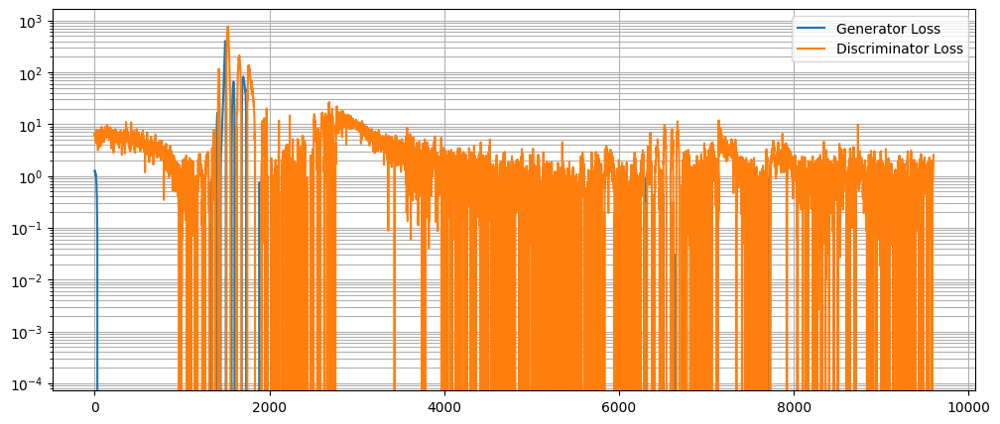

In [14]:
plt.figure(figsize=(12, 5))
plt.semilogy(*zip(*gen_step_loss), label="Generator Loss")
plt.semilogy(*zip(*disc_step_loss), label="Discriminator Loss")
plt.grid(True, "both", "both")
plt.legend()

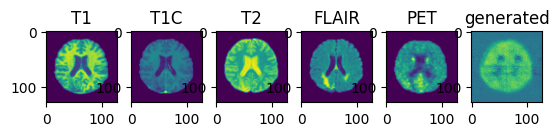

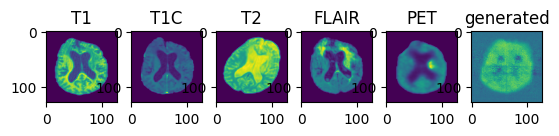

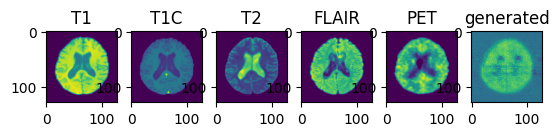

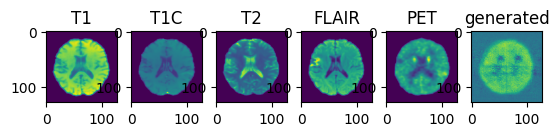

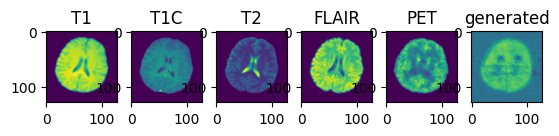

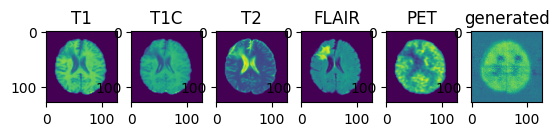

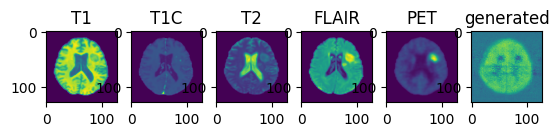

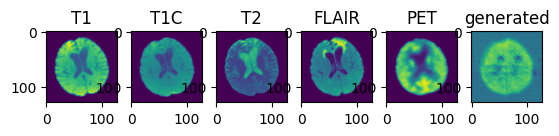

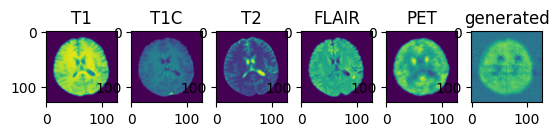

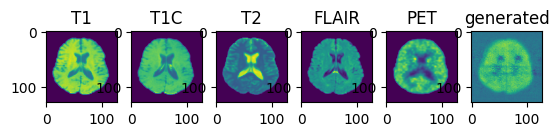

It has been 71821.61811256409 seconds since the loop started
validation avg MS-SSIM: 0.4809 validation avg MSE 0.0000


In [15]:

slice_index = 32

torch.cuda.empty_cache()

saved_dict = torch.load("best_metric_glagan.pth")
gen_net.load_state_dict(saved_dict['model_state_dict'])
gen_net.eval()

ms_ssim = []
ms_ssim_function = monai.metrics.MultiScaleSSIMMetric(spatial_dims = 3, reduction="none", kernel_size=4)

for item in check_DataLoader:

    with torch.no_grad():
        
        input_images = torch.cat((item["t1"].to(device, dtype=torch.float), 
                                     item["t1c"].to(device, dtype=torch.float), 
                                     item["t2"].to(device, dtype=torch.float), 
                                     item["flair"].to(device, dtype=torch.float)), dim=1).to(device)

        generated = gen_net(input_images)
        
        image_datas = item["t1"][0, 0, :, :, slice_index], item["t1c"][0, 0, :, :, slice_index], item["t2"][0, 0, :, :, slice_index], item["flair"][0, 0, :, :, slice_index], item["pet"][0, 0, :, :, slice_index], generated[0, 0, :, :, slice_index] 
                
        f, axarr = plt.subplots(1, 6)

        ms_ssim.append(ms_ssim_function(generated.to(device), item["pet"].to(device)))
                
        axarr[0].imshow(image_datas[0])
        axarr[0].set_title("T1")
        axarr[1].imshow(image_datas[1])
        axarr[1].set_title("T1C")
        axarr[2].imshow(image_datas[2])
        axarr[2].set_title("T2")
        axarr[3].imshow(image_datas[3])
        axarr[3].set_title("FLAIR")
        axarr[4].imshow(image_datas[4])
        axarr[4].set_title("PET")
        axarr[5].imshow(image_datas[5].cpu())
        axarr[5].set_title("generated")
        plt.show()


now = time()
print("It has been {0} seconds since the loop started".format(now - program_starts))

print("validation avg MS-SSIM: {:.4f} validation avg MSE {:.4f}".format(torch.mean(torch.FloatTensor(ms_ssim)), 0))